In [1]:
from sklearn.neural_network import MLPRegressor


import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import random
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import KFold, GridSearchCV
from sklearn.model_selection import cross_validate

plt.rcParams['figure.figsize'] = [8,5]
plt.rcParams['font.size'] =14

path = './'
std_ft_df = pd.read_csv(path+'std_ft_df.csv')
print('\nNumber of rows and columns in the data set: ',std_ft_df.shape)


Number of rows and columns in the data set:  (27820, 17)


In [11]:
#Lets look into top few rows and columns in the dataset
#std_ft_df.iloc[2784,:]

In [2]:
#X/y Split
X = std_ft_df.drop('suicides/100k pop',axis=1) # Independet variable
y = std_ft_df['suicides/100k pop'] # dependent variable

X = X.to_numpy()
y = y.to_numpy()

In [4]:
# EXAMPLE 1: Uses GridSearchCV
def cv_test(model, X, y, k=10, plot=True):
    # cross validation
    kf = KFold(n_splits=k, random_state=42)
    RMSE_train=[]
    RMSE_test=[]
    for train_index, test_index in kf.split(X):
        X_train= X[train_index,:]
        y_train= y[train_index]
        X_test= X[test_index,:]
        y_test= y[test_index]
        reg = model.fit(X_train, y_train)
        pred_train = reg.predict(X_train)
        pred_test = reg.predict(X_test)
        RMSE_train.append(np.sqrt(mean_squared_error(y_train, pred_train)))
        RMSE_test.append(np.sqrt(mean_squared_error(y_test, pred_test)))
    [rmse_train_ave, rmse_test_ave] = [np.mean(RMSE_train), np.mean(RMSE_test)]
    print('RMSE for train data=',rmse_train_ave)
    print('RMSE for test data=',rmse_test_ave)
    
    # test
    reg = model.fit(X, y)
    pred= reg.predict(X)
    if plot:
        plt.figure()
        plt.scatter(y, pred, marker='.')
        plt.plot(y,y,color='black')
        plt.xlabel('true values')
        plt.ylabel('fitted values')
        plt.title('fitted values versus true values')
        plt.show()

        plt.figure()
        plt.scatter(pred, (y - pred), marker='.')
        plt.plot(pred,np.zeros_like(pred),color='black')
        plt.xlabel('fitted values')
        plt.ylabel('residuals')
        plt.title('residuals versus fitted values')
        plt.show()
    
    return pred, rmse_train_ave, rmse_test_ave

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:293: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  warnings.warn(


Iteration 1, loss = 277.13006423
Iteration 2, loss = 273.55722249
Iteration 3, loss = 266.11352407
Iteration 4, loss = 253.98559826
Iteration 5, loss = 238.99299027
Iteration 6, loss = 222.76743687
Iteration 7, loss = 206.69111673
Iteration 8, loss = 191.74601751
Iteration 9, loss = 178.72341792
Iteration 10, loss = 167.95493804
Iteration 11, loss = 159.42704262
Iteration 12, loss = 152.90462070
Iteration 13, loss = 148.09558212
Iteration 14, loss = 144.57809370
Iteration 15, loss = 141.99142574
Iteration 16, loss = 140.05762483
Iteration 17, loss = 138.59521863
Iteration 18, loss = 137.38165062
Iteration 19, loss = 136.35740490
Iteration 20, loss = 135.42770582
Iteration 21, loss = 134.57441616
Iteration 22, loss = 133.78041848
Iteration 23, loss = 133.03154922
Iteration 24, loss = 132.31961361
Iteration 25, loss = 131.63994752
Iteration 26, loss = 130.99516750
Iteration 27, loss = 130.38197093
Iteration 28, loss = 129.79930134
Iteration 29, loss = 129.23717595
Iteration 30, loss = 12

Iteration 241, loss = 122.11251714
Iteration 242, loss = 122.11553127
Iteration 243, loss = 122.11694365
Iteration 244, loss = 122.11605802
Iteration 245, loss = 122.11680385
Iteration 246, loss = 122.11255937
Iteration 247, loss = 122.10937962
Iteration 248, loss = 122.11026329
Iteration 249, loss = 122.10814468
Iteration 250, loss = 122.10559302
Iteration 251, loss = 122.10671065
Iteration 252, loss = 122.10776610
Iteration 253, loss = 122.10478583
Iteration 254, loss = 122.10633403
Iteration 255, loss = 122.10779019
Iteration 256, loss = 122.10298444
Iteration 257, loss = 122.10240332
Iteration 258, loss = 122.10120186
Iteration 259, loss = 122.10156251
Iteration 260, loss = 122.09811842
Iteration 261, loss = 122.09975791
Iteration 262, loss = 122.09821106
Iteration 263, loss = 122.09922195
Iteration 264, loss = 122.09451700
Iteration 265, loss = 122.09709478
Iteration 266, loss = 122.09695794
Iteration 267, loss = 122.09524068
Iteration 268, loss = 122.09559808
Iteration 269, loss 

Iteration 62, loss = 123.63949460
Iteration 63, loss = 123.62199623
Iteration 64, loss = 123.60663846
Iteration 65, loss = 123.59929655
Iteration 66, loss = 123.58615382
Iteration 67, loss = 123.56683902
Iteration 68, loss = 123.56645706
Iteration 69, loss = 123.54746833
Iteration 70, loss = 123.53869682
Iteration 71, loss = 123.52872876
Iteration 72, loss = 123.51895438
Iteration 73, loss = 123.51106799
Iteration 74, loss = 123.50437799
Iteration 75, loss = 123.50057349
Iteration 76, loss = 123.48658567
Iteration 77, loss = 123.48361214
Iteration 78, loss = 123.48083654
Iteration 79, loss = 123.47076550
Iteration 80, loss = 123.45872679
Iteration 81, loss = 123.45521376
Iteration 82, loss = 123.44463590
Iteration 83, loss = 123.43976598
Iteration 84, loss = 123.43778848
Iteration 85, loss = 123.42715083
Iteration 86, loss = 123.42399931
Iteration 87, loss = 123.42060508
Iteration 88, loss = 123.41713206
Iteration 89, loss = 123.40400780
Iteration 90, loss = 123.40587920
Iteration 91, 

Iteration 300, loss = 123.01985909
Iteration 301, loss = 123.01770133
Iteration 302, loss = 123.00967961
Iteration 303, loss = 123.01805916
Iteration 304, loss = 123.00916462
Iteration 305, loss = 123.01209902
Iteration 306, loss = 123.00616496
Iteration 307, loss = 123.00619332
Iteration 308, loss = 123.00436341
Iteration 309, loss = 123.01480963
Iteration 310, loss = 123.01240033
Iteration 311, loss = 123.00506964
Iteration 312, loss = 123.00510548
Iteration 313, loss = 123.00817894
Iteration 314, loss = 123.00342957
Iteration 315, loss = 123.00102198
Iteration 316, loss = 123.01237999
Iteration 317, loss = 123.00364218
Iteration 318, loss = 123.00630119
Iteration 319, loss = 123.00859933
Iteration 320, loss = 123.00204953
Iteration 321, loss = 122.99823094
Iteration 322, loss = 122.99925647
Iteration 323, loss = 122.99681084
Iteration 324, loss = 123.00687310
Iteration 325, loss = 123.00270810
Iteration 326, loss = 122.99701998
Iteration 327, loss = 122.99888965
Iteration 328, loss 

Iteration 146, loss = 124.05533371
Iteration 147, loss = 124.05908874
Iteration 148, loss = 124.05423720
Iteration 149, loss = 124.05284001
Iteration 150, loss = 124.04849736
Iteration 151, loss = 124.04746634
Iteration 152, loss = 124.04334632
Iteration 153, loss = 124.04128243
Iteration 154, loss = 124.03904039
Iteration 155, loss = 124.03360681
Iteration 156, loss = 124.03854389
Iteration 157, loss = 124.03836370
Iteration 158, loss = 124.03895627
Iteration 159, loss = 124.02978323
Iteration 160, loss = 124.02672377
Iteration 161, loss = 124.03214576
Iteration 162, loss = 124.02244486
Iteration 163, loss = 124.02505273
Iteration 164, loss = 124.01606787
Iteration 165, loss = 124.02723205
Iteration 166, loss = 124.01999588
Iteration 167, loss = 124.01082666
Iteration 168, loss = 124.01003665
Iteration 169, loss = 124.01020160
Iteration 170, loss = 124.01067952
Iteration 171, loss = 124.01467386
Iteration 172, loss = 124.00697090
Iteration 173, loss = 124.01066384
Iteration 174, loss 

Iteration 48, loss = 123.34797640
Iteration 49, loss = 123.25606445
Iteration 50, loss = 123.17480839
Iteration 51, loss = 123.10612800
Iteration 52, loss = 123.04518253
Iteration 53, loss = 122.99447665
Iteration 54, loss = 122.95214980
Iteration 55, loss = 122.90898759
Iteration 56, loss = 122.87217260
Iteration 57, loss = 122.84533623
Iteration 58, loss = 122.82199446
Iteration 59, loss = 122.79648773
Iteration 60, loss = 122.77533736
Iteration 61, loss = 122.75332646
Iteration 62, loss = 122.73906792
Iteration 63, loss = 122.71849663
Iteration 64, loss = 122.71148962
Iteration 65, loss = 122.69395379
Iteration 66, loss = 122.68289273
Iteration 67, loss = 122.66379021
Iteration 68, loss = 122.65942800
Iteration 69, loss = 122.64537439
Iteration 70, loss = 122.63617022
Iteration 71, loss = 122.62744107
Iteration 72, loss = 122.61763387
Iteration 73, loss = 122.61036344
Iteration 74, loss = 122.60724408
Iteration 75, loss = 122.60535167
Iteration 76, loss = 122.59020172
Iteration 77, 

Iteration 285, loss = 122.13299713
Iteration 286, loss = 122.12845791
Iteration 287, loss = 122.12941357
Iteration 288, loss = 122.12917154
Iteration 289, loss = 122.13682740
Iteration 290, loss = 122.12706938
Iteration 291, loss = 122.12627523
Iteration 292, loss = 122.12660781
Iteration 293, loss = 122.12319241
Iteration 294, loss = 122.13657821
Iteration 295, loss = 122.12806253
Iteration 296, loss = 122.12495078
Iteration 297, loss = 122.12445236
Iteration 298, loss = 122.12520543
Iteration 299, loss = 122.12863500
Iteration 300, loss = 122.12881364
Iteration 301, loss = 122.12567847
Iteration 302, loss = 122.12166003
Iteration 303, loss = 122.12589137
Iteration 304, loss = 122.12043373
Iteration 305, loss = 122.12158587
Iteration 306, loss = 122.11725042
Iteration 307, loss = 122.11805585
Iteration 308, loss = 122.12264709
Iteration 309, loss = 122.12485458
Iteration 310, loss = 122.12541345
Iteration 311, loss = 122.11662974
Iteration 312, loss = 122.11330686
Iteration 313, loss 

Iteration 147, loss = 116.49034339
Iteration 148, loss = 116.48445809
Iteration 149, loss = 116.48333109
Iteration 150, loss = 116.48130200
Iteration 151, loss = 116.47666754
Iteration 152, loss = 116.47946009
Iteration 153, loss = 116.47623478
Iteration 154, loss = 116.47396111
Iteration 155, loss = 116.46859932
Iteration 156, loss = 116.47074775
Iteration 157, loss = 116.47350876
Iteration 158, loss = 116.47064400
Iteration 159, loss = 116.46112334
Iteration 160, loss = 116.46229564
Iteration 161, loss = 116.46284053
Iteration 162, loss = 116.45436362
Iteration 163, loss = 116.46057849
Iteration 164, loss = 116.44952092
Iteration 165, loss = 116.45155267
Iteration 166, loss = 116.45269844
Iteration 167, loss = 116.44586760
Iteration 168, loss = 116.44535858
Iteration 169, loss = 116.44456091
Iteration 170, loss = 116.44519225
Iteration 171, loss = 116.44164318
Iteration 172, loss = 116.43772816
Iteration 173, loss = 116.43801731
Iteration 174, loss = 116.43701545
Iteration 175, loss 

Iteration 19, loss = 126.56576480
Iteration 20, loss = 125.78341433
Iteration 21, loss = 125.05735672
Iteration 22, loss = 124.38419970
Iteration 23, loss = 123.75864860
Iteration 24, loss = 123.15897930
Iteration 25, loss = 122.58540250
Iteration 26, loss = 122.04206702
Iteration 27, loss = 121.51933116
Iteration 28, loss = 121.02414096
Iteration 29, loss = 120.55143052
Iteration 30, loss = 120.09319615
Iteration 31, loss = 119.66518241
Iteration 32, loss = 119.26035053
Iteration 33, loss = 118.86968517
Iteration 34, loss = 118.51041293
Iteration 35, loss = 118.18004564
Iteration 36, loss = 117.86489139
Iteration 37, loss = 117.57224211
Iteration 38, loss = 117.30226191
Iteration 39, loss = 117.05957628
Iteration 40, loss = 116.83734585
Iteration 41, loss = 116.62869413
Iteration 42, loss = 116.44458395
Iteration 43, loss = 116.27818788
Iteration 44, loss = 116.12849161
Iteration 45, loss = 115.99900312
Iteration 46, loss = 115.88871030
Iteration 47, loss = 115.77930745
Iteration 48, 

Iteration 258, loss = 114.59305884
Iteration 259, loss = 114.59428900
Iteration 260, loss = 114.58863301
Iteration 261, loss = 114.59000236
Iteration 262, loss = 114.58912675
Iteration 263, loss = 114.59052162
Iteration 264, loss = 114.59115515
Iteration 265, loss = 114.60008958
Iteration 266, loss = 114.59464281
Iteration 267, loss = 114.58820632
Iteration 268, loss = 114.58645246
Iteration 269, loss = 114.58620770
Iteration 270, loss = 114.59254773
Iteration 271, loss = 114.58686378
Iteration 272, loss = 114.58497786
Iteration 273, loss = 114.58273758
Iteration 274, loss = 114.58273600
Iteration 275, loss = 114.58107264
Iteration 276, loss = 114.58382157
Iteration 277, loss = 114.58210259
Iteration 278, loss = 114.58193163
Iteration 279, loss = 114.57831056
Iteration 280, loss = 114.58179995
Iteration 281, loss = 114.57884369
Iteration 282, loss = 114.58089827
Iteration 283, loss = 114.57668759
Iteration 284, loss = 114.57654598
Iteration 285, loss = 114.57578473
Iteration 286, loss 

Iteration 132, loss = 128.76352132
Iteration 133, loss = 128.75920274
Iteration 134, loss = 128.76103456
Iteration 135, loss = 128.75309636
Iteration 136, loss = 128.75361147
Iteration 137, loss = 128.75023015
Iteration 138, loss = 128.74568905
Iteration 139, loss = 128.74314426
Iteration 140, loss = 128.74175685
Iteration 141, loss = 128.73776801
Iteration 142, loss = 128.73378976
Iteration 143, loss = 128.73726862
Iteration 144, loss = 128.73120903
Iteration 145, loss = 128.72543895
Iteration 146, loss = 128.72556153
Iteration 147, loss = 128.72042759
Iteration 148, loss = 128.72165572
Iteration 149, loss = 128.71478076
Iteration 150, loss = 128.71766333
Iteration 151, loss = 128.71579668
Iteration 152, loss = 128.71072342
Iteration 153, loss = 128.70888763
Iteration 154, loss = 128.71337919
Iteration 155, loss = 128.70287860
Iteration 156, loss = 128.70306270
Iteration 157, loss = 128.70194091
Iteration 158, loss = 128.70151599
Iteration 159, loss = 128.69722818
Iteration 160, loss 

Iteration 95, loss = 113.41062968
Iteration 96, loss = 113.40789179
Iteration 97, loss = 113.40635785
Iteration 98, loss = 113.41168092
Iteration 99, loss = 113.39661684
Iteration 100, loss = 113.39516310
Iteration 101, loss = 113.38549282
Iteration 102, loss = 113.38290622
Iteration 103, loss = 113.37778585
Iteration 104, loss = 113.37588668
Iteration 105, loss = 113.37036114
Iteration 106, loss = 113.36307721
Iteration 107, loss = 113.36243090
Iteration 108, loss = 113.35854253
Iteration 109, loss = 113.36229551
Iteration 110, loss = 113.35241394
Iteration 111, loss = 113.34943427
Iteration 112, loss = 113.34322531
Iteration 113, loss = 113.34216347
Iteration 114, loss = 113.33408444
Iteration 115, loss = 113.33209273
Iteration 116, loss = 113.32887938
Iteration 117, loss = 113.32972471
Iteration 118, loss = 113.32053709
Iteration 119, loss = 113.31728475
Iteration 120, loss = 113.31647181
Iteration 121, loss = 113.31250762
Iteration 122, loss = 113.30724760
Iteration 123, loss = 113

Iteration 332, loss = 113.02744713
Iteration 333, loss = 113.02604086
Iteration 334, loss = 113.03233529
Iteration 335, loss = 113.02286059
Iteration 336, loss = 113.02326198
Iteration 337, loss = 113.02445951
Iteration 338, loss = 113.02082538
Iteration 339, loss = 113.02296509
Iteration 340, loss = 113.02165238
Iteration 341, loss = 113.02272579
Iteration 342, loss = 113.02210564
Iteration 343, loss = 113.01977852
Iteration 344, loss = 113.01861941
Iteration 345, loss = 113.02760491
Iteration 346, loss = 113.01787585
Iteration 347, loss = 113.02421836
Iteration 348, loss = 113.02322808
Iteration 349, loss = 113.02491852
Iteration 350, loss = 113.01782788
Iteration 351, loss = 113.01614743
Iteration 352, loss = 113.01894701
Iteration 353, loss = 113.01937139
Iteration 354, loss = 113.01727673
Iteration 355, loss = 113.01931238
Iteration 356, loss = 113.01598022
Iteration 357, loss = 113.01520265
Iteration 358, loss = 113.02082519
Iteration 359, loss = 113.01937442
Iteration 360, loss 

Iteration 167, loss = 116.82821735
Iteration 168, loss = 116.82410077
Iteration 169, loss = 116.81932101
Iteration 170, loss = 116.82077790
Iteration 171, loss = 116.81755124
Iteration 172, loss = 116.81493386
Iteration 173, loss = 116.81409137
Iteration 174, loss = 116.81045460
Iteration 175, loss = 116.81213984
Iteration 176, loss = 116.80881383
Iteration 177, loss = 116.80364917
Iteration 178, loss = 116.80336669
Iteration 179, loss = 116.80566845
Iteration 180, loss = 116.79836367
Iteration 181, loss = 116.79788426
Iteration 182, loss = 116.79341609
Iteration 183, loss = 116.79120526
Iteration 184, loss = 116.79494131
Iteration 185, loss = 116.79393745
Iteration 186, loss = 116.79620853
Iteration 187, loss = 116.79048877
Iteration 188, loss = 116.78878665
Iteration 189, loss = 116.78342886
Iteration 190, loss = 116.78629072
Iteration 191, loss = 116.78195535
Iteration 192, loss = 116.78216031
Iteration 193, loss = 116.78145475
Iteration 194, loss = 116.78402215
Iteration 195, loss 

Iteration 57, loss = 125.06585992
Iteration 58, loss = 125.04250617
Iteration 59, loss = 125.02071987
Iteration 60, loss = 125.00222200
Iteration 61, loss = 124.98344248
Iteration 62, loss = 124.96536233
Iteration 63, loss = 124.94981388
Iteration 64, loss = 124.94115865
Iteration 65, loss = 124.92634362
Iteration 66, loss = 124.91974262
Iteration 67, loss = 124.90344711
Iteration 68, loss = 124.89563596
Iteration 69, loss = 124.87872698
Iteration 70, loss = 124.86937778
Iteration 71, loss = 124.85892342
Iteration 72, loss = 124.85597370
Iteration 73, loss = 124.84885654
Iteration 74, loss = 124.83809642
Iteration 75, loss = 124.83074515
Iteration 76, loss = 124.82498488
Iteration 77, loss = 124.82074284
Iteration 78, loss = 124.80990338
Iteration 79, loss = 124.80356782
Iteration 80, loss = 124.79322895
Iteration 81, loss = 124.79456453
Iteration 82, loss = 124.78213105
Iteration 83, loss = 124.78002559
Iteration 84, loss = 124.77087567
Iteration 85, loss = 124.76595703
Iteration 86, 

Iteration 295, loss = 124.35272906
Iteration 296, loss = 124.34903518
Iteration 297, loss = 124.35123393
Iteration 298, loss = 124.36321002
Iteration 299, loss = 124.35109030
Iteration 300, loss = 124.34820696
Iteration 301, loss = 124.34812198
Iteration 302, loss = 124.35780674
Iteration 303, loss = 124.35267976
Iteration 304, loss = 124.35457628
Iteration 305, loss = 124.34198758
Iteration 306, loss = 124.34275229
Iteration 307, loss = 124.34406013
Iteration 308, loss = 124.34897790
Iteration 309, loss = 124.34397568
Iteration 310, loss = 124.34290446
Iteration 311, loss = 124.34583923
Iteration 312, loss = 124.34904748
Iteration 313, loss = 124.34203540
Iteration 314, loss = 124.34310313
Iteration 315, loss = 124.33937055
Iteration 316, loss = 124.33876448
Iteration 317, loss = 124.34520352
Iteration 318, loss = 124.33938002
Iteration 319, loss = 124.35014186
Iteration 320, loss = 124.33729139
Iteration 321, loss = 124.34185790
Iteration 322, loss = 124.34198102
Iteration 323, loss 

Iteration 97, loss = 121.14329716
Iteration 98, loss = 121.15382868
Iteration 99, loss = 121.14405340
Iteration 100, loss = 121.13671463
Iteration 101, loss = 121.13369704
Iteration 102, loss = 121.12831372
Iteration 103, loss = 121.12268879
Iteration 104, loss = 121.12180962
Iteration 105, loss = 121.11524012
Iteration 106, loss = 121.11846918
Iteration 107, loss = 121.10887323
Iteration 108, loss = 121.10387095
Iteration 109, loss = 121.10805132
Iteration 110, loss = 121.09753458
Iteration 111, loss = 121.09393581
Iteration 112, loss = 121.08754843
Iteration 113, loss = 121.08580754
Iteration 114, loss = 121.09884365
Iteration 115, loss = 121.08728385
Iteration 116, loss = 121.07711500
Iteration 117, loss = 121.08156222
Iteration 118, loss = 121.07189789
Iteration 119, loss = 121.06632945
Iteration 120, loss = 121.06274943
Iteration 121, loss = 121.06697792
Iteration 122, loss = 121.06535849
Iteration 123, loss = 121.05291021
Iteration 124, loss = 121.05711095
Iteration 125, loss = 1

Iteration 334, loss = 120.81979605
Iteration 335, loss = 120.81709886
Iteration 336, loss = 120.83099579
Iteration 337, loss = 120.81725159
Iteration 338, loss = 120.81339044
Iteration 339, loss = 120.81344880
Iteration 340, loss = 120.81558366
Iteration 341, loss = 120.81792524
Iteration 342, loss = 120.81652295
Iteration 343, loss = 120.81287855
Iteration 344, loss = 120.81399464
Iteration 345, loss = 120.81822757
Iteration 346, loss = 120.81250199
Iteration 347, loss = 120.81411359
Iteration 348, loss = 120.81439366
Iteration 349, loss = 120.81508420
Iteration 350, loss = 120.82517581
Iteration 351, loss = 120.81167317
Iteration 352, loss = 120.81112470
Iteration 353, loss = 120.81278910
Iteration 354, loss = 120.81650117
Iteration 355, loss = 120.81022795
Iteration 356, loss = 120.80964605
Iteration 357, loss = 120.81136056
Iteration 358, loss = 120.80661027
Iteration 359, loss = 120.80872402
Iteration 360, loss = 120.81604094
Iteration 361, loss = 120.80955311
Iteration 362, loss 

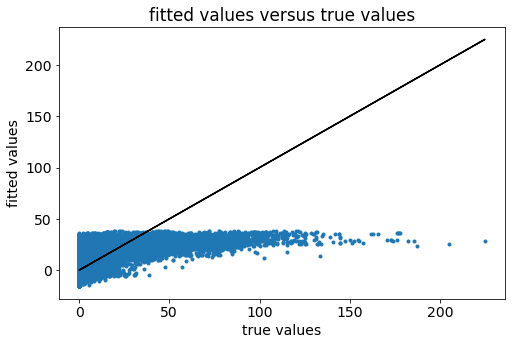

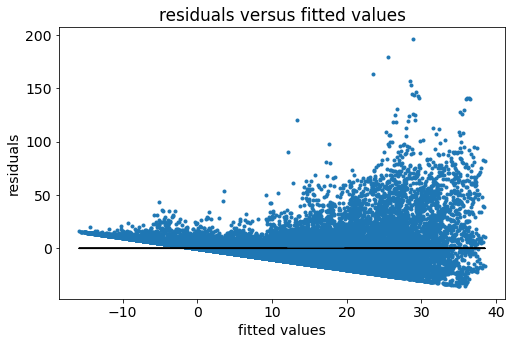

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:293: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  warnings.warn(


Iteration 1, loss = 276.60512458
Iteration 2, loss = 273.51099275
Iteration 3, loss = 265.52154463
Iteration 4, loss = 253.26774606
Iteration 5, loss = 238.70304453
Iteration 6, loss = 222.31412246
Iteration 7, loss = 205.63365589
Iteration 8, loss = 190.37840662
Iteration 9, loss = 177.53857320
Iteration 10, loss = 167.29231878
Iteration 11, loss = 159.39470125
Iteration 12, loss = 153.47067093
Iteration 13, loss = 149.13540523
Iteration 14, loss = 145.91958718
Iteration 15, loss = 143.47164986
Iteration 16, loss = 141.54663853
Iteration 17, loss = 139.99306168
Iteration 18, loss = 138.63414809
Iteration 19, loss = 137.42410139
Iteration 20, loss = 136.28495979
Iteration 21, loss = 135.20135629
Iteration 22, loss = 134.16210516
Iteration 23, loss = 133.15519375
Iteration 24, loss = 132.17842038
Iteration 25, loss = 131.21867231
Iteration 26, loss = 130.28440890
Iteration 27, loss = 129.38066802
Iteration 28, loss = 128.50419486
Iteration 29, loss = 127.64017222
Iteration 30, loss = 12

Iteration 239, loss = 109.42755877
Iteration 240, loss = 109.43012012
Iteration 241, loss = 109.41713366
Iteration 242, loss = 109.41555228
Iteration 243, loss = 109.41573512
Iteration 244, loss = 109.41245540
Iteration 245, loss = 109.40959966
Iteration 246, loss = 109.40513887
Iteration 247, loss = 109.39897424
Iteration 248, loss = 109.39785852
Iteration 249, loss = 109.39376201
Iteration 250, loss = 109.38760352
Iteration 251, loss = 109.38706073
Iteration 252, loss = 109.38440252
Iteration 253, loss = 109.38162561
Iteration 254, loss = 109.37766618
Iteration 255, loss = 109.38015304
Iteration 256, loss = 109.37492143
Iteration 257, loss = 109.37078980
Iteration 258, loss = 109.36575896
Iteration 259, loss = 109.36652658
Iteration 260, loss = 109.35900377
Iteration 261, loss = 109.35447252
Iteration 262, loss = 109.35492227
Iteration 263, loss = 109.35418874
Iteration 264, loss = 109.34781634
Iteration 265, loss = 109.34532519
Iteration 266, loss = 109.34637368
Iteration 267, loss 

Iteration 473, loss = 109.08969012
Iteration 474, loss = 109.09611760
Iteration 475, loss = 109.09889809
Iteration 476, loss = 109.09587530
Iteration 477, loss = 109.09194936
Iteration 478, loss = 109.09460864
Iteration 479, loss = 109.09786392
Iteration 480, loss = 109.09070262
Iteration 481, loss = 109.09809822
Iteration 482, loss = 109.09360824
Iteration 483, loss = 109.08930485
Iteration 484, loss = 109.09533138
Iteration 485, loss = 109.08687398
Iteration 486, loss = 109.10037295
Iteration 487, loss = 109.09524917
Iteration 488, loss = 109.08647540
Iteration 489, loss = 109.09201736
Iteration 490, loss = 109.09882939
Iteration 491, loss = 109.10347832
Iteration 492, loss = 109.09435293
Iteration 493, loss = 109.09251146
Iteration 494, loss = 109.09047025
Iteration 495, loss = 109.10091524
Iteration 496, loss = 109.08901028
Iteration 497, loss = 109.09236164
Iteration 498, loss = 109.08846092
Iteration 499, loss = 109.08552551
Iteration 500, loss = 109.08561258
Iteration 501, loss 

Iteration 176, loss = 112.42368134
Iteration 177, loss = 112.42197991
Iteration 178, loss = 112.41605783
Iteration 179, loss = 112.40979693
Iteration 180, loss = 112.40707636
Iteration 181, loss = 112.39946323
Iteration 182, loss = 112.39315645
Iteration 183, loss = 112.39150534
Iteration 184, loss = 112.38975751
Iteration 185, loss = 112.37509175
Iteration 186, loss = 112.37797705
Iteration 187, loss = 112.37478249
Iteration 188, loss = 112.37335782
Iteration 189, loss = 112.36665548
Iteration 190, loss = 112.35999682
Iteration 191, loss = 112.34951610
Iteration 192, loss = 112.35496238
Iteration 193, loss = 112.34402923
Iteration 194, loss = 112.33966769
Iteration 195, loss = 112.33818387
Iteration 196, loss = 112.32871905
Iteration 197, loss = 112.32145979
Iteration 198, loss = 112.32161976
Iteration 199, loss = 112.31688769
Iteration 200, loss = 112.30942917
Iteration 201, loss = 112.30758133
Iteration 202, loss = 112.30604261
Iteration 203, loss = 112.30354660
Iteration 204, loss 

Iteration 413, loss = 111.91268363
Iteration 414, loss = 111.91542711
Iteration 415, loss = 111.92110070
Iteration 416, loss = 111.90934578
Iteration 417, loss = 111.91198348
Iteration 418, loss = 111.91103406
Iteration 419, loss = 111.90881977
Iteration 420, loss = 111.90534248
Iteration 421, loss = 111.90668399
Iteration 422, loss = 111.91666969
Iteration 423, loss = 111.91906830
Iteration 424, loss = 111.90717741
Iteration 425, loss = 111.91188153
Iteration 426, loss = 111.90425449
Iteration 427, loss = 111.91019554
Iteration 428, loss = 111.90221087
Iteration 429, loss = 111.90347200
Iteration 430, loss = 111.90389371
Iteration 431, loss = 111.90643984
Iteration 432, loss = 111.91497822
Iteration 433, loss = 111.90348415
Iteration 434, loss = 111.90954406
Iteration 435, loss = 111.90816689
Iteration 436, loss = 111.90622089
Iteration 437, loss = 111.89772911
Iteration 438, loss = 111.90573512
Iteration 439, loss = 111.89989892
Iteration 440, loss = 111.90133992
Iteration 441, loss 

Iteration 201, loss = 111.82136141
Iteration 202, loss = 111.81930424
Iteration 203, loss = 111.81617558
Iteration 204, loss = 111.80734713
Iteration 205, loss = 111.80959879
Iteration 206, loss = 111.79844146
Iteration 207, loss = 111.79601056
Iteration 208, loss = 111.79269051
Iteration 209, loss = 111.78522722
Iteration 210, loss = 111.78461665
Iteration 211, loss = 111.77961642
Iteration 212, loss = 111.76829774
Iteration 213, loss = 111.77035576
Iteration 214, loss = 111.76523370
Iteration 215, loss = 111.76102881
Iteration 216, loss = 111.74894859
Iteration 217, loss = 111.75174199
Iteration 218, loss = 111.74431382
Iteration 219, loss = 111.74167667
Iteration 220, loss = 111.73615239
Iteration 221, loss = 111.72823298
Iteration 222, loss = 111.73167261
Iteration 223, loss = 111.73060987
Iteration 224, loss = 111.72056491
Iteration 225, loss = 111.71907926
Iteration 226, loss = 111.70937454
Iteration 227, loss = 111.71291647
Iteration 228, loss = 111.71118333
Iteration 229, loss 

Iteration 436, loss = 111.38055345
Iteration 437, loss = 111.37277862
Iteration 438, loss = 111.37808865
Iteration 439, loss = 111.37475557
Iteration 440, loss = 111.38318510
Iteration 441, loss = 111.38385825
Iteration 442, loss = 111.37453204
Iteration 443, loss = 111.38185348
Iteration 444, loss = 111.38253556
Iteration 445, loss = 111.38241937
Iteration 446, loss = 111.37493366
Iteration 447, loss = 111.37778002
Iteration 448, loss = 111.37619241
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 266.02323302
Iteration 2, loss = 263.12306233
Iteration 3, loss = 255.47145176
Iteration 4, loss = 243.22691870
Iteration 5, loss = 228.60701594
Iteration 6, loss = 212.65575149
Iteration 7, loss = 197.12187147
Iteration 8, loss = 183.24490499
Iteration 9, loss = 171.64351508
Iteration 10, loss = 162.46686655
Iteration 11, loss = 155.42008772
Iteration 12, loss = 150.19338788
Iteration 13, loss = 146.33672004
Iteration 14, loss = 1

Iteration 224, loss = 110.81714569
Iteration 225, loss = 110.81409867
Iteration 226, loss = 110.80448296
Iteration 227, loss = 110.81085837
Iteration 228, loss = 110.80485819
Iteration 229, loss = 110.79905721
Iteration 230, loss = 110.79233662
Iteration 231, loss = 110.79894757
Iteration 232, loss = 110.79065770
Iteration 233, loss = 110.79343953
Iteration 234, loss = 110.78857856
Iteration 235, loss = 110.77726617
Iteration 236, loss = 110.77770642
Iteration 237, loss = 110.78002597
Iteration 238, loss = 110.77272917
Iteration 239, loss = 110.77124553
Iteration 240, loss = 110.76403591
Iteration 241, loss = 110.75258650
Iteration 242, loss = 110.76005029
Iteration 243, loss = 110.75608824
Iteration 244, loss = 110.75606083
Iteration 245, loss = 110.74461304
Iteration 246, loss = 110.74199160
Iteration 247, loss = 110.73639190
Iteration 248, loss = 110.73609055
Iteration 249, loss = 110.73386264
Iteration 250, loss = 110.72562445
Iteration 251, loss = 110.72534928
Iteration 252, loss 

Iteration 1, loss = 252.43073394
Iteration 2, loss = 249.72929135
Iteration 3, loss = 242.27786519
Iteration 4, loss = 229.58250811
Iteration 5, loss = 214.75593626
Iteration 6, loss = 199.60296231
Iteration 7, loss = 185.36471454
Iteration 8, loss = 172.84731983
Iteration 9, loss = 162.41064814
Iteration 10, loss = 154.15466527
Iteration 11, loss = 147.81645085
Iteration 12, loss = 143.06459477
Iteration 13, loss = 139.50074359
Iteration 14, loss = 136.80743057
Iteration 15, loss = 134.70594097
Iteration 16, loss = 133.03870378
Iteration 17, loss = 131.65117019
Iteration 18, loss = 130.42978201
Iteration 19, loss = 129.30715625
Iteration 20, loss = 128.27146969
Iteration 21, loss = 127.28183011
Iteration 22, loss = 126.33736770
Iteration 23, loss = 125.43877334
Iteration 24, loss = 124.55873212
Iteration 25, loss = 123.70453877
Iteration 26, loss = 122.87627669
Iteration 27, loss = 122.05649061
Iteration 28, loss = 121.26059073
Iteration 29, loss = 120.48149694
Iteration 30, loss = 11

Iteration 241, loss = 104.60939491
Iteration 242, loss = 104.61366847
Iteration 243, loss = 104.60841733
Iteration 244, loss = 104.60940684
Iteration 245, loss = 104.59920394
Iteration 246, loss = 104.60014657
Iteration 247, loss = 104.59316284
Iteration 248, loss = 104.58769200
Iteration 249, loss = 104.59107596
Iteration 250, loss = 104.58425188
Iteration 251, loss = 104.58179053
Iteration 252, loss = 104.58291919
Iteration 253, loss = 104.58103562
Iteration 254, loss = 104.57768788
Iteration 255, loss = 104.57261351
Iteration 256, loss = 104.56689642
Iteration 257, loss = 104.57311302
Iteration 258, loss = 104.56431502
Iteration 259, loss = 104.56101485
Iteration 260, loss = 104.55576720
Iteration 261, loss = 104.55754699
Iteration 262, loss = 104.55380021
Iteration 263, loss = 104.55358538
Iteration 264, loss = 104.55188103
Iteration 265, loss = 104.55728827
Iteration 266, loss = 104.54413549
Iteration 267, loss = 104.54681489
Iteration 268, loss = 104.53839021
Iteration 269, loss 

Iteration 29, loss = 118.73693480
Iteration 30, loss = 118.01277853
Iteration 31, loss = 117.31588975
Iteration 32, loss = 116.63912229
Iteration 33, loss = 115.97909892
Iteration 34, loss = 115.35330874
Iteration 35, loss = 114.75714483
Iteration 36, loss = 114.17787168
Iteration 37, loss = 113.62481363
Iteration 38, loss = 113.09774240
Iteration 39, loss = 112.59622530
Iteration 40, loss = 112.11870007
Iteration 41, loss = 111.65260793
Iteration 42, loss = 111.21616523
Iteration 43, loss = 110.80336510
Iteration 44, loss = 110.41345576
Iteration 45, loss = 110.04923348
Iteration 46, loss = 109.71405205
Iteration 47, loss = 109.38667182
Iteration 48, loss = 109.09274511
Iteration 49, loss = 108.82259624
Iteration 50, loss = 108.57062474
Iteration 51, loss = 108.32594921
Iteration 52, loss = 108.10272057
Iteration 53, loss = 107.89285323
Iteration 54, loss = 107.70112107
Iteration 55, loss = 107.51631660
Iteration 56, loss = 107.33321962
Iteration 57, loss = 107.16526007
Iteration 58, 

Iteration 269, loss = 103.22811339
Iteration 270, loss = 103.22769299
Iteration 271, loss = 103.22397436
Iteration 272, loss = 103.21817769
Iteration 273, loss = 103.21651065
Iteration 274, loss = 103.21746322
Iteration 275, loss = 103.20987662
Iteration 276, loss = 103.21151405
Iteration 277, loss = 103.21096589
Iteration 278, loss = 103.20875532
Iteration 279, loss = 103.20458181
Iteration 280, loss = 103.20485611
Iteration 281, loss = 103.20113850
Iteration 282, loss = 103.20089667
Iteration 283, loss = 103.19455665
Iteration 284, loss = 103.19327117
Iteration 285, loss = 103.18987343
Iteration 286, loss = 103.19373606
Iteration 287, loss = 103.19259149
Iteration 288, loss = 103.18399294
Iteration 289, loss = 103.18956692
Iteration 290, loss = 103.18735169
Iteration 291, loss = 103.17884026
Iteration 292, loss = 103.17611982
Iteration 293, loss = 103.17740117
Iteration 294, loss = 103.17723050
Iteration 295, loss = 103.17135807
Iteration 296, loss = 103.16984129
Iteration 297, loss 

Iteration 35, loss = 128.82320052
Iteration 36, loss = 128.15768805
Iteration 37, loss = 127.51940559
Iteration 38, loss = 126.91247259
Iteration 39, loss = 126.33056814
Iteration 40, loss = 125.77861044
Iteration 41, loss = 125.23180339
Iteration 42, loss = 124.73170419
Iteration 43, loss = 124.25573413
Iteration 44, loss = 123.80120048
Iteration 45, loss = 123.37924125
Iteration 46, loss = 122.98851113
Iteration 47, loss = 122.60703683
Iteration 48, loss = 122.25620378
Iteration 49, loss = 121.93381972
Iteration 50, loss = 121.63143033
Iteration 51, loss = 121.34041903
Iteration 52, loss = 121.07621262
Iteration 53, loss = 120.82763952
Iteration 54, loss = 120.59669802
Iteration 55, loss = 120.37994225
Iteration 56, loss = 120.17226490
Iteration 57, loss = 119.97794997
Iteration 58, loss = 119.80704785
Iteration 59, loss = 119.65119281
Iteration 60, loss = 119.49933370
Iteration 61, loss = 119.35671722
Iteration 62, loss = 119.23034043
Iteration 63, loss = 119.10464326
Iteration 64, 

Iteration 275, loss = 115.55830087
Iteration 276, loss = 115.55457119
Iteration 277, loss = 115.55484337
Iteration 278, loss = 115.55001412
Iteration 279, loss = 115.54809766
Iteration 280, loss = 115.54215551
Iteration 281, loss = 115.54771063
Iteration 282, loss = 115.54138093
Iteration 283, loss = 115.54164150
Iteration 284, loss = 115.53758258
Iteration 285, loss = 115.53261035
Iteration 286, loss = 115.53370782
Iteration 287, loss = 115.53004927
Iteration 288, loss = 115.52585145
Iteration 289, loss = 115.52939617
Iteration 290, loss = 115.52826270
Iteration 291, loss = 115.52024000
Iteration 292, loss = 115.52112236
Iteration 293, loss = 115.51632484
Iteration 294, loss = 115.51898806
Iteration 295, loss = 115.51484487
Iteration 296, loss = 115.50973499
Iteration 297, loss = 115.50882975
Iteration 298, loss = 115.52232350
Iteration 299, loss = 115.50992068
Iteration 300, loss = 115.50846137
Iteration 301, loss = 115.51165477
Iteration 302, loss = 115.50397513
Iteration 303, loss 

Iteration 84, loss = 103.83957306
Iteration 85, loss = 103.81062308
Iteration 86, loss = 103.77574170
Iteration 87, loss = 103.74463115
Iteration 88, loss = 103.72185614
Iteration 89, loss = 103.69358177
Iteration 90, loss = 103.65625718
Iteration 91, loss = 103.62782197
Iteration 92, loss = 103.60892732
Iteration 93, loss = 103.57589933
Iteration 94, loss = 103.55466924
Iteration 95, loss = 103.52845030
Iteration 96, loss = 103.50312462
Iteration 97, loss = 103.48033226
Iteration 98, loss = 103.46525761
Iteration 99, loss = 103.43030464
Iteration 100, loss = 103.41350951
Iteration 101, loss = 103.38257837
Iteration 102, loss = 103.36568198
Iteration 103, loss = 103.34249583
Iteration 104, loss = 103.32554457
Iteration 105, loss = 103.30171015
Iteration 106, loss = 103.27865402
Iteration 107, loss = 103.26366537
Iteration 108, loss = 103.24416428
Iteration 109, loss = 103.23197999
Iteration 110, loss = 103.20581648
Iteration 111, loss = 103.18909267
Iteration 112, loss = 103.16307561
I

Iteration 320, loss = 102.03379792
Iteration 321, loss = 102.03788177
Iteration 322, loss = 102.02947525
Iteration 323, loss = 102.02498629
Iteration 324, loss = 102.02713629
Iteration 325, loss = 102.02631321
Iteration 326, loss = 102.02106665
Iteration 327, loss = 102.02172589
Iteration 328, loss = 102.01971821
Iteration 329, loss = 102.02017726
Iteration 330, loss = 102.01624256
Iteration 331, loss = 102.02098719
Iteration 332, loss = 102.01676935
Iteration 333, loss = 102.01555168
Iteration 334, loss = 102.02581469
Iteration 335, loss = 102.01043509
Iteration 336, loss = 102.01230209
Iteration 337, loss = 102.01376335
Iteration 338, loss = 102.00734881
Iteration 339, loss = 102.00730063
Iteration 340, loss = 102.00679393
Iteration 341, loss = 102.00943287
Iteration 342, loss = 102.00479167
Iteration 343, loss = 102.00170516
Iteration 344, loss = 101.99607856
Iteration 345, loss = 102.01030746
Iteration 346, loss = 101.99673817
Iteration 347, loss = 102.00194427
Iteration 348, loss 

Iteration 92, loss = 105.72034013
Iteration 93, loss = 105.67880051
Iteration 94, loss = 105.64923653
Iteration 95, loss = 105.62034283
Iteration 96, loss = 105.59113871
Iteration 97, loss = 105.56819254
Iteration 98, loss = 105.55686921
Iteration 99, loss = 105.51839980
Iteration 100, loss = 105.50708319
Iteration 101, loss = 105.47385136
Iteration 102, loss = 105.45795698
Iteration 103, loss = 105.43379474
Iteration 104, loss = 105.41058370
Iteration 105, loss = 105.39536012
Iteration 106, loss = 105.37333592
Iteration 107, loss = 105.36942511
Iteration 108, loss = 105.34815576
Iteration 109, loss = 105.33679764
Iteration 110, loss = 105.31661615
Iteration 111, loss = 105.30053584
Iteration 112, loss = 105.28484655
Iteration 113, loss = 105.27237760
Iteration 114, loss = 105.25468954
Iteration 115, loss = 105.24545756
Iteration 116, loss = 105.23480539
Iteration 117, loss = 105.22581627
Iteration 118, loss = 105.20555485
Iteration 119, loss = 105.19361171
Iteration 120, loss = 105.18

Iteration 330, loss = 104.42893042
Iteration 331, loss = 104.44028209
Iteration 332, loss = 104.43201045
Iteration 333, loss = 104.42683130
Iteration 334, loss = 104.43940863
Iteration 335, loss = 104.42232943
Iteration 336, loss = 104.42620073
Iteration 337, loss = 104.43153914
Iteration 338, loss = 104.42270187
Iteration 339, loss = 104.43197654
Iteration 340, loss = 104.42159564
Iteration 341, loss = 104.42462163
Iteration 342, loss = 104.42530560
Iteration 343, loss = 104.41960010
Iteration 344, loss = 104.41511026
Iteration 345, loss = 104.42095600
Iteration 346, loss = 104.41865144
Iteration 347, loss = 104.41464238
Iteration 348, loss = 104.41944140
Iteration 349, loss = 104.41468428
Iteration 350, loss = 104.41463292
Iteration 351, loss = 104.40753974
Iteration 352, loss = 104.41731486
Iteration 353, loss = 104.41666466
Iteration 354, loss = 104.41200759
Iteration 355, loss = 104.41923534
Iteration 356, loss = 104.41168925
Iteration 357, loss = 104.40531836
Iteration 358, loss 

Iteration 134, loss = 111.69576040
Iteration 135, loss = 111.68733989
Iteration 136, loss = 111.68378886
Iteration 137, loss = 111.66805604
Iteration 138, loss = 111.65311300
Iteration 139, loss = 111.65733545
Iteration 140, loss = 111.64041668
Iteration 141, loss = 111.62716520
Iteration 142, loss = 111.62233851
Iteration 143, loss = 111.62163175
Iteration 144, loss = 111.60461115
Iteration 145, loss = 111.59275288
Iteration 146, loss = 111.58910137
Iteration 147, loss = 111.58077661
Iteration 148, loss = 111.57681757
Iteration 149, loss = 111.56586647
Iteration 150, loss = 111.56332817
Iteration 151, loss = 111.55306080
Iteration 152, loss = 111.54740335
Iteration 153, loss = 111.53587442
Iteration 154, loss = 111.53979582
Iteration 155, loss = 111.52199366
Iteration 156, loss = 111.52020689
Iteration 157, loss = 111.50821825
Iteration 158, loss = 111.50531361
Iteration 159, loss = 111.50322945
Iteration 160, loss = 111.49919216
Iteration 161, loss = 111.48917944
Iteration 162, loss 

Iteration 369, loss = 111.00307466
Iteration 370, loss = 110.99686321
Iteration 371, loss = 111.00369672
Iteration 372, loss = 110.99931007
Iteration 373, loss = 110.99863485
Iteration 374, loss = 110.99942466
Iteration 375, loss = 110.99402081
Iteration 376, loss = 110.99308646
Iteration 377, loss = 110.99925614
Iteration 378, loss = 110.99117050
Iteration 379, loss = 110.99438447
Iteration 380, loss = 110.98736085
Iteration 381, loss = 110.98876828
Iteration 382, loss = 110.98787338
Iteration 383, loss = 111.00221132
Iteration 384, loss = 110.98861211
Iteration 385, loss = 110.99351088
Iteration 386, loss = 110.98540204
Iteration 387, loss = 110.98979663
Iteration 388, loss = 110.98607999
Iteration 389, loss = 110.99138872
Iteration 390, loss = 110.98127345
Iteration 391, loss = 110.98543549
Iteration 392, loss = 110.98387838
Iteration 393, loss = 110.98779712
Iteration 394, loss = 110.98434412
Iteration 395, loss = 110.97874085
Iteration 396, loss = 110.98450224
Iteration 397, loss 

Iteration 137, loss = 109.60292140
Iteration 138, loss = 109.59598708
Iteration 139, loss = 109.58205301
Iteration 140, loss = 109.58204170
Iteration 141, loss = 109.56827491
Iteration 142, loss = 109.56501453
Iteration 143, loss = 109.55301751
Iteration 144, loss = 109.54901548
Iteration 145, loss = 109.54423824
Iteration 146, loss = 109.53353158
Iteration 147, loss = 109.52403381
Iteration 148, loss = 109.52304762
Iteration 149, loss = 109.50487237
Iteration 150, loss = 109.49671724
Iteration 151, loss = 109.49296122
Iteration 152, loss = 109.48315518
Iteration 153, loss = 109.47919155
Iteration 154, loss = 109.46577389
Iteration 155, loss = 109.45841586
Iteration 156, loss = 109.46154653
Iteration 157, loss = 109.44540353
Iteration 158, loss = 109.44425083
Iteration 159, loss = 109.43645811
Iteration 160, loss = 109.43081240
Iteration 161, loss = 109.42030361
Iteration 162, loss = 109.41226949
Iteration 163, loss = 109.40876666
Iteration 164, loss = 109.40447858
Iteration 165, loss 

Iteration 374, loss = 108.90701467
Iteration 375, loss = 108.91188606
Iteration 376, loss = 108.91290531
Iteration 377, loss = 108.90696722
Iteration 378, loss = 108.90892380
Iteration 379, loss = 108.90628460
Iteration 380, loss = 108.91410565
Iteration 381, loss = 108.90188693
Iteration 382, loss = 108.90597363
Iteration 383, loss = 108.91388020
Iteration 384, loss = 108.90097895
Iteration 385, loss = 108.90777459
Iteration 386, loss = 108.89647251
Iteration 387, loss = 108.89794568
Iteration 388, loss = 108.90501774
Iteration 389, loss = 108.89448866
Iteration 390, loss = 108.89708766
Iteration 391, loss = 108.90329797
Iteration 392, loss = 108.89164997
Iteration 393, loss = 108.89893826
Iteration 394, loss = 108.90025396
Iteration 395, loss = 108.90125450
Iteration 396, loss = 108.89696322
Iteration 397, loss = 108.89063442
Iteration 398, loss = 108.89739904
Iteration 399, loss = 108.89332792
Iteration 400, loss = 108.89308373
Iteration 401, loss = 108.89246030
Iteration 402, loss 

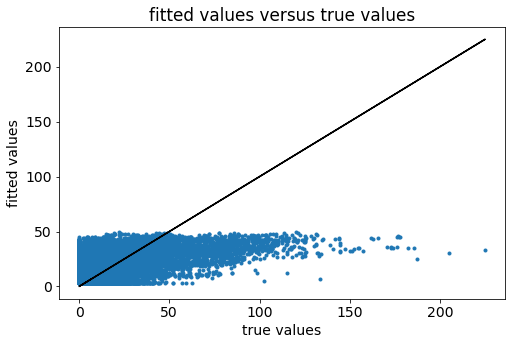

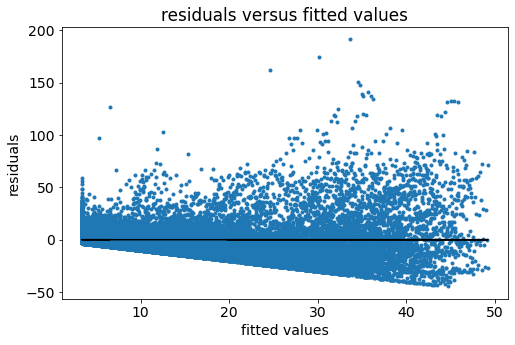

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:293: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  warnings.warn(


Iteration 1, loss = 274.75084692
Iteration 2, loss = 271.72988375
Iteration 3, loss = 268.12573312
Iteration 4, loss = 264.40188504
Iteration 5, loss = 260.82174393
Iteration 6, loss = 257.42645788
Iteration 7, loss = 254.21078439
Iteration 8, loss = 251.14045364
Iteration 9, loss = 248.21170715
Iteration 10, loss = 245.40821958
Iteration 11, loss = 242.71455441
Iteration 12, loss = 240.11696772
Iteration 13, loss = 237.61265934
Iteration 14, loss = 235.18606527
Iteration 15, loss = 232.83319302
Iteration 16, loss = 230.54957339
Iteration 17, loss = 228.34873073
Iteration 18, loss = 226.20619388
Iteration 19, loss = 224.12711690
Iteration 20, loss = 222.08959126
Iteration 21, loss = 220.08546395
Iteration 22, loss = 218.11212457
Iteration 23, loss = 216.16051676
Iteration 24, loss = 214.25015784
Iteration 25, loss = 212.37616565
Iteration 26, loss = 210.55115362
Iteration 27, loss = 208.77487525
Iteration 28, loss = 207.05111793
Iteration 29, loss = 205.36835014
Iteration 30, loss = 20

Iteration 240, loss = 119.74934134
Iteration 241, loss = 119.66292180
Iteration 242, loss = 119.58334017
Iteration 243, loss = 119.50494476
Iteration 244, loss = 119.42077930
Iteration 245, loss = 119.34588771
Iteration 246, loss = 119.26553351
Iteration 247, loss = 119.18619878
Iteration 248, loss = 119.11221022
Iteration 249, loss = 119.03361011
Iteration 250, loss = 118.95786875
Iteration 251, loss = 118.88292039
Iteration 252, loss = 118.80576004
Iteration 253, loss = 118.73362242
Iteration 254, loss = 118.65747618
Iteration 255, loss = 118.58891464
Iteration 256, loss = 118.51386471
Iteration 257, loss = 118.43597964
Iteration 258, loss = 118.36587452
Iteration 259, loss = 118.29635040
Iteration 260, loss = 118.22446750
Iteration 261, loss = 118.15252232
Iteration 262, loss = 118.08157020
Iteration 263, loss = 118.01072184
Iteration 264, loss = 117.94536427
Iteration 265, loss = 117.87426394
Iteration 266, loss = 117.80758331
Iteration 267, loss = 117.73990206
Iteration 268, loss 

Iteration 480, loss = 110.57089035
Iteration 481, loss = 110.56496438
Iteration 482, loss = 110.54859808
Iteration 483, loss = 110.53404451
Iteration 484, loss = 110.52354239
Iteration 485, loss = 110.50479222
Iteration 486, loss = 110.50214403
Iteration 487, loss = 110.48835799
Iteration 488, loss = 110.46634481
Iteration 489, loss = 110.46110871
Iteration 490, loss = 110.45138276
Iteration 491, loss = 110.44812429
Iteration 492, loss = 110.42343326
Iteration 493, loss = 110.41275781
Iteration 494, loss = 110.39562938
Iteration 495, loss = 110.39555938
Iteration 496, loss = 110.37222132
Iteration 497, loss = 110.36498827
Iteration 498, loss = 110.34695239
Iteration 499, loss = 110.33520752
Iteration 500, loss = 110.32118296
Iteration 501, loss = 110.30663439
Iteration 502, loss = 110.29058051
Iteration 503, loss = 110.28744951
Iteration 504, loss = 110.29191593
Iteration 505, loss = 110.25820943
Iteration 506, loss = 110.25890466
Iteration 507, loss = 110.23398503
Iteration 508, loss 

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 262.75317844
Iteration 2, loss = 259.85707792
Iteration 3, loss = 256.41204899
Iteration 4, loss = 252.84683526
Iteration 5, loss = 249.42244190
Iteration 6, loss = 246.17833147
Iteration 7, loss = 243.11266031
Iteration 8, loss = 240.18903549
Iteration 9, loss = 237.40382185
Iteration 10, loss = 234.74201054
Iteration 11, loss = 232.18705904
Iteration 12, loss = 229.72614232
Iteration 13, loss = 227.35690752
Iteration 14, loss = 225.06471985
Iteration 15, loss = 222.84749821
Iteration 16, loss = 220.69311885
Iteration 17, loss = 218.61898067
Iteration 18, loss = 216.59721070
Iteration 19, loss = 214.63337734
Iteration 20, loss = 212.70398709
Iteration 21, loss = 210.80811675
Iteration 22, loss = 208.94324258
Iteration 23, loss = 207.10788795
Iteration 24, loss = 205.31982413
Iteration 25, loss = 203.57096232
Iteration 26, loss = 201.86733881
Iteration 27, loss = 200.21095269
Iteration 28, loss = 198.60657822
Iteration 29, loss = 197.04137087
Iteration 30, loss = 19

Iteration 242, loss = 120.10951820
Iteration 243, loss = 120.06661308
Iteration 244, loss = 120.02235642
Iteration 245, loss = 119.98402164
Iteration 246, loss = 119.93954536
Iteration 247, loss = 119.89737475
Iteration 248, loss = 119.85889958
Iteration 249, loss = 119.81797747
Iteration 250, loss = 119.77987026
Iteration 251, loss = 119.74193933
Iteration 252, loss = 119.70297849
Iteration 253, loss = 119.66493817
Iteration 254, loss = 119.62477884
Iteration 255, loss = 119.58984785
Iteration 256, loss = 119.55245387
Iteration 257, loss = 119.51223489
Iteration 258, loss = 119.47549365
Iteration 259, loss = 119.44172875
Iteration 260, loss = 119.40464509
Iteration 261, loss = 119.36686528
Iteration 262, loss = 119.33244971
Iteration 263, loss = 119.29609412
Iteration 264, loss = 119.26440527
Iteration 265, loss = 119.22560732
Iteration 266, loss = 119.19316047
Iteration 267, loss = 119.16200110
Iteration 268, loss = 119.12052905
Iteration 269, loss = 119.08743657
Iteration 270, loss 

Iteration 477, loss = 113.61924592
Iteration 478, loss = 113.60736166
Iteration 479, loss = 113.59719725
Iteration 480, loss = 113.57965447
Iteration 481, loss = 113.57301742
Iteration 482, loss = 113.56049319
Iteration 483, loss = 113.55175870
Iteration 484, loss = 113.54020755
Iteration 485, loss = 113.53080367
Iteration 486, loss = 113.52235197
Iteration 487, loss = 113.51156606
Iteration 488, loss = 113.49618791
Iteration 489, loss = 113.49167013
Iteration 490, loss = 113.48090313
Iteration 491, loss = 113.47718267
Iteration 492, loss = 113.45899338
Iteration 493, loss = 113.45011637
Iteration 494, loss = 113.43625863
Iteration 495, loss = 113.43473550
Iteration 496, loss = 113.41545096
Iteration 497, loss = 113.40980069
Iteration 498, loss = 113.39122479
Iteration 499, loss = 113.38445921
Iteration 500, loss = 113.37542279
Iteration 501, loss = 113.36071950
Iteration 502, loss = 113.34721806
Iteration 503, loss = 113.34497589
Iteration 504, loss = 113.34551254
Iteration 505, loss 

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 4, loss = 258.12943524
Iteration 5, loss = 254.67106114
Iteration 6, loss = 251.39298879
Iteration 7, loss = 248.29712950
Iteration 8, loss = 245.35002111
Iteration 9, loss = 242.53837659
Iteration 10, loss = 239.85135794
Iteration 11, loss = 237.26718282
Iteration 12, loss = 234.78110739
Iteration 13, loss = 232.38522503
Iteration 14, loss = 230.06940286
Iteration 15, loss = 227.82486903
Iteration 16, loss = 225.64831015
Iteration 17, loss = 223.54906185
Iteration 18, loss = 221.49714316
Iteration 19, loss = 219.50243891
Iteration 20, loss = 217.54393420
Iteration 21, loss = 215.61598271
Iteration 22, loss = 213.72232254
Iteration 23, loss = 211.86170189
Iteration 24, loss = 210.04277675
Iteration 25, loss = 208.26448515
Iteration 26, loss = 206.53118407
Iteration 27, loss = 204.84422734
Iteration 28, loss = 203.20887250
Iteration 29, loss = 201.61196447
Iteration 30, loss = 200.04828614
Iteration 31, loss = 198.53825291
Iteration 32, loss = 197.06017758
Iteration 33, loss 

Iteration 243, loss = 120.52359828
Iteration 244, loss = 120.47027535
Iteration 245, loss = 120.42154272
Iteration 246, loss = 120.36569087
Iteration 247, loss = 120.31515326
Iteration 248, loss = 120.26615429
Iteration 249, loss = 120.21475744
Iteration 250, loss = 120.16643236
Iteration 251, loss = 120.11592956
Iteration 252, loss = 120.06746107
Iteration 253, loss = 120.01880471
Iteration 254, loss = 119.97070783
Iteration 255, loss = 119.92410803
Iteration 256, loss = 119.87448334
Iteration 257, loss = 119.82464789
Iteration 258, loss = 119.77661535
Iteration 259, loss = 119.73195254
Iteration 260, loss = 119.68395347
Iteration 261, loss = 119.63537863
Iteration 262, loss = 119.58826941
Iteration 263, loss = 119.54173198
Iteration 264, loss = 119.49504629
Iteration 265, loss = 119.44709189
Iteration 266, loss = 119.39982538
Iteration 267, loss = 119.35494826
Iteration 268, loss = 119.30295678
Iteration 269, loss = 119.25413736
Iteration 270, loss = 119.20490547
Iteration 271, loss 

Iteration 480, loss = 112.95554597
Iteration 481, loss = 112.95156522
Iteration 482, loss = 112.93595418
Iteration 483, loss = 112.93074908
Iteration 484, loss = 112.91685989
Iteration 485, loss = 112.90235224
Iteration 486, loss = 112.89376139
Iteration 487, loss = 112.88493226
Iteration 488, loss = 112.87398728
Iteration 489, loss = 112.86394020
Iteration 490, loss = 112.85595837
Iteration 491, loss = 112.85305801
Iteration 492, loss = 112.82805944
Iteration 493, loss = 112.82759780
Iteration 494, loss = 112.80770598
Iteration 495, loss = 112.80730973
Iteration 496, loss = 112.78786312
Iteration 497, loss = 112.78084226
Iteration 498, loss = 112.76194530
Iteration 499, loss = 112.75541047
Iteration 500, loss = 112.74538718
Iteration 501, loss = 112.73288965
Iteration 502, loss = 112.71933482
Iteration 503, loss = 112.71343054
Iteration 504, loss = 112.71577395
Iteration 505, loss = 112.69374886
Iteration 506, loss = 112.69089577
Iteration 507, loss = 112.67064915
Iteration 508, loss 

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 3, loss = 257.83422432
Iteration 4, loss = 254.24927724
Iteration 5, loss = 250.80602767
Iteration 6, loss = 247.54036501
Iteration 7, loss = 244.45253391
Iteration 8, loss = 241.51259833
Iteration 9, loss = 238.70719299
Iteration 10, loss = 236.02949467
Iteration 11, loss = 233.45314403
Iteration 12, loss = 230.97499155
Iteration 13, loss = 228.58457930
Iteration 14, loss = 226.27184291
Iteration 15, loss = 224.03265425
Iteration 16, loss = 221.86659190
Iteration 17, loss = 219.77312289
Iteration 18, loss = 217.73134212
Iteration 19, loss = 215.74555830
Iteration 20, loss = 213.80081199
Iteration 21, loss = 211.88848435
Iteration 22, loss = 210.00978036
Iteration 23, loss = 208.16224814
Iteration 24, loss = 206.35759990
Iteration 25, loss = 204.59381509
Iteration 26, loss = 202.87214124
Iteration 27, loss = 201.20013604
Iteration 28, loss = 199.57842860
Iteration 29, loss = 197.99850117
Iteration 30, loss = 196.45285061
Iteration 31, loss = 194.95996681
Iteration 32, loss =

Iteration 242, loss = 119.08475520
Iteration 243, loss = 119.01899682
Iteration 244, loss = 118.95411236
Iteration 245, loss = 118.89002438
Iteration 246, loss = 118.82240328
Iteration 247, loss = 118.75821613
Iteration 248, loss = 118.69898031
Iteration 249, loss = 118.63447303
Iteration 250, loss = 118.57385204
Iteration 251, loss = 118.51333589
Iteration 252, loss = 118.45378581
Iteration 253, loss = 118.39297472
Iteration 254, loss = 118.33479038
Iteration 255, loss = 118.27628397
Iteration 256, loss = 118.21757852
Iteration 257, loss = 118.15790254
Iteration 258, loss = 118.10099396
Iteration 259, loss = 118.04675574
Iteration 260, loss = 117.99330265
Iteration 261, loss = 117.93810983
Iteration 262, loss = 117.88178138
Iteration 263, loss = 117.83024818
Iteration 264, loss = 117.78074487
Iteration 265, loss = 117.73256693
Iteration 266, loss = 117.67111354
Iteration 267, loss = 117.62831235
Iteration 268, loss = 117.56984349
Iteration 269, loss = 117.52128410
Iteration 270, loss 

Iteration 481, loss = 111.89009214
Iteration 482, loss = 111.87384140
Iteration 483, loss = 111.87458096
Iteration 484, loss = 111.85673812
Iteration 485, loss = 111.83862897
Iteration 486, loss = 111.83108637
Iteration 487, loss = 111.82083314
Iteration 488, loss = 111.80698767
Iteration 489, loss = 111.79972883
Iteration 490, loss = 111.78172415
Iteration 491, loss = 111.78011942
Iteration 492, loss = 111.76183889
Iteration 493, loss = 111.75861353
Iteration 494, loss = 111.73495856
Iteration 495, loss = 111.73061043
Iteration 496, loss = 111.71640738
Iteration 497, loss = 111.70850379
Iteration 498, loss = 111.69257238
Iteration 499, loss = 111.67995960
Iteration 500, loss = 111.67668741
Iteration 501, loss = 111.65954597
Iteration 502, loss = 111.64967795
Iteration 503, loss = 111.63422661
Iteration 504, loss = 111.64002630
Iteration 505, loss = 111.61591547
Iteration 506, loss = 111.61881508
Iteration 507, loss = 111.59045362
Iteration 508, loss = 111.59200748
Iteration 509, loss 

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 5, loss = 237.78369687
Iteration 6, loss = 234.65267446
Iteration 7, loss = 231.69510317
Iteration 8, loss = 228.88585756
Iteration 9, loss = 226.20337582
Iteration 10, loss = 223.64490230
Iteration 11, loss = 221.18821753
Iteration 12, loss = 218.82897748
Iteration 13, loss = 216.55222497
Iteration 14, loss = 214.35512006
Iteration 15, loss = 212.22683839
Iteration 16, loss = 210.17282704
Iteration 17, loss = 208.18870574
Iteration 18, loss = 206.25644944
Iteration 19, loss = 204.37202824
Iteration 20, loss = 202.52998885
Iteration 21, loss = 200.72000857
Iteration 22, loss = 198.94327921
Iteration 23, loss = 197.20536395
Iteration 24, loss = 195.50999409
Iteration 25, loss = 193.85201806
Iteration 26, loss = 192.23369051
Iteration 27, loss = 190.66582584
Iteration 28, loss = 189.14369676
Iteration 29, loss = 187.66228388
Iteration 30, loss = 186.21515418
Iteration 31, loss = 184.81739309
Iteration 32, loss = 183.45106394
Iteration 33, loss = 182.12185893
Iteration 34, loss

Iteration 244, loss = 112.60500767
Iteration 245, loss = 112.53762183
Iteration 246, loss = 112.46684704
Iteration 247, loss = 112.39750587
Iteration 248, loss = 112.33133076
Iteration 249, loss = 112.26338658
Iteration 250, loss = 112.19619922
Iteration 251, loss = 112.12931172
Iteration 252, loss = 112.06696865
Iteration 253, loss = 112.00106243
Iteration 254, loss = 111.93460439
Iteration 255, loss = 111.87251158
Iteration 256, loss = 111.80857843
Iteration 257, loss = 111.74362550
Iteration 258, loss = 111.68080362
Iteration 259, loss = 111.61897463
Iteration 260, loss = 111.56165839
Iteration 261, loss = 111.50150176
Iteration 262, loss = 111.43720758
Iteration 263, loss = 111.38044119
Iteration 264, loss = 111.32429945
Iteration 265, loss = 111.26901584
Iteration 266, loss = 111.20125687
Iteration 267, loss = 111.15185800
Iteration 268, loss = 111.08528233
Iteration 269, loss = 111.03054951
Iteration 270, loss = 110.97330625
Iteration 271, loss = 110.91489090
Iteration 272, loss 

Iteration 485, loss = 105.23126928
Iteration 486, loss = 105.22560634
Iteration 487, loss = 105.21433158
Iteration 488, loss = 105.20577822
Iteration 489, loss = 105.19618919
Iteration 490, loss = 105.18117094
Iteration 491, loss = 105.18145327
Iteration 492, loss = 105.16744152
Iteration 493, loss = 105.15912260
Iteration 494, loss = 105.14371904
Iteration 495, loss = 105.13923963
Iteration 496, loss = 105.12767378
Iteration 497, loss = 105.12156435
Iteration 498, loss = 105.10689278
Iteration 499, loss = 105.09604440
Iteration 500, loss = 105.09690376
Iteration 501, loss = 105.08374520
Iteration 502, loss = 105.07108675
Iteration 503, loss = 105.06075538
Iteration 504, loss = 105.06261526
Iteration 505, loss = 105.03504553
Iteration 506, loss = 105.04646408
Iteration 507, loss = 105.01891156
Iteration 508, loss = 105.02801586
Iteration 509, loss = 105.01482807
Iteration 510, loss = 105.00293341
Iteration 511, loss = 105.00183093
Iteration 512, loss = 104.99192192
Iteration 513, loss 

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 252.00800097
Iteration 2, loss = 249.11621777
Iteration 3, loss = 245.70360164
Iteration 4, loss = 242.20858329
Iteration 5, loss = 238.84753363
Iteration 6, loss = 235.66962469
Iteration 7, loss = 232.66595681
Iteration 8, loss = 229.81480149
Iteration 9, loss = 227.09093926
Iteration 10, loss = 224.49048200
Iteration 11, loss = 221.98934433
Iteration 12, loss = 219.58487234
Iteration 13, loss = 217.26259213
Iteration 14, loss = 215.01946679
Iteration 15, loss = 212.84369778
Iteration 16, loss = 210.74904677
Iteration 17, loss = 208.71881947
Iteration 18, loss = 206.74308565
Iteration 19, loss = 204.81509605
Iteration 20, loss = 202.92731342
Iteration 21, loss = 201.06732030
Iteration 22, loss = 199.24109158
Iteration 23, loss = 197.45670563
Iteration 24, loss = 195.71270252
Iteration 25, loss = 194.01174448
Iteration 26, loss = 192.34887753
Iteration 27, loss = 190.73472265
Iteration 28, loss = 189.16803671
Iteration 29, loss = 187.64162919
Iteration 30, loss = 18

Iteration 244, loss = 111.89283284
Iteration 245, loss = 111.84590723
Iteration 246, loss = 111.79545963
Iteration 247, loss = 111.74953702
Iteration 248, loss = 111.70379528
Iteration 249, loss = 111.65773964
Iteration 250, loss = 111.60883858
Iteration 251, loss = 111.56153423
Iteration 252, loss = 111.52084811
Iteration 253, loss = 111.47076527
Iteration 254, loss = 111.42431825
Iteration 255, loss = 111.38161092
Iteration 256, loss = 111.33785242
Iteration 257, loss = 111.29543892
Iteration 258, loss = 111.24801904
Iteration 259, loss = 111.20548004
Iteration 260, loss = 111.16319237
Iteration 261, loss = 111.12141233
Iteration 262, loss = 111.07672923
Iteration 263, loss = 111.03492041
Iteration 264, loss = 110.99460337
Iteration 265, loss = 110.95211860
Iteration 266, loss = 110.90722086
Iteration 267, loss = 110.86495719
Iteration 268, loss = 110.81951506
Iteration 269, loss = 110.77784866
Iteration 270, loss = 110.73519429
Iteration 271, loss = 110.69314324
Iteration 272, loss 

Iteration 481, loss = 104.64786096
Iteration 482, loss = 104.63269006
Iteration 483, loss = 104.63110089
Iteration 484, loss = 104.61587793
Iteration 485, loss = 104.60453565
Iteration 486, loss = 104.58476290
Iteration 487, loss = 104.57499932
Iteration 488, loss = 104.56176077
Iteration 489, loss = 104.55710374
Iteration 490, loss = 104.53572224
Iteration 491, loss = 104.52516471
Iteration 492, loss = 104.50614092
Iteration 493, loss = 104.50424268
Iteration 494, loss = 104.48508350
Iteration 495, loss = 104.47521701
Iteration 496, loss = 104.46669043
Iteration 497, loss = 104.45132051
Iteration 498, loss = 104.43967566
Iteration 499, loss = 104.42639416
Iteration 500, loss = 104.42329946
Iteration 501, loss = 104.41024393
Iteration 502, loss = 104.39668489
Iteration 503, loss = 104.38062649
Iteration 504, loss = 104.37708562
Iteration 505, loss = 104.35204209
Iteration 506, loss = 104.35053149
Iteration 507, loss = 104.33632683
Iteration 508, loss = 104.33049317
Iteration 509, loss 

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 3, loss = 273.05495341
Iteration 4, loss = 269.38079101
Iteration 5, loss = 265.83700646
Iteration 6, loss = 262.47385994
Iteration 7, loss = 259.30098485
Iteration 8, loss = 256.28621743
Iteration 9, loss = 253.40551403
Iteration 10, loss = 250.64901627
Iteration 11, loss = 247.99631539
Iteration 12, loss = 245.44482630
Iteration 13, loss = 242.97538781
Iteration 14, loss = 240.58459060
Iteration 15, loss = 238.26522256
Iteration 16, loss = 236.02650832
Iteration 17, loss = 233.85698361
Iteration 18, loss = 231.74380771
Iteration 19, loss = 229.68200643
Iteration 20, loss = 227.66127660
Iteration 21, loss = 225.67083143
Iteration 22, loss = 223.71508382
Iteration 23, loss = 221.80254563
Iteration 24, loss = 219.92742474
Iteration 25, loss = 218.09526680
Iteration 26, loss = 216.30181141
Iteration 27, loss = 214.55644811
Iteration 28, loss = 212.85885113
Iteration 29, loss = 211.20478340
Iteration 30, loss = 209.58698378
Iteration 31, loss = 208.01795244
Iteration 32, loss =

Iteration 244, loss = 125.58075366
Iteration 245, loss = 125.50039435
Iteration 246, loss = 125.41683533
Iteration 247, loss = 125.33565077
Iteration 248, loss = 125.25429488
Iteration 249, loss = 125.17697122
Iteration 250, loss = 125.09124792
Iteration 251, loss = 125.01117608
Iteration 252, loss = 124.93443931
Iteration 253, loss = 124.85017993
Iteration 254, loss = 124.76803175
Iteration 255, loss = 124.69000494
Iteration 256, loss = 124.61340823
Iteration 257, loss = 124.53551232
Iteration 258, loss = 124.45239694
Iteration 259, loss = 124.37613213
Iteration 260, loss = 124.30520773
Iteration 261, loss = 124.23131165
Iteration 262, loss = 124.15407783
Iteration 263, loss = 124.07883715
Iteration 264, loss = 124.01103418
Iteration 265, loss = 123.94004113
Iteration 266, loss = 123.86273129
Iteration 267, loss = 123.79690912
Iteration 268, loss = 123.72542927
Iteration 269, loss = 123.65556830
Iteration 270, loss = 123.58978751
Iteration 271, loss = 123.52096015
Iteration 272, loss 

Iteration 484, loss = 117.06947723
Iteration 485, loss = 117.05743635
Iteration 486, loss = 117.03659480
Iteration 487, loss = 117.03117521
Iteration 488, loss = 117.01301394
Iteration 489, loss = 117.00625894
Iteration 490, loss = 116.98587624
Iteration 491, loss = 116.97850462
Iteration 492, loss = 116.95908571
Iteration 493, loss = 116.95523137
Iteration 494, loss = 116.94001977
Iteration 495, loss = 116.92857570
Iteration 496, loss = 116.91766539
Iteration 497, loss = 116.90123142
Iteration 498, loss = 116.89161095
Iteration 499, loss = 116.88300496
Iteration 500, loss = 116.87083902
Iteration 501, loss = 116.85860274
Iteration 502, loss = 116.84392352
Iteration 503, loss = 116.83135319
Iteration 504, loss = 116.82366220
Iteration 505, loss = 116.80452262
Iteration 506, loss = 116.80256517
Iteration 507, loss = 116.78312256
Iteration 508, loss = 116.78092789
Iteration 509, loss = 116.76646242
Iteration 510, loss = 116.75619191
Iteration 511, loss = 116.75710488
Iteration 512, loss 

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 238.97873323
Iteration 5, loss = 235.60678868
Iteration 6, loss = 232.41058933
Iteration 7, loss = 229.40113927
Iteration 8, loss = 226.54354873
Iteration 9, loss = 223.81852335
Iteration 10, loss = 221.21714674
Iteration 11, loss = 218.71755078
Iteration 12, loss = 216.31730425
Iteration 13, loss = 213.99809904
Iteration 14, loss = 211.75671723
Iteration 15, loss = 209.58920545
Iteration 16, loss = 207.50200929
Iteration 17, loss = 205.48143066
Iteration 18, loss = 203.51922161
Iteration 19, loss = 201.61072728
Iteration 20, loss = 199.74332591
Iteration 21, loss = 197.90157906
Iteration 22, loss = 196.08619178
Iteration 23, loss = 194.30732201
Iteration 24, loss = 192.56822859
Iteration 25, loss = 190.87721860
Iteration 26, loss = 189.22715072
Iteration 27, loss = 187.62126409
Iteration 28, loss = 186.06170583
Iteration 29, loss = 184.54534104
Iteration 30, loss = 183.06692104
Iteration 31, loss = 181.63626945
Iteration 32, loss = 180.24220547
Iteration 33, loss =

Iteration 243, loss = 110.51112740
Iteration 244, loss = 110.45312445
Iteration 245, loss = 110.39932303
Iteration 246, loss = 110.34242162
Iteration 247, loss = 110.28671979
Iteration 248, loss = 110.23123015
Iteration 249, loss = 110.17588865
Iteration 250, loss = 110.11841926
Iteration 251, loss = 110.06325465
Iteration 252, loss = 110.01414539
Iteration 253, loss = 109.95725958
Iteration 254, loss = 109.89958829
Iteration 255, loss = 109.84644061
Iteration 256, loss = 109.79349541
Iteration 257, loss = 109.74078540
Iteration 258, loss = 109.68658191
Iteration 259, loss = 109.63342103
Iteration 260, loss = 109.58364031
Iteration 261, loss = 109.53561312
Iteration 262, loss = 109.48137197
Iteration 263, loss = 109.43076642
Iteration 264, loss = 109.38029946
Iteration 265, loss = 109.33305453
Iteration 266, loss = 109.27525614
Iteration 267, loss = 109.23142041
Iteration 268, loss = 109.18320937
Iteration 269, loss = 109.13183714
Iteration 270, loss = 109.08361550
Iteration 271, loss 

Iteration 479, loss = 103.31517362
Iteration 480, loss = 103.30418122
Iteration 481, loss = 103.29334930
Iteration 482, loss = 103.28389133
Iteration 483, loss = 103.27833045
Iteration 484, loss = 103.26771492
Iteration 485, loss = 103.25288706
Iteration 486, loss = 103.23702269
Iteration 487, loss = 103.23275976
Iteration 488, loss = 103.21653081
Iteration 489, loss = 103.20855836
Iteration 490, loss = 103.19268544
Iteration 491, loss = 103.18519268
Iteration 492, loss = 103.16925792
Iteration 493, loss = 103.16563057
Iteration 494, loss = 103.15587033
Iteration 495, loss = 103.14234044
Iteration 496, loss = 103.13373439
Iteration 497, loss = 103.11918719
Iteration 498, loss = 103.11520643
Iteration 499, loss = 103.10222734
Iteration 500, loss = 103.09026675
Iteration 501, loss = 103.08240640
Iteration 502, loss = 103.07329808
Iteration 503, loss = 103.05861209
Iteration 504, loss = 103.04759807
Iteration 505, loss = 103.03796164
Iteration 506, loss = 103.03448636
Iteration 507, loss 

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 246.86043615
Iteration 4, loss = 243.40848703
Iteration 5, loss = 240.08072382
Iteration 6, loss = 236.92396987
Iteration 7, loss = 233.94967632
Iteration 8, loss = 231.12968236
Iteration 9, loss = 228.43441951
Iteration 10, loss = 225.86009125
Iteration 11, loss = 223.39076749
Iteration 12, loss = 221.01866490
Iteration 13, loss = 218.72418867
Iteration 14, loss = 216.51156795
Iteration 15, loss = 214.37042514
Iteration 16, loss = 212.30628508
Iteration 17, loss = 210.30543606
Iteration 18, loss = 208.35527641
Iteration 19, loss = 206.45283084
Iteration 20, loss = 204.59246769
Iteration 21, loss = 202.76206310
Iteration 22, loss = 200.97288347
Iteration 23, loss = 199.22211088
Iteration 24, loss = 197.50777707
Iteration 25, loss = 195.83902518
Iteration 26, loss = 194.20862830
Iteration 27, loss = 192.62194664
Iteration 28, loss = 191.07766134
Iteration 29, loss = 189.57614441
Iteration 30, loss = 188.10928851
Iteration 31, loss = 186.68958536
Iteration 32, loss = 

Iteration 243, loss = 112.99774157
Iteration 244, loss = 112.92662643
Iteration 245, loss = 112.86073320
Iteration 246, loss = 112.79054863
Iteration 247, loss = 112.72390998
Iteration 248, loss = 112.65798790
Iteration 249, loss = 112.59204721
Iteration 250, loss = 112.52669452
Iteration 251, loss = 112.46158338
Iteration 252, loss = 112.39477454
Iteration 253, loss = 112.33478100
Iteration 254, loss = 112.26640387
Iteration 255, loss = 112.20322802
Iteration 256, loss = 112.13836761
Iteration 257, loss = 112.07869086
Iteration 258, loss = 112.01443117
Iteration 259, loss = 111.95557136
Iteration 260, loss = 111.89604624
Iteration 261, loss = 111.83987765
Iteration 262, loss = 111.77829974
Iteration 263, loss = 111.72029212
Iteration 264, loss = 111.65811284
Iteration 265, loss = 111.60410712
Iteration 266, loss = 111.54095239
Iteration 267, loss = 111.48308994
Iteration 268, loss = 111.42963656
Iteration 269, loss = 111.36987083
Iteration 270, loss = 111.31292924
Iteration 271, loss 

Iteration 482, loss = 105.50541720
Iteration 483, loss = 105.50284691
Iteration 484, loss = 105.49540816
Iteration 485, loss = 105.48100187
Iteration 486, loss = 105.46015030
Iteration 487, loss = 105.45844921
Iteration 488, loss = 105.44636091
Iteration 489, loss = 105.44058787
Iteration 490, loss = 105.42399634
Iteration 491, loss = 105.41368357
Iteration 492, loss = 105.40292132
Iteration 493, loss = 105.39511829
Iteration 494, loss = 105.38152224
Iteration 495, loss = 105.37393466
Iteration 496, loss = 105.37329363
Iteration 497, loss = 105.35078266
Iteration 498, loss = 105.34222710
Iteration 499, loss = 105.34099681
Iteration 500, loss = 105.32695322
Iteration 501, loss = 105.31142183
Iteration 502, loss = 105.30497030
Iteration 503, loss = 105.29320341
Iteration 504, loss = 105.28944289
Iteration 505, loss = 105.27266890
Iteration 506, loss = 105.26405693
Iteration 507, loss = 105.25648852
Iteration 508, loss = 105.24824970
Iteration 509, loss = 105.23116015
Iteration 510, loss 

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 261.73142647
Iteration 4, loss = 258.16232231
Iteration 5, loss = 254.72393689
Iteration 6, loss = 251.46506039
Iteration 7, loss = 248.38960114
Iteration 8, loss = 245.47429181
Iteration 9, loss = 242.68654310
Iteration 10, loss = 240.02097666
Iteration 11, loss = 237.46105684
Iteration 12, loss = 234.99907406
Iteration 13, loss = 232.61724654
Iteration 14, loss = 230.31746874
Iteration 15, loss = 228.09152747
Iteration 16, loss = 225.93919838
Iteration 17, loss = 223.85606071
Iteration 18, loss = 221.82740985
Iteration 19, loss = 219.84213311
Iteration 20, loss = 217.89910442
Iteration 21, loss = 215.98298989
Iteration 22, loss = 214.10951286
Iteration 23, loss = 212.27464104
Iteration 24, loss = 210.48034562
Iteration 25, loss = 208.73333359
Iteration 26, loss = 207.02686110
Iteration 27, loss = 205.36291355
Iteration 28, loss = 203.74235775
Iteration 29, loss = 202.16667288
Iteration 30, loss = 200.62151554
Iteration 31, loss = 199.12934072
Iteration 32, loss = 

Iteration 241, loss = 121.67865814
Iteration 242, loss = 121.61338827
Iteration 243, loss = 121.55505051
Iteration 244, loss = 121.49051475
Iteration 245, loss = 121.43137050
Iteration 246, loss = 121.36769477
Iteration 247, loss = 121.30742128
Iteration 248, loss = 121.24701046
Iteration 249, loss = 121.18764652
Iteration 250, loss = 121.12847948
Iteration 251, loss = 121.06600898
Iteration 252, loss = 121.00651023
Iteration 253, loss = 120.95013632
Iteration 254, loss = 120.88577686
Iteration 255, loss = 120.82915805
Iteration 256, loss = 120.77070072
Iteration 257, loss = 120.71664494
Iteration 258, loss = 120.65464853
Iteration 259, loss = 120.60194079
Iteration 260, loss = 120.54507245
Iteration 261, loss = 120.49160878
Iteration 262, loss = 120.43365449
Iteration 263, loss = 120.37754124
Iteration 264, loss = 120.32383224
Iteration 265, loss = 120.26853149
Iteration 266, loss = 120.20740076
Iteration 267, loss = 120.15563650
Iteration 268, loss = 120.09992543
Iteration 269, loss 

Iteration 480, loss = 112.32597383
Iteration 481, loss = 112.31210484
Iteration 482, loss = 112.29916240
Iteration 483, loss = 112.28656793
Iteration 484, loss = 112.28186061
Iteration 485, loss = 112.26392468
Iteration 486, loss = 112.23968172
Iteration 487, loss = 112.23393896
Iteration 488, loss = 112.21441726
Iteration 489, loss = 112.20450884
Iteration 490, loss = 112.19049708
Iteration 491, loss = 112.18048326
Iteration 492, loss = 112.16176575
Iteration 493, loss = 112.14881746
Iteration 494, loss = 112.13874979
Iteration 495, loss = 112.12316004
Iteration 496, loss = 112.12333274
Iteration 497, loss = 112.09122766
Iteration 498, loss = 112.07994711
Iteration 499, loss = 112.07532742
Iteration 500, loss = 112.06206876
Iteration 501, loss = 112.04620701
Iteration 502, loss = 112.03253408
Iteration 503, loss = 112.02425911
Iteration 504, loss = 112.01360612
Iteration 505, loss = 111.99231141
Iteration 506, loss = 111.98241836
Iteration 507, loss = 111.97262890
Iteration 508, loss 

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 3, loss = 254.87597842
Iteration 4, loss = 250.94151610
Iteration 5, loss = 247.22355292
Iteration 6, loss = 243.71579824
Iteration 7, loss = 240.42495117
Iteration 8, loss = 237.30670830
Iteration 9, loss = 234.33633460
Iteration 10, loss = 231.49986630
Iteration 11, loss = 228.78617747
Iteration 12, loss = 226.18027425
Iteration 13, loss = 223.66481354
Iteration 14, loss = 221.24254166
Iteration 15, loss = 218.89903609
Iteration 16, loss = 216.63601664
Iteration 17, loss = 214.43020279
Iteration 18, loss = 212.28036791
Iteration 19, loss = 210.17237074
Iteration 20, loss = 208.10499520
Iteration 21, loss = 206.07608328
Iteration 22, loss = 204.09132694
Iteration 23, loss = 202.17965315
Iteration 24, loss = 200.33006329
Iteration 25, loss = 198.52516396
Iteration 26, loss = 196.77044153
Iteration 27, loss = 195.07115558
Iteration 28, loss = 193.42044396
Iteration 29, loss = 191.81270765
Iteration 30, loss = 190.25330047
Iteration 31, loss = 188.74737425
Iteration 32, loss =

Iteration 241, loss = 116.79990469
Iteration 242, loss = 116.73609460
Iteration 243, loss = 116.67641531
Iteration 244, loss = 116.61387091
Iteration 245, loss = 116.55157997
Iteration 246, loss = 116.48880010
Iteration 247, loss = 116.43287923
Iteration 248, loss = 116.36901877
Iteration 249, loss = 116.31011716
Iteration 250, loss = 116.24952120
Iteration 251, loss = 116.18375086
Iteration 252, loss = 116.12389493
Iteration 253, loss = 116.05955421
Iteration 254, loss = 116.00122096
Iteration 255, loss = 115.94647139
Iteration 256, loss = 115.88158745
Iteration 257, loss = 115.81879690
Iteration 258, loss = 115.76554125
Iteration 259, loss = 115.70695331
Iteration 260, loss = 115.65044181
Iteration 261, loss = 115.59332446
Iteration 262, loss = 115.53539305
Iteration 263, loss = 115.47660471
Iteration 264, loss = 115.42036641
Iteration 265, loss = 115.36329876
Iteration 266, loss = 115.30493762
Iteration 267, loss = 115.25048118
Iteration 268, loss = 115.20114230
Iteration 269, loss 

Iteration 479, loss = 109.84862166
Iteration 480, loss = 109.83420937
Iteration 481, loss = 109.82873345
Iteration 482, loss = 109.81334727
Iteration 483, loss = 109.79908606
Iteration 484, loss = 109.79528565
Iteration 485, loss = 109.78121911
Iteration 486, loss = 109.77733803
Iteration 487, loss = 109.77537478
Iteration 488, loss = 109.76089983
Iteration 489, loss = 109.74415441
Iteration 490, loss = 109.74994339
Iteration 491, loss = 109.73458045
Iteration 492, loss = 109.72205940
Iteration 493, loss = 109.70973987
Iteration 494, loss = 109.69946377
Iteration 495, loss = 109.69137596
Iteration 496, loss = 109.69267596
Iteration 497, loss = 109.67016117
Iteration 498, loss = 109.67557943
Iteration 499, loss = 109.65976176
Iteration 500, loss = 109.64615628
Iteration 501, loss = 109.63891310
Iteration 502, loss = 109.63944791
Iteration 503, loss = 109.63727240
Iteration 504, loss = 109.61044857
Iteration 505, loss = 109.60569438
Iteration 506, loss = 109.59795460
Iteration 507, loss 

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


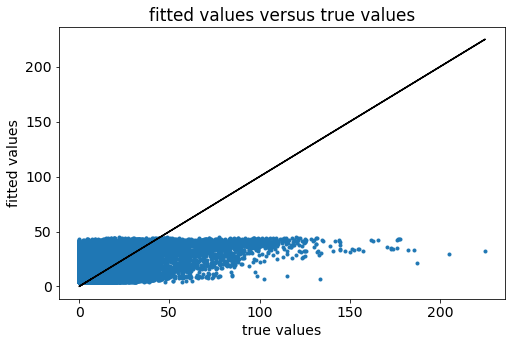

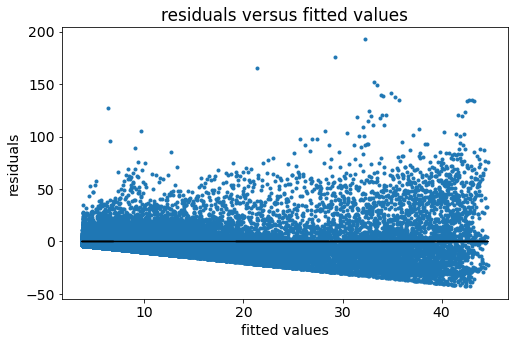

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:293: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  warnings.warn(


Iteration 1, loss = 276.98494704
Iteration 2, loss = 274.17273849
Iteration 3, loss = 270.60119289
Iteration 4, loss = 266.96595790
Iteration 5, loss = 263.54647370
Iteration 6, loss = 260.30956460
Iteration 7, loss = 257.22603836
Iteration 8, loss = 254.25866852
Iteration 9, loss = 251.40529725
Iteration 10, loss = 248.65221032
Iteration 11, loss = 245.98453813
Iteration 12, loss = 243.38783426
Iteration 13, loss = 240.86254632
Iteration 14, loss = 238.39534755
Iteration 15, loss = 235.97823898
Iteration 16, loss = 233.59653914
Iteration 17, loss = 231.25171405
Iteration 18, loss = 228.93441801
Iteration 19, loss = 226.68318776
Iteration 20, loss = 224.48160918
Iteration 21, loss = 222.32621344
Iteration 22, loss = 220.22318566
Iteration 23, loss = 218.16287589
Iteration 24, loss = 216.15654323
Iteration 25, loss = 214.19131763
Iteration 26, loss = 212.27461881
Iteration 27, loss = 210.40633491
Iteration 28, loss = 208.58985023
Iteration 29, loss = 206.81377204
Iteration 30, loss = 20

Iteration 240, loss = 111.16243170
Iteration 241, loss = 111.10557507
Iteration 242, loss = 111.07111610
Iteration 243, loss = 111.03987855
Iteration 244, loss = 111.00477690
Iteration 245, loss = 110.97065964
Iteration 246, loss = 110.93474312
Iteration 247, loss = 110.88891336
Iteration 248, loss = 110.86283281
Iteration 249, loss = 110.81969246
Iteration 250, loss = 110.78448064
Iteration 251, loss = 110.75229779
Iteration 252, loss = 110.72746052
Iteration 253, loss = 110.68961785
Iteration 254, loss = 110.64994814
Iteration 255, loss = 110.63044478
Iteration 256, loss = 110.61142113
Iteration 257, loss = 110.55641148
Iteration 258, loss = 110.52364547
Iteration 259, loss = 110.49278141
Iteration 260, loss = 110.47677347
Iteration 261, loss = 110.43805185
Iteration 262, loss = 110.41655452
Iteration 263, loss = 110.39346166
Iteration 264, loss = 110.36035280
Iteration 265, loss = 110.34149394
Iteration 266, loss = 110.31130559
Iteration 267, loss = 110.28086676
Iteration 268, loss 

Iteration 477, loss = 107.88828334
Iteration 478, loss = 107.90243325
Iteration 479, loss = 107.90159078
Iteration 480, loss = 107.86874666
Iteration 481, loss = 107.89356183
Iteration 482, loss = 107.87738713
Iteration 483, loss = 107.85559580
Iteration 484, loss = 107.87525276
Iteration 485, loss = 107.84447926
Iteration 486, loss = 107.85115649
Iteration 487, loss = 107.87643058
Iteration 488, loss = 107.84126558
Iteration 489, loss = 107.85342809
Iteration 490, loss = 107.87028945
Iteration 491, loss = 107.85839613
Iteration 492, loss = 107.84489540
Iteration 493, loss = 107.83386253
Iteration 494, loss = 107.84827826
Iteration 495, loss = 107.85024778
Iteration 496, loss = 107.81695413
Iteration 497, loss = 107.81991763
Iteration 498, loss = 107.80358482
Iteration 499, loss = 107.79241239
Iteration 500, loss = 107.78869880
Iteration 501, loss = 107.79060232
Iteration 502, loss = 107.77212578
Iteration 503, loss = 107.78388499
Iteration 504, loss = 107.80777155
Iteration 505, loss 

Iteration 125, loss = 123.44420205
Iteration 126, loss = 123.20342104
Iteration 127, loss = 122.97452630
Iteration 128, loss = 122.74110854
Iteration 129, loss = 122.51700783
Iteration 130, loss = 122.30197682
Iteration 131, loss = 122.09547179
Iteration 132, loss = 121.88720414
Iteration 133, loss = 121.68490022
Iteration 134, loss = 121.48851633
Iteration 135, loss = 121.30026974
Iteration 136, loss = 121.12271845
Iteration 137, loss = 120.93164354
Iteration 138, loss = 120.75288667
Iteration 139, loss = 120.59236441
Iteration 140, loss = 120.41546051
Iteration 141, loss = 120.25201310
Iteration 142, loss = 120.09779656
Iteration 143, loss = 119.94711769
Iteration 144, loss = 119.79244139
Iteration 145, loss = 119.64858300
Iteration 146, loss = 119.50250571
Iteration 147, loss = 119.36198743
Iteration 148, loss = 119.22878405
Iteration 149, loss = 119.09864235
Iteration 150, loss = 118.96708588
Iteration 151, loss = 118.84188196
Iteration 152, loss = 118.71401933
Iteration 153, loss 

Iteration 361, loss = 111.93585089
Iteration 362, loss = 111.93070702
Iteration 363, loss = 111.93508363
Iteration 364, loss = 111.93478301
Iteration 365, loss = 111.92096411
Iteration 366, loss = 111.91080267
Iteration 367, loss = 111.89182341
Iteration 368, loss = 111.92141157
Iteration 369, loss = 111.90533107
Iteration 370, loss = 111.88644928
Iteration 371, loss = 111.86570407
Iteration 372, loss = 111.86649914
Iteration 373, loss = 111.86020645
Iteration 374, loss = 111.85494347
Iteration 375, loss = 111.83478446
Iteration 376, loss = 111.83815959
Iteration 377, loss = 111.83528868
Iteration 378, loss = 111.84347629
Iteration 379, loss = 111.82676813
Iteration 380, loss = 111.80566510
Iteration 381, loss = 111.82880685
Iteration 382, loss = 111.79715816
Iteration 383, loss = 111.78112898
Iteration 384, loss = 111.80247118
Iteration 385, loss = 111.78201599
Iteration 386, loss = 111.77940701
Iteration 387, loss = 111.79610275
Iteration 388, loss = 111.80725524
Iteration 389, loss 

Iteration 38, loss = 189.68565390
Iteration 39, loss = 188.38669903
Iteration 40, loss = 187.11873280
Iteration 41, loss = 185.88965324
Iteration 42, loss = 184.69047744
Iteration 43, loss = 183.52731511
Iteration 44, loss = 182.39274753
Iteration 45, loss = 181.28620011
Iteration 46, loss = 180.19329407
Iteration 47, loss = 179.11799714
Iteration 48, loss = 178.05588784
Iteration 49, loss = 177.02421583
Iteration 50, loss = 176.00970149
Iteration 51, loss = 175.01267101
Iteration 52, loss = 174.01273102
Iteration 53, loss = 173.00071461
Iteration 54, loss = 171.95965735
Iteration 55, loss = 170.90732433
Iteration 56, loss = 169.83722049
Iteration 57, loss = 168.68544063
Iteration 58, loss = 167.37567959
Iteration 59, loss = 165.97360999
Iteration 60, loss = 164.65966483
Iteration 61, loss = 163.44889381
Iteration 62, loss = 162.30637268
Iteration 63, loss = 161.21501813
Iteration 64, loss = 160.15828390
Iteration 65, loss = 159.12706770
Iteration 66, loss = 158.11370898
Iteration 67, 

Iteration 279, loss = 112.24299334
Iteration 280, loss = 112.21051257
Iteration 281, loss = 112.20131891
Iteration 282, loss = 112.18972014
Iteration 283, loss = 112.15970333
Iteration 284, loss = 112.14543664
Iteration 285, loss = 112.13573472
Iteration 286, loss = 112.09594203
Iteration 287, loss = 112.09267394
Iteration 288, loss = 112.06603102
Iteration 289, loss = 112.05852253
Iteration 290, loss = 112.04318347
Iteration 291, loss = 112.03028354
Iteration 292, loss = 112.00479139
Iteration 293, loss = 111.99090132
Iteration 294, loss = 111.98224114
Iteration 295, loss = 111.97802980
Iteration 296, loss = 111.96065920
Iteration 297, loss = 111.93883054
Iteration 298, loss = 111.94236902
Iteration 299, loss = 111.92226969
Iteration 300, loss = 111.92889001
Iteration 301, loss = 111.89964869
Iteration 302, loss = 111.88132343
Iteration 303, loss = 111.85679908
Iteration 304, loss = 111.85079177
Iteration 305, loss = 111.84222430
Iteration 306, loss = 111.81747882
Iteration 307, loss 

Iteration 514, loss = 110.50264664
Iteration 515, loss = 110.51759281
Iteration 516, loss = 110.50061015
Iteration 517, loss = 110.48739068
Iteration 518, loss = 110.50755240
Iteration 519, loss = 110.49924823
Iteration 520, loss = 110.51328551
Iteration 521, loss = 110.46984278
Iteration 522, loss = 110.48214837
Iteration 523, loss = 110.49044783
Iteration 524, loss = 110.47333031
Iteration 525, loss = 110.47551152
Iteration 526, loss = 110.44944834
Iteration 527, loss = 110.46005590
Iteration 528, loss = 110.45218502
Iteration 529, loss = 110.47977267
Iteration 530, loss = 110.45424501
Iteration 531, loss = 110.43648775
Iteration 532, loss = 110.45149888
Iteration 533, loss = 110.45210281
Iteration 534, loss = 110.44801533
Iteration 535, loss = 110.45185862
Iteration 536, loss = 110.44044151
Iteration 537, loss = 110.45179959
Iteration 538, loss = 110.43178591
Iteration 539, loss = 110.42892524
Iteration 540, loss = 110.44368651
Iteration 541, loss = 110.42720980
Iteration 542, loss 

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 266.38745529
Iteration 2, loss = 263.68413529
Iteration 3, loss = 260.22723046
Iteration 4, loss = 256.70450505
Iteration 5, loss = 253.39804625
Iteration 6, loss = 250.27208607
Iteration 7, loss = 247.30163117
Iteration 8, loss = 244.45265657
Iteration 9, loss = 241.71325396
Iteration 10, loss = 239.07832444
Iteration 11, loss = 236.52199403
Iteration 12, loss = 234.03983642
Iteration 13, loss = 231.62340774
Iteration 14, loss = 229.26279351
Iteration 15, loss = 226.95002286
Iteration 16, loss = 224.67801385
Iteration 17, loss = 222.44238307
Iteration 18, loss = 220.23538615
Iteration 19, loss = 218.08816793
Iteration 20, loss = 215.99398627
Iteration 21, loss = 213.94665166
Iteration 22, loss = 211.95058096
Iteration 23, loss = 210.00020627
Iteration 24, loss = 208.10005290
Iteration 25, loss = 206.24410714
Iteration 26, loss = 204.43101135
Iteration 27, loss = 202.66804258
Iteration 28, loss = 200.95530148
Iteration 29, loss = 199.28478909
Iteration 30, loss = 19

Iteration 239, loss = 112.24410112
Iteration 240, loss = 112.20457930
Iteration 241, loss = 112.15640617
Iteration 242, loss = 112.14728019
Iteration 243, loss = 112.10502309
Iteration 244, loss = 112.08843562
Iteration 245, loss = 112.04970385
Iteration 246, loss = 112.02316813
Iteration 247, loss = 111.97815084
Iteration 248, loss = 111.96635696
Iteration 249, loss = 111.93337615
Iteration 250, loss = 111.89755926
Iteration 251, loss = 111.87534832
Iteration 252, loss = 111.85073326
Iteration 253, loss = 111.83030567
Iteration 254, loss = 111.79448204
Iteration 255, loss = 111.77443660
Iteration 256, loss = 111.73329330
Iteration 257, loss = 111.71343383
Iteration 258, loss = 111.68184969
Iteration 259, loss = 111.65386206
Iteration 260, loss = 111.64530887
Iteration 261, loss = 111.62519180
Iteration 262, loss = 111.59524350
Iteration 263, loss = 111.57656143
Iteration 264, loss = 111.55775570
Iteration 265, loss = 111.55415876
Iteration 266, loss = 111.50040416
Iteration 267, loss 

Iteration 475, loss = 109.53732485
Iteration 476, loss = 109.52135409
Iteration 477, loss = 109.53203484
Iteration 478, loss = 109.52330357
Iteration 479, loss = 109.51941915
Iteration 480, loss = 109.50041295
Iteration 481, loss = 109.51489761
Iteration 482, loss = 109.49893204
Iteration 483, loss = 109.50564374
Iteration 484, loss = 109.51752122
Iteration 485, loss = 109.47111230
Iteration 486, loss = 109.51012199
Iteration 487, loss = 109.49252642
Iteration 488, loss = 109.48908508
Iteration 489, loss = 109.49461663
Iteration 490, loss = 109.48016929
Iteration 491, loss = 109.48140154
Iteration 492, loss = 109.47346950
Iteration 493, loss = 109.49113679
Iteration 494, loss = 109.46929759
Iteration 495, loss = 109.46676481
Iteration 496, loss = 109.44987466
Iteration 497, loss = 109.45570660
Iteration 498, loss = 109.44668337
Iteration 499, loss = 109.42832298
Iteration 500, loss = 109.44954633
Iteration 501, loss = 109.44373774
Iteration 502, loss = 109.42682121
Iteration 503, loss 

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 5, loss = 240.28427184
Iteration 6, loss = 237.28780076
Iteration 7, loss = 234.44209316
Iteration 8, loss = 231.71818456
Iteration 9, loss = 229.09630750
Iteration 10, loss = 226.57467163
Iteration 11, loss = 224.13094953
Iteration 12, loss = 221.76094116
Iteration 13, loss = 219.45254874
Iteration 14, loss = 217.20193052
Iteration 15, loss = 214.99632135
Iteration 16, loss = 212.83653998
Iteration 17, loss = 210.71310428
Iteration 18, loss = 208.62314196
Iteration 19, loss = 206.58892353
Iteration 20, loss = 204.61007744
Iteration 21, loss = 202.67508794
Iteration 22, loss = 200.78567658
Iteration 23, loss = 198.94585381
Iteration 24, loss = 197.15490067
Iteration 25, loss = 195.40571719
Iteration 26, loss = 193.69788228
Iteration 27, loss = 192.04140762
Iteration 28, loss = 190.43142484
Iteration 29, loss = 188.86294906
Iteration 30, loss = 187.32995527
Iteration 31, loss = 185.84781601
Iteration 32, loss = 184.39756571
Iteration 33, loss = 182.98804812
Iteration 34, loss

Iteration 245, loss = 105.49016816
Iteration 246, loss = 105.47210452
Iteration 247, loss = 105.42677489
Iteration 248, loss = 105.39689864
Iteration 249, loss = 105.38221885
Iteration 250, loss = 105.34567740
Iteration 251, loss = 105.31950582
Iteration 252, loss = 105.30353308
Iteration 253, loss = 105.28172066
Iteration 254, loss = 105.24436473
Iteration 255, loss = 105.22813262
Iteration 256, loss = 105.18844032
Iteration 257, loss = 105.17181871
Iteration 258, loss = 105.14024715
Iteration 259, loss = 105.10848678
Iteration 260, loss = 105.09670236
Iteration 261, loss = 105.08544254
Iteration 262, loss = 105.04894409
Iteration 263, loss = 105.03868158
Iteration 264, loss = 105.01319047
Iteration 265, loss = 105.03216986
Iteration 266, loss = 104.95665648
Iteration 267, loss = 104.95384535
Iteration 268, loss = 104.92085032
Iteration 269, loss = 104.90466345
Iteration 270, loss = 104.89200161
Iteration 271, loss = 104.86157673
Iteration 272, loss = 104.83560119
Iteration 273, loss 

Iteration 479, loss = 103.10881760
Iteration 480, loss = 103.11270057
Iteration 481, loss = 103.11570577
Iteration 482, loss = 103.09707405
Iteration 483, loss = 103.09870010
Iteration 484, loss = 103.10470895
Iteration 485, loss = 103.08378255
Iteration 486, loss = 103.10340388
Iteration 487, loss = 103.08260088
Iteration 488, loss = 103.09123779
Iteration 489, loss = 103.07922344
Iteration 490, loss = 103.07498097
Iteration 491, loss = 103.07753283
Iteration 492, loss = 103.07622893
Iteration 493, loss = 103.06987262
Iteration 494, loss = 103.07555232
Iteration 495, loss = 103.06670761
Iteration 496, loss = 103.05352261
Iteration 497, loss = 103.05422910
Iteration 498, loss = 103.04783176
Iteration 499, loss = 103.02839648
Iteration 500, loss = 103.05052355
Iteration 501, loss = 103.05165560
Iteration 502, loss = 103.02227976
Iteration 503, loss = 103.03737210
Iteration 504, loss = 103.04534239
Iteration 505, loss = 103.00585117
Iteration 506, loss = 103.04396211
Iteration 507, loss 

Iteration 159, loss = 109.75110582
Iteration 160, loss = 109.64782430
Iteration 161, loss = 109.54110129
Iteration 162, loss = 109.42238092
Iteration 163, loss = 109.32068180
Iteration 164, loss = 109.21793999
Iteration 165, loss = 109.11641995
Iteration 166, loss = 109.01958470
Iteration 167, loss = 108.93283790
Iteration 168, loss = 108.82895685
Iteration 169, loss = 108.74283030
Iteration 170, loss = 108.66085528
Iteration 171, loss = 108.55017092
Iteration 172, loss = 108.46600824
Iteration 173, loss = 108.38315778
Iteration 174, loss = 108.30709353
Iteration 175, loss = 108.21350708
Iteration 176, loss = 108.13541770
Iteration 177, loss = 108.03795286
Iteration 178, loss = 107.97227876
Iteration 179, loss = 107.89317019
Iteration 180, loss = 107.80535305
Iteration 181, loss = 107.73644150
Iteration 182, loss = 107.66529818
Iteration 183, loss = 107.60028721
Iteration 184, loss = 107.51753199
Iteration 185, loss = 107.44719987
Iteration 186, loss = 107.39472499
Iteration 187, loss 

Iteration 399, loss = 102.60646141
Iteration 400, loss = 102.60106140
Iteration 401, loss = 102.57368729
Iteration 402, loss = 102.57000780
Iteration 403, loss = 102.59315322
Iteration 404, loss = 102.59878250
Iteration 405, loss = 102.57019708
Iteration 406, loss = 102.55820451
Iteration 407, loss = 102.55582275
Iteration 408, loss = 102.55331903
Iteration 409, loss = 102.56040462
Iteration 410, loss = 102.53136570
Iteration 411, loss = 102.53008320
Iteration 412, loss = 102.52871508
Iteration 413, loss = 102.51876414
Iteration 414, loss = 102.51068678
Iteration 415, loss = 102.49730104
Iteration 416, loss = 102.49224210
Iteration 417, loss = 102.47315523
Iteration 418, loss = 102.48877974
Iteration 419, loss = 102.47794501
Iteration 420, loss = 102.46907412
Iteration 421, loss = 102.48640969
Iteration 422, loss = 102.47484318
Iteration 423, loss = 102.47739193
Iteration 424, loss = 102.47373257
Iteration 425, loss = 102.44069007
Iteration 426, loss = 102.43471398
Iteration 427, loss 

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 281.81276579
Iteration 2, loss = 279.01840444
Iteration 3, loss = 275.48647127
Iteration 4, loss = 271.90294261
Iteration 5, loss = 268.52108417
Iteration 6, loss = 265.31593861
Iteration 7, loss = 262.27312371
Iteration 8, loss = 259.35787826
Iteration 9, loss = 256.54916695
Iteration 10, loss = 253.83911442
Iteration 11, loss = 251.20745166
Iteration 12, loss = 248.65135368
Iteration 13, loss = 246.15412499
Iteration 14, loss = 243.71135197
Iteration 15, loss = 241.31397979
Iteration 16, loss = 238.96676150
Iteration 17, loss = 236.65611876
Iteration 18, loss = 234.38232206
Iteration 19, loss = 232.16385438
Iteration 20, loss = 229.99944928
Iteration 21, loss = 227.87899823
Iteration 22, loss = 225.80736920
Iteration 23, loss = 223.79119455
Iteration 24, loss = 221.81878533
Iteration 25, loss = 219.89330229
Iteration 26, loss = 218.00746602
Iteration 27, loss = 216.17045728
Iteration 28, loss = 214.38175592
Iteration 29, loss = 212.63677988
Iteration 30, loss = 21

Iteration 242, loss = 117.38670998
Iteration 243, loss = 117.33630025
Iteration 244, loss = 117.32415383
Iteration 245, loss = 117.28165504
Iteration 246, loss = 117.24938793
Iteration 247, loss = 117.21718113
Iteration 248, loss = 117.18593524
Iteration 249, loss = 117.16763856
Iteration 250, loss = 117.12865831
Iteration 251, loss = 117.08569192
Iteration 252, loss = 117.07185585
Iteration 253, loss = 117.04424628
Iteration 254, loss = 116.99973764
Iteration 255, loss = 116.99081348
Iteration 256, loss = 116.94804575
Iteration 257, loss = 116.92970699
Iteration 258, loss = 116.88213701
Iteration 259, loss = 116.85730854
Iteration 260, loss = 116.83266650
Iteration 261, loss = 116.81852090
Iteration 262, loss = 116.77981283
Iteration 263, loss = 116.76215279
Iteration 264, loss = 116.72954859
Iteration 265, loss = 116.74441005
Iteration 266, loss = 116.67218118
Iteration 267, loss = 116.64742144
Iteration 268, loss = 116.62914258
Iteration 269, loss = 116.60046844
Iteration 270, loss 

Iteration 479, loss = 114.45267313
Iteration 480, loss = 114.43436798
Iteration 481, loss = 114.44125118
Iteration 482, loss = 114.44055496
Iteration 483, loss = 114.43629546
Iteration 484, loss = 114.44329721
Iteration 485, loss = 114.42717496
Iteration 486, loss = 114.41647472
Iteration 487, loss = 114.41887759
Iteration 488, loss = 114.40582224
Iteration 489, loss = 114.41850388
Iteration 490, loss = 114.39803035
Iteration 491, loss = 114.39147113
Iteration 492, loss = 114.37791439
Iteration 493, loss = 114.40199557
Iteration 494, loss = 114.39460046
Iteration 495, loss = 114.37935640
Iteration 496, loss = 114.37491109
Iteration 497, loss = 114.34543792
Iteration 498, loss = 114.36500260
Iteration 499, loss = 114.36123920
Iteration 500, loss = 114.36244070
Iteration 501, loss = 114.35393159
Iteration 502, loss = 114.35306469
Iteration 503, loss = 114.34042368
Iteration 504, loss = 114.33687435
Iteration 505, loss = 114.33471687
Iteration 506, loss = 114.34753145
Iteration 507, loss 

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 250.84525064
Iteration 2, loss = 248.17519046
Iteration 3, loss = 244.79823661
Iteration 4, loss = 241.37498434
Iteration 5, loss = 238.15075538
Iteration 6, loss = 235.10034338
Iteration 7, loss = 232.21068457
Iteration 8, loss = 229.44402695
Iteration 9, loss = 226.78339841
Iteration 10, loss = 224.22175242
Iteration 11, loss = 221.73776082
Iteration 12, loss = 219.32978767
Iteration 13, loss = 216.98440963
Iteration 14, loss = 214.69842194
Iteration 15, loss = 212.46355236
Iteration 16, loss = 210.27394869
Iteration 17, loss = 208.10234720
Iteration 18, loss = 205.96098431
Iteration 19, loss = 203.88137364
Iteration 20, loss = 201.85563304
Iteration 21, loss = 199.87372583
Iteration 22, loss = 197.94177294
Iteration 23, loss = 196.06492497
Iteration 24, loss = 194.23501430
Iteration 25, loss = 192.45536333
Iteration 26, loss = 190.71620587
Iteration 27, loss = 189.02109279
Iteration 28, loss = 187.37254583
Iteration 29, loss = 185.76690688
Iteration 30, loss = 18

Iteration 241, loss = 103.57138764
Iteration 242, loss = 103.54626894
Iteration 243, loss = 103.51250581
Iteration 244, loss = 103.50135621
Iteration 245, loss = 103.45887378
Iteration 246, loss = 103.44265591
Iteration 247, loss = 103.41450399
Iteration 248, loss = 103.38311618
Iteration 249, loss = 103.37084225
Iteration 250, loss = 103.33863242
Iteration 251, loss = 103.30189999
Iteration 252, loss = 103.28164832
Iteration 253, loss = 103.27487847
Iteration 254, loss = 103.23310137
Iteration 255, loss = 103.22137026
Iteration 256, loss = 103.19038396
Iteration 257, loss = 103.18046787
Iteration 258, loss = 103.14123774
Iteration 259, loss = 103.11559963
Iteration 260, loss = 103.09163480
Iteration 261, loss = 103.08696734
Iteration 262, loss = 103.05639010
Iteration 263, loss = 103.03766582
Iteration 264, loss = 103.00843317
Iteration 265, loss = 103.02668188
Iteration 266, loss = 102.95590734
Iteration 267, loss = 102.94133734
Iteration 268, loss = 102.93219571
Iteration 269, loss 

Iteration 479, loss = 101.12215059
Iteration 480, loss = 101.11431655
Iteration 481, loss = 101.10477219
Iteration 482, loss = 101.11622825
Iteration 483, loss = 101.12959889
Iteration 484, loss = 101.12243958
Iteration 485, loss = 101.09914770
Iteration 486, loss = 101.09882572
Iteration 487, loss = 101.09527130
Iteration 488, loss = 101.08935890
Iteration 489, loss = 101.09381090
Iteration 490, loss = 101.07347047
Iteration 491, loss = 101.06792248
Iteration 492, loss = 101.06362504
Iteration 493, loss = 101.08177459
Iteration 494, loss = 101.07219776
Iteration 495, loss = 101.06738306
Iteration 496, loss = 101.06135666
Iteration 497, loss = 101.04339023
Iteration 498, loss = 101.06403337
Iteration 499, loss = 101.04585481
Iteration 500, loss = 101.05018148
Iteration 501, loss = 101.03212459
Iteration 502, loss = 101.05385958
Iteration 503, loss = 101.03336746
Iteration 504, loss = 101.02084263
Iteration 505, loss = 101.03237780
Iteration 506, loss = 101.03341463
Iteration 507, loss 

Iteration 137, loss = 114.81366577
Iteration 138, loss = 114.60467541
Iteration 139, loss = 114.41409663
Iteration 140, loss = 114.22919009
Iteration 141, loss = 114.03971080
Iteration 142, loss = 113.85728739
Iteration 143, loss = 113.67725722
Iteration 144, loss = 113.49295621
Iteration 145, loss = 113.31972163
Iteration 146, loss = 113.14681948
Iteration 147, loss = 112.98530873
Iteration 148, loss = 112.82410144
Iteration 149, loss = 112.66388508
Iteration 150, loss = 112.49430214
Iteration 151, loss = 112.34029169
Iteration 152, loss = 112.20504833
Iteration 153, loss = 112.03981984
Iteration 154, loss = 111.89977593
Iteration 155, loss = 111.74906253
Iteration 156, loss = 111.61778910
Iteration 157, loss = 111.46782911
Iteration 158, loss = 111.33499993
Iteration 159, loss = 111.20733948
Iteration 160, loss = 111.08911117
Iteration 161, loss = 110.95559405
Iteration 162, loss = 110.82268592
Iteration 163, loss = 110.69723858
Iteration 164, loss = 110.57781335
Iteration 165, loss 

Iteration 376, loss = 103.79993880
Iteration 377, loss = 103.78418008
Iteration 378, loss = 103.78152592
Iteration 379, loss = 103.77844055
Iteration 380, loss = 103.75202574
Iteration 381, loss = 103.75786169
Iteration 382, loss = 103.74295200
Iteration 383, loss = 103.77620451
Iteration 384, loss = 103.74443559
Iteration 385, loss = 103.72692027
Iteration 386, loss = 103.72577210
Iteration 387, loss = 103.72462945
Iteration 388, loss = 103.69860110
Iteration 389, loss = 103.69073813
Iteration 390, loss = 103.67937406
Iteration 391, loss = 103.68237589
Iteration 392, loss = 103.68846218
Iteration 393, loss = 103.67730410
Iteration 394, loss = 103.66388026
Iteration 395, loss = 103.64887747
Iteration 396, loss = 103.67611687
Iteration 397, loss = 103.64308908
Iteration 398, loss = 103.65987272
Iteration 399, loss = 103.63897109
Iteration 400, loss = 103.60178664
Iteration 401, loss = 103.62962264
Iteration 402, loss = 103.62971533
Iteration 403, loss = 103.63257287
Iteration 404, loss 

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 5, loss = 257.31587950
Iteration 6, loss = 254.21370734
Iteration 7, loss = 251.26689596
Iteration 8, loss = 248.44944670
Iteration 9, loss = 245.73179780
Iteration 10, loss = 243.11070807
Iteration 11, loss = 240.56965314
Iteration 12, loss = 238.10006120
Iteration 13, loss = 235.68657132
Iteration 14, loss = 233.32955452
Iteration 15, loss = 231.01933677
Iteration 16, loss = 228.75293165
Iteration 17, loss = 226.52676011
Iteration 18, loss = 224.34267542
Iteration 19, loss = 222.20846852
Iteration 20, loss = 220.13094607
Iteration 21, loss = 218.09460322
Iteration 22, loss = 216.11177951
Iteration 23, loss = 214.17774839
Iteration 24, loss = 212.28934058
Iteration 25, loss = 210.45162815
Iteration 26, loss = 208.65593757
Iteration 27, loss = 206.90324854
Iteration 28, loss = 205.19542508
Iteration 29, loss = 203.53346182
Iteration 30, loss = 201.90248169
Iteration 31, loss = 200.32599970
Iteration 32, loss = 198.78645094
Iteration 33, loss = 197.28695224
Iteration 34, loss

Iteration 247, loss = 112.70635058
Iteration 248, loss = 112.66724375
Iteration 249, loss = 112.65050442
Iteration 250, loss = 112.62761160
Iteration 251, loss = 112.56793248
Iteration 252, loss = 112.53107054
Iteration 253, loss = 112.49886826
Iteration 254, loss = 112.45980552
Iteration 255, loss = 112.43639468
Iteration 256, loss = 112.40911568
Iteration 257, loss = 112.37410555
Iteration 258, loss = 112.34305767
Iteration 259, loss = 112.31357660
Iteration 260, loss = 112.27401328
Iteration 261, loss = 112.26094223
Iteration 262, loss = 112.21842308
Iteration 263, loss = 112.20073879
Iteration 264, loss = 112.14515105
Iteration 265, loss = 112.15430046
Iteration 266, loss = 112.09677456
Iteration 267, loss = 112.08541701
Iteration 268, loss = 112.05142715
Iteration 269, loss = 112.03196897
Iteration 270, loss = 112.01223215
Iteration 271, loss = 111.98272455
Iteration 272, loss = 111.94858139
Iteration 273, loss = 111.91561833
Iteration 274, loss = 111.90169063
Iteration 275, loss 

Iteration 482, loss = 109.61511851
Iteration 483, loss = 109.62389253
Iteration 484, loss = 109.63511754
Iteration 485, loss = 109.61599039
Iteration 486, loss = 109.58695090
Iteration 487, loss = 109.60373309
Iteration 488, loss = 109.57820634
Iteration 489, loss = 109.59466122
Iteration 490, loss = 109.58727441
Iteration 491, loss = 109.57549606
Iteration 492, loss = 109.55079007
Iteration 493, loss = 109.57444381
Iteration 494, loss = 109.57004749
Iteration 495, loss = 109.57327003
Iteration 496, loss = 109.57478258
Iteration 497, loss = 109.53317476
Iteration 498, loss = 109.53304678
Iteration 499, loss = 109.54457869
Iteration 500, loss = 109.55044335
Iteration 501, loss = 109.51513521
Iteration 502, loss = 109.53435542
Iteration 503, loss = 109.53748375
Iteration 504, loss = 109.53545084
Iteration 505, loss = 109.52149824
Iteration 506, loss = 109.50418190
Iteration 507, loss = 109.51874726
Iteration 508, loss = 109.51654175
Iteration 509, loss = 109.49052923
Iteration 510, loss 

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 257.25200546
Iteration 4, loss = 253.45131165
Iteration 5, loss = 249.90814720
Iteration 6, loss = 246.55257140
Iteration 7, loss = 243.37697111
Iteration 8, loss = 240.34011467
Iteration 9, loss = 237.42046226
Iteration 10, loss = 234.60437467
Iteration 11, loss = 231.88055334
Iteration 12, loss = 229.23753481
Iteration 13, loss = 226.65688041
Iteration 14, loss = 224.13810906
Iteration 15, loss = 221.65814943
Iteration 16, loss = 219.22314741
Iteration 17, loss = 216.83799932
Iteration 18, loss = 214.52332558
Iteration 19, loss = 212.26850241
Iteration 20, loss = 210.07282585
Iteration 21, loss = 207.92951779
Iteration 22, loss = 205.83893790
Iteration 23, loss = 203.82492492
Iteration 24, loss = 201.87327737
Iteration 25, loss = 199.96566748
Iteration 26, loss = 198.10928425
Iteration 27, loss = 196.31004794
Iteration 28, loss = 194.55995240
Iteration 29, loss = 192.85335070
Iteration 30, loss = 191.20007456
Iteration 31, loss = 189.60163332
Iteration 32, loss = 

Iteration 244, loss = 109.90433114
Iteration 245, loss = 109.86989646
Iteration 246, loss = 109.85883511
Iteration 247, loss = 109.83258118
Iteration 248, loss = 109.81435021
Iteration 249, loss = 109.80919202
Iteration 250, loss = 109.78092926
Iteration 251, loss = 109.73208043
Iteration 252, loss = 109.74074886
Iteration 253, loss = 109.69384468
Iteration 254, loss = 109.67714694
Iteration 255, loss = 109.67287601
Iteration 256, loss = 109.63849597
Iteration 257, loss = 109.61537405
Iteration 258, loss = 109.60850890
Iteration 259, loss = 109.60591582
Iteration 260, loss = 109.56845281
Iteration 261, loss = 109.56680704
Iteration 262, loss = 109.53571360
Iteration 263, loss = 109.52179685
Iteration 264, loss = 109.51403474
Iteration 265, loss = 109.49966320
Iteration 266, loss = 109.45279101
Iteration 267, loss = 109.43738709
Iteration 268, loss = 109.43544918
Iteration 269, loss = 109.43898915
Iteration 270, loss = 109.42330135
Iteration 271, loss = 109.38426111
Iteration 272, loss 

Iteration 481, loss = 107.83761957
Iteration 482, loss = 107.80613561
Iteration 483, loss = 107.78662141
Iteration 484, loss = 107.81130893
Iteration 485, loss = 107.77836302
Iteration 486, loss = 107.81944083
Iteration 487, loss = 107.81880609
Iteration 488, loss = 107.79860468
Iteration 489, loss = 107.76632293
Iteration 490, loss = 107.81509563
Iteration 491, loss = 107.79366233
Iteration 492, loss = 107.77748439
Iteration 493, loss = 107.76398769
Iteration 494, loss = 107.76322346
Iteration 495, loss = 107.77650127
Iteration 496, loss = 107.80057170
Iteration 497, loss = 107.73966239
Iteration 498, loss = 107.80234702
Iteration 499, loss = 107.77044495
Iteration 500, loss = 107.74774195
Iteration 501, loss = 107.76123825
Iteration 502, loss = 107.76815785
Iteration 503, loss = 107.77937633
Iteration 504, loss = 107.73739022
Iteration 505, loss = 107.74413252
Iteration 506, loss = 107.72718324
Iteration 507, loss = 107.73548876
Iteration 508, loss = 107.70842466
Iteration 509, loss 

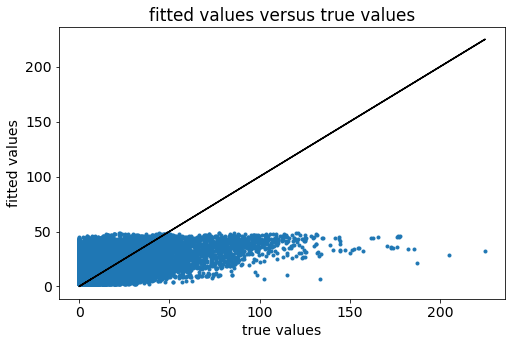

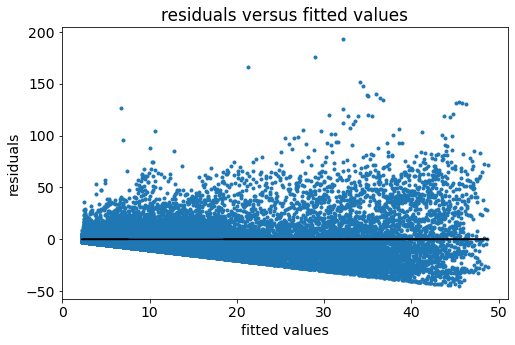

In [5]:
activa_opttions=['identity', 'relu', 'logistic', 'tanh']

for i in activa_opttions:
    model = MLPRegressor(hidden_layer_sizes=(1,),
                     activation=i, solver='adam', max_iter=600, 
                     alpha=1e-4, random_state=42, shuffle=True, verbose=True)
    cv_test(model, X, y, k=10)

#### 'tanh' yields the lowest RMSE at 14.6/15.28 for train/test datasets.

In [6]:
model = MLPRegressor(hidden_layer_sizes=(1,),
                     activation='tanh', solver='adam', max_iter=600, 
                     alpha=1e-4, shuffle=True, random_state=42, verbose=True)

In [7]:
# GridSearch to find best values
parameters = {'hidden_layer_sizes': [(10,), (50,), (100,)]
                                    #  , (150,), (200,),
                                    # (100,100,), (100,200,), (200,100,)]
              ,'activation': ['tanh'],
              'alpha': [1e-5,1e-4,3e-4,1e-3]}
clf2 = GridSearchCV(MLPRegressor(solver='adam', max_iter=1000, random_state=42, shuffle=True, verbose=True), 
                   parameters, cv=10, scoring='neg_root_mean_squared_error', return_train_score=True)
clf2.fit(X, y)

CVres = pd.DataFrame(clf2.cv_results_)

Iteration 1, loss = 279.22981401
Iteration 2, loss = 252.98081229
Iteration 3, loss = 225.45527610
Iteration 4, loss = 205.68747286
Iteration 5, loss = 192.61898470
Iteration 6, loss = 183.22100366
Iteration 7, loss = 175.96646652
Iteration 8, loss = 170.15521179
Iteration 9, loss = 165.32812262
Iteration 10, loss = 161.07315587
Iteration 11, loss = 157.09169695
Iteration 12, loss = 153.13696826
Iteration 13, loss = 149.15896647
Iteration 14, loss = 145.36184681
Iteration 15, loss = 141.92645223
Iteration 16, loss = 138.73120127
Iteration 17, loss = 135.75526649
Iteration 18, loss = 132.91020212
Iteration 19, loss = 130.22034106
Iteration 20, loss = 127.66668273
Iteration 21, loss = 125.28344995
Iteration 22, loss = 123.03633719
Iteration 23, loss = 120.98162486
Iteration 24, loss = 119.06217343
Iteration 25, loss = 117.30074522
Iteration 26, loss = 115.66694376
Iteration 27, loss = 114.16279112
Iteration 28, loss = 112.75033081
Iteration 29, loss = 111.44866414
Iteration 30, loss = 11

Iteration 244, loss = 80.34762098
Iteration 245, loss = 80.29915003
Iteration 246, loss = 80.26165662
Iteration 247, loss = 80.23751037
Iteration 248, loss = 80.21946590
Iteration 249, loss = 80.17924888
Iteration 250, loss = 80.15054394
Iteration 251, loss = 80.13292978
Iteration 252, loss = 80.10282743
Iteration 253, loss = 80.06346854
Iteration 254, loss = 80.01567655
Iteration 255, loss = 79.98784740
Iteration 256, loss = 79.97723636
Iteration 257, loss = 79.95920957
Iteration 258, loss = 79.90069519
Iteration 259, loss = 79.89152112
Iteration 260, loss = 79.85210992
Iteration 261, loss = 79.85094933
Iteration 262, loss = 79.81019640
Iteration 263, loss = 79.78000463
Iteration 264, loss = 79.74958009
Iteration 265, loss = 79.72370390
Iteration 266, loss = 79.70596217
Iteration 267, loss = 79.66414838
Iteration 268, loss = 79.64748186
Iteration 269, loss = 79.64456996
Iteration 270, loss = 79.58175215
Iteration 271, loss = 79.55773443
Iteration 272, loss = 79.54514327
Iteration 273,

Iteration 485, loss = 76.38493343
Iteration 486, loss = 76.39152036
Iteration 487, loss = 76.37687978
Iteration 488, loss = 76.39255005
Iteration 489, loss = 76.33776519
Iteration 490, loss = 76.35058396
Iteration 491, loss = 76.36324864
Iteration 492, loss = 76.32199813
Iteration 493, loss = 76.30849552
Iteration 494, loss = 76.30245246
Iteration 495, loss = 76.28990973
Iteration 496, loss = 76.29132949
Iteration 497, loss = 76.25890786
Iteration 498, loss = 76.23913123
Iteration 499, loss = 76.23055115
Iteration 500, loss = 76.21328545
Iteration 501, loss = 76.21120551
Iteration 502, loss = 76.18528120
Iteration 503, loss = 76.19269257
Iteration 504, loss = 76.18329569
Iteration 505, loss = 76.16064125
Iteration 506, loss = 76.14064346
Iteration 507, loss = 76.13216603
Iteration 508, loss = 76.13968759
Iteration 509, loss = 76.09986664
Iteration 510, loss = 76.10294573
Iteration 511, loss = 76.10566797
Iteration 512, loss = 76.07097726
Iteration 513, loss = 76.04387941
Iteration 514,

Iteration 726, loss = 74.15313874
Iteration 727, loss = 74.14708593
Iteration 728, loss = 74.16785530
Iteration 729, loss = 74.13161789
Iteration 730, loss = 74.15176090
Iteration 731, loss = 74.12448801
Iteration 732, loss = 74.09876375
Iteration 733, loss = 74.10956832
Iteration 734, loss = 74.08376416
Iteration 735, loss = 74.08593916
Iteration 736, loss = 74.07769327
Iteration 737, loss = 74.06866987
Iteration 738, loss = 74.06550698
Iteration 739, loss = 74.07079333
Iteration 740, loss = 74.07034113
Iteration 741, loss = 74.01748944
Iteration 742, loss = 74.03741067
Iteration 743, loss = 74.00158379
Iteration 744, loss = 74.01775193
Iteration 745, loss = 74.01450707
Iteration 746, loss = 73.98751053
Iteration 747, loss = 74.00167514
Iteration 748, loss = 74.00674112
Iteration 749, loss = 73.96106699
Iteration 750, loss = 73.95704091
Iteration 751, loss = 73.93209287
Iteration 752, loss = 73.93934606
Iteration 753, loss = 73.91408327
Iteration 754, loss = 73.95674248
Iteration 755,

Iteration 969, loss = 72.77900548
Iteration 970, loss = 72.75159958
Iteration 971, loss = 72.75282443
Iteration 972, loss = 72.79649634
Iteration 973, loss = 72.79528584
Iteration 974, loss = 72.74408762
Iteration 975, loss = 72.78549759
Iteration 976, loss = 72.73477876
Iteration 977, loss = 72.73668444
Iteration 978, loss = 72.76906787
Iteration 979, loss = 72.78516255
Iteration 980, loss = 72.73514132
Iteration 981, loss = 72.75167823
Iteration 982, loss = 72.72696606
Iteration 983, loss = 72.71909811
Iteration 984, loss = 72.71391459
Iteration 985, loss = 72.74022410
Iteration 986, loss = 72.74333117
Iteration 987, loss = 72.74745011
Iteration 988, loss = 72.74130039
Iteration 989, loss = 72.69507049
Iteration 990, loss = 72.73401424
Iteration 991, loss = 72.70270097
Iteration 992, loss = 72.69940918
Iteration 993, loss = 72.71288361
Iteration 994, loss = 72.71011304
Iteration 995, loss = 72.66144416
Iteration 996, loss = 72.70333233
Iteration 997, loss = 72.69531759
Iteration 998,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 267.03005653
Iteration 2, loss = 241.91289514
Iteration 3, loss = 215.85778257
Iteration 4, loss = 197.28736536
Iteration 5, loss = 185.11513722
Iteration 6, loss = 176.39062389
Iteration 7, loss = 169.70328576
Iteration 8, loss = 164.39296151
Iteration 9, loss = 159.99735242
Iteration 10, loss = 156.13287923
Iteration 11, loss = 152.52929728
Iteration 12, loss = 148.98529974
Iteration 13, loss = 145.46709013
Iteration 14, loss = 142.07749433
Iteration 15, loss = 138.99228383
Iteration 16, loss = 136.13918794
Iteration 17, loss = 133.52154616
Iteration 18, loss = 131.05901479
Iteration 19, loss = 128.77279814
Iteration 20, loss = 126.62765981
Iteration 21, loss = 124.64709228
Iteration 22, loss = 122.79050230
Iteration 23, loss = 121.07914580
Iteration 24, loss = 119.45978170
Iteration 25, loss = 117.95156840
Iteration 26, loss = 116.55241081
Iteration 27, loss = 115.26747368
Iteration 28, loss = 114.07397293
Iteration 29, loss = 112.99729991
Iteration 30, loss = 11

Iteration 248, loss = 82.59604656
Iteration 249, loss = 82.54438644
Iteration 250, loss = 82.50925834
Iteration 251, loss = 82.48447162
Iteration 252, loss = 82.45487578
Iteration 253, loss = 82.42593359
Iteration 254, loss = 82.38854026
Iteration 255, loss = 82.35163677
Iteration 256, loss = 82.32901907
Iteration 257, loss = 82.31749131
Iteration 258, loss = 82.25412543
Iteration 259, loss = 82.26280313
Iteration 260, loss = 82.21657641
Iteration 261, loss = 82.18737481
Iteration 262, loss = 82.17209749
Iteration 263, loss = 82.12452828
Iteration 264, loss = 82.10160912
Iteration 265, loss = 82.07800684
Iteration 266, loss = 82.04629473
Iteration 267, loss = 82.00516028
Iteration 268, loss = 81.99223201
Iteration 269, loss = 81.96684507
Iteration 270, loss = 81.93237465
Iteration 271, loss = 81.91538161
Iteration 272, loss = 81.87810740
Iteration 273, loss = 81.85938822
Iteration 274, loss = 81.81698120
Iteration 275, loss = 81.81532299
Iteration 276, loss = 81.77285066
Iteration 277,

Iteration 489, loss = 77.60640823
Iteration 490, loss = 77.62784460
Iteration 491, loss = 77.61909827
Iteration 492, loss = 77.57531523
Iteration 493, loss = 77.54919355
Iteration 494, loss = 77.53252752
Iteration 495, loss = 77.53743574
Iteration 496, loss = 77.52671326
Iteration 497, loss = 77.48168887
Iteration 498, loss = 77.45834305
Iteration 499, loss = 77.45295364
Iteration 500, loss = 77.43169652
Iteration 501, loss = 77.41275178
Iteration 502, loss = 77.38823871
Iteration 503, loss = 77.39265554
Iteration 504, loss = 77.37754439
Iteration 505, loss = 77.35932008
Iteration 506, loss = 77.32937970
Iteration 507, loss = 77.29856007
Iteration 508, loss = 77.31528362
Iteration 509, loss = 77.25187854
Iteration 510, loss = 77.25535519
Iteration 511, loss = 77.25336623
Iteration 512, loss = 77.20345391
Iteration 513, loss = 77.17682474
Iteration 514, loss = 77.15734190
Iteration 515, loss = 77.16851893
Iteration 516, loss = 77.14348567
Iteration 517, loss = 77.11556899
Iteration 518,

Iteration 733, loss = 73.31789769
Iteration 734, loss = 73.31376145
Iteration 735, loss = 73.30305622
Iteration 736, loss = 73.30761330
Iteration 737, loss = 73.28620232
Iteration 738, loss = 73.26772954
Iteration 739, loss = 73.27893321
Iteration 740, loss = 73.28684132
Iteration 741, loss = 73.20367562
Iteration 742, loss = 73.24072655
Iteration 743, loss = 73.21185589
Iteration 744, loss = 73.22212145
Iteration 745, loss = 73.20185912
Iteration 746, loss = 73.19514711
Iteration 747, loss = 73.18689182
Iteration 748, loss = 73.17415340
Iteration 749, loss = 73.15030001
Iteration 750, loss = 73.15633965
Iteration 751, loss = 73.12645829
Iteration 752, loss = 73.11997728
Iteration 753, loss = 73.11527492
Iteration 754, loss = 73.12428071
Iteration 755, loss = 73.09205005
Iteration 756, loss = 73.07719086
Iteration 757, loss = 73.10850049
Iteration 758, loss = 73.08469536
Iteration 759, loss = 73.06903258
Iteration 760, loss = 73.09431602
Iteration 761, loss = 73.03538191
Iteration 762,

Iteration 979, loss = 71.63569190
Iteration 980, loss = 71.58984158
Iteration 981, loss = 71.59458312
Iteration 982, loss = 71.56220681
Iteration 983, loss = 71.56266742
Iteration 984, loss = 71.53618104
Iteration 985, loss = 71.58872776
Iteration 986, loss = 71.56814739
Iteration 987, loss = 71.58986964
Iteration 988, loss = 71.54632300
Iteration 989, loss = 71.52758619
Iteration 990, loss = 71.56781113
Iteration 991, loss = 71.52063857
Iteration 992, loss = 71.51377553
Iteration 993, loss = 71.52879265
Iteration 994, loss = 71.51532403
Iteration 995, loss = 71.47948738
Iteration 996, loss = 71.49960363
Iteration 997, loss = 71.48807205
Iteration 998, loss = 71.47176139
Iteration 999, loss = 71.49917801
Iteration 1000, loss = 71.47590224
Iteration 1, loss = 272.55290037
Iteration 2, loss = 247.08326577


C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 220.67557622
Iteration 4, loss = 201.85707471
Iteration 5, loss = 189.38353537
Iteration 6, loss = 180.37147981
Iteration 7, loss = 173.40926400
Iteration 8, loss = 167.83132775
Iteration 9, loss = 163.13084230
Iteration 10, loss = 158.94542903
Iteration 11, loss = 155.02429484
Iteration 12, loss = 151.18602552
Iteration 13, loss = 147.44754045
Iteration 14, loss = 143.91486865
Iteration 15, loss = 140.70719268
Iteration 16, loss = 137.76859000
Iteration 17, loss = 135.07918456
Iteration 18, loss = 132.55888903
Iteration 19, loss = 130.19361267
Iteration 20, loss = 127.95116189
Iteration 21, loss = 125.86878906
Iteration 22, loss = 123.92717410
Iteration 23, loss = 122.16150602
Iteration 24, loss = 120.50976370
Iteration 25, loss = 118.99837554
Iteration 26, loss = 117.58098799
Iteration 27, loss = 116.26675349
Iteration 28, loss = 115.02193806
Iteration 29, loss = 113.86508037
Iteration 30, loss = 112.76061432
Iteration 31, loss = 111.74725050
Iteration 32, loss = 

Iteration 246, loss = 82.75432499
Iteration 247, loss = 82.71149540
Iteration 248, loss = 82.68533993
Iteration 249, loss = 82.62448270
Iteration 250, loss = 82.60013152
Iteration 251, loss = 82.54602802
Iteration 252, loss = 82.49000414
Iteration 253, loss = 82.44962725
Iteration 254, loss = 82.38997343
Iteration 255, loss = 82.36452774
Iteration 256, loss = 82.32054719
Iteration 257, loss = 82.28400415
Iteration 258, loss = 82.20915871
Iteration 259, loss = 82.19006884
Iteration 260, loss = 82.14282030
Iteration 261, loss = 82.09639035
Iteration 262, loss = 82.05378291
Iteration 263, loss = 81.99968533
Iteration 264, loss = 81.93231490
Iteration 265, loss = 81.94070410
Iteration 266, loss = 81.87424931
Iteration 267, loss = 81.82394256
Iteration 268, loss = 81.80853544
Iteration 269, loss = 81.77926036
Iteration 270, loss = 81.69375966
Iteration 271, loss = 81.68927767
Iteration 272, loss = 81.63871124
Iteration 273, loss = 81.60719542
Iteration 274, loss = 81.55288095
Iteration 275,

Iteration 493, loss = 74.98014804
Iteration 494, loss = 74.96471779
Iteration 495, loss = 74.94700922
Iteration 496, loss = 74.93359913
Iteration 497, loss = 74.89105024
Iteration 498, loss = 74.86710781
Iteration 499, loss = 74.85361628
Iteration 500, loss = 74.82016827
Iteration 501, loss = 74.80375261
Iteration 502, loss = 74.77948437
Iteration 503, loss = 74.78147560
Iteration 504, loss = 74.75032401
Iteration 505, loss = 74.70822422
Iteration 506, loss = 74.71896403
Iteration 507, loss = 74.67097980
Iteration 508, loss = 74.64054286
Iteration 509, loss = 74.60691650
Iteration 510, loss = 74.58988672
Iteration 511, loss = 74.59846328
Iteration 512, loss = 74.53743422
Iteration 513, loss = 74.50109705
Iteration 514, loss = 74.49270744
Iteration 515, loss = 74.47595917
Iteration 516, loss = 74.46537391
Iteration 517, loss = 74.42069926
Iteration 518, loss = 74.39135465
Iteration 519, loss = 74.34876839
Iteration 520, loss = 74.34722208
Iteration 521, loss = 74.31098215
Iteration 522,

Iteration 737, loss = 69.97873511
Iteration 738, loss = 69.98537932
Iteration 739, loss = 69.96396782
Iteration 740, loss = 69.98033378
Iteration 741, loss = 69.89697779
Iteration 742, loss = 69.93345897
Iteration 743, loss = 69.91842180
Iteration 744, loss = 69.90412377
Iteration 745, loss = 69.87135014
Iteration 746, loss = 69.87710084
Iteration 747, loss = 69.87545497
Iteration 748, loss = 69.89695458
Iteration 749, loss = 69.81583583
Iteration 750, loss = 69.83231818
Iteration 751, loss = 69.80275580
Iteration 752, loss = 69.80020755
Iteration 753, loss = 69.77023635
Iteration 754, loss = 69.79049447
Iteration 755, loss = 69.75676375
Iteration 756, loss = 69.73845530
Iteration 757, loss = 69.76623536
Iteration 758, loss = 69.74571564
Iteration 759, loss = 69.74343360
Iteration 760, loss = 69.74558738
Iteration 761, loss = 69.71575812
Iteration 762, loss = 69.68363199
Iteration 763, loss = 69.74532507
Iteration 764, loss = 69.66750596
Iteration 765, loss = 69.65615649
Iteration 766,

Iteration 978, loss = 68.35190436
Iteration 979, loss = 68.39709533
Iteration 980, loss = 68.36067896
Iteration 981, loss = 68.34361698
Iteration 982, loss = 68.34453339
Iteration 983, loss = 68.31645298
Iteration 984, loss = 68.31766297
Iteration 985, loss = 68.36442115
Iteration 986, loss = 68.32173297
Iteration 987, loss = 68.34811840
Iteration 988, loss = 68.30368993
Iteration 989, loss = 68.29693611
Iteration 990, loss = 68.34166178
Iteration 991, loss = 68.31872451
Iteration 992, loss = 68.29811971
Iteration 993, loss = 68.31217202
Iteration 994, loss = 68.30111680
Iteration 995, loss = 68.27384017
Iteration 996, loss = 68.28208043
Iteration 997, loss = 68.29021963
Iteration 998, loss = 68.26282603
Iteration 999, loss = 68.30215263
Iteration 1000, loss = 68.27912017
Iteration 1, loss = 268.42033942
Iteration 2, loss = 243.13759546

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 3, loss = 216.79668611
Iteration 4, loss = 198.01052663
Iteration 5, loss = 185.73920359
Iteration 6, loss = 177.01553370
Iteration 7, loss = 170.33264841
Iteration 8, loss = 164.97835665
Iteration 9, loss = 160.48427821
Iteration 10, loss = 156.44977864
Iteration 11, loss = 152.67796642
Iteration 12, loss = 149.02085280
Iteration 13, loss = 145.40556920
Iteration 14, loss = 141.89678781
Iteration 15, loss = 138.68155853
Iteration 16, loss = 135.72862902
Iteration 17, loss = 133.00541697
Iteration 18, loss = 130.43520882
Iteration 19, loss = 128.03003266
Iteration 20, loss = 125.74258669
Iteration 21, loss = 123.60555258
Iteration 22, loss = 121.58333113
Iteration 23, loss = 119.70189193
Iteration 24, loss = 117.93004106
Iteration 25, loss = 116.27969651
Iteration 26, loss = 114.71816536
Iteration 27, loss = 113.28363930
Iteration 28, loss = 111.94083755
Iteration 29, loss = 110.72498177
Iteration 30, loss = 109.58314869
Iteration 31, loss = 108.56121532
Iteration 32, loss =

Iteration 248, loss = 78.14189374
Iteration 249, loss = 78.10379853
Iteration 250, loss = 78.06757136
Iteration 251, loss = 78.04116631
Iteration 252, loss = 77.99843427
Iteration 253, loss = 77.96412168
Iteration 254, loss = 77.94443702
Iteration 255, loss = 77.91567231
Iteration 256, loss = 77.86348860
Iteration 257, loss = 77.84210410
Iteration 258, loss = 77.80508395
Iteration 259, loss = 77.79337356
Iteration 260, loss = 77.76434307
Iteration 261, loss = 77.73184784
Iteration 262, loss = 77.69940460
Iteration 263, loss = 77.64190064
Iteration 264, loss = 77.62382775
Iteration 265, loss = 77.61006281
Iteration 266, loss = 77.57435754
Iteration 267, loss = 77.53452919
Iteration 268, loss = 77.50657110
Iteration 269, loss = 77.50473731
Iteration 270, loss = 77.45777370
Iteration 271, loss = 77.43310439
Iteration 272, loss = 77.40413402
Iteration 273, loss = 77.39490649
Iteration 274, loss = 77.34898092
Iteration 275, loss = 77.34798479
Iteration 276, loss = 77.29734030
Iteration 277,

Iteration 491, loss = 74.65836535
Iteration 492, loss = 74.64506868
Iteration 493, loss = 74.63552021
Iteration 494, loss = 74.62074156
Iteration 495, loss = 74.65635195
Iteration 496, loss = 74.60710667
Iteration 497, loss = 74.59383381
Iteration 498, loss = 74.59623968
Iteration 499, loss = 74.58959452
Iteration 500, loss = 74.55841198
Iteration 501, loss = 74.57036779
Iteration 502, loss = 74.55150781
Iteration 503, loss = 74.56697831
Iteration 504, loss = 74.54097547
Iteration 505, loss = 74.54667309
Iteration 506, loss = 74.52436675
Iteration 507, loss = 74.52105014
Iteration 508, loss = 74.51895032
Iteration 509, loss = 74.51888026
Iteration 510, loss = 74.50712425
Iteration 511, loss = 74.52015429
Iteration 512, loss = 74.46129149
Iteration 513, loss = 74.45379541
Iteration 514, loss = 74.46016645
Iteration 515, loss = 74.46389557
Iteration 516, loss = 74.47636543
Iteration 517, loss = 74.44983675
Iteration 518, loss = 74.43451645
Iteration 519, loss = 74.40812370
Iteration 520,

Iteration 736, loss = 73.09091885
Iteration 737, loss = 73.06225832
Iteration 738, loss = 73.06307972
Iteration 739, loss = 73.06713211
Iteration 740, loss = 73.07646399
Iteration 741, loss = 72.98653021
Iteration 742, loss = 73.06777053
Iteration 743, loss = 73.02720650
Iteration 744, loss = 73.02841244
Iteration 745, loss = 73.01593529
Iteration 746, loss = 73.01366050
Iteration 747, loss = 73.04232632
Iteration 748, loss = 73.01599870
Iteration 749, loss = 72.98169810
Iteration 750, loss = 73.01542450
Iteration 751, loss = 72.97459644
Iteration 752, loss = 72.98442265
Iteration 753, loss = 72.94160829
Iteration 754, loss = 72.96309981
Iteration 755, loss = 72.93195839
Iteration 756, loss = 72.95348421
Iteration 757, loss = 72.95464911
Iteration 758, loss = 72.95180794
Iteration 759, loss = 72.95086254
Iteration 760, loss = 72.94334443
Iteration 761, loss = 72.94067075
Iteration 762, loss = 72.90169970
Iteration 763, loss = 72.94775305
Iteration 764, loss = 72.89145101
Iteration 765,

Iteration 29, loss = 106.32736555
Iteration 30, loss = 105.33337082
Iteration 31, loss = 104.43294440
Iteration 32, loss = 103.59004669
Iteration 33, loss = 102.81871307
Iteration 34, loss = 102.09675299
Iteration 35, loss = 101.43608058
Iteration 36, loss = 100.80820031
Iteration 37, loss = 100.22809497
Iteration 38, loss = 99.67651682
Iteration 39, loss = 99.15088459
Iteration 40, loss = 98.67476854
Iteration 41, loss = 98.21504694
Iteration 42, loss = 97.79832622
Iteration 43, loss = 97.38440875
Iteration 44, loss = 96.99048712
Iteration 45, loss = 96.62605159
Iteration 46, loss = 96.25245886
Iteration 47, loss = 95.91767404
Iteration 48, loss = 95.58174907
Iteration 49, loss = 95.29912799
Iteration 50, loss = 94.98494741
Iteration 51, loss = 94.71709684
Iteration 52, loss = 94.42348862
Iteration 53, loss = 94.15411722
Iteration 54, loss = 93.89830712
Iteration 55, loss = 93.65229331
Iteration 56, loss = 93.42134127
Iteration 57, loss = 93.14768498
Iteration 58, loss = 92.91745965
I

Iteration 276, loss = 76.37573277
Iteration 277, loss = 76.37025011
Iteration 278, loss = 76.33582507
Iteration 279, loss = 76.31481572
Iteration 280, loss = 76.28830153
Iteration 281, loss = 76.27058372
Iteration 282, loss = 76.22893245
Iteration 283, loss = 76.22443603
Iteration 284, loss = 76.22440883
Iteration 285, loss = 76.18449024
Iteration 286, loss = 76.14603170
Iteration 287, loss = 76.13713623
Iteration 288, loss = 76.11008416
Iteration 289, loss = 76.09776827
Iteration 290, loss = 76.06035521
Iteration 291, loss = 76.05039274
Iteration 292, loss = 75.99824322
Iteration 293, loss = 76.01854922
Iteration 294, loss = 75.97473441
Iteration 295, loss = 75.95190875
Iteration 296, loss = 75.93175048
Iteration 297, loss = 75.91864227
Iteration 298, loss = 75.90387052
Iteration 299, loss = 75.85738978
Iteration 300, loss = 75.85569389
Iteration 301, loss = 75.82846878
Iteration 302, loss = 75.80455967
Iteration 303, loss = 75.77901657
Iteration 304, loss = 75.76360476
Iteration 305,

Iteration 521, loss = 71.75558982
Iteration 522, loss = 71.73419483
Iteration 523, loss = 71.72744011
Iteration 524, loss = 71.72249398
Iteration 525, loss = 71.70153908
Iteration 526, loss = 71.68311490
Iteration 527, loss = 71.68334035
Iteration 528, loss = 71.67280639
Iteration 529, loss = 71.65175417
Iteration 530, loss = 71.64012507
Iteration 531, loss = 71.64055316
Iteration 532, loss = 71.61354413
Iteration 533, loss = 71.63605762
Iteration 534, loss = 71.58606474
Iteration 535, loss = 71.60118779
Iteration 536, loss = 71.55315908
Iteration 537, loss = 71.56639298
Iteration 538, loss = 71.55266159
Iteration 539, loss = 71.54626110
Iteration 540, loss = 71.53567047
Iteration 541, loss = 71.51560233
Iteration 542, loss = 71.51541921
Iteration 543, loss = 71.50550213
Iteration 544, loss = 71.50398652
Iteration 545, loss = 71.50278092
Iteration 546, loss = 71.44988101
Iteration 547, loss = 71.45653385
Iteration 548, loss = 71.45318429
Iteration 549, loss = 71.44365678
Iteration 550,

Iteration 768, loss = 70.06144921
Iteration 769, loss = 70.06230253
Iteration 770, loss = 70.09562311
Iteration 771, loss = 70.04926060
Iteration 772, loss = 70.06036218
Iteration 773, loss = 70.05868522
Iteration 774, loss = 70.07383001
Iteration 775, loss = 70.05573589
Iteration 776, loss = 70.06989292
Iteration 777, loss = 70.02167490
Iteration 778, loss = 70.01000834
Iteration 779, loss = 70.01808192
Iteration 780, loss = 70.03565149
Iteration 781, loss = 70.04828153
Iteration 782, loss = 70.11454520
Iteration 783, loss = 70.00787416
Iteration 784, loss = 70.01870027
Iteration 785, loss = 70.03345521
Iteration 786, loss = 70.00505957
Iteration 787, loss = 69.98372232
Iteration 788, loss = 69.99262029
Iteration 789, loss = 69.95332022
Iteration 790, loss = 69.96788059
Iteration 791, loss = 69.97648297
Iteration 792, loss = 69.98187562
Iteration 793, loss = 69.98885667
Iteration 794, loss = 69.95391202
Iteration 795, loss = 69.99147569
Iteration 796, loss = 69.95751564
Iteration 797,

Iteration 92, loss = 84.74241555
Iteration 93, loss = 84.64129017
Iteration 94, loss = 84.55634875
Iteration 95, loss = 84.45973160
Iteration 96, loss = 84.35367658
Iteration 97, loss = 84.27939086
Iteration 98, loss = 84.18753798
Iteration 99, loss = 84.12457787
Iteration 100, loss = 84.04349613
Iteration 101, loss = 83.97297548
Iteration 102, loss = 83.86891929
Iteration 103, loss = 83.79552663
Iteration 104, loss = 83.70442909
Iteration 105, loss = 83.65222423
Iteration 106, loss = 83.55673022
Iteration 107, loss = 83.49070597
Iteration 108, loss = 83.41350873
Iteration 109, loss = 83.34994820
Iteration 110, loss = 83.29872139
Iteration 111, loss = 83.20639508
Iteration 112, loss = 83.15207517
Iteration 113, loss = 83.06403990
Iteration 114, loss = 83.01083185
Iteration 115, loss = 82.94777805
Iteration 116, loss = 82.88384232
Iteration 117, loss = 82.82495968
Iteration 118, loss = 82.75080515
Iteration 119, loss = 82.69351414
Iteration 120, loss = 82.64146297
Iteration 121, loss = 

Iteration 334, loss = 73.63841433
Iteration 335, loss = 73.60666653
Iteration 336, loss = 73.57263527
Iteration 337, loss = 73.53979560
Iteration 338, loss = 73.53996158
Iteration 339, loss = 73.52376310
Iteration 340, loss = 73.52013689
Iteration 341, loss = 73.46566145
Iteration 342, loss = 73.46463671
Iteration 343, loss = 73.43771232
Iteration 344, loss = 73.39451849
Iteration 345, loss = 73.40355651
Iteration 346, loss = 73.36156649
Iteration 347, loss = 73.34757281
Iteration 348, loss = 73.32210936
Iteration 349, loss = 73.32273873
Iteration 350, loss = 73.28871389
Iteration 351, loss = 73.26880352
Iteration 352, loss = 73.27574539
Iteration 353, loss = 73.23212913
Iteration 354, loss = 73.22933379
Iteration 355, loss = 73.18860773
Iteration 356, loss = 73.19170197
Iteration 357, loss = 73.16634434
Iteration 358, loss = 73.15411111
Iteration 359, loss = 73.11324744
Iteration 360, loss = 73.13225788
Iteration 361, loss = 73.06350183
Iteration 362, loss = 73.06334819
Iteration 363,

Iteration 577, loss = 70.81263075
Iteration 578, loss = 70.81101758
Iteration 579, loss = 70.76839791
Iteration 580, loss = 70.78051978
Iteration 581, loss = 70.75761222
Iteration 582, loss = 70.75358891
Iteration 583, loss = 70.77066995
Iteration 584, loss = 70.78858650
Iteration 585, loss = 70.74216690
Iteration 586, loss = 70.77806595
Iteration 587, loss = 70.73304400
Iteration 588, loss = 70.74188074
Iteration 589, loss = 70.72885027
Iteration 590, loss = 70.71284677
Iteration 591, loss = 70.74612276
Iteration 592, loss = 70.74890020
Iteration 593, loss = 70.71229419
Iteration 594, loss = 70.70432050
Iteration 595, loss = 70.70736857
Iteration 596, loss = 70.72257856
Iteration 597, loss = 70.72396850
Iteration 598, loss = 70.71966910
Iteration 599, loss = 70.69908153
Iteration 600, loss = 70.70123069
Iteration 601, loss = 70.67461837
Iteration 602, loss = 70.66832898
Iteration 603, loss = 70.65818622
Iteration 604, loss = 70.68374967
Iteration 605, loss = 70.66590911
Iteration 606,

Iteration 126, loss = 92.25044223
Iteration 127, loss = 92.18767243
Iteration 128, loss = 92.12638598
Iteration 129, loss = 92.06890080
Iteration 130, loss = 92.01497484
Iteration 131, loss = 91.94643097
Iteration 132, loss = 91.87700451
Iteration 133, loss = 91.83938854
Iteration 134, loss = 91.76457371
Iteration 135, loss = 91.71168919
Iteration 136, loss = 91.66116709
Iteration 137, loss = 91.58807327
Iteration 138, loss = 91.53593127
Iteration 139, loss = 91.49090929
Iteration 140, loss = 91.42638377
Iteration 141, loss = 91.36089722
Iteration 142, loss = 91.30136053
Iteration 143, loss = 91.24550466
Iteration 144, loss = 91.19805620
Iteration 145, loss = 91.14029822
Iteration 146, loss = 91.08907002
Iteration 147, loss = 91.02202484
Iteration 148, loss = 90.97475351
Iteration 149, loss = 90.91881478
Iteration 150, loss = 90.86801196
Iteration 151, loss = 90.80936688
Iteration 152, loss = 90.74470681
Iteration 153, loss = 90.71149540
Iteration 154, loss = 90.63339944
Iteration 155,

Iteration 370, loss = 82.61095196
Iteration 371, loss = 82.58584915
Iteration 372, loss = 82.57645878
Iteration 373, loss = 82.59334759
Iteration 374, loss = 82.55390986
Iteration 375, loss = 82.53606231
Iteration 376, loss = 82.51968693
Iteration 377, loss = 82.50600472
Iteration 378, loss = 82.50275992
Iteration 379, loss = 82.48884779
Iteration 380, loss = 82.48649734
Iteration 381, loss = 82.44956715
Iteration 382, loss = 82.44705121
Iteration 383, loss = 82.45246957
Iteration 384, loss = 82.42691110
Iteration 385, loss = 82.41745044
Iteration 386, loss = 82.39918154
Iteration 387, loss = 82.40523056
Iteration 388, loss = 82.37755793
Iteration 389, loss = 82.37264076
Iteration 390, loss = 82.33650011
Iteration 391, loss = 82.37037549
Iteration 392, loss = 82.34378079
Iteration 393, loss = 82.33056984
Iteration 394, loss = 82.30000095
Iteration 395, loss = 82.32694317
Iteration 396, loss = 82.30529030
Iteration 397, loss = 82.27718244
Iteration 398, loss = 82.27582883
Iteration 399,

Iteration 615, loss = 81.01611002
Iteration 616, loss = 81.04019165
Iteration 617, loss = 81.04396546
Iteration 618, loss = 81.02029140
Iteration 619, loss = 81.03351887
Iteration 620, loss = 81.02426107
Iteration 621, loss = 80.98761226
Iteration 622, loss = 81.02198326
Iteration 623, loss = 81.02562293
Iteration 624, loss = 81.04841095
Iteration 625, loss = 81.02192115
Iteration 626, loss = 81.01756899
Iteration 627, loss = 81.00538100
Iteration 628, loss = 80.99588898
Iteration 629, loss = 80.98144829
Iteration 630, loss = 80.97515183
Iteration 631, loss = 80.98770373
Iteration 632, loss = 81.00559467
Iteration 633, loss = 80.95987835
Iteration 634, loss = 80.96241077
Iteration 635, loss = 80.99085831
Iteration 636, loss = 80.97230622
Iteration 637, loss = 80.97337861
Iteration 638, loss = 80.98350103
Iteration 639, loss = 80.95351224
Iteration 640, loss = 80.97273032
Iteration 641, loss = 80.97885779
Iteration 642, loss = 80.94138702
Iteration 643, loss = 80.96607701
Iteration 644,

Iteration 163, loss = 72.07049353
Iteration 164, loss = 72.03264554
Iteration 165, loss = 71.94936551
Iteration 166, loss = 71.89113071
Iteration 167, loss = 71.85113187
Iteration 168, loss = 71.74986228
Iteration 169, loss = 71.71771333
Iteration 170, loss = 71.65617137
Iteration 171, loss = 71.55284366
Iteration 172, loss = 71.54040970
Iteration 173, loss = 71.46948513
Iteration 174, loss = 71.40376871
Iteration 175, loss = 71.36223527
Iteration 176, loss = 71.29457556
Iteration 177, loss = 71.25368654
Iteration 178, loss = 71.18742472
Iteration 179, loss = 71.14411490
Iteration 180, loss = 71.10108912
Iteration 181, loss = 71.06221183
Iteration 182, loss = 71.00591790
Iteration 183, loss = 70.93625637
Iteration 184, loss = 70.91034726
Iteration 185, loss = 70.85795183
Iteration 186, loss = 70.80671719
Iteration 187, loss = 70.78102434
Iteration 188, loss = 70.70856666
Iteration 189, loss = 70.67277024
Iteration 190, loss = 70.62764095
Iteration 191, loss = 70.56781098
Iteration 192,

Iteration 404, loss = 64.23722995
Iteration 405, loss = 64.22174440
Iteration 406, loss = 64.22890220
Iteration 407, loss = 64.21955740
Iteration 408, loss = 64.17599224
Iteration 409, loss = 64.19284739
Iteration 410, loss = 64.14865191
Iteration 411, loss = 64.15224608
Iteration 412, loss = 64.14101697
Iteration 413, loss = 64.11532726
Iteration 414, loss = 64.09955490
Iteration 415, loss = 64.09586427
Iteration 416, loss = 64.07867021
Iteration 417, loss = 64.07578995
Iteration 418, loss = 64.04892302
Iteration 419, loss = 64.06434047
Iteration 420, loss = 64.05356654
Iteration 421, loss = 64.01256049
Iteration 422, loss = 64.03399557
Iteration 423, loss = 63.99190522
Iteration 424, loss = 63.99137787
Iteration 425, loss = 63.97149996
Iteration 426, loss = 63.97491576
Iteration 427, loss = 63.95769675
Iteration 428, loss = 63.95965235
Iteration 429, loss = 63.95215307
Iteration 430, loss = 63.89672197
Iteration 431, loss = 63.89825757
Iteration 432, loss = 63.89122487
Iteration 433,

Iteration 649, loss = 62.17498558
Iteration 650, loss = 62.15318572
Iteration 651, loss = 62.15466184
Iteration 652, loss = 62.14951704
Iteration 653, loss = 62.15348093
Iteration 654, loss = 62.13599070
Iteration 655, loss = 62.14370764
Iteration 656, loss = 62.13137457
Iteration 657, loss = 62.12317466
Iteration 658, loss = 62.11599614
Iteration 659, loss = 62.10068767
Iteration 660, loss = 62.15443082
Iteration 661, loss = 62.09756309
Iteration 662, loss = 62.10307788
Iteration 663, loss = 62.09532580
Iteration 664, loss = 62.06540073
Iteration 665, loss = 62.10561910
Iteration 666, loss = 62.06049025
Iteration 667, loss = 62.05994503
Iteration 668, loss = 62.02598807
Iteration 669, loss = 62.05367112
Iteration 670, loss = 62.06980158
Iteration 671, loss = 62.04663477
Iteration 672, loss = 62.04849376
Iteration 673, loss = 62.02652630
Iteration 674, loss = 62.07080840
Iteration 675, loss = 62.03716907
Iteration 676, loss = 62.01275145
Iteration 677, loss = 62.02006011
Iteration 678,

Iteration 196, loss = 77.23608801
Iteration 197, loss = 77.20342535
Iteration 198, loss = 77.12167712
Iteration 199, loss = 77.05682187
Iteration 200, loss = 77.01463859
Iteration 201, loss = 76.95566427
Iteration 202, loss = 76.88463607
Iteration 203, loss = 76.83171619
Iteration 204, loss = 76.75389870
Iteration 205, loss = 76.69844865
Iteration 206, loss = 76.63974743
Iteration 207, loss = 76.59230971
Iteration 208, loss = 76.51534973
Iteration 209, loss = 76.46765758
Iteration 210, loss = 76.38132379
Iteration 211, loss = 76.32589726
Iteration 212, loss = 76.26287064
Iteration 213, loss = 76.17735874
Iteration 214, loss = 76.12432652
Iteration 215, loss = 76.04992244
Iteration 216, loss = 75.97303820
Iteration 217, loss = 75.93313822
Iteration 218, loss = 75.81854029
Iteration 219, loss = 75.75716858
Iteration 220, loss = 75.65705997
Iteration 221, loss = 75.61353857
Iteration 222, loss = 75.51045747
Iteration 223, loss = 75.43230412
Iteration 224, loss = 75.34793718
Iteration 225,

Iteration 442, loss = 70.28650222
Iteration 443, loss = 70.27439451
Iteration 444, loss = 70.25070485
Iteration 445, loss = 70.21903145
Iteration 446, loss = 70.21175561
Iteration 447, loss = 70.19552344
Iteration 448, loss = 70.17013219
Iteration 449, loss = 70.16179920
Iteration 450, loss = 70.14504434
Iteration 451, loss = 70.10814075
Iteration 452, loss = 70.08523127
Iteration 453, loss = 70.09951801
Iteration 454, loss = 70.06075937
Iteration 455, loss = 70.05666751
Iteration 456, loss = 70.00905910
Iteration 457, loss = 69.98301963
Iteration 458, loss = 69.94125490
Iteration 459, loss = 69.94628809
Iteration 460, loss = 69.92697456
Iteration 461, loss = 69.88725828
Iteration 462, loss = 69.87263178
Iteration 463, loss = 69.85096451
Iteration 464, loss = 69.81630470
Iteration 465, loss = 69.81758538
Iteration 466, loss = 69.77600433
Iteration 467, loss = 69.78148822
Iteration 468, loss = 69.72415625
Iteration 469, loss = 69.73799450
Iteration 470, loss = 69.68720277
Iteration 471,

Iteration 684, loss = 64.67465235
Iteration 685, loss = 64.64016861
Iteration 686, loss = 64.64468993
Iteration 687, loss = 64.59667694
Iteration 688, loss = 64.58592640
Iteration 689, loss = 64.61841150
Iteration 690, loss = 64.54621644
Iteration 691, loss = 64.53423400
Iteration 692, loss = 64.49784196
Iteration 693, loss = 64.46911870
Iteration 694, loss = 64.44118644
Iteration 695, loss = 64.40075240
Iteration 696, loss = 64.43119400
Iteration 697, loss = 64.39942646
Iteration 698, loss = 64.36685419
Iteration 699, loss = 64.34978908
Iteration 700, loss = 64.30858773
Iteration 701, loss = 64.27084848
Iteration 702, loss = 64.25982600
Iteration 703, loss = 64.24970680
Iteration 704, loss = 64.21495563
Iteration 705, loss = 64.21700688
Iteration 706, loss = 64.19633013
Iteration 707, loss = 64.19576525
Iteration 708, loss = 64.15929099
Iteration 709, loss = 64.08569739
Iteration 710, loss = 64.09657716
Iteration 711, loss = 64.08496807
Iteration 712, loss = 64.08488201
Iteration 713,

Iteration 928, loss = 61.51644630
Iteration 929, loss = 61.53463382
Iteration 930, loss = 61.53334145
Iteration 931, loss = 61.53288648
Iteration 932, loss = 61.48577449
Iteration 933, loss = 61.52037760
Iteration 934, loss = 61.47206805
Iteration 935, loss = 61.45667219
Iteration 936, loss = 61.49258319
Iteration 937, loss = 61.47682704
Iteration 938, loss = 61.44651802
Iteration 939, loss = 61.42194295
Iteration 940, loss = 61.44377995
Iteration 941, loss = 61.43289936
Iteration 942, loss = 61.42384960
Iteration 943, loss = 61.42097545
Iteration 944, loss = 61.42386442
Iteration 945, loss = 61.42624853
Iteration 946, loss = 61.40746334
Iteration 947, loss = 61.37172134
Iteration 948, loss = 61.38987842
Iteration 949, loss = 61.35531411
Iteration 950, loss = 61.39765222
Iteration 951, loss = 61.36274973
Iteration 952, loss = 61.36991026
Iteration 953, loss = 61.38076864
Iteration 954, loss = 61.32569031
Iteration 955, loss = 61.31953122
Iteration 956, loss = 61.30104771
Iteration 957,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 202.36981513
Iteration 5, loss = 190.06408924
Iteration 6, loss = 181.16044337
Iteration 7, loss = 174.29711962
Iteration 8, loss = 168.71456470
Iteration 9, loss = 163.95121322
Iteration 10, loss = 159.67570974
Iteration 11, loss = 155.68750027
Iteration 12, loss = 151.85219658
Iteration 13, loss = 148.11014827
Iteration 14, loss = 144.51769874
Iteration 15, loss = 141.19547585
Iteration 16, loss = 138.14419680
Iteration 17, loss = 135.32288433
Iteration 18, loss = 132.69769587
Iteration 19, loss = 130.23764564
Iteration 20, loss = 127.93793439
Iteration 21, loss = 125.74301896
Iteration 22, loss = 123.69617537
Iteration 23, loss = 121.76850412
Iteration 24, loss = 119.96021443
Iteration 25, loss = 118.25958420
Iteration 26, loss = 116.66050493
Iteration 27, loss = 115.18122586
Iteration 28, loss = 113.79147863
Iteration 29, loss = 112.50596023
Iteration 30, loss = 111.30679372
Iteration 31, loss = 110.16941125
Iteration 32, loss = 109.11843443
Iteration 33, loss =

Iteration 250, loss = 76.72662926
Iteration 251, loss = 76.69425891
Iteration 252, loss = 76.67404055
Iteration 253, loss = 76.63522425
Iteration 254, loss = 76.61945703
Iteration 255, loss = 76.60159101
Iteration 256, loss = 76.55475095
Iteration 257, loss = 76.53697777
Iteration 258, loss = 76.50218137
Iteration 259, loss = 76.47684164
Iteration 260, loss = 76.44134694
Iteration 261, loss = 76.43901036
Iteration 262, loss = 76.39643668
Iteration 263, loss = 76.41072090
Iteration 264, loss = 76.36667520
Iteration 265, loss = 76.32949167
Iteration 266, loss = 76.28684485
Iteration 267, loss = 76.28887761
Iteration 268, loss = 76.26426873
Iteration 269, loss = 76.22836409
Iteration 270, loss = 76.21411447
Iteration 271, loss = 76.19886638
Iteration 272, loss = 76.17807440
Iteration 273, loss = 76.11871462
Iteration 274, loss = 76.10598251
Iteration 275, loss = 76.08484664
Iteration 276, loss = 76.05171553
Iteration 277, loss = 76.06827589
Iteration 278, loss = 76.03929545
Iteration 279,

Iteration 491, loss = 72.89385198
Iteration 492, loss = 72.88431295
Iteration 493, loss = 72.87304106
Iteration 494, loss = 72.84660474
Iteration 495, loss = 72.85085730
Iteration 496, loss = 72.81587004
Iteration 497, loss = 72.82293469
Iteration 498, loss = 72.79137920
Iteration 499, loss = 72.76741706
Iteration 500, loss = 72.74802818
Iteration 501, loss = 72.73821241
Iteration 502, loss = 72.71490126
Iteration 503, loss = 72.71436342
Iteration 504, loss = 72.67696258
Iteration 505, loss = 72.65012892
Iteration 506, loss = 72.69119991
Iteration 507, loss = 72.62790359
Iteration 508, loss = 72.62798076
Iteration 509, loss = 72.62461643
Iteration 510, loss = 72.60562509
Iteration 511, loss = 72.59472785
Iteration 512, loss = 72.55313745
Iteration 513, loss = 72.54445411
Iteration 514, loss = 72.55911456
Iteration 515, loss = 72.51444830
Iteration 516, loss = 72.52707018
Iteration 517, loss = 72.51055724
Iteration 518, loss = 72.51637453
Iteration 519, loss = 72.46857950
Iteration 520,

Iteration 732, loss = 68.73327862
Iteration 733, loss = 68.70191727
Iteration 734, loss = 68.69532283
Iteration 735, loss = 68.64648333
Iteration 736, loss = 68.73384312
Iteration 737, loss = 68.66865651
Iteration 738, loss = 68.68367985
Iteration 739, loss = 68.64137719
Iteration 740, loss = 68.62069474
Iteration 741, loss = 68.61343027
Iteration 742, loss = 68.59936519
Iteration 743, loss = 68.54882399
Iteration 744, loss = 68.62201716
Iteration 745, loss = 68.57157410
Iteration 746, loss = 68.58874820
Iteration 747, loss = 68.55262435
Iteration 748, loss = 68.49698288
Iteration 749, loss = 68.50474042
Iteration 750, loss = 68.52771417
Iteration 751, loss = 68.50657673
Iteration 752, loss = 68.48638696
Iteration 753, loss = 68.50068800
Iteration 754, loss = 68.43331544
Iteration 755, loss = 68.43136427
Iteration 756, loss = 68.39990541
Iteration 757, loss = 68.44287673
Iteration 758, loss = 68.39288165
Iteration 759, loss = 68.40524708
Iteration 760, loss = 68.38079537
Iteration 761,

Iteration 976, loss = 66.66230092
Iteration 977, loss = 66.71511385
Iteration 978, loss = 66.68202346
Iteration 979, loss = 66.64939360
Iteration 980, loss = 66.66170689
Iteration 981, loss = 66.64423587
Iteration 982, loss = 66.63954823
Iteration 983, loss = 66.65316230
Iteration 984, loss = 66.62567829
Iteration 985, loss = 66.65083348
Iteration 986, loss = 66.61536352
Iteration 987, loss = 66.63839190
Iteration 988, loss = 66.63572546
Iteration 989, loss = 66.61147711
Iteration 990, loss = 66.61055707
Iteration 991, loss = 66.64097516
Iteration 992, loss = 66.60719733
Iteration 993, loss = 66.60060140
Iteration 994, loss = 66.58756697
Iteration 995, loss = 66.58492343
Iteration 996, loss = 66.57866725
Iteration 997, loss = 66.57346930
Iteration 998, loss = 66.56229185
Iteration 999, loss = 66.59755000
Iteration 1000, loss = 66.59493481
Iteration 1, loss = 246.14524674
Iteration 2, loss = 182.18872611
Iteration 3, loss = 152.71587581


C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 142.58155175
Iteration 5, loss = 135.90571220
Iteration 6, loss = 129.86473765
Iteration 7, loss = 124.76081303
Iteration 8, loss = 120.40001875
Iteration 9, loss = 116.77884757
Iteration 10, loss = 113.67699142
Iteration 11, loss = 111.00844855
Iteration 12, loss = 108.77248238
Iteration 13, loss = 106.80269592
Iteration 14, loss = 105.11708840
Iteration 15, loss = 103.63406932
Iteration 16, loss = 102.28489690
Iteration 17, loss = 101.08700028
Iteration 18, loss = 100.02867695
Iteration 19, loss = 99.06994814
Iteration 20, loss = 98.17025313
Iteration 21, loss = 97.31113874
Iteration 22, loss = 96.58051798
Iteration 23, loss = 95.86198642
Iteration 24, loss = 95.16556612
Iteration 25, loss = 94.51737084
Iteration 26, loss = 93.91015268
Iteration 27, loss = 93.29069971
Iteration 28, loss = 92.73072752
Iteration 29, loss = 92.18719235
Iteration 30, loss = 91.62691841
Iteration 31, loss = 91.11668171
Iteration 32, loss = 90.64202662
Iteration 33, loss = 90.15283755
I

Iteration 249, loss = 54.80119984
Iteration 250, loss = 54.77311203
Iteration 251, loss = 54.68604135
Iteration 252, loss = 54.62348325
Iteration 253, loss = 54.55117134
Iteration 254, loss = 54.55268184
Iteration 255, loss = 54.51479337
Iteration 256, loss = 54.44881935
Iteration 257, loss = 54.41289954
Iteration 258, loss = 54.34882325
Iteration 259, loss = 54.27292273
Iteration 260, loss = 54.21952888
Iteration 261, loss = 54.17422564
Iteration 262, loss = 54.15325379
Iteration 263, loss = 54.06821508
Iteration 264, loss = 54.02212280
Iteration 265, loss = 53.95414511
Iteration 266, loss = 53.91692849
Iteration 267, loss = 53.85759345
Iteration 268, loss = 53.71916915
Iteration 269, loss = 53.88229422
Iteration 270, loss = 53.69312670
Iteration 271, loss = 53.66239287
Iteration 272, loss = 53.60897053
Iteration 273, loss = 53.55357096
Iteration 274, loss = 53.50484251
Iteration 275, loss = 53.45964299
Iteration 276, loss = 53.41449459
Iteration 277, loss = 53.36272378
Iteration 278,

Iteration 492, loss = 46.86309196
Iteration 493, loss = 46.83191354
Iteration 494, loss = 46.78768506
Iteration 495, loss = 46.77733738
Iteration 496, loss = 46.74954030
Iteration 497, loss = 46.74994766
Iteration 498, loss = 46.72380941
Iteration 499, loss = 46.70431224
Iteration 500, loss = 46.69102399
Iteration 501, loss = 46.67458596
Iteration 502, loss = 46.68915904
Iteration 503, loss = 46.65285412
Iteration 504, loss = 46.60148697
Iteration 505, loss = 46.63827279
Iteration 506, loss = 46.57078545
Iteration 507, loss = 46.54317378
Iteration 508, loss = 46.54612384
Iteration 509, loss = 46.54342518
Iteration 510, loss = 46.49755625
Iteration 511, loss = 46.51274532
Iteration 512, loss = 46.44151230
Iteration 513, loss = 46.45206003
Iteration 514, loss = 46.42837457
Iteration 515, loss = 46.38447084
Iteration 516, loss = 46.40921135
Iteration 517, loss = 46.35936839
Iteration 518, loss = 46.35104116
Iteration 519, loss = 46.34928311
Iteration 520, loss = 46.28705332
Iteration 521,

Iteration 734, loss = 42.96435436
Iteration 735, loss = 43.00740405
Iteration 736, loss = 42.97474509
Iteration 737, loss = 42.98600683
Iteration 738, loss = 42.96734593
Iteration 739, loss = 42.93838081
Iteration 740, loss = 42.90991555
Iteration 741, loss = 42.93031670
Iteration 742, loss = 42.91208600
Iteration 743, loss = 42.91107749
Iteration 744, loss = 42.89938044
Iteration 745, loss = 42.86655058
Iteration 746, loss = 42.83863819
Iteration 747, loss = 42.81761451
Iteration 748, loss = 42.80521698
Iteration 749, loss = 42.82214890
Iteration 750, loss = 42.81399135
Iteration 751, loss = 42.81140289
Iteration 752, loss = 42.76988982
Iteration 753, loss = 42.79968235
Iteration 754, loss = 42.78868365
Iteration 755, loss = 42.79381636
Iteration 756, loss = 42.73626968
Iteration 757, loss = 42.69628957
Iteration 758, loss = 42.74984284
Iteration 759, loss = 42.72638347
Iteration 760, loss = 42.71183911
Iteration 761, loss = 42.66582654
Iteration 762, loss = 42.70474945
Iteration 763,

Iteration 975, loss = 41.11907384
Iteration 976, loss = 41.11215005
Iteration 977, loss = 41.10680595
Iteration 978, loss = 41.07202671
Iteration 979, loss = 41.08516832
Iteration 980, loss = 41.07850701
Iteration 981, loss = 41.08813329
Iteration 982, loss = 41.10313593
Iteration 983, loss = 41.05854774
Iteration 984, loss = 41.04150105
Iteration 985, loss = 41.10087927
Iteration 986, loss = 41.04143066
Iteration 987, loss = 41.02933927
Iteration 988, loss = 41.06840340
Iteration 989, loss = 41.06348305
Iteration 990, loss = 41.02233014
Iteration 991, loss = 41.01318200
Iteration 992, loss = 41.02158916
Iteration 993, loss = 41.07439767
Iteration 994, loss = 40.96786459
Iteration 995, loss = 41.04236962
Iteration 996, loss = 40.98257212
Iteration 997, loss = 40.99062024
Iteration 998, loss = 40.94544745
Iteration 999, loss = 40.93631341
Iteration 1000, loss = 40.94146877
Iteration 1, loss = 235.58311276
Iteration 2, loss = 175.74269922

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 3, loss = 149.37352205
Iteration 4, loss = 140.52730212
Iteration 5, loss = 134.74531608
Iteration 6, loss = 129.53662458
Iteration 7, loss = 125.18373937
Iteration 8, loss = 121.51530058
Iteration 9, loss = 118.45960425
Iteration 10, loss = 115.79760232
Iteration 11, loss = 113.49789065
Iteration 12, loss = 111.53374100
Iteration 13, loss = 109.77985756
Iteration 14, loss = 108.28244442
Iteration 15, loss = 106.92547162
Iteration 16, loss = 105.68300538
Iteration 17, loss = 104.56220675
Iteration 18, loss = 103.54148051
Iteration 19, loss = 102.61590115
Iteration 20, loss = 101.76400155
Iteration 21, loss = 100.92037391
Iteration 22, loss = 100.21053187
Iteration 23, loss = 99.46928912
Iteration 24, loss = 98.79917221
Iteration 25, loss = 98.15243250
Iteration 26, loss = 97.55308400
Iteration 27, loss = 96.93776508
Iteration 28, loss = 96.38855264
Iteration 29, loss = 95.85075654
Iteration 30, loss = 95.28315742
Iteration 31, loss = 94.78506564
Iteration 32, loss = 94.31517

Iteration 248, loss = 57.45721895
Iteration 249, loss = 57.36362573
Iteration 250, loss = 57.32414327
Iteration 251, loss = 57.23713459
Iteration 252, loss = 57.16605486
Iteration 253, loss = 57.04550899
Iteration 254, loss = 57.03634413
Iteration 255, loss = 56.99753177
Iteration 256, loss = 56.91754025
Iteration 257, loss = 56.86114774
Iteration 258, loss = 56.77466165
Iteration 259, loss = 56.71099643
Iteration 260, loss = 56.63958794
Iteration 261, loss = 56.56946923
Iteration 262, loss = 56.51318210
Iteration 263, loss = 56.47743661
Iteration 264, loss = 56.37764920
Iteration 265, loss = 56.31136038
Iteration 266, loss = 56.23927811
Iteration 267, loss = 56.17929269
Iteration 268, loss = 56.01567321
Iteration 269, loss = 56.19056727
Iteration 270, loss = 55.98199340
Iteration 271, loss = 55.94255778
Iteration 272, loss = 55.86757970
Iteration 273, loss = 55.79786277
Iteration 274, loss = 55.73142900
Iteration 275, loss = 55.66746063
Iteration 276, loss = 55.63376762
Iteration 277,

Iteration 490, loss = 47.27413537
Iteration 491, loss = 47.27791475
Iteration 492, loss = 47.19745921
Iteration 493, loss = 47.21002549
Iteration 494, loss = 47.14971919
Iteration 495, loss = 47.18956986
Iteration 496, loss = 47.13409979
Iteration 497, loss = 47.08357903
Iteration 498, loss = 47.06732466
Iteration 499, loss = 47.04188399
Iteration 500, loss = 47.00543838
Iteration 501, loss = 46.98510715
Iteration 502, loss = 47.02983235
Iteration 503, loss = 46.95848347
Iteration 504, loss = 46.89320038
Iteration 505, loss = 46.92781565
Iteration 506, loss = 46.85607389
Iteration 507, loss = 46.81498507
Iteration 508, loss = 46.79948105
Iteration 509, loss = 46.79585752
Iteration 510, loss = 46.75508351
Iteration 511, loss = 46.73852299
Iteration 512, loss = 46.71339905
Iteration 513, loss = 46.66703789
Iteration 514, loss = 46.64598713
Iteration 515, loss = 46.59361484
Iteration 516, loss = 46.57828183
Iteration 517, loss = 46.57284973
Iteration 518, loss = 46.55630110
Iteration 519,

Iteration 732, loss = 42.96143860
Iteration 733, loss = 42.93041896
Iteration 734, loss = 42.89401214
Iteration 735, loss = 42.91981641
Iteration 736, loss = 42.89515696
Iteration 737, loss = 42.90165290
Iteration 738, loss = 42.88439211
Iteration 739, loss = 42.84368715
Iteration 740, loss = 42.85983267
Iteration 741, loss = 42.84973350
Iteration 742, loss = 42.84222730
Iteration 743, loss = 42.79956976
Iteration 744, loss = 42.84643824
Iteration 745, loss = 42.79217232
Iteration 746, loss = 42.77736070
Iteration 747, loss = 42.73649028
Iteration 748, loss = 42.71886693
Iteration 749, loss = 42.73536644
Iteration 750, loss = 42.71020596
Iteration 751, loss = 42.72662240
Iteration 752, loss = 42.72522765
Iteration 753, loss = 42.72637621
Iteration 754, loss = 42.72218731
Iteration 755, loss = 42.71871738
Iteration 756, loss = 42.65134474
Iteration 757, loss = 42.60872255
Iteration 758, loss = 42.68989538
Iteration 759, loss = 42.63873331
Iteration 760, loss = 42.61909016
Iteration 761,

Iteration 974, loss = 40.95075438
Iteration 975, loss = 40.97758631
Iteration 976, loss = 40.97963837
Iteration 977, loss = 40.96394568
Iteration 978, loss = 40.95290855
Iteration 979, loss = 40.94486912
Iteration 980, loss = 40.95719406
Iteration 981, loss = 40.94059061
Iteration 982, loss = 40.97190413
Iteration 983, loss = 40.92262660
Iteration 984, loss = 40.89890154
Iteration 985, loss = 40.95795750
Iteration 986, loss = 40.91903441
Iteration 987, loss = 40.88770600
Iteration 988, loss = 40.91828228
Iteration 989, loss = 40.90543247
Iteration 990, loss = 40.88381087
Iteration 991, loss = 40.88324518
Iteration 992, loss = 40.88217747
Iteration 993, loss = 40.97669893
Iteration 994, loss = 40.82184408
Iteration 995, loss = 40.91284208
Iteration 996, loss = 40.85057419
Iteration 997, loss = 40.87080244
Iteration 998, loss = 40.82921910
Iteration 999, loss = 40.83583545
Iteration 1000, loss = 40.81257405


C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 240.27133966
Iteration 2, loss = 179.16757682
Iteration 3, loss = 151.84174175
Iteration 4, loss = 142.29130297
Iteration 5, loss = 135.94243858
Iteration 6, loss = 130.20351388
Iteration 7, loss = 125.38816493
Iteration 8, loss = 121.38607106
Iteration 9, loss = 118.10390850
Iteration 10, loss = 115.28572678
Iteration 11, loss = 112.87057063
Iteration 12, loss = 110.80770371
Iteration 13, loss = 108.97945878
Iteration 14, loss = 107.41756587
Iteration 15, loss = 106.00245395
Iteration 16, loss = 104.71754879
Iteration 17, loss = 103.56841330
Iteration 18, loss = 102.53620296
Iteration 19, loss = 101.60135455
Iteration 20, loss = 100.71352503
Iteration 21, loss = 99.86715569
Iteration 22, loss = 99.12548630
Iteration 23, loss = 98.37650730
Iteration 24, loss = 97.68660217
Iteration 25, loss = 97.03232433
Iteration 26, loss = 96.40079760
Iteration 27, loss = 95.78375268
Iteration 28, loss = 95.22922006
Iteration 29, loss = 94.65309488
Iteration 30, loss = 94.09971052

Iteration 245, loss = 57.21683844
Iteration 246, loss = 57.18970251
Iteration 247, loss = 57.14854266
Iteration 248, loss = 57.07236317
Iteration 249, loss = 57.00272039
Iteration 250, loss = 56.92403995
Iteration 251, loss = 56.89220706
Iteration 252, loss = 56.80800137
Iteration 253, loss = 56.74230429
Iteration 254, loss = 56.74629613
Iteration 255, loss = 56.67989820
Iteration 256, loss = 56.62632176
Iteration 257, loss = 56.59040560
Iteration 258, loss = 56.54205212
Iteration 259, loss = 56.46994091
Iteration 260, loss = 56.41741594
Iteration 261, loss = 56.35277816
Iteration 262, loss = 56.32479041
Iteration 263, loss = 56.29709332
Iteration 264, loss = 56.18864874
Iteration 265, loss = 56.18071939
Iteration 266, loss = 56.10092562
Iteration 267, loss = 56.04611053
Iteration 268, loss = 55.93192215
Iteration 269, loss = 56.04711710
Iteration 270, loss = 55.89614382
Iteration 271, loss = 55.86221300
Iteration 272, loss = 55.81653508
Iteration 273, loss = 55.76029719
Iteration 274,

Iteration 488, loss = 49.10643012
Iteration 489, loss = 49.05654159
Iteration 490, loss = 49.02219445
Iteration 491, loss = 49.03832503
Iteration 492, loss = 48.98654183
Iteration 493, loss = 48.98566101
Iteration 494, loss = 48.95466060
Iteration 495, loss = 48.96313510
Iteration 496, loss = 48.91809279
Iteration 497, loss = 48.87943896
Iteration 498, loss = 48.86114535
Iteration 499, loss = 48.84665348
Iteration 500, loss = 48.83064173
Iteration 501, loss = 48.78345757
Iteration 502, loss = 48.81483370
Iteration 503, loss = 48.76806083
Iteration 504, loss = 48.71272548
Iteration 505, loss = 48.73687993
Iteration 506, loss = 48.69535679
Iteration 507, loss = 48.65102977
Iteration 508, loss = 48.61718421
Iteration 509, loss = 48.64601917
Iteration 510, loss = 48.59662407
Iteration 511, loss = 48.57214785
Iteration 512, loss = 48.56938697
Iteration 513, loss = 48.51996384
Iteration 514, loss = 48.49763799
Iteration 515, loss = 48.46861823
Iteration 516, loss = 48.45690554
Iteration 517,

Iteration 731, loss = 45.12269770
Iteration 732, loss = 45.12283752
Iteration 733, loss = 45.09642619
Iteration 734, loss = 45.04121125
Iteration 735, loss = 45.06440566
Iteration 736, loss = 45.06312093
Iteration 737, loss = 45.04315777
Iteration 738, loss = 45.03515693
Iteration 739, loss = 45.00478490
Iteration 740, loss = 45.01072757
Iteration 741, loss = 45.01898782
Iteration 742, loss = 45.00790461
Iteration 743, loss = 44.95847227
Iteration 744, loss = 44.96316670
Iteration 745, loss = 44.93339036
Iteration 746, loss = 44.92712686
Iteration 747, loss = 44.88830422
Iteration 748, loss = 44.89494727
Iteration 749, loss = 44.88686139
Iteration 750, loss = 44.85196493
Iteration 751, loss = 44.87352022
Iteration 752, loss = 44.85295498
Iteration 753, loss = 44.84783579
Iteration 754, loss = 44.88500922
Iteration 755, loss = 44.86634156
Iteration 756, loss = 44.81090809
Iteration 757, loss = 44.76881076
Iteration 758, loss = 44.85180120
Iteration 759, loss = 44.80998028
Iteration 760,

Iteration 972, loss = 42.84901685
Iteration 973, loss = 42.82146018
Iteration 974, loss = 42.80210997
Iteration 975, loss = 42.84227629
Iteration 976, loss = 42.82845297
Iteration 977, loss = 42.82840762
Iteration 978, loss = 42.79950805
Iteration 979, loss = 42.77729436
Iteration 980, loss = 42.80321215
Iteration 981, loss = 42.78571346
Iteration 982, loss = 42.82322476
Iteration 983, loss = 42.80087988
Iteration 984, loss = 42.75495688
Iteration 985, loss = 42.80225240
Iteration 986, loss = 42.76737195
Iteration 987, loss = 42.73590052
Iteration 988, loss = 42.79696294
Iteration 989, loss = 42.75653044
Iteration 990, loss = 42.71458072
Iteration 991, loss = 42.73965339
Iteration 992, loss = 42.73000980
Iteration 993, loss = 42.81764319
Iteration 994, loss = 42.65416826
Iteration 995, loss = 42.75590030
Iteration 996, loss = 42.69108889
Iteration 997, loss = 42.69530410
Iteration 998, loss = 42.65984375
Iteration 999, loss = 42.64755203
Iteration 1000, loss = 42.63904556
Iteration 1, 

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 2, loss = 175.96603691
Iteration 3, loss = 149.09412019
Iteration 4, loss = 140.07143823
Iteration 5, loss = 133.89998853
Iteration 6, loss = 128.21674982
Iteration 7, loss = 123.39762553
Iteration 8, loss = 119.34510772
Iteration 9, loss = 115.94429683
Iteration 10, loss = 112.99089437
Iteration 11, loss = 110.46401391
Iteration 12, loss = 108.26153196
Iteration 13, loss = 106.35328233
Iteration 14, loss = 104.70909066
Iteration 15, loss = 103.27112270
Iteration 16, loss = 101.90971498
Iteration 17, loss = 100.68928133
Iteration 18, loss = 99.60736871
Iteration 19, loss = 98.60132915
Iteration 20, loss = 97.67953364
Iteration 21, loss = 96.77430491
Iteration 22, loss = 95.95353795
Iteration 23, loss = 95.14812675
Iteration 24, loss = 94.36534496
Iteration 25, loss = 93.67755621
Iteration 26, loss = 92.95998678
Iteration 27, loss = 92.28138470
Iteration 28, loss = 91.64607332
Iteration 29, loss = 91.00492344
Iteration 30, loss = 90.39695390
Iteration 31, loss = 89.79630413
I

Iteration 247, loss = 51.02831034
Iteration 248, loss = 50.93031439
Iteration 249, loss = 50.86021155
Iteration 250, loss = 50.75604602
Iteration 251, loss = 50.73334807
Iteration 252, loss = 50.65168131
Iteration 253, loss = 50.56885070
Iteration 254, loss = 50.54274027
Iteration 255, loss = 50.46699961
Iteration 256, loss = 50.41457532
Iteration 257, loss = 50.33098643
Iteration 258, loss = 50.27550694
Iteration 259, loss = 50.18841370
Iteration 260, loss = 50.14119309
Iteration 261, loss = 50.05368362
Iteration 262, loss = 49.98332914
Iteration 263, loss = 49.96742978
Iteration 264, loss = 49.88251679
Iteration 265, loss = 49.83348294
Iteration 266, loss = 49.74101606
Iteration 267, loss = 49.69010602
Iteration 268, loss = 49.58957837
Iteration 269, loss = 49.62603641
Iteration 270, loss = 49.49652882
Iteration 271, loss = 49.46003482
Iteration 272, loss = 49.39287845
Iteration 273, loss = 49.32216695
Iteration 274, loss = 49.24594987
Iteration 275, loss = 49.19463275
Iteration 276,

Iteration 490, loss = 41.90379224
Iteration 491, loss = 41.89488867
Iteration 492, loss = 41.84200349
Iteration 493, loss = 41.87862645
Iteration 494, loss = 41.85818623
Iteration 495, loss = 41.84870751
Iteration 496, loss = 41.78929812
Iteration 497, loss = 41.79512503
Iteration 498, loss = 41.77234858
Iteration 499, loss = 41.74290324
Iteration 500, loss = 41.70535834
Iteration 501, loss = 41.70410875
Iteration 502, loss = 41.71421704
Iteration 503, loss = 41.67813589
Iteration 504, loss = 41.64091963
Iteration 505, loss = 41.62682682
Iteration 506, loss = 41.63378420
Iteration 507, loss = 41.57900524
Iteration 508, loss = 41.55979804
Iteration 509, loss = 41.57597095
Iteration 510, loss = 41.53853058
Iteration 511, loss = 41.51162236
Iteration 512, loss = 41.51160769
Iteration 513, loss = 41.44472763
Iteration 514, loss = 41.43882546
Iteration 515, loss = 41.42096290
Iteration 516, loss = 41.42310400
Iteration 517, loss = 41.44061164
Iteration 518, loss = 41.39366632
Iteration 519,

Iteration 732, loss = 38.61265474
Iteration 733, loss = 38.62691059
Iteration 734, loss = 38.60341324
Iteration 735, loss = 38.58051293
Iteration 736, loss = 38.59389938
Iteration 737, loss = 38.56327609
Iteration 738, loss = 38.58718868
Iteration 739, loss = 38.53373416
Iteration 740, loss = 38.52110558
Iteration 741, loss = 38.54497889
Iteration 742, loss = 38.53317594
Iteration 743, loss = 38.49514328
Iteration 744, loss = 38.50076001
Iteration 745, loss = 38.49763881
Iteration 746, loss = 38.48373836
Iteration 747, loss = 38.45989607
Iteration 748, loss = 38.47459439
Iteration 749, loss = 38.46684991
Iteration 750, loss = 38.43510577
Iteration 751, loss = 38.43407675
Iteration 752, loss = 38.41160055
Iteration 753, loss = 38.44203427
Iteration 754, loss = 38.44162099
Iteration 755, loss = 38.44894164
Iteration 756, loss = 38.39177475
Iteration 757, loss = 38.35455705
Iteration 758, loss = 38.40901208
Iteration 759, loss = 38.39406456
Iteration 760, loss = 38.38239333
Iteration 761,

Iteration 973, loss = 36.97609449
Iteration 974, loss = 36.96899885
Iteration 975, loss = 37.02265465
Iteration 976, loss = 36.97994931
Iteration 977, loss = 36.98079886
Iteration 978, loss = 36.95936478
Iteration 979, loss = 36.95278082
Iteration 980, loss = 37.02261944
Iteration 981, loss = 36.93533992
Iteration 982, loss = 37.01098898
Iteration 983, loss = 36.95902580
Iteration 984, loss = 36.95186745
Iteration 985, loss = 36.98064057
Iteration 986, loss = 36.94182235
Iteration 987, loss = 36.91261969
Iteration 988, loss = 36.95009530
Iteration 989, loss = 36.92119811
Iteration 990, loss = 36.92475292
Iteration 991, loss = 36.90317531
Iteration 992, loss = 36.92758456
Iteration 993, loss = 36.99781716
Iteration 994, loss = 36.87784471
Iteration 995, loss = 36.94504046
Iteration 996, loss = 36.88145692
Iteration 997, loss = 36.89338678
Iteration 998, loss = 36.88314268
Iteration 999, loss = 36.86203648
Iteration 1000, loss = 36.87330202


C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 224.16720175
Iteration 2, loss = 166.60391186
Iteration 3, loss = 141.86886594
Iteration 4, loss = 133.35533721
Iteration 5, loss = 127.33782668
Iteration 6, loss = 121.93057405
Iteration 7, loss = 117.50737203
Iteration 8, loss = 113.82805251
Iteration 9, loss = 110.76341875
Iteration 10, loss = 108.08780110
Iteration 11, loss = 105.82629643
Iteration 12, loss = 103.87930099
Iteration 13, loss = 102.19486505
Iteration 14, loss = 100.76298489
Iteration 15, loss = 99.50481119
Iteration 16, loss = 98.34545994
Iteration 17, loss = 97.30008475
Iteration 18, loss = 96.38338232
Iteration 19, loss = 95.55438172
Iteration 20, loss = 94.77866869
Iteration 21, loss = 94.06083250
Iteration 22, loss = 93.40256134
Iteration 23, loss = 92.74493301
Iteration 24, loss = 92.13933664
Iteration 25, loss = 91.58805293
Iteration 26, loss = 91.04026946
Iteration 27, loss = 90.49702211
Iteration 28, loss = 90.00058042
Iteration 29, loss = 89.45632612
Iteration 30, loss = 88.95126844
Itera

Iteration 247, loss = 52.17126862
Iteration 248, loss = 52.09870858
Iteration 249, loss = 52.01419220
Iteration 250, loss = 51.95639293
Iteration 251, loss = 51.95626549
Iteration 252, loss = 51.85013071
Iteration 253, loss = 51.75148889
Iteration 254, loss = 51.73880130
Iteration 255, loss = 51.66114001
Iteration 256, loss = 51.64343949
Iteration 257, loss = 51.51960721
Iteration 258, loss = 51.53996126
Iteration 259, loss = 51.42225133
Iteration 260, loss = 51.37681799
Iteration 261, loss = 51.29476122
Iteration 262, loss = 51.23383581
Iteration 263, loss = 51.24368225
Iteration 264, loss = 51.11794032
Iteration 265, loss = 51.11525998
Iteration 266, loss = 51.00461082
Iteration 267, loss = 50.95929338
Iteration 268, loss = 50.87677440
Iteration 269, loss = 50.88939729
Iteration 270, loss = 50.78492160
Iteration 271, loss = 50.75685422
Iteration 272, loss = 50.67226627
Iteration 273, loss = 50.63257595
Iteration 274, loss = 50.55325729
Iteration 275, loss = 50.52694100
Iteration 276,

Iteration 489, loss = 43.50957545
Iteration 490, loss = 43.49575530
Iteration 491, loss = 43.51508574
Iteration 492, loss = 43.46259330
Iteration 493, loss = 43.46986543
Iteration 494, loss = 43.46688080
Iteration 495, loss = 43.43600365
Iteration 496, loss = 43.37806874
Iteration 497, loss = 43.37856762
Iteration 498, loss = 43.37869033
Iteration 499, loss = 43.30501037
Iteration 500, loss = 43.31446473
Iteration 501, loss = 43.27198916
Iteration 502, loss = 43.29406410
Iteration 503, loss = 43.27420453
Iteration 504, loss = 43.26329184
Iteration 505, loss = 43.22610049
Iteration 506, loss = 43.23559417
Iteration 507, loss = 43.19046809
Iteration 508, loss = 43.17411174
Iteration 509, loss = 43.17166793
Iteration 510, loss = 43.14943867
Iteration 511, loss = 43.08689927
Iteration 512, loss = 43.10501105
Iteration 513, loss = 43.07678159
Iteration 514, loss = 43.04678023
Iteration 515, loss = 43.05733072
Iteration 516, loss = 43.00091713
Iteration 517, loss = 43.07449836
Iteration 518,

Iteration 730, loss = 40.30506749
Iteration 731, loss = 40.33315872
Iteration 732, loss = 40.31721246
Iteration 733, loss = 40.28001326
Iteration 734, loss = 40.30437041
Iteration 735, loss = 40.29493763
Iteration 736, loss = 40.27495909
Iteration 737, loss = 40.24746064
Iteration 738, loss = 40.28649034
Iteration 739, loss = 40.23100161
Iteration 740, loss = 40.22460167
Iteration 741, loss = 40.26005109
Iteration 742, loss = 40.22793980
Iteration 743, loss = 40.20327342
Iteration 744, loss = 40.24381962
Iteration 745, loss = 40.15983398
Iteration 746, loss = 40.19857228
Iteration 747, loss = 40.15895921
Iteration 748, loss = 40.18491208
Iteration 749, loss = 40.15028574
Iteration 750, loss = 40.12258283
Iteration 751, loss = 40.13335294
Iteration 752, loss = 40.11101664
Iteration 753, loss = 40.14644492
Iteration 754, loss = 40.11535779
Iteration 755, loss = 40.15280224
Iteration 756, loss = 40.10364126
Iteration 757, loss = 40.04529706
Iteration 758, loss = 40.11719208
Iteration 759,

Iteration 971, loss = 38.59746698
Iteration 972, loss = 38.55947506
Iteration 973, loss = 38.56135306
Iteration 974, loss = 38.55350340
Iteration 975, loss = 38.57891268
Iteration 976, loss = 38.57515021
Iteration 977, loss = 38.54598489
Iteration 978, loss = 38.59899008
Iteration 979, loss = 38.52575661
Iteration 980, loss = 38.54916346
Iteration 981, loss = 38.51848854
Iteration 982, loss = 38.58642439
Iteration 983, loss = 38.54004983
Iteration 984, loss = 38.49255379
Iteration 985, loss = 38.55903532
Iteration 986, loss = 38.51964645
Iteration 987, loss = 38.49503493
Iteration 988, loss = 38.50636316
Iteration 989, loss = 38.49169889
Iteration 990, loss = 38.50188247
Iteration 991, loss = 38.49009708
Iteration 992, loss = 38.50374103
Iteration 993, loss = 38.49829847
Iteration 994, loss = 38.44108094
Iteration 995, loss = 38.49107332
Iteration 996, loss = 38.45687946
Iteration 997, loss = 38.45841156
Iteration 998, loss = 38.43655985
Iteration 999, loss = 38.43537908
Iteration 1000

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 140.08963461
Iteration 4, loss = 131.42058331
Iteration 5, loss = 125.52870395
Iteration 6, loss = 120.19332047
Iteration 7, loss = 115.80459756
Iteration 8, loss = 112.10272541
Iteration 9, loss = 109.04368392
Iteration 10, loss = 106.36229451
Iteration 11, loss = 104.10387321
Iteration 12, loss = 102.15597395
Iteration 13, loss = 100.43638620
Iteration 14, loss = 98.97338420
Iteration 15, loss = 97.70068012
Iteration 16, loss = 96.50205560
Iteration 17, loss = 95.44618437
Iteration 18, loss = 94.49589290
Iteration 19, loss = 93.62928573
Iteration 20, loss = 92.84211475
Iteration 21, loss = 92.09488041
Iteration 22, loss = 91.42167826
Iteration 23, loss = 90.75407814
Iteration 24, loss = 90.10533797
Iteration 25, loss = 89.56947140
Iteration 26, loss = 89.02075422
Iteration 27, loss = 88.50070067
Iteration 28, loss = 87.97598066
Iteration 29, loss = 87.49049962
Iteration 30, loss = 86.99065357
Iteration 31, loss = 86.54748195
Iteration 32, loss = 86.07902986
Iterat

Iteration 248, loss = 54.76099795
Iteration 249, loss = 54.68793481
Iteration 250, loss = 54.62939343
Iteration 251, loss = 54.63774470
Iteration 252, loss = 54.51743774
Iteration 253, loss = 54.43579394
Iteration 254, loss = 54.40062221
Iteration 255, loss = 54.32796079
Iteration 256, loss = 54.29869483
Iteration 257, loss = 54.19541710
Iteration 258, loss = 54.19820679
Iteration 259, loss = 54.10275157
Iteration 260, loss = 54.05327353
Iteration 261, loss = 53.96958870
Iteration 262, loss = 53.92105036
Iteration 263, loss = 53.92703477
Iteration 264, loss = 53.77469209
Iteration 265, loss = 53.77979945
Iteration 266, loss = 53.68042375
Iteration 267, loss = 53.66319271
Iteration 268, loss = 53.56358476
Iteration 269, loss = 53.57485708
Iteration 270, loss = 53.48853584
Iteration 271, loss = 53.44855535
Iteration 272, loss = 53.39243831
Iteration 273, loss = 53.36004906
Iteration 274, loss = 53.28181161
Iteration 275, loss = 53.23247044
Iteration 276, loss = 53.16688316
Iteration 277,

Iteration 491, loss = 46.19916899
Iteration 492, loss = 46.15155913
Iteration 493, loss = 46.12754217
Iteration 494, loss = 46.10715819
Iteration 495, loss = 46.07996500
Iteration 496, loss = 46.04352811
Iteration 497, loss = 46.03507096
Iteration 498, loss = 46.03767951
Iteration 499, loss = 46.00089841
Iteration 500, loss = 45.96956278
Iteration 501, loss = 45.93439733
Iteration 502, loss = 45.93250533
Iteration 503, loss = 45.92113783
Iteration 504, loss = 45.90240037
Iteration 505, loss = 45.88679825
Iteration 506, loss = 45.89374307
Iteration 507, loss = 45.81544406
Iteration 508, loss = 45.79623647
Iteration 509, loss = 45.79258159
Iteration 510, loss = 45.77614112
Iteration 511, loss = 45.73029441
Iteration 512, loss = 45.73301573
Iteration 513, loss = 45.74153078
Iteration 514, loss = 45.69433860
Iteration 515, loss = 45.67421893
Iteration 516, loss = 45.63461335
Iteration 517, loss = 45.71029840
Iteration 518, loss = 45.64959798
Iteration 519, loss = 45.62123517
Iteration 520,

Iteration 732, loss = 42.20175511
Iteration 733, loss = 42.16644649
Iteration 734, loss = 42.18647248
Iteration 735, loss = 42.16234623
Iteration 736, loss = 42.12343973
Iteration 737, loss = 42.11369086
Iteration 738, loss = 42.13116960
Iteration 739, loss = 42.10822234
Iteration 740, loss = 42.11944225
Iteration 741, loss = 42.09408834
Iteration 742, loss = 42.07888981
Iteration 743, loss = 42.05301077
Iteration 744, loss = 42.07991533
Iteration 745, loss = 42.01216179
Iteration 746, loss = 42.06745231
Iteration 747, loss = 41.98363549
Iteration 748, loss = 42.03080494
Iteration 749, loss = 41.95907396
Iteration 750, loss = 41.94990725
Iteration 751, loss = 41.95194354
Iteration 752, loss = 41.93199181
Iteration 753, loss = 41.97442290
Iteration 754, loss = 41.91884471
Iteration 755, loss = 41.98873311
Iteration 756, loss = 41.90778383
Iteration 757, loss = 41.85783617
Iteration 758, loss = 41.89064600
Iteration 759, loss = 41.86788986
Iteration 760, loss = 41.85099887
Iteration 761,

Iteration 975, loss = 40.11668865
Iteration 976, loss = 40.12193501
Iteration 977, loss = 40.11521427
Iteration 978, loss = 40.12228551
Iteration 979, loss = 40.06473427
Iteration 980, loss = 40.07677941
Iteration 981, loss = 40.06419155
Iteration 982, loss = 40.09608174
Iteration 983, loss = 40.06689758
Iteration 984, loss = 40.04865261
Iteration 985, loss = 40.09352745
Iteration 986, loss = 40.05090134
Iteration 987, loss = 40.05323600
Iteration 988, loss = 40.06247673
Iteration 989, loss = 40.04300622
Iteration 990, loss = 40.02025616
Iteration 991, loss = 40.01352182
Iteration 992, loss = 40.04692684
Iteration 993, loss = 40.05566432
Iteration 994, loss = 39.96404295
Iteration 995, loss = 40.02232936
Iteration 996, loss = 39.98263792
Iteration 997, loss = 39.99877683
Iteration 998, loss = 39.97499197
Iteration 999, loss = 39.97305180
Iteration 1000, loss = 39.95588910


C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 250.98116371
Iteration 2, loss = 187.27483702
Iteration 3, loss = 158.46271792
Iteration 4, loss = 148.24582262
Iteration 5, loss = 141.37903053
Iteration 6, loss = 135.07409498
Iteration 7, loss = 129.73443639
Iteration 8, loss = 125.17595856
Iteration 9, loss = 121.35278097
Iteration 10, loss = 118.01990574
Iteration 11, loss = 115.16921137
Iteration 12, loss = 112.70909842
Iteration 13, loss = 110.60942394
Iteration 14, loss = 108.80846083
Iteration 15, loss = 107.24876128
Iteration 16, loss = 105.84962489
Iteration 17, loss = 104.59822632
Iteration 18, loss = 103.50315315
Iteration 19, loss = 102.51309647
Iteration 20, loss = 101.61012029
Iteration 21, loss = 100.76889561
Iteration 22, loss = 100.06222155
Iteration 23, loss = 99.33374657
Iteration 24, loss = 98.60144967
Iteration 25, loss = 98.04192677
Iteration 26, loss = 97.43634569
Iteration 27, loss = 96.90199831
Iteration 28, loss = 96.32528170
Iteration 29, loss = 95.79902643
Iteration 30, loss = 95.255438

Iteration 246, loss = 58.26091173
Iteration 247, loss = 58.16253253
Iteration 248, loss = 58.09181142
Iteration 249, loss = 58.01365483
Iteration 250, loss = 57.96472392
Iteration 251, loss = 57.90300060
Iteration 252, loss = 57.82457556
Iteration 253, loss = 57.73243950
Iteration 254, loss = 57.65320143
Iteration 255, loss = 57.59672987
Iteration 256, loss = 57.56167148
Iteration 257, loss = 57.46620143
Iteration 258, loss = 57.47010935
Iteration 259, loss = 57.34310626
Iteration 260, loss = 57.27416227
Iteration 261, loss = 57.19229995
Iteration 262, loss = 57.13896213
Iteration 263, loss = 57.12117876
Iteration 264, loss = 56.98711582
Iteration 265, loss = 56.97082854
Iteration 266, loss = 56.85924809
Iteration 267, loss = 56.84171979
Iteration 268, loss = 56.76841306
Iteration 269, loss = 56.72324179
Iteration 270, loss = 56.63458164
Iteration 271, loss = 56.62427560
Iteration 272, loss = 56.53918222
Iteration 273, loss = 56.46741153
Iteration 274, loss = 56.39215527
Iteration 275,

Iteration 488, loss = 49.01944174
Iteration 489, loss = 48.98694124
Iteration 490, loss = 48.96369422
Iteration 491, loss = 48.96878372
Iteration 492, loss = 48.89356473
Iteration 493, loss = 48.92128409
Iteration 494, loss = 48.86777137
Iteration 495, loss = 48.87444023
Iteration 496, loss = 48.78280359
Iteration 497, loss = 48.78747839
Iteration 498, loss = 48.77578728
Iteration 499, loss = 48.75092976
Iteration 500, loss = 48.73663760
Iteration 501, loss = 48.67695854
Iteration 502, loss = 48.67228865
Iteration 503, loss = 48.69341175
Iteration 504, loss = 48.60751851
Iteration 505, loss = 48.61268114
Iteration 506, loss = 48.64002992
Iteration 507, loss = 48.55118910
Iteration 508, loss = 48.48670175
Iteration 509, loss = 48.53662065
Iteration 510, loss = 48.50020286
Iteration 511, loss = 48.43509202
Iteration 512, loss = 48.45647334
Iteration 513, loss = 48.44525534
Iteration 514, loss = 48.37312883
Iteration 515, loss = 48.35777982
Iteration 516, loss = 48.31502807
Iteration 517,

Iteration 729, loss = 44.62256640
Iteration 730, loss = 44.58217307
Iteration 731, loss = 44.58354132
Iteration 732, loss = 44.56773523
Iteration 733, loss = 44.53904451
Iteration 734, loss = 44.55562322
Iteration 735, loss = 44.53751890
Iteration 736, loss = 44.49017710
Iteration 737, loss = 44.46819002
Iteration 738, loss = 44.50154888
Iteration 739, loss = 44.47211641
Iteration 740, loss = 44.45515027
Iteration 741, loss = 44.48633681
Iteration 742, loss = 44.46575368
Iteration 743, loss = 44.42492957
Iteration 744, loss = 44.44109687
Iteration 745, loss = 44.40227625
Iteration 746, loss = 44.41095416
Iteration 747, loss = 44.35733823
Iteration 748, loss = 44.38722223
Iteration 749, loss = 44.35060590
Iteration 750, loss = 44.32561626
Iteration 751, loss = 44.32424561
Iteration 752, loss = 44.29818425
Iteration 753, loss = 44.33556870
Iteration 754, loss = 44.29917810
Iteration 755, loss = 44.33129574
Iteration 756, loss = 44.26653895
Iteration 757, loss = 44.25346943
Iteration 758,

Iteration 971, loss = 42.46446389
Iteration 972, loss = 42.45520378
Iteration 973, loss = 42.42781853
Iteration 974, loss = 42.39738339
Iteration 975, loss = 42.43042873
Iteration 976, loss = 42.43318481
Iteration 977, loss = 42.44102245
Iteration 978, loss = 42.44673545
Iteration 979, loss = 42.38308046
Iteration 980, loss = 42.39342937
Iteration 981, loss = 42.36822220
Iteration 982, loss = 42.41311876
Iteration 983, loss = 42.39771051
Iteration 984, loss = 42.37592208
Iteration 985, loss = 42.36817964
Iteration 986, loss = 42.39803217
Iteration 987, loss = 42.34877553
Iteration 988, loss = 42.35762224
Iteration 989, loss = 42.33454598
Iteration 990, loss = 42.36040073
Iteration 991, loss = 42.32116431
Iteration 992, loss = 42.33770887
Iteration 993, loss = 42.35513304
Iteration 994, loss = 42.29990775
Iteration 995, loss = 42.32961915
Iteration 996, loss = 42.29268356
Iteration 997, loss = 42.30860205
Iteration 998, loss = 42.29455744
Iteration 999, loss = 42.26195555
Iteration 1000

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 138.71084365
Iteration 4, loss = 129.87371160
Iteration 5, loss = 123.77891392
Iteration 6, loss = 118.36330362
Iteration 7, loss = 113.95160467
Iteration 8, loss = 110.30069993
Iteration 9, loss = 107.27581052
Iteration 10, loss = 104.66398826
Iteration 11, loss = 102.42700825
Iteration 12, loss = 100.45716364
Iteration 13, loss = 98.75106733
Iteration 14, loss = 97.22255386
Iteration 15, loss = 95.87190424
Iteration 16, loss = 94.60480589
Iteration 17, loss = 93.41258813
Iteration 18, loss = 92.31045035
Iteration 19, loss = 91.28098137
Iteration 20, loss = 90.24243631
Iteration 21, loss = 89.29001233
Iteration 22, loss = 88.41682540
Iteration 23, loss = 87.51049012
Iteration 24, loss = 86.57527264
Iteration 25, loss = 85.77929019
Iteration 26, loss = 84.93121836
Iteration 27, loss = 84.19357454
Iteration 28, loss = 83.34730053
Iteration 29, loss = 82.62248426
Iteration 30, loss = 81.86956019
Iteration 31, loss = 81.17599584
Iteration 32, loss = 80.50193821
Iterati

Iteration 248, loss = 48.91239591
Iteration 249, loss = 48.86494136
Iteration 250, loss = 48.85178985
Iteration 251, loss = 48.78399110
Iteration 252, loss = 48.75296976
Iteration 253, loss = 48.69800941
Iteration 254, loss = 48.61494990
Iteration 255, loss = 48.60502157
Iteration 256, loss = 48.59528895
Iteration 257, loss = 48.50993665
Iteration 258, loss = 48.51810866
Iteration 259, loss = 48.44756752
Iteration 260, loss = 48.39841256
Iteration 261, loss = 48.35366499
Iteration 262, loss = 48.33225990
Iteration 263, loss = 48.31078253
Iteration 264, loss = 48.21377203
Iteration 265, loss = 48.20497578
Iteration 266, loss = 48.11594585
Iteration 267, loss = 48.12700330
Iteration 268, loss = 48.06897984
Iteration 269, loss = 48.02177767
Iteration 270, loss = 47.98097682
Iteration 271, loss = 47.96324936
Iteration 272, loss = 47.89919646
Iteration 273, loss = 47.86477643
Iteration 274, loss = 47.80773113
Iteration 275, loss = 47.79600131
Iteration 276, loss = 47.72487434
Iteration 277,

Iteration 489, loss = 41.74324624
Iteration 490, loss = 41.71883972
Iteration 491, loss = 41.72184972
Iteration 492, loss = 41.66861804
Iteration 493, loss = 41.69629174
Iteration 494, loss = 41.67895580
Iteration 495, loss = 41.67077638
Iteration 496, loss = 41.60417117
Iteration 497, loss = 41.60812697
Iteration 498, loss = 41.57925327
Iteration 499, loss = 41.57412837
Iteration 500, loss = 41.56096154
Iteration 501, loss = 41.51510280
Iteration 502, loss = 41.48936452
Iteration 503, loss = 41.54737992
Iteration 504, loss = 41.48840252
Iteration 505, loss = 41.44538419
Iteration 506, loss = 41.49084914
Iteration 507, loss = 41.41629489
Iteration 508, loss = 41.36673769
Iteration 509, loss = 41.41938731
Iteration 510, loss = 41.37905317
Iteration 511, loss = 41.33299388
Iteration 512, loss = 41.34754953
Iteration 513, loss = 41.34241563
Iteration 514, loss = 41.29919478
Iteration 515, loss = 41.30365667
Iteration 516, loss = 41.25999770
Iteration 517, loss = 41.31173630
Iteration 518,

Iteration 730, loss = 38.67804897
Iteration 731, loss = 38.66032035
Iteration 732, loss = 38.65455408
Iteration 733, loss = 38.63458959
Iteration 734, loss = 38.64979373
Iteration 735, loss = 38.63260474
Iteration 736, loss = 38.61794516
Iteration 737, loss = 38.59197510
Iteration 738, loss = 38.60545122
Iteration 739, loss = 38.59630463
Iteration 740, loss = 38.59658939
Iteration 741, loss = 38.63190216
Iteration 742, loss = 38.59273632
Iteration 743, loss = 38.55305908
Iteration 744, loss = 38.57196853
Iteration 745, loss = 38.52711217
Iteration 746, loss = 38.58700828
Iteration 747, loss = 38.50407964
Iteration 748, loss = 38.54278620
Iteration 749, loss = 38.51048762
Iteration 750, loss = 38.44731436
Iteration 751, loss = 38.51578936
Iteration 752, loss = 38.46951724
Iteration 753, loss = 38.50688029
Iteration 754, loss = 38.46407055
Iteration 755, loss = 38.48300295
Iteration 756, loss = 38.42294891
Iteration 757, loss = 38.42260326
Iteration 758, loss = 38.42237091
Iteration 759,

Iteration 971, loss = 36.74749615
Iteration 972, loss = 36.73888837
Iteration 973, loss = 36.73371606
Iteration 974, loss = 36.72998468
Iteration 975, loss = 36.74103305
Iteration 976, loss = 36.70032247
Iteration 977, loss = 36.71770833
Iteration 978, loss = 36.71144730
Iteration 979, loss = 36.65677505
Iteration 980, loss = 36.67020832
Iteration 981, loss = 36.67583305
Iteration 982, loss = 36.66939871
Iteration 983, loss = 36.68485364
Iteration 984, loss = 36.67192002
Iteration 985, loss = 36.66572576
Iteration 986, loss = 36.65641713
Iteration 987, loss = 36.64280732
Iteration 988, loss = 36.65664352
Iteration 989, loss = 36.62901441
Iteration 990, loss = 36.64069710
Iteration 991, loss = 36.61284057
Iteration 992, loss = 36.62135568
Iteration 993, loss = 36.67215911
Iteration 994, loss = 36.60414420
Iteration 995, loss = 36.62079982
Iteration 996, loss = 36.59956161
Iteration 997, loss = 36.61404342
Iteration 998, loss = 36.58158139
Iteration 999, loss = 36.59999067
Iteration 1000

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 225.49920242
Iteration 2, loss = 167.64024311
Iteration 3, loss = 143.08931086
Iteration 4, loss = 134.27489181
Iteration 5, loss = 127.91962020
Iteration 6, loss = 122.23322890
Iteration 7, loss = 117.46518455
Iteration 8, loss = 113.49057763
Iteration 9, loss = 110.17898961
Iteration 10, loss = 107.30364056
Iteration 11, loss = 104.88825455
Iteration 12, loss = 102.76288312
Iteration 13, loss = 100.96301273
Iteration 14, loss = 99.35420139
Iteration 15, loss = 97.92934673
Iteration 16, loss = 96.67445682
Iteration 17, loss = 95.45199997
Iteration 18, loss = 94.38827041
Iteration 19, loss = 93.42389843
Iteration 20, loss = 92.48455176
Iteration 21, loss = 91.65613032
Iteration 22, loss = 90.86838590
Iteration 23, loss = 90.10267002
Iteration 24, loss = 89.32897651
Iteration 25, loss = 88.68645323
Iteration 26, loss = 88.01864511
Iteration 27, loss = 87.37783831
Iteration 28, loss = 86.76213268
Iteration 29, loss = 86.17989593
Iteration 30, loss = 85.59479232
Iterat

Iteration 245, loss = 49.95510930
Iteration 246, loss = 49.89544236
Iteration 247, loss = 49.84406037
Iteration 248, loss = 49.80592694
Iteration 249, loss = 49.75421144
Iteration 250, loss = 49.74306118
Iteration 251, loss = 49.68883813
Iteration 252, loss = 49.64707768
Iteration 253, loss = 49.57296184
Iteration 254, loss = 49.51459543
Iteration 255, loss = 49.47938072
Iteration 256, loss = 49.47839329
Iteration 257, loss = 49.38830449
Iteration 258, loss = 49.36832401
Iteration 259, loss = 49.30008305
Iteration 260, loss = 49.25328543
Iteration 261, loss = 49.21355614
Iteration 262, loss = 49.16510159
Iteration 263, loss = 49.11685831
Iteration 264, loss = 49.06382059
Iteration 265, loss = 49.05807039
Iteration 266, loss = 48.96551724
Iteration 267, loss = 48.94282120
Iteration 268, loss = 48.90327771
Iteration 269, loss = 48.85431770
Iteration 270, loss = 48.78490170
Iteration 271, loss = 48.81884622
Iteration 272, loss = 48.73816796
Iteration 273, loss = 48.68887114
Iteration 274,

Iteration 486, loss = 42.34224327
Iteration 487, loss = 42.27146822
Iteration 488, loss = 42.24962583
Iteration 489, loss = 42.19798581
Iteration 490, loss = 42.17702417
Iteration 491, loss = 42.11032579
Iteration 492, loss = 42.11272209
Iteration 493, loss = 42.09249550
Iteration 494, loss = 42.06019363
Iteration 495, loss = 42.02085787
Iteration 496, loss = 41.99032512
Iteration 497, loss = 41.95414203
Iteration 498, loss = 41.92641686
Iteration 499, loss = 41.92824079
Iteration 500, loss = 41.89306991
Iteration 501, loss = 41.86214753
Iteration 502, loss = 41.83689346
Iteration 503, loss = 41.82621148
Iteration 504, loss = 41.81304626
Iteration 505, loss = 41.76179096
Iteration 506, loss = 41.80790926
Iteration 507, loss = 41.72793413
Iteration 508, loss = 41.69666420
Iteration 509, loss = 41.69768621
Iteration 510, loss = 41.66175077
Iteration 511, loss = 41.63575413
Iteration 512, loss = 41.59540005
Iteration 513, loss = 41.61778064
Iteration 514, loss = 41.55653676
Iteration 515,

Iteration 729, loss = 38.39140167
Iteration 730, loss = 38.33036584
Iteration 731, loss = 38.34819439
Iteration 732, loss = 38.32042359
Iteration 733, loss = 38.29704545
Iteration 734, loss = 38.31657651
Iteration 735, loss = 38.29728384
Iteration 736, loss = 38.27549243
Iteration 737, loss = 38.26831123
Iteration 738, loss = 38.27032660
Iteration 739, loss = 38.26670409
Iteration 740, loss = 38.24352110
Iteration 741, loss = 38.28186807
Iteration 742, loss = 38.25065001
Iteration 743, loss = 38.20853284
Iteration 744, loss = 38.24370030
Iteration 745, loss = 38.18396610
Iteration 746, loss = 38.20335109
Iteration 747, loss = 38.17460296
Iteration 748, loss = 38.19055093
Iteration 749, loss = 38.17859662
Iteration 750, loss = 38.14063981
Iteration 751, loss = 38.16230541
Iteration 752, loss = 38.12236062
Iteration 753, loss = 38.11728889
Iteration 754, loss = 38.12328022
Iteration 755, loss = 38.10724303
Iteration 756, loss = 38.09804357
Iteration 757, loss = 38.07071994
Iteration 758,

Iteration 970, loss = 36.62222210
Iteration 971, loss = 36.58268757
Iteration 972, loss = 36.58305320
Iteration 973, loss = 36.56837800
Iteration 974, loss = 36.55726874
Iteration 975, loss = 36.56450340
Iteration 976, loss = 36.52989226
Iteration 977, loss = 36.55153004
Iteration 978, loss = 36.59405305
Iteration 979, loss = 36.51975645
Iteration 980, loss = 36.51714947
Iteration 981, loss = 36.52326555
Iteration 982, loss = 36.51802480
Iteration 983, loss = 36.52754841
Iteration 984, loss = 36.51828135
Iteration 985, loss = 36.51101332
Iteration 986, loss = 36.51451025
Iteration 987, loss = 36.49894760
Iteration 988, loss = 36.48871933
Iteration 989, loss = 36.47474582
Iteration 990, loss = 36.49299761
Iteration 991, loss = 36.48810290
Iteration 992, loss = 36.47779389
Iteration 993, loss = 36.47378063
Iteration 994, loss = 36.45836209
Iteration 995, loss = 36.43267776
Iteration 996, loss = 36.43426694
Iteration 997, loss = 36.45657123
Iteration 998, loss = 36.42934560
Iteration 999,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 152.60370774
Iteration 4, loss = 142.94261865
Iteration 5, loss = 136.37106890
Iteration 6, loss = 130.47939047
Iteration 7, loss = 125.43009217
Iteration 8, loss = 121.14462971
Iteration 9, loss = 117.45481851
Iteration 10, loss = 114.25050977
Iteration 11, loss = 111.48393942
Iteration 12, loss = 109.09368197
Iteration 13, loss = 107.04631646
Iteration 14, loss = 105.24770622
Iteration 15, loss = 103.67433109
Iteration 16, loss = 102.32918686
Iteration 17, loss = 101.07298510
Iteration 18, loss = 99.98643978
Iteration 19, loss = 99.01474369
Iteration 20, loss = 98.12789455
Iteration 21, loss = 97.32305383
Iteration 22, loss = 96.57646632
Iteration 23, loss = 95.89278628
Iteration 24, loss = 95.17566096
Iteration 25, loss = 94.58785778
Iteration 26, loss = 93.99495290
Iteration 27, loss = 93.42149066
Iteration 28, loss = 92.85364370
Iteration 29, loss = 92.29735224
Iteration 30, loss = 91.80652993
Iteration 31, loss = 91.21592229
Iteration 32, loss = 90.72272486
It

Iteration 249, loss = 53.29405756
Iteration 250, loss = 53.27741482
Iteration 251, loss = 53.23771330
Iteration 252, loss = 53.18246526
Iteration 253, loss = 53.14635879
Iteration 254, loss = 53.08257702
Iteration 255, loss = 53.05308958
Iteration 256, loss = 53.03944924
Iteration 257, loss = 52.95262481
Iteration 258, loss = 52.95819197
Iteration 259, loss = 52.91247110
Iteration 260, loss = 52.85547649
Iteration 261, loss = 52.79728680
Iteration 262, loss = 52.78014037
Iteration 263, loss = 52.74113378
Iteration 264, loss = 52.67688867
Iteration 265, loss = 52.66762752
Iteration 266, loss = 52.56469050
Iteration 267, loss = 52.56268898
Iteration 268, loss = 52.53201477
Iteration 269, loss = 52.49231183
Iteration 270, loss = 52.42040979
Iteration 271, loss = 52.42486637
Iteration 272, loss = 52.39012158
Iteration 273, loss = 52.33208039
Iteration 274, loss = 52.28614596
Iteration 275, loss = 52.27847110
Iteration 276, loss = 52.20826719
Iteration 277, loss = 52.18032610
Iteration 278,

Iteration 491, loss = 46.93777035
Iteration 492, loss = 46.95693794
Iteration 493, loss = 46.94517357
Iteration 494, loss = 46.89186495
Iteration 495, loss = 46.92992461
Iteration 496, loss = 46.86456070
Iteration 497, loss = 46.84685340
Iteration 498, loss = 46.84982508
Iteration 499, loss = 46.82302873
Iteration 500, loss = 46.83897647
Iteration 501, loss = 46.81783973
Iteration 502, loss = 46.76347470
Iteration 503, loss = 46.76551344
Iteration 504, loss = 46.73103379
Iteration 505, loss = 46.69261110
Iteration 506, loss = 46.80329422
Iteration 507, loss = 46.70474627
Iteration 508, loss = 46.63002364
Iteration 509, loss = 46.65934058
Iteration 510, loss = 46.66671913
Iteration 511, loss = 46.63318890
Iteration 512, loss = 46.60372086
Iteration 513, loss = 46.58998026
Iteration 514, loss = 46.56329094
Iteration 515, loss = 46.54111722
Iteration 516, loss = 46.56681417
Iteration 517, loss = 46.56347582
Iteration 518, loss = 46.50167132
Iteration 519, loss = 46.47102536
Iteration 520,

Iteration 734, loss = 43.41071379
Iteration 735, loss = 43.38440429
Iteration 736, loss = 43.37462033
Iteration 737, loss = 43.37948685
Iteration 738, loss = 43.38772733
Iteration 739, loss = 43.35331423
Iteration 740, loss = 43.34209001
Iteration 741, loss = 43.35888904
Iteration 742, loss = 43.29319986
Iteration 743, loss = 43.28013776
Iteration 744, loss = 43.30620769
Iteration 745, loss = 43.26496683
Iteration 746, loss = 43.25527811
Iteration 747, loss = 43.23074344
Iteration 748, loss = 43.27174088
Iteration 749, loss = 43.23204804
Iteration 750, loss = 43.18373618
Iteration 751, loss = 43.20490454
Iteration 752, loss = 43.18434295
Iteration 753, loss = 43.20277377
Iteration 754, loss = 43.16989878
Iteration 755, loss = 43.14138744
Iteration 756, loss = 43.12394835
Iteration 757, loss = 43.12813065
Iteration 758, loss = 43.12700373
Iteration 759, loss = 43.06389321
Iteration 760, loss = 43.14392274
Iteration 761, loss = 43.08487173
Iteration 762, loss = 43.03336770
Iteration 763,

Iteration 977, loss = 40.96017393
Iteration 978, loss = 41.02348159
Iteration 979, loss = 40.93681080
Iteration 980, loss = 40.90949305
Iteration 981, loss = 40.91683776
Iteration 982, loss = 40.93829283
Iteration 983, loss = 40.96942707
Iteration 984, loss = 40.93584442
Iteration 985, loss = 40.91814628
Iteration 986, loss = 40.90601710
Iteration 987, loss = 40.88201059
Iteration 988, loss = 40.93320136
Iteration 989, loss = 40.87478798
Iteration 990, loss = 40.91749629
Iteration 991, loss = 40.85508272
Iteration 992, loss = 40.84642562
Iteration 993, loss = 40.86867756
Iteration 994, loss = 40.85168455
Iteration 995, loss = 40.81169200
Iteration 996, loss = 40.84739819
Iteration 997, loss = 40.82611512
Iteration 998, loss = 40.82907553
Iteration 999, loss = 40.80102367
Iteration 1000, loss = 40.81734278


C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 220.89728535
Iteration 2, loss = 153.44949706
Iteration 3, loss = 138.28981251
Iteration 4, loss = 130.88311371
Iteration 5, loss = 125.01618886
Iteration 6, loss = 120.56758246
Iteration 7, loss = 116.94962931
Iteration 8, loss = 113.74228424
Iteration 9, loss = 111.09470552
Iteration 10, loss = 108.66432591
Iteration 11, loss = 106.58974328
Iteration 12, loss = 104.66546364
Iteration 13, loss = 103.08562344
Iteration 14, loss = 101.64731306
Iteration 15, loss = 100.31819304
Iteration 16, loss = 99.08424546
Iteration 17, loss = 97.99177589
Iteration 18, loss = 96.97653364
Iteration 19, loss = 96.05502875
Iteration 20, loss = 95.21691854
Iteration 21, loss = 94.33505236
Iteration 22, loss = 93.53932665
Iteration 23, loss = 92.87500571
Iteration 24, loss = 92.21480094
Iteration 25, loss = 91.50379206
Iteration 26, loss = 90.90045559
Iteration 27, loss = 90.22392559
Iteration 28, loss = 89.74280733
Iteration 29, loss = 89.04689519
Iteration 30, loss = 88.62077011
Iter

Iteration 246, loss = 47.93810045
Iteration 247, loss = 47.82760340
Iteration 248, loss = 47.78755674
Iteration 249, loss = 47.67583174
Iteration 250, loss = 47.62075339
Iteration 251, loss = 47.53838307
Iteration 252, loss = 47.47281817
Iteration 253, loss = 47.42987923
Iteration 254, loss = 47.32253113
Iteration 255, loss = 47.26825033
Iteration 256, loss = 47.24548018
Iteration 257, loss = 47.11741910
Iteration 258, loss = 47.06588385
Iteration 259, loss = 47.00395786
Iteration 260, loss = 46.90693621
Iteration 261, loss = 46.88259579
Iteration 262, loss = 46.80793874
Iteration 263, loss = 46.72591583
Iteration 264, loss = 46.71322333
Iteration 265, loss = 46.56816715
Iteration 266, loss = 46.53954490
Iteration 267, loss = 46.44541927
Iteration 268, loss = 46.38185699
Iteration 269, loss = 46.36072073
Iteration 270, loss = 46.24451325
Iteration 271, loss = 46.26858284
Iteration 272, loss = 46.17487209
Iteration 273, loss = 46.10529166
Iteration 274, loss = 46.00243040
Iteration 275,

Iteration 488, loss = 37.36888561
Iteration 489, loss = 37.34971510
Iteration 490, loss = 37.28125732
Iteration 491, loss = 37.30126372
Iteration 492, loss = 37.25491942
Iteration 493, loss = 37.25986934
Iteration 494, loss = 37.19382742
Iteration 495, loss = 37.18156091
Iteration 496, loss = 37.18752653
Iteration 497, loss = 37.14886511
Iteration 498, loss = 37.10336027
Iteration 499, loss = 37.03766879
Iteration 500, loss = 37.03923274
Iteration 501, loss = 37.00743878
Iteration 502, loss = 36.97576360
Iteration 503, loss = 36.90513861
Iteration 504, loss = 36.94328094
Iteration 505, loss = 36.89750411
Iteration 506, loss = 36.90385032
Iteration 507, loss = 36.86037455
Iteration 508, loss = 36.84703098
Iteration 509, loss = 36.81977567
Iteration 510, loss = 36.81775852
Iteration 511, loss = 36.76916290
Iteration 512, loss = 36.70406648
Iteration 513, loss = 36.70496207
Iteration 514, loss = 36.63261955
Iteration 515, loss = 36.70081747
Iteration 516, loss = 36.65616837
Iteration 517,

Iteration 729, loss = 33.14704623
Iteration 730, loss = 33.15864400
Iteration 731, loss = 33.14492125
Iteration 732, loss = 33.09336347
Iteration 733, loss = 33.11558131
Iteration 734, loss = 33.12930496
Iteration 735, loss = 33.10232464
Iteration 736, loss = 33.09583013
Iteration 737, loss = 33.09115006
Iteration 738, loss = 33.07904760
Iteration 739, loss = 33.06346269
Iteration 740, loss = 33.02657040
Iteration 741, loss = 33.01577759
Iteration 742, loss = 33.03306362
Iteration 743, loss = 32.98801829
Iteration 744, loss = 32.99990909
Iteration 745, loss = 32.97885707
Iteration 746, loss = 32.98020419
Iteration 747, loss = 33.00175264
Iteration 748, loss = 32.98620499
Iteration 749, loss = 32.91134472
Iteration 750, loss = 32.93968201
Iteration 751, loss = 32.93512133
Iteration 752, loss = 32.88065283
Iteration 753, loss = 32.90800679
Iteration 754, loss = 32.91230199
Iteration 755, loss = 32.87938825
Iteration 756, loss = 32.96209621
Iteration 757, loss = 32.84802692
Iteration 758,

Iteration 971, loss = 31.30211961
Iteration 972, loss = 31.25540705
Iteration 973, loss = 31.26902142
Iteration 974, loss = 31.25273541
Iteration 975, loss = 31.27866957
Iteration 976, loss = 31.25827367
Iteration 977, loss = 31.20549221
Iteration 978, loss = 31.25679150
Iteration 979, loss = 31.21779561
Iteration 980, loss = 31.22686330
Iteration 981, loss = 31.21800399
Iteration 982, loss = 31.16963513
Iteration 983, loss = 31.16857186
Iteration 984, loss = 31.17267505
Iteration 985, loss = 31.16847609
Iteration 986, loss = 31.22783010
Iteration 987, loss = 31.16256421
Iteration 988, loss = 31.19591917
Iteration 989, loss = 31.17230397
Iteration 990, loss = 31.16661391
Iteration 991, loss = 31.13993991
Iteration 992, loss = 31.19599245
Iteration 993, loss = 31.18987284
Iteration 994, loss = 31.15600519
Iteration 995, loss = 31.14459961
Iteration 996, loss = 31.13875402
Iteration 997, loss = 31.15284160
Iteration 998, loss = 31.15092736
Iteration 999, loss = 31.16868947
Iteration 1000

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 211.83435858
Iteration 2, loss = 149.56788661
Iteration 3, loss = 136.51268896
Iteration 4, loss = 130.10945761
Iteration 5, loss = 125.06826303
Iteration 6, loss = 121.27493748
Iteration 7, loss = 118.25388365
Iteration 8, loss = 115.60533553
Iteration 9, loss = 113.38161999
Iteration 10, loss = 111.28140331
Iteration 11, loss = 109.42862715
Iteration 12, loss = 107.68939575
Iteration 13, loss = 106.22550975
Iteration 14, loss = 104.84759199
Iteration 15, loss = 103.57186806
Iteration 16, loss = 102.37213188
Iteration 17, loss = 101.28072251
Iteration 18, loss = 100.29831648
Iteration 19, loss = 99.39613433
Iteration 20, loss = 98.54242657
Iteration 21, loss = 97.65677503
Iteration 22, loss = 96.85410632
Iteration 23, loss = 96.17471777
Iteration 24, loss = 95.49167197
Iteration 25, loss = 94.73561998
Iteration 26, loss = 94.08793591
Iteration 27, loss = 93.38055657
Iteration 28, loss = 92.82088088
Iteration 29, loss = 92.11731141
Iteration 30, loss = 91.61505223
I

Iteration 245, loss = 47.42982357
Iteration 246, loss = 47.38631751
Iteration 247, loss = 47.26526374
Iteration 248, loss = 47.20869834
Iteration 249, loss = 47.13953981
Iteration 250, loss = 47.04832104
Iteration 251, loss = 46.95975366
Iteration 252, loss = 46.91408806
Iteration 253, loss = 46.84194207
Iteration 254, loss = 46.76254823
Iteration 255, loss = 46.68061895
Iteration 256, loss = 46.64621019
Iteration 257, loss = 46.52988120
Iteration 258, loss = 46.48475361
Iteration 259, loss = 46.39703122
Iteration 260, loss = 46.29898906
Iteration 261, loss = 46.26040291
Iteration 262, loss = 46.18630771
Iteration 263, loss = 46.12536843
Iteration 264, loss = 46.06976762
Iteration 265, loss = 45.95695165
Iteration 266, loss = 45.91111187
Iteration 267, loss = 45.82803474
Iteration 268, loss = 45.76842619
Iteration 269, loss = 45.74712973
Iteration 270, loss = 45.62687412
Iteration 271, loss = 45.62019221
Iteration 272, loss = 45.54456953
Iteration 273, loss = 45.46753546
Iteration 274,

Iteration 487, loss = 36.42573644
Iteration 488, loss = 36.36639300
Iteration 489, loss = 36.37417514
Iteration 490, loss = 36.30096697
Iteration 491, loss = 36.31567710
Iteration 492, loss = 36.23575004
Iteration 493, loss = 36.24624256
Iteration 494, loss = 36.22525090
Iteration 495, loss = 36.17206726
Iteration 496, loss = 36.18882982
Iteration 497, loss = 36.14759429
Iteration 498, loss = 36.13775392
Iteration 499, loss = 36.04205660
Iteration 500, loss = 36.09957427
Iteration 501, loss = 36.04350012
Iteration 502, loss = 36.02742290
Iteration 503, loss = 36.00029483
Iteration 504, loss = 36.01149233
Iteration 505, loss = 35.95379181
Iteration 506, loss = 35.93608158
Iteration 507, loss = 35.90646757
Iteration 508, loss = 35.91310517
Iteration 509, loss = 35.85702660
Iteration 510, loss = 35.87237889
Iteration 511, loss = 35.81801824
Iteration 512, loss = 35.77420505
Iteration 513, loss = 35.76964333
Iteration 514, loss = 35.72715783
Iteration 515, loss = 35.75390037
Iteration 516,

Iteration 729, loss = 32.47077968
Iteration 730, loss = 32.47647805
Iteration 731, loss = 32.48236094
Iteration 732, loss = 32.40597644
Iteration 733, loss = 32.45087170
Iteration 734, loss = 32.43188664
Iteration 735, loss = 32.39674771
Iteration 736, loss = 32.40035578
Iteration 737, loss = 32.36888024
Iteration 738, loss = 32.41795612
Iteration 739, loss = 32.37354383
Iteration 740, loss = 32.34442277
Iteration 741, loss = 32.33479580
Iteration 742, loss = 32.34382150
Iteration 743, loss = 32.32128545
Iteration 744, loss = 32.31385357
Iteration 745, loss = 32.30813402
Iteration 746, loss = 32.28016708
Iteration 747, loss = 32.34178254
Iteration 748, loss = 32.26499104
Iteration 749, loss = 32.26354449
Iteration 750, loss = 32.26925891
Iteration 751, loss = 32.23896295
Iteration 752, loss = 32.22119021
Iteration 753, loss = 32.19632454
Iteration 754, loss = 32.23442389
Iteration 755, loss = 32.17957052
Iteration 756, loss = 32.22097398
Iteration 757, loss = 32.19952127
Iteration 758,

Iteration 971, loss = 30.54649863
Iteration 972, loss = 30.46567533
Iteration 973, loss = 30.45938247
Iteration 974, loss = 30.47111729
Iteration 975, loss = 30.49480071
Iteration 976, loss = 30.48583469
Iteration 977, loss = 30.46438352
Iteration 978, loss = 30.46488417
Iteration 979, loss = 30.41571041
Iteration 980, loss = 30.44479206
Iteration 981, loss = 30.42386505
Iteration 982, loss = 30.41907144
Iteration 983, loss = 30.40861717
Iteration 984, loss = 30.36550091
Iteration 985, loss = 30.38460864
Iteration 986, loss = 30.43577222
Iteration 987, loss = 30.36462091
Iteration 988, loss = 30.38878462
Iteration 989, loss = 30.37872163
Iteration 990, loss = 30.36356802
Iteration 991, loss = 30.34530781
Iteration 992, loss = 30.37328816
Iteration 993, loss = 30.37553219
Iteration 994, loss = 30.35653496
Iteration 995, loss = 30.33543593
Iteration 996, loss = 30.36982718
Iteration 997, loss = 30.35382979
Iteration 998, loss = 30.34494887
Iteration 999, loss = 30.35018015
Iteration 1000

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 216.47777651
Iteration 2, loss = 152.18767671
Iteration 3, loss = 138.00283479
Iteration 4, loss = 131.02458781
Iteration 5, loss = 125.44833179
Iteration 6, loss = 121.22733928
Iteration 7, loss = 117.88931140
Iteration 8, loss = 115.00098466
Iteration 9, loss = 112.56706316
Iteration 10, loss = 110.43379856
Iteration 11, loss = 108.50152435
Iteration 12, loss = 106.77546803
Iteration 13, loss = 105.26983449
Iteration 14, loss = 103.90951140
Iteration 15, loss = 102.64694795
Iteration 16, loss = 101.46674119
Iteration 17, loss = 100.39435754
Iteration 18, loss = 99.40896708
Iteration 19, loss = 98.50070129
Iteration 20, loss = 97.69320049
Iteration 21, loss = 96.81462576
Iteration 22, loss = 96.00920628
Iteration 23, loss = 95.32093458
Iteration 24, loss = 94.65996693
Iteration 25, loss = 93.91465661
Iteration 26, loss = 93.27048630
Iteration 27, loss = 92.59719463
Iteration 28, loss = 92.06601297
Iteration 29, loss = 91.38070426
Iteration 30, loss = 90.95574219
It

Iteration 246, loss = 49.16649391
Iteration 247, loss = 49.02884366
Iteration 248, loss = 48.98874633
Iteration 249, loss = 48.89183511
Iteration 250, loss = 48.82823884
Iteration 251, loss = 48.77022137
Iteration 252, loss = 48.72978245
Iteration 253, loss = 48.62599988
Iteration 254, loss = 48.54444219
Iteration 255, loss = 48.49775194
Iteration 256, loss = 48.47922326
Iteration 257, loss = 48.36687345
Iteration 258, loss = 48.33236373
Iteration 259, loss = 48.23576024
Iteration 260, loss = 48.13705038
Iteration 261, loss = 48.11271986
Iteration 262, loss = 48.08516957
Iteration 263, loss = 47.98775166
Iteration 264, loss = 47.96354467
Iteration 265, loss = 47.83343850
Iteration 266, loss = 47.81344179
Iteration 267, loss = 47.72403276
Iteration 268, loss = 47.67552271
Iteration 269, loss = 47.65749390
Iteration 270, loss = 47.54884805
Iteration 271, loss = 47.52059346
Iteration 272, loss = 47.46734538
Iteration 273, loss = 47.38469883
Iteration 274, loss = 47.30212056
Iteration 275,

Iteration 487, loss = 39.02789197
Iteration 488, loss = 38.95422770
Iteration 489, loss = 38.94552138
Iteration 490, loss = 38.88018890
Iteration 491, loss = 38.86201476
Iteration 492, loss = 38.80648570
Iteration 493, loss = 38.84702705
Iteration 494, loss = 38.78965285
Iteration 495, loss = 38.72323697
Iteration 496, loss = 38.77957093
Iteration 497, loss = 38.70100095
Iteration 498, loss = 38.69158925
Iteration 499, loss = 38.65315762
Iteration 500, loss = 38.64678902
Iteration 501, loss = 38.61277959
Iteration 502, loss = 38.58841197
Iteration 503, loss = 38.55482330
Iteration 504, loss = 38.54804859
Iteration 505, loss = 38.47970586
Iteration 506, loss = 38.50526910
Iteration 507, loss = 38.44568122
Iteration 508, loss = 38.46189655
Iteration 509, loss = 38.45090806
Iteration 510, loss = 38.42443323
Iteration 511, loss = 38.37442391
Iteration 512, loss = 38.30373804
Iteration 513, loss = 38.30157888
Iteration 514, loss = 38.26899151
Iteration 515, loss = 38.30524197
Iteration 516,

Iteration 728, loss = 34.40933336
Iteration 729, loss = 34.39734676
Iteration 730, loss = 34.38321349
Iteration 731, loss = 34.39885106
Iteration 732, loss = 34.32145649
Iteration 733, loss = 34.35274130
Iteration 734, loss = 34.36893134
Iteration 735, loss = 34.31128228
Iteration 736, loss = 34.28207997
Iteration 737, loss = 34.27307404
Iteration 738, loss = 34.35582357
Iteration 739, loss = 34.27694969
Iteration 740, loss = 34.23871301
Iteration 741, loss = 34.21195365
Iteration 742, loss = 34.20066996
Iteration 743, loss = 34.17854545
Iteration 744, loss = 34.17070873
Iteration 745, loss = 34.18107445
Iteration 746, loss = 34.18842924
Iteration 747, loss = 34.17696237
Iteration 748, loss = 34.12674197
Iteration 749, loss = 34.08933607
Iteration 750, loss = 34.10010454
Iteration 751, loss = 34.09017550
Iteration 752, loss = 34.08456576
Iteration 753, loss = 34.05087922
Iteration 754, loss = 34.09991797
Iteration 755, loss = 34.02098066
Iteration 756, loss = 34.05508570
Iteration 757,

Iteration 969, loss = 31.88395890
Iteration 970, loss = 31.83385306
Iteration 971, loss = 31.86496274
Iteration 972, loss = 31.81227292
Iteration 973, loss = 31.79537344
Iteration 974, loss = 31.80760843
Iteration 975, loss = 31.85498199
Iteration 976, loss = 31.82183417
Iteration 977, loss = 31.78982609
Iteration 978, loss = 31.77719254
Iteration 979, loss = 31.76957205
Iteration 980, loss = 31.80632659
Iteration 981, loss = 31.76788980
Iteration 982, loss = 31.76454059
Iteration 983, loss = 31.73754828
Iteration 984, loss = 31.71308491
Iteration 985, loss = 31.71148713
Iteration 986, loss = 31.75542347
Iteration 987, loss = 31.72050446
Iteration 988, loss = 31.72252926
Iteration 989, loss = 31.70610161
Iteration 990, loss = 31.68781744
Iteration 991, loss = 31.72063707
Iteration 992, loss = 31.67359608
Iteration 993, loss = 31.69841662
Iteration 994, loss = 31.66275811
Iteration 995, loss = 31.68065302
Iteration 996, loss = 31.65966677
Iteration 997, loss = 31.71062825
Iteration 998,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 213.15946778
Iteration 2, loss = 149.95048864
Iteration 3, loss = 136.23349195
Iteration 4, loss = 129.33485673
Iteration 5, loss = 123.86973362
Iteration 6, loss = 119.68038678
Iteration 7, loss = 116.22236599
Iteration 8, loss = 113.18337355
Iteration 9, loss = 110.47427270
Iteration 10, loss = 108.09686289
Iteration 11, loss = 105.91176215
Iteration 12, loss = 103.94820035
Iteration 13, loss = 102.25552648
Iteration 14, loss = 100.70968943
Iteration 15, loss = 99.28768254
Iteration 16, loss = 97.96313561
Iteration 17, loss = 96.82896732
Iteration 18, loss = 95.72157340
Iteration 19, loss = 94.70139712
Iteration 20, loss = 93.82635735
Iteration 21, loss = 92.91130998
Iteration 22, loss = 92.06038794
Iteration 23, loss = 91.34358161
Iteration 24, loss = 90.63706654
Iteration 25, loss = 89.89584874
Iteration 26, loss = 89.22858232
Iteration 27, loss = 88.56008706
Iteration 28, loss = 88.02303304
Iteration 29, loss = 87.32452713
Iteration 30, loss = 86.83509687
Itera

Iteration 245, loss = 43.51482758
Iteration 246, loss = 43.46904194
Iteration 247, loss = 43.34938719
Iteration 248, loss = 43.31079924
Iteration 249, loss = 43.21528006
Iteration 250, loss = 43.11565622
Iteration 251, loss = 43.04020558
Iteration 252, loss = 42.95936598
Iteration 253, loss = 42.88027570
Iteration 254, loss = 42.79864167
Iteration 255, loss = 42.71934207
Iteration 256, loss = 42.70104097
Iteration 257, loss = 42.60807527
Iteration 258, loss = 42.51157328
Iteration 259, loss = 42.41811947
Iteration 260, loss = 42.33072060
Iteration 261, loss = 42.26731380
Iteration 262, loss = 42.27850706
Iteration 263, loss = 42.15602076
Iteration 264, loss = 42.12111844
Iteration 265, loss = 41.98835691
Iteration 266, loss = 41.95196622
Iteration 267, loss = 41.86560492
Iteration 268, loss = 41.81839076
Iteration 269, loss = 41.74434751
Iteration 270, loss = 41.66588890
Iteration 271, loss = 41.62900590
Iteration 272, loss = 41.55227916
Iteration 273, loss = 41.47012103
Iteration 274,

Iteration 487, loss = 32.71620854
Iteration 488, loss = 32.66672024
Iteration 489, loss = 32.61978244
Iteration 490, loss = 32.55685857
Iteration 491, loss = 32.56880657
Iteration 492, loss = 32.51895790
Iteration 493, loss = 32.50792206
Iteration 494, loss = 32.47328353
Iteration 495, loss = 32.44000973
Iteration 496, loss = 32.45619222
Iteration 497, loss = 32.41926439
Iteration 498, loss = 32.38375192
Iteration 499, loss = 32.35421090
Iteration 500, loss = 32.33835760
Iteration 501, loss = 32.31643184
Iteration 502, loss = 32.29374442
Iteration 503, loss = 32.24868864
Iteration 504, loss = 32.24988087
Iteration 505, loss = 32.21137308
Iteration 506, loss = 32.17435023
Iteration 507, loss = 32.15351104
Iteration 508, loss = 32.14312653
Iteration 509, loss = 32.16921896
Iteration 510, loss = 32.13639342
Iteration 511, loss = 32.06365968
Iteration 512, loss = 32.02692062
Iteration 513, loss = 32.02938161
Iteration 514, loss = 32.01076010
Iteration 515, loss = 32.00323527
Iteration 516,

Iteration 729, loss = 28.71111972
Iteration 730, loss = 28.69793610
Iteration 731, loss = 28.70114171
Iteration 732, loss = 28.65702917
Iteration 733, loss = 28.69241749
Iteration 734, loss = 28.68510498
Iteration 735, loss = 28.62598211
Iteration 736, loss = 28.61029465
Iteration 737, loss = 28.63976910
Iteration 738, loss = 28.67440477
Iteration 739, loss = 28.59688909
Iteration 740, loss = 28.59621188
Iteration 741, loss = 28.54341666
Iteration 742, loss = 28.56682320
Iteration 743, loss = 28.54794918
Iteration 744, loss = 28.57543807
Iteration 745, loss = 28.54436243
Iteration 746, loss = 28.51790017
Iteration 747, loss = 28.54272313
Iteration 748, loss = 28.50508441
Iteration 749, loss = 28.50213366
Iteration 750, loss = 28.50016625
Iteration 751, loss = 28.48348309
Iteration 752, loss = 28.47774059
Iteration 753, loss = 28.46742264
Iteration 754, loss = 28.45852360
Iteration 755, loss = 28.43591933
Iteration 756, loss = 28.43973971
Iteration 757, loss = 28.41566426
Iteration 758,

Iteration 971, loss = 26.83718789
Iteration 972, loss = 26.78959799
Iteration 973, loss = 26.80025043
Iteration 974, loss = 26.79203797
Iteration 975, loss = 26.85287724
Iteration 976, loss = 26.78693130
Iteration 977, loss = 26.78046820
Iteration 978, loss = 26.75103123
Iteration 979, loss = 26.77826057
Iteration 980, loss = 26.78655031
Iteration 981, loss = 26.77366921
Iteration 982, loss = 26.73645681
Iteration 983, loss = 26.74645445
Iteration 984, loss = 26.74867749
Iteration 985, loss = 26.70321736
Iteration 986, loss = 26.78828893
Iteration 987, loss = 26.70147053
Iteration 988, loss = 26.75252665
Iteration 989, loss = 26.72866134
Iteration 990, loss = 26.72247525
Iteration 991, loss = 26.70369700
Iteration 992, loss = 26.70342894
Iteration 993, loss = 26.70952000
Iteration 994, loss = 26.66662117
Iteration 995, loss = 26.68966953
Iteration 996, loss = 26.71778181
Iteration 997, loss = 26.69039000
Iteration 998, loss = 26.70056484
Iteration 999, loss = 26.69737691
Iteration 1000

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 202.26344628
Iteration 2, loss = 142.67249818
Iteration 3, loss = 129.73293916
Iteration 4, loss = 123.01341607
Iteration 5, loss = 117.82951779
Iteration 6, loss = 114.00666788
Iteration 7, loss = 110.90255878
Iteration 8, loss = 108.19652936
Iteration 9, loss = 105.82515844
Iteration 10, loss = 103.77742951
Iteration 11, loss = 101.90976384
Iteration 12, loss = 100.31715185
Iteration 13, loss = 98.92796363
Iteration 14, loss = 97.68784028
Iteration 15, loss = 96.56481493
Iteration 16, loss = 95.51718342
Iteration 17, loss = 94.64166413
Iteration 18, loss = 93.76391560
Iteration 19, loss = 92.97551947
Iteration 20, loss = 92.25256448
Iteration 21, loss = 91.46512204
Iteration 22, loss = 90.74052365
Iteration 23, loss = 90.12108569
Iteration 24, loss = 89.52124526
Iteration 25, loss = 88.81606296
Iteration 26, loss = 88.21289153
Iteration 27, loss = 87.58472203
Iteration 28, loss = 87.05830338
Iteration 29, loss = 86.43042766
Iteration 30, loss = 85.88655767
Iterati

Iteration 246, loss = 44.01940274
Iteration 247, loss = 43.92450585
Iteration 248, loss = 43.85269158
Iteration 249, loss = 43.76795488
Iteration 250, loss = 43.68722415
Iteration 251, loss = 43.64252350
Iteration 252, loss = 43.57716967
Iteration 253, loss = 43.51818335
Iteration 254, loss = 43.43205070
Iteration 255, loss = 43.37279531
Iteration 256, loss = 43.32311771
Iteration 257, loss = 43.24615712
Iteration 258, loss = 43.18210480
Iteration 259, loss = 43.10480089
Iteration 260, loss = 43.04900192
Iteration 261, loss = 42.97747593
Iteration 262, loss = 43.00885946
Iteration 263, loss = 42.88703560
Iteration 264, loss = 42.83889488
Iteration 265, loss = 42.70115351
Iteration 266, loss = 42.69761634
Iteration 267, loss = 42.61683253
Iteration 268, loss = 42.59903518
Iteration 269, loss = 42.49540566
Iteration 270, loss = 42.45018448
Iteration 271, loss = 42.39001552
Iteration 272, loss = 42.33404645
Iteration 273, loss = 42.30979548
Iteration 274, loss = 42.19065160
Iteration 275,

Iteration 487, loss = 34.93548848
Iteration 488, loss = 34.91840261
Iteration 489, loss = 34.86679519
Iteration 490, loss = 34.81340386
Iteration 491, loss = 34.85529687
Iteration 492, loss = 34.78651918
Iteration 493, loss = 34.81879315
Iteration 494, loss = 34.74035097
Iteration 495, loss = 34.71037478
Iteration 496, loss = 34.72049175
Iteration 497, loss = 34.69260613
Iteration 498, loss = 34.69123502
Iteration 499, loss = 34.63962537
Iteration 500, loss = 34.63208513
Iteration 501, loss = 34.63489727
Iteration 502, loss = 34.60329493
Iteration 503, loss = 34.57139764
Iteration 504, loss = 34.56828027
Iteration 505, loss = 34.54730069
Iteration 506, loss = 34.51785144
Iteration 507, loss = 34.50708679
Iteration 508, loss = 34.49613327
Iteration 509, loss = 34.49642748
Iteration 510, loss = 34.48327931
Iteration 511, loss = 34.44623396
Iteration 512, loss = 34.41387047
Iteration 513, loss = 34.37745607
Iteration 514, loss = 34.37524463
Iteration 515, loss = 34.38014423
Iteration 516,

Iteration 728, loss = 31.82729259
Iteration 729, loss = 31.79715706
Iteration 730, loss = 31.80315111
Iteration 731, loss = 31.77018370
Iteration 732, loss = 31.75787720
Iteration 733, loss = 31.77815489
Iteration 734, loss = 31.75455011
Iteration 735, loss = 31.75711417
Iteration 736, loss = 31.72764851
Iteration 737, loss = 31.72156241
Iteration 738, loss = 31.75664980
Iteration 739, loss = 31.68960216
Iteration 740, loss = 31.68422280
Iteration 741, loss = 31.66470527
Iteration 742, loss = 31.70072360
Iteration 743, loss = 31.66183114
Iteration 744, loss = 31.67110361
Iteration 745, loss = 31.65762817
Iteration 746, loss = 31.66667241
Iteration 747, loss = 31.64930718
Iteration 748, loss = 31.63536372
Iteration 749, loss = 31.61066963
Iteration 750, loss = 31.60963721
Iteration 751, loss = 31.64807656
Iteration 752, loss = 31.60653885
Iteration 753, loss = 31.59451837
Iteration 754, loss = 31.59983563
Iteration 755, loss = 31.56608557
Iteration 756, loss = 31.55749950
Iteration 757,

Iteration 970, loss = 30.18952854
Iteration 971, loss = 30.16717508
Iteration 972, loss = 30.11641293
Iteration 973, loss = 30.16247591
Iteration 974, loss = 30.11959199
Iteration 975, loss = 30.16537462
Iteration 976, loss = 30.13472235
Iteration 977, loss = 30.09483598
Iteration 978, loss = 30.06600799
Iteration 979, loss = 30.11949236
Iteration 980, loss = 30.12459369
Iteration 981, loss = 30.10855838
Iteration 982, loss = 30.07984686
Iteration 983, loss = 30.05018032
Iteration 984, loss = 30.08684361
Iteration 985, loss = 30.02456481
Iteration 986, loss = 30.09373546
Iteration 987, loss = 30.04099358
Iteration 988, loss = 30.07560459
Iteration 989, loss = 30.07004043
Iteration 990, loss = 30.01616247
Iteration 991, loss = 30.04315089
Iteration 992, loss = 30.00226942
Iteration 993, loss = 30.03352503
Iteration 994, loss = 30.04251803
Iteration 995, loss = 30.01324142
Iteration 996, loss = 30.01886924
Iteration 997, loss = 30.05288594
Iteration 998, loss = 30.03312573
Iteration 999,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 2, loss = 141.17483951
Iteration 3, loss = 128.07631018
Iteration 4, loss = 121.50185195
Iteration 5, loss = 116.38357762
Iteration 6, loss = 112.61978793
Iteration 7, loss = 109.52746453
Iteration 8, loss = 106.89211644
Iteration 9, loss = 104.49646947
Iteration 10, loss = 102.46834208
Iteration 11, loss = 100.56178762
Iteration 12, loss = 98.91324681
Iteration 13, loss = 97.46041694
Iteration 14, loss = 96.10420052
Iteration 15, loss = 94.90648410
Iteration 16, loss = 93.78764854
Iteration 17, loss = 92.84207793
Iteration 18, loss = 91.92001401
Iteration 19, loss = 91.10436048
Iteration 20, loss = 90.34231345
Iteration 21, loss = 89.52748539
Iteration 22, loss = 88.84312813
Iteration 23, loss = 88.20535878
Iteration 24, loss = 87.64207655
Iteration 25, loss = 86.96859374
Iteration 26, loss = 86.40018607
Iteration 27, loss = 85.81121369
Iteration 28, loss = 85.36734906
Iteration 29, loss = 84.81640695
Iteration 30, loss = 84.33610747
Iteration 31, loss = 83.77755264
Iterati

Iteration 247, loss = 45.72919141
Iteration 248, loss = 45.68120371
Iteration 249, loss = 45.58494548
Iteration 250, loss = 45.50452094
Iteration 251, loss = 45.44582218
Iteration 252, loss = 45.34556728
Iteration 253, loss = 45.30206768
Iteration 254, loss = 45.20376471
Iteration 255, loss = 45.13501837
Iteration 256, loss = 45.11608725
Iteration 257, loss = 44.98881593
Iteration 258, loss = 44.94738275
Iteration 259, loss = 44.87542943
Iteration 260, loss = 44.76012997
Iteration 261, loss = 44.72668446
Iteration 262, loss = 44.74806366
Iteration 263, loss = 44.60378110
Iteration 264, loss = 44.61124126
Iteration 265, loss = 44.44145141
Iteration 266, loss = 44.39749539
Iteration 267, loss = 44.31356715
Iteration 268, loss = 44.28904653
Iteration 269, loss = 44.20013758
Iteration 270, loss = 44.14604713
Iteration 271, loss = 44.09631786
Iteration 272, loss = 44.03482452
Iteration 273, loss = 43.95003166
Iteration 274, loss = 43.87440823
Iteration 275, loss = 43.80433454
Iteration 276,

Iteration 489, loss = 35.65480978
Iteration 490, loss = 35.57096924
Iteration 491, loss = 35.59436415
Iteration 492, loss = 35.52738515
Iteration 493, loss = 35.53541107
Iteration 494, loss = 35.45838111
Iteration 495, loss = 35.46144541
Iteration 496, loss = 35.47353749
Iteration 497, loss = 35.41266489
Iteration 498, loss = 35.41887225
Iteration 499, loss = 35.40530904
Iteration 500, loss = 35.35432202
Iteration 501, loss = 35.32546986
Iteration 502, loss = 35.28924570
Iteration 503, loss = 35.28680812
Iteration 504, loss = 35.26092031
Iteration 505, loss = 35.22567083
Iteration 506, loss = 35.26393352
Iteration 507, loss = 35.17624944
Iteration 508, loss = 35.13123738
Iteration 509, loss = 35.16561450
Iteration 510, loss = 35.16496872
Iteration 511, loss = 35.08960878
Iteration 512, loss = 35.08088514
Iteration 513, loss = 35.05891159
Iteration 514, loss = 35.03740825
Iteration 515, loss = 35.04893138
Iteration 516, loss = 34.99774362
Iteration 517, loss = 34.99881953
Iteration 518,

Iteration 730, loss = 31.59996095
Iteration 731, loss = 31.53047868
Iteration 732, loss = 31.52731094
Iteration 733, loss = 31.48526239
Iteration 734, loss = 31.49939650
Iteration 735, loss = 31.53677188
Iteration 736, loss = 31.50733717
Iteration 737, loss = 31.46580925
Iteration 738, loss = 31.48272975
Iteration 739, loss = 31.46721764
Iteration 740, loss = 31.39826550
Iteration 741, loss = 31.41622825
Iteration 742, loss = 31.41218250
Iteration 743, loss = 31.41936714
Iteration 744, loss = 31.36785945
Iteration 745, loss = 31.35274592
Iteration 746, loss = 31.36148118
Iteration 747, loss = 31.33675782
Iteration 748, loss = 31.33417037
Iteration 749, loss = 31.31781100
Iteration 750, loss = 31.34748811
Iteration 751, loss = 31.30704433
Iteration 752, loss = 31.29163719
Iteration 753, loss = 31.23469911
Iteration 754, loss = 31.27845598
Iteration 755, loss = 31.26104929
Iteration 756, loss = 31.23848779
Iteration 757, loss = 31.19949041
Iteration 758, loss = 31.25855667
Iteration 759,

Iteration 972, loss = 29.35581044
Iteration 973, loss = 29.37570735
Iteration 974, loss = 29.36037877
Iteration 975, loss = 29.37917805
Iteration 976, loss = 29.34750976
Iteration 977, loss = 29.32046249
Iteration 978, loss = 29.29777456
Iteration 979, loss = 29.35244461
Iteration 980, loss = 29.33202705
Iteration 981, loss = 29.31841710
Iteration 982, loss = 29.30809900
Iteration 983, loss = 29.26925714
Iteration 984, loss = 29.30533732
Iteration 985, loss = 29.26890034
Iteration 986, loss = 29.29511618
Iteration 987, loss = 29.26132958
Iteration 988, loss = 29.28236102
Iteration 989, loss = 29.23330920
Iteration 990, loss = 29.23546380
Iteration 991, loss = 29.25255423
Iteration 992, loss = 29.21076332
Iteration 993, loss = 29.21598892
Iteration 994, loss = 29.22043920
Iteration 995, loss = 29.20350335
Iteration 996, loss = 29.22112169
Iteration 997, loss = 29.21257752
Iteration 998, loss = 29.22942407
Iteration 999, loss = 29.19153618
Iteration 1000, loss = 29.14694236
Iteration 1, 

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 159.40077889
Iteration 3, loss = 144.06799143
Iteration 4, loss = 136.34557497
Iteration 5, loss = 130.06432323
Iteration 6, loss = 125.33934263
Iteration 7, loss = 121.50791794
Iteration 8, loss = 118.18998629
Iteration 9, loss = 115.27848680
Iteration 10, loss = 112.75441721
Iteration 11, loss = 110.42849731
Iteration 12, loss = 108.41101326
Iteration 13, loss = 106.68743657
Iteration 14, loss = 105.00743042
Iteration 15, loss = 103.63300241
Iteration 16, loss = 102.31681107
Iteration 17, loss = 101.21610539
Iteration 18, loss = 100.17397792
Iteration 19, loss = 99.24356809
Iteration 20, loss = 98.39936575
Iteration 21, loss = 97.48276863
Iteration 22, loss = 96.73218048
Iteration 23, loss = 96.06890145
Iteration 24, loss = 95.42517790
Iteration 25, loss = 94.70700065
Iteration 26, loss = 94.07809852
Iteration 27, loss = 93.46618626
Iteration 28, loss = 92.94425821
Iteration 29, loss = 92.35025432
Iteration 30, loss = 91.80749625
Iteration 31, loss = 91.24827078
I

Iteration 246, loss = 49.61328032
Iteration 247, loss = 49.52233072
Iteration 248, loss = 49.46538342
Iteration 249, loss = 49.34553844
Iteration 250, loss = 49.24401078
Iteration 251, loss = 49.21802931
Iteration 252, loss = 49.10223364
Iteration 253, loss = 49.02600946
Iteration 254, loss = 48.94913954
Iteration 255, loss = 48.87925508
Iteration 256, loss = 48.82749119
Iteration 257, loss = 48.71889834
Iteration 258, loss = 48.63730274
Iteration 259, loss = 48.55091899
Iteration 260, loss = 48.49302796
Iteration 261, loss = 48.44310502
Iteration 262, loss = 48.42127722
Iteration 263, loss = 48.27847517
Iteration 264, loss = 48.23334720
Iteration 265, loss = 48.09180067
Iteration 266, loss = 48.04790474
Iteration 267, loss = 47.94457444
Iteration 268, loss = 47.95020785
Iteration 269, loss = 47.82750909
Iteration 270, loss = 47.78096044
Iteration 271, loss = 47.70993127
Iteration 272, loss = 47.63218108
Iteration 273, loss = 47.60260228
Iteration 274, loss = 47.47687631
Iteration 275,

Iteration 487, loss = 38.26216222
Iteration 488, loss = 38.16550602
Iteration 489, loss = 38.19061795
Iteration 490, loss = 38.08897125
Iteration 491, loss = 38.08850794
Iteration 492, loss = 38.06472586
Iteration 493, loss = 38.06686670
Iteration 494, loss = 37.99409764
Iteration 495, loss = 37.95355216
Iteration 496, loss = 37.96153140
Iteration 497, loss = 37.89489565
Iteration 498, loss = 37.88148296
Iteration 499, loss = 37.89374979
Iteration 500, loss = 37.84817856
Iteration 501, loss = 37.83094496
Iteration 502, loss = 37.78642648
Iteration 503, loss = 37.75207319
Iteration 504, loss = 37.71653003
Iteration 505, loss = 37.71878320
Iteration 506, loss = 37.68995396
Iteration 507, loss = 37.66706755
Iteration 508, loss = 37.60056689
Iteration 509, loss = 37.60762057
Iteration 510, loss = 37.60480305
Iteration 511, loss = 37.54673858
Iteration 512, loss = 37.52244562
Iteration 513, loss = 37.50405060
Iteration 514, loss = 37.49166384
Iteration 515, loss = 37.47208687
Iteration 516,

Iteration 728, loss = 33.84600143
Iteration 729, loss = 33.84855650
Iteration 730, loss = 33.84807585
Iteration 731, loss = 33.80424329
Iteration 732, loss = 33.83834190
Iteration 733, loss = 33.74451637
Iteration 734, loss = 33.78034906
Iteration 735, loss = 33.78564728
Iteration 736, loss = 33.73083138
Iteration 737, loss = 33.72542957
Iteration 738, loss = 33.75101147
Iteration 739, loss = 33.70964245
Iteration 740, loss = 33.68399565
Iteration 741, loss = 33.68049339
Iteration 742, loss = 33.66357835
Iteration 743, loss = 33.70334408
Iteration 744, loss = 33.65988729
Iteration 745, loss = 33.66418435
Iteration 746, loss = 33.63898229
Iteration 747, loss = 33.65964363
Iteration 748, loss = 33.60113127
Iteration 749, loss = 33.60267599
Iteration 750, loss = 33.61130401
Iteration 751, loss = 33.56090787
Iteration 752, loss = 33.57253367
Iteration 753, loss = 33.53324818
Iteration 754, loss = 33.57312285
Iteration 755, loss = 33.52261369
Iteration 756, loss = 33.52852777
Iteration 757,

Iteration 970, loss = 31.64356729
Iteration 971, loss = 31.67056050
Iteration 972, loss = 31.58613013
Iteration 973, loss = 31.66005508
Iteration 974, loss = 31.63193442
Iteration 975, loss = 31.64464028
Iteration 976, loss = 31.62235397
Iteration 977, loss = 31.57820561
Iteration 978, loss = 31.54716332
Iteration 979, loss = 31.60165009
Iteration 980, loss = 31.61055491
Iteration 981, loss = 31.58702639
Iteration 982, loss = 31.58572213
Iteration 983, loss = 31.55996785
Iteration 984, loss = 31.54790412
Iteration 985, loss = 31.54842557
Iteration 986, loss = 31.58132357
Iteration 987, loss = 31.58417819
Iteration 988, loss = 31.55539563
Iteration 989, loss = 31.49261202
Iteration 990, loss = 31.48249030
Iteration 991, loss = 31.51708063
Iteration 992, loss = 31.49222133
Iteration 993, loss = 31.50989519
Iteration 994, loss = 31.53150509
Iteration 995, loss = 31.52369886
Iteration 996, loss = 31.51462269
Iteration 997, loss = 31.48970638
Iteration 998, loss = 31.52880535
Iteration 999,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 139.43224926
Iteration 3, loss = 126.43453198
Iteration 4, loss = 119.58476150
Iteration 5, loss = 114.35982063
Iteration 6, loss = 110.50811775
Iteration 7, loss = 107.41000184
Iteration 8, loss = 104.73043409
Iteration 9, loss = 102.35464940
Iteration 10, loss = 100.35206165
Iteration 11, loss = 98.42577554
Iteration 12, loss = 96.74430275
Iteration 13, loss = 95.24176014
Iteration 14, loss = 93.75631261
Iteration 15, loss = 92.46743161
Iteration 16, loss = 91.18944101
Iteration 17, loss = 90.08572561
Iteration 18, loss = 88.95681880
Iteration 19, loss = 88.02591560
Iteration 20, loss = 86.97627109
Iteration 21, loss = 85.99924183
Iteration 22, loss = 85.08489196
Iteration 23, loss = 84.21262231
Iteration 24, loss = 83.39124809
Iteration 25, loss = 82.50266379
Iteration 26, loss = 81.68817342
Iteration 27, loss = 80.92630505
Iteration 28, loss = 80.22379505
Iteration 29, loss = 79.48272815
Iteration 30, loss = 78.78758906
Iteration 31, loss = 78.14811990
Iteration

Iteration 247, loss = 40.78079007
Iteration 248, loss = 40.76431658
Iteration 249, loss = 40.66285000
Iteration 250, loss = 40.58076593
Iteration 251, loss = 40.54165637
Iteration 252, loss = 40.48083422
Iteration 253, loss = 40.38949119
Iteration 254, loss = 40.38606203
Iteration 255, loss = 40.32205876
Iteration 256, loss = 40.29880346
Iteration 257, loss = 40.23709594
Iteration 258, loss = 40.13389399
Iteration 259, loss = 40.07608096
Iteration 260, loss = 40.04463631
Iteration 261, loss = 40.04557344
Iteration 262, loss = 39.98497937
Iteration 263, loss = 39.90640251
Iteration 264, loss = 39.87194247
Iteration 265, loss = 39.77903466
Iteration 266, loss = 39.73121980
Iteration 267, loss = 39.70835577
Iteration 268, loss = 39.68345796
Iteration 269, loss = 39.59363576
Iteration 270, loss = 39.58674660
Iteration 271, loss = 39.54548533
Iteration 272, loss = 39.46681463
Iteration 273, loss = 39.45415309
Iteration 274, loss = 39.35156169
Iteration 275, loss = 39.34064437
Iteration 276,

Iteration 489, loss = 32.76823339
Iteration 490, loss = 32.68674198
Iteration 491, loss = 32.68934328
Iteration 492, loss = 32.64762538
Iteration 493, loss = 32.64770209
Iteration 494, loss = 32.59085525
Iteration 495, loss = 32.55750680
Iteration 496, loss = 32.56122155
Iteration 497, loss = 32.55307841
Iteration 498, loss = 32.52648499
Iteration 499, loss = 32.51660753
Iteration 500, loss = 32.48667747
Iteration 501, loss = 32.47321861
Iteration 502, loss = 32.47304540
Iteration 503, loss = 32.39287940
Iteration 504, loss = 32.38205709
Iteration 505, loss = 32.38536327
Iteration 506, loss = 32.38672800
Iteration 507, loss = 32.34698698
Iteration 508, loss = 32.27976190
Iteration 509, loss = 32.31001175
Iteration 510, loss = 32.26390714
Iteration 511, loss = 32.27485156
Iteration 512, loss = 32.24491656
Iteration 513, loss = 32.21369213
Iteration 514, loss = 32.21438209
Iteration 515, loss = 32.18971121
Iteration 516, loss = 32.16401461
Iteration 517, loss = 32.16794734
Iteration 518,

Iteration 731, loss = 29.40708960
Iteration 732, loss = 29.42149599
Iteration 733, loss = 29.37245281
Iteration 734, loss = 29.38673543
Iteration 735, loss = 29.42633532
Iteration 736, loss = 29.37962321
Iteration 737, loss = 29.37558510
Iteration 738, loss = 29.39053071
Iteration 739, loss = 29.35939819
Iteration 740, loss = 29.34854503
Iteration 741, loss = 29.32846175
Iteration 742, loss = 29.28409371
Iteration 743, loss = 29.30754523
Iteration 744, loss = 29.29531240
Iteration 745, loss = 29.29343604
Iteration 746, loss = 29.29079641
Iteration 747, loss = 29.26593868
Iteration 748, loss = 29.27966336
Iteration 749, loss = 29.26144385
Iteration 750, loss = 29.24676437
Iteration 751, loss = 29.22722992
Iteration 752, loss = 29.21268903
Iteration 753, loss = 29.20154793
Iteration 754, loss = 29.22403638
Iteration 755, loss = 29.17811962
Iteration 756, loss = 29.19221184
Iteration 757, loss = 29.17899951
Iteration 758, loss = 29.17073587
Iteration 759, loss = 29.16736587
Iteration 760,

Iteration 972, loss = 27.65184194
Iteration 973, loss = 27.70959468
Iteration 974, loss = 27.68243235
Iteration 975, loss = 27.73167046
Iteration 976, loss = 27.66703532
Iteration 977, loss = 27.65868163
Iteration 978, loss = 27.60536272
Iteration 979, loss = 27.64887840
Iteration 980, loss = 27.70044367
Iteration 981, loss = 27.65588371
Iteration 982, loss = 27.63813758
Iteration 983, loss = 27.63956439
Iteration 984, loss = 27.67735389
Iteration 985, loss = 27.64093057
Iteration 986, loss = 27.65170971
Iteration 987, loss = 27.64911181
Iteration 988, loss = 27.64092952
Iteration 989, loss = 27.60909487
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 204.34002032
Iteration 2, loss = 144.59407348
Iteration 3, loss = 130.94251536
Iteration 4, loss = 123.71830174
Iteration 5, loss = 118.17417720
Iteration 6, loss = 114.05426488
Iteration 7, loss = 110.73448852
Iteration 8, loss = 107.81316572
Iteration 9, loss = 105.20703870
I

Iteration 225, loss = 43.00193187
Iteration 226, loss = 42.87116333
Iteration 227, loss = 42.80471421
Iteration 228, loss = 42.70478313
Iteration 229, loss = 42.68071450
Iteration 230, loss = 42.56802010
Iteration 231, loss = 42.48473830
Iteration 232, loss = 42.40622499
Iteration 233, loss = 42.32256126
Iteration 234, loss = 42.27111961
Iteration 235, loss = 42.19392770
Iteration 236, loss = 42.09277935
Iteration 237, loss = 42.05243836
Iteration 238, loss = 41.95211757
Iteration 239, loss = 41.89439246
Iteration 240, loss = 41.83125356
Iteration 241, loss = 41.79753722
Iteration 242, loss = 41.65861168
Iteration 243, loss = 41.63381925
Iteration 244, loss = 41.52126320
Iteration 245, loss = 41.44601223
Iteration 246, loss = 41.39469422
Iteration 247, loss = 41.35347338
Iteration 248, loss = 41.28406106
Iteration 249, loss = 41.17522942
Iteration 250, loss = 41.10698498
Iteration 251, loss = 41.06522529
Iteration 252, loss = 40.98860242
Iteration 253, loss = 40.91542916
Iteration 254,

Iteration 466, loss = 32.53599627
Iteration 467, loss = 32.51169181
Iteration 468, loss = 32.46404248
Iteration 469, loss = 32.47025308
Iteration 470, loss = 32.46438819
Iteration 471, loss = 32.43836995
Iteration 472, loss = 32.39446547
Iteration 473, loss = 32.33308510
Iteration 474, loss = 32.36568573
Iteration 475, loss = 32.32277149
Iteration 476, loss = 32.31252033
Iteration 477, loss = 32.28846814
Iteration 478, loss = 32.25177098
Iteration 479, loss = 32.22729550
Iteration 480, loss = 32.20938204
Iteration 481, loss = 32.21120761
Iteration 482, loss = 32.21985972
Iteration 483, loss = 32.11861478
Iteration 484, loss = 32.12048153
Iteration 485, loss = 32.10385368
Iteration 486, loss = 32.06624149
Iteration 487, loss = 32.07523337
Iteration 488, loss = 32.03461283
Iteration 489, loss = 32.03391644
Iteration 490, loss = 31.99178730
Iteration 491, loss = 31.97719109
Iteration 492, loss = 31.97320180
Iteration 493, loss = 31.92840897
Iteration 494, loss = 31.92544950
Iteration 495,

Iteration 708, loss = 28.75911958
Iteration 709, loss = 28.65957667
Iteration 710, loss = 28.70135059
Iteration 711, loss = 28.68910510
Iteration 712, loss = 28.65969691
Iteration 713, loss = 28.63308752
Iteration 714, loss = 28.62826551
Iteration 715, loss = 28.63080177
Iteration 716, loss = 28.59787031
Iteration 717, loss = 28.62739689
Iteration 718, loss = 28.60297461
Iteration 719, loss = 28.57261607
Iteration 720, loss = 28.59209695
Iteration 721, loss = 28.55040875
Iteration 722, loss = 28.54683707
Iteration 723, loss = 28.55306192
Iteration 724, loss = 28.51256038
Iteration 725, loss = 28.54725633
Iteration 726, loss = 28.50171418
Iteration 727, loss = 28.48126965
Iteration 728, loss = 28.50673283
Iteration 729, loss = 28.50143352
Iteration 730, loss = 28.47747301
Iteration 731, loss = 28.44375621
Iteration 732, loss = 28.46342095
Iteration 733, loss = 28.40099431
Iteration 734, loss = 28.46541570
Iteration 735, loss = 28.43760174
Iteration 736, loss = 28.42895524
Iteration 737,

Iteration 950, loss = 26.76060326
Iteration 951, loss = 26.73000642
Iteration 952, loss = 26.73770757
Iteration 953, loss = 26.71476085
Iteration 954, loss = 26.70280801
Iteration 955, loss = 26.66557941
Iteration 956, loss = 26.71021772
Iteration 957, loss = 26.72246686
Iteration 958, loss = 26.69558971
Iteration 959, loss = 26.68701683
Iteration 960, loss = 26.68007019
Iteration 961, loss = 26.68570586
Iteration 962, loss = 26.63846665
Iteration 963, loss = 26.61967767
Iteration 964, loss = 26.67242333
Iteration 965, loss = 26.63795065
Iteration 966, loss = 26.65954833
Iteration 967, loss = 26.62211939
Iteration 968, loss = 26.63331235
Iteration 969, loss = 26.59930128
Iteration 970, loss = 26.60220056
Iteration 971, loss = 26.61922619
Iteration 972, loss = 26.56461576
Iteration 973, loss = 26.62123844
Iteration 974, loss = 26.58439230
Iteration 975, loss = 26.60473942
Iteration 976, loss = 26.57545146
Iteration 977, loss = 26.55362481
Iteration 978, loss = 26.54714024
Iteration 979,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 153.72540144
Iteration 3, loss = 139.00401774
Iteration 4, loss = 131.70297273
Iteration 5, loss = 125.96999813
Iteration 6, loss = 121.54058181
Iteration 7, loss = 117.87533938
Iteration 8, loss = 114.61233447
Iteration 9, loss = 111.65881788
Iteration 10, loss = 109.16139507
Iteration 11, loss = 106.77584031
Iteration 12, loss = 104.79858351
Iteration 13, loss = 102.98632659
Iteration 14, loss = 101.43413111
Iteration 15, loss = 100.06362349
Iteration 16, loss = 98.81332459
Iteration 17, loss = 97.75552079
Iteration 18, loss = 96.75891830
Iteration 19, loss = 95.86322288
Iteration 20, loss = 94.98416028
Iteration 21, loss = 94.18924055
Iteration 22, loss = 93.41259010
Iteration 23, loss = 92.60118773
Iteration 24, loss = 91.96507043
Iteration 25, loss = 91.25108619
Iteration 26, loss = 90.57136941
Iteration 27, loss = 89.80954086
Iteration 28, loss = 89.17006807
Iteration 29, loss = 88.49419459
Iteration 30, loss = 87.82048575
Iteration 31, loss = 87.25111505
Iter

Iteration 246, loss = 44.44988893
Iteration 247, loss = 44.45739879
Iteration 248, loss = 44.35849048
Iteration 249, loss = 44.26994255
Iteration 250, loss = 44.20719989
Iteration 251, loss = 44.17081013
Iteration 252, loss = 44.09175526
Iteration 253, loss = 43.99982903
Iteration 254, loss = 43.92157221
Iteration 255, loss = 43.89645584
Iteration 256, loss = 43.83914088
Iteration 257, loss = 43.81691488
Iteration 258, loss = 43.69627625
Iteration 259, loss = 43.63355623
Iteration 260, loss = 43.51984611
Iteration 261, loss = 43.52381648
Iteration 262, loss = 43.49517988
Iteration 263, loss = 43.50427778
Iteration 264, loss = 43.35701370
Iteration 265, loss = 43.29341543
Iteration 266, loss = 43.20869901
Iteration 267, loss = 43.17746138
Iteration 268, loss = 43.13498908
Iteration 269, loss = 43.03539245
Iteration 270, loss = 42.97777290
Iteration 271, loss = 42.95659326
Iteration 272, loss = 42.89842474
Iteration 273, loss = 42.90681695
Iteration 274, loss = 42.77338200
Iteration 275,

Iteration 488, loss = 34.88665733
Iteration 489, loss = 34.90542102
Iteration 490, loss = 34.86317271
Iteration 491, loss = 34.83540437
Iteration 492, loss = 34.80974247
Iteration 493, loss = 34.79126319
Iteration 494, loss = 34.78016409
Iteration 495, loss = 34.75745358
Iteration 496, loss = 34.76276221
Iteration 497, loss = 34.73044656
Iteration 498, loss = 34.69195141
Iteration 499, loss = 34.68033725
Iteration 500, loss = 34.65863230
Iteration 501, loss = 34.64125985
Iteration 502, loss = 34.60145760
Iteration 503, loss = 34.60617006
Iteration 504, loss = 34.54297296
Iteration 505, loss = 34.56703048
Iteration 506, loss = 34.51319581
Iteration 507, loss = 34.47907362
Iteration 508, loss = 34.44824214
Iteration 509, loss = 34.44356859
Iteration 510, loss = 34.43029682
Iteration 511, loss = 34.39369112
Iteration 512, loss = 34.40985395
Iteration 513, loss = 34.34933674
Iteration 514, loss = 34.35088152
Iteration 515, loss = 34.28793312
Iteration 516, loss = 34.34109561
Iteration 517,

Iteration 730, loss = 31.13490734
Iteration 731, loss = 31.17077427
Iteration 732, loss = 31.11630508
Iteration 733, loss = 31.04890367
Iteration 734, loss = 31.13207517
Iteration 735, loss = 31.10269606
Iteration 736, loss = 31.07700015
Iteration 737, loss = 31.07755323
Iteration 738, loss = 31.08238869
Iteration 739, loss = 31.05510859
Iteration 740, loss = 31.02897679
Iteration 741, loss = 31.02730275
Iteration 742, loss = 30.97517764
Iteration 743, loss = 31.00583680
Iteration 744, loss = 30.98531543
Iteration 745, loss = 30.97961752
Iteration 746, loss = 30.99447691
Iteration 747, loss = 30.96882568
Iteration 748, loss = 30.97644044
Iteration 749, loss = 30.93782584
Iteration 750, loss = 30.93940046
Iteration 751, loss = 30.90562337
Iteration 752, loss = 30.93158771
Iteration 753, loss = 30.87828265
Iteration 754, loss = 30.88728559
Iteration 755, loss = 30.85707144
Iteration 756, loss = 30.87324037
Iteration 757, loss = 30.84671719
Iteration 758, loss = 30.83187493
Iteration 759,

Iteration 972, loss = 29.19349224
Iteration 973, loss = 29.18809932
Iteration 974, loss = 29.16269935
Iteration 975, loss = 29.19959671
Iteration 976, loss = 29.16961672
Iteration 977, loss = 29.12140786
Iteration 978, loss = 29.16649343
Iteration 979, loss = 29.14214691
Iteration 980, loss = 29.13523098
Iteration 981, loss = 29.14001787
Iteration 982, loss = 29.13774870
Iteration 983, loss = 29.10456201
Iteration 984, loss = 29.13220297
Iteration 985, loss = 29.10482579
Iteration 986, loss = 29.11665416
Iteration 987, loss = 29.11135783
Iteration 988, loss = 29.10601067
Iteration 989, loss = 29.08194528
Iteration 990, loss = 29.06935431
Iteration 991, loss = 29.08711072
Iteration 992, loss = 29.09440885
Iteration 993, loss = 29.09518739
Iteration 994, loss = 29.08783604
Iteration 995, loss = 29.08114579
Iteration 996, loss = 29.08940411
Iteration 997, loss = 29.03154366
Iteration 998, loss = 29.02312445
Iteration 999, loss = 29.04935911
Iteration 1000, loss = 29.04472284
Iteration 1, 

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 225.45528227
Iteration 4, loss = 205.68748106
Iteration 5, loss = 192.61899443
Iteration 6, loss = 183.22101440
Iteration 7, loss = 175.96647830
Iteration 8, loss = 170.15522496
Iteration 9, loss = 165.32813744
Iteration 10, loss = 161.07317215
Iteration 11, loss = 157.09171389
Iteration 12, loss = 153.13698515
Iteration 13, loss = 149.15898463
Iteration 14, loss = 145.36186840
Iteration 15, loss = 141.92647734
Iteration 16, loss = 138.73122982
Iteration 17, loss = 135.75529875
Iteration 18, loss = 132.91023836
Iteration 19, loss = 130.22038141
Iteration 20, loss = 127.66672728
Iteration 21, loss = 125.28349883
Iteration 22, loss = 123.03638992
Iteration 23, loss = 120.98168075
Iteration 24, loss = 119.06223262
Iteration 25, loss = 117.30080791
Iteration 26, loss = 115.66700988
Iteration 27, loss = 114.16286025
Iteration 28, loss = 112.75040270
Iteration 29, loss = 111.44873836
Iteration 30, loss = 110.21282509
Iteration 31, loss = 109.07285024
Iteration 32, loss = 

Iteration 250, loss = 80.15105969
Iteration 251, loss = 80.13344673
Iteration 252, loss = 80.10334379
Iteration 253, loss = 80.06398446
Iteration 254, loss = 80.01619343
Iteration 255, loss = 79.98836442
Iteration 256, loss = 79.97775347
Iteration 257, loss = 79.95972651
Iteration 258, loss = 79.90121243
Iteration 259, loss = 79.89203810
Iteration 260, loss = 79.85262672
Iteration 261, loss = 79.85146686
Iteration 262, loss = 79.81071376
Iteration 263, loss = 79.78052150
Iteration 264, loss = 79.75009638
Iteration 265, loss = 79.72422064
Iteration 266, loss = 79.70647945
Iteration 267, loss = 79.66466458
Iteration 268, loss = 79.64799810
Iteration 269, loss = 79.64508599
Iteration 270, loss = 79.58226812
Iteration 271, loss = 79.55824974
Iteration 272, loss = 79.54565829
Iteration 273, loss = 79.53407391
Iteration 274, loss = 79.48697154
Iteration 275, loss = 79.48870784
Iteration 276, loss = 79.43343668
Iteration 277, loss = 79.42247874
Iteration 278, loss = 79.39393804
Iteration 279,

Iteration 491, loss = 76.36418644
Iteration 492, loss = 76.32292579
Iteration 493, loss = 76.30943728
Iteration 494, loss = 76.30338752
Iteration 495, loss = 76.29085915
Iteration 496, loss = 76.29226435
Iteration 497, loss = 76.25985157
Iteration 498, loss = 76.24006941
Iteration 499, loss = 76.23149149
Iteration 500, loss = 76.21423170
Iteration 501, loss = 76.21215016
Iteration 502, loss = 76.18622765
Iteration 503, loss = 76.19364157
Iteration 504, loss = 76.18426583
Iteration 505, loss = 76.16160905
Iteration 506, loss = 76.14160802
Iteration 507, loss = 76.13313696
Iteration 508, loss = 76.14065933
Iteration 509, loss = 76.10083700
Iteration 510, loss = 76.10392925
Iteration 511, loss = 76.10666224
Iteration 512, loss = 76.07196292
Iteration 513, loss = 76.04487481
Iteration 514, loss = 76.04053423
Iteration 515, loss = 76.05257180
Iteration 516, loss = 76.04167380
Iteration 517, loss = 76.03206775
Iteration 518, loss = 75.99738477
Iteration 519, loss = 75.99722468
Iteration 520,

Iteration 737, loss = 74.06759262
Iteration 738, loss = 74.06443373
Iteration 739, loss = 74.06967497
Iteration 740, loss = 74.06932831
Iteration 741, loss = 74.01639837
Iteration 742, loss = 74.03643693
Iteration 743, loss = 74.00051559
Iteration 744, loss = 74.01680260
Iteration 745, loss = 74.01343834
Iteration 746, loss = 73.98652569
Iteration 747, loss = 74.00068144
Iteration 748, loss = 74.00577706
Iteration 749, loss = 73.96010194
Iteration 750, loss = 73.95608758
Iteration 751, loss = 73.93121040
Iteration 752, loss = 73.93845154
Iteration 753, loss = 73.91317100
Iteration 754, loss = 73.95594912
Iteration 755, loss = 73.91344477
Iteration 756, loss = 73.91257375
Iteration 757, loss = 73.95554750
Iteration 758, loss = 73.91684525
Iteration 759, loss = 73.90828059
Iteration 760, loss = 73.90438539
Iteration 761, loss = 73.87484766
Iteration 762, loss = 73.86560410
Iteration 763, loss = 73.87316134
Iteration 764, loss = 73.86094105
Iteration 765, loss = 73.84444652
Iteration 766,

Iteration 978, loss = 72.76920710
Iteration 979, loss = 72.78530933
Iteration 980, loss = 72.73527217
Iteration 981, loss = 72.75182087
Iteration 982, loss = 72.72711733
Iteration 983, loss = 72.71924006
Iteration 984, loss = 72.71406845
Iteration 985, loss = 72.74040627
Iteration 986, loss = 72.74350080
Iteration 987, loss = 72.74761822
Iteration 988, loss = 72.74149634
Iteration 989, loss = 72.69524805
Iteration 990, loss = 72.73421413
Iteration 991, loss = 72.70290456
Iteration 992, loss = 72.69960410
Iteration 993, loss = 72.71308661
Iteration 994, loss = 72.71034557
Iteration 995, loss = 72.66165734
Iteration 996, loss = 72.70356015
Iteration 997, loss = 72.69554783
Iteration 998, loss = 72.71054743
Iteration 999, loss = 72.71589723
Iteration 1000, loss = 72.67100494
Iteration 1, loss = 267.03006002

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 2, loss = 241.91289960
Iteration 3, loss = 215.85778876
Iteration 4, loss = 197.28737358
Iteration 5, loss = 185.11514698
Iteration 6, loss = 176.39063473
Iteration 7, loss = 169.70329775
Iteration 8, loss = 164.39297497
Iteration 9, loss = 159.99736757
Iteration 10, loss = 156.13289588
Iteration 11, loss = 152.52931504
Iteration 12, loss = 148.98531856
Iteration 13, loss = 145.46711052
Iteration 14, loss = 142.07751727
Iteration 15, loss = 138.99230982
Iteration 16, loss = 136.13921734
Iteration 17, loss = 133.52157938
Iteration 18, loss = 131.05905189
Iteration 19, loss = 128.77283862
Iteration 20, loss = 126.62770292
Iteration 21, loss = 124.64713738
Iteration 22, loss = 122.79054901
Iteration 23, loss = 121.07919397
Iteration 24, loss = 119.45983152
Iteration 25, loss = 117.95162081
Iteration 26, loss = 116.55246623
Iteration 27, loss = 115.26753197
Iteration 28, loss = 114.07403394
Iteration 29, loss = 112.99736280
Iteration 30, loss = 111.97719872
Iteration 31, loss = 

Iteration 249, loss = 82.54471348
Iteration 250, loss = 82.50957538
Iteration 251, loss = 82.48478567
Iteration 252, loss = 82.45518070
Iteration 253, loss = 82.42623050
Iteration 254, loss = 82.38882707
Iteration 255, loss = 82.35191673
Iteration 256, loss = 82.32928833
Iteration 257, loss = 82.31775446
Iteration 258, loss = 82.25437751
Iteration 259, loss = 82.26304299
Iteration 260, loss = 82.21680235
Iteration 261, loss = 82.18759090
Iteration 262, loss = 82.17230271
Iteration 263, loss = 82.12471738
Iteration 264, loss = 82.10178720
Iteration 265, loss = 82.07817498
Iteration 266, loss = 82.04644585
Iteration 267, loss = 82.00529465
Iteration 268, loss = 81.99235377
Iteration 269, loss = 81.96695095
Iteration 270, loss = 81.93246637
Iteration 271, loss = 81.91545409
Iteration 272, loss = 81.87816266
Iteration 273, loss = 81.85943459
Iteration 274, loss = 81.81700896
Iteration 275, loss = 81.81534422
Iteration 276, loss = 81.77284955
Iteration 277, loss = 81.74441191
Iteration 278,

Iteration 495, loss = 77.53743194
Iteration 496, loss = 77.52670856
Iteration 497, loss = 77.48166622
Iteration 498, loss = 77.45832580
Iteration 499, loss = 77.45293674
Iteration 500, loss = 77.43167266
Iteration 501, loss = 77.41272286
Iteration 502, loss = 77.38820626
Iteration 503, loss = 77.39261998
Iteration 504, loss = 77.37750292
Iteration 505, loss = 77.35928492
Iteration 506, loss = 77.32934675
Iteration 507, loss = 77.29853223
Iteration 508, loss = 77.31524415
Iteration 509, loss = 77.25185383
Iteration 510, loss = 77.25533581
Iteration 511, loss = 77.25335304
Iteration 512, loss = 77.20344249
Iteration 513, loss = 77.17682393
Iteration 514, loss = 77.15734161
Iteration 515, loss = 77.16852953
Iteration 516, loss = 77.14349802
Iteration 517, loss = 77.11559592
Iteration 518, loss = 77.09398401
Iteration 519, loss = 77.06300906
Iteration 520, loss = 77.06189814
Iteration 521, loss = 77.02756359
Iteration 522, loss = 76.99684806
Iteration 523, loss = 76.98708294
Iteration 524,

Iteration 740, loss = 73.28472498
Iteration 741, loss = 73.20155214
Iteration 742, loss = 73.23853023
Iteration 743, loss = 73.20982076
Iteration 744, loss = 73.22006476
Iteration 745, loss = 73.19979154
Iteration 746, loss = 73.19308570
Iteration 747, loss = 73.18495905
Iteration 748, loss = 73.17216078
Iteration 749, loss = 73.14829290
Iteration 750, loss = 73.15431780
Iteration 751, loss = 73.12449756
Iteration 752, loss = 73.11800418
Iteration 753, loss = 73.11333963
Iteration 754, loss = 73.12228536
Iteration 755, loss = 73.09014614
Iteration 756, loss = 73.07522510
Iteration 757, loss = 73.10672752
Iteration 758, loss = 73.08283802
Iteration 759, loss = 73.06717364
Iteration 760, loss = 73.09253466
Iteration 761, loss = 73.03358441
Iteration 762, loss = 73.01500797
Iteration 763, loss = 73.02940729
Iteration 764, loss = 73.00772085
Iteration 765, loss = 73.00950519
Iteration 766, loss = 73.00769518
Iteration 767, loss = 72.96590803
Iteration 768, loss = 72.97284810
Iteration 769,

Iteration 981, loss = 71.59589358
Iteration 982, loss = 71.56359623
Iteration 983, loss = 71.56437229
Iteration 984, loss = 71.53909047
Iteration 985, loss = 71.59143250
Iteration 986, loss = 71.57128112
Iteration 987, loss = 71.59290539
Iteration 988, loss = 71.55066307
Iteration 989, loss = 71.53308977
Iteration 990, loss = 71.57355375
Iteration 991, loss = 71.52716324
Iteration 992, loss = 71.52045198
Iteration 993, loss = 71.53785033
Iteration 994, loss = 71.52353658
Iteration 995, loss = 71.48753726
Iteration 996, loss = 71.51027600
Iteration 997, loss = 71.50055278
Iteration 998, loss = 71.48469033
Iteration 999, loss = 71.51488200
Iteration 1000, loss = 71.49253178
Iteration 1, loss = 272.55290387
Iteration 2, loss = 247.08327035
Iteration 3, loss = 220.67558245
Iteration 4, loss = 201.85708278


C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 189.38354487
Iteration 6, loss = 180.37149041
Iteration 7, loss = 173.40927590
Iteration 8, loss = 167.83134135
Iteration 9, loss = 163.13085777
Iteration 10, loss = 158.94544613
Iteration 11, loss = 155.02431323
Iteration 12, loss = 151.18604510
Iteration 13, loss = 147.44756179
Iteration 14, loss = 143.91489274
Iteration 15, loss = 140.70722000
Iteration 16, loss = 137.76862085
Iteration 17, loss = 135.07921942
Iteration 18, loss = 132.55892834
Iteration 19, loss = 130.19365640
Iteration 20, loss = 127.95120927
Iteration 21, loss = 125.86883893
Iteration 22, loss = 123.92722563
Iteration 23, loss = 122.16155875
Iteration 24, loss = 120.50981718
Iteration 25, loss = 118.99842952
Iteration 26, loss = 117.58104206
Iteration 27, loss = 116.26680725
Iteration 28, loss = 115.02199174
Iteration 29, loss = 113.86513461
Iteration 30, loss = 112.76067024
Iteration 31, loss = 111.74730908
Iteration 32, loss = 110.79163230
Iteration 33, loss = 109.89307146
Iteration 34, loss 

Iteration 253, loss = 82.44865775
Iteration 254, loss = 82.38900477
Iteration 255, loss = 82.36356498
Iteration 256, loss = 82.31962363
Iteration 257, loss = 82.28309633
Iteration 258, loss = 82.20828336
Iteration 259, loss = 82.18922683
Iteration 260, loss = 82.14201438
Iteration 261, loss = 82.09566093
Iteration 262, loss = 82.05310025
Iteration 263, loss = 81.99904145
Iteration 264, loss = 81.93170704
Iteration 265, loss = 81.94016350
Iteration 266, loss = 81.87376487
Iteration 267, loss = 81.82350269
Iteration 268, loss = 81.80814749
Iteration 269, loss = 81.77894136
Iteration 270, loss = 81.69349312
Iteration 271, loss = 81.68906780
Iteration 272, loss = 81.63855526
Iteration 273, loss = 81.60710862
Iteration 274, loss = 81.55283053
Iteration 275, loss = 81.55348526
Iteration 276, loss = 81.47600644
Iteration 277, loss = 81.45771744
Iteration 278, loss = 81.40323673
Iteration 279, loss = 81.37356174
Iteration 280, loss = 81.32890199
Iteration 281, loss = 81.29173028
Iteration 282,

Iteration 497, loss = 74.88831402
Iteration 498, loss = 74.86436157
Iteration 499, loss = 74.85086024
Iteration 500, loss = 74.81741291
Iteration 501, loss = 74.80097579
Iteration 502, loss = 74.77669667
Iteration 503, loss = 74.77868898
Iteration 504, loss = 74.74753130
Iteration 505, loss = 74.70542055
Iteration 506, loss = 74.71610786
Iteration 507, loss = 74.66813374
Iteration 508, loss = 74.63765605
Iteration 509, loss = 74.60398267
Iteration 510, loss = 74.58694387
Iteration 511, loss = 74.59550616
Iteration 512, loss = 74.53447995
Iteration 513, loss = 74.49810615
Iteration 514, loss = 74.48970136
Iteration 515, loss = 74.47294102
Iteration 516, loss = 74.46234990
Iteration 517, loss = 74.41764115
Iteration 518, loss = 74.38832651
Iteration 519, loss = 74.34570097
Iteration 520, loss = 74.34414094
Iteration 521, loss = 74.30788004
Iteration 522, loss = 74.26073804
Iteration 523, loss = 74.22129135
Iteration 524, loss = 74.18899772
Iteration 525, loss = 74.20322977
Iteration 526,

Iteration 743, loss = 69.91363150
Iteration 744, loss = 69.89922196
Iteration 745, loss = 69.86640680
Iteration 746, loss = 69.87208733
Iteration 747, loss = 69.87031118
Iteration 748, loss = 69.89174255
Iteration 749, loss = 69.81059108
Iteration 750, loss = 69.82692773
Iteration 751, loss = 69.79731876
Iteration 752, loss = 69.79473746
Iteration 753, loss = 69.76459917
Iteration 754, loss = 69.78484107
Iteration 755, loss = 69.75090651
Iteration 756, loss = 69.73246637
Iteration 757, loss = 69.76037615
Iteration 758, loss = 69.73948046
Iteration 759, loss = 69.73718389
Iteration 760, loss = 69.73929845
Iteration 761, loss = 69.70940512
Iteration 762, loss = 69.67722425
Iteration 763, loss = 69.73876249
Iteration 764, loss = 69.66088752
Iteration 765, loss = 69.64921311
Iteration 766, loss = 69.66099903
Iteration 767, loss = 69.64691015
Iteration 768, loss = 69.63109678
Iteration 769, loss = 69.61147938
Iteration 770, loss = 69.61276981
Iteration 771, loss = 69.62363511
Iteration 772,

Iteration 988, loss = 68.30297980
Iteration 989, loss = 68.29621562
Iteration 990, loss = 68.34099295
Iteration 991, loss = 68.31806816
Iteration 992, loss = 68.29742874
Iteration 993, loss = 68.31148463
Iteration 994, loss = 68.30047736
Iteration 995, loss = 68.27320400
Iteration 996, loss = 68.28143053
Iteration 997, loss = 68.28959336
Iteration 998, loss = 68.26217923
Iteration 999, loss = 68.30153195
Iteration 1000, loss = 68.27846572
Iteration 1, loss = 268.42034288
Iteration 2, loss = 243.13759984
Iteration 3, loss = 216.79669228
Iteration 4, loss = 198.01053479


C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 185.73921323
Iteration 6, loss = 177.01554436
Iteration 7, loss = 170.33266015
Iteration 8, loss = 164.97836976
Iteration 9, loss = 160.48429292
Iteration 10, loss = 156.44979481
Iteration 11, loss = 152.67798365
Iteration 12, loss = 149.02087075
Iteration 13, loss = 145.40558816
Iteration 14, loss = 141.89680941
Iteration 15, loss = 138.68158303
Iteration 16, loss = 135.72865595
Iteration 17, loss = 133.00544605
Iteration 18, loss = 130.43523942
Iteration 19, loss = 128.03006319
Iteration 20, loss = 125.74261395
Iteration 21, loss = 123.60557128
Iteration 22, loss = 121.58333605
Iteration 23, loss = 119.70188199
Iteration 24, loss = 117.93001919
Iteration 25, loss = 116.27966913
Iteration 26, loss = 114.71814013
Iteration 27, loss = 113.28362277
Iteration 28, loss = 111.94083305
Iteration 29, loss = 110.72498920
Iteration 30, loss = 109.58316592
Iteration 31, loss = 108.56124038
Iteration 32, loss = 107.59929325
Iteration 33, loss = 106.71248383
Iteration 34, loss 

Iteration 253, loss = 77.96485898
Iteration 254, loss = 77.94514689
Iteration 255, loss = 77.91636330
Iteration 256, loss = 77.86415191
Iteration 257, loss = 77.84274217
Iteration 258, loss = 77.80570338
Iteration 259, loss = 77.79397768
Iteration 260, loss = 77.76491656
Iteration 261, loss = 77.73240120
Iteration 262, loss = 77.69993417
Iteration 263, loss = 77.64240186
Iteration 264, loss = 77.62430769
Iteration 265, loss = 77.61051791
Iteration 266, loss = 77.57478234
Iteration 267, loss = 77.53493127
Iteration 268, loss = 77.50694147
Iteration 269, loss = 77.50507538
Iteration 270, loss = 77.45807689
Iteration 271, loss = 77.43337885
Iteration 272, loss = 77.40436689
Iteration 273, loss = 77.39510167
Iteration 274, loss = 77.34912764
Iteration 275, loss = 77.34808513
Iteration 276, loss = 77.29738392
Iteration 277, loss = 77.28836734
Iteration 278, loss = 77.25272739
Iteration 279, loss = 77.23778054
Iteration 280, loss = 77.19774864
Iteration 281, loss = 77.18504789
Iteration 282,

Iteration 495, loss = 74.66146483
Iteration 496, loss = 74.61242607
Iteration 497, loss = 74.59916355
Iteration 498, loss = 74.60161758
Iteration 499, loss = 74.59497817
Iteration 500, loss = 74.56396581
Iteration 501, loss = 74.57597021
Iteration 502, loss = 74.55717374
Iteration 503, loss = 74.57265279
Iteration 504, loss = 74.54679366
Iteration 505, loss = 74.55251932
Iteration 506, loss = 74.53032841
Iteration 507, loss = 74.52698706
Iteration 508, loss = 74.52509330
Iteration 509, loss = 74.52503370
Iteration 510, loss = 74.51328161
Iteration 511, loss = 74.52635331
Iteration 512, loss = 74.46758410
Iteration 513, loss = 74.46017263
Iteration 514, loss = 74.46657982
Iteration 515, loss = 74.47035120
Iteration 516, loss = 74.48283224
Iteration 517, loss = 74.45645210
Iteration 518, loss = 74.44105269
Iteration 519, loss = 74.41481153
Iteration 520, loss = 74.43471807
Iteration 521, loss = 74.41916878
Iteration 522, loss = 74.39835457
Iteration 523, loss = 74.39373477
Iteration 524,

Iteration 739, loss = 73.07215389
Iteration 740, loss = 73.08158855
Iteration 741, loss = 72.99172876
Iteration 742, loss = 73.07287435
Iteration 743, loss = 73.03240857
Iteration 744, loss = 73.03369306
Iteration 745, loss = 73.02123412
Iteration 746, loss = 73.01904255
Iteration 747, loss = 73.04771107
Iteration 748, loss = 73.02145996
Iteration 749, loss = 72.98723835
Iteration 750, loss = 73.02097944
Iteration 751, loss = 72.98026221
Iteration 752, loss = 72.99007045
Iteration 753, loss = 72.94737272
Iteration 754, loss = 72.96895293
Iteration 755, loss = 72.93789236
Iteration 756, loss = 72.95940038
Iteration 757, loss = 72.96060662
Iteration 758, loss = 72.95782456
Iteration 759, loss = 72.95696436
Iteration 760, loss = 72.94948245
Iteration 761, loss = 72.94691140
Iteration 762, loss = 72.90803838
Iteration 763, loss = 72.95404557
Iteration 764, loss = 72.89783731
Iteration 765, loss = 72.91862409
Iteration 766, loss = 72.90731085
Iteration 767, loss = 72.88790645
Iteration 768,

Iteration 33, loss = 102.81873994
Iteration 34, loss = 102.09678531
Iteration 35, loss = 101.43611939
Iteration 36, loss = 100.80824653
Iteration 37, loss = 100.22814974
Iteration 38, loss = 99.67657980
Iteration 39, loss = 99.15095606
Iteration 40, loss = 98.67484742
Iteration 41, loss = 98.21513271
Iteration 42, loss = 97.79841851
Iteration 43, loss = 97.38450764
Iteration 44, loss = 96.99059169
Iteration 45, loss = 96.62616179
Iteration 46, loss = 96.25257362
Iteration 47, loss = 95.91779448
Iteration 48, loss = 95.58187422
Iteration 49, loss = 95.29925608
Iteration 50, loss = 94.98507836
Iteration 51, loss = 94.71723001
Iteration 52, loss = 94.42362403
Iteration 53, loss = 94.15425437
Iteration 54, loss = 93.89844456
Iteration 55, loss = 93.65243406
Iteration 56, loss = 93.42148076
Iteration 57, loss = 93.14782769
Iteration 58, loss = 92.91760285
Iteration 59, loss = 92.69829012
Iteration 60, loss = 92.47536490
Iteration 61, loss = 92.24017890
Iteration 62, loss = 92.03398979
Itera

Iteration 276, loss = 76.37699338
Iteration 277, loss = 76.37150840
Iteration 278, loss = 76.33708137
Iteration 279, loss = 76.31609868
Iteration 280, loss = 76.28957630
Iteration 281, loss = 76.27183967
Iteration 282, loss = 76.23021919
Iteration 283, loss = 76.22568477
Iteration 284, loss = 76.22568838
Iteration 285, loss = 76.18575452
Iteration 286, loss = 76.14725950
Iteration 287, loss = 76.13831555
Iteration 288, loss = 76.11127650
Iteration 289, loss = 76.09895605
Iteration 290, loss = 76.06150851
Iteration 291, loss = 76.05153930
Iteration 292, loss = 75.99936732
Iteration 293, loss = 76.01967723
Iteration 294, loss = 75.97584476
Iteration 295, loss = 75.95296141
Iteration 296, loss = 75.93283710
Iteration 297, loss = 75.91970884
Iteration 298, loss = 75.90488454
Iteration 299, loss = 75.85839094
Iteration 300, loss = 75.85666218
Iteration 301, loss = 75.82943088
Iteration 302, loss = 75.80551392
Iteration 303, loss = 75.77992908
Iteration 304, loss = 75.76450377
Iteration 305,

Iteration 518, loss = 71.77510868
Iteration 519, loss = 71.76518077
Iteration 520, loss = 71.78896131
Iteration 521, loss = 71.75394241
Iteration 522, loss = 71.73256720
Iteration 523, loss = 71.72592242
Iteration 524, loss = 71.72104310
Iteration 525, loss = 71.70011241
Iteration 526, loss = 71.68173065
Iteration 527, loss = 71.68202828
Iteration 528, loss = 71.67157345
Iteration 529, loss = 71.65055039
Iteration 530, loss = 71.63895031
Iteration 531, loss = 71.63946572
Iteration 532, loss = 71.61247282
Iteration 533, loss = 71.63500926
Iteration 534, loss = 71.58507153
Iteration 535, loss = 71.60023370
Iteration 536, loss = 71.55219166
Iteration 537, loss = 71.56553743
Iteration 538, loss = 71.55179336
Iteration 539, loss = 71.54542968
Iteration 540, loss = 71.53489280
Iteration 541, loss = 71.51482492
Iteration 542, loss = 71.51469227
Iteration 543, loss = 71.50479853
Iteration 544, loss = 71.50328943
Iteration 545, loss = 71.50213194
Iteration 546, loss = 71.44927113
Iteration 547,

Iteration 763, loss = 70.09357137
Iteration 764, loss = 70.08470337
Iteration 765, loss = 70.08754945
Iteration 766, loss = 70.07487626
Iteration 767, loss = 70.06847621
Iteration 768, loss = 70.04439360
Iteration 769, loss = 70.04505894
Iteration 770, loss = 70.07828955
Iteration 771, loss = 70.03153481
Iteration 772, loss = 70.04280185
Iteration 773, loss = 70.04104569
Iteration 774, loss = 70.05598232
Iteration 775, loss = 70.03760025
Iteration 776, loss = 70.05187786
Iteration 777, loss = 70.00307303
Iteration 778, loss = 69.99151906
Iteration 779, loss = 69.99959228
Iteration 780, loss = 70.01666809
Iteration 781, loss = 70.02932786
Iteration 782, loss = 70.09510296
Iteration 783, loss = 69.98842691
Iteration 784, loss = 69.99955511
Iteration 785, loss = 70.01426821
Iteration 786, loss = 69.98551974
Iteration 787, loss = 69.96409884
Iteration 788, loss = 69.97324929
Iteration 789, loss = 69.93359280
Iteration 790, loss = 69.94844353
Iteration 791, loss = 69.95725076
Iteration 792,

Iteration 82, loss = 85.81429863
Iteration 83, loss = 85.67386685
Iteration 84, loss = 85.54858314
Iteration 85, loss = 85.46242619
Iteration 86, loss = 85.34502681
Iteration 87, loss = 85.22969364
Iteration 88, loss = 85.13235028
Iteration 89, loss = 85.01401192
Iteration 90, loss = 84.91520827
Iteration 91, loss = 84.81378555
Iteration 92, loss = 84.74260088
Iteration 93, loss = 84.64147671
Iteration 94, loss = 84.55653677
Iteration 95, loss = 84.45992089
Iteration 96, loss = 84.35386717
Iteration 97, loss = 84.27958284
Iteration 98, loss = 84.18773131
Iteration 99, loss = 84.12477249
Iteration 100, loss = 84.04369234
Iteration 101, loss = 83.97317281
Iteration 102, loss = 83.86911800
Iteration 103, loss = 83.79572677
Iteration 104, loss = 83.70463046
Iteration 105, loss = 83.65242659
Iteration 106, loss = 83.55693424
Iteration 107, loss = 83.49091114
Iteration 108, loss = 83.41371529
Iteration 109, loss = 83.35015568
Iteration 110, loss = 83.29892992
Iteration 111, loss = 83.2066047

Iteration 329, loss = 73.72606442
Iteration 330, loss = 73.70765705
Iteration 331, loss = 73.70504952
Iteration 332, loss = 73.65847540
Iteration 333, loss = 73.62252528
Iteration 334, loss = 73.63811995
Iteration 335, loss = 73.60638473
Iteration 336, loss = 73.57232575
Iteration 337, loss = 73.53952063
Iteration 338, loss = 73.53970681
Iteration 339, loss = 73.52349990
Iteration 340, loss = 73.51986090
Iteration 341, loss = 73.46542119
Iteration 342, loss = 73.46437847
Iteration 343, loss = 73.43747526
Iteration 344, loss = 73.39427983
Iteration 345, loss = 73.40333071
Iteration 346, loss = 73.36138023
Iteration 347, loss = 73.34733438
Iteration 348, loss = 73.32188118
Iteration 349, loss = 73.32256173
Iteration 350, loss = 73.28852667
Iteration 351, loss = 73.26861950
Iteration 352, loss = 73.27555549
Iteration 353, loss = 73.23194915
Iteration 354, loss = 73.22914824
Iteration 355, loss = 73.18846057
Iteration 356, loss = 73.19154334
Iteration 357, loss = 73.16619303
Iteration 358,

Iteration 574, loss = 70.80479986
Iteration 575, loss = 70.78950396
Iteration 576, loss = 70.80897715
Iteration 577, loss = 70.81297197
Iteration 578, loss = 70.81136619
Iteration 579, loss = 70.76875218
Iteration 580, loss = 70.78086891
Iteration 581, loss = 70.75798192
Iteration 582, loss = 70.75395494
Iteration 583, loss = 70.77103098
Iteration 584, loss = 70.78894212
Iteration 585, loss = 70.74253213
Iteration 586, loss = 70.77842054
Iteration 587, loss = 70.73339891
Iteration 588, loss = 70.74224304
Iteration 589, loss = 70.72920698
Iteration 590, loss = 70.71321244
Iteration 591, loss = 70.74647217
Iteration 592, loss = 70.74925107
Iteration 593, loss = 70.71264833
Iteration 594, loss = 70.70468837
Iteration 595, loss = 70.70772858
Iteration 596, loss = 70.72293829
Iteration 597, loss = 70.72432221
Iteration 598, loss = 70.72001613
Iteration 599, loss = 70.69943784
Iteration 600, loss = 70.70158328
Iteration 601, loss = 70.67498538
Iteration 602, loss = 70.66869200
Iteration 603,

Iteration 119, loss = 92.70683871
Iteration 120, loss = 92.67149223
Iteration 121, loss = 92.55991194
Iteration 122, loss = 92.50878799
Iteration 123, loss = 92.43595972
Iteration 124, loss = 92.38225961
Iteration 125, loss = 92.31096950
Iteration 126, loss = 92.25069165
Iteration 127, loss = 92.18792357
Iteration 128, loss = 92.12663883
Iteration 129, loss = 92.06915569
Iteration 130, loss = 92.01523123
Iteration 131, loss = 91.94668922
Iteration 132, loss = 91.87726452
Iteration 133, loss = 91.83965057
Iteration 134, loss = 91.76483722
Iteration 135, loss = 91.71195490
Iteration 136, loss = 91.66143467
Iteration 137, loss = 91.58834279
Iteration 138, loss = 91.53620242
Iteration 139, loss = 91.49118241
Iteration 140, loss = 91.42665842
Iteration 141, loss = 91.36117363
Iteration 142, loss = 91.30163844
Iteration 143, loss = 91.24578407
Iteration 144, loss = 91.19833701
Iteration 145, loss = 91.14058012
Iteration 146, loss = 91.08935304
Iteration 147, loss = 91.02230876
Iteration 148,

Iteration 361, loss = 82.72165513
Iteration 362, loss = 82.69747724
Iteration 363, loss = 82.70335432
Iteration 364, loss = 82.68001275
Iteration 365, loss = 82.67660679
Iteration 366, loss = 82.66803615
Iteration 367, loss = 82.65471613
Iteration 368, loss = 82.63486225
Iteration 369, loss = 82.62903831
Iteration 370, loss = 82.61134183
Iteration 371, loss = 82.58624397
Iteration 372, loss = 82.57685214
Iteration 373, loss = 82.59374399
Iteration 374, loss = 82.55430324
Iteration 375, loss = 82.53645947
Iteration 376, loss = 82.52008066
Iteration 377, loss = 82.50639950
Iteration 378, loss = 82.50315950
Iteration 379, loss = 82.48924794
Iteration 380, loss = 82.48689969
Iteration 381, loss = 82.44996651
Iteration 382, loss = 82.44745219
Iteration 383, loss = 82.45287477
Iteration 384, loss = 82.42731542
Iteration 385, loss = 82.41785622
Iteration 386, loss = 82.39958860
Iteration 387, loss = 82.40563846
Iteration 388, loss = 82.37796908
Iteration 389, loss = 82.37305097
Iteration 390,

Iteration 605, loss = 81.07317280
Iteration 606, loss = 81.05048419
Iteration 607, loss = 81.07733131
Iteration 608, loss = 81.04916434
Iteration 609, loss = 81.04199150
Iteration 610, loss = 81.04528636
Iteration 611, loss = 81.04456859
Iteration 612, loss = 81.03087448
Iteration 613, loss = 81.04631957
Iteration 614, loss = 81.04355467
Iteration 615, loss = 81.01674136
Iteration 616, loss = 81.04082189
Iteration 617, loss = 81.04459531
Iteration 618, loss = 81.02092076
Iteration 619, loss = 81.03414665
Iteration 620, loss = 81.02488678
Iteration 621, loss = 80.98823774
Iteration 622, loss = 81.02260762
Iteration 623, loss = 81.02624897
Iteration 624, loss = 81.04903425
Iteration 625, loss = 81.02254241
Iteration 626, loss = 81.01819417
Iteration 627, loss = 81.00600462
Iteration 628, loss = 80.99651352
Iteration 629, loss = 80.98206622
Iteration 630, loss = 80.97577354
Iteration 631, loss = 80.98832367
Iteration 632, loss = 81.00621064
Iteration 633, loss = 80.96049355
Iteration 634,

Iteration 152, loss = 72.88244987
Iteration 153, loss = 72.82842065
Iteration 154, loss = 72.72983283
Iteration 155, loss = 72.65838501
Iteration 156, loss = 72.58622956
Iteration 157, loss = 72.50800325
Iteration 158, loss = 72.42612543
Iteration 159, loss = 72.35270397
Iteration 160, loss = 72.28912187
Iteration 161, loss = 72.22764278
Iteration 162, loss = 72.14956858
Iteration 163, loss = 72.07090479
Iteration 164, loss = 72.03305789
Iteration 165, loss = 71.94977891
Iteration 166, loss = 71.89154429
Iteration 167, loss = 71.85154673
Iteration 168, loss = 71.75027734
Iteration 169, loss = 71.71813135
Iteration 170, loss = 71.65658792
Iteration 171, loss = 71.55325932
Iteration 172, loss = 71.54082698
Iteration 173, loss = 71.46990251
Iteration 174, loss = 71.40418656
Iteration 175, loss = 71.36265381
Iteration 176, loss = 71.29499542
Iteration 177, loss = 71.25410571
Iteration 178, loss = 71.18784444
Iteration 179, loss = 71.14453504
Iteration 180, loss = 71.10150968
Iteration 181,

Iteration 398, loss = 64.33220901
Iteration 399, loss = 64.33082735
Iteration 400, loss = 64.28029681
Iteration 401, loss = 64.31000109
Iteration 402, loss = 64.28052057
Iteration 403, loss = 64.27811312
Iteration 404, loss = 64.24061036
Iteration 405, loss = 64.22513175
Iteration 406, loss = 64.23226195
Iteration 407, loss = 64.22295706
Iteration 408, loss = 64.17944178
Iteration 409, loss = 64.19628973
Iteration 410, loss = 64.15210051
Iteration 411, loss = 64.15573159
Iteration 412, loss = 64.14452098
Iteration 413, loss = 64.11885674
Iteration 414, loss = 64.10306868
Iteration 415, loss = 64.09942231
Iteration 416, loss = 64.08228063
Iteration 417, loss = 64.07934941
Iteration 418, loss = 64.05254232
Iteration 419, loss = 64.06797554
Iteration 420, loss = 64.05720668
Iteration 421, loss = 64.01622622
Iteration 422, loss = 64.03766164
Iteration 423, loss = 63.99558245
Iteration 424, loss = 63.99506123
Iteration 425, loss = 63.97522776
Iteration 426, loss = 63.97866973
Iteration 427,

Iteration 639, loss = 62.20477488
Iteration 640, loss = 62.20585194
Iteration 641, loss = 62.24425477
Iteration 642, loss = 62.19624671
Iteration 643, loss = 62.18211097
Iteration 644, loss = 62.20270372
Iteration 645, loss = 62.17593361
Iteration 646, loss = 62.20480406
Iteration 647, loss = 62.17670055
Iteration 648, loss = 62.19926226
Iteration 649, loss = 62.17501512
Iteration 650, loss = 62.15323215
Iteration 651, loss = 62.15480015
Iteration 652, loss = 62.14961067
Iteration 653, loss = 62.15368039
Iteration 654, loss = 62.13633295
Iteration 655, loss = 62.14404779
Iteration 656, loss = 62.13186633
Iteration 657, loss = 62.12357934
Iteration 658, loss = 62.11656512
Iteration 659, loss = 62.10126315
Iteration 660, loss = 62.15502877
Iteration 661, loss = 62.09834425
Iteration 662, loss = 62.10377895
Iteration 663, loss = 62.09613785
Iteration 664, loss = 62.06624687
Iteration 665, loss = 62.10656605
Iteration 666, loss = 62.06153433
Iteration 667, loss = 62.06100315
Iteration 668,

Iteration 186, loss = 77.77298683
Iteration 187, loss = 77.72970293
Iteration 188, loss = 77.64740130
Iteration 189, loss = 77.63980868
Iteration 190, loss = 77.57350487
Iteration 191, loss = 77.49938160
Iteration 192, loss = 77.44569500
Iteration 193, loss = 77.41995676
Iteration 194, loss = 77.35574437
Iteration 195, loss = 77.28305579
Iteration 196, loss = 77.23620496
Iteration 197, loss = 77.20351301
Iteration 198, loss = 77.12172730
Iteration 199, loss = 77.05682408
Iteration 200, loss = 77.01458249
Iteration 201, loss = 76.95553336
Iteration 202, loss = 76.88441320
Iteration 203, loss = 76.83138251
Iteration 204, loss = 76.75343886
Iteration 205, loss = 76.69785038
Iteration 206, loss = 76.63902068
Iteration 207, loss = 76.59144933
Iteration 208, loss = 76.51440105
Iteration 209, loss = 76.46668026
Iteration 210, loss = 76.38036636
Iteration 211, loss = 76.32501176
Iteration 212, loss = 76.26208855
Iteration 213, loss = 76.17669361
Iteration 214, loss = 76.12377978
Iteration 215,

Iteration 433, loss = 70.45907342
Iteration 434, loss = 70.46052504
Iteration 435, loss = 70.42986415
Iteration 436, loss = 70.41762859
Iteration 437, loss = 70.42021692
Iteration 438, loss = 70.40239978
Iteration 439, loss = 70.36519633
Iteration 440, loss = 70.33520361
Iteration 441, loss = 70.31828451
Iteration 442, loss = 70.28678346
Iteration 443, loss = 70.27474919
Iteration 444, loss = 70.25098173
Iteration 445, loss = 70.21932760
Iteration 446, loss = 70.21205647
Iteration 447, loss = 70.19580160
Iteration 448, loss = 70.17045884
Iteration 449, loss = 70.16209534
Iteration 450, loss = 70.14536108
Iteration 451, loss = 70.10846538
Iteration 452, loss = 70.08556032
Iteration 453, loss = 70.09977340
Iteration 454, loss = 70.06105982
Iteration 455, loss = 70.05693440
Iteration 456, loss = 70.00930673
Iteration 457, loss = 69.98325451
Iteration 458, loss = 69.94147631
Iteration 459, loss = 69.94649785
Iteration 460, loss = 69.92715707
Iteration 461, loss = 69.88738701
Iteration 462,

Iteration 679, loss = 64.82515906
Iteration 680, loss = 64.75983071
Iteration 681, loss = 64.75796842
Iteration 682, loss = 64.74835286
Iteration 683, loss = 64.72516678
Iteration 684, loss = 64.66858748
Iteration 685, loss = 64.63401781
Iteration 686, loss = 64.63857789
Iteration 687, loss = 64.59055928
Iteration 688, loss = 64.57973515
Iteration 689, loss = 64.61226570
Iteration 690, loss = 64.53998285
Iteration 691, loss = 64.52805325
Iteration 692, loss = 64.49152721
Iteration 693, loss = 64.46287628
Iteration 694, loss = 64.43495296
Iteration 695, loss = 64.39431136
Iteration 696, loss = 64.42492879
Iteration 697, loss = 64.39323198
Iteration 698, loss = 64.36055005
Iteration 699, loss = 64.34345245
Iteration 700, loss = 64.30214756
Iteration 701, loss = 64.26453213
Iteration 702, loss = 64.25349466
Iteration 703, loss = 64.24352010
Iteration 704, loss = 64.20856459
Iteration 705, loss = 64.21076699
Iteration 706, loss = 64.19014146
Iteration 707, loss = 64.18953777
Iteration 708,

Iteration 922, loss = 61.52300780
Iteration 923, loss = 61.53733501
Iteration 924, loss = 61.52760481
Iteration 925, loss = 61.49478861
Iteration 926, loss = 61.51791896
Iteration 927, loss = 61.49844494
Iteration 928, loss = 61.47688316
Iteration 929, loss = 61.49549833
Iteration 930, loss = 61.49497723
Iteration 931, loss = 61.49337342
Iteration 932, loss = 61.44709429
Iteration 933, loss = 61.48162111
Iteration 934, loss = 61.43404307
Iteration 935, loss = 61.41857735
Iteration 936, loss = 61.45357292
Iteration 937, loss = 61.43806270
Iteration 938, loss = 61.40871915
Iteration 939, loss = 61.38468432
Iteration 940, loss = 61.40642828
Iteration 941, loss = 61.39533720
Iteration 942, loss = 61.38625995
Iteration 943, loss = 61.38412521
Iteration 944, loss = 61.38603720
Iteration 945, loss = 61.38976428
Iteration 946, loss = 61.37120053
Iteration 947, loss = 61.33455485
Iteration 948, loss = 61.35266115
Iteration 949, loss = 61.31949628
Iteration 950, loss = 61.36149580
Iteration 951,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 4, loss = 202.36982337
Iteration 5, loss = 190.06409896
Iteration 6, loss = 181.16045419
Iteration 7, loss = 174.29713164
Iteration 8, loss = 168.71457823
Iteration 9, loss = 163.95122841
Iteration 10, loss = 159.67572648
Iteration 11, loss = 155.68751839
Iteration 12, loss = 151.85221600
Iteration 13, loss = 148.11016959
Iteration 14, loss = 144.51772277
Iteration 15, loss = 141.19550285
Iteration 16, loss = 138.14422701
Iteration 17, loss = 135.32291812
Iteration 18, loss = 132.69773380
Iteration 19, loss = 130.23768835
Iteration 20, loss = 127.93798211
Iteration 21, loss = 125.74307118
Iteration 22, loss = 123.69623071
Iteration 23, loss = 121.76856117
Iteration 24, loss = 119.96027209
Iteration 25, loss = 118.25964252
Iteration 26, loss = 116.66056516
Iteration 27, loss = 115.18128859
Iteration 28, loss = 113.79154353
Iteration 29, loss = 112.50602732
Iteration 30, loss = 111.30686304
Iteration 31, loss = 110.16948299
Iteration 32, loss = 109.11850892
Iteration 33, loss 

Iteration 251, loss = 76.69467158
Iteration 252, loss = 76.67446268
Iteration 253, loss = 76.63564954
Iteration 254, loss = 76.61988816
Iteration 255, loss = 76.60202976
Iteration 256, loss = 76.55519466
Iteration 257, loss = 76.53742793
Iteration 258, loss = 76.50263624
Iteration 259, loss = 76.47730298
Iteration 260, loss = 76.44181455
Iteration 261, loss = 76.43948191
Iteration 262, loss = 76.39691302
Iteration 263, loss = 76.41120519
Iteration 264, loss = 76.36716381
Iteration 265, loss = 76.32998725
Iteration 266, loss = 76.28734225
Iteration 267, loss = 76.28938259
Iteration 268, loss = 76.26477777
Iteration 269, loss = 76.22887874
Iteration 270, loss = 76.21463300
Iteration 271, loss = 76.19939027
Iteration 272, loss = 76.17860404
Iteration 273, loss = 76.11924821
Iteration 274, loss = 76.10652048
Iteration 275, loss = 76.08539095
Iteration 276, loss = 76.05226390
Iteration 277, loss = 76.06882568
Iteration 278, loss = 76.03985238
Iteration 279, loss = 76.01824389
Iteration 280,

Iteration 494, loss = 72.84858723
Iteration 495, loss = 72.85282007
Iteration 496, loss = 72.81781965
Iteration 497, loss = 72.82487673
Iteration 498, loss = 72.79330534
Iteration 499, loss = 72.76933689
Iteration 500, loss = 72.74993169
Iteration 501, loss = 72.74011028
Iteration 502, loss = 72.71678644
Iteration 503, loss = 72.71623356
Iteration 504, loss = 72.67882327
Iteration 505, loss = 72.65197467
Iteration 506, loss = 72.69303394
Iteration 507, loss = 72.62973258
Iteration 508, loss = 72.62979180
Iteration 509, loss = 72.62641768
Iteration 510, loss = 72.60741773
Iteration 511, loss = 72.59650159
Iteration 512, loss = 72.55490426
Iteration 513, loss = 72.54621261
Iteration 514, loss = 72.56085492
Iteration 515, loss = 72.51617372
Iteration 516, loss = 72.52879066
Iteration 517, loss = 72.51225877
Iteration 518, loss = 72.51805244
Iteration 519, loss = 72.47025239
Iteration 520, loss = 72.45904047
Iteration 521, loss = 72.45718871
Iteration 522, loss = 72.44240659
Iteration 523,

Iteration 740, loss = 68.62367997
Iteration 741, loss = 68.61645546
Iteration 742, loss = 68.60242307
Iteration 743, loss = 68.55192526
Iteration 744, loss = 68.62511507
Iteration 745, loss = 68.57474060
Iteration 746, loss = 68.59195401
Iteration 747, loss = 68.55590809
Iteration 748, loss = 68.50031013
Iteration 749, loss = 68.50812229
Iteration 750, loss = 68.53113959
Iteration 751, loss = 68.51009794
Iteration 752, loss = 68.48996999
Iteration 753, loss = 68.50437845
Iteration 754, loss = 68.43705586
Iteration 755, loss = 68.43520729
Iteration 756, loss = 68.40385436
Iteration 757, loss = 68.44686764
Iteration 758, loss = 68.39698214
Iteration 759, loss = 68.40945280
Iteration 760, loss = 68.38510407
Iteration 761, loss = 68.35379132
Iteration 762, loss = 68.38209799
Iteration 763, loss = 68.33007910
Iteration 764, loss = 68.32035143
Iteration 765, loss = 68.33919384
Iteration 766, loss = 68.30943410
Iteration 767, loss = 68.28429400
Iteration 768, loss = 68.26019204
Iteration 769,

Iteration 985, loss = 66.65250503
Iteration 986, loss = 66.61704947
Iteration 987, loss = 66.64006496
Iteration 988, loss = 66.63741107
Iteration 989, loss = 66.61315371
Iteration 990, loss = 66.61222713
Iteration 991, loss = 66.64264995
Iteration 992, loss = 66.60885789
Iteration 993, loss = 66.60227125
Iteration 994, loss = 66.58923431
Iteration 995, loss = 66.58659409
Iteration 996, loss = 66.58032498
Iteration 997, loss = 66.57513605
Iteration 998, loss = 66.56395546
Iteration 999, loss = 66.59920518
Iteration 1000, loss = 66.59659574
Iteration 1, loss = 246.14525328


C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 182.18873516
Iteration 3, loss = 152.71588783
Iteration 4, loss = 142.58156537
Iteration 5, loss = 135.90572867
Iteration 6, loss = 129.86475868
Iteration 7, loss = 124.76084087
Iteration 8, loss = 120.40005467
Iteration 9, loss = 116.77889109
Iteration 10, loss = 113.67704175
Iteration 11, loss = 111.00850502
Iteration 12, loss = 108.77254444
Iteration 13, loss = 106.80276316
Iteration 14, loss = 105.11716063
Iteration 15, loss = 103.63414664
Iteration 16, loss = 102.28497943
Iteration 17, loss = 101.08708831
Iteration 18, loss = 100.02877056
Iteration 19, loss = 99.07004754
Iteration 20, loss = 98.17035861
Iteration 21, loss = 97.31124993
Iteration 22, loss = 96.58063554
Iteration 23, loss = 95.86211030
Iteration 24, loss = 95.16569676
Iteration 25, loss = 94.51750924
Iteration 26, loss = 93.91029899
Iteration 27, loss = 93.29085475
Iteration 28, loss = 92.73089231
Iteration 29, loss = 92.18736670
Iteration 30, loss = 91.62710224
Iteration 31, loss = 91.11687439
I

Iteration 246, loss = 54.99567274
Iteration 247, loss = 54.94151225
Iteration 248, loss = 54.87785624
Iteration 249, loss = 54.80178117
Iteration 250, loss = 54.77371531
Iteration 251, loss = 54.68663095
Iteration 252, loss = 54.62406543
Iteration 253, loss = 54.55176157
Iteration 254, loss = 54.55324546
Iteration 255, loss = 54.51537223
Iteration 256, loss = 54.44939690
Iteration 257, loss = 54.41346228
Iteration 258, loss = 54.34938649
Iteration 259, loss = 54.27347342
Iteration 260, loss = 54.22007539
Iteration 261, loss = 54.17476541
Iteration 262, loss = 54.15379439
Iteration 263, loss = 54.06874353
Iteration 264, loss = 54.02261992
Iteration 265, loss = 53.95463917
Iteration 266, loss = 53.91741579
Iteration 267, loss = 53.85808246
Iteration 268, loss = 53.71965241
Iteration 269, loss = 53.88275011
Iteration 270, loss = 53.69358547
Iteration 271, loss = 53.66284914
Iteration 272, loss = 53.60941038
Iteration 273, loss = 53.55400667
Iteration 274, loss = 53.50526701
Iteration 275,

Iteration 488, loss = 46.91983879
Iteration 489, loss = 46.92797763
Iteration 490, loss = 46.88884948
Iteration 491, loss = 46.87066138
Iteration 492, loss = 46.85956094
Iteration 493, loss = 46.82802109
Iteration 494, loss = 46.78356397
Iteration 495, loss = 46.77310735
Iteration 496, loss = 46.74495886
Iteration 497, loss = 46.74526923
Iteration 498, loss = 46.71876794
Iteration 499, loss = 46.69892108
Iteration 500, loss = 46.68562902
Iteration 501, loss = 46.66875655
Iteration 502, loss = 46.68335801
Iteration 503, loss = 46.64689061
Iteration 504, loss = 46.59525028
Iteration 505, loss = 46.63165499
Iteration 506, loss = 46.56439679
Iteration 507, loss = 46.53647990
Iteration 508, loss = 46.53926005
Iteration 509, loss = 46.53644086
Iteration 510, loss = 46.49062149
Iteration 511, loss = 46.50557203
Iteration 512, loss = 46.43438219
Iteration 513, loss = 46.44462050
Iteration 514, loss = 46.42115837
Iteration 515, loss = 46.37711218
Iteration 516, loss = 46.40186486
Iteration 517,

Iteration 729, loss = 43.00130110
Iteration 730, loss = 43.00613554
Iteration 731, loss = 42.99229711
Iteration 732, loss = 43.01953374
Iteration 733, loss = 42.97417373
Iteration 734, loss = 42.93460696
Iteration 735, loss = 42.97698729
Iteration 736, loss = 42.94430085
Iteration 737, loss = 42.95832041
Iteration 738, loss = 42.93647566
Iteration 739, loss = 42.90843435
Iteration 740, loss = 42.87992748
Iteration 741, loss = 42.90030308
Iteration 742, loss = 42.88269505
Iteration 743, loss = 42.88143185
Iteration 744, loss = 42.86960070
Iteration 745, loss = 42.83638784
Iteration 746, loss = 42.80919259
Iteration 747, loss = 42.78913912
Iteration 748, loss = 42.77490386
Iteration 749, loss = 42.79214176
Iteration 750, loss = 42.78450977
Iteration 751, loss = 42.78251944
Iteration 752, loss = 42.73999855
Iteration 753, loss = 42.76979319
Iteration 754, loss = 42.76085315
Iteration 755, loss = 42.76533184
Iteration 756, loss = 42.70869359
Iteration 757, loss = 42.66725987
Iteration 758,

Iteration 970, loss = 41.15594687
Iteration 971, loss = 41.14194769
Iteration 972, loss = 41.12738144
Iteration 973, loss = 41.11394607
Iteration 974, loss = 41.10133442
Iteration 975, loss = 41.12539382
Iteration 976, loss = 41.11781579
Iteration 977, loss = 41.11184676
Iteration 978, loss = 41.07723053
Iteration 979, loss = 41.09053851
Iteration 980, loss = 41.08508749
Iteration 981, loss = 41.09242354
Iteration 982, loss = 41.10538636
Iteration 983, loss = 41.06446367
Iteration 984, loss = 41.05041264
Iteration 985, loss = 41.10603195
Iteration 986, loss = 41.05098964
Iteration 987, loss = 41.03580080
Iteration 988, loss = 41.07861546
Iteration 989, loss = 41.07184122
Iteration 990, loss = 41.03101424
Iteration 991, loss = 41.02005383
Iteration 992, loss = 41.03011348
Iteration 993, loss = 41.08083866
Iteration 994, loss = 40.97742023
Iteration 995, loss = 41.05427920
Iteration 996, loss = 40.99068241
Iteration 997, loss = 41.00382326
Iteration 998, loss = 40.95558242
Iteration 999,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 2, loss = 175.74270969
Iteration 3, loss = 149.37353560
Iteration 4, loss = 140.52731584
Iteration 5, loss = 134.74533169
Iteration 6, loss = 129.53664387
Iteration 7, loss = 125.18376443
Iteration 8, loss = 121.51533293
Iteration 9, loss = 118.45964408
Iteration 10, loss = 115.79764921
Iteration 11, loss = 113.49794429
Iteration 12, loss = 111.53380101
Iteration 13, loss = 109.77992324
Iteration 14, loss = 108.28251516
Iteration 15, loss = 106.92554686
Iteration 16, loss = 105.68308483
Iteration 17, loss = 104.56229020
Iteration 18, loss = 103.54156800
Iteration 19, loss = 102.61599272
Iteration 20, loss = 101.76409738
Iteration 21, loss = 100.92047391
Iteration 22, loss = 100.21063611
Iteration 23, loss = 99.46939773
Iteration 24, loss = 98.79928491
Iteration 25, loss = 98.15254935
Iteration 26, loss = 97.55320487
Iteration 27, loss = 96.93788990
Iteration 28, loss = 96.38868137
Iteration 29, loss = 95.85088903
Iteration 30, loss = 95.28329355
Iteration 31, loss = 94.78520

Iteration 247, loss = 57.52973952
Iteration 248, loss = 57.45885737
Iteration 249, loss = 57.36529979
Iteration 250, loss = 57.32588189
Iteration 251, loss = 57.23891229
Iteration 252, loss = 57.16789617
Iteration 253, loss = 57.04740100
Iteration 254, loss = 57.03827245
Iteration 255, loss = 56.99951570
Iteration 256, loss = 56.91960638
Iteration 257, loss = 56.86328438
Iteration 258, loss = 56.77684955
Iteration 259, loss = 56.71323401
Iteration 260, loss = 56.64187839
Iteration 261, loss = 56.57184344
Iteration 262, loss = 56.51560934
Iteration 263, loss = 56.47993230
Iteration 264, loss = 56.38019857
Iteration 265, loss = 56.31393692
Iteration 266, loss = 56.24194256
Iteration 267, loss = 56.18196018
Iteration 268, loss = 56.01837790
Iteration 269, loss = 56.19326568
Iteration 270, loss = 55.98478022
Iteration 271, loss = 55.94537130
Iteration 272, loss = 55.87040232
Iteration 273, loss = 55.80067022
Iteration 274, loss = 55.73427391
Iteration 275, loss = 55.67032994
Iteration 276,

Iteration 488, loss = 47.33662022
Iteration 489, loss = 47.29520789
Iteration 490, loss = 47.27379285
Iteration 491, loss = 47.27751154
Iteration 492, loss = 47.19694076
Iteration 493, loss = 47.20946020
Iteration 494, loss = 47.14910610
Iteration 495, loss = 47.18889254
Iteration 496, loss = 47.13325919
Iteration 497, loss = 47.08265994
Iteration 498, loss = 47.06633118
Iteration 499, loss = 47.04081524
Iteration 500, loss = 47.00423518
Iteration 501, loss = 46.98378730
Iteration 502, loss = 47.02850402
Iteration 503, loss = 46.95705131
Iteration 504, loss = 46.89169000
Iteration 505, loss = 46.92625865
Iteration 506, loss = 46.85438717
Iteration 507, loss = 46.81320757
Iteration 508, loss = 46.79761168
Iteration 509, loss = 46.79394957
Iteration 510, loss = 46.75307148
Iteration 511, loss = 46.73650167
Iteration 512, loss = 46.71131609
Iteration 513, loss = 46.66489833
Iteration 514, loss = 46.64381226
Iteration 515, loss = 46.59144796
Iteration 516, loss = 46.57597641
Iteration 517,

Iteration 731, loss = 42.97407703
Iteration 732, loss = 42.96199958
Iteration 733, loss = 42.93090725
Iteration 734, loss = 42.89452670
Iteration 735, loss = 42.92035586
Iteration 736, loss = 42.89568489
Iteration 737, loss = 42.90211629
Iteration 738, loss = 42.88496825
Iteration 739, loss = 42.84426236
Iteration 740, loss = 42.86046846
Iteration 741, loss = 42.85031338
Iteration 742, loss = 42.84272471
Iteration 743, loss = 42.80017661
Iteration 744, loss = 42.84696570
Iteration 745, loss = 42.79276073
Iteration 746, loss = 42.77792656
Iteration 747, loss = 42.73713756
Iteration 748, loss = 42.71955261
Iteration 749, loss = 42.73594437
Iteration 750, loss = 42.71086795
Iteration 751, loss = 42.72726112
Iteration 752, loss = 42.72580694
Iteration 753, loss = 42.72696373
Iteration 754, loss = 42.72278804
Iteration 755, loss = 42.71937366
Iteration 756, loss = 42.65195115
Iteration 757, loss = 42.60934852
Iteration 758, loss = 42.69061654
Iteration 759, loss = 42.63944387
Iteration 760,

Iteration 974, loss = 40.95422331
Iteration 975, loss = 40.98066429
Iteration 976, loss = 40.98292085
Iteration 977, loss = 40.96741460
Iteration 978, loss = 40.95610631
Iteration 979, loss = 40.94822878
Iteration 980, loss = 40.96049903
Iteration 981, loss = 40.94391930
Iteration 982, loss = 40.97513378
Iteration 983, loss = 40.92591940
Iteration 984, loss = 40.90224577
Iteration 985, loss = 40.96148327
Iteration 986, loss = 40.92227880
Iteration 987, loss = 40.89110081
Iteration 988, loss = 40.92166246
Iteration 989, loss = 40.90891146
Iteration 990, loss = 40.88723410
Iteration 991, loss = 40.88650729
Iteration 992, loss = 40.88547437
Iteration 993, loss = 40.98012304
Iteration 994, loss = 40.82507758
Iteration 995, loss = 40.91620958
Iteration 996, loss = 40.85368204
Iteration 997, loss = 40.87410653
Iteration 998, loss = 40.83244441
Iteration 999, loss = 40.83894385
Iteration 1000, loss = 40.81572822


C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 240.27134625
Iteration 2, loss = 179.16758665
Iteration 3, loss = 151.84175408
Iteration 4, loss = 142.29131754
Iteration 5, loss = 135.94245619
Iteration 6, loss = 130.20353586
Iteration 7, loss = 125.38819258
Iteration 8, loss = 121.38610507
Iteration 9, loss = 118.10394861
Iteration 10, loss = 115.28577238
Iteration 11, loss = 112.87062095
Iteration 12, loss = 110.80775799
Iteration 13, loss = 108.97951636
Iteration 14, loss = 107.41762651
Iteration 15, loss = 106.00251813
Iteration 16, loss = 104.71761785
Iteration 17, loss = 103.56848834
Iteration 18, loss = 102.53628499
Iteration 19, loss = 101.60144442
Iteration 20, loss = 100.71362329
Iteration 21, loss = 99.86726247
Iteration 22, loss = 99.12560199
Iteration 23, loss = 98.37663157
Iteration 24, loss = 97.68673406
Iteration 25, loss = 97.03246368
Iteration 26, loss = 96.40094301
Iteration 27, loss = 95.78390373
Iteration 28, loss = 95.22937677
Iteration 29, loss = 94.65325668
Iteration 30, loss = 94.09987759

Iteration 246, loss = 57.19023482
Iteration 247, loss = 57.14906650
Iteration 248, loss = 57.07287485
Iteration 249, loss = 57.00323095
Iteration 250, loss = 56.92453932
Iteration 251, loss = 56.89269738
Iteration 252, loss = 56.80848379
Iteration 253, loss = 56.74277566
Iteration 254, loss = 56.74676557
Iteration 255, loss = 56.68035345
Iteration 256, loss = 56.62677556
Iteration 257, loss = 56.59085598
Iteration 258, loss = 56.54248147
Iteration 259, loss = 56.47037037
Iteration 260, loss = 56.41784657
Iteration 261, loss = 56.35320893
Iteration 262, loss = 56.32522190
Iteration 263, loss = 56.29752185
Iteration 264, loss = 56.18906573
Iteration 265, loss = 56.18112942
Iteration 266, loss = 56.10133879
Iteration 267, loss = 56.04652190
Iteration 268, loss = 55.93234823
Iteration 269, loss = 56.04753662
Iteration 270, loss = 55.89655995
Iteration 271, loss = 55.86263699
Iteration 272, loss = 55.81695294
Iteration 273, loss = 55.76071616
Iteration 274, loss = 55.72156127
Iteration 275,

Iteration 489, loss = 49.05643428
Iteration 490, loss = 49.02209538
Iteration 491, loss = 49.03824542
Iteration 492, loss = 48.98643440
Iteration 493, loss = 48.98556939
Iteration 494, loss = 48.95457302
Iteration 495, loss = 48.96305028
Iteration 496, loss = 48.91804768
Iteration 497, loss = 48.87938481
Iteration 498, loss = 48.86112453
Iteration 499, loss = 48.84661221
Iteration 500, loss = 48.83061595
Iteration 501, loss = 48.78342131
Iteration 502, loss = 48.81481467
Iteration 503, loss = 48.76807288
Iteration 504, loss = 48.71272186
Iteration 505, loss = 48.73690871
Iteration 506, loss = 48.69534870
Iteration 507, loss = 48.65104714
Iteration 508, loss = 48.61721824
Iteration 509, loss = 48.64602999
Iteration 510, loss = 48.59665274
Iteration 511, loss = 48.57217502
Iteration 512, loss = 48.56945616
Iteration 513, loss = 48.52004901
Iteration 514, loss = 48.49773286
Iteration 515, loss = 48.46868283
Iteration 516, loss = 48.45697484
Iteration 517, loss = 48.45813114
Iteration 518,

Iteration 730, loss = 45.10426492
Iteration 731, loss = 45.12222100
Iteration 732, loss = 45.12222489
Iteration 733, loss = 45.09576254
Iteration 734, loss = 45.04095575
Iteration 735, loss = 45.06402397
Iteration 736, loss = 45.06277800
Iteration 737, loss = 45.04272982
Iteration 738, loss = 45.03481133
Iteration 739, loss = 45.00447559
Iteration 740, loss = 45.01049563
Iteration 741, loss = 45.01881661
Iteration 742, loss = 45.00769654
Iteration 743, loss = 44.95846282
Iteration 744, loss = 44.96310924
Iteration 745, loss = 44.93345784
Iteration 746, loss = 44.92729370
Iteration 747, loss = 44.88835913
Iteration 748, loss = 44.89520565
Iteration 749, loss = 44.88716898
Iteration 750, loss = 44.85215690
Iteration 751, loss = 44.87371465
Iteration 752, loss = 44.85348103
Iteration 753, loss = 44.84821423
Iteration 754, loss = 44.88549723
Iteration 755, loss = 44.86674732
Iteration 756, loss = 44.81137113
Iteration 757, loss = 44.76936315
Iteration 758, loss = 44.85247158
Iteration 759,

Iteration 971, loss = 42.89072050
Iteration 972, loss = 42.84142498
Iteration 973, loss = 42.81413643
Iteration 974, loss = 42.79466878
Iteration 975, loss = 42.83452173
Iteration 976, loss = 42.82067481
Iteration 977, loss = 42.82021638
Iteration 978, loss = 42.79104852
Iteration 979, loss = 42.76845158
Iteration 980, loss = 42.79477472
Iteration 981, loss = 42.77674244
Iteration 982, loss = 42.81409420
Iteration 983, loss = 42.79193631
Iteration 984, loss = 42.74509431
Iteration 985, loss = 42.79258613
Iteration 986, loss = 42.75762426
Iteration 987, loss = 42.72615510
Iteration 988, loss = 42.78680586
Iteration 989, loss = 42.74566232
Iteration 990, loss = 42.70371205
Iteration 991, loss = 42.72827857
Iteration 992, loss = 42.71857031
Iteration 993, loss = 42.80579868
Iteration 994, loss = 42.64222396
Iteration 995, loss = 42.74351773
Iteration 996, loss = 42.67860306
Iteration 997, loss = 42.68266089
Iteration 998, loss = 42.64668685
Iteration 999, loss = 42.63346044
Iteration 1000

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 175.96604617
Iteration 3, loss = 149.09413246
Iteration 4, loss = 140.07145209
Iteration 5, loss = 133.90000505
Iteration 6, loss = 128.21677063
Iteration 7, loss = 123.39765216
Iteration 8, loss = 119.34514079
Iteration 9, loss = 115.94433570
Iteration 10, loss = 112.99093867
Iteration 11, loss = 110.46406398
Iteration 12, loss = 108.26158843
Iteration 13, loss = 106.35334560
Iteration 14, loss = 104.70916077
Iteration 15, loss = 103.27119948
Iteration 16, loss = 101.90979797
Iteration 17, loss = 100.68937022
Iteration 18, loss = 99.60746324
Iteration 19, loss = 98.60142899
Iteration 20, loss = 97.67963869
Iteration 21, loss = 96.77441482
Iteration 22, loss = 95.95365254
Iteration 23, loss = 95.14824586
Iteration 24, loss = 94.36546826
Iteration 25, loss = 93.67768339
Iteration 26, loss = 92.96011760
Iteration 27, loss = 92.28151879
Iteration 28, loss = 91.64621078
Iteration 29, loss = 91.00506389
Iteration 30, loss = 90.39709736
Iteration 31, loss = 89.79645047
It

Iteration 246, loss = 51.09651365
Iteration 247, loss = 51.02948761
Iteration 248, loss = 50.93150178
Iteration 249, loss = 50.86140625
Iteration 250, loss = 50.75725027
Iteration 251, loss = 50.73456669
Iteration 252, loss = 50.65290671
Iteration 253, loss = 50.57008330
Iteration 254, loss = 50.54398957
Iteration 255, loss = 50.46825470
Iteration 256, loss = 50.41584005
Iteration 257, loss = 50.33226249
Iteration 258, loss = 50.27679410
Iteration 259, loss = 50.18970545
Iteration 260, loss = 50.14249363
Iteration 261, loss = 50.05498992
Iteration 262, loss = 49.98464316
Iteration 263, loss = 49.96875584
Iteration 264, loss = 49.88384119
Iteration 265, loss = 49.83480766
Iteration 266, loss = 49.74234385
Iteration 267, loss = 49.69143655
Iteration 268, loss = 49.59091462
Iteration 269, loss = 49.62737595
Iteration 270, loss = 49.49786651
Iteration 271, loss = 49.46137282
Iteration 272, loss = 49.39422687
Iteration 273, loss = 49.32351498
Iteration 274, loss = 49.24729670
Iteration 275,

Iteration 487, loss = 41.94165666
Iteration 488, loss = 41.96541911
Iteration 489, loss = 41.90908867
Iteration 490, loss = 41.90345109
Iteration 491, loss = 41.89449359
Iteration 492, loss = 41.84158748
Iteration 493, loss = 41.87818371
Iteration 494, loss = 41.85776897
Iteration 495, loss = 41.84822744
Iteration 496, loss = 41.78881132
Iteration 497, loss = 41.79458903
Iteration 498, loss = 41.77178439
Iteration 499, loss = 41.74236897
Iteration 500, loss = 41.70479264
Iteration 501, loss = 41.70345734
Iteration 502, loss = 41.71354634
Iteration 503, loss = 41.67744906
Iteration 504, loss = 41.64017388
Iteration 505, loss = 41.62610193
Iteration 506, loss = 41.63300590
Iteration 507, loss = 41.57820989
Iteration 508, loss = 41.55896517
Iteration 509, loss = 41.57511122
Iteration 510, loss = 41.53766756
Iteration 511, loss = 41.51076864
Iteration 512, loss = 41.51075322
Iteration 513, loss = 41.44383149
Iteration 514, loss = 41.43785869
Iteration 515, loss = 41.42004151
Iteration 516,

Iteration 728, loss = 38.59031527
Iteration 729, loss = 38.62442262
Iteration 730, loss = 38.62802464
Iteration 731, loss = 38.63395260
Iteration 732, loss = 38.61474540
Iteration 733, loss = 38.62895994
Iteration 734, loss = 38.60537715
Iteration 735, loss = 38.58247761
Iteration 736, loss = 38.59585778
Iteration 737, loss = 38.56520055
Iteration 738, loss = 38.58918782
Iteration 739, loss = 38.53563829
Iteration 740, loss = 38.52303770
Iteration 741, loss = 38.54687018
Iteration 742, loss = 38.53504628
Iteration 743, loss = 38.49695502
Iteration 744, loss = 38.50267241
Iteration 745, loss = 38.49954031
Iteration 746, loss = 38.48553834
Iteration 747, loss = 38.46174134
Iteration 748, loss = 38.47631825
Iteration 749, loss = 38.46858907
Iteration 750, loss = 38.43692167
Iteration 751, loss = 38.43578474
Iteration 752, loss = 38.41334794
Iteration 753, loss = 38.44381833
Iteration 754, loss = 38.44337128
Iteration 755, loss = 38.45081076
Iteration 756, loss = 38.39357561
Iteration 757,

Iteration 969, loss = 37.00084935
Iteration 970, loss = 37.01662980
Iteration 971, loss = 37.01291908
Iteration 972, loss = 37.01060755
Iteration 973, loss = 36.97649199
Iteration 974, loss = 36.96925660
Iteration 975, loss = 37.02315932
Iteration 976, loss = 36.98031696
Iteration 977, loss = 36.98107806
Iteration 978, loss = 36.95978566
Iteration 979, loss = 36.95332606
Iteration 980, loss = 37.02298742
Iteration 981, loss = 36.93592306
Iteration 982, loss = 37.01166003
Iteration 983, loss = 36.95952072
Iteration 984, loss = 36.95236486
Iteration 985, loss = 36.98134874
Iteration 986, loss = 36.94228536
Iteration 987, loss = 36.91312356
Iteration 988, loss = 36.95081163
Iteration 989, loss = 36.92199091
Iteration 990, loss = 36.92536778
Iteration 991, loss = 36.90394760
Iteration 992, loss = 36.92825159
Iteration 993, loss = 36.99858953
Iteration 994, loss = 36.87860683
Iteration 995, loss = 36.94571268
Iteration 996, loss = 36.88233227
Iteration 997, loss = 36.89419466
Iteration 998,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 224.16720827
Iteration 2, loss = 166.60392103
Iteration 3, loss = 141.86887782
Iteration 4, loss = 133.35535051
Iteration 5, loss = 127.33784276
Iteration 6, loss = 121.93059450
Iteration 7, loss = 117.50739860
Iteration 8, loss = 113.82808626
Iteration 9, loss = 110.76345896
Iteration 10, loss = 108.08784608
Iteration 11, loss = 105.82634503
Iteration 12, loss = 103.87935304
Iteration 13, loss = 102.19492110
Iteration 14, loss = 100.76304565
Iteration 15, loss = 99.50487723
Iteration 16, loss = 98.34553151
Iteration 17, loss = 97.30016175
Iteration 18, loss = 96.38346447
Iteration 19, loss = 95.55446878
Iteration 20, loss = 94.77876015
Iteration 21, loss = 94.06092802
Iteration 22, loss = 93.40266055
Iteration 23, loss = 92.74503585
Iteration 24, loss = 92.13944264
Iteration 25, loss = 91.58816223
Iteration 26, loss = 91.04038197
Iteration 27, loss = 90.49713808
Iteration 28, loss = 90.00070068
Iteration 29, loss = 89.45645052
Iteration 30, loss = 88.95139778
Itera

Iteration 244, loss = 52.37401147
Iteration 245, loss = 52.30515377
Iteration 246, loss = 52.23198785
Iteration 247, loss = 52.17179051
Iteration 248, loss = 52.09923862
Iteration 249, loss = 52.01470126
Iteration 250, loss = 51.95688771
Iteration 251, loss = 51.95675027
Iteration 252, loss = 51.85058462
Iteration 253, loss = 51.75191263
Iteration 254, loss = 51.73920184
Iteration 255, loss = 51.66150460
Iteration 256, loss = 51.64376611
Iteration 257, loss = 51.51989681
Iteration 258, loss = 51.54021217
Iteration 259, loss = 51.42245833
Iteration 260, loss = 51.37696852
Iteration 261, loss = 51.29485021
Iteration 262, loss = 51.23386840
Iteration 263, loss = 51.24365124
Iteration 264, loss = 51.11783320
Iteration 265, loss = 51.11506462
Iteration 266, loss = 51.00436656
Iteration 267, loss = 50.95892893
Iteration 268, loss = 50.87637090
Iteration 269, loss = 50.88893015
Iteration 270, loss = 50.78433143
Iteration 271, loss = 50.75617115
Iteration 272, loss = 50.67148558
Iteration 273,

Iteration 484, loss = 43.61347487
Iteration 485, loss = 43.58189945
Iteration 486, loss = 43.61530379
Iteration 487, loss = 43.54663264
Iteration 488, loss = 43.55114308
Iteration 489, loss = 43.50806627
Iteration 490, loss = 43.49407077
Iteration 491, loss = 43.51354315
Iteration 492, loss = 43.46056340
Iteration 493, loss = 43.46808385
Iteration 494, loss = 43.46553637
Iteration 495, loss = 43.43421297
Iteration 496, loss = 43.37588799
Iteration 497, loss = 43.37680349
Iteration 498, loss = 43.37678260
Iteration 499, loss = 43.30314560
Iteration 500, loss = 43.31244345
Iteration 501, loss = 43.27000886
Iteration 502, loss = 43.29191720
Iteration 503, loss = 43.27254341
Iteration 504, loss = 43.26096064
Iteration 505, loss = 43.22351946
Iteration 506, loss = 43.23295569
Iteration 507, loss = 43.18756830
Iteration 508, loss = 43.17146945
Iteration 509, loss = 43.16915177
Iteration 510, loss = 43.14648318
Iteration 511, loss = 43.08411409
Iteration 512, loss = 43.10182910
Iteration 513,

Iteration 726, loss = 40.30208513
Iteration 727, loss = 40.26866720
Iteration 728, loss = 40.26311712
Iteration 729, loss = 40.26339115
Iteration 730, loss = 40.22720584
Iteration 731, loss = 40.25500824
Iteration 732, loss = 40.23778202
Iteration 733, loss = 40.20173413
Iteration 734, loss = 40.22496810
Iteration 735, loss = 40.21408520
Iteration 736, loss = 40.19426462
Iteration 737, loss = 40.16524556
Iteration 738, loss = 40.20476335
Iteration 739, loss = 40.14706597
Iteration 740, loss = 40.14181433
Iteration 741, loss = 40.17675272
Iteration 742, loss = 40.14480180
Iteration 743, loss = 40.12030645
Iteration 744, loss = 40.16101708
Iteration 745, loss = 40.07539258
Iteration 746, loss = 40.11235982
Iteration 747, loss = 40.07397180
Iteration 748, loss = 40.09821672
Iteration 749, loss = 40.06617304
Iteration 750, loss = 40.03809426
Iteration 751, loss = 40.04719149
Iteration 752, loss = 40.02645680
Iteration 753, loss = 40.05984288
Iteration 754, loss = 40.02724669
Iteration 755,

Iteration 967, loss = 38.61098407
Iteration 968, loss = 38.54479755
Iteration 969, loss = 38.56032326
Iteration 970, loss = 38.55834356
Iteration 971, loss = 38.57030367
Iteration 972, loss = 38.53244240
Iteration 973, loss = 38.53282024
Iteration 974, loss = 38.52473719
Iteration 975, loss = 38.55045537
Iteration 976, loss = 38.54637814
Iteration 977, loss = 38.51792470
Iteration 978, loss = 38.56920002
Iteration 979, loss = 38.49682212
Iteration 980, loss = 38.52058857
Iteration 981, loss = 38.48753873
Iteration 982, loss = 38.55511198
Iteration 983, loss = 38.50957119
Iteration 984, loss = 38.46102305
Iteration 985, loss = 38.52762883
Iteration 986, loss = 38.48797301
Iteration 987, loss = 38.46310592
Iteration 988, loss = 38.47707992
Iteration 989, loss = 38.46171016
Iteration 990, loss = 38.47141790
Iteration 991, loss = 38.45826851
Iteration 992, loss = 38.47157514
Iteration 993, loss = 38.46677386
Iteration 994, loss = 38.40715012
Iteration 995, loss = 38.46100238
Iteration 996,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 223.62163341
Iteration 2, loss = 165.12340070
Iteration 3, loss = 140.08964664
Iteration 4, loss = 131.42059708
Iteration 5, loss = 125.52872006
Iteration 6, loss = 120.19334037
Iteration 7, loss = 115.80462367
Iteration 8, loss = 112.10275976
Iteration 9, loss = 109.04372595
Iteration 10, loss = 106.36234362
Iteration 11, loss = 104.10392950
Iteration 12, loss = 102.15603781
Iteration 13, loss = 100.43645790
Iteration 14, loss = 98.97346390
Iteration 15, loss = 97.70076762
Iteration 16, loss = 96.50215026
Iteration 17, loss = 95.44628566
Iteration 18, loss = 94.49600004
Iteration 19, loss = 93.62939796
Iteration 20, loss = 92.84223157
Iteration 21, loss = 92.09500107
Iteration 22, loss = 91.42180224
Iteration 23, loss = 90.75420526
Iteration 24, loss = 90.10546787
Iteration 25, loss = 89.56960398
Iteration 26, loss = 89.02088967
Iteration 27, loss = 88.50083863
Iteration 28, loss = 87.97612129
Iteration 29, loss = 87.49064282
Iteration 30, loss = 86.99079920
Iterat

Iteration 245, loss = 54.94010236
Iteration 246, loss = 54.89563856
Iteration 247, loss = 54.83580519
Iteration 248, loss = 54.76199030
Iteration 249, loss = 54.68892726
Iteration 250, loss = 54.63039062
Iteration 251, loss = 54.63874012
Iteration 252, loss = 54.51843190
Iteration 253, loss = 54.43678490
Iteration 254, loss = 54.40161273
Iteration 255, loss = 54.32895409
Iteration 256, loss = 54.29968640
Iteration 257, loss = 54.19640854
Iteration 258, loss = 54.19919359
Iteration 259, loss = 54.10373779
Iteration 260, loss = 54.05426034
Iteration 261, loss = 53.97057559
Iteration 262, loss = 53.92203540
Iteration 263, loss = 53.92801491
Iteration 264, loss = 53.77566843
Iteration 265, loss = 53.78078087
Iteration 266, loss = 53.68140085
Iteration 267, loss = 53.66417516
Iteration 268, loss = 53.56455900
Iteration 269, loss = 53.57582729
Iteration 270, loss = 53.48950468
Iteration 271, loss = 53.44951766
Iteration 272, loss = 53.39340619
Iteration 273, loss = 53.36101668
Iteration 274,

Iteration 488, loss = 46.20637813
Iteration 489, loss = 46.20744698
Iteration 490, loss = 46.16352120
Iteration 491, loss = 46.20044744
Iteration 492, loss = 46.15280681
Iteration 493, loss = 46.12877252
Iteration 494, loss = 46.10844256
Iteration 495, loss = 46.08122673
Iteration 496, loss = 46.04486134
Iteration 497, loss = 46.03639184
Iteration 498, loss = 46.03900293
Iteration 499, loss = 46.00216648
Iteration 500, loss = 45.97083195
Iteration 501, loss = 45.93576458
Iteration 502, loss = 45.93382561
Iteration 503, loss = 45.92246827
Iteration 504, loss = 45.90372755
Iteration 505, loss = 45.88818214
Iteration 506, loss = 45.89519384
Iteration 507, loss = 45.81690890
Iteration 508, loss = 45.79762021
Iteration 509, loss = 45.79407453
Iteration 510, loss = 45.77760386
Iteration 511, loss = 45.73178795
Iteration 512, loss = 45.73451173
Iteration 513, loss = 45.74307694
Iteration 514, loss = 45.69583860
Iteration 515, loss = 45.67576023
Iteration 516, loss = 45.63618762
Iteration 517,

Iteration 729, loss = 42.23630876
Iteration 730, loss = 42.22696352
Iteration 731, loss = 42.21581563
Iteration 732, loss = 42.21142225
Iteration 733, loss = 42.17601037
Iteration 734, loss = 42.19572347
Iteration 735, loss = 42.17128697
Iteration 736, loss = 42.13234214
Iteration 737, loss = 42.12258969
Iteration 738, loss = 42.13976928
Iteration 739, loss = 42.11658742
Iteration 740, loss = 42.12733914
Iteration 741, loss = 42.10213697
Iteration 742, loss = 42.08676692
Iteration 743, loss = 42.06072873
Iteration 744, loss = 42.08764194
Iteration 745, loss = 42.01946988
Iteration 746, loss = 42.07481496
Iteration 747, loss = 41.99102958
Iteration 748, loss = 42.03778332
Iteration 749, loss = 41.96654550
Iteration 750, loss = 41.95713970
Iteration 751, loss = 41.95913973
Iteration 752, loss = 41.93933855
Iteration 753, loss = 41.98172719
Iteration 754, loss = 41.92608220
Iteration 755, loss = 41.99621675
Iteration 756, loss = 41.91508762
Iteration 757, loss = 41.86528311
Iteration 758,

Iteration 971, loss = 40.18597492
Iteration 972, loss = 40.12177120
Iteration 973, loss = 40.12311892
Iteration 974, loss = 40.12626601
Iteration 975, loss = 40.12413970
Iteration 976, loss = 40.13056405
Iteration 977, loss = 40.12343080
Iteration 978, loss = 40.13001953
Iteration 979, loss = 40.07305470
Iteration 980, loss = 40.08521671
Iteration 981, loss = 40.07226439
Iteration 982, loss = 40.10506519
Iteration 983, loss = 40.07545484
Iteration 984, loss = 40.05868815
Iteration 985, loss = 40.10248397
Iteration 986, loss = 40.05989315
Iteration 987, loss = 40.06243994
Iteration 988, loss = 40.07188493
Iteration 989, loss = 40.05301860
Iteration 990, loss = 40.03008502
Iteration 991, loss = 40.02320565
Iteration 992, loss = 40.05606940
Iteration 993, loss = 40.06509658
Iteration 994, loss = 39.97333101
Iteration 995, loss = 40.03205250
Iteration 996, loss = 39.99242853
Iteration 997, loss = 40.00817616
Iteration 998, loss = 39.98522750
Iteration 999, loss = 39.98299444
Iteration 1000

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 3, loss = 158.46273010
Iteration 4, loss = 148.24583659
Iteration 5, loss = 141.37904756
Iteration 6, loss = 135.07411649
Iteration 7, loss = 129.73446381
Iteration 8, loss = 125.17599288
Iteration 9, loss = 121.35282165
Iteration 10, loss = 118.01995202
Iteration 11, loss = 115.16926352
Iteration 12, loss = 112.70915698
Iteration 13, loss = 110.60948905
Iteration 14, loss = 108.80853226
Iteration 15, loss = 107.24883886
Iteration 16, loss = 105.84970830
Iteration 17, loss = 104.59831527
Iteration 18, loss = 103.50324731
Iteration 19, loss = 102.51319570
Iteration 20, loss = 101.61022424
Iteration 21, loss = 100.76900389
Iteration 22, loss = 100.06233407
Iteration 23, loss = 99.33386321
Iteration 24, loss = 98.60157015
Iteration 25, loss = 98.04205130
Iteration 26, loss = 97.43647431
Iteration 27, loss = 96.90213109
Iteration 28, loss = 96.32541910
Iteration 29, loss = 95.79916863
Iteration 30, loss = 95.25558574
Iteration 31, loss = 94.76312395
Iteration 32, loss = 94.25318

Iteration 246, loss = 58.26190720
Iteration 247, loss = 58.16352579
Iteration 248, loss = 58.09280204
Iteration 249, loss = 58.01464598
Iteration 250, loss = 57.96570764
Iteration 251, loss = 57.90399113
Iteration 252, loss = 57.82554179
Iteration 253, loss = 57.73341598
Iteration 254, loss = 57.65416387
Iteration 255, loss = 57.59769433
Iteration 256, loss = 57.56261818
Iteration 257, loss = 57.46714384
Iteration 258, loss = 57.47105003
Iteration 259, loss = 57.34404349
Iteration 260, loss = 57.27509210
Iteration 261, loss = 57.19322040
Iteration 262, loss = 57.13988054
Iteration 263, loss = 57.12208449
Iteration 264, loss = 56.98802318
Iteration 265, loss = 56.97171809
Iteration 266, loss = 56.86013807
Iteration 267, loss = 56.84260116
Iteration 268, loss = 56.76929051
Iteration 269, loss = 56.72412212
Iteration 270, loss = 56.63544598
Iteration 271, loss = 56.62513154
Iteration 272, loss = 56.54004469
Iteration 273, loss = 56.46828080
Iteration 274, loss = 56.39301060
Iteration 275,

Iteration 487, loss = 48.99744724
Iteration 488, loss = 49.01829027
Iteration 489, loss = 48.98571601
Iteration 490, loss = 48.96242988
Iteration 491, loss = 48.96747966
Iteration 492, loss = 48.89222381
Iteration 493, loss = 48.91990727
Iteration 494, loss = 48.86635260
Iteration 495, loss = 48.87296581
Iteration 496, loss = 48.78130598
Iteration 497, loss = 48.78595947
Iteration 498, loss = 48.77423677
Iteration 499, loss = 48.74933790
Iteration 500, loss = 48.73497756
Iteration 501, loss = 48.67534986
Iteration 502, loss = 48.67063206
Iteration 503, loss = 48.69178797
Iteration 504, loss = 48.60583419
Iteration 505, loss = 48.61098955
Iteration 506, loss = 48.63837971
Iteration 507, loss = 48.54947686
Iteration 508, loss = 48.48497746
Iteration 509, loss = 48.53493968
Iteration 510, loss = 48.49857547
Iteration 511, loss = 48.43342586
Iteration 512, loss = 48.45486282
Iteration 513, loss = 48.44360858
Iteration 514, loss = 48.37156063
Iteration 515, loss = 48.35618959
Iteration 516,

Iteration 727, loss = 44.59459059
Iteration 728, loss = 44.63786932
Iteration 729, loss = 44.62096700
Iteration 730, loss = 44.58044725
Iteration 731, loss = 44.58171662
Iteration 732, loss = 44.56589448
Iteration 733, loss = 44.53722119
Iteration 734, loss = 44.55368240
Iteration 735, loss = 44.53563213
Iteration 736, loss = 44.48812047
Iteration 737, loss = 44.46603038
Iteration 738, loss = 44.49935777
Iteration 739, loss = 44.46991115
Iteration 740, loss = 44.45293359
Iteration 741, loss = 44.48398040
Iteration 742, loss = 44.46337687
Iteration 743, loss = 44.42241025
Iteration 744, loss = 44.43870812
Iteration 745, loss = 44.39979948
Iteration 746, loss = 44.40849280
Iteration 747, loss = 44.35487521
Iteration 748, loss = 44.38452728
Iteration 749, loss = 44.34788564
Iteration 750, loss = 44.32277814
Iteration 751, loss = 44.32135310
Iteration 752, loss = 44.29527611
Iteration 753, loss = 44.33275226
Iteration 754, loss = 44.29630602
Iteration 755, loss = 44.32848605
Iteration 756,

Iteration 969, loss = 42.44471233
Iteration 970, loss = 42.46958730
Iteration 971, loss = 42.45719838
Iteration 972, loss = 42.44784191
Iteration 973, loss = 42.42043373
Iteration 974, loss = 42.39021267
Iteration 975, loss = 42.42341765
Iteration 976, loss = 42.42603824
Iteration 977, loss = 42.43389410
Iteration 978, loss = 42.43952052
Iteration 979, loss = 42.37593043
Iteration 980, loss = 42.38613114
Iteration 981, loss = 42.36104855
Iteration 982, loss = 42.40622956
Iteration 983, loss = 42.39078137
Iteration 984, loss = 42.36910460
Iteration 985, loss = 42.36122845
Iteration 986, loss = 42.39119983
Iteration 987, loss = 42.34187063
Iteration 988, loss = 42.35097823
Iteration 989, loss = 42.32781056
Iteration 990, loss = 42.35386629
Iteration 991, loss = 42.31443996
Iteration 992, loss = 42.33132764
Iteration 993, loss = 42.34861827
Iteration 994, loss = 42.29337549
Iteration 995, loss = 42.32316971
Iteration 996, loss = 42.28625320
Iteration 997, loss = 42.30218405
Iteration 998,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 221.89372668
Iteration 2, loss = 163.65543056
Iteration 3, loss = 138.71085446
Iteration 4, loss = 129.87372529
Iteration 5, loss = 123.77893039
Iteration 6, loss = 118.36332313
Iteration 7, loss = 113.95162927
Iteration 8, loss = 110.30073162
Iteration 9, loss = 107.27584932
Iteration 10, loss = 104.66403335
Iteration 11, loss = 102.42705869
Iteration 12, loss = 100.45721880
Iteration 13, loss = 98.75112695
Iteration 14, loss = 97.22261785
Iteration 15, loss = 95.87197313
Iteration 16, loss = 94.60488009
Iteration 17, loss = 93.41266838
Iteration 18, loss = 92.31053700
Iteration 19, loss = 91.28107537
Iteration 20, loss = 90.24253821
Iteration 21, loss = 89.29012319
Iteration 22, loss = 88.41694616
Iteration 23, loss = 87.51062157
Iteration 24, loss = 86.57541411
Iteration 25, loss = 85.77944079
Iteration 26, loss = 84.93137650
Iteration 27, loss = 84.19373868
Iteration 28, loss = 83.34746984
Iteration 29, loss = 82.62265747
Iteration 30, loss = 81.86973746
Iterati

Iteration 244, loss = 49.13620812
Iteration 245, loss = 49.05868468
Iteration 246, loss = 49.01539856
Iteration 247, loss = 48.94217613
Iteration 248, loss = 48.91322912
Iteration 249, loss = 48.86578169
Iteration 250, loss = 48.85263332
Iteration 251, loss = 48.78484068
Iteration 252, loss = 48.75382518
Iteration 253, loss = 48.69887330
Iteration 254, loss = 48.61581088
Iteration 255, loss = 48.60588693
Iteration 256, loss = 48.59616181
Iteration 257, loss = 48.51081385
Iteration 258, loss = 48.51899384
Iteration 259, loss = 48.44846389
Iteration 260, loss = 48.39930887
Iteration 261, loss = 48.35457119
Iteration 262, loss = 48.33315903
Iteration 263, loss = 48.31169442
Iteration 264, loss = 48.21468733
Iteration 265, loss = 48.20589230
Iteration 266, loss = 48.11687730
Iteration 267, loss = 48.12793763
Iteration 268, loss = 48.06991822
Iteration 269, loss = 48.02271674
Iteration 270, loss = 47.98192634
Iteration 271, loss = 47.96420115
Iteration 272, loss = 47.90015791
Iteration 273,

Iteration 484, loss = 41.82853637
Iteration 485, loss = 41.80438394
Iteration 486, loss = 41.85407921
Iteration 487, loss = 41.78448930
Iteration 488, loss = 41.77401650
Iteration 489, loss = 41.74424776
Iteration 490, loss = 41.71987906
Iteration 491, loss = 41.72288327
Iteration 492, loss = 41.66964967
Iteration 493, loss = 41.69735856
Iteration 494, loss = 41.68002633
Iteration 495, loss = 41.67185696
Iteration 496, loss = 41.60525971
Iteration 497, loss = 41.60924668
Iteration 498, loss = 41.58037087
Iteration 499, loss = 41.57528827
Iteration 500, loss = 41.56212120
Iteration 501, loss = 41.51631441
Iteration 502, loss = 41.49057812
Iteration 503, loss = 41.54862546
Iteration 504, loss = 41.48969226
Iteration 505, loss = 41.44668705
Iteration 506, loss = 41.49223678
Iteration 507, loss = 41.41767204
Iteration 508, loss = 41.36819838
Iteration 509, loss = 41.42088130
Iteration 510, loss = 41.38056628
Iteration 511, loss = 41.33454316
Iteration 512, loss = 41.34920771
Iteration 513,

Iteration 726, loss = 38.74026843
Iteration 727, loss = 38.70839896
Iteration 728, loss = 38.72814682
Iteration 729, loss = 38.71941705
Iteration 730, loss = 38.68629346
Iteration 731, loss = 38.66884341
Iteration 732, loss = 38.66306667
Iteration 733, loss = 38.64324068
Iteration 734, loss = 38.65840330
Iteration 735, loss = 38.64158731
Iteration 736, loss = 38.62686304
Iteration 737, loss = 38.60093866
Iteration 738, loss = 38.61464111
Iteration 739, loss = 38.60568894
Iteration 740, loss = 38.60595590
Iteration 741, loss = 38.64134456
Iteration 742, loss = 38.60228357
Iteration 743, loss = 38.56299545
Iteration 744, loss = 38.58182952
Iteration 745, loss = 38.53728056
Iteration 746, loss = 38.59698727
Iteration 747, loss = 38.51447598
Iteration 748, loss = 38.55305691
Iteration 749, loss = 38.52082662
Iteration 750, loss = 38.45773174
Iteration 751, loss = 38.52641665
Iteration 752, loss = 38.48029918
Iteration 753, loss = 38.51735660
Iteration 754, loss = 38.47518921
Iteration 755,

Iteration 967, loss = 36.76903459
Iteration 968, loss = 36.74914092
Iteration 969, loss = 36.73749473
Iteration 970, loss = 36.76723011
Iteration 971, loss = 36.75133440
Iteration 972, loss = 36.74280039
Iteration 973, loss = 36.73766043
Iteration 974, loss = 36.73413858
Iteration 975, loss = 36.74492958
Iteration 976, loss = 36.70388060
Iteration 977, loss = 36.72115468
Iteration 978, loss = 36.71533112
Iteration 979, loss = 36.66052778
Iteration 980, loss = 36.67352607
Iteration 981, loss = 36.67928580
Iteration 982, loss = 36.67279700
Iteration 983, loss = 36.68828042
Iteration 984, loss = 36.67521056
Iteration 985, loss = 36.66849583
Iteration 986, loss = 36.65925806
Iteration 987, loss = 36.64560703
Iteration 988, loss = 36.65936366
Iteration 989, loss = 36.63193292
Iteration 990, loss = 36.64332718
Iteration 991, loss = 36.61549837
Iteration 992, loss = 36.62385811
Iteration 993, loss = 36.67444067
Iteration 994, loss = 36.60621387
Iteration 995, loss = 36.62307185
Iteration 996,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 167.64025229
Iteration 3, loss = 143.08932281
Iteration 4, loss = 134.27490531
Iteration 5, loss = 127.91963661
Iteration 6, loss = 122.23324976
Iteration 7, loss = 117.46521209
Iteration 8, loss = 113.49061411
Iteration 9, loss = 110.17903496
Iteration 10, loss = 107.30369389
Iteration 11, loss = 104.88831554
Iteration 12, loss = 102.76295097
Iteration 13, loss = 100.96308636
Iteration 14, loss = 99.35427994
Iteration 15, loss = 97.92942980
Iteration 16, loss = 96.67454410
Iteration 17, loss = 95.45209135
Iteration 18, loss = 94.38836588
Iteration 19, loss = 93.42399789
Iteration 20, loss = 92.48465497
Iteration 21, loss = 91.65623726
Iteration 22, loss = 90.86849645
Iteration 23, loss = 90.10278421
Iteration 24, loss = 89.32909414
Iteration 25, loss = 88.68657423
Iteration 26, loss = 88.01876971
Iteration 27, loss = 87.37796623
Iteration 28, loss = 86.76226416
Iteration 29, loss = 86.18003094
Iteration 30, loss = 85.59493095
Iteration 31, loss = 84.98070419
Iterat

Iteration 246, loss = 49.89617564
Iteration 247, loss = 49.84479398
Iteration 248, loss = 49.80666678
Iteration 249, loss = 49.75493701
Iteration 250, loss = 49.74379676
Iteration 251, loss = 49.68956565
Iteration 252, loss = 49.64781337
Iteration 253, loss = 49.57370096
Iteration 254, loss = 49.51533098
Iteration 255, loss = 49.48012239
Iteration 256, loss = 49.47914693
Iteration 257, loss = 49.38904913
Iteration 258, loss = 49.36907166
Iteration 259, loss = 49.30083833
Iteration 260, loss = 49.25404491
Iteration 261, loss = 49.21430515
Iteration 262, loss = 49.16586580
Iteration 263, loss = 49.11762061
Iteration 264, loss = 49.06459696
Iteration 265, loss = 49.05883542
Iteration 266, loss = 48.96629369
Iteration 267, loss = 48.94359889
Iteration 268, loss = 48.90406255
Iteration 269, loss = 48.85510576
Iteration 270, loss = 48.78568993
Iteration 271, loss = 48.81964435
Iteration 272, loss = 48.73897602
Iteration 273, loss = 48.68967644
Iteration 274, loss = 48.64284685
Iteration 275,

Iteration 487, loss = 42.27476043
Iteration 488, loss = 42.25292443
Iteration 489, loss = 42.20125125
Iteration 490, loss = 42.18027855
Iteration 491, loss = 42.11355371
Iteration 492, loss = 42.11591303
Iteration 493, loss = 42.09560689
Iteration 494, loss = 42.06329817
Iteration 495, loss = 42.02393494
Iteration 496, loss = 41.99335090
Iteration 497, loss = 41.95714353
Iteration 498, loss = 41.92937925
Iteration 499, loss = 41.93121102
Iteration 500, loss = 41.89598247
Iteration 501, loss = 41.86503706
Iteration 502, loss = 41.83978768
Iteration 503, loss = 41.82909047
Iteration 504, loss = 41.81589425
Iteration 505, loss = 41.76462267
Iteration 506, loss = 41.81076544
Iteration 507, loss = 41.73077149
Iteration 508, loss = 41.69948674
Iteration 509, loss = 41.70049382
Iteration 510, loss = 41.66456957
Iteration 511, loss = 41.63857401
Iteration 512, loss = 41.59824971
Iteration 513, loss = 41.62060312
Iteration 514, loss = 41.55934444
Iteration 515, loss = 41.56390068
Iteration 516,

Iteration 728, loss = 38.36993187
Iteration 729, loss = 38.38827347
Iteration 730, loss = 38.32757091
Iteration 731, loss = 38.34518966
Iteration 732, loss = 38.31740919
Iteration 733, loss = 38.29413950
Iteration 734, loss = 38.31352419
Iteration 735, loss = 38.29420131
Iteration 736, loss = 38.27248021
Iteration 737, loss = 38.26524580
Iteration 738, loss = 38.26726407
Iteration 739, loss = 38.26373886
Iteration 740, loss = 38.24040416
Iteration 741, loss = 38.27905154
Iteration 742, loss = 38.24770787
Iteration 743, loss = 38.20567020
Iteration 744, loss = 38.24082741
Iteration 745, loss = 38.18090248
Iteration 746, loss = 38.20049978
Iteration 747, loss = 38.17185666
Iteration 748, loss = 38.18756276
Iteration 749, loss = 38.17585199
Iteration 750, loss = 38.13792743
Iteration 751, loss = 38.15960129
Iteration 752, loss = 38.11971356
Iteration 753, loss = 38.11455435
Iteration 754, loss = 38.12046836
Iteration 755, loss = 38.10453557
Iteration 756, loss = 38.09523318
Iteration 757,

Iteration 969, loss = 36.59700287
Iteration 970, loss = 36.62689386
Iteration 971, loss = 36.58765216
Iteration 972, loss = 36.58816108
Iteration 973, loss = 36.57352840
Iteration 974, loss = 36.56212716
Iteration 975, loss = 36.56974360
Iteration 976, loss = 36.53520123
Iteration 977, loss = 36.55696556
Iteration 978, loss = 36.59929785
Iteration 979, loss = 36.52533748
Iteration 980, loss = 36.52297836
Iteration 981, loss = 36.52897737
Iteration 982, loss = 36.52396507
Iteration 983, loss = 36.53319071
Iteration 984, loss = 36.52438671
Iteration 985, loss = 36.51709243
Iteration 986, loss = 36.52068588
Iteration 987, loss = 36.50553274
Iteration 988, loss = 36.49502386
Iteration 989, loss = 36.48139732
Iteration 990, loss = 36.49989573
Iteration 991, loss = 36.49542865
Iteration 992, loss = 36.48488799
Iteration 993, loss = 36.48066934
Iteration 994, loss = 36.46580593
Iteration 995, loss = 36.44022875
Iteration 996, loss = 36.44156943
Iteration 997, loss = 36.46440115
Iteration 998,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 240.65574151
Iteration 2, loss = 179.96077072
Iteration 3, loss = 152.60371965
Iteration 4, loss = 142.94263289
Iteration 5, loss = 136.37108617
Iteration 6, loss = 130.47941203
Iteration 7, loss = 125.43012039
Iteration 8, loss = 121.14466706
Iteration 9, loss = 117.45486491
Iteration 10, loss = 114.25056335
Iteration 11, loss = 111.48399977
Iteration 12, loss = 109.09374937
Iteration 13, loss = 107.04639108
Iteration 14, loss = 105.24778774
Iteration 15, loss = 103.67441922
Iteration 16, loss = 102.32928110
Iteration 17, loss = 101.07308510
Iteration 18, loss = 99.98654502
Iteration 19, loss = 99.01485377
Iteration 20, loss = 98.12800909
Iteration 21, loss = 97.32317259
Iteration 22, loss = 96.57658904
Iteration 23, loss = 95.89291328
Iteration 24, loss = 95.17579189
Iteration 25, loss = 94.58799270
Iteration 26, loss = 93.99509218
Iteration 27, loss = 93.42163417
Iteration 28, loss = 92.85379166
Iteration 29, loss = 92.29750461
Iteration 30, loss = 91.80668674
It

Iteration 245, loss = 53.48989509
Iteration 246, loss = 53.44414018
Iteration 247, loss = 53.40222151
Iteration 248, loss = 53.35111663
Iteration 249, loss = 53.29500542
Iteration 250, loss = 53.27836379
Iteration 251, loss = 53.23868066
Iteration 252, loss = 53.18342824
Iteration 253, loss = 53.14733205
Iteration 254, loss = 53.08356072
Iteration 255, loss = 53.05408086
Iteration 256, loss = 53.04045351
Iteration 257, loss = 52.95363831
Iteration 258, loss = 52.95921061
Iteration 259, loss = 52.91349079
Iteration 260, loss = 52.85650747
Iteration 261, loss = 52.79833679
Iteration 262, loss = 52.78118235
Iteration 263, loss = 52.74218354
Iteration 264, loss = 52.67794665
Iteration 265, loss = 52.66868874
Iteration 266, loss = 52.56575421
Iteration 267, loss = 52.56377103
Iteration 268, loss = 52.53308294
Iteration 269, loss = 52.49339749
Iteration 270, loss = 52.42148701
Iteration 271, loss = 52.42597471
Iteration 272, loss = 52.39123002
Iteration 273, loss = 52.33318812
Iteration 274,

Iteration 485, loss = 47.10879883
Iteration 486, loss = 47.09331479
Iteration 487, loss = 47.08662719
Iteration 488, loss = 47.01316139
Iteration 489, loss = 47.02154880
Iteration 490, loss = 46.96770812
Iteration 491, loss = 46.93934716
Iteration 492, loss = 46.95862099
Iteration 493, loss = 46.94684194
Iteration 494, loss = 46.89351030
Iteration 495, loss = 46.93160346
Iteration 496, loss = 46.86620883
Iteration 497, loss = 46.84854449
Iteration 498, loss = 46.85153375
Iteration 499, loss = 46.82474038
Iteration 500, loss = 46.84075906
Iteration 501, loss = 46.81959659
Iteration 502, loss = 46.76521991
Iteration 503, loss = 46.76727851
Iteration 504, loss = 46.73277061
Iteration 505, loss = 46.69435345
Iteration 506, loss = 46.80511034
Iteration 507, loss = 46.70652670
Iteration 508, loss = 46.63185171
Iteration 509, loss = 46.66117225
Iteration 510, loss = 46.66857378
Iteration 511, loss = 46.63507485
Iteration 512, loss = 46.60560826
Iteration 513, loss = 46.59181689
Iteration 514,

Iteration 727, loss = 43.50885451
Iteration 728, loss = 43.48254083
Iteration 729, loss = 43.53559267
Iteration 730, loss = 43.45560502
Iteration 731, loss = 43.43139949
Iteration 732, loss = 43.45961846
Iteration 733, loss = 43.37001500
Iteration 734, loss = 43.41043045
Iteration 735, loss = 43.38420189
Iteration 736, loss = 43.37432987
Iteration 737, loss = 43.37905213
Iteration 738, loss = 43.38742739
Iteration 739, loss = 43.35282395
Iteration 740, loss = 43.34155299
Iteration 741, loss = 43.35842632
Iteration 742, loss = 43.29242215
Iteration 743, loss = 43.27935602
Iteration 744, loss = 43.30549463
Iteration 745, loss = 43.26415740
Iteration 746, loss = 43.25426585
Iteration 747, loss = 43.22967067
Iteration 748, loss = 43.27067876
Iteration 749, loss = 43.23084437
Iteration 750, loss = 43.18257777
Iteration 751, loss = 43.20353891
Iteration 752, loss = 43.18298493
Iteration 753, loss = 43.20132192
Iteration 754, loss = 43.16851545
Iteration 755, loss = 43.13993049
Iteration 756,

Iteration 968, loss = 41.03483825
Iteration 969, loss = 41.05973807
Iteration 970, loss = 41.08405075
Iteration 971, loss = 41.02698868
Iteration 972, loss = 40.96913810
Iteration 973, loss = 41.04110487
Iteration 974, loss = 40.99382196
Iteration 975, loss = 41.01129710
Iteration 976, loss = 40.96923513
Iteration 977, loss = 40.95664359
Iteration 978, loss = 41.02031979
Iteration 979, loss = 40.93340464
Iteration 980, loss = 40.90634908
Iteration 981, loss = 40.91342570
Iteration 982, loss = 40.93474350
Iteration 983, loss = 40.96580665
Iteration 984, loss = 40.93266021
Iteration 985, loss = 40.91477408
Iteration 986, loss = 40.90262969
Iteration 987, loss = 40.87841964
Iteration 988, loss = 40.93026945
Iteration 989, loss = 40.87152648
Iteration 990, loss = 40.91466313
Iteration 991, loss = 40.85150669
Iteration 992, loss = 40.84295797
Iteration 993, loss = 40.86513962
Iteration 994, loss = 40.84864253
Iteration 995, loss = 40.80822651
Iteration 996, loss = 40.84420440
Iteration 997,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 220.89729275
Iteration 2, loss = 153.44950978
Iteration 3, loss = 138.28982741
Iteration 4, loss = 130.88313246
Iteration 5, loss = 125.01621245
Iteration 6, loss = 120.56761221
Iteration 7, loss = 116.94966980
Iteration 8, loss = 113.74234065
Iteration 9, loss = 111.09478007
Iteration 10, loss = 108.66441720
Iteration 11, loss = 106.58984903
Iteration 12, loss = 104.66558173
Iteration 13, loss = 103.08575182
Iteration 14, loss = 101.64745011
Iteration 15, loss = 100.31833664
Iteration 16, loss = 99.08439395
Iteration 17, loss = 97.99192807
Iteration 18, loss = 96.97668798
Iteration 19, loss = 96.05518466
Iteration 20, loss = 95.21707607
Iteration 21, loss = 94.33521171
Iteration 22, loss = 93.53948822
Iteration 23, loss = 92.87517017
Iteration 24, loss = 92.21496845
Iteration 25, loss = 91.50396322
Iteration 26, loss = 90.90063144
Iteration 27, loss = 90.22410581
Iteration 28, loss = 89.74299295
Iteration 29, loss = 89.04708559
Iteration 30, loss = 88.62096663
Iter

Iteration 246, loss = 47.94003659
Iteration 247, loss = 47.82955670
Iteration 248, loss = 47.78951559
Iteration 249, loss = 47.67780058
Iteration 250, loss = 47.62271865
Iteration 251, loss = 47.54037680
Iteration 252, loss = 47.47482383
Iteration 253, loss = 47.43189168
Iteration 254, loss = 47.32455097
Iteration 255, loss = 47.27030569
Iteration 256, loss = 47.24753820
Iteration 257, loss = 47.11948307
Iteration 258, loss = 47.06795430
Iteration 259, loss = 47.00603970
Iteration 260, loss = 46.90903158
Iteration 261, loss = 46.88469376
Iteration 262, loss = 46.81004789
Iteration 263, loss = 46.72803208
Iteration 264, loss = 46.71532348
Iteration 265, loss = 46.57026984
Iteration 266, loss = 46.54164449
Iteration 267, loss = 46.44751873
Iteration 268, loss = 46.38394907
Iteration 269, loss = 46.36280575
Iteration 270, loss = 46.24659744
Iteration 271, loss = 46.27066170
Iteration 272, loss = 46.17691539
Iteration 273, loss = 46.10734792
Iteration 274, loss = 46.00446913
Iteration 275,

Iteration 487, loss = 37.40781691
Iteration 488, loss = 37.36610943
Iteration 489, loss = 37.34715364
Iteration 490, loss = 37.27873239
Iteration 491, loss = 37.29893948
Iteration 492, loss = 37.25258937
Iteration 493, loss = 37.25777897
Iteration 494, loss = 37.19154651
Iteration 495, loss = 37.17945178
Iteration 496, loss = 37.18586280
Iteration 497, loss = 37.14702099
Iteration 498, loss = 37.10154886
Iteration 499, loss = 37.03612256
Iteration 500, loss = 37.03764970
Iteration 501, loss = 37.00605332
Iteration 502, loss = 36.97435846
Iteration 503, loss = 36.90387365
Iteration 504, loss = 36.94208390
Iteration 505, loss = 36.89632863
Iteration 506, loss = 36.90272005
Iteration 507, loss = 36.85934549
Iteration 508, loss = 36.84620557
Iteration 509, loss = 36.81885956
Iteration 510, loss = 36.81700630
Iteration 511, loss = 36.76860389
Iteration 512, loss = 36.70337197
Iteration 513, loss = 36.70442559
Iteration 514, loss = 36.63218802
Iteration 515, loss = 36.70053031
Iteration 516,

Iteration 728, loss = 33.21142520
Iteration 729, loss = 33.14868447
Iteration 730, loss = 33.15999656
Iteration 731, loss = 33.14628451
Iteration 732, loss = 33.09457080
Iteration 733, loss = 33.11737980
Iteration 734, loss = 33.13113642
Iteration 735, loss = 33.10422035
Iteration 736, loss = 33.09790874
Iteration 737, loss = 33.09209653
Iteration 738, loss = 33.08056353
Iteration 739, loss = 33.06437474
Iteration 740, loss = 33.02831616
Iteration 741, loss = 33.01615681
Iteration 742, loss = 33.03476419
Iteration 743, loss = 32.98947939
Iteration 744, loss = 33.00127054
Iteration 745, loss = 32.98055217
Iteration 746, loss = 32.98171796
Iteration 747, loss = 33.00286700
Iteration 748, loss = 32.98677145
Iteration 749, loss = 32.91174730
Iteration 750, loss = 32.94131163
Iteration 751, loss = 32.93719561
Iteration 752, loss = 32.88101058
Iteration 753, loss = 32.90909737
Iteration 754, loss = 32.91283215
Iteration 755, loss = 32.88092474
Iteration 756, loss = 32.96246138
Iteration 757,

Iteration 969, loss = 31.29936889
Iteration 970, loss = 31.27832016
Iteration 971, loss = 31.31433919
Iteration 972, loss = 31.26573726
Iteration 973, loss = 31.27891758
Iteration 974, loss = 31.26207948
Iteration 975, loss = 31.28873720
Iteration 976, loss = 31.26927727
Iteration 977, loss = 31.21563123
Iteration 978, loss = 31.26606361
Iteration 979, loss = 31.22698147
Iteration 980, loss = 31.23784572
Iteration 981, loss = 31.22741637
Iteration 982, loss = 31.17909913
Iteration 983, loss = 31.17621122
Iteration 984, loss = 31.18237700
Iteration 985, loss = 31.17903473
Iteration 986, loss = 31.23812414
Iteration 987, loss = 31.17301168
Iteration 988, loss = 31.20702595
Iteration 989, loss = 31.18294897
Iteration 990, loss = 31.17603019
Iteration 991, loss = 31.15082805
Iteration 992, loss = 31.20505586
Iteration 993, loss = 31.20021629
Iteration 994, loss = 31.16478186
Iteration 995, loss = 31.15617387
Iteration 996, loss = 31.14699726
Iteration 997, loss = 31.16751452
Iteration 998,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 211.83436696
Iteration 2, loss = 149.56789966
Iteration 3, loss = 136.51270433
Iteration 4, loss = 130.10947702
Iteration 5, loss = 125.06828890
Iteration 6, loss = 121.27497033
Iteration 7, loss = 118.25392333
Iteration 8, loss = 115.60538217
Iteration 9, loss = 113.38167444
Iteration 10, loss = 111.28146621
Iteration 11, loss = 109.42869909
Iteration 12, loss = 107.68947683
Iteration 13, loss = 106.22560016
Iteration 14, loss = 104.84769170
Iteration 15, loss = 103.57197704
Iteration 16, loss = 102.37224986
Iteration 17, loss = 101.28084892
Iteration 18, loss = 100.29845056
Iteration 19, loss = 99.39627498
Iteration 20, loss = 98.54257290
Iteration 21, loss = 97.65692628
Iteration 22, loss = 96.85426265
Iteration 23, loss = 96.17487925
Iteration 24, loss = 95.49183872
Iteration 25, loss = 94.73579245
Iteration 26, loss = 94.08811439
Iteration 27, loss = 93.38074192
Iteration 28, loss = 92.82107400
Iteration 29, loss = 92.11751245
Iteration 30, loss = 91.61526186
I

Iteration 245, loss = 47.43144925
Iteration 246, loss = 47.38795330
Iteration 247, loss = 47.26689690
Iteration 248, loss = 47.21033996
Iteration 249, loss = 47.14119167
Iteration 250, loss = 47.04997336
Iteration 251, loss = 46.96142005
Iteration 252, loss = 46.91576563
Iteration 253, loss = 46.84362309
Iteration 254, loss = 46.76424056
Iteration 255, loss = 46.68231417
Iteration 256, loss = 46.64790696
Iteration 257, loss = 46.53159593
Iteration 258, loss = 46.48647788
Iteration 259, loss = 46.39876499
Iteration 260, loss = 46.30073243
Iteration 261, loss = 46.26213832
Iteration 262, loss = 46.18806376
Iteration 263, loss = 46.12713074
Iteration 264, loss = 46.07154965
Iteration 265, loss = 45.95872910
Iteration 266, loss = 45.91289910
Iteration 267, loss = 45.82983616
Iteration 268, loss = 45.77023466
Iteration 269, loss = 45.74895595
Iteration 270, loss = 45.62870035
Iteration 271, loss = 45.62202824
Iteration 272, loss = 45.54643235
Iteration 273, loss = 45.46940373
Iteration 274,

Iteration 486, loss = 36.44610876
Iteration 487, loss = 36.42836557
Iteration 488, loss = 36.36898825
Iteration 489, loss = 36.37677051
Iteration 490, loss = 36.30353071
Iteration 491, loss = 36.31824423
Iteration 492, loss = 36.23825122
Iteration 493, loss = 36.24875272
Iteration 494, loss = 36.22769972
Iteration 495, loss = 36.17456288
Iteration 496, loss = 36.19134764
Iteration 497, loss = 36.15001787
Iteration 498, loss = 36.14011808
Iteration 499, loss = 36.04445436
Iteration 500, loss = 36.10194402
Iteration 501, loss = 36.04577663
Iteration 502, loss = 36.02978056
Iteration 503, loss = 36.00263411
Iteration 504, loss = 36.01372998
Iteration 505, loss = 35.95598952
Iteration 506, loss = 35.93826646
Iteration 507, loss = 35.90865136
Iteration 508, loss = 35.91530062
Iteration 509, loss = 35.85924594
Iteration 510, loss = 35.87454826
Iteration 511, loss = 35.82015845
Iteration 512, loss = 35.77632452
Iteration 513, loss = 35.77175243
Iteration 514, loss = 35.72918392
Iteration 515,

Iteration 728, loss = 32.49937427
Iteration 729, loss = 32.47062840
Iteration 730, loss = 32.47619277
Iteration 731, loss = 32.48219658
Iteration 732, loss = 32.40571121
Iteration 733, loss = 32.45075524
Iteration 734, loss = 32.43177603
Iteration 735, loss = 32.39659685
Iteration 736, loss = 32.40023981
Iteration 737, loss = 32.36875152
Iteration 738, loss = 32.41784769
Iteration 739, loss = 32.37329171
Iteration 740, loss = 32.34424327
Iteration 741, loss = 32.33456286
Iteration 742, loss = 32.34361008
Iteration 743, loss = 32.32108786
Iteration 744, loss = 32.31363810
Iteration 745, loss = 32.30804250
Iteration 746, loss = 32.27993181
Iteration 747, loss = 32.34162559
Iteration 748, loss = 32.26481361
Iteration 749, loss = 32.26307760
Iteration 750, loss = 32.26895721
Iteration 751, loss = 32.23879192
Iteration 752, loss = 32.22107290
Iteration 753, loss = 32.19607901
Iteration 754, loss = 32.23427374
Iteration 755, loss = 32.17922889
Iteration 756, loss = 32.22085540
Iteration 757,

Iteration 970, loss = 30.50077235
Iteration 971, loss = 30.54833892
Iteration 972, loss = 30.46768652
Iteration 973, loss = 30.46182719
Iteration 974, loss = 30.47366740
Iteration 975, loss = 30.49710269
Iteration 976, loss = 30.48817823
Iteration 977, loss = 30.46700226
Iteration 978, loss = 30.46698223
Iteration 979, loss = 30.41870715
Iteration 980, loss = 30.44697351
Iteration 981, loss = 30.42599915
Iteration 982, loss = 30.42146266
Iteration 983, loss = 30.41074549
Iteration 984, loss = 30.36809755
Iteration 985, loss = 30.38729411
Iteration 986, loss = 30.43874511
Iteration 987, loss = 30.36737316
Iteration 988, loss = 30.39134992
Iteration 989, loss = 30.38117210
Iteration 990, loss = 30.36636887
Iteration 991, loss = 30.34830964
Iteration 992, loss = 30.37638141
Iteration 993, loss = 30.37818862
Iteration 994, loss = 30.35927881
Iteration 995, loss = 30.33803770
Iteration 996, loss = 30.37297637
Iteration 997, loss = 30.35690497
Iteration 998, loss = 30.34726238
Iteration 999,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 152.18768965
Iteration 3, loss = 138.00285095
Iteration 4, loss = 131.02460891
Iteration 5, loss = 125.44836038
Iteration 6, loss = 121.22737600
Iteration 7, loss = 117.88935659
Iteration 8, loss = 115.00103959
Iteration 9, loss = 112.56712964
Iteration 10, loss = 110.43387782
Iteration 11, loss = 108.50161634
Iteration 12, loss = 106.77557067
Iteration 13, loss = 105.26994493
Iteration 14, loss = 103.90962781
Iteration 15, loss = 102.64706966
Iteration 16, loss = 101.46686815
Iteration 17, loss = 100.39449011
Iteration 18, loss = 99.40910532
Iteration 19, loss = 98.50084550
Iteration 20, loss = 97.69335069
Iteration 21, loss = 96.81478185
Iteration 22, loss = 96.00936848
Iteration 23, loss = 95.32110268
Iteration 24, loss = 94.66014137
Iteration 25, loss = 93.91483664
Iteration 26, loss = 93.27067204
Iteration 27, loss = 92.59738615
Iteration 28, loss = 92.06621067
Iteration 29, loss = 91.38090727
Iteration 30, loss = 90.95595088
Iteration 31, loss = 90.24428758
It

Iteration 246, loss = 49.16778406
Iteration 247, loss = 49.03012889
Iteration 248, loss = 48.99002207
Iteration 249, loss = 48.89312534
Iteration 250, loss = 48.82952456
Iteration 251, loss = 48.77152435
Iteration 252, loss = 48.73108936
Iteration 253, loss = 48.62731177
Iteration 254, loss = 48.54575760
Iteration 255, loss = 48.49907279
Iteration 256, loss = 48.48055756
Iteration 257, loss = 48.36821187
Iteration 258, loss = 48.33371050
Iteration 259, loss = 48.23711264
Iteration 260, loss = 48.13841545
Iteration 261, loss = 48.11409729
Iteration 262, loss = 48.08656954
Iteration 263, loss = 47.98915818
Iteration 264, loss = 47.96496344
Iteration 265, loss = 47.83486921
Iteration 266, loss = 47.81489572
Iteration 267, loss = 47.72549372
Iteration 268, loss = 47.67700318
Iteration 269, loss = 47.65899892
Iteration 270, loss = 47.55037436
Iteration 271, loss = 47.52213358
Iteration 272, loss = 47.46892560
Iteration 273, loss = 47.38629388
Iteration 274, loss = 47.30374282
Iteration 275,

Iteration 487, loss = 39.02995215
Iteration 488, loss = 38.95621996
Iteration 489, loss = 38.94751629
Iteration 490, loss = 38.88216806
Iteration 491, loss = 38.86405558
Iteration 492, loss = 38.80849837
Iteration 493, loss = 38.84906748
Iteration 494, loss = 38.79168221
Iteration 495, loss = 38.72526053
Iteration 496, loss = 38.78158938
Iteration 497, loss = 38.70305704
Iteration 498, loss = 38.69363606
Iteration 499, loss = 38.65514119
Iteration 500, loss = 38.64881777
Iteration 501, loss = 38.61483582
Iteration 502, loss = 38.59046381
Iteration 503, loss = 38.55691038
Iteration 504, loss = 38.55012490
Iteration 505, loss = 38.48177542
Iteration 506, loss = 38.50736497
Iteration 507, loss = 38.44772953
Iteration 508, loss = 38.46393931
Iteration 509, loss = 38.45304129
Iteration 510, loss = 38.42649223
Iteration 511, loss = 38.37652537
Iteration 512, loss = 38.30583517
Iteration 513, loss = 38.30367089
Iteration 514, loss = 38.27108090
Iteration 515, loss = 38.30735808
Iteration 516,

Iteration 728, loss = 34.40971761
Iteration 729, loss = 34.39772742
Iteration 730, loss = 34.38349214
Iteration 731, loss = 34.39900753
Iteration 732, loss = 34.32166404
Iteration 733, loss = 34.35297271
Iteration 734, loss = 34.36887056
Iteration 735, loss = 34.31137509
Iteration 736, loss = 34.28206052
Iteration 737, loss = 34.27326322
Iteration 738, loss = 34.35562298
Iteration 739, loss = 34.27698371
Iteration 740, loss = 34.23844662
Iteration 741, loss = 34.21190244
Iteration 742, loss = 34.20063376
Iteration 743, loss = 34.17823938
Iteration 744, loss = 34.17070127
Iteration 745, loss = 34.18090415
Iteration 746, loss = 34.18820875
Iteration 747, loss = 34.17658227
Iteration 748, loss = 34.12641142
Iteration 749, loss = 34.08906489
Iteration 750, loss = 34.09970704
Iteration 751, loss = 34.08966267
Iteration 752, loss = 34.08404934
Iteration 753, loss = 34.05036351
Iteration 754, loss = 34.09927429
Iteration 755, loss = 34.02022803
Iteration 756, loss = 34.05448624
Iteration 757,

Iteration 969, loss = 31.88758114
Iteration 970, loss = 31.83836619
Iteration 971, loss = 31.86888408
Iteration 972, loss = 31.81517449
Iteration 973, loss = 31.79855021
Iteration 974, loss = 31.81052881
Iteration 975, loss = 31.85815529
Iteration 976, loss = 31.82511858
Iteration 977, loss = 31.79373521
Iteration 978, loss = 31.78075976
Iteration 979, loss = 31.77258732
Iteration 980, loss = 31.80953654
Iteration 981, loss = 31.77045947
Iteration 982, loss = 31.76713765
Iteration 983, loss = 31.74107181
Iteration 984, loss = 31.71513969
Iteration 985, loss = 31.71448085
Iteration 986, loss = 31.75826098
Iteration 987, loss = 31.72390271
Iteration 988, loss = 31.72524488
Iteration 989, loss = 31.70924387
Iteration 990, loss = 31.69074075
Iteration 991, loss = 31.72336682
Iteration 992, loss = 31.67625378
Iteration 993, loss = 31.70059991
Iteration 994, loss = 31.66525590
Iteration 995, loss = 31.68346473
Iteration 996, loss = 31.66251018
Iteration 997, loss = 31.71366142
Iteration 998,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 213.15947606
Iteration 2, loss = 149.95050152
Iteration 3, loss = 136.23350724
Iteration 4, loss = 129.33487683
Iteration 5, loss = 123.86976074
Iteration 6, loss = 119.68042091
Iteration 7, loss = 116.22240747
Iteration 8, loss = 113.18342342
Iteration 9, loss = 110.47433185
Iteration 10, loss = 108.09693177
Iteration 11, loss = 105.91184088
Iteration 12, loss = 103.94828868
Iteration 13, loss = 102.25562371
Iteration 14, loss = 100.70979491
Iteration 15, loss = 99.28779547
Iteration 16, loss = 97.96325546
Iteration 17, loss = 96.82909355
Iteration 18, loss = 95.72170561
Iteration 19, loss = 94.70153528
Iteration 20, loss = 93.82650116
Iteration 21, loss = 92.91145938
Iteration 22, loss = 92.06054309
Iteration 23, loss = 91.34374261
Iteration 24, loss = 90.63723325
Iteration 25, loss = 89.89602135
Iteration 26, loss = 89.22876051
Iteration 27, loss = 88.56027126
Iteration 28, loss = 88.02322349
Iteration 29, loss = 87.32472348
Iteration 30, loss = 86.83529930
Itera

Iteration 245, loss = 43.51626588
Iteration 246, loss = 43.47048264
Iteration 247, loss = 43.35084239
Iteration 248, loss = 43.31225206
Iteration 249, loss = 43.21674164
Iteration 250, loss = 43.11712427
Iteration 251, loss = 43.04168135
Iteration 252, loss = 42.96084647
Iteration 253, loss = 42.88174985
Iteration 254, loss = 42.80011776
Iteration 255, loss = 42.72081863
Iteration 256, loss = 42.70252994
Iteration 257, loss = 42.60954825
Iteration 258, loss = 42.51305259
Iteration 259, loss = 42.41959682
Iteration 260, loss = 42.33218958
Iteration 261, loss = 42.26879747
Iteration 262, loss = 42.27997582
Iteration 263, loss = 42.15749525
Iteration 264, loss = 42.12258955
Iteration 265, loss = 41.98982090
Iteration 266, loss = 41.95344197
Iteration 267, loss = 41.86706966
Iteration 268, loss = 41.81984829
Iteration 269, loss = 41.74581339
Iteration 270, loss = 41.66732341
Iteration 271, loss = 41.63045800
Iteration 272, loss = 41.55371365
Iteration 273, loss = 41.47156088
Iteration 274,

Iteration 486, loss = 32.69145279
Iteration 487, loss = 32.71303015
Iteration 488, loss = 32.66360341
Iteration 489, loss = 32.61640676
Iteration 490, loss = 32.55354569
Iteration 491, loss = 32.56517130
Iteration 492, loss = 32.51531623
Iteration 493, loss = 32.50418203
Iteration 494, loss = 32.46934267
Iteration 495, loss = 32.43574945
Iteration 496, loss = 32.45199488
Iteration 497, loss = 32.41487390
Iteration 498, loss = 32.37914511
Iteration 499, loss = 32.34963378
Iteration 500, loss = 32.33355330
Iteration 501, loss = 32.31151254
Iteration 502, loss = 32.28865075
Iteration 503, loss = 32.24351471
Iteration 504, loss = 32.24445555
Iteration 505, loss = 32.20574940
Iteration 506, loss = 32.16871029
Iteration 507, loss = 32.14763989
Iteration 508, loss = 32.13702893
Iteration 509, loss = 32.16293149
Iteration 510, loss = 32.13007184
Iteration 511, loss = 32.05713796
Iteration 512, loss = 32.02031519
Iteration 513, loss = 32.02252699
Iteration 514, loss = 32.00375417
Iteration 515,

Iteration 728, loss = 28.74466654
Iteration 729, loss = 28.70994027
Iteration 730, loss = 28.69694884
Iteration 731, loss = 28.69974012
Iteration 732, loss = 28.65554403
Iteration 733, loss = 28.69102366
Iteration 734, loss = 28.68386456
Iteration 735, loss = 28.62503820
Iteration 736, loss = 28.60902797
Iteration 737, loss = 28.63854645
Iteration 738, loss = 28.67288216
Iteration 739, loss = 28.59576504
Iteration 740, loss = 28.59514298
Iteration 741, loss = 28.54260886
Iteration 742, loss = 28.56578471
Iteration 743, loss = 28.54706415
Iteration 744, loss = 28.57431555
Iteration 745, loss = 28.54334374
Iteration 746, loss = 28.51687745
Iteration 747, loss = 28.54181594
Iteration 748, loss = 28.50420309
Iteration 749, loss = 28.50106760
Iteration 750, loss = 28.49947887
Iteration 751, loss = 28.48254212
Iteration 752, loss = 28.47703167
Iteration 753, loss = 28.46638967
Iteration 754, loss = 28.45802602
Iteration 755, loss = 28.43514945
Iteration 756, loss = 28.43913660
Iteration 757,

Iteration 969, loss = 26.80984686
Iteration 970, loss = 26.83878792
Iteration 971, loss = 26.83933666
Iteration 972, loss = 26.79058662
Iteration 973, loss = 26.80106976
Iteration 974, loss = 26.79240497
Iteration 975, loss = 26.85464347
Iteration 976, loss = 26.78749640
Iteration 977, loss = 26.78121753
Iteration 978, loss = 26.75227560
Iteration 979, loss = 26.77910768
Iteration 980, loss = 26.78850519
Iteration 981, loss = 26.77540605
Iteration 982, loss = 26.73775987
Iteration 983, loss = 26.74801860
Iteration 984, loss = 26.75015631
Iteration 985, loss = 26.70385201
Iteration 986, loss = 26.78967342
Iteration 987, loss = 26.70344657
Iteration 988, loss = 26.75474544
Iteration 989, loss = 26.72972316
Iteration 990, loss = 26.72587459
Iteration 991, loss = 26.70469950
Iteration 992, loss = 26.70519661
Iteration 993, loss = 26.71185222
Iteration 994, loss = 26.66805731
Iteration 995, loss = 26.69000335
Iteration 996, loss = 26.71877412
Iteration 997, loss = 26.69272558
Iteration 998,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 202.26345537
Iteration 2, loss = 142.67251098
Iteration 3, loss = 129.73295383
Iteration 4, loss = 123.01343504
Iteration 5, loss = 117.82954283
Iteration 6, loss = 114.00669938
Iteration 7, loss = 110.90259714
Iteration 8, loss = 108.19657500
Iteration 9, loss = 105.82521214
Iteration 10, loss = 103.77749174
Iteration 11, loss = 101.90983450
Iteration 12, loss = 100.31723062
Iteration 13, loss = 98.92804978
Iteration 14, loss = 97.68793346
Iteration 15, loss = 96.56491492
Iteration 16, loss = 95.51728988
Iteration 17, loss = 94.64177713
Iteration 18, loss = 93.76403503
Iteration 19, loss = 92.97564504
Iteration 20, loss = 92.25269616
Iteration 21, loss = 91.46525952
Iteration 22, loss = 90.74066664
Iteration 23, loss = 90.12123389
Iteration 24, loss = 89.52139885
Iteration 25, loss = 88.81622131
Iteration 26, loss = 88.21305471
Iteration 27, loss = 87.58489046
Iteration 28, loss = 87.05847746
Iteration 29, loss = 86.43060700
Iteration 30, loss = 85.88674271
Iterati

Iteration 246, loss = 44.02044554
Iteration 247, loss = 43.92555670
Iteration 248, loss = 43.85375346
Iteration 249, loss = 43.76901299
Iteration 250, loss = 43.68828735
Iteration 251, loss = 43.64359925
Iteration 252, loss = 43.57826139
Iteration 253, loss = 43.51928005
Iteration 254, loss = 43.43315526
Iteration 255, loss = 43.37390657
Iteration 256, loss = 43.32423711
Iteration 257, loss = 43.24729385
Iteration 258, loss = 43.18324646
Iteration 259, loss = 43.10595511
Iteration 260, loss = 43.05016936
Iteration 261, loss = 42.97863930
Iteration 262, loss = 43.01003480
Iteration 263, loss = 42.88822630
Iteration 264, loss = 42.84009656
Iteration 265, loss = 42.70236481
Iteration 266, loss = 42.69884617
Iteration 267, loss = 42.61806474
Iteration 268, loss = 42.60027111
Iteration 269, loss = 42.49665656
Iteration 270, loss = 42.45144432
Iteration 271, loss = 42.39127598
Iteration 272, loss = 42.33532851
Iteration 273, loss = 42.31109947
Iteration 274, loss = 42.19194702
Iteration 275,

Iteration 488, loss = 34.91930715
Iteration 489, loss = 34.86775352
Iteration 490, loss = 34.81435360
Iteration 491, loss = 34.85624700
Iteration 492, loss = 34.78746466
Iteration 493, loss = 34.81980105
Iteration 494, loss = 34.74137535
Iteration 495, loss = 34.71143590
Iteration 496, loss = 34.72161401
Iteration 497, loss = 34.69366501
Iteration 498, loss = 34.69236601
Iteration 499, loss = 34.64074809
Iteration 500, loss = 34.63323217
Iteration 501, loss = 34.63600170
Iteration 502, loss = 34.60448356
Iteration 503, loss = 34.57258579
Iteration 504, loss = 34.56947519
Iteration 505, loss = 34.54854491
Iteration 506, loss = 34.51905767
Iteration 507, loss = 34.50830717
Iteration 508, loss = 34.49742840
Iteration 509, loss = 34.49773837
Iteration 510, loss = 34.48458713
Iteration 511, loss = 34.44761449
Iteration 512, loss = 34.41525554
Iteration 513, loss = 34.37882039
Iteration 514, loss = 34.37667246
Iteration 515, loss = 34.38160921
Iteration 516, loss = 34.36394368
Iteration 517,

Iteration 729, loss = 31.80185568
Iteration 730, loss = 31.80815112
Iteration 731, loss = 31.77495316
Iteration 732, loss = 31.76263154
Iteration 733, loss = 31.78295425
Iteration 734, loss = 31.75932456
Iteration 735, loss = 31.76187886
Iteration 736, loss = 31.73237801
Iteration 737, loss = 31.72640148
Iteration 738, loss = 31.76148964
Iteration 739, loss = 31.69450345
Iteration 740, loss = 31.68915520
Iteration 741, loss = 31.66951893
Iteration 742, loss = 31.70554885
Iteration 743, loss = 31.66666297
Iteration 744, loss = 31.67594439
Iteration 745, loss = 31.66246642
Iteration 746, loss = 31.67144852
Iteration 747, loss = 31.65420156
Iteration 748, loss = 31.64008314
Iteration 749, loss = 31.61558956
Iteration 750, loss = 31.61466864
Iteration 751, loss = 31.65287442
Iteration 752, loss = 31.61146002
Iteration 753, loss = 31.59936868
Iteration 754, loss = 31.60471299
Iteration 755, loss = 31.57104560
Iteration 756, loss = 31.56232464
Iteration 757, loss = 31.53239854
Iteration 758,

Iteration 971, loss = 30.17148923
Iteration 972, loss = 30.12045830
Iteration 973, loss = 30.16673690
Iteration 974, loss = 30.12392320
Iteration 975, loss = 30.17019171
Iteration 976, loss = 30.13915360
Iteration 977, loss = 30.09967944
Iteration 978, loss = 30.07086937
Iteration 979, loss = 30.12433080
Iteration 980, loss = 30.12933750
Iteration 981, loss = 30.11346094
Iteration 982, loss = 30.08484375
Iteration 983, loss = 30.05517619
Iteration 984, loss = 30.09212688
Iteration 985, loss = 30.02973550
Iteration 986, loss = 30.09889474
Iteration 987, loss = 30.04631205
Iteration 988, loss = 30.08062298
Iteration 989, loss = 30.07547992
Iteration 990, loss = 30.02167436
Iteration 991, loss = 30.04880319
Iteration 992, loss = 30.00766013
Iteration 993, loss = 30.03892888
Iteration 994, loss = 30.04786433
Iteration 995, loss = 30.01893003
Iteration 996, loss = 30.02421623
Iteration 997, loss = 30.05844177
Iteration 998, loss = 30.03891643
Iteration 999, loss = 30.03828987
Iteration 1000

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 201.51436848
Iteration 2, loss = 141.17485246
Iteration 3, loss = 128.07632542
Iteration 4, loss = 121.50187176
Iteration 5, loss = 116.38360538
Iteration 6, loss = 112.61982559
Iteration 7, loss = 109.52751367
Iteration 8, loss = 106.89217734
Iteration 9, loss = 104.49653869
Iteration 10, loss = 102.46841707
Iteration 11, loss = 100.56186838
Iteration 12, loss = 98.91333394
Iteration 13, loss = 97.46051042
Iteration 14, loss = 96.10430019
Iteration 15, loss = 94.90658987
Iteration 16, loss = 93.78776044
Iteration 17, loss = 92.84219615
Iteration 18, loss = 91.92013876
Iteration 19, loss = 91.10449197
Iteration 20, loss = 90.34245158
Iteration 21, loss = 89.52763006
Iteration 22, loss = 88.84327892
Iteration 23, loss = 88.20551543
Iteration 24, loss = 87.64223894
Iteration 25, loss = 86.96876119
Iteration 26, loss = 86.40035841
Iteration 27, loss = 85.81139190
Iteration 28, loss = 85.36753293
Iteration 29, loss = 84.81659676
Iteration 30, loss = 84.33630282
Iteratio

Iteration 246, loss = 45.81746074
Iteration 247, loss = 45.73055198
Iteration 248, loss = 45.68257329
Iteration 249, loss = 45.58633208
Iteration 250, loss = 45.50590801
Iteration 251, loss = 45.44720772
Iteration 252, loss = 45.34696782
Iteration 253, loss = 45.30348323
Iteration 254, loss = 45.20517858
Iteration 255, loss = 45.13644096
Iteration 256, loss = 45.11752438
Iteration 257, loss = 44.99025358
Iteration 258, loss = 44.94882781
Iteration 259, loss = 44.87688548
Iteration 260, loss = 44.76158559
Iteration 261, loss = 44.72815192
Iteration 262, loss = 44.74953187
Iteration 263, loss = 44.60526006
Iteration 264, loss = 44.61272150
Iteration 265, loss = 44.44295291
Iteration 266, loss = 44.39900349
Iteration 267, loss = 44.31508440
Iteration 268, loss = 44.29056427
Iteration 269, loss = 44.20166354
Iteration 270, loss = 44.14758192
Iteration 271, loss = 44.09785769
Iteration 272, loss = 44.03638274
Iteration 273, loss = 43.95159639
Iteration 274, loss = 43.87597751
Iteration 275,

Iteration 488, loss = 35.64533823
Iteration 489, loss = 35.65863720
Iteration 490, loss = 35.57476042
Iteration 491, loss = 35.59825178
Iteration 492, loss = 35.53122112
Iteration 493, loss = 35.53941386
Iteration 494, loss = 35.46232726
Iteration 495, loss = 35.46534511
Iteration 496, loss = 35.47747232
Iteration 497, loss = 35.41673712
Iteration 498, loss = 35.42286767
Iteration 499, loss = 35.40945221
Iteration 500, loss = 35.35846497
Iteration 501, loss = 35.32952323
Iteration 502, loss = 35.29343455
Iteration 503, loss = 35.29093716
Iteration 504, loss = 35.26510301
Iteration 505, loss = 35.22978667
Iteration 506, loss = 35.26786721
Iteration 507, loss = 35.18039243
Iteration 508, loss = 35.13544474
Iteration 509, loss = 35.16985749
Iteration 510, loss = 35.16920391
Iteration 511, loss = 35.09375171
Iteration 512, loss = 35.08505895
Iteration 513, loss = 35.06311185
Iteration 514, loss = 35.04162253
Iteration 515, loss = 35.05312883
Iteration 516, loss = 35.00176979
Iteration 517,

Iteration 730, loss = 31.60383869
Iteration 731, loss = 31.53459853
Iteration 732, loss = 31.53145980
Iteration 733, loss = 31.48918774
Iteration 734, loss = 31.50286688
Iteration 735, loss = 31.54015424
Iteration 736, loss = 31.51120423
Iteration 737, loss = 31.46902996
Iteration 738, loss = 31.48583651
Iteration 739, loss = 31.47168994
Iteration 740, loss = 31.40191526
Iteration 741, loss = 31.41964806
Iteration 742, loss = 31.41622671
Iteration 743, loss = 31.42326825
Iteration 744, loss = 31.37118067
Iteration 745, loss = 31.35700044
Iteration 746, loss = 31.36472905
Iteration 747, loss = 31.33975203
Iteration 748, loss = 31.33782494
Iteration 749, loss = 31.32100797
Iteration 750, loss = 31.35096178
Iteration 751, loss = 31.31046072
Iteration 752, loss = 31.29553233
Iteration 753, loss = 31.23816667
Iteration 754, loss = 31.28184221
Iteration 755, loss = 31.26503156
Iteration 756, loss = 31.24183049
Iteration 757, loss = 31.20340315
Iteration 758, loss = 31.26197665
Iteration 759,

Iteration 971, loss = 29.37234081
Iteration 972, loss = 29.35270415
Iteration 973, loss = 29.37277900
Iteration 974, loss = 29.35664467
Iteration 975, loss = 29.37572280
Iteration 976, loss = 29.34347655
Iteration 977, loss = 29.31662496
Iteration 978, loss = 29.29425134
Iteration 979, loss = 29.34966674
Iteration 980, loss = 29.32828460
Iteration 981, loss = 29.31402758
Iteration 982, loss = 29.30468128
Iteration 983, loss = 29.26569558
Iteration 984, loss = 29.30170150
Iteration 985, loss = 29.26510278
Iteration 986, loss = 29.29113106
Iteration 987, loss = 29.25804817
Iteration 988, loss = 29.27749418
Iteration 989, loss = 29.22989433
Iteration 990, loss = 29.23116182
Iteration 991, loss = 29.24841695
Iteration 992, loss = 29.20662333
Iteration 993, loss = 29.21204966
Iteration 994, loss = 29.21772849
Iteration 995, loss = 29.19855738
Iteration 996, loss = 29.21739093
Iteration 997, loss = 29.20892228
Iteration 998, loss = 29.22520123
Iteration 999, loss = 29.18721048
Iteration 1000

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 226.71726485
Iteration 2, loss = 159.40079188
Iteration 3, loss = 144.06800719
Iteration 4, loss = 136.34559597
Iteration 5, loss = 130.06435203
Iteration 6, loss = 125.33937969
Iteration 7, loss = 121.50796384
Iteration 8, loss = 118.19004236
Iteration 9, loss = 115.27855388
Iteration 10, loss = 112.75449530
Iteration 11, loss = 110.42858609
Iteration 12, loss = 108.41111244
Iteration 13, loss = 106.68754584
Iteration 14, loss = 105.00754975
Iteration 15, loss = 103.63313186
Iteration 16, loss = 102.31695044
Iteration 17, loss = 101.21625396
Iteration 18, loss = 100.17413495
Iteration 19, loss = 99.24373237
Iteration 20, loss = 98.39953554
Iteration 21, loss = 97.48294279
Iteration 22, loss = 96.73235812
Iteration 23, loss = 96.06908210
Iteration 24, loss = 95.42536124
Iteration 25, loss = 94.70718688
Iteration 26, loss = 94.07828755
Iteration 27, loss = 93.46637837
Iteration 28, loss = 92.94445429
Iteration 29, loss = 92.35045451
Iteration 30, loss = 91.80770072
I

Iteration 246, loss = 49.61506307
Iteration 247, loss = 49.52411618
Iteration 248, loss = 49.46717658
Iteration 249, loss = 49.34733968
Iteration 250, loss = 49.24580090
Iteration 251, loss = 49.21980902
Iteration 252, loss = 49.10402798
Iteration 253, loss = 49.02779017
Iteration 254, loss = 48.95093802
Iteration 255, loss = 48.88105519
Iteration 256, loss = 48.82928187
Iteration 257, loss = 48.72068685
Iteration 258, loss = 48.63909401
Iteration 259, loss = 48.55270554
Iteration 260, loss = 48.49481644
Iteration 261, loss = 48.44487947
Iteration 262, loss = 48.42305185
Iteration 263, loss = 48.28025093
Iteration 264, loss = 48.23512344
Iteration 265, loss = 48.09358995
Iteration 266, loss = 48.04967038
Iteration 267, loss = 47.94635112
Iteration 268, loss = 47.95197362
Iteration 269, loss = 47.82927687
Iteration 270, loss = 47.78272299
Iteration 271, loss = 47.71169658
Iteration 272, loss = 47.63394416
Iteration 273, loss = 47.60436305
Iteration 274, loss = 47.47863423
Iteration 275,

Iteration 487, loss = 38.26357614
Iteration 488, loss = 38.16684832
Iteration 489, loss = 38.19200512
Iteration 490, loss = 38.09031685
Iteration 491, loss = 38.08987250
Iteration 492, loss = 38.06613552
Iteration 493, loss = 38.06822245
Iteration 494, loss = 37.99549047
Iteration 495, loss = 37.95494540
Iteration 496, loss = 37.96287520
Iteration 497, loss = 37.89622916
Iteration 498, loss = 37.88283152
Iteration 499, loss = 37.89509528
Iteration 500, loss = 37.84947233
Iteration 501, loss = 37.83232069
Iteration 502, loss = 37.78775130
Iteration 503, loss = 37.75338914
Iteration 504, loss = 37.71782525
Iteration 505, loss = 37.72010136
Iteration 506, loss = 37.69124133
Iteration 507, loss = 37.66840034
Iteration 508, loss = 37.60182377
Iteration 509, loss = 37.60890182
Iteration 510, loss = 37.60601610
Iteration 511, loss = 37.54805099
Iteration 512, loss = 37.52367383
Iteration 513, loss = 37.50527338
Iteration 514, loss = 37.49285505
Iteration 515, loss = 37.47328944
Iteration 516,

Iteration 729, loss = 33.84178168
Iteration 730, loss = 33.84135018
Iteration 731, loss = 33.79801473
Iteration 732, loss = 33.83158094
Iteration 733, loss = 33.73777142
Iteration 734, loss = 33.77341291
Iteration 735, loss = 33.77846856
Iteration 736, loss = 33.72371190
Iteration 737, loss = 33.71819746
Iteration 738, loss = 33.74348514
Iteration 739, loss = 33.70261060
Iteration 740, loss = 33.67612563
Iteration 741, loss = 33.67280756
Iteration 742, loss = 33.65554539
Iteration 743, loss = 33.69513011
Iteration 744, loss = 33.65210541
Iteration 745, loss = 33.65597847
Iteration 746, loss = 33.63060721
Iteration 747, loss = 33.65054859
Iteration 748, loss = 33.59226998
Iteration 749, loss = 33.59418951
Iteration 750, loss = 33.60195804
Iteration 751, loss = 33.55148031
Iteration 752, loss = 33.56343427
Iteration 753, loss = 33.52370462
Iteration 754, loss = 33.56318682
Iteration 755, loss = 33.51202008
Iteration 756, loss = 33.51810681
Iteration 757, loss = 33.47610501
Iteration 758,

Iteration 971, loss = 31.63135291
Iteration 972, loss = 31.54773104
Iteration 973, loss = 31.62230208
Iteration 974, loss = 31.59142196
Iteration 975, loss = 31.60643108
Iteration 976, loss = 31.58442848
Iteration 977, loss = 31.53851791
Iteration 978, loss = 31.50624388
Iteration 979, loss = 31.56231447
Iteration 980, loss = 31.57022737
Iteration 981, loss = 31.54526616
Iteration 982, loss = 31.54609865
Iteration 983, loss = 31.52127418
Iteration 984, loss = 31.50960642
Iteration 985, loss = 31.51055057
Iteration 986, loss = 31.54106683
Iteration 987, loss = 31.54369956
Iteration 988, loss = 31.51894191
Iteration 989, loss = 31.45370314
Iteration 990, loss = 31.44393760
Iteration 991, loss = 31.47857605
Iteration 992, loss = 31.45281966
Iteration 993, loss = 31.47216623
Iteration 994, loss = 31.49372146
Iteration 995, loss = 31.48375203
Iteration 996, loss = 31.47676655
Iteration 997, loss = 31.45095725
Iteration 998, loss = 31.48983654
Iteration 999, loss = 31.42806145
Iteration 1000

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 199.46701000
Iteration 2, loss = 139.43226196
Iteration 3, loss = 126.43454716
Iteration 4, loss = 119.58478189
Iteration 5, loss = 114.35984863
Iteration 6, loss = 110.50815357
Iteration 7, loss = 107.41004547
Iteration 8, loss = 104.73048610
Iteration 9, loss = 102.35471060
Iteration 10, loss = 100.35213273
Iteration 11, loss = 98.42585696
Iteration 12, loss = 96.74439467
Iteration 13, loss = 95.24186206
Iteration 14, loss = 93.75642359
Iteration 15, loss = 92.46755065
Iteration 16, loss = 91.18956719
Iteration 17, loss = 90.08585853
Iteration 18, loss = 88.95695831
Iteration 19, loss = 88.02606184
Iteration 20, loss = 86.97642358
Iteration 21, loss = 85.99940069
Iteration 22, loss = 85.08505710
Iteration 23, loss = 84.21279346
Iteration 24, loss = 83.39142543
Iteration 25, loss = 82.50284720
Iteration 26, loss = 81.68836267
Iteration 27, loss = 80.92650065
Iteration 28, loss = 80.22399692
Iteration 29, loss = 79.48293670
Iteration 30, loss = 78.78780336
Iteration

Iteration 246, loss = 40.80924647
Iteration 247, loss = 40.78202440
Iteration 248, loss = 40.76555596
Iteration 249, loss = 40.66408697
Iteration 250, loss = 40.58200217
Iteration 251, loss = 40.54289551
Iteration 252, loss = 40.48206028
Iteration 253, loss = 40.39072201
Iteration 254, loss = 40.38728030
Iteration 255, loss = 40.32327938
Iteration 256, loss = 40.30004255
Iteration 257, loss = 40.23831792
Iteration 258, loss = 40.13511224
Iteration 259, loss = 40.07728624
Iteration 260, loss = 40.04585443
Iteration 261, loss = 40.04679373
Iteration 262, loss = 39.98617503
Iteration 263, loss = 39.90760039
Iteration 264, loss = 39.87313621
Iteration 265, loss = 39.78022414
Iteration 266, loss = 39.73239693
Iteration 267, loss = 39.70952598
Iteration 268, loss = 39.68461824
Iteration 269, loss = 39.59479599
Iteration 270, loss = 39.58789134
Iteration 271, loss = 39.54662450
Iteration 272, loss = 39.46794182
Iteration 273, loss = 39.45527881
Iteration 274, loss = 39.35264374
Iteration 275,

Iteration 487, loss = 32.81156113
Iteration 488, loss = 32.73510692
Iteration 489, loss = 32.78419763
Iteration 490, loss = 32.70290058
Iteration 491, loss = 32.70647902
Iteration 492, loss = 32.66506073
Iteration 493, loss = 32.66588000
Iteration 494, loss = 32.60962062
Iteration 495, loss = 32.57699409
Iteration 496, loss = 32.58160273
Iteration 497, loss = 32.57433514
Iteration 498, loss = 32.54800599
Iteration 499, loss = 32.53802412
Iteration 500, loss = 32.50920546
Iteration 501, loss = 32.49623035
Iteration 502, loss = 32.49528397
Iteration 503, loss = 32.41555908
Iteration 504, loss = 32.40518992
Iteration 505, loss = 32.40901308
Iteration 506, loss = 32.40980847
Iteration 507, loss = 32.37127416
Iteration 508, loss = 32.30407797
Iteration 509, loss = 32.33375763
Iteration 510, loss = 32.28835773
Iteration 511, loss = 32.29903801
Iteration 512, loss = 32.26753494
Iteration 513, loss = 32.23748876
Iteration 514, loss = 32.23821971
Iteration 515, loss = 32.21360539
Iteration 516,

Iteration 729, loss = 29.50115062
Iteration 730, loss = 29.43683276
Iteration 731, loss = 29.40730600
Iteration 732, loss = 29.41999433
Iteration 733, loss = 29.37025266
Iteration 734, loss = 29.38567499
Iteration 735, loss = 29.42485728
Iteration 736, loss = 29.37878701
Iteration 737, loss = 29.37266030
Iteration 738, loss = 29.38864462
Iteration 739, loss = 29.35738285
Iteration 740, loss = 29.34542690
Iteration 741, loss = 29.32674670
Iteration 742, loss = 29.28087855
Iteration 743, loss = 29.30462533
Iteration 744, loss = 29.29099268
Iteration 745, loss = 29.28902656
Iteration 746, loss = 29.28831886
Iteration 747, loss = 29.26093777
Iteration 748, loss = 29.27645079
Iteration 749, loss = 29.25821657
Iteration 750, loss = 29.24243144
Iteration 751, loss = 29.22258348
Iteration 752, loss = 29.20810587
Iteration 753, loss = 29.19779409
Iteration 754, loss = 29.21757556
Iteration 755, loss = 29.17270038
Iteration 756, loss = 29.18696372
Iteration 757, loss = 29.17326456
Iteration 758,

Iteration 971, loss = 27.70304758
Iteration 972, loss = 27.62330791
Iteration 973, loss = 27.67944806
Iteration 974, loss = 27.65302427
Iteration 975, loss = 27.70372473
Iteration 976, loss = 27.63943693
Iteration 977, loss = 27.62950988
Iteration 978, loss = 27.57472478
Iteration 979, loss = 27.61582116
Iteration 980, loss = 27.66996235
Iteration 981, loss = 27.62754423
Iteration 982, loss = 27.60922600
Iteration 983, loss = 27.60887389
Iteration 984, loss = 27.64454160
Iteration 985, loss = 27.60981736
Iteration 986, loss = 27.62089528
Iteration 987, loss = 27.61679386
Iteration 988, loss = 27.61133480
Iteration 989, loss = 27.57885865
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 204.34002876
Iteration 2, loss = 144.59408610
Iteration 3, loss = 130.94253016
Iteration 4, loss = 123.71832165
Iteration 5, loss = 118.17420497
Iteration 6, loss = 114.05430137
Iteration 7, loss = 110.73453353
Iteration 8, loss = 107.81321891


Iteration 224, loss = 43.00458973
Iteration 225, loss = 43.00334987
Iteration 226, loss = 42.87257702
Iteration 227, loss = 42.80612557
Iteration 228, loss = 42.70620699
Iteration 229, loss = 42.68214339
Iteration 230, loss = 42.56945348
Iteration 231, loss = 42.48618332
Iteration 232, loss = 42.40767499
Iteration 233, loss = 42.32401694
Iteration 234, loss = 42.27258571
Iteration 235, loss = 42.19539114
Iteration 236, loss = 42.09424743
Iteration 237, loss = 42.05391720
Iteration 238, loss = 41.95359497
Iteration 239, loss = 41.89588110
Iteration 240, loss = 41.83277323
Iteration 241, loss = 41.79904761
Iteration 242, loss = 41.66012618
Iteration 243, loss = 41.63533887
Iteration 244, loss = 41.52279349
Iteration 245, loss = 41.44754309
Iteration 246, loss = 41.39624386
Iteration 247, loss = 41.35501977
Iteration 248, loss = 41.28560996
Iteration 249, loss = 41.17679149
Iteration 250, loss = 41.10855020
Iteration 251, loss = 41.06680013
Iteration 252, loss = 40.99019302
Iteration 253,

Iteration 465, loss = 32.52302054
Iteration 466, loss = 32.53651164
Iteration 467, loss = 32.51225399
Iteration 468, loss = 32.46467494
Iteration 469, loss = 32.47095995
Iteration 470, loss = 32.46515224
Iteration 471, loss = 32.43909477
Iteration 472, loss = 32.39534607
Iteration 473, loss = 32.33413779
Iteration 474, loss = 32.36652418
Iteration 475, loss = 32.32383642
Iteration 476, loss = 32.31358671
Iteration 477, loss = 32.28951194
Iteration 478, loss = 32.25293133
Iteration 479, loss = 32.22841408
Iteration 480, loss = 32.21059853
Iteration 481, loss = 32.21251625
Iteration 482, loss = 32.22118968
Iteration 483, loss = 32.11995019
Iteration 484, loss = 32.12177035
Iteration 485, loss = 32.10521928
Iteration 486, loss = 32.06771271
Iteration 487, loss = 32.07658540
Iteration 488, loss = 32.03617697
Iteration 489, loss = 32.03540199
Iteration 490, loss = 31.99330384
Iteration 491, loss = 31.97883716
Iteration 492, loss = 31.97471346
Iteration 493, loss = 31.93010868
Iteration 494,

Iteration 707, loss = 28.72486436
Iteration 708, loss = 28.76162381
Iteration 709, loss = 28.66242872
Iteration 710, loss = 28.70406963
Iteration 711, loss = 28.69165191
Iteration 712, loss = 28.66227273
Iteration 713, loss = 28.63591355
Iteration 714, loss = 28.63131623
Iteration 715, loss = 28.63391526
Iteration 716, loss = 28.60093251
Iteration 717, loss = 28.63022712
Iteration 718, loss = 28.60618452
Iteration 719, loss = 28.57578292
Iteration 720, loss = 28.59514600
Iteration 721, loss = 28.55352143
Iteration 722, loss = 28.55026071
Iteration 723, loss = 28.55643711
Iteration 724, loss = 28.51578626
Iteration 725, loss = 28.55082021
Iteration 726, loss = 28.50512959
Iteration 727, loss = 28.48486836
Iteration 728, loss = 28.51029999
Iteration 729, loss = 28.50500267
Iteration 730, loss = 28.48118716
Iteration 731, loss = 28.44780203
Iteration 732, loss = 28.46710488
Iteration 733, loss = 28.40476623
Iteration 734, loss = 28.46930898
Iteration 735, loss = 28.44154430
Iteration 736,

Iteration 949, loss = 26.74590599
Iteration 950, loss = 26.76124421
Iteration 951, loss = 26.73074173
Iteration 952, loss = 26.73819761
Iteration 953, loss = 26.71556652
Iteration 954, loss = 26.70398037
Iteration 955, loss = 26.66679100
Iteration 956, loss = 26.71226315
Iteration 957, loss = 26.72300920
Iteration 958, loss = 26.69726001
Iteration 959, loss = 26.68841948
Iteration 960, loss = 26.68190868
Iteration 961, loss = 26.68757091
Iteration 962, loss = 26.64012204
Iteration 963, loss = 26.62221694
Iteration 964, loss = 26.67442460
Iteration 965, loss = 26.64020293
Iteration 966, loss = 26.66180551
Iteration 967, loss = 26.62474730
Iteration 968, loss = 26.63573899
Iteration 969, loss = 26.60190240
Iteration 970, loss = 26.60525556
Iteration 971, loss = 26.62260117
Iteration 972, loss = 26.56751375
Iteration 973, loss = 26.62440535
Iteration 974, loss = 26.58747699
Iteration 975, loss = 26.60814268
Iteration 976, loss = 26.57856847
Iteration 977, loss = 26.55748208
Iteration 978,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 217.78637453
Iteration 2, loss = 153.72541429
Iteration 3, loss = 139.00403347
Iteration 4, loss = 131.70299390
Iteration 5, loss = 125.97002754
Iteration 6, loss = 121.54062036
Iteration 7, loss = 117.87538723
Iteration 8, loss = 114.61239210
Iteration 9, loss = 111.65888586
Iteration 10, loss = 109.16147373
Iteration 11, loss = 106.77592957
Iteration 12, loss = 104.79868331
Iteration 13, loss = 102.98643632
Iteration 14, loss = 101.43424974
Iteration 15, loss = 100.06374968
Iteration 16, loss = 98.81345703
Iteration 17, loss = 97.75565845
Iteration 18, loss = 96.75906078
Iteration 19, loss = 95.86337035
Iteration 20, loss = 94.98431262
Iteration 21, loss = 94.18939861
Iteration 22, loss = 93.41275397
Iteration 23, loss = 92.60135784
Iteration 24, loss = 91.96524706
Iteration 25, loss = 91.25126979
Iteration 26, loss = 90.57156005
Iteration 27, loss = 89.80973859
Iteration 28, loss = 89.17027338
Iteration 29, loss = 88.49440763
Iteration 30, loss = 87.82070631
Iter

Iteration 245, loss = 44.50964613
Iteration 246, loss = 44.45037021
Iteration 247, loss = 44.45787944
Iteration 248, loss = 44.35898404
Iteration 249, loss = 44.27044215
Iteration 250, loss = 44.20771528
Iteration 251, loss = 44.17133470
Iteration 252, loss = 44.09230717
Iteration 253, loss = 44.00039318
Iteration 254, loss = 43.92215020
Iteration 255, loss = 43.89707062
Iteration 256, loss = 43.83977515
Iteration 257, loss = 43.81756665
Iteration 258, loss = 43.69693490
Iteration 259, loss = 43.63423505
Iteration 260, loss = 43.52054216
Iteration 261, loss = 43.52452917
Iteration 262, loss = 43.49590472
Iteration 263, loss = 43.50501356
Iteration 264, loss = 43.35773657
Iteration 265, loss = 43.29415214
Iteration 266, loss = 43.20942378
Iteration 267, loss = 43.17818392
Iteration 268, loss = 43.13571357
Iteration 269, loss = 43.03610726
Iteration 270, loss = 42.97846643
Iteration 271, loss = 42.95727055
Iteration 272, loss = 42.89907504
Iteration 273, loss = 42.90744750
Iteration 274,

Iteration 486, loss = 34.95527253
Iteration 487, loss = 34.95613112
Iteration 488, loss = 34.88628580
Iteration 489, loss = 34.90505842
Iteration 490, loss = 34.86289723
Iteration 491, loss = 34.83510268
Iteration 492, loss = 34.80952054
Iteration 493, loss = 34.79104185
Iteration 494, loss = 34.78000871
Iteration 495, loss = 34.75723592
Iteration 496, loss = 34.76263089
Iteration 497, loss = 34.73034681
Iteration 498, loss = 34.69189123
Iteration 499, loss = 34.68026848
Iteration 500, loss = 34.65860244
Iteration 501, loss = 34.64131010
Iteration 502, loss = 34.60150878
Iteration 503, loss = 34.60624323
Iteration 504, loss = 34.54308061
Iteration 505, loss = 34.56717363
Iteration 506, loss = 34.51334125
Iteration 507, loss = 34.47925958
Iteration 508, loss = 34.44846544
Iteration 509, loss = 34.44381832
Iteration 510, loss = 34.43059865
Iteration 511, loss = 34.39399806
Iteration 512, loss = 34.41016117
Iteration 513, loss = 34.34968778
Iteration 514, loss = 34.35128238
Iteration 515,

Iteration 728, loss = 31.17930945
Iteration 729, loss = 31.17791797
Iteration 730, loss = 31.13718587
Iteration 731, loss = 31.17318068
Iteration 732, loss = 31.11865392
Iteration 733, loss = 31.05125934
Iteration 734, loss = 31.13459118
Iteration 735, loss = 31.10510342
Iteration 736, loss = 31.07931492
Iteration 737, loss = 31.08003825
Iteration 738, loss = 31.08474833
Iteration 739, loss = 31.05730798
Iteration 740, loss = 31.03134708
Iteration 741, loss = 31.02992301
Iteration 742, loss = 30.97791030
Iteration 743, loss = 31.00837556
Iteration 744, loss = 30.98780714
Iteration 745, loss = 30.98213871
Iteration 746, loss = 30.99681861
Iteration 747, loss = 30.97169086
Iteration 748, loss = 30.97898897
Iteration 749, loss = 30.94076694
Iteration 750, loss = 30.94209729
Iteration 751, loss = 30.90825320
Iteration 752, loss = 30.93411732
Iteration 753, loss = 30.88106517
Iteration 754, loss = 30.88989120
Iteration 755, loss = 30.86004317
Iteration 756, loss = 30.87607992
Iteration 757,

Iteration 970, loss = 29.19838436
Iteration 971, loss = 29.20402684
Iteration 972, loss = 29.19925131
Iteration 973, loss = 29.19414382
Iteration 974, loss = 29.16892881
Iteration 975, loss = 29.20553826
Iteration 976, loss = 29.17572394
Iteration 977, loss = 29.12731352
Iteration 978, loss = 29.17259296
Iteration 979, loss = 29.14824480
Iteration 980, loss = 29.14151153
Iteration 981, loss = 29.14599931
Iteration 982, loss = 29.14409104
Iteration 983, loss = 29.11045160
Iteration 984, loss = 29.13802029
Iteration 985, loss = 29.11052123
Iteration 986, loss = 29.12292310
Iteration 987, loss = 29.11728843
Iteration 988, loss = 29.11146049
Iteration 989, loss = 29.08785530
Iteration 990, loss = 29.07528123
Iteration 991, loss = 29.09320716
Iteration 992, loss = 29.10057428
Iteration 993, loss = 29.10123039
Iteration 994, loss = 29.09359387
Iteration 995, loss = 29.08683477
Iteration 996, loss = 29.09477054
Iteration 997, loss = 29.03729886
Iteration 998, loss = 29.02925651
Iteration 999,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 225.45529596
Iteration 4, loss = 205.68749927
Iteration 5, loss = 192.61901605
Iteration 6, loss = 183.22103826
Iteration 7, loss = 175.96650450
Iteration 8, loss = 170.15525420
Iteration 9, loss = 165.32817037
Iteration 10, loss = 161.07320832
Iteration 11, loss = 157.09175156
Iteration 12, loss = 153.13702269
Iteration 13, loss = 149.15902497
Iteration 14, loss = 145.36191636
Iteration 15, loss = 141.92653315
Iteration 16, loss = 138.73129326
Iteration 17, loss = 135.75537042
Iteration 18, loss = 132.91031889
Iteration 19, loss = 130.22047106
Iteration 20, loss = 127.66682628
Iteration 21, loss = 125.28360746
Iteration 22, loss = 123.03650709
Iteration 23, loss = 120.98180495
Iteration 24, loss = 119.06236417
Iteration 25, loss = 117.30094723
Iteration 26, loss = 115.66715682
Iteration 27, loss = 114.16301387
Iteration 28, loss = 112.75056246
Iteration 29, loss = 111.44890327
Iteration 30, loss = 110.21299482
Iteration 31, loss = 109.07302445
Iteration 32, loss = 

Iteration 248, loss = 80.22111672
Iteration 249, loss = 80.18089877
Iteration 250, loss = 80.15219216
Iteration 251, loss = 80.13458163
Iteration 252, loss = 80.10447712
Iteration 253, loss = 80.06511654
Iteration 254, loss = 80.01732742
Iteration 255, loss = 79.98949845
Iteration 256, loss = 79.97888743
Iteration 257, loss = 79.96085979
Iteration 258, loss = 79.90234609
Iteration 259, loss = 79.89317090
Iteration 260, loss = 79.85375884
Iteration 261, loss = 79.85260033
Iteration 262, loss = 79.81184657
Iteration 263, loss = 79.78165290
Iteration 264, loss = 79.75122616
Iteration 265, loss = 79.72535115
Iteration 266, loss = 79.70761091
Iteration 267, loss = 79.66579330
Iteration 268, loss = 79.64912663
Iteration 269, loss = 79.64621373
Iteration 270, loss = 79.58339552
Iteration 271, loss = 79.55937529
Iteration 272, loss = 79.54678288
Iteration 273, loss = 79.53519739
Iteration 274, loss = 79.48809273
Iteration 275, loss = 79.48982883
Iteration 276, loss = 79.43455688
Iteration 277,

Iteration 492, loss = 76.32497735
Iteration 493, loss = 76.31152058
Iteration 494, loss = 76.30545589
Iteration 495, loss = 76.29295973
Iteration 496, loss = 76.29433212
Iteration 497, loss = 76.26193920
Iteration 498, loss = 76.24214473
Iteration 499, loss = 76.23357166
Iteration 500, loss = 76.21632516
Iteration 501, loss = 76.21423973
Iteration 502, loss = 76.18832130
Iteration 503, loss = 76.19574050
Iteration 504, loss = 76.18641212
Iteration 505, loss = 76.16374968
Iteration 506, loss = 76.14374166
Iteration 507, loss = 76.13528510
Iteration 508, loss = 76.14280867
Iteration 509, loss = 76.10298332
Iteration 510, loss = 76.10610466
Iteration 511, loss = 76.10886158
Iteration 512, loss = 76.07414237
Iteration 513, loss = 76.04707679
Iteration 514, loss = 76.04272371
Iteration 515, loss = 76.05478148
Iteration 516, loss = 76.04393108
Iteration 517, loss = 76.03428878
Iteration 518, loss = 75.99960849
Iteration 519, loss = 75.99947974
Iteration 520, loss = 75.97374691
Iteration 521,

Iteration 733, loss = 74.10803099
Iteration 734, loss = 74.08186700
Iteration 735, loss = 74.08439468
Iteration 736, loss = 74.07580936
Iteration 737, loss = 74.06706842
Iteration 738, loss = 74.06390747
Iteration 739, loss = 74.06907290
Iteration 740, loss = 74.06889376
Iteration 741, loss = 74.01582766
Iteration 742, loss = 74.03602491
Iteration 743, loss = 73.99997793
Iteration 744, loss = 74.01640173
Iteration 745, loss = 74.01287538
Iteration 746, loss = 73.98606737
Iteration 747, loss = 74.00018858
Iteration 748, loss = 74.00533515
Iteration 749, loss = 73.95964650
Iteration 750, loss = 73.95562773
Iteration 751, loss = 73.93086011
Iteration 752, loss = 73.93806836
Iteration 753, loss = 73.91276889
Iteration 754, loss = 73.95567700
Iteration 755, loss = 73.91309876
Iteration 756, loss = 73.91203745
Iteration 757, loss = 73.95532868
Iteration 758, loss = 73.91647540
Iteration 759, loss = 73.90796300
Iteration 760, loss = 73.90406983
Iteration 761, loss = 73.87449113
Iteration 762,

Iteration 976, loss = 72.73571940
Iteration 977, loss = 72.73769507
Iteration 978, loss = 72.77004051
Iteration 979, loss = 72.78615699
Iteration 980, loss = 72.73609130
Iteration 981, loss = 72.75264875
Iteration 982, loss = 72.72796585
Iteration 983, loss = 72.72007822
Iteration 984, loss = 72.71492244
Iteration 985, loss = 72.74129146
Iteration 986, loss = 72.74437207
Iteration 987, loss = 72.74849110
Iteration 988, loss = 72.74240699
Iteration 989, loss = 72.69613235
Iteration 990, loss = 72.73511916
Iteration 991, loss = 72.70381843
Iteration 992, loss = 72.70049521
Iteration 993, loss = 72.71399244
Iteration 994, loss = 72.71129227
Iteration 995, loss = 72.66257666
Iteration 996, loss = 72.70450384
Iteration 997, loss = 72.69648612
Iteration 998, loss = 72.71148229
Iteration 999, loss = 72.71684826
Iteration 1000, loss = 72.67192055


C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 267.03006776
Iteration 2, loss = 241.91290952
Iteration 3, loss = 215.85780254
Iteration 4, loss = 197.28739182
Iteration 5, loss = 185.11516864
Iteration 6, loss = 176.39065883
Iteration 7, loss = 169.70332441
Iteration 8, loss = 164.39300489
Iteration 9, loss = 159.99740125
Iteration 10, loss = 156.13293290
Iteration 11, loss = 152.52935450
Iteration 12, loss = 148.98536037
Iteration 13, loss = 145.46715583
Iteration 14, loss = 142.07756826
Iteration 15, loss = 138.99236757
Iteration 16, loss = 136.13928268
Iteration 17, loss = 133.52165322
Iteration 18, loss = 131.05913434
Iteration 19, loss = 128.77292856
Iteration 20, loss = 126.62779872
Iteration 21, loss = 124.64723762
Iteration 22, loss = 122.79065278
Iteration 23, loss = 121.07930100
Iteration 24, loss = 119.45994222
Iteration 25, loss = 117.95173728
Iteration 26, loss = 116.55258938
Iteration 27, loss = 115.26766150
Iteration 28, loss = 114.07416953
Iteration 29, loss = 112.99750255
Iteration 30, loss = 11

Iteration 248, loss = 82.59707652
Iteration 249, loss = 82.54540252
Iteration 250, loss = 82.51024717
Iteration 251, loss = 82.48545101
Iteration 252, loss = 82.45582885
Iteration 253, loss = 82.42686279
Iteration 254, loss = 82.38944049
Iteration 255, loss = 82.35251800
Iteration 256, loss = 82.32986925
Iteration 257, loss = 82.31832371
Iteration 258, loss = 82.25492650
Iteration 259, loss = 82.26356964
Iteration 260, loss = 82.21730397
Iteration 261, loss = 82.18807328
Iteration 262, loss = 82.17276746
Iteration 263, loss = 82.12515300
Iteration 264, loss = 82.10220298
Iteration 265, loss = 82.07857368
Iteration 266, loss = 82.04681600
Iteration 267, loss = 82.00563710
Iteration 268, loss = 81.99267665
Iteration 269, loss = 81.96724973
Iteration 270, loss = 81.93274334
Iteration 271, loss = 81.91570199
Iteration 272, loss = 81.87838678
Iteration 273, loss = 81.85964686
Iteration 274, loss = 81.81719590
Iteration 275, loss = 81.81552724
Iteration 276, loss = 81.77299970
Iteration 277,

Iteration 490, loss = 77.62788717
Iteration 491, loss = 77.61911661
Iteration 492, loss = 77.57530796
Iteration 493, loss = 77.54917400
Iteration 494, loss = 77.53246310
Iteration 495, loss = 77.53735753
Iteration 496, loss = 77.52662894
Iteration 497, loss = 77.48154721
Iteration 498, loss = 77.45821608
Iteration 499, loss = 77.45282608
Iteration 500, loss = 77.43154407
Iteration 501, loss = 77.41258220
Iteration 502, loss = 77.38805620
Iteration 503, loss = 77.39246086
Iteration 504, loss = 77.37732946
Iteration 505, loss = 77.35912180
Iteration 506, loss = 77.32918494
Iteration 507, loss = 77.29837778
Iteration 508, loss = 77.31506308
Iteration 509, loss = 77.25170092
Iteration 510, loss = 77.25518980
Iteration 511, loss = 77.25321802
Iteration 512, loss = 77.20330712
Iteration 513, loss = 77.17670857
Iteration 514, loss = 77.15722351
Iteration 515, loss = 77.16843056
Iteration 516, loss = 77.14339908
Iteration 517, loss = 77.11552529
Iteration 518, loss = 77.09392158
Iteration 519,

Iteration 735, loss = 73.30138181
Iteration 736, loss = 73.30608591
Iteration 737, loss = 73.28467118
Iteration 738, loss = 73.26619968
Iteration 739, loss = 73.27732334
Iteration 740, loss = 73.28537037
Iteration 741, loss = 73.20220548
Iteration 742, loss = 73.23916205
Iteration 743, loss = 73.21050045
Iteration 744, loss = 73.22072956
Iteration 745, loss = 73.20046782
Iteration 746, loss = 73.19374493
Iteration 747, loss = 73.18564922
Iteration 748, loss = 73.17284344
Iteration 749, loss = 73.14895745
Iteration 750, loss = 73.15498942
Iteration 751, loss = 73.12518007
Iteration 752, loss = 73.11867712
Iteration 753, loss = 73.11403102
Iteration 754, loss = 73.12295776
Iteration 755, loss = 73.09085329
Iteration 756, loss = 73.07589355
Iteration 757, loss = 73.10744248
Iteration 758, loss = 73.08354292
Iteration 759, loss = 73.06785533
Iteration 760, loss = 73.09323935
Iteration 761, loss = 73.03428994
Iteration 762, loss = 73.01572570
Iteration 763, loss = 73.03010309
Iteration 764,

Iteration 977, loss = 71.56361948
Iteration 978, loss = 71.57836075
Iteration 979, loss = 71.61895446
Iteration 980, loss = 71.57214820
Iteration 981, loss = 71.57564359
Iteration 982, loss = 71.54214637
Iteration 983, loss = 71.54174841
Iteration 984, loss = 71.51561245
Iteration 985, loss = 71.56653800
Iteration 986, loss = 71.54505238
Iteration 987, loss = 71.56550394
Iteration 988, loss = 71.52185412
Iteration 989, loss = 71.50289283
Iteration 990, loss = 71.54179683
Iteration 991, loss = 71.49375389
Iteration 992, loss = 71.48513961
Iteration 993, loss = 71.50113133
Iteration 994, loss = 71.48485934
Iteration 995, loss = 71.44677223
Iteration 996, loss = 71.46730309
Iteration 997, loss = 71.45599955
Iteration 998, loss = 71.43792898
Iteration 999, loss = 71.46602936
Iteration 1000, loss = 71.44144186
Iteration 1, loss = 272.55291164
Iteration 2, loss = 247.08328053


C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 220.67559629
Iteration 4, loss = 201.85710071
Iteration 5, loss = 189.38356597
Iteration 6, loss = 180.37151396
Iteration 7, loss = 173.40930235
Iteration 8, loss = 167.83137158
Iteration 9, loss = 163.13089216
Iteration 10, loss = 158.94548413
Iteration 11, loss = 155.02435410
Iteration 12, loss = 151.18608859
Iteration 13, loss = 147.44760921
Iteration 14, loss = 143.91494626
Iteration 15, loss = 140.70728072
Iteration 16, loss = 137.76868941
Iteration 17, loss = 135.07929689
Iteration 18, loss = 132.55901569
Iteration 19, loss = 130.19375358
Iteration 20, loss = 127.95131457
Iteration 21, loss = 125.86894976
Iteration 22, loss = 123.92734014
Iteration 23, loss = 122.16167594
Iteration 24, loss = 120.50993601
Iteration 25, loss = 118.99854948
Iteration 26, loss = 117.58116220
Iteration 27, loss = 116.26692670
Iteration 28, loss = 115.02211103
Iteration 29, loss = 113.86525513
Iteration 30, loss = 112.76079452
Iteration 31, loss = 111.74743927
Iteration 32, loss = 

Iteration 247, loss = 82.70922738
Iteration 248, loss = 82.68285671
Iteration 249, loss = 82.62175838
Iteration 250, loss = 82.59728983
Iteration 251, loss = 82.54306885
Iteration 252, loss = 82.48690923
Iteration 253, loss = 82.44649738
Iteration 254, loss = 82.38685031
Iteration 255, loss = 82.36142666
Iteration 256, loss = 82.31757391
Iteration 257, loss = 82.28108336
Iteration 258, loss = 82.20634217
Iteration 259, loss = 82.18736033
Iteration 260, loss = 82.14022737
Iteration 261, loss = 82.09404253
Iteration 262, loss = 82.05158388
Iteration 263, loss = 81.99760888
Iteration 264, loss = 81.93035291
Iteration 265, loss = 81.93895539
Iteration 266, loss = 81.87267946
Iteration 267, loss = 81.82251476
Iteration 268, loss = 81.80727272
Iteration 269, loss = 81.77821836
Iteration 270, loss = 81.69288539
Iteration 271, loss = 81.68858341
Iteration 272, loss = 81.63818965
Iteration 273, loss = 81.60689535
Iteration 274, loss = 81.55269692
Iteration 275, loss = 81.55350450
Iteration 276,

Iteration 491, loss = 75.04025705
Iteration 492, loss = 74.99239613
Iteration 493, loss = 74.97125143
Iteration 494, loss = 74.95582800
Iteration 495, loss = 74.93811370
Iteration 496, loss = 74.92470313
Iteration 497, loss = 74.88208779
Iteration 498, loss = 74.85813046
Iteration 499, loss = 74.84462480
Iteration 500, loss = 74.81121029
Iteration 501, loss = 74.79473152
Iteration 502, loss = 74.77045472
Iteration 503, loss = 74.77245803
Iteration 504, loss = 74.74133314
Iteration 505, loss = 74.69921368
Iteration 506, loss = 74.70980274
Iteration 507, loss = 74.66187058
Iteration 508, loss = 74.63133275
Iteration 509, loss = 74.59757497
Iteration 510, loss = 74.58054946
Iteration 511, loss = 74.58911274
Iteration 512, loss = 74.52809935
Iteration 513, loss = 74.49167766
Iteration 514, loss = 74.48326814
Iteration 515, loss = 74.46650158
Iteration 516, loss = 74.45590121
Iteration 517, loss = 74.41114109
Iteration 518, loss = 74.38190568
Iteration 519, loss = 74.33920211
Iteration 520,

Iteration 735, loss = 69.98595903
Iteration 736, loss = 70.00935285
Iteration 737, loss = 69.96611896
Iteration 738, loss = 69.97278262
Iteration 739, loss = 69.95119243
Iteration 740, loss = 69.96742211
Iteration 741, loss = 69.88396107
Iteration 742, loss = 69.92035396
Iteration 743, loss = 69.90542793
Iteration 744, loss = 69.89096171
Iteration 745, loss = 69.85819881
Iteration 746, loss = 69.86386586
Iteration 747, loss = 69.86202433
Iteration 748, loss = 69.88345844
Iteration 749, loss = 69.80238149
Iteration 750, loss = 69.81867442
Iteration 751, loss = 69.78907607
Iteration 752, loss = 69.78662583
Iteration 753, loss = 69.75641566
Iteration 754, loss = 69.77681140
Iteration 755, loss = 69.74275006
Iteration 756, loss = 69.72429913
Iteration 757, loss = 69.75256782
Iteration 758, loss = 69.73132893
Iteration 759, loss = 69.72922354
Iteration 760, loss = 69.73144075
Iteration 761, loss = 69.70168274
Iteration 762, loss = 69.66956448
Iteration 763, loss = 69.73105738
Iteration 764,

Iteration 976, loss = 68.34729473
Iteration 977, loss = 68.30432989
Iteration 978, loss = 68.35030833
Iteration 979, loss = 68.39551857
Iteration 980, loss = 68.35906179
Iteration 981, loss = 68.34196202
Iteration 982, loss = 68.34306068
Iteration 983, loss = 68.31488222
Iteration 984, loss = 68.31607267
Iteration 985, loss = 68.36279233
Iteration 986, loss = 68.32014728
Iteration 987, loss = 68.34654461
Iteration 988, loss = 68.30212349
Iteration 989, loss = 68.29528886
Iteration 990, loss = 68.34014307
Iteration 991, loss = 68.31721776
Iteration 992, loss = 68.29658485
Iteration 993, loss = 68.31064814
Iteration 994, loss = 68.29963048
Iteration 995, loss = 68.27236214
Iteration 996, loss = 68.28054193
Iteration 997, loss = 68.28877010
Iteration 998, loss = 68.26129699
Iteration 999, loss = 68.30072864
Iteration 1000, loss = 68.27752963
Iteration 1, loss = 268.42035057
Iteration 2, loss = 243.13760959


C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 216.79670600
Iteration 4, loss = 198.01055291
Iteration 5, loss = 185.73923466
Iteration 6, loss = 177.01556805
Iteration 7, loss = 170.33268624
Iteration 8, loss = 164.97839890
Iteration 9, loss = 160.48432563
Iteration 10, loss = 156.44983074
Iteration 11, loss = 152.67802195
Iteration 12, loss = 149.02091064
Iteration 13, loss = 145.40563032
Iteration 14, loss = 141.89685741
Iteration 15, loss = 138.68163746
Iteration 16, loss = 135.72871577
Iteration 17, loss = 133.00551068
Iteration 18, loss = 130.43530741
Iteration 19, loss = 128.03013103
Iteration 20, loss = 125.74267452
Iteration 21, loss = 123.60561283
Iteration 22, loss = 121.58334696
Iteration 23, loss = 119.70185990
Iteration 24, loss = 117.92997059
Iteration 25, loss = 116.27960833
Iteration 26, loss = 114.71808410
Iteration 27, loss = 113.28358610
Iteration 28, loss = 111.94082309
Iteration 29, loss = 110.72500574
Iteration 30, loss = 109.58320422
Iteration 31, loss = 108.56129610
Iteration 32, loss = 

Iteration 247, loss = 78.17493199
Iteration 248, loss = 78.14413585
Iteration 249, loss = 78.10600884
Iteration 250, loss = 78.06970822
Iteration 251, loss = 78.04328898
Iteration 252, loss = 78.00044173
Iteration 253, loss = 77.96610637
Iteration 254, loss = 77.94635339
Iteration 255, loss = 77.91754267
Iteration 256, loss = 77.86528989
Iteration 257, loss = 77.84384209
Iteration 258, loss = 77.80677519
Iteration 259, loss = 77.79502664
Iteration 260, loss = 77.76591868
Iteration 261, loss = 77.73337319
Iteration 262, loss = 77.70086789
Iteration 263, loss = 77.64329093
Iteration 264, loss = 77.62516275
Iteration 265, loss = 77.61133347
Iteration 266, loss = 77.57554884
Iteration 267, loss = 77.53566030
Iteration 268, loss = 77.50761986
Iteration 269, loss = 77.50570100
Iteration 270, loss = 77.45864505
Iteration 271, loss = 77.43389978
Iteration 272, loss = 77.40481947
Iteration 273, loss = 77.39549287
Iteration 274, loss = 77.34943963
Iteration 275, loss = 77.34832300
Iteration 276,

Iteration 489, loss = 74.65555642
Iteration 490, loss = 74.71112565
Iteration 491, loss = 74.66604765
Iteration 492, loss = 74.65269631
Iteration 493, loss = 74.64341126
Iteration 494, loss = 74.62879682
Iteration 495, loss = 74.66432236
Iteration 496, loss = 74.61538538
Iteration 497, loss = 74.60213309
Iteration 498, loss = 74.60461165
Iteration 499, loss = 74.59798115
Iteration 500, loss = 74.56705256
Iteration 501, loss = 74.57908694
Iteration 502, loss = 74.56032254
Iteration 503, loss = 74.57581313
Iteration 504, loss = 74.55002727
Iteration 505, loss = 74.55576877
Iteration 506, loss = 74.53364055
Iteration 507, loss = 74.53029147
Iteration 508, loss = 74.52849703
Iteration 509, loss = 74.52845152
Iteration 510, loss = 74.51670999
Iteration 511, loss = 74.52979790
Iteration 512, loss = 74.47108193
Iteration 513, loss = 74.46371413
Iteration 514, loss = 74.47014496
Iteration 515, loss = 74.47393850
Iteration 516, loss = 74.48643261
Iteration 517, loss = 74.46012918
Iteration 518,

Iteration 734, loss = 73.08783338
Iteration 735, loss = 73.08045804
Iteration 736, loss = 73.09845134
Iteration 737, loss = 73.06990401
Iteration 738, loss = 73.07088266
Iteration 739, loss = 73.07488491
Iteration 740, loss = 73.08436564
Iteration 741, loss = 72.99454777
Iteration 742, loss = 73.07562950
Iteration 743, loss = 73.03521100
Iteration 744, loss = 73.03653256
Iteration 745, loss = 73.02408356
Iteration 746, loss = 73.02193216
Iteration 747, loss = 73.05059025
Iteration 748, loss = 73.02437703
Iteration 749, loss = 72.99018077
Iteration 750, loss = 73.02393195
Iteration 751, loss = 72.98325094
Iteration 752, loss = 72.99306802
Iteration 753, loss = 72.95040565
Iteration 754, loss = 72.97202438
Iteration 755, loss = 72.94100567
Iteration 756, loss = 72.96250552
Iteration 757, loss = 72.96372810
Iteration 758, loss = 72.96095932
Iteration 759, loss = 72.96013934
Iteration 760, loss = 72.95267649
Iteration 761, loss = 72.95014935
Iteration 762, loss = 72.91131524
Iteration 763,

Iteration 25, loss = 111.21616194
Iteration 26, loss = 109.83595343
Iteration 27, loss = 108.57127802
Iteration 28, loss = 107.39533725
Iteration 29, loss = 106.32738109
Iteration 30, loss = 105.33340530
Iteration 31, loss = 104.43299713
Iteration 32, loss = 103.59011767
Iteration 33, loss = 102.81879965
Iteration 34, loss = 102.09685714
Iteration 35, loss = 101.43620563
Iteration 36, loss = 100.80834922
Iteration 37, loss = 100.22827141
Iteration 38, loss = 99.67671971
Iteration 39, loss = 99.15111485
Iteration 40, loss = 98.67502264
Iteration 41, loss = 98.21532325
Iteration 42, loss = 97.79862353
Iteration 43, loss = 97.38472729
Iteration 44, loss = 96.99082398
Iteration 45, loss = 96.62640659
Iteration 46, loss = 96.25282851
Iteration 47, loss = 95.91806202
Iteration 48, loss = 95.58215223
Iteration 49, loss = 95.29954060
Iteration 50, loss = 94.98536924
Iteration 51, loss = 94.71752585
Iteration 52, loss = 94.42392484
Iteration 53, loss = 94.15455906
Iteration 54, loss = 93.898749

Iteration 269, loss = 76.56288211
Iteration 270, loss = 76.54452739
Iteration 271, loss = 76.53056296
Iteration 272, loss = 76.48880141
Iteration 273, loss = 76.47099913
Iteration 274, loss = 76.43613518
Iteration 275, loss = 76.42370173
Iteration 276, loss = 76.37989456
Iteration 277, loss = 76.37441132
Iteration 278, loss = 76.33998636
Iteration 279, loss = 76.31907005
Iteration 280, loss = 76.29254135
Iteration 281, loss = 76.27476768
Iteration 282, loss = 76.23322214
Iteration 283, loss = 76.22861268
Iteration 284, loss = 76.22869245
Iteration 285, loss = 76.18873520
Iteration 286, loss = 76.15016398
Iteration 287, loss = 76.14111748
Iteration 288, loss = 76.11411243
Iteration 289, loss = 76.10179144
Iteration 290, loss = 76.06427118
Iteration 291, loss = 76.05428979
Iteration 292, loss = 76.00207799
Iteration 293, loss = 76.02239948
Iteration 294, loss = 75.97853423
Iteration 295, loss = 75.95552830
Iteration 296, loss = 75.93548091
Iteration 297, loss = 75.92231428
Iteration 298,

Iteration 513, loss = 71.82308997
Iteration 514, loss = 71.82239922
Iteration 515, loss = 71.84566289
Iteration 516, loss = 71.82253243
Iteration 517, loss = 71.79937067
Iteration 518, loss = 71.77150388
Iteration 519, loss = 71.76167538
Iteration 520, loss = 71.78567344
Iteration 521, loss = 71.75073314
Iteration 522, loss = 71.72939853
Iteration 523, loss = 71.72297512
Iteration 524, loss = 71.71822597
Iteration 525, loss = 71.69735170
Iteration 526, loss = 71.67904088
Iteration 527, loss = 71.67948670
Iteration 528, loss = 71.66920325
Iteration 529, loss = 71.64821917
Iteration 530, loss = 71.63669040
Iteration 531, loss = 71.63738312
Iteration 532, loss = 71.61043276
Iteration 533, loss = 71.63300750
Iteration 534, loss = 71.58318831
Iteration 535, loss = 71.59843811
Iteration 536, loss = 71.55037448
Iteration 537, loss = 71.56395028
Iteration 538, loss = 71.55017814
Iteration 539, loss = 71.54390056
Iteration 540, loss = 71.53346960
Iteration 541, loss = 71.51340623
Iteration 542,

Iteration 758, loss = 70.10450447
Iteration 759, loss = 70.10735562
Iteration 760, loss = 70.08613221
Iteration 761, loss = 70.07424819
Iteration 762, loss = 70.09074211
Iteration 763, loss = 70.08406564
Iteration 764, loss = 70.07537333
Iteration 765, loss = 70.07792608
Iteration 766, loss = 70.06503903
Iteration 767, loss = 70.05860971
Iteration 768, loss = 70.03423841
Iteration 769, loss = 70.03473109
Iteration 770, loss = 70.06792190
Iteration 771, loss = 70.02088918
Iteration 772, loss = 70.03228614
Iteration 773, loss = 70.03040918
Iteration 774, loss = 70.04523032
Iteration 775, loss = 70.02670513
Iteration 776, loss = 70.04112237
Iteration 777, loss = 69.99200458
Iteration 778, loss = 69.98054010
Iteration 779, loss = 69.98867443
Iteration 780, loss = 70.00556567
Iteration 781, loss = 70.01825094
Iteration 782, loss = 70.08379573
Iteration 783, loss = 69.97722519
Iteration 784, loss = 69.98857812
Iteration 785, loss = 70.00335719
Iteration 786, loss = 69.97454796
Iteration 787,

Iteration 77, loss = 86.44403163
Iteration 78, loss = 86.30692589
Iteration 79, loss = 86.18247987
Iteration 80, loss = 86.04759704
Iteration 81, loss = 85.90821703
Iteration 82, loss = 85.81467662
Iteration 83, loss = 85.67424866
Iteration 84, loss = 85.54896848
Iteration 85, loss = 85.46281508
Iteration 86, loss = 85.34541946
Iteration 87, loss = 85.23008955
Iteration 88, loss = 85.13274925
Iteration 89, loss = 85.01441446
Iteration 90, loss = 84.91561386
Iteration 91, loss = 84.81419424
Iteration 92, loss = 84.74301262
Iteration 93, loss = 84.64189112
Iteration 94, loss = 84.55695446
Iteration 95, loss = 84.46034141
Iteration 96, loss = 84.35429055
Iteration 97, loss = 84.28000929
Iteration 98, loss = 84.18816077
Iteration 99, loss = 84.12520482
Iteration 100, loss = 84.04412816
Iteration 101, loss = 83.97361113
Iteration 102, loss = 83.86955937
Iteration 103, loss = 83.79617129
Iteration 104, loss = 83.70507767
Iteration 105, loss = 83.65287602
Iteration 106, loss = 83.55738733
Ite

Iteration 320, loss = 73.94436686
Iteration 321, loss = 73.90384452
Iteration 322, loss = 73.86684088
Iteration 323, loss = 73.89323935
Iteration 324, loss = 73.84926174
Iteration 325, loss = 73.83560702
Iteration 326, loss = 73.81305223
Iteration 327, loss = 73.76297107
Iteration 328, loss = 73.75483644
Iteration 329, loss = 73.72678899
Iteration 330, loss = 73.70838818
Iteration 331, loss = 73.70579148
Iteration 332, loss = 73.65921146
Iteration 333, loss = 73.62328671
Iteration 334, loss = 73.63888909
Iteration 335, loss = 73.60716587
Iteration 336, loss = 73.57308214
Iteration 337, loss = 73.54030046
Iteration 338, loss = 73.54050259
Iteration 339, loss = 73.52429117
Iteration 340, loss = 73.52064337
Iteration 341, loss = 73.46622913
Iteration 342, loss = 73.46517341
Iteration 343, loss = 73.43829185
Iteration 344, loss = 73.39509175
Iteration 345, loss = 73.40415550
Iteration 346, loss = 73.36223704
Iteration 347, loss = 73.34815259
Iteration 348, loss = 73.32270847
Iteration 349,

Iteration 563, loss = 70.85242093
Iteration 564, loss = 70.89051970
Iteration 565, loss = 70.85248860
Iteration 566, loss = 70.85388276
Iteration 567, loss = 70.84115399
Iteration 568, loss = 70.84746636
Iteration 569, loss = 70.83974853
Iteration 570, loss = 70.80043071
Iteration 571, loss = 70.82072600
Iteration 572, loss = 70.82800455
Iteration 573, loss = 70.84660826
Iteration 574, loss = 70.80602007
Iteration 575, loss = 70.79073377
Iteration 576, loss = 70.81019389
Iteration 577, loss = 70.81419146
Iteration 578, loss = 70.81259197
Iteration 579, loss = 70.76998411
Iteration 580, loss = 70.78209490
Iteration 581, loss = 70.75922932
Iteration 582, loss = 70.75519658
Iteration 583, loss = 70.77226693
Iteration 584, loss = 70.79017182
Iteration 585, loss = 70.74377185
Iteration 586, loss = 70.77964883
Iteration 587, loss = 70.73462457
Iteration 588, loss = 70.74348218
Iteration 589, loss = 70.73043754
Iteration 590, loss = 70.71445132
Iteration 591, loss = 70.74769412
Iteration 592,

Iteration 109, loss = 93.41886096
Iteration 110, loss = 93.37167338
Iteration 111, loss = 93.26502032
Iteration 112, loss = 93.21591840
Iteration 113, loss = 93.11819961
Iteration 114, loss = 93.06301438
Iteration 115, loss = 92.98030288
Iteration 116, loss = 92.92115694
Iteration 117, loss = 92.84144941
Iteration 118, loss = 92.77259974
Iteration 119, loss = 92.70736799
Iteration 120, loss = 92.67202542
Iteration 121, loss = 92.56044786
Iteration 122, loss = 92.50932779
Iteration 123, loss = 92.43650250
Iteration 124, loss = 92.38280596
Iteration 125, loss = 92.31151915
Iteration 126, loss = 92.25124520
Iteration 127, loss = 92.18848092
Iteration 128, loss = 92.12719994
Iteration 129, loss = 92.06972128
Iteration 130, loss = 92.01580013
Iteration 131, loss = 91.94726224
Iteration 132, loss = 91.87784137
Iteration 133, loss = 91.84023190
Iteration 134, loss = 91.76542179
Iteration 135, loss = 91.71254431
Iteration 136, loss = 91.66202819
Iteration 137, loss = 91.58894055
Iteration 138,

Iteration 354, loss = 82.84617824
Iteration 355, loss = 82.82790520
Iteration 356, loss = 82.83477129
Iteration 357, loss = 82.78984798
Iteration 358, loss = 82.78335386
Iteration 359, loss = 82.74648736
Iteration 360, loss = 82.75311958
Iteration 361, loss = 82.72269336
Iteration 362, loss = 82.69851813
Iteration 363, loss = 82.70439908
Iteration 364, loss = 82.68106043
Iteration 365, loss = 82.67765715
Iteration 366, loss = 82.66908891
Iteration 367, loss = 82.65577356
Iteration 368, loss = 82.63592225
Iteration 369, loss = 82.63010215
Iteration 370, loss = 82.61240269
Iteration 371, loss = 82.58731149
Iteration 372, loss = 82.57791958
Iteration 373, loss = 82.59481851
Iteration 374, loss = 82.55537839
Iteration 375, loss = 82.53753706
Iteration 376, loss = 82.52115798
Iteration 377, loss = 82.50748136
Iteration 378, loss = 82.50424529
Iteration 379, loss = 82.49033322
Iteration 380, loss = 82.48798994
Iteration 381, loss = 82.45105860
Iteration 382, loss = 82.44854424
Iteration 383,

Iteration 601, loss = 81.08776314
Iteration 602, loss = 81.06223813
Iteration 603, loss = 81.07145969
Iteration 604, loss = 81.08313813
Iteration 605, loss = 81.07464807
Iteration 606, loss = 81.05195555
Iteration 607, loss = 81.07879989
Iteration 608, loss = 81.05062775
Iteration 609, loss = 81.04345102
Iteration 610, loss = 81.04674275
Iteration 611, loss = 81.04602410
Iteration 612, loss = 81.03232353
Iteration 613, loss = 81.04776015
Iteration 614, loss = 81.04499011
Iteration 615, loss = 81.01817920
Iteration 616, loss = 81.04225147
Iteration 617, loss = 81.04601886
Iteration 618, loss = 81.02233563
Iteration 619, loss = 81.03555301
Iteration 620, loss = 81.02627901
Iteration 621, loss = 80.98962308
Iteration 622, loss = 81.02398180
Iteration 623, loss = 81.02761665
Iteration 624, loss = 81.05038237
Iteration 625, loss = 81.02388213
Iteration 626, loss = 81.01952803
Iteration 627, loss = 81.00732630
Iteration 628, loss = 80.99782150
Iteration 629, loss = 80.98334722
Iteration 630,

Iteration 148, loss = 73.20462325
Iteration 149, loss = 73.13018144
Iteration 150, loss = 73.04879146
Iteration 151, loss = 72.96624706
Iteration 152, loss = 72.88323314
Iteration 153, loss = 72.82922496
Iteration 154, loss = 72.73065683
Iteration 155, loss = 72.65922503
Iteration 156, loss = 72.58708271
Iteration 157, loss = 72.50887068
Iteration 158, loss = 72.42700455
Iteration 159, loss = 72.35359000
Iteration 160, loss = 72.29001584
Iteration 161, loss = 72.22854391
Iteration 162, loss = 72.15047187
Iteration 163, loss = 72.07181635
Iteration 164, loss = 72.03397183
Iteration 165, loss = 71.95069515
Iteration 166, loss = 71.89246087
Iteration 167, loss = 71.85246609
Iteration 168, loss = 71.75119709
Iteration 169, loss = 71.71905760
Iteration 170, loss = 71.65751085
Iteration 171, loss = 71.55418018
Iteration 172, loss = 71.54175137
Iteration 173, loss = 71.47082703
Iteration 174, loss = 71.40511206
Iteration 175, loss = 71.36358075
Iteration 176, loss = 71.29592523
Iteration 177,

Iteration 393, loss = 64.42986628
Iteration 394, loss = 64.38408883
Iteration 395, loss = 64.38732595
Iteration 396, loss = 64.37207686
Iteration 397, loss = 64.35268289
Iteration 398, loss = 64.33485788
Iteration 399, loss = 64.33346997
Iteration 400, loss = 64.28295771
Iteration 401, loss = 64.31266340
Iteration 402, loss = 64.28319960
Iteration 403, loss = 64.28079432
Iteration 404, loss = 64.24333082
Iteration 405, loss = 64.22786013
Iteration 406, loss = 64.23497838
Iteration 407, loss = 64.22569713
Iteration 408, loss = 64.18220562
Iteration 409, loss = 64.19905602
Iteration 410, loss = 64.15486941
Iteration 411, loss = 64.15851825
Iteration 412, loss = 64.14732319
Iteration 413, loss = 64.12167136
Iteration 414, loss = 64.10587474
Iteration 415, loss = 64.10225721
Iteration 416, loss = 64.08514204
Iteration 417, loss = 64.08218928
Iteration 418, loss = 64.05541108
Iteration 419, loss = 64.07085465
Iteration 420, loss = 64.06009559
Iteration 421, loss = 64.01912463
Iteration 422,

Iteration 638, loss = 62.25369889
Iteration 639, loss = 62.20713623
Iteration 640, loss = 62.20823043
Iteration 641, loss = 62.24665924
Iteration 642, loss = 62.19870868
Iteration 643, loss = 62.18459461
Iteration 644, loss = 62.20516497
Iteration 645, loss = 62.17843625
Iteration 646, loss = 62.20730070
Iteration 647, loss = 62.17922343
Iteration 648, loss = 62.20183860
Iteration 649, loss = 62.17761085
Iteration 650, loss = 62.15583968
Iteration 651, loss = 62.15745235
Iteration 652, loss = 62.15223199
Iteration 653, loss = 62.15635446
Iteration 654, loss = 62.13901676
Iteration 655, loss = 62.14672291
Iteration 656, loss = 62.13461588
Iteration 657, loss = 62.12629330
Iteration 658, loss = 62.11931362
Iteration 659, loss = 62.10404857
Iteration 660, loss = 62.15778013
Iteration 661, loss = 62.10114598
Iteration 662, loss = 62.10656384
Iteration 663, loss = 62.09896696
Iteration 664, loss = 62.06907332
Iteration 665, loss = 62.10941954
Iteration 666, loss = 62.06440785
Iteration 667,

Iteration 189, loss = 77.64027070
Iteration 190, loss = 77.57395499
Iteration 191, loss = 77.49981287
Iteration 192, loss = 77.44610480
Iteration 193, loss = 77.42034047
Iteration 194, loss = 77.35609174
Iteration 195, loss = 77.28336386
Iteration 196, loss = 77.23646157
Iteration 197, loss = 77.20370826
Iteration 198, loss = 77.12184560
Iteration 199, loss = 77.05684627
Iteration 200, loss = 77.01449207
Iteration 201, loss = 76.95530458
Iteration 202, loss = 76.88402338
Iteration 203, loss = 76.83081384
Iteration 204, loss = 76.75268461
Iteration 205, loss = 76.69691656
Iteration 206, loss = 76.63795251
Iteration 207, loss = 76.59027278
Iteration 208, loss = 76.51320121
Iteration 209, loss = 76.46554372
Iteration 210, loss = 76.37932858
Iteration 211, loss = 76.32411345
Iteration 212, loss = 76.26133645
Iteration 213, loss = 76.17608145
Iteration 214, loss = 76.12331031
Iteration 215, loss = 76.04911815
Iteration 216, loss = 75.97244015
Iteration 217, loss = 75.93273224
Iteration 218,

Iteration 430, loss = 70.54248813
Iteration 431, loss = 70.53051471
Iteration 432, loss = 70.48480790
Iteration 433, loss = 70.45956008
Iteration 434, loss = 70.46094868
Iteration 435, loss = 70.43032826
Iteration 436, loss = 70.41811254
Iteration 437, loss = 70.42073275
Iteration 438, loss = 70.40282700
Iteration 439, loss = 70.36572229
Iteration 440, loss = 70.33582608
Iteration 441, loss = 70.31883194
Iteration 442, loss = 70.28737012
Iteration 443, loss = 70.27543603
Iteration 444, loss = 70.25153024
Iteration 445, loss = 70.21989997
Iteration 446, loss = 70.21262686
Iteration 447, loss = 70.19633484
Iteration 448, loss = 70.17104669
Iteration 449, loss = 70.16262581
Iteration 450, loss = 70.14589936
Iteration 451, loss = 70.10901455
Iteration 452, loss = 70.08610205
Iteration 453, loss = 70.10018405
Iteration 454, loss = 70.06154446
Iteration 455, loss = 70.05735365
Iteration 456, loss = 70.00970090
Iteration 457, loss = 69.98360992
Iteration 458, loss = 69.94181295
Iteration 459,

Iteration 671, loss = 64.99876702
Iteration 672, loss = 64.97943682
Iteration 673, loss = 64.94673755
Iteration 674, loss = 64.94733234
Iteration 675, loss = 64.87594636
Iteration 676, loss = 64.87618147
Iteration 677, loss = 64.84265009
Iteration 678, loss = 64.80297728
Iteration 679, loss = 64.81499906
Iteration 680, loss = 64.74974845
Iteration 681, loss = 64.74766786
Iteration 682, loss = 64.73807818
Iteration 683, loss = 64.71523510
Iteration 684, loss = 64.65840489
Iteration 685, loss = 64.62376330
Iteration 686, loss = 64.62841420
Iteration 687, loss = 64.58042693
Iteration 688, loss = 64.56952869
Iteration 689, loss = 64.60216398
Iteration 690, loss = 64.52976482
Iteration 691, loss = 64.51796017
Iteration 692, loss = 64.48125661
Iteration 693, loss = 64.45276852
Iteration 694, loss = 64.42487368
Iteration 695, loss = 64.38394917
Iteration 696, loss = 64.41489583
Iteration 697, loss = 64.38335386
Iteration 698, loss = 64.35051797
Iteration 699, loss = 64.33340425
Iteration 700,

Iteration 917, loss = 61.53290238
Iteration 918, loss = 61.56434301
Iteration 919, loss = 61.52588346
Iteration 920, loss = 61.52911897
Iteration 921, loss = 61.52679039
Iteration 922, loss = 61.50064681
Iteration 923, loss = 61.51522515
Iteration 924, loss = 61.50582285
Iteration 925, loss = 61.47287907
Iteration 926, loss = 61.49588617
Iteration 927, loss = 61.47701980
Iteration 928, loss = 61.45482715
Iteration 929, loss = 61.47379338
Iteration 930, loss = 61.47381852
Iteration 931, loss = 61.47163677
Iteration 932, loss = 61.42554243
Iteration 933, loss = 61.46046256
Iteration 934, loss = 61.41302111
Iteration 935, loss = 61.39777170
Iteration 936, loss = 61.43237770
Iteration 937, loss = 61.41707663
Iteration 938, loss = 61.38806313
Iteration 939, loss = 61.36423911
Iteration 940, loss = 61.38589576
Iteration 941, loss = 61.37467766
Iteration 942, loss = 61.36580191
Iteration 943, loss = 61.36405320
Iteration 944, loss = 61.36555413
Iteration 945, loss = 61.36977493
Iteration 946,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 6, loss = 181.16047823
Iteration 7, loss = 174.29715834
Iteration 8, loss = 168.71460828
Iteration 9, loss = 163.95126216
Iteration 10, loss = 159.67576370
Iteration 11, loss = 155.68755864
Iteration 12, loss = 151.85225917
Iteration 13, loss = 148.11021695
Iteration 14, loss = 144.51777616
Iteration 15, loss = 141.19556285
Iteration 16, loss = 138.14429415
Iteration 17, loss = 135.32299322
Iteration 18, loss = 132.69781809
Iteration 19, loss = 130.23778326
Iteration 20, loss = 127.93808817
Iteration 21, loss = 125.74318722
Iteration 22, loss = 123.69635368
Iteration 23, loss = 121.76868793
Iteration 24, loss = 119.96040021
Iteration 25, loss = 118.25977212
Iteration 26, loss = 116.66069900
Iteration 27, loss = 115.18142799
Iteration 28, loss = 113.79168774
Iteration 29, loss = 112.50617640
Iteration 30, loss = 111.30701708
Iteration 31, loss = 110.16964241
Iteration 32, loss = 109.11867445
Iteration 33, loss = 108.13680190
Iteration 34, loss = 107.21479308
Iteration 35, los

Iteration 253, loss = 76.63666594
Iteration 254, loss = 76.62091333
Iteration 255, loss = 76.60306356
Iteration 256, loss = 76.55623535
Iteration 257, loss = 76.53847529
Iteration 258, loss = 76.50368977
Iteration 259, loss = 76.47836358
Iteration 260, loss = 76.44288330
Iteration 261, loss = 76.44055541
Iteration 262, loss = 76.39799284
Iteration 263, loss = 76.41229613
Iteration 264, loss = 76.36825866
Iteration 265, loss = 76.33109190
Iteration 266, loss = 76.28844703
Iteration 267, loss = 76.29049698
Iteration 268, loss = 76.26589872
Iteration 269, loss = 76.23000437
Iteration 270, loss = 76.21576501
Iteration 271, loss = 76.20052740
Iteration 272, loss = 76.17974750
Iteration 273, loss = 76.12039699
Iteration 274, loss = 76.10767414
Iteration 275, loss = 76.08655259
Iteration 276, loss = 76.05342990
Iteration 277, loss = 76.06999574
Iteration 278, loss = 76.04103145
Iteration 279, loss = 76.01942636
Iteration 280, loss = 75.96708099
Iteration 281, loss = 75.96202398
Iteration 282,

Iteration 496, loss = 72.81852211
Iteration 497, loss = 72.82558299
Iteration 498, loss = 72.79402568
Iteration 499, loss = 72.77005642
Iteration 500, loss = 72.75064991
Iteration 501, loss = 72.74082983
Iteration 502, loss = 72.71750805
Iteration 503, loss = 72.71696309
Iteration 504, loss = 72.67954821
Iteration 505, loss = 72.65269799
Iteration 506, loss = 72.69375601
Iteration 507, loss = 72.63046020
Iteration 508, loss = 72.63051815
Iteration 509, loss = 72.62713765
Iteration 510, loss = 72.60813192
Iteration 511, loss = 72.59721320
Iteration 512, loss = 72.55561999
Iteration 513, loss = 72.54692293
Iteration 514, loss = 72.56155867
Iteration 515, loss = 72.51687563
Iteration 516, loss = 72.52948826
Iteration 517, loss = 72.51294496
Iteration 518, loss = 72.51871969
Iteration 519, loss = 72.47091498
Iteration 520, loss = 72.45969021
Iteration 521, loss = 72.45783104
Iteration 522, loss = 72.44303872
Iteration 523, loss = 72.42224029
Iteration 524, loss = 72.38730224
Iteration 525,

Iteration 742, loss = 68.60521380
Iteration 743, loss = 68.55469507
Iteration 744, loss = 68.62784810
Iteration 745, loss = 68.57743799
Iteration 746, loss = 68.59461477
Iteration 747, loss = 68.55855753
Iteration 748, loss = 68.50289635
Iteration 749, loss = 68.51065914
Iteration 750, loss = 68.53366320
Iteration 751, loss = 68.51258499
Iteration 752, loss = 68.49240860
Iteration 753, loss = 68.50676419
Iteration 754, loss = 68.43941181
Iteration 755, loss = 68.43752825
Iteration 756, loss = 68.40611557
Iteration 757, loss = 68.44909512
Iteration 758, loss = 68.39913456
Iteration 759, loss = 68.41157336
Iteration 760, loss = 68.38716384
Iteration 761, loss = 68.35578975
Iteration 762, loss = 68.38404648
Iteration 763, loss = 68.33196746
Iteration 764, loss = 68.32218061
Iteration 765, loss = 68.34096851
Iteration 766, loss = 68.31115598
Iteration 767, loss = 68.28597054
Iteration 768, loss = 68.26180662
Iteration 769, loss = 68.27254367
Iteration 770, loss = 68.26942773
Iteration 771,

Iteration 985, loss = 66.65504837
Iteration 986, loss = 66.61959880
Iteration 987, loss = 66.64261222
Iteration 988, loss = 66.63996707
Iteration 989, loss = 66.61570028
Iteration 990, loss = 66.61478064
Iteration 991, loss = 66.64519769
Iteration 992, loss = 66.61140214
Iteration 993, loss = 66.60482413
Iteration 994, loss = 66.59178939
Iteration 995, loss = 66.58914255
Iteration 996, loss = 66.58287638
Iteration 997, loss = 66.57769114
Iteration 998, loss = 66.56651301
Iteration 999, loss = 66.60176262
Iteration 1000, loss = 66.59915185
Iteration 1, loss = 246.14526783


C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 182.18875528
Iteration 3, loss = 152.71591453
Iteration 4, loss = 142.58159563
Iteration 5, loss = 135.90576528
Iteration 6, loss = 129.86480543
Iteration 7, loss = 124.76090274
Iteration 8, loss = 120.40013449
Iteration 9, loss = 116.77898782
Iteration 10, loss = 113.67715357
Iteration 11, loss = 111.00863049
Iteration 12, loss = 108.77268236
Iteration 13, loss = 106.80291258
Iteration 14, loss = 105.11732115
Iteration 15, loss = 103.63431845
Iteration 16, loss = 102.28516282
Iteration 17, loss = 101.08728394
Iteration 18, loss = 100.02897855
Iteration 19, loss = 99.07026842
Iteration 20, loss = 98.17059299
Iteration 21, loss = 97.31149699
Iteration 22, loss = 96.58089675
Iteration 23, loss = 95.86238556
Iteration 24, loss = 95.16598703
Iteration 25, loss = 94.51781676
Iteration 26, loss = 93.91062408
Iteration 27, loss = 93.29119926
Iteration 28, loss = 92.73125848
Iteration 29, loss = 92.18775412
Iteration 30, loss = 91.62751073
Iteration 31, loss = 91.11730256
I

Iteration 248, loss = 54.87917626
Iteration 249, loss = 54.80305740
Iteration 250, loss = 54.77503922
Iteration 251, loss = 54.68792425
Iteration 252, loss = 54.62534071
Iteration 253, loss = 54.55305352
Iteration 254, loss = 54.55447761
Iteration 255, loss = 54.51663957
Iteration 256, loss = 54.45065894
Iteration 257, loss = 54.41469066
Iteration 258, loss = 54.35061640
Iteration 259, loss = 54.27467351
Iteration 260, loss = 54.22126614
Iteration 261, loss = 54.17593994
Iteration 262, loss = 54.15497050
Iteration 263, loss = 54.06989093
Iteration 264, loss = 54.02369887
Iteration 265, loss = 53.95571004
Iteration 266, loss = 53.91847160
Iteration 267, loss = 53.85914292
Iteration 268, loss = 53.72069961
Iteration 269, loss = 53.88373607
Iteration 270, loss = 53.69457766
Iteration 271, loss = 53.66383583
Iteration 272, loss = 53.61036104
Iteration 273, loss = 53.55494687
Iteration 274, loss = 53.50618318
Iteration 275, loss = 53.46109953
Iteration 276, loss = 53.41594524
Iteration 277,

Iteration 489, loss = 46.92551701
Iteration 490, loss = 46.88620305
Iteration 491, loss = 46.86798169
Iteration 492, loss = 46.85682002
Iteration 493, loss = 46.82491937
Iteration 494, loss = 46.78026959
Iteration 495, loss = 46.76980567
Iteration 496, loss = 46.74131473
Iteration 497, loss = 46.74164732
Iteration 498, loss = 46.71480032
Iteration 499, loss = 46.69458485
Iteration 500, loss = 46.68135102
Iteration 501, loss = 46.66411951
Iteration 502, loss = 46.67879018
Iteration 503, loss = 46.64221265
Iteration 504, loss = 46.59016992
Iteration 505, loss = 46.62633441
Iteration 506, loss = 46.55922267
Iteration 507, loss = 46.53093341
Iteration 508, loss = 46.53354263
Iteration 509, loss = 46.53034332
Iteration 510, loss = 46.48456770
Iteration 511, loss = 46.49935916
Iteration 512, loss = 46.42774350
Iteration 513, loss = 46.43771327
Iteration 514, loss = 46.41418363
Iteration 515, loss = 46.36980556
Iteration 516, loss = 46.39455585
Iteration 517, loss = 46.34433569
Iteration 518,

Iteration 731, loss = 42.96973515
Iteration 732, loss = 42.99749419
Iteration 733, loss = 42.95264787
Iteration 734, loss = 42.91303929
Iteration 735, loss = 42.95552542
Iteration 736, loss = 42.92325534
Iteration 737, loss = 42.93768760
Iteration 738, loss = 42.91582516
Iteration 739, loss = 42.88820963
Iteration 740, loss = 42.86017052
Iteration 741, loss = 42.88013096
Iteration 742, loss = 42.86302900
Iteration 743, loss = 42.86217709
Iteration 744, loss = 42.85105677
Iteration 745, loss = 42.81814575
Iteration 746, loss = 42.79079896
Iteration 747, loss = 42.77100166
Iteration 748, loss = 42.75668632
Iteration 749, loss = 42.77403382
Iteration 750, loss = 42.76673922
Iteration 751, loss = 42.76495335
Iteration 752, loss = 42.72273347
Iteration 753, loss = 42.75253794
Iteration 754, loss = 42.74399207
Iteration 755, loss = 42.74834220
Iteration 756, loss = 42.69229028
Iteration 757, loss = 42.65015433
Iteration 758, loss = 42.70495275
Iteration 759, loss = 42.68097677
Iteration 760,

Iteration 972, loss = 41.10027522
Iteration 973, loss = 41.08753222
Iteration 974, loss = 41.07521466
Iteration 975, loss = 41.10008324
Iteration 976, loss = 41.09281766
Iteration 977, loss = 41.08656432
Iteration 978, loss = 41.05080498
Iteration 979, loss = 41.06423724
Iteration 980, loss = 41.05953221
Iteration 981, loss = 41.06547825
Iteration 982, loss = 41.07942992
Iteration 983, loss = 41.03821702
Iteration 984, loss = 41.02413520
Iteration 985, loss = 41.08036291
Iteration 986, loss = 41.02515646
Iteration 987, loss = 41.00949758
Iteration 988, loss = 41.05353880
Iteration 989, loss = 41.04629071
Iteration 990, loss = 41.00612985
Iteration 991, loss = 40.99432187
Iteration 992, loss = 41.00492543
Iteration 993, loss = 41.05616502
Iteration 994, loss = 40.95219865
Iteration 995, loss = 41.02976273
Iteration 996, loss = 40.96527284
Iteration 997, loss = 40.97813369
Iteration 998, loss = 40.93018630
Iteration 999, loss = 40.91923225
Iteration 1000, loss = 40.92718279


C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 235.58313385
Iteration 2, loss = 175.74273295
Iteration 3, loss = 149.37356571
Iteration 4, loss = 140.52734633
Iteration 5, loss = 134.74536637
Iteration 6, loss = 129.53668673
Iteration 7, loss = 125.18382013
Iteration 8, loss = 121.51540483
Iteration 9, loss = 118.45973259
Iteration 10, loss = 115.79775344
Iteration 11, loss = 113.49806350
Iteration 12, loss = 111.53393436
Iteration 13, loss = 109.78006918
Iteration 14, loss = 108.28267238
Iteration 15, loss = 106.92571406
Iteration 16, loss = 105.68326138
Iteration 17, loss = 104.56247564
Iteration 18, loss = 103.54176243
Iteration 19, loss = 102.61619619
Iteration 20, loss = 101.76431034
Iteration 21, loss = 100.92069612
Iteration 22, loss = 100.21086774
Iteration 23, loss = 99.46963909
Iteration 24, loss = 98.79953536
Iteration 25, loss = 98.15280902
Iteration 26, loss = 97.55347346
Iteration 27, loss = 96.93816726
Iteration 28, loss = 96.38896741
Iteration 29, loss = 95.85118344
Iteration 30, loss = 95.283596

Iteration 245, loss = 57.62881605
Iteration 246, loss = 57.58182070
Iteration 247, loss = 57.53315185
Iteration 248, loss = 57.46241338
Iteration 249, loss = 57.36893102
Iteration 250, loss = 57.32966014
Iteration 251, loss = 57.24277625
Iteration 252, loss = 57.17190565
Iteration 253, loss = 57.05152808
Iteration 254, loss = 57.04248094
Iteration 255, loss = 57.00385511
Iteration 256, loss = 56.92413657
Iteration 257, loss = 56.86798364
Iteration 258, loss = 56.78167501
Iteration 259, loss = 56.71818460
Iteration 260, loss = 56.64695986
Iteration 261, loss = 56.57713204
Iteration 262, loss = 56.52103908
Iteration 263, loss = 56.48554213
Iteration 264, loss = 56.38595091
Iteration 265, loss = 56.31977453
Iteration 266, loss = 56.24801012
Iteration 267, loss = 56.18805853
Iteration 268, loss = 56.02459488
Iteration 269, loss = 56.19948825
Iteration 270, loss = 55.99123894
Iteration 271, loss = 55.95191705
Iteration 272, loss = 55.87700127
Iteration 273, loss = 55.80725385
Iteration 274,

Iteration 488, loss = 47.33730741
Iteration 489, loss = 47.29571083
Iteration 490, loss = 47.27408939
Iteration 491, loss = 47.27770439
Iteration 492, loss = 47.19688794
Iteration 493, loss = 47.20934159
Iteration 494, loss = 47.14890810
Iteration 495, loss = 47.18858209
Iteration 496, loss = 47.13260673
Iteration 497, loss = 47.08187804
Iteration 498, loss = 47.06538438
Iteration 499, loss = 47.03970734
Iteration 500, loss = 47.00286784
Iteration 501, loss = 46.98219191
Iteration 502, loss = 47.02690135
Iteration 503, loss = 46.95521832
Iteration 504, loss = 46.88970426
Iteration 505, loss = 46.92417159
Iteration 506, loss = 46.85201236
Iteration 507, loss = 46.81063683
Iteration 508, loss = 46.79484029
Iteration 509, loss = 46.79107434
Iteration 510, loss = 46.74994642
Iteration 511, loss = 46.73337418
Iteration 512, loss = 46.70804283
Iteration 513, loss = 46.66147684
Iteration 514, loss = 46.64026801
Iteration 515, loss = 46.58792276
Iteration 516, loss = 46.57214662
Iteration 517,

Iteration 729, loss = 42.94361016
Iteration 730, loss = 42.94854607
Iteration 731, loss = 42.97616298
Iteration 732, loss = 42.96428763
Iteration 733, loss = 42.93301684
Iteration 734, loss = 42.89675516
Iteration 735, loss = 42.92259633
Iteration 736, loss = 42.89793515
Iteration 737, loss = 42.90418235
Iteration 738, loss = 42.88727306
Iteration 739, loss = 42.84658181
Iteration 740, loss = 42.86300832
Iteration 741, loss = 42.85271809
Iteration 742, loss = 42.84489281
Iteration 743, loss = 42.80259676
Iteration 744, loss = 42.84926013
Iteration 745, loss = 42.79521643
Iteration 746, loss = 42.78023542
Iteration 747, loss = 42.73967454
Iteration 748, loss = 42.72216691
Iteration 749, loss = 42.73836419
Iteration 750, loss = 42.71347469
Iteration 751, loss = 42.72981581
Iteration 752, loss = 42.72826894
Iteration 753, loss = 42.72943919
Iteration 754, loss = 42.72530465
Iteration 755, loss = 42.72199501
Iteration 756, loss = 42.65447256
Iteration 757, loss = 42.61190684
Iteration 758,

Iteration 971, loss = 41.03871564
Iteration 972, loss = 41.00165290
Iteration 973, loss = 40.96430147
Iteration 974, loss = 40.96584620
Iteration 975, loss = 40.99173872
Iteration 976, loss = 40.99437212
Iteration 977, loss = 40.97935493
Iteration 978, loss = 40.96764514
Iteration 979, loss = 40.96004931
Iteration 980, loss = 40.97221086
Iteration 981, loss = 40.95572190
Iteration 982, loss = 40.98687544
Iteration 983, loss = 40.93783337
Iteration 984, loss = 40.91436752
Iteration 985, loss = 40.97397722
Iteration 986, loss = 40.93421908
Iteration 987, loss = 40.90326514
Iteration 988, loss = 40.93404900
Iteration 989, loss = 40.92156415
Iteration 990, loss = 40.89970757
Iteration 991, loss = 40.89868298
Iteration 992, loss = 40.89787919
Iteration 993, loss = 40.99264872
Iteration 994, loss = 40.83750791
Iteration 995, loss = 40.92861024
Iteration 996, loss = 40.86583841
Iteration 997, loss = 40.88648137
Iteration 998, loss = 40.84488310
Iteration 999, loss = 40.85129014
Iteration 1000

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 151.84178149
Iteration 4, loss = 142.29134991
Iteration 5, loss = 135.94249533
Iteration 6, loss = 130.20358471
Iteration 7, loss = 125.38825402
Iteration 8, loss = 121.38618067
Iteration 9, loss = 118.10403773
Iteration 10, loss = 115.28587370
Iteration 11, loss = 112.87073279
Iteration 12, loss = 110.80787862
Iteration 13, loss = 108.97964430
Iteration 14, loss = 107.41776126
Iteration 15, loss = 106.00266073
Iteration 16, loss = 104.71777132
Iteration 17, loss = 103.56865508
Iteration 18, loss = 102.53646730
Iteration 19, loss = 101.60164414
Iteration 20, loss = 100.71384167
Iteration 21, loss = 99.86749978
Iteration 22, loss = 99.12585908
Iteration 23, loss = 98.37690774
Iteration 24, loss = 97.68702716
Iteration 25, loss = 97.03277333
Iteration 26, loss = 96.40126612
Iteration 27, loss = 95.78423937
Iteration 28, loss = 95.22972497
Iteration 29, loss = 94.65361620
Iteration 30, loss = 94.10024884
Iteration 31, loss = 93.59853358
Iteration 32, loss = 93.12852784

Iteration 249, loss = 57.00438802
Iteration 250, loss = 56.92567369
Iteration 251, loss = 56.89381503
Iteration 252, loss = 56.80958613
Iteration 253, loss = 56.74385538
Iteration 254, loss = 56.74784411
Iteration 255, loss = 56.68140234
Iteration 256, loss = 56.62782382
Iteration 257, loss = 56.59189827
Iteration 258, loss = 56.54348091
Iteration 259, loss = 56.47137179
Iteration 260, loss = 56.41885282
Iteration 261, loss = 56.35421628
Iteration 262, loss = 56.32623016
Iteration 263, loss = 56.29852446
Iteration 264, loss = 56.19004761
Iteration 265, loss = 56.18209674
Iteration 266, loss = 56.10231573
Iteration 267, loss = 56.04749440
Iteration 268, loss = 55.93335133
Iteration 269, loss = 56.04852558
Iteration 270, loss = 55.89754507
Iteration 271, loss = 55.86363743
Iteration 272, loss = 55.81794341
Iteration 273, loss = 55.76170896
Iteration 274, loss = 55.72256858
Iteration 275, loss = 55.67666694
Iteration 276, loss = 55.63234784
Iteration 277, loss = 55.54975958
Iteration 278,

Iteration 490, loss = 49.02314476
Iteration 491, loss = 49.03933555
Iteration 492, loss = 48.98749362
Iteration 493, loss = 48.98664398
Iteration 494, loss = 48.95568088
Iteration 495, loss = 48.96416651
Iteration 496, loss = 48.91923110
Iteration 497, loss = 48.88055226
Iteration 498, loss = 48.86233992
Iteration 499, loss = 48.84780553
Iteration 500, loss = 48.83185119
Iteration 501, loss = 48.78463240
Iteration 502, loss = 48.81606262
Iteration 503, loss = 48.76935450
Iteration 504, loss = 48.71399483
Iteration 505, loss = 48.73824416
Iteration 506, loss = 48.69661678
Iteration 507, loss = 48.65236624
Iteration 508, loss = 48.61856648
Iteration 509, loss = 48.64735473
Iteration 510, loss = 48.59800053
Iteration 511, loss = 48.57352980
Iteration 512, loss = 48.57087205
Iteration 513, loss = 48.52147918
Iteration 514, loss = 48.49919540
Iteration 515, loss = 48.47010486
Iteration 516, loss = 48.45840480
Iteration 517, loss = 48.45963635
Iteration 518, loss = 48.43396458
Iteration 519,

Iteration 731, loss = 45.12507701
Iteration 732, loss = 45.12491772
Iteration 733, loss = 45.09833944
Iteration 734, loss = 45.04390121
Iteration 735, loss = 45.06680819
Iteration 736, loss = 45.06558509
Iteration 737, loss = 45.04539424
Iteration 738, loss = 45.03746794
Iteration 739, loss = 45.00720722
Iteration 740, loss = 45.01311761
Iteration 741, loss = 45.02147582
Iteration 742, loss = 45.01029177
Iteration 743, loss = 44.96119363
Iteration 744, loss = 44.96581792
Iteration 745, loss = 44.93606048
Iteration 746, loss = 44.92994191
Iteration 747, loss = 44.89087673
Iteration 748, loss = 44.89786576
Iteration 749, loss = 44.88988881
Iteration 750, loss = 44.85459531
Iteration 751, loss = 44.87623152
Iteration 752, loss = 44.85607450
Iteration 753, loss = 44.85063977
Iteration 754, loss = 44.88797447
Iteration 755, loss = 44.86910468
Iteration 756, loss = 44.81383253
Iteration 757, loss = 44.77169104
Iteration 758, loss = 44.85481263
Iteration 759, loss = 44.81290817
Iteration 760,

Iteration 972, loss = 42.81743098
Iteration 973, loss = 42.79035138
Iteration 974, loss = 42.77024862
Iteration 975, loss = 42.80913257
Iteration 976, loss = 42.79507124
Iteration 977, loss = 42.79316821
Iteration 978, loss = 42.76328438
Iteration 979, loss = 42.73972273
Iteration 980, loss = 42.76570185
Iteration 981, loss = 42.74668085
Iteration 982, loss = 42.78354087
Iteration 983, loss = 42.76063727
Iteration 984, loss = 42.71210915
Iteration 985, loss = 42.75993462
Iteration 986, loss = 42.72420282
Iteration 987, loss = 42.69193942
Iteration 988, loss = 42.75241383
Iteration 989, loss = 42.70970266
Iteration 990, loss = 42.66684880
Iteration 991, loss = 42.69052201
Iteration 992, loss = 42.68170023
Iteration 993, loss = 42.76726322
Iteration 994, loss = 42.60382242
Iteration 995, loss = 42.70437042
Iteration 996, loss = 42.63954206
Iteration 997, loss = 42.64335674
Iteration 998, loss = 42.60647033
Iteration 999, loss = 42.59265654
Iteration 1000, loss = 42.58581590
Iteration 1, 

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 175.96606674
Iteration 3, loss = 149.09415974
Iteration 4, loss = 140.07148288
Iteration 5, loss = 133.90004176
Iteration 6, loss = 128.21681688
Iteration 7, loss = 123.39771134
Iteration 8, loss = 119.34521429
Iteration 9, loss = 115.94442207
Iteration 10, loss = 112.99103710
Iteration 11, loss = 110.46417525
Iteration 12, loss = 108.26171390
Iteration 13, loss = 106.35348618
Iteration 14, loss = 104.70931655
Iteration 15, loss = 103.27137010
Iteration 16, loss = 101.90998239
Iteration 17, loss = 100.68956775
Iteration 18, loss = 99.60767329
Iteration 19, loss = 98.60165085
Iteration 20, loss = 97.67987211
Iteration 21, loss = 96.77465908
Iteration 22, loss = 95.95390716
Iteration 23, loss = 95.14851053
Iteration 24, loss = 94.36574226
Iteration 25, loss = 93.67796600
Iteration 26, loss = 92.96040830
Iteration 27, loss = 92.28181676
Iteration 28, loss = 91.64651626
Iteration 29, loss = 91.00537599
Iteration 30, loss = 90.39741612
Iteration 31, loss = 89.79677567
It

Iteration 248, loss = 50.93412203
Iteration 249, loss = 50.86404239
Iteration 250, loss = 50.75990746
Iteration 251, loss = 50.73725544
Iteration 252, loss = 50.65561020
Iteration 253, loss = 50.57280254
Iteration 254, loss = 50.54674553
Iteration 255, loss = 50.47102328
Iteration 256, loss = 50.41862971
Iteration 257, loss = 50.33507693
Iteration 258, loss = 50.27963290
Iteration 259, loss = 50.19255412
Iteration 260, loss = 50.14536154
Iteration 261, loss = 50.05787022
Iteration 262, loss = 49.98754018
Iteration 263, loss = 49.97167917
Iteration 264, loss = 49.88676052
Iteration 265, loss = 49.83772746
Iteration 266, loss = 49.74527006
Iteration 267, loss = 49.69436868
Iteration 268, loss = 49.59385920
Iteration 269, loss = 49.63032745
Iteration 270, loss = 49.50081359
Iteration 271, loss = 49.46432042
Iteration 272, loss = 49.39719739
Iteration 273, loss = 49.32648442
Iteration 274, loss = 49.25026350
Iteration 275, loss = 49.19896369
Iteration 276, loss = 49.15003544
Iteration 277,

Iteration 491, loss = 41.89607914
Iteration 492, loss = 41.84319083
Iteration 493, loss = 41.87976726
Iteration 494, loss = 41.85940605
Iteration 495, loss = 41.84982905
Iteration 496, loss = 41.79043993
Iteration 497, loss = 41.79617793
Iteration 498, loss = 41.77336401
Iteration 499, loss = 41.74399025
Iteration 500, loss = 41.70645067
Iteration 501, loss = 41.70503069
Iteration 502, loss = 41.71512782
Iteration 503, loss = 41.67905664
Iteration 504, loss = 41.64176058
Iteration 505, loss = 41.62772864
Iteration 506, loss = 41.63461417
Iteration 507, loss = 41.57983762
Iteration 508, loss = 41.56059518
Iteration 509, loss = 41.57672826
Iteration 510, loss = 41.53931830
Iteration 511, loss = 41.51245809
Iteration 512, loss = 41.51248624
Iteration 513, loss = 41.44556658
Iteration 514, loss = 41.43959243
Iteration 515, loss = 41.42181760
Iteration 516, loss = 41.42382877
Iteration 517, loss = 41.44148161
Iteration 518, loss = 41.39465713
Iteration 519, loss = 41.35696992
Iteration 520,

Iteration 732, loss = 38.61946316
Iteration 733, loss = 38.63361611
Iteration 734, loss = 38.60998083
Iteration 735, loss = 38.58709557
Iteration 736, loss = 38.60048622
Iteration 737, loss = 38.56978844
Iteration 738, loss = 38.59381557
Iteration 739, loss = 38.54019282
Iteration 740, loss = 38.52765590
Iteration 741, loss = 38.55143341
Iteration 742, loss = 38.53959510
Iteration 743, loss = 38.50146010
Iteration 744, loss = 38.50722883
Iteration 745, loss = 38.50414267
Iteration 746, loss = 38.49002961
Iteration 747, loss = 38.46624834
Iteration 748, loss = 38.48079221
Iteration 749, loss = 38.47300515
Iteration 750, loss = 38.44138052
Iteration 751, loss = 38.44017177
Iteration 752, loss = 38.41773289
Iteration 753, loss = 38.44818300
Iteration 754, loss = 38.44775906
Iteration 755, loss = 38.45526982
Iteration 756, loss = 38.39797893
Iteration 757, loss = 38.36061135
Iteration 758, loss = 38.41493741
Iteration 759, loss = 38.40022683
Iteration 760, loss = 38.38841915
Iteration 761,

Iteration 975, loss = 37.02565892
Iteration 976, loss = 36.98264753
Iteration 977, loss = 36.98339538
Iteration 978, loss = 36.96219648
Iteration 979, loss = 36.95574975
Iteration 980, loss = 37.02529383
Iteration 981, loss = 36.93838004
Iteration 982, loss = 37.01420479
Iteration 983, loss = 36.96198295
Iteration 984, loss = 36.95484577
Iteration 985, loss = 36.98383399
Iteration 986, loss = 36.94468308
Iteration 987, loss = 36.91554331
Iteration 988, loss = 36.95332629
Iteration 989, loss = 36.92457382
Iteration 990, loss = 36.92780577
Iteration 991, loss = 36.90649992
Iteration 992, loss = 36.93075738
Iteration 993, loss = 37.00116292
Iteration 994, loss = 36.88117069
Iteration 995, loss = 36.94827713
Iteration 996, loss = 36.88498138
Iteration 997, loss = 36.89671340
Iteration 998, loss = 36.88639694
Iteration 999, loss = 36.86511708
Iteration 1000, loss = 36.87668428


C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 224.16722274
Iteration 2, loss = 166.60394140
Iteration 3, loss = 141.86890424
Iteration 4, loss = 133.35538008
Iteration 5, loss = 127.33787849
Iteration 6, loss = 121.93063995
Iteration 7, loss = 117.50745765
Iteration 8, loss = 113.82816126
Iteration 9, loss = 110.76354831
Iteration 10, loss = 108.08794603
Iteration 11, loss = 105.82645303
Iteration 12, loss = 103.87946871
Iteration 13, loss = 102.19504565
Iteration 14, loss = 100.76318068
Iteration 15, loss = 99.50502399
Iteration 16, loss = 98.34569057
Iteration 17, loss = 97.30033286
Iteration 18, loss = 96.38364701
Iteration 19, loss = 95.55466226
Iteration 20, loss = 94.77896340
Iteration 21, loss = 94.06114028
Iteration 22, loss = 93.40288102
Iteration 23, loss = 92.74526439
Iteration 24, loss = 92.13967820
Iteration 25, loss = 91.58840512
Iteration 26, loss = 91.04063198
Iteration 27, loss = 90.49739578
Iteration 28, loss = 90.00096790
Iteration 29, loss = 89.45672697
Iteration 30, loss = 88.95168518
Itera

Iteration 245, loss = 52.30630445
Iteration 246, loss = 52.23311336
Iteration 247, loss = 52.17286501
Iteration 248, loss = 52.10032078
Iteration 249, loss = 52.01572158
Iteration 250, loss = 51.95785646
Iteration 251, loss = 51.95768092
Iteration 252, loss = 51.85142449
Iteration 253, loss = 51.75266639
Iteration 254, loss = 51.73987901
Iteration 255, loss = 51.66207546
Iteration 256, loss = 51.64422670
Iteration 257, loss = 51.52024817
Iteration 258, loss = 51.54044613
Iteration 259, loss = 51.42257673
Iteration 260, loss = 51.37693395
Iteration 261, loss = 51.29465037
Iteration 262, loss = 51.23353187
Iteration 263, loss = 51.24315038
Iteration 264, loss = 51.11715613
Iteration 265, loss = 51.11417441
Iteration 266, loss = 51.00338693
Iteration 267, loss = 50.95768663
Iteration 268, loss = 50.87505950
Iteration 269, loss = 50.88750557
Iteration 270, loss = 50.78267241
Iteration 271, loss = 50.75435541
Iteration 272, loss = 50.66950269
Iteration 273, loss = 50.62969651
Iteration 274,

Iteration 487, loss = 43.57768474
Iteration 488, loss = 43.58077656
Iteration 489, loss = 43.53958728
Iteration 490, loss = 43.52409708
Iteration 491, loss = 43.54528238
Iteration 492, loss = 43.49016335
Iteration 493, loss = 43.49975722
Iteration 494, loss = 43.49574779
Iteration 495, loss = 43.46359908
Iteration 496, loss = 43.40603107
Iteration 497, loss = 43.40561868
Iteration 498, loss = 43.40726025
Iteration 499, loss = 43.33362642
Iteration 500, loss = 43.34068389
Iteration 501, loss = 43.29794429
Iteration 502, loss = 43.31992715
Iteration 503, loss = 43.30121797
Iteration 504, loss = 43.28861132
Iteration 505, loss = 43.25018852
Iteration 506, loss = 43.25726548
Iteration 507, loss = 43.21326560
Iteration 508, loss = 43.19666845
Iteration 509, loss = 43.19461012
Iteration 510, loss = 43.17034350
Iteration 511, loss = 43.10772033
Iteration 512, loss = 43.12379371
Iteration 513, loss = 43.09491850
Iteration 514, loss = 43.06433497
Iteration 515, loss = 43.07400443
Iteration 516,

Iteration 729, loss = 40.21551104
Iteration 730, loss = 40.18010904
Iteration 731, loss = 40.20857757
Iteration 732, loss = 40.18839412
Iteration 733, loss = 40.15347577
Iteration 734, loss = 40.18100317
Iteration 735, loss = 40.16849176
Iteration 736, loss = 40.15014461
Iteration 737, loss = 40.11764817
Iteration 738, loss = 40.15714182
Iteration 739, loss = 40.10106027
Iteration 740, loss = 40.09913238
Iteration 741, loss = 40.13510966
Iteration 742, loss = 40.10324687
Iteration 743, loss = 40.07911736
Iteration 744, loss = 40.12374686
Iteration 745, loss = 40.03430033
Iteration 746, loss = 40.06703955
Iteration 747, loss = 40.03249067
Iteration 748, loss = 40.05626809
Iteration 749, loss = 40.02548838
Iteration 750, loss = 39.99973911
Iteration 751, loss = 40.00583414
Iteration 752, loss = 39.98760829
Iteration 753, loss = 40.01917928
Iteration 754, loss = 39.98407499
Iteration 755, loss = 40.02738912
Iteration 756, loss = 39.97732466
Iteration 757, loss = 39.91990919
Iteration 758,

Iteration 971, loss = 38.55620244
Iteration 972, loss = 38.51726574
Iteration 973, loss = 38.51702504
Iteration 974, loss = 38.50816608
Iteration 975, loss = 38.53557602
Iteration 976, loss = 38.53144996
Iteration 977, loss = 38.50287348
Iteration 978, loss = 38.55325787
Iteration 979, loss = 38.47854366
Iteration 980, loss = 38.50348642
Iteration 981, loss = 38.47033605
Iteration 982, loss = 38.53723565
Iteration 983, loss = 38.49179760
Iteration 984, loss = 38.44696263
Iteration 985, loss = 38.51608378
Iteration 986, loss = 38.47202856
Iteration 987, loss = 38.44696104
Iteration 988, loss = 38.46411228
Iteration 989, loss = 38.44324575
Iteration 990, loss = 38.45430619
Iteration 991, loss = 38.44023320
Iteration 992, loss = 38.45116500
Iteration 993, loss = 38.44998744
Iteration 994, loss = 38.38964097
Iteration 995, loss = 38.44381700
Iteration 996, loss = 38.40800945
Iteration 997, loss = 38.40616051
Iteration 998, loss = 38.38811965
Iteration 999, loss = 38.38287182
Iteration 1000

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 3, loss = 140.08967340
Iteration 4, loss = 131.42062768
Iteration 5, loss = 125.52875586
Iteration 6, loss = 120.19338461
Iteration 7, loss = 115.80468169
Iteration 8, loss = 112.10283610
Iteration 9, loss = 109.04381935
Iteration 10, loss = 106.36245275
Iteration 11, loss = 104.10405460
Iteration 12, loss = 102.15617972
Iteration 13, loss = 100.43661722
Iteration 14, loss = 98.97364101
Iteration 15, loss = 97.70096209
Iteration 16, loss = 96.50236061
Iteration 17, loss = 95.44651073
Iteration 18, loss = 94.49623813
Iteration 19, loss = 93.62964738
Iteration 20, loss = 92.84249119
Iteration 21, loss = 92.09526921
Iteration 22, loss = 91.42207778
Iteration 23, loss = 90.75448777
Iteration 24, loss = 90.10575655
Iteration 25, loss = 89.56989863
Iteration 26, loss = 89.02119069
Iteration 27, loss = 88.50114522
Iteration 28, loss = 87.97643383
Iteration 29, loss = 87.49096107
Iteration 30, loss = 86.99112281
Iteration 31, loss = 86.54795897
Iteration 32, loss = 86.07951481
Itera

Iteration 248, loss = 54.76417902
Iteration 249, loss = 54.69111595
Iteration 250, loss = 54.63259017
Iteration 251, loss = 54.64093535
Iteration 252, loss = 54.52062483
Iteration 253, loss = 54.43897046
Iteration 254, loss = 54.40379780
Iteration 255, loss = 54.33114605
Iteration 256, loss = 54.30187443
Iteration 257, loss = 54.19859715
Iteration 258, loss = 54.20137208
Iteration 259, loss = 54.10591565
Iteration 260, loss = 54.05644091
Iteration 261, loss = 53.97275629
Iteration 262, loss = 53.92421266
Iteration 263, loss = 53.93018268
Iteration 264, loss = 53.77782952
Iteration 265, loss = 53.78295210
Iteration 266, loss = 53.68356482
Iteration 267, loss = 53.66635165
Iteration 268, loss = 53.56671997
Iteration 269, loss = 53.57797958
Iteration 270, loss = 53.49165433
Iteration 271, loss = 53.45165554
Iteration 272, loss = 53.39555736
Iteration 273, loss = 53.36316768
Iteration 274, loss = 53.28490899
Iteration 275, loss = 53.23556679
Iteration 276, loss = 53.16995695
Iteration 277,

Iteration 489, loss = 46.21016680
Iteration 490, loss = 46.16613693
Iteration 491, loss = 46.20317236
Iteration 492, loss = 46.15549137
Iteration 493, loss = 46.13142557
Iteration 494, loss = 46.11117144
Iteration 495, loss = 46.08389817
Iteration 496, loss = 46.04768616
Iteration 497, loss = 46.03916174
Iteration 498, loss = 46.04179776
Iteration 499, loss = 46.00486060
Iteration 500, loss = 45.97352349
Iteration 501, loss = 45.93857922
Iteration 502, loss = 45.93662675
Iteration 503, loss = 45.92520234
Iteration 504, loss = 45.90651044
Iteration 505, loss = 45.89105352
Iteration 506, loss = 45.89817014
Iteration 507, loss = 45.81987840
Iteration 508, loss = 45.80049274
Iteration 509, loss = 45.79711033
Iteration 510, loss = 45.78057880
Iteration 511, loss = 45.73477719
Iteration 512, loss = 45.73752104
Iteration 513, loss = 45.74617741
Iteration 514, loss = 45.69886130
Iteration 515, loss = 45.67884183
Iteration 516, loss = 45.63932537
Iteration 517, loss = 45.71520100
Iteration 518,

Iteration 731, loss = 42.24581776
Iteration 732, loss = 42.24265531
Iteration 733, loss = 42.20702971
Iteration 734, loss = 42.22662387
Iteration 735, loss = 42.20190722
Iteration 736, loss = 42.16318565
Iteration 737, loss = 42.15402872
Iteration 738, loss = 42.17054230
Iteration 739, loss = 42.14764698
Iteration 740, loss = 42.15751095
Iteration 741, loss = 42.13284245
Iteration 742, loss = 42.11823543
Iteration 743, loss = 42.09170442
Iteration 744, loss = 42.11934510
Iteration 745, loss = 42.05074524
Iteration 746, loss = 42.10604009
Iteration 747, loss = 42.02302291
Iteration 748, loss = 42.06877283
Iteration 749, loss = 41.99920692
Iteration 750, loss = 41.98991141
Iteration 751, loss = 41.99156109
Iteration 752, loss = 41.97254482
Iteration 753, loss = 42.01498006
Iteration 754, loss = 41.95904179
Iteration 755, loss = 42.03027889
Iteration 756, loss = 41.94851889
Iteration 757, loss = 41.89889954
Iteration 758, loss = 41.93255579
Iteration 759, loss = 41.90903147
Iteration 760,

Iteration 973, loss = 40.15934067
Iteration 974, loss = 40.16355905
Iteration 975, loss = 40.16277326
Iteration 976, loss = 40.17044365
Iteration 977, loss = 40.16309135
Iteration 978, loss = 40.16868674
Iteration 979, loss = 40.11226455
Iteration 980, loss = 40.12607829
Iteration 981, loss = 40.11244199
Iteration 982, loss = 40.14740194
Iteration 983, loss = 40.11617006
Iteration 984, loss = 40.10219013
Iteration 985, loss = 40.14450848
Iteration 986, loss = 40.10113402
Iteration 987, loss = 40.10466247
Iteration 988, loss = 40.11526921
Iteration 989, loss = 40.09806313
Iteration 990, loss = 40.07485713
Iteration 991, loss = 40.06897116
Iteration 992, loss = 40.10157822
Iteration 993, loss = 40.11136328
Iteration 994, loss = 40.01917345
Iteration 995, loss = 40.08035777
Iteration 996, loss = 40.03944066
Iteration 997, loss = 40.05595935
Iteration 998, loss = 40.03389180
Iteration 999, loss = 40.03180816
Iteration 1000, loss = 40.01384258


C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 250.98118466
Iteration 2, loss = 187.27486662
Iteration 3, loss = 158.46275717
Iteration 4, loss = 148.24586763
Iteration 5, loss = 141.37908542
Iteration 6, loss = 135.07416429
Iteration 7, loss = 129.73452474
Iteration 8, loss = 125.17606913
Iteration 9, loss = 121.35291204
Iteration 10, loss = 118.02005485
Iteration 11, loss = 115.16937941
Iteration 12, loss = 112.70928710
Iteration 13, loss = 110.60963374
Iteration 14, loss = 108.80869098
Iteration 15, loss = 107.24901126
Iteration 16, loss = 105.84989365
Iteration 17, loss = 104.59851292
Iteration 18, loss = 103.50345657
Iteration 19, loss = 102.51341619
Iteration 20, loss = 101.61045522
Iteration 21, loss = 100.76924449
Iteration 22, loss = 100.06258411
Iteration 23, loss = 99.33412241
Iteration 24, loss = 98.60183787
Iteration 25, loss = 98.04232801
Iteration 26, loss = 97.43676010
Iteration 27, loss = 96.90242614
Iteration 28, loss = 96.32572442
Iteration 29, loss = 95.79948459
Iteration 30, loss = 95.255913

Iteration 245, loss = 58.34462037
Iteration 246, loss = 58.26421689
Iteration 247, loss = 58.16582925
Iteration 248, loss = 58.09508961
Iteration 249, loss = 58.01693323
Iteration 250, loss = 57.96796801
Iteration 251, loss = 57.90626809
Iteration 252, loss = 57.82775855
Iteration 253, loss = 57.73565744
Iteration 254, loss = 57.65636441
Iteration 255, loss = 57.59989837
Iteration 256, loss = 57.56477935
Iteration 257, loss = 57.46928532
Iteration 258, loss = 57.47319027
Iteration 259, loss = 57.34617197
Iteration 260, loss = 57.27720368
Iteration 261, loss = 57.19530444
Iteration 262, loss = 57.14195801
Iteration 263, loss = 57.12413014
Iteration 264, loss = 56.99007740
Iteration 265, loss = 56.97372305
Iteration 266, loss = 56.86215085
Iteration 267, loss = 56.84458738
Iteration 268, loss = 56.77127226
Iteration 269, loss = 56.72611065
Iteration 270, loss = 56.63739447
Iteration 271, loss = 56.62706123
Iteration 272, loss = 56.54199049
Iteration 273, loss = 56.47024663
Iteration 274,

Iteration 486, loss = 49.13807113
Iteration 487, loss = 48.99630277
Iteration 488, loss = 49.01706830
Iteration 489, loss = 48.98440179
Iteration 490, loss = 48.96108823
Iteration 491, loss = 48.96612374
Iteration 492, loss = 48.89085037
Iteration 493, loss = 48.91850979
Iteration 494, loss = 48.86494844
Iteration 495, loss = 48.87151826
Iteration 496, loss = 48.77986456
Iteration 497, loss = 48.78452873
Iteration 498, loss = 48.77281171
Iteration 499, loss = 48.74791921
Iteration 500, loss = 48.73347817
Iteration 501, loss = 48.67399057
Iteration 502, loss = 48.66925805
Iteration 503, loss = 48.69048862
Iteration 504, loss = 48.60450794
Iteration 505, loss = 48.60966039
Iteration 506, loss = 48.63717754
Iteration 507, loss = 48.54825563
Iteration 508, loss = 48.48378543
Iteration 509, loss = 48.53382714
Iteration 510, loss = 48.49755778
Iteration 511, loss = 48.43237317
Iteration 512, loss = 48.45392556
Iteration 513, loss = 48.44266630
Iteration 514, loss = 48.37074019
Iteration 515,

Iteration 728, loss = 44.63784481
Iteration 729, loss = 44.62089253
Iteration 730, loss = 44.58036051
Iteration 731, loss = 44.58139388
Iteration 732, loss = 44.56554110
Iteration 733, loss = 44.53688745
Iteration 734, loss = 44.55329642
Iteration 735, loss = 44.53522087
Iteration 736, loss = 44.48760585
Iteration 737, loss = 44.46535235
Iteration 738, loss = 44.49870032
Iteration 739, loss = 44.46916346
Iteration 740, loss = 44.45220255
Iteration 741, loss = 44.48317485
Iteration 742, loss = 44.46254146
Iteration 743, loss = 44.42138039
Iteration 744, loss = 44.43779855
Iteration 745, loss = 44.39874807
Iteration 746, loss = 44.40748550
Iteration 747, loss = 44.35393525
Iteration 748, loss = 44.38328942
Iteration 749, loss = 44.34661549
Iteration 750, loss = 44.32137766
Iteration 751, loss = 44.32001904
Iteration 752, loss = 44.29386487
Iteration 753, loss = 44.33143305
Iteration 754, loss = 44.29487203
Iteration 755, loss = 44.32705969
Iteration 756, loss = 44.26192537
Iteration 757,

Iteration 970, loss = 42.46148077
Iteration 971, loss = 42.44905754
Iteration 972, loss = 42.43952555
Iteration 973, loss = 42.41192420
Iteration 974, loss = 42.38218411
Iteration 975, loss = 42.41545942
Iteration 976, loss = 42.41798564
Iteration 977, loss = 42.42564859
Iteration 978, loss = 42.43108712
Iteration 979, loss = 42.36750949
Iteration 980, loss = 42.37763775
Iteration 981, loss = 42.35276382
Iteration 982, loss = 42.39819303
Iteration 983, loss = 42.38250440
Iteration 984, loss = 42.36111408
Iteration 985, loss = 42.35303770
Iteration 986, loss = 42.38293702
Iteration 987, loss = 42.33372853
Iteration 988, loss = 42.34305558
Iteration 989, loss = 42.31957227
Iteration 990, loss = 42.34579758
Iteration 991, loss = 42.30651002
Iteration 992, loss = 42.32355881
Iteration 993, loss = 42.34060287
Iteration 994, loss = 42.28565006
Iteration 995, loss = 42.31522415
Iteration 996, loss = 42.27855647
Iteration 997, loss = 42.29455515
Iteration 998, loss = 42.28021448
Iteration 999,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 163.65544938
Iteration 3, loss = 138.71087849
Iteration 4, loss = 129.87375570
Iteration 5, loss = 123.77896699
Iteration 6, loss = 118.36336651
Iteration 7, loss = 113.95168396
Iteration 8, loss = 110.30080205
Iteration 9, loss = 107.27593554
Iteration 10, loss = 104.66413355
Iteration 11, loss = 102.42717077
Iteration 12, loss = 100.45734136
Iteration 13, loss = 98.75125942
Iteration 14, loss = 97.22276003
Iteration 15, loss = 95.87212619
Iteration 16, loss = 94.60504497
Iteration 17, loss = 93.41284669
Iteration 18, loss = 92.31072952
Iteration 19, loss = 91.28128423
Iteration 20, loss = 90.24276462
Iteration 21, loss = 89.29036952
Iteration 22, loss = 88.41721450
Iteration 23, loss = 87.51091365
Iteration 24, loss = 86.57572849
Iteration 25, loss = 85.77977549
Iteration 26, loss = 84.93172798
Iteration 27, loss = 84.19410352
Iteration 28, loss = 83.34784614
Iteration 29, loss = 82.62304244
Iteration 30, loss = 81.87013147
Iteration 31, loss = 81.17658018
Iterati

Iteration 246, loss = 49.01724244
Iteration 247, loss = 48.94403044
Iteration 248, loss = 48.91509335
Iteration 249, loss = 48.86766246
Iteration 250, loss = 48.85452177
Iteration 251, loss = 48.78674404
Iteration 252, loss = 48.75574089
Iteration 253, loss = 48.70080859
Iteration 254, loss = 48.61774103
Iteration 255, loss = 48.60782738
Iteration 256, loss = 48.59811880
Iteration 257, loss = 48.51278088
Iteration 258, loss = 48.52097927
Iteration 259, loss = 48.45047399
Iteration 260, loss = 48.40131953
Iteration 261, loss = 48.35660344
Iteration 262, loss = 48.33517652
Iteration 263, loss = 48.31374047
Iteration 264, loss = 48.21674149
Iteration 265, loss = 48.20795086
Iteration 266, loss = 48.11896792
Iteration 267, loss = 48.13003513
Iteration 268, loss = 48.07202548
Iteration 269, loss = 48.02482587
Iteration 270, loss = 47.98405876
Iteration 271, loss = 47.96633922
Iteration 272, loss = 47.90231814
Iteration 273, loss = 47.86794773
Iteration 274, loss = 47.81092017
Iteration 275,

Iteration 489, loss = 41.74695995
Iteration 490, loss = 41.72266657
Iteration 491, loss = 41.72565331
Iteration 492, loss = 41.67241683
Iteration 493, loss = 41.70017960
Iteration 494, loss = 41.68282833
Iteration 495, loss = 41.67468977
Iteration 496, loss = 41.60809344
Iteration 497, loss = 41.61212308
Iteration 498, loss = 41.58324706
Iteration 499, loss = 41.57824305
Iteration 500, loss = 41.56504002
Iteration 501, loss = 41.51931505
Iteration 502, loss = 41.49357694
Iteration 503, loss = 41.55166646
Iteration 504, loss = 41.49279811
Iteration 505, loss = 41.44980350
Iteration 506, loss = 41.49551777
Iteration 507, loss = 41.42089574
Iteration 508, loss = 41.37156303
Iteration 509, loss = 41.42429563
Iteration 510, loss = 41.38399002
Iteration 511, loss = 41.33798540
Iteration 512, loss = 41.35284967
Iteration 513, loss = 41.34769808
Iteration 514, loss = 41.30459234
Iteration 515, loss = 41.30920028
Iteration 516, loss = 41.26574515
Iteration 517, loss = 41.31749975
Iteration 518,

Iteration 732, loss = 38.66442073
Iteration 733, loss = 38.64493000
Iteration 734, loss = 38.65997907
Iteration 735, loss = 38.64339143
Iteration 736, loss = 38.62874627
Iteration 737, loss = 38.60294100
Iteration 738, loss = 38.61719717
Iteration 739, loss = 38.60806696
Iteration 740, loss = 38.60867119
Iteration 741, loss = 38.64347109
Iteration 742, loss = 38.60502399
Iteration 743, loss = 38.56625622
Iteration 744, loss = 38.58457165
Iteration 745, loss = 38.54116595
Iteration 746, loss = 38.59972967
Iteration 747, loss = 38.51805757
Iteration 748, loss = 38.55657250
Iteration 749, loss = 38.52463667
Iteration 750, loss = 38.46180347
Iteration 751, loss = 38.52979686
Iteration 752, loss = 38.48413116
Iteration 753, loss = 38.52139993
Iteration 754, loss = 38.47989954
Iteration 755, loss = 38.49835781
Iteration 756, loss = 38.43816225
Iteration 757, loss = 38.43859219
Iteration 758, loss = 38.43882867
Iteration 759, loss = 38.44981747
Iteration 760, loss = 38.42446124
Iteration 761,

Iteration 975, loss = 36.77685358
Iteration 976, loss = 36.73449615
Iteration 977, loss = 36.75222503
Iteration 978, loss = 36.74829049
Iteration 979, loss = 36.69417465
Iteration 980, loss = 36.70568925
Iteration 981, loss = 36.71256964
Iteration 982, loss = 36.70669969
Iteration 983, loss = 36.72215402
Iteration 984, loss = 36.70983187
Iteration 985, loss = 36.70262912
Iteration 986, loss = 36.69319127
Iteration 987, loss = 36.68042759
Iteration 988, loss = 36.69457111
Iteration 989, loss = 36.66808654
Iteration 990, loss = 36.67860956
Iteration 991, loss = 36.65101982
Iteration 992, loss = 36.65990449
Iteration 993, loss = 36.71063414
Iteration 994, loss = 36.64162151
Iteration 995, loss = 36.65989335
Iteration 996, loss = 36.63980046
Iteration 997, loss = 36.65404724
Iteration 998, loss = 36.62182367
Iteration 999, loss = 36.64042922
Iteration 1000, loss = 36.59756077
Iteration 1, loss = 225.49922361


C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 167.64027270
Iteration 3, loss = 143.08934936
Iteration 4, loss = 134.27493531
Iteration 5, loss = 127.91967309
Iteration 6, loss = 122.23329614
Iteration 7, loss = 117.46527329
Iteration 8, loss = 113.49069517
Iteration 9, loss = 110.17913576
Iteration 10, loss = 107.30381242
Iteration 11, loss = 104.88845106
Iteration 12, loss = 102.76310175
Iteration 13, loss = 100.96325000
Iteration 14, loss = 99.35445447
Iteration 15, loss = 97.92961439
Iteration 16, loss = 96.67473805
Iteration 17, loss = 95.45229442
Iteration 18, loss = 94.38857802
Iteration 19, loss = 93.42421892
Iteration 20, loss = 92.48488434
Iteration 21, loss = 91.65647488
Iteration 22, loss = 90.86874212
Iteration 23, loss = 90.10303797
Iteration 24, loss = 89.32935553
Iteration 25, loss = 88.68684309
Iteration 26, loss = 88.01904659
Iteration 27, loss = 87.37825048
Iteration 28, loss = 86.76255633
Iteration 29, loss = 86.18033094
Iteration 30, loss = 85.59523899
Iteration 31, loss = 84.98102034
Iterat

Iteration 247, loss = 49.84651676
Iteration 248, loss = 49.80840006
Iteration 249, loss = 49.75664526
Iteration 250, loss = 49.74552400
Iteration 251, loss = 49.69127803
Iteration 252, loss = 49.64954247
Iteration 253, loss = 49.57543727
Iteration 254, loss = 49.51706237
Iteration 255, loss = 49.48186470
Iteration 256, loss = 49.48091216
Iteration 257, loss = 49.39079972
Iteration 258, loss = 49.37082607
Iteration 259, loss = 49.30260816
Iteration 260, loss = 49.25582403
Iteration 261, loss = 49.21606582
Iteration 262, loss = 49.16765481
Iteration 263, loss = 49.11940577
Iteration 264, loss = 49.06641092
Iteration 265, loss = 49.06062961
Iteration 266, loss = 48.96810567
Iteration 267, loss = 48.94541622
Iteration 268, loss = 48.90589312
Iteration 269, loss = 48.85694181
Iteration 270, loss = 48.78752786
Iteration 271, loss = 48.82150146
Iteration 272, loss = 48.74085134
Iteration 273, loss = 48.69154673
Iteration 274, loss = 48.64473256
Iteration 275, loss = 48.63566196
Iteration 276,

Iteration 488, loss = 42.25990512
Iteration 489, loss = 42.20817099
Iteration 490, loss = 42.18717548
Iteration 491, loss = 42.12039687
Iteration 492, loss = 42.12268348
Iteration 493, loss = 42.10221338
Iteration 494, loss = 42.06987848
Iteration 495, loss = 42.03046210
Iteration 496, loss = 41.99976596
Iteration 497, loss = 41.96350723
Iteration 498, loss = 41.93566033
Iteration 499, loss = 41.93749943
Iteration 500, loss = 41.90214905
Iteration 501, loss = 41.87115357
Iteration 502, loss = 41.84590480
Iteration 503, loss = 41.83517165
Iteration 504, loss = 41.82190889
Iteration 505, loss = 41.77059459
Iteration 506, loss = 41.81678089
Iteration 507, loss = 41.73674881
Iteration 508, loss = 41.70543142
Iteration 509, loss = 41.70639889
Iteration 510, loss = 41.67049207
Iteration 511, loss = 41.64449346
Iteration 512, loss = 41.60422222
Iteration 513, loss = 41.62652026
Iteration 514, loss = 41.56522880
Iteration 515, loss = 41.56980243
Iteration 516, loss = 41.53916732
Iteration 517,

Iteration 730, loss = 38.32151530
Iteration 731, loss = 38.33850660
Iteration 732, loss = 38.31095949
Iteration 733, loss = 38.28748470
Iteration 734, loss = 38.30625288
Iteration 735, loss = 38.28717391
Iteration 736, loss = 38.26390918
Iteration 737, loss = 38.25707313
Iteration 738, loss = 38.25834553
Iteration 739, loss = 38.25493626
Iteration 740, loss = 38.23128793
Iteration 741, loss = 38.27052276
Iteration 742, loss = 38.23787694
Iteration 743, loss = 38.19726445
Iteration 744, loss = 38.23174779
Iteration 745, loss = 38.17254060
Iteration 746, loss = 38.19130937
Iteration 747, loss = 38.16225790
Iteration 748, loss = 38.17740435
Iteration 749, loss = 38.16546010
Iteration 750, loss = 38.12854191
Iteration 751, loss = 38.14984057
Iteration 752, loss = 38.10901729
Iteration 753, loss = 38.10360554
Iteration 754, loss = 38.10916615
Iteration 755, loss = 38.09292103
Iteration 756, loss = 38.08411738
Iteration 757, loss = 38.05657812
Iteration 758, loss = 38.06659435
Iteration 759,

Iteration 972, loss = 36.51259119
Iteration 973, loss = 36.49776447
Iteration 974, loss = 36.48499698
Iteration 975, loss = 36.49432072
Iteration 976, loss = 36.45989768
Iteration 977, loss = 36.47995339
Iteration 978, loss = 36.51954781
Iteration 979, loss = 36.44765048
Iteration 980, loss = 36.44443475
Iteration 981, loss = 36.44904124
Iteration 982, loss = 36.44293898
Iteration 983, loss = 36.45415301
Iteration 984, loss = 36.44123866
Iteration 985, loss = 36.43510903
Iteration 986, loss = 36.43720912
Iteration 987, loss = 36.42250077
Iteration 988, loss = 36.41157317
Iteration 989, loss = 36.39877193
Iteration 990, loss = 36.41846718
Iteration 991, loss = 36.41076141
Iteration 992, loss = 36.39837042
Iteration 993, loss = 36.39331736
Iteration 994, loss = 36.38013946
Iteration 995, loss = 36.35310478
Iteration 996, loss = 36.35615296
Iteration 997, loss = 36.37951697
Iteration 998, loss = 36.34998034
Iteration 999, loss = 36.32838547
Iteration 1000, loss = 36.35267220


C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 240.65575607
Iteration 2, loss = 179.96079016
Iteration 3, loss = 152.60374612
Iteration 4, loss = 142.94266453
Iteration 5, loss = 136.37112453
Iteration 6, loss = 130.47945994
Iteration 7, loss = 125.43018311
Iteration 8, loss = 121.14475007
Iteration 9, loss = 117.45496803
Iteration 10, loss = 114.25068241
Iteration 11, loss = 111.48413386
Iteration 12, loss = 109.09389916
Iteration 13, loss = 107.04655689
Iteration 14, loss = 105.24796888
Iteration 15, loss = 103.67461507
Iteration 16, loss = 102.32949050
Iteration 17, loss = 101.07330730
Iteration 18, loss = 99.98677887
Iteration 19, loss = 99.01509837
Iteration 20, loss = 98.12826363
Iteration 21, loss = 97.32343650
Iteration 22, loss = 96.57686176
Iteration 23, loss = 95.89319549
Iteration 24, loss = 95.17608284
Iteration 25, loss = 94.58829252
Iteration 26, loss = 93.99540168
Iteration 27, loss = 93.42195305
Iteration 28, loss = 92.85412043
Iteration 29, loss = 92.29784320
Iteration 30, loss = 91.80703518
It

Iteration 244, loss = 53.57675874
Iteration 245, loss = 53.49190841
Iteration 246, loss = 53.44617475
Iteration 247, loss = 53.40426926
Iteration 248, loss = 53.35315862
Iteration 249, loss = 53.29708340
Iteration 250, loss = 53.28043874
Iteration 251, loss = 53.24079202
Iteration 252, loss = 53.18552914
Iteration 253, loss = 53.14944972
Iteration 254, loss = 53.08569738
Iteration 255, loss = 53.05623034
Iteration 256, loss = 53.04262575
Iteration 257, loss = 52.95582897
Iteration 258, loss = 52.96140929
Iteration 259, loss = 52.91568844
Iteration 260, loss = 52.85872702
Iteration 261, loss = 52.80059344
Iteration 262, loss = 52.78342047
Iteration 263, loss = 52.74443596
Iteration 264, loss = 52.68021478
Iteration 265, loss = 52.67096198
Iteration 266, loss = 52.56803133
Iteration 267, loss = 52.56608257
Iteration 268, loss = 52.53536751
Iteration 269, loss = 52.49571446
Iteration 270, loss = 52.42378646
Iteration 271, loss = 52.42833498
Iteration 272, loss = 52.39359115
Iteration 273,

Iteration 485, loss = 47.11233236
Iteration 486, loss = 47.09682691
Iteration 487, loss = 47.09011630
Iteration 488, loss = 47.01680492
Iteration 489, loss = 47.02519803
Iteration 490, loss = 46.97134358
Iteration 491, loss = 46.94291927
Iteration 492, loss = 46.96234941
Iteration 493, loss = 46.95057022
Iteration 494, loss = 46.89720603
Iteration 495, loss = 46.93532062
Iteration 496, loss = 46.86991159
Iteration 497, loss = 46.85231029
Iteration 498, loss = 46.85534426
Iteration 499, loss = 46.82855888
Iteration 500, loss = 46.84468473
Iteration 501, loss = 46.82348352
Iteration 502, loss = 46.76909428
Iteration 503, loss = 46.77119907
Iteration 504, loss = 46.73665471
Iteration 505, loss = 46.69824994
Iteration 506, loss = 46.80912839
Iteration 507, loss = 46.71048155
Iteration 508, loss = 46.63590491
Iteration 509, loss = 46.66523021
Iteration 510, loss = 46.67264526
Iteration 511, loss = 46.63923351
Iteration 512, loss = 46.60976125
Iteration 513, loss = 46.59590060
Iteration 514,

Iteration 728, loss = 43.48422499
Iteration 729, loss = 43.53722569
Iteration 730, loss = 43.45718227
Iteration 731, loss = 43.43289469
Iteration 732, loss = 43.46111663
Iteration 733, loss = 43.37123452
Iteration 734, loss = 43.41163983
Iteration 735, loss = 43.38554818
Iteration 736, loss = 43.37553221
Iteration 737, loss = 43.38004307
Iteration 738, loss = 43.38863151
Iteration 739, loss = 43.35377710
Iteration 740, loss = 43.34241608
Iteration 741, loss = 43.35939272
Iteration 742, loss = 43.29294093
Iteration 743, loss = 43.27983655
Iteration 744, loss = 43.30614815
Iteration 745, loss = 43.26467805
Iteration 746, loss = 43.25445293
Iteration 747, loss = 43.22979276
Iteration 748, loss = 43.27083110
Iteration 749, loss = 43.23078506
Iteration 750, loss = 43.18259465
Iteration 751, loss = 43.20324381
Iteration 752, loss = 43.18273157
Iteration 753, loss = 43.20093225
Iteration 754, loss = 43.16821452
Iteration 755, loss = 43.13954709
Iteration 756, loss = 43.12199731
Iteration 757,

Iteration 971, loss = 41.02968578
Iteration 972, loss = 40.97152895
Iteration 973, loss = 41.04380851
Iteration 974, loss = 40.99632033
Iteration 975, loss = 41.01363631
Iteration 976, loss = 40.97128681
Iteration 977, loss = 40.95887487
Iteration 978, loss = 41.02282226
Iteration 979, loss = 40.93579390
Iteration 980, loss = 40.90891611
Iteration 981, loss = 40.91578921
Iteration 982, loss = 40.93691644
Iteration 983, loss = 40.96779916
Iteration 984, loss = 40.93516492
Iteration 985, loss = 40.91699757
Iteration 986, loss = 40.90490330
Iteration 987, loss = 40.88036689
Iteration 988, loss = 40.93289188
Iteration 989, loss = 40.87396436
Iteration 990, loss = 40.91731323
Iteration 991, loss = 40.85350039
Iteration 992, loss = 40.84512477
Iteration 993, loss = 40.86709680
Iteration 994, loss = 40.85110510
Iteration 995, loss = 40.81023630
Iteration 996, loss = 40.84644205
Iteration 997, loss = 40.82501879
Iteration 998, loss = 40.82836685
Iteration 999, loss = 40.79986176
Iteration 1000

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 220.89730969
Iteration 2, loss = 153.44953809
Iteration 3, loss = 138.28986057
Iteration 4, loss = 130.88317446
Iteration 5, loss = 125.01626610
Iteration 6, loss = 120.56768046
Iteration 7, loss = 116.94976223
Iteration 8, loss = 113.74246831
Iteration 9, loss = 111.09494769
Iteration 10, loss = 108.66462185
Iteration 11, loss = 106.59008576
Iteration 12, loss = 104.66584594
Iteration 13, loss = 103.08603903
Iteration 14, loss = 101.64775674
Iteration 15, loss = 100.31865797
Iteration 16, loss = 99.08472612
Iteration 17, loss = 97.99226836
Iteration 18, loss = 96.97703294
Iteration 19, loss = 96.05553287
Iteration 20, loss = 95.21742766
Iteration 21, loss = 94.33556698
Iteration 22, loss = 93.53984808
Iteration 23, loss = 92.87553620
Iteration 24, loss = 92.21534094
Iteration 25, loss = 91.50434351
Iteration 26, loss = 90.90102139
Iteration 27, loss = 90.22450501
Iteration 28, loss = 89.74340350
Iteration 29, loss = 89.04750631
Iteration 30, loss = 88.62140015
Iter

Iteration 246, loss = 47.94429359
Iteration 247, loss = 47.83385087
Iteration 248, loss = 47.79381799
Iteration 249, loss = 47.68212224
Iteration 250, loss = 47.62703044
Iteration 251, loss = 47.54474702
Iteration 252, loss = 47.47921664
Iteration 253, loss = 47.43629786
Iteration 254, loss = 47.32897208
Iteration 255, loss = 47.27479900
Iteration 256, loss = 47.25203816
Iteration 257, loss = 47.12399449
Iteration 258, loss = 47.07247729
Iteration 259, loss = 47.01058735
Iteration 260, loss = 46.91361033
Iteration 261, loss = 46.88927444
Iteration 262, loss = 46.81465650
Iteration 263, loss = 46.73265501
Iteration 264, loss = 46.71991186
Iteration 265, loss = 46.57486590
Iteration 266, loss = 46.54623610
Iteration 267, loss = 46.45210911
Iteration 268, loss = 46.38852894
Iteration 269, loss = 46.36737134
Iteration 270, loss = 46.25116353
Iteration 271, loss = 46.27521494
Iteration 272, loss = 46.18139910
Iteration 273, loss = 46.11185895
Iteration 274, loss = 46.00894536
Iteration 275,

Iteration 487, loss = 37.41091023
Iteration 488, loss = 37.36941114
Iteration 489, loss = 37.35065557
Iteration 490, loss = 37.28222594
Iteration 491, loss = 37.30258373
Iteration 492, loss = 37.25620596
Iteration 493, loss = 37.26157007
Iteration 494, loss = 37.19525345
Iteration 495, loss = 37.18322324
Iteration 496, loss = 37.19001264
Iteration 497, loss = 37.15101183
Iteration 498, loss = 37.10549362
Iteration 499, loss = 37.04033881
Iteration 500, loss = 37.04184281
Iteration 501, loss = 37.01037157
Iteration 502, loss = 36.97864261
Iteration 503, loss = 36.90829315
Iteration 504, loss = 36.94642210
Iteration 505, loss = 36.90073909
Iteration 506, loss = 36.90719567
Iteration 507, loss = 36.86383927
Iteration 508, loss = 36.85091641
Iteration 509, loss = 36.82354050
Iteration 510, loss = 36.82174074
Iteration 511, loss = 36.77342718
Iteration 512, loss = 36.70803547
Iteration 513, loss = 36.70932824
Iteration 514, loss = 36.63710076
Iteration 515, loss = 36.70562840
Iteration 516,

Iteration 729, loss = 33.14750566
Iteration 730, loss = 33.15893804
Iteration 731, loss = 33.14498055
Iteration 732, loss = 33.09376969
Iteration 733, loss = 33.11725636
Iteration 734, loss = 33.13044170
Iteration 735, loss = 33.10437714
Iteration 736, loss = 33.09763781
Iteration 737, loss = 33.09052190
Iteration 738, loss = 33.07964161
Iteration 739, loss = 33.06306513
Iteration 740, loss = 33.02792501
Iteration 741, loss = 33.01344061
Iteration 742, loss = 33.03515302
Iteration 743, loss = 32.98862936
Iteration 744, loss = 32.99962507
Iteration 745, loss = 32.98046782
Iteration 746, loss = 32.97982512
Iteration 747, loss = 33.00057979
Iteration 748, loss = 32.98529881
Iteration 749, loss = 32.91008430
Iteration 750, loss = 32.94084373
Iteration 751, loss = 32.93744685
Iteration 752, loss = 32.87890133
Iteration 753, loss = 32.90809007
Iteration 754, loss = 32.91225222
Iteration 755, loss = 32.88162296
Iteration 756, loss = 32.96223519
Iteration 757, loss = 32.84929238
Iteration 758,

Iteration 971, loss = 31.31507362
Iteration 972, loss = 31.26535307
Iteration 973, loss = 31.27609487
Iteration 974, loss = 31.25621488
Iteration 975, loss = 31.28269242
Iteration 976, loss = 31.26351445
Iteration 977, loss = 31.21153883
Iteration 978, loss = 31.26284357
Iteration 979, loss = 31.22485204
Iteration 980, loss = 31.23153876
Iteration 981, loss = 31.22142711
Iteration 982, loss = 31.17101072
Iteration 983, loss = 31.16782501
Iteration 984, loss = 31.17636503
Iteration 985, loss = 31.17440396
Iteration 986, loss = 31.23517383
Iteration 987, loss = 31.16819879
Iteration 988, loss = 31.19966883
Iteration 989, loss = 31.17340662
Iteration 990, loss = 31.16441327
Iteration 991, loss = 31.14220036
Iteration 992, loss = 31.18936615
Iteration 993, loss = 31.18696301
Iteration 994, loss = 31.15431018
Iteration 995, loss = 31.14631193
Iteration 996, loss = 31.12962607
Iteration 997, loss = 31.16309848
Iteration 998, loss = 31.14763223
Iteration 999, loss = 31.16561399
Iteration 1000

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 211.83438558
Iteration 2, loss = 149.56792866
Iteration 3, loss = 136.51273847
Iteration 4, loss = 130.10952014
Iteration 5, loss = 125.06834636
Iteration 6, loss = 121.27504330
Iteration 7, loss = 118.25401152
Iteration 8, loss = 115.60548580
Iteration 9, loss = 113.38179542
Iteration 10, loss = 111.28160596
Iteration 11, loss = 109.42885894
Iteration 12, loss = 107.68965698
Iteration 13, loss = 106.22580105
Iteration 14, loss = 104.84791323
Iteration 15, loss = 103.57221919
Iteration 16, loss = 102.37251199
Iteration 17, loss = 101.28112981
Iteration 18, loss = 100.29874851
Iteration 19, loss = 99.39658756
Iteration 20, loss = 98.54289809
Iteration 21, loss = 97.65726243
Iteration 22, loss = 96.85461009
Iteration 23, loss = 96.17523812
Iteration 24, loss = 95.49220930
Iteration 25, loss = 94.73617574
Iteration 26, loss = 94.08851103
Iteration 27, loss = 93.38115383
Iteration 28, loss = 92.82150318
Iteration 29, loss = 92.11795922
Iteration 30, loss = 91.61572768
I

Iteration 245, loss = 47.43504585
Iteration 246, loss = 47.39157058
Iteration 247, loss = 47.27050799
Iteration 248, loss = 47.21396917
Iteration 249, loss = 47.14484205
Iteration 250, loss = 47.05362544
Iteration 251, loss = 46.96509963
Iteration 252, loss = 46.91947021
Iteration 253, loss = 46.84733343
Iteration 254, loss = 46.76797406
Iteration 255, loss = 46.68605387
Iteration 256, loss = 46.65164717
Iteration 257, loss = 46.53537329
Iteration 258, loss = 46.49027615
Iteration 259, loss = 46.40258223
Iteration 260, loss = 46.30456962
Iteration 261, loss = 46.26595445
Iteration 262, loss = 46.19192357
Iteration 263, loss = 46.13100420
Iteration 264, loss = 46.07546493
Iteration 265, loss = 45.96263107
Iteration 266, loss = 45.91682272
Iteration 267, loss = 45.83378822
Iteration 268, loss = 45.77419939
Iteration 269, loss = 45.75295831
Iteration 270, loss = 45.63270149
Iteration 271, loss = 45.62605074
Iteration 272, loss = 45.55051314
Iteration 273, loss = 45.47349566
Iteration 274,

Iteration 486, loss = 36.45179561
Iteration 487, loss = 36.43405413
Iteration 488, loss = 36.37462571
Iteration 489, loss = 36.38238843
Iteration 490, loss = 36.30908455
Iteration 491, loss = 36.32377261
Iteration 492, loss = 36.24361911
Iteration 493, loss = 36.25411698
Iteration 494, loss = 36.23293716
Iteration 495, loss = 36.17991582
Iteration 496, loss = 36.19669656
Iteration 497, loss = 36.15517181
Iteration 498, loss = 36.14514018
Iteration 499, loss = 36.04951191
Iteration 500, loss = 36.10694227
Iteration 501, loss = 36.05056783
Iteration 502, loss = 36.03474113
Iteration 503, loss = 36.00751603
Iteration 504, loss = 36.01838795
Iteration 505, loss = 35.96056321
Iteration 506, loss = 35.94279823
Iteration 507, loss = 35.91318587
Iteration 508, loss = 35.91981170
Iteration 509, loss = 35.86383342
Iteration 510, loss = 35.87901245
Iteration 511, loss = 35.82454518
Iteration 512, loss = 35.78064881
Iteration 513, loss = 35.77606877
Iteration 514, loss = 35.73329909
Iteration 515,

Iteration 727, loss = 32.48920659
Iteration 728, loss = 32.50134614
Iteration 729, loss = 32.47228442
Iteration 730, loss = 32.47767839
Iteration 731, loss = 32.48389479
Iteration 732, loss = 32.40745478
Iteration 733, loss = 32.45280790
Iteration 734, loss = 32.43391560
Iteration 735, loss = 32.39868802
Iteration 736, loss = 32.40244191
Iteration 737, loss = 32.37092320
Iteration 738, loss = 32.42013780
Iteration 739, loss = 32.37534088
Iteration 740, loss = 32.34648084
Iteration 741, loss = 32.33676839
Iteration 742, loss = 32.34588887
Iteration 743, loss = 32.32336293
Iteration 744, loss = 32.31589293
Iteration 745, loss = 32.31061367
Iteration 746, loss = 32.28219609
Iteration 747, loss = 32.34425350
Iteration 748, loss = 32.26732770
Iteration 749, loss = 32.26494716
Iteration 750, loss = 32.27133979
Iteration 751, loss = 32.24144158
Iteration 752, loss = 32.22379886
Iteration 753, loss = 32.19866671
Iteration 754, loss = 32.23697564
Iteration 755, loss = 32.18176434
Iteration 756,

Iteration 969, loss = 30.53079205
Iteration 970, loss = 30.51248775
Iteration 971, loss = 30.55902221
Iteration 972, loss = 30.47858270
Iteration 973, loss = 30.47394022
Iteration 974, loss = 30.48521568
Iteration 975, loss = 30.50863318
Iteration 976, loss = 30.49970936
Iteration 977, loss = 30.47862802
Iteration 978, loss = 30.47780381
Iteration 979, loss = 30.43142042
Iteration 980, loss = 30.45843654
Iteration 981, loss = 30.43778393
Iteration 982, loss = 30.43315842
Iteration 983, loss = 30.42197633
Iteration 984, loss = 30.38005206
Iteration 985, loss = 30.39927939
Iteration 986, loss = 30.45130275
Iteration 987, loss = 30.37973138
Iteration 988, loss = 30.40315441
Iteration 989, loss = 30.39324250
Iteration 990, loss = 30.37882559
Iteration 991, loss = 30.36138903
Iteration 992, loss = 30.38955163
Iteration 993, loss = 30.39058944
Iteration 994, loss = 30.37199341
Iteration 995, loss = 30.35020870
Iteration 996, loss = 30.38683057
Iteration 997, loss = 30.36960625
Iteration 998,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 216.47780345
Iteration 2, loss = 152.18771841
Iteration 3, loss = 138.00288687
Iteration 4, loss = 131.02465580
Iteration 5, loss = 125.44842390
Iteration 6, loss = 121.22745760
Iteration 7, loss = 117.88945702
Iteration 8, loss = 115.00116167
Iteration 9, loss = 112.56727736
Iteration 10, loss = 110.43405396
Iteration 11, loss = 108.50182076
Iteration 12, loss = 106.77579878
Iteration 13, loss = 105.27019038
Iteration 14, loss = 103.90988654
Iteration 15, loss = 102.64734013
Iteration 16, loss = 101.46715029
Iteration 17, loss = 100.39478474
Iteration 18, loss = 99.40941254
Iteration 19, loss = 98.50116598
Iteration 20, loss = 97.69368447
Iteration 21, loss = 96.81512872
Iteration 22, loss = 96.00972892
Iteration 23, loss = 95.32147623
Iteration 24, loss = 94.66052900
Iteration 25, loss = 93.91523669
Iteration 26, loss = 93.27108478
Iteration 27, loss = 92.59781174
Iteration 28, loss = 92.06664998
Iteration 29, loss = 91.38135837
Iteration 30, loss = 90.95641463
It

Iteration 245, loss = 49.18806832
Iteration 246, loss = 49.17060906
Iteration 247, loss = 49.03294121
Iteration 248, loss = 48.99281165
Iteration 249, loss = 48.89594820
Iteration 250, loss = 48.83233869
Iteration 251, loss = 48.77437757
Iteration 252, loss = 48.73395247
Iteration 253, loss = 48.63018599
Iteration 254, loss = 48.54864100
Iteration 255, loss = 48.50196940
Iteration 256, loss = 48.48348389
Iteration 257, loss = 48.37115015
Iteration 258, loss = 48.33666599
Iteration 259, loss = 48.24008186
Iteration 260, loss = 48.14141472
Iteration 261, loss = 48.11712485
Iteration 262, loss = 48.08964676
Iteration 263, loss = 47.99225225
Iteration 264, loss = 47.96808420
Iteration 265, loss = 47.83801655
Iteration 266, loss = 47.81809588
Iteration 267, loss = 47.72870942
Iteration 268, loss = 47.68026188
Iteration 269, loss = 47.66231251
Iteration 270, loss = 47.55373657
Iteration 271, loss = 47.52552540
Iteration 272, loss = 47.47240759
Iteration 273, loss = 47.38980811
Iteration 274,

Iteration 487, loss = 39.03538585
Iteration 488, loss = 38.96149642
Iteration 489, loss = 38.95278258
Iteration 490, loss = 38.88739227
Iteration 491, loss = 38.86936611
Iteration 492, loss = 38.81379326
Iteration 493, loss = 38.85439344
Iteration 494, loss = 38.79699887
Iteration 495, loss = 38.73056568
Iteration 496, loss = 38.78685648
Iteration 497, loss = 38.70843639
Iteration 498, loss = 38.69897174
Iteration 499, loss = 38.66036312
Iteration 500, loss = 38.65406862
Iteration 501, loss = 38.62021006
Iteration 502, loss = 38.59582336
Iteration 503, loss = 38.56231526
Iteration 504, loss = 38.55552633
Iteration 505, loss = 38.48716207
Iteration 506, loss = 38.51284109
Iteration 507, loss = 38.45309068
Iteration 508, loss = 38.46924677
Iteration 509, loss = 38.45858340
Iteration 510, loss = 38.43180603
Iteration 511, loss = 38.38198953
Iteration 512, loss = 38.31129449
Iteration 513, loss = 38.30910969
Iteration 514, loss = 38.27649151
Iteration 515, loss = 38.31282800
Iteration 516,

Iteration 729, loss = 34.40174449
Iteration 730, loss = 34.38738167
Iteration 731, loss = 34.40284230
Iteration 732, loss = 34.32563316
Iteration 733, loss = 34.35713155
Iteration 734, loss = 34.37277603
Iteration 735, loss = 34.31537448
Iteration 736, loss = 34.28597373
Iteration 737, loss = 34.27767528
Iteration 738, loss = 34.35945862
Iteration 739, loss = 34.28113888
Iteration 740, loss = 34.24245031
Iteration 741, loss = 34.21619027
Iteration 742, loss = 34.20494286
Iteration 743, loss = 34.18217522
Iteration 744, loss = 34.17511915
Iteration 745, loss = 34.18507589
Iteration 746, loss = 34.19244305
Iteration 747, loss = 34.18100591
Iteration 748, loss = 34.13076916
Iteration 749, loss = 34.09346445
Iteration 750, loss = 34.10407590
Iteration 751, loss = 34.09390143
Iteration 752, loss = 34.08820485
Iteration 753, loss = 34.05439953
Iteration 754, loss = 34.10343473
Iteration 755, loss = 34.02428824
Iteration 756, loss = 34.05861260
Iteration 757, loss = 34.02433989
Iteration 758,

Iteration 971, loss = 31.87255385
Iteration 972, loss = 31.81926675
Iteration 973, loss = 31.80203374
Iteration 974, loss = 31.81454921
Iteration 975, loss = 31.86223853
Iteration 976, loss = 31.82957996
Iteration 977, loss = 31.79760599
Iteration 978, loss = 31.78472224
Iteration 979, loss = 31.77619939
Iteration 980, loss = 31.81336189
Iteration 981, loss = 31.77415375
Iteration 982, loss = 31.77105879
Iteration 983, loss = 31.74496118
Iteration 984, loss = 31.71835093
Iteration 985, loss = 31.71771821
Iteration 986, loss = 31.76199002
Iteration 987, loss = 31.72717254
Iteration 988, loss = 31.72857193
Iteration 989, loss = 31.71272198
Iteration 990, loss = 31.69445449
Iteration 991, loss = 31.72626633
Iteration 992, loss = 31.67929399
Iteration 993, loss = 31.70329022
Iteration 994, loss = 31.66916459
Iteration 995, loss = 31.68670189
Iteration 996, loss = 31.66670806
Iteration 997, loss = 31.71649890
Iteration 998, loss = 31.66602122
Iteration 999, loss = 31.68969290
Iteration 1000

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 213.15949448
Iteration 2, loss = 149.95053015
Iteration 3, loss = 136.23354123
Iteration 4, loss = 129.33492151
Iteration 5, loss = 123.86982101
Iteration 6, loss = 119.68049675
Iteration 7, loss = 116.22249966
Iteration 8, loss = 113.18353423
Iteration 9, loss = 110.47446330
Iteration 10, loss = 108.09708483
Iteration 11, loss = 105.91201585
Iteration 12, loss = 103.94848497
Iteration 13, loss = 102.25583978
Iteration 14, loss = 100.71002930
Iteration 15, loss = 99.28804641
Iteration 16, loss = 97.96352178
Iteration 17, loss = 96.82937405
Iteration 18, loss = 95.72199941
Iteration 19, loss = 94.70184229
Iteration 20, loss = 93.82682072
Iteration 21, loss = 92.91179135
Iteration 22, loss = 92.06088787
Iteration 23, loss = 91.34410036
Iteration 24, loss = 90.63760369
Iteration 25, loss = 89.89640488
Iteration 26, loss = 89.22915646
Iteration 27, loss = 88.56068055
Iteration 28, loss = 88.02364669
Iteration 29, loss = 87.32515976
Iteration 30, loss = 86.83574911
Itera

Iteration 246, loss = 43.47367575
Iteration 247, loss = 43.35406642
Iteration 248, loss = 43.31547135
Iteration 249, loss = 43.21998043
Iteration 250, loss = 43.12037649
Iteration 251, loss = 43.04495158
Iteration 252, loss = 42.96412670
Iteration 253, loss = 42.88501665
Iteration 254, loss = 42.80338900
Iteration 255, loss = 42.72409132
Iteration 256, loss = 42.70582986
Iteration 257, loss = 42.61281275
Iteration 258, loss = 42.51633250
Iteration 259, loss = 42.42287201
Iteration 260, loss = 42.33544772
Iteration 261, loss = 42.27208769
Iteration 262, loss = 42.28323539
Iteration 263, loss = 42.16076718
Iteration 264, loss = 42.12585565
Iteration 265, loss = 41.99307269
Iteration 266, loss = 41.95671885
Iteration 267, loss = 41.87032560
Iteration 268, loss = 41.82308860
Iteration 269, loss = 41.74907440
Iteration 270, loss = 41.67051663
Iteration 271, loss = 41.63369663
Iteration 272, loss = 41.55691634
Iteration 273, loss = 41.47477208
Iteration 274, loss = 41.38357955
Iteration 275,

Iteration 488, loss = 32.65844183
Iteration 489, loss = 32.61066929
Iteration 490, loss = 32.54798509
Iteration 491, loss = 32.55900627
Iteration 492, loss = 32.50910274
Iteration 493, loss = 32.49775691
Iteration 494, loss = 32.46253441
Iteration 495, loss = 32.42825088
Iteration 496, loss = 32.44455304
Iteration 497, loss = 32.40723390
Iteration 498, loss = 32.37101526
Iteration 499, loss = 32.34156995
Iteration 500, loss = 32.32503825
Iteration 501, loss = 32.30275452
Iteration 502, loss = 32.27954007
Iteration 503, loss = 32.23426796
Iteration 504, loss = 32.23492286
Iteration 505, loss = 32.19578103
Iteration 506, loss = 32.15886012
Iteration 507, loss = 32.13741671
Iteration 508, loss = 32.12638207
Iteration 509, loss = 32.15205054
Iteration 510, loss = 32.11918102
Iteration 511, loss = 32.04597841
Iteration 512, loss = 32.00927198
Iteration 513, loss = 32.01113731
Iteration 514, loss = 31.99237936
Iteration 515, loss = 31.98526049
Iteration 516, loss = 31.97429238
Iteration 517,

Iteration 729, loss = 28.70817478
Iteration 730, loss = 28.69565507
Iteration 731, loss = 28.69770621
Iteration 732, loss = 28.65346683
Iteration 733, loss = 28.68885527
Iteration 734, loss = 28.68172636
Iteration 735, loss = 28.62325389
Iteration 736, loss = 28.60709128
Iteration 737, loss = 28.63655473
Iteration 738, loss = 28.67021780
Iteration 739, loss = 28.59341186
Iteration 740, loss = 28.59290501
Iteration 741, loss = 28.54076556
Iteration 742, loss = 28.56402842
Iteration 743, loss = 28.54493327
Iteration 744, loss = 28.57196397
Iteration 745, loss = 28.54119286
Iteration 746, loss = 28.51427661
Iteration 747, loss = 28.53965203
Iteration 748, loss = 28.50200035
Iteration 749, loss = 28.49846709
Iteration 750, loss = 28.49725607
Iteration 751, loss = 28.48004327
Iteration 752, loss = 28.47475927
Iteration 753, loss = 28.46339195
Iteration 754, loss = 28.45566445
Iteration 755, loss = 28.43213906
Iteration 756, loss = 28.43659560
Iteration 757, loss = 28.41301282
Iteration 758,

Iteration 971, loss = 26.84241558
Iteration 972, loss = 26.79329492
Iteration 973, loss = 26.80390697
Iteration 974, loss = 26.79467557
Iteration 975, loss = 26.85687667
Iteration 976, loss = 26.79079596
Iteration 977, loss = 26.78365520
Iteration 978, loss = 26.75520263
Iteration 979, loss = 26.78151073
Iteration 980, loss = 26.79112423
Iteration 981, loss = 26.77762133
Iteration 982, loss = 26.74077105
Iteration 983, loss = 26.75030081
Iteration 984, loss = 26.75337000
Iteration 985, loss = 26.70606032
Iteration 986, loss = 26.79370209
Iteration 987, loss = 26.70713694
Iteration 988, loss = 26.75763265
Iteration 989, loss = 26.73250924
Iteration 990, loss = 26.72820125
Iteration 991, loss = 26.70769181
Iteration 992, loss = 26.70784367
Iteration 993, loss = 26.71368459
Iteration 994, loss = 26.67083531
Iteration 995, loss = 26.69262607
Iteration 996, loss = 26.72072434
Iteration 997, loss = 26.69507022
Iteration 998, loss = 26.70332553
Iteration 999, loss = 26.70406231
Iteration 1000

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 202.26347558
Iteration 2, loss = 142.67253942
Iteration 3, loss = 129.73298643
Iteration 4, loss = 123.01347719
Iteration 5, loss = 117.82959848
Iteration 6, loss = 114.00676939
Iteration 7, loss = 110.90268238
Iteration 8, loss = 108.19667643
Iteration 9, loss = 105.82533147
Iteration 10, loss = 103.77763002
Iteration 11, loss = 101.90999153
Iteration 12, loss = 100.31740567
Iteration 13, loss = 98.92824122
Iteration 14, loss = 97.68814053
Iteration 15, loss = 96.56513711
Iteration 16, loss = 95.51752644
Iteration 17, loss = 94.64202825
Iteration 18, loss = 93.76430041
Iteration 19, loss = 92.97592408
Iteration 20, loss = 92.25298878
Iteration 21, loss = 91.46556506
Iteration 22, loss = 90.74098440
Iteration 23, loss = 90.12156323
Iteration 24, loss = 89.52174016
Iteration 25, loss = 88.81657319
Iteration 26, loss = 88.21341736
Iteration 27, loss = 87.58526474
Iteration 28, loss = 87.05886431
Iteration 29, loss = 86.43100555
Iteration 30, loss = 85.88715392
Iterati

Iteration 245, loss = 44.04871858
Iteration 246, loss = 44.02275859
Iteration 247, loss = 43.92788846
Iteration 248, loss = 43.85610820
Iteration 249, loss = 43.77135971
Iteration 250, loss = 43.69064525
Iteration 251, loss = 43.64598440
Iteration 252, loss = 43.58068114
Iteration 253, loss = 43.52170974
Iteration 254, loss = 43.43560259
Iteration 255, loss = 43.37636963
Iteration 256, loss = 43.32671674
Iteration 257, loss = 43.24981265
Iteration 258, loss = 43.18577613
Iteration 259, loss = 43.10851209
Iteration 260, loss = 43.05275511
Iteration 261, loss = 42.98121515
Iteration 262, loss = 43.01263802
Iteration 263, loss = 42.89086094
Iteration 264, loss = 42.84275652
Iteration 265, loss = 42.70504532
Iteration 266, loss = 42.70156661
Iteration 267, loss = 42.62079023
Iteration 268, loss = 42.60300417
Iteration 269, loss = 42.49942323
Iteration 270, loss = 42.45422995
Iteration 271, loss = 42.39406207
Iteration 272, loss = 42.33816024
Iteration 273, loss = 42.31397860
Iteration 274,

Iteration 487, loss = 34.93873947
Iteration 488, loss = 34.92163622
Iteration 489, loss = 34.87013837
Iteration 490, loss = 34.81669593
Iteration 491, loss = 34.85864686
Iteration 492, loss = 34.78982873
Iteration 493, loss = 34.82230431
Iteration 494, loss = 34.74393842
Iteration 495, loss = 34.71406678
Iteration 496, loss = 34.72434772
Iteration 497, loss = 34.69631469
Iteration 498, loss = 34.69515046
Iteration 499, loss = 34.64352780
Iteration 500, loss = 34.63605440
Iteration 501, loss = 34.63873046
Iteration 502, loss = 34.60737379
Iteration 503, loss = 34.57552883
Iteration 504, loss = 34.57243022
Iteration 505, loss = 34.55156845
Iteration 506, loss = 34.52204225
Iteration 507, loss = 34.51131182
Iteration 508, loss = 34.50059300
Iteration 509, loss = 34.50091849
Iteration 510, loss = 34.48778987
Iteration 511, loss = 34.45093589
Iteration 512, loss = 34.41859811
Iteration 513, loss = 34.38217528
Iteration 514, loss = 34.38012066
Iteration 515, loss = 34.38514839
Iteration 516,

Iteration 728, loss = 31.83885924
Iteration 729, loss = 31.80884824
Iteration 730, loss = 31.81545696
Iteration 731, loss = 31.78209208
Iteration 732, loss = 31.76977489
Iteration 733, loss = 31.79014019
Iteration 734, loss = 31.76655302
Iteration 735, loss = 31.76900930
Iteration 736, loss = 31.73950210
Iteration 737, loss = 31.73370035
Iteration 738, loss = 31.76879180
Iteration 739, loss = 31.70190868
Iteration 740, loss = 31.69653439
Iteration 741, loss = 31.67679617
Iteration 742, loss = 31.71287669
Iteration 743, loss = 31.67397778
Iteration 744, loss = 31.68330884
Iteration 745, loss = 31.66976340
Iteration 746, loss = 31.67873587
Iteration 747, loss = 31.66162296
Iteration 748, loss = 31.64735404
Iteration 749, loss = 31.62308154
Iteration 750, loss = 31.62222063
Iteration 751, loss = 31.66012862
Iteration 752, loss = 31.61893798
Iteration 753, loss = 31.60682243
Iteration 754, loss = 31.61218817
Iteration 755, loss = 31.57861948
Iteration 756, loss = 31.56968097
Iteration 757,

Iteration 969, loss = 30.15320870
Iteration 970, loss = 30.20368132
Iteration 971, loss = 30.18163984
Iteration 972, loss = 30.13023598
Iteration 973, loss = 30.17680997
Iteration 974, loss = 30.13378844
Iteration 975, loss = 30.18048023
Iteration 976, loss = 30.14916102
Iteration 977, loss = 30.10989688
Iteration 978, loss = 30.08113207
Iteration 979, loss = 30.13444085
Iteration 980, loss = 30.13945319
Iteration 981, loss = 30.12372191
Iteration 982, loss = 30.09518593
Iteration 983, loss = 30.06541744
Iteration 984, loss = 30.10246615
Iteration 985, loss = 30.04006329
Iteration 986, loss = 30.10913301
Iteration 987, loss = 30.05671709
Iteration 988, loss = 30.09070783
Iteration 989, loss = 30.08591065
Iteration 990, loss = 30.03206762
Iteration 991, loss = 30.05927180
Iteration 992, loss = 30.01796255
Iteration 993, loss = 30.04918798
Iteration 994, loss = 30.05825504
Iteration 995, loss = 30.02945515
Iteration 996, loss = 30.03438102
Iteration 997, loss = 30.06881116
Iteration 998,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 201.51438751
Iteration 2, loss = 141.17488123
Iteration 3, loss = 128.07635928
Iteration 4, loss = 121.50191578
Iteration 5, loss = 116.38366707
Iteration 6, loss = 112.61990928
Iteration 7, loss = 109.52762289
Iteration 8, loss = 106.89231270
Iteration 9, loss = 104.49669256
Iteration 10, loss = 102.46858375
Iteration 11, loss = 100.56204787
Iteration 12, loss = 98.91352758
Iteration 13, loss = 97.46071815
Iteration 14, loss = 96.10452168
Iteration 15, loss = 94.90682493
Iteration 16, loss = 93.78800912
Iteration 17, loss = 92.84245886
Iteration 18, loss = 91.92041597
Iteration 19, loss = 91.10478416
Iteration 20, loss = 90.34275851
Iteration 21, loss = 89.52795155
Iteration 22, loss = 88.84361399
Iteration 23, loss = 88.20586353
Iteration 24, loss = 87.64259979
Iteration 25, loss = 86.96913331
Iteration 26, loss = 86.40074139
Iteration 27, loss = 85.81178792
Iteration 28, loss = 85.36794153
Iteration 29, loss = 84.81701856
Iteration 30, loss = 84.33673691
Iteratio

Iteration 245, loss = 45.87851143
Iteration 246, loss = 45.82044988
Iteration 247, loss = 45.73355596
Iteration 248, loss = 45.68559380
Iteration 249, loss = 45.58939252
Iteration 250, loss = 45.50896663
Iteration 251, loss = 45.45026265
Iteration 252, loss = 45.35005558
Iteration 253, loss = 45.30660437
Iteration 254, loss = 45.20829471
Iteration 255, loss = 45.13957350
Iteration 256, loss = 45.12068909
Iteration 257, loss = 44.99341743
Iteration 258, loss = 44.95200766
Iteration 259, loss = 44.88008919
Iteration 260, loss = 44.76478638
Iteration 261, loss = 44.73137790
Iteration 262, loss = 44.75275924
Iteration 263, loss = 44.60851104
Iteration 264, loss = 44.61597422
Iteration 265, loss = 44.44624910
Iteration 266, loss = 44.40231404
Iteration 267, loss = 44.31841292
Iteration 268, loss = 44.29389047
Iteration 269, loss = 44.20500875
Iteration 270, loss = 44.15094574
Iteration 271, loss = 44.10122981
Iteration 272, loss = 44.03979170
Iteration 273, loss = 43.95501906
Iteration 274,

Iteration 487, loss = 35.74572547
Iteration 488, loss = 35.65230406
Iteration 489, loss = 35.66591492
Iteration 490, loss = 35.58187688
Iteration 491, loss = 35.60562508
Iteration 492, loss = 35.53859992
Iteration 493, loss = 35.54712575
Iteration 494, loss = 35.46993339
Iteration 495, loss = 35.47286404
Iteration 496, loss = 35.48512790
Iteration 497, loss = 35.42459758
Iteration 498, loss = 35.43060079
Iteration 499, loss = 35.41756226
Iteration 500, loss = 35.36666990
Iteration 501, loss = 35.33756259
Iteration 502, loss = 35.30167670
Iteration 503, loss = 35.29913716
Iteration 504, loss = 35.27339152
Iteration 505, loss = 35.23807371
Iteration 506, loss = 35.27581354
Iteration 507, loss = 35.18875248
Iteration 508, loss = 35.14398931
Iteration 509, loss = 35.17855463
Iteration 510, loss = 35.17790307
Iteration 511, loss = 35.10233524
Iteration 512, loss = 35.09383206
Iteration 513, loss = 35.07188364
Iteration 514, loss = 35.05044292
Iteration 515, loss = 35.06197384
Iteration 516,

Iteration 729, loss = 31.57580751
Iteration 730, loss = 31.61592718
Iteration 731, loss = 31.54694761
Iteration 732, loss = 31.54349602
Iteration 733, loss = 31.50122552
Iteration 734, loss = 31.51454335
Iteration 735, loss = 31.55178975
Iteration 736, loss = 31.52381571
Iteration 737, loss = 31.48038285
Iteration 738, loss = 31.49696838
Iteration 739, loss = 31.48458312
Iteration 740, loss = 31.41410678
Iteration 741, loss = 31.43109180
Iteration 742, loss = 31.42858894
Iteration 743, loss = 31.43567681
Iteration 744, loss = 31.38279056
Iteration 745, loss = 31.36932402
Iteration 746, loss = 31.37647941
Iteration 747, loss = 31.35074311
Iteration 748, loss = 31.34991183
Iteration 749, loss = 31.33244487
Iteration 750, loss = 31.36270917
Iteration 751, loss = 31.32200827
Iteration 752, loss = 31.30755374
Iteration 753, loss = 31.24980593
Iteration 754, loss = 31.29323904
Iteration 755, loss = 31.27712209
Iteration 756, loss = 31.25340468
Iteration 757, loss = 31.21536999
Iteration 758,

Iteration 971, loss = 29.36563329
Iteration 972, loss = 29.34537403
Iteration 973, loss = 29.36652390
Iteration 974, loss = 29.34816722
Iteration 975, loss = 29.36627169
Iteration 976, loss = 29.33420078
Iteration 977, loss = 29.30766522
Iteration 978, loss = 29.28500406
Iteration 979, loss = 29.34097804
Iteration 980, loss = 29.31893015
Iteration 981, loss = 29.30285376
Iteration 982, loss = 29.29490748
Iteration 983, loss = 29.25518332
Iteration 984, loss = 29.29196461
Iteration 985, loss = 29.25463460
Iteration 986, loss = 29.28168446
Iteration 987, loss = 29.24966948
Iteration 988, loss = 29.26544426
Iteration 989, loss = 29.21952020
Iteration 990, loss = 29.21979829
Iteration 991, loss = 29.23772331
Iteration 992, loss = 29.19330919
Iteration 993, loss = 29.19927496
Iteration 994, loss = 29.20650716
Iteration 995, loss = 29.18567925
Iteration 996, loss = 29.20436956
Iteration 997, loss = 29.19646530
Iteration 998, loss = 29.21017520
Iteration 999, loss = 29.17345245
Iteration 1000

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 226.71728325
Iteration 2, loss = 159.40082075
Iteration 3, loss = 144.06804223
Iteration 4, loss = 136.34564263
Iteration 5, loss = 130.06441601
Iteration 6, loss = 125.33946205
Iteration 7, loss = 121.50806583
Iteration 8, loss = 118.19016696
Iteration 9, loss = 115.27870296
Iteration 10, loss = 112.75466883
Iteration 11, loss = 110.42878337
Iteration 12, loss = 108.41133281
Iteration 13, loss = 106.68778862
Iteration 14, loss = 105.00781489
Iteration 15, loss = 103.63341946
Iteration 16, loss = 102.31726010
Iteration 17, loss = 101.21658406
Iteration 18, loss = 100.17448386
Iteration 19, loss = 99.24409741
Iteration 20, loss = 98.39991284
Iteration 21, loss = 97.48332983
Iteration 22, loss = 96.73275289
Iteration 23, loss = 96.06948359
Iteration 24, loss = 95.42576871
Iteration 25, loss = 94.70760077
Iteration 26, loss = 94.07870765
Iteration 27, loss = 93.46680531
Iteration 28, loss = 92.94489005
Iteration 29, loss = 92.35089938
Iteration 30, loss = 91.80815510
I

Iteration 245, loss = 49.67616758
Iteration 246, loss = 49.61905063
Iteration 247, loss = 49.52811213
Iteration 248, loss = 49.47119681
Iteration 249, loss = 49.35138177
Iteration 250, loss = 49.24982133
Iteration 251, loss = 49.22380529
Iteration 252, loss = 49.10806299
Iteration 253, loss = 49.03179462
Iteration 254, loss = 48.95498800
Iteration 255, loss = 48.88511208
Iteration 256, loss = 48.83331764
Iteration 257, loss = 48.72471875
Iteration 258, loss = 48.64313864
Iteration 259, loss = 48.55673529
Iteration 260, loss = 48.49884885
Iteration 261, loss = 48.44887820
Iteration 262, loss = 48.42705479
Iteration 263, loss = 48.28425498
Iteration 264, loss = 48.23912551
Iteration 265, loss = 48.09762838
Iteration 266, loss = 48.05365194
Iteration 267, loss = 47.95036151
Iteration 268, loss = 47.95595101
Iteration 269, loss = 47.83325250
Iteration 270, loss = 47.78668777
Iteration 271, loss = 47.71566692
Iteration 272, loss = 47.63790744
Iteration 273, loss = 47.60832122
Iteration 274,

Iteration 487, loss = 38.26687297
Iteration 488, loss = 38.17000136
Iteration 489, loss = 38.19525417
Iteration 490, loss = 38.09345147
Iteration 491, loss = 38.09306297
Iteration 492, loss = 38.06942425
Iteration 493, loss = 38.07140046
Iteration 494, loss = 37.99875706
Iteration 495, loss = 37.95821523
Iteration 496, loss = 37.96604010
Iteration 497, loss = 37.89941526
Iteration 498, loss = 37.88603772
Iteration 499, loss = 37.89827456
Iteration 500, loss = 37.85258663
Iteration 501, loss = 37.83560499
Iteration 502, loss = 37.79094745
Iteration 503, loss = 37.75656844
Iteration 504, loss = 37.72100150
Iteration 505, loss = 37.72330469
Iteration 506, loss = 37.69440406
Iteration 507, loss = 37.67171317
Iteration 508, loss = 37.60499678
Iteration 509, loss = 37.61212610
Iteration 510, loss = 37.60909420
Iteration 511, loss = 37.55136121
Iteration 512, loss = 37.52683821
Iteration 513, loss = 37.50847142
Iteration 514, loss = 37.49596693
Iteration 515, loss = 37.47642548
Iteration 516,

Iteration 729, loss = 33.83798839
Iteration 730, loss = 33.83749179
Iteration 731, loss = 33.79437648
Iteration 732, loss = 33.82761166
Iteration 733, loss = 33.73428303
Iteration 734, loss = 33.76981423
Iteration 735, loss = 33.77486570
Iteration 736, loss = 33.71986196
Iteration 737, loss = 33.71454910
Iteration 738, loss = 33.73934450
Iteration 739, loss = 33.69871388
Iteration 740, loss = 33.67223468
Iteration 741, loss = 33.66891517
Iteration 742, loss = 33.65144209
Iteration 743, loss = 33.69097831
Iteration 744, loss = 33.64811876
Iteration 745, loss = 33.65164556
Iteration 746, loss = 33.62624291
Iteration 747, loss = 33.64647627
Iteration 748, loss = 33.58764904
Iteration 749, loss = 33.58996370
Iteration 750, loss = 33.59754545
Iteration 751, loss = 33.54692766
Iteration 752, loss = 33.55923795
Iteration 753, loss = 33.51918705
Iteration 754, loss = 33.55852061
Iteration 755, loss = 33.50707235
Iteration 756, loss = 33.51326185
Iteration 757, loss = 33.47120619
Iteration 758,

Iteration 971, loss = 31.62720053
Iteration 972, loss = 31.54421383
Iteration 973, loss = 31.61883101
Iteration 974, loss = 31.58736310
Iteration 975, loss = 31.60304979
Iteration 976, loss = 31.58061574
Iteration 977, loss = 31.53459523
Iteration 978, loss = 31.50254338
Iteration 979, loss = 31.55857178
Iteration 980, loss = 31.56664210
Iteration 981, loss = 31.54135963
Iteration 982, loss = 31.54284861
Iteration 983, loss = 31.51789172
Iteration 984, loss = 31.50660405
Iteration 985, loss = 31.50818898
Iteration 986, loss = 31.53853838
Iteration 987, loss = 31.54094705
Iteration 988, loss = 31.51663072
Iteration 989, loss = 31.45127621
Iteration 990, loss = 31.44097098
Iteration 991, loss = 31.47605270
Iteration 992, loss = 31.45021307
Iteration 993, loss = 31.47004338
Iteration 994, loss = 31.49172890
Iteration 995, loss = 31.48178647
Iteration 996, loss = 31.47464297
Iteration 997, loss = 31.44882811
Iteration 998, loss = 31.48695662
Iteration 999, loss = 31.42655390
Iteration 1000

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 199.46702857
Iteration 2, loss = 139.43229018
Iteration 3, loss = 126.43458091
Iteration 4, loss = 119.58482721
Iteration 5, loss = 114.35991087
Iteration 6, loss = 110.50823317
Iteration 7, loss = 107.41014241
Iteration 8, loss = 104.73060167
Iteration 9, loss = 102.35484660
Iteration 10, loss = 100.35229067
Iteration 11, loss = 98.42603789
Iteration 12, loss = 96.74459891
Iteration 13, loss = 95.24208856
Iteration 14, loss = 93.75667024
Iteration 15, loss = 92.46781522
Iteration 16, loss = 91.18984762
Iteration 17, loss = 90.08615396
Iteration 18, loss = 88.95726839
Iteration 19, loss = 88.02638684
Iteration 20, loss = 86.97676249
Iteration 21, loss = 85.99975374
Iteration 22, loss = 85.08542409
Iteration 23, loss = 84.21317381
Iteration 24, loss = 83.39181954
Iteration 25, loss = 82.50325476
Iteration 26, loss = 81.68878323
Iteration 27, loss = 80.92693531
Iteration 28, loss = 80.22444550
Iteration 29, loss = 79.48340010
Iteration 30, loss = 78.78827956
Iteration

Iteration 245, loss = 40.88997432
Iteration 246, loss = 40.81201658
Iteration 247, loss = 40.78479218
Iteration 248, loss = 40.76833542
Iteration 249, loss = 40.66686462
Iteration 250, loss = 40.58478261
Iteration 251, loss = 40.54568424
Iteration 252, loss = 40.48482345
Iteration 253, loss = 40.39349776
Iteration 254, loss = 40.39003816
Iteration 255, loss = 40.32604509
Iteration 256, loss = 40.30285530
Iteration 257, loss = 40.24109560
Iteration 258, loss = 40.13788936
Iteration 259, loss = 40.08004010
Iteration 260, loss = 40.04864571
Iteration 261, loss = 40.04959424
Iteration 262, loss = 39.98893088
Iteration 263, loss = 39.91037619
Iteration 264, loss = 39.87591932
Iteration 265, loss = 39.78299974
Iteration 266, loss = 39.73516050
Iteration 267, loss = 39.71228428
Iteration 268, loss = 39.68737953
Iteration 269, loss = 39.59756459
Iteration 270, loss = 39.59065145
Iteration 271, loss = 39.54937996
Iteration 272, loss = 39.47068656
Iteration 273, loss = 39.45804407
Iteration 274,

Iteration 487, loss = 32.81385325
Iteration 488, loss = 32.73750392
Iteration 489, loss = 32.78819559
Iteration 490, loss = 32.70593611
Iteration 491, loss = 32.70947670
Iteration 492, loss = 32.66918939
Iteration 493, loss = 32.66952404
Iteration 494, loss = 32.61368046
Iteration 495, loss = 32.58195580
Iteration 496, loss = 32.58665540
Iteration 497, loss = 32.57923329
Iteration 498, loss = 32.55223666
Iteration 499, loss = 32.54277276
Iteration 500, loss = 32.51499975
Iteration 501, loss = 32.50201281
Iteration 502, loss = 32.50106278
Iteration 503, loss = 32.42178006
Iteration 504, loss = 32.41124218
Iteration 505, loss = 32.41603003
Iteration 506, loss = 32.41682333
Iteration 507, loss = 32.37987409
Iteration 508, loss = 32.31216572
Iteration 509, loss = 32.34141238
Iteration 510, loss = 32.29666335
Iteration 511, loss = 32.30789577
Iteration 512, loss = 32.27605941
Iteration 513, loss = 32.24610591
Iteration 514, loss = 32.24886537
Iteration 515, loss = 32.22477045
Iteration 516,

Iteration 729, loss = 29.48201212
Iteration 730, loss = 29.42481224
Iteration 731, loss = 29.39557693
Iteration 732, loss = 29.41194554
Iteration 733, loss = 29.35603001
Iteration 734, loss = 29.37135993
Iteration 735, loss = 29.41045498
Iteration 736, loss = 29.36407993
Iteration 737, loss = 29.36108186
Iteration 738, loss = 29.37167530
Iteration 739, loss = 29.33886260
Iteration 740, loss = 29.32664698
Iteration 741, loss = 29.31245417
Iteration 742, loss = 29.27387104
Iteration 743, loss = 29.30213182
Iteration 744, loss = 29.28050004
Iteration 745, loss = 29.27170359
Iteration 746, loss = 29.28190063
Iteration 747, loss = 29.25236066
Iteration 748, loss = 29.26790338
Iteration 749, loss = 29.25072767
Iteration 750, loss = 29.23417361
Iteration 751, loss = 29.21233874
Iteration 752, loss = 29.20041196
Iteration 753, loss = 29.19402559
Iteration 754, loss = 29.21445140
Iteration 755, loss = 29.17001836
Iteration 756, loss = 29.17960084
Iteration 757, loss = 29.16993989
Iteration 758,

Iteration 970, loss = 27.69642215
Iteration 971, loss = 27.72903323
Iteration 972, loss = 27.65416951
Iteration 973, loss = 27.70640430
Iteration 974, loss = 27.67530226
Iteration 975, loss = 27.73014383
Iteration 976, loss = 27.65935176
Iteration 977, loss = 27.64694005
Iteration 978, loss = 27.59263383
Iteration 979, loss = 27.63487139
Iteration 980, loss = 27.69632891
Iteration 981, loss = 27.64981869
Iteration 982, loss = 27.62097137
Iteration 983, loss = 27.62797647
Iteration 984, loss = 27.66259880
Iteration 985, loss = 27.62380495
Iteration 986, loss = 27.63527783
Iteration 987, loss = 27.63224233
Iteration 988, loss = 27.62241379
Iteration 989, loss = 27.59464131
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 204.34004752
Iteration 2, loss = 144.59411413
Iteration 3, loss = 130.94256305
Iteration 4, loss = 123.71836589
Iteration 5, loss = 118.17426669
Iteration 6, loss = 114.05438247
Iteration 7, loss = 110.73463357

Iteration 224, loss = 43.00768054
Iteration 225, loss = 43.00648323
Iteration 226, loss = 42.87569950
Iteration 227, loss = 42.80924300
Iteration 228, loss = 42.70935021
Iteration 229, loss = 42.68529592
Iteration 230, loss = 42.57261643
Iteration 231, loss = 42.48937133
Iteration 232, loss = 42.41087369
Iteration 233, loss = 42.32722717
Iteration 234, loss = 42.27581623
Iteration 235, loss = 42.19861591
Iteration 236, loss = 42.09748078
Iteration 237, loss = 42.05717518
Iteration 238, loss = 41.95684797
Iteration 239, loss = 41.89915762
Iteration 240, loss = 41.83611689
Iteration 241, loss = 41.80237175
Iteration 242, loss = 41.66345697
Iteration 243, loss = 41.63868017
Iteration 244, loss = 41.52615841
Iteration 245, loss = 41.45090993
Iteration 246, loss = 41.39964995
Iteration 247, loss = 41.35841801
Iteration 248, loss = 41.28901463
Iteration 249, loss = 41.18022354
Iteration 250, loss = 41.11198796
Iteration 251, loss = 41.07025809
Iteration 252, loss = 40.99368621
Iteration 253,

Iteration 466, loss = 32.54086424
Iteration 467, loss = 32.51679269
Iteration 468, loss = 32.46916674
Iteration 469, loss = 32.47557030
Iteration 470, loss = 32.46990935
Iteration 471, loss = 32.44374680
Iteration 472, loss = 32.40033225
Iteration 473, loss = 32.33926780
Iteration 474, loss = 32.37144265
Iteration 475, loss = 32.32906630
Iteration 476, loss = 32.31886250
Iteration 477, loss = 32.29468617
Iteration 478, loss = 32.25842304
Iteration 479, loss = 32.23378067
Iteration 480, loss = 32.21614115
Iteration 481, loss = 32.21818305
Iteration 482, loss = 32.22694433
Iteration 483, loss = 32.12578875
Iteration 484, loss = 32.12749502
Iteration 485, loss = 32.11105297
Iteration 486, loss = 32.07372635
Iteration 487, loss = 32.08249113
Iteration 488, loss = 32.04241333
Iteration 489, loss = 32.04154441
Iteration 490, loss = 31.99954658
Iteration 491, loss = 31.98528610
Iteration 492, loss = 31.98093123
Iteration 493, loss = 31.93662084
Iteration 494, loss = 31.93370053
Iteration 495,

Iteration 708, loss = 28.76745559
Iteration 709, loss = 28.66912639
Iteration 710, loss = 28.70982379
Iteration 711, loss = 28.69745587
Iteration 712, loss = 28.66797839
Iteration 713, loss = 28.64229101
Iteration 714, loss = 28.63786471
Iteration 715, loss = 28.64028638
Iteration 716, loss = 28.60732323
Iteration 717, loss = 28.63623314
Iteration 718, loss = 28.61305207
Iteration 719, loss = 28.58231056
Iteration 720, loss = 28.60133251
Iteration 721, loss = 28.55951163
Iteration 722, loss = 28.55700156
Iteration 723, loss = 28.56311710
Iteration 724, loss = 28.52213812
Iteration 725, loss = 28.55771877
Iteration 726, loss = 28.51157533
Iteration 727, loss = 28.49185361
Iteration 728, loss = 28.51714275
Iteration 729, loss = 28.51168989
Iteration 730, loss = 28.48828656
Iteration 731, loss = 28.45529402
Iteration 732, loss = 28.47376749
Iteration 733, loss = 28.41203455
Iteration 734, loss = 28.47659501
Iteration 735, loss = 28.44867358
Iteration 736, loss = 28.43943410
Iteration 737,

Iteration 950, loss = 26.75972583
Iteration 951, loss = 26.73016388
Iteration 952, loss = 26.73659717
Iteration 953, loss = 26.71393761
Iteration 954, loss = 26.70265672
Iteration 955, loss = 26.66593484
Iteration 956, loss = 26.71225143
Iteration 957, loss = 26.72129463
Iteration 958, loss = 26.69573746
Iteration 959, loss = 26.68643083
Iteration 960, loss = 26.68096175
Iteration 961, loss = 26.68679082
Iteration 962, loss = 26.63986756
Iteration 963, loss = 26.62229148
Iteration 964, loss = 26.67363300
Iteration 965, loss = 26.63924294
Iteration 966, loss = 26.66090077
Iteration 967, loss = 26.62442708
Iteration 968, loss = 26.63531526
Iteration 969, loss = 26.60141398
Iteration 970, loss = 26.60544080
Iteration 971, loss = 26.62266677
Iteration 972, loss = 26.56589136
Iteration 973, loss = 26.62358201
Iteration 974, loss = 26.58686728
Iteration 975, loss = 26.60836559
Iteration 976, loss = 26.57823893
Iteration 977, loss = 26.55683350
Iteration 978, loss = 26.54929485
Iteration 979,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 153.72544286
Iteration 3, loss = 139.00406844
Iteration 4, loss = 131.70304094
Iteration 5, loss = 125.97009290
Iteration 6, loss = 121.54070602
Iteration 7, loss = 117.87549355
Iteration 8, loss = 114.61252015
Iteration 9, loss = 111.65903693
Iteration 10, loss = 109.16164851
Iteration 11, loss = 106.77612793
Iteration 12, loss = 104.79890508
Iteration 13, loss = 102.98668016
Iteration 14, loss = 101.43451336
Iteration 15, loss = 100.06403010
Iteration 16, loss = 98.81375136
Iteration 17, loss = 97.75596437
Iteration 18, loss = 96.75937743
Iteration 19, loss = 95.86369808
Iteration 20, loss = 94.98465117
Iteration 21, loss = 94.18974988
Iteration 22, loss = 93.41311813
Iteration 23, loss = 92.60173586
Iteration 24, loss = 91.96563955
Iteration 25, loss = 91.25167778
Iteration 26, loss = 90.57198368
Iteration 27, loss = 89.81017797
Iteration 28, loss = 89.17072960
Iteration 29, loss = 88.49488102
Iteration 30, loss = 87.82119640
Iteration 31, loss = 87.25185163
Iter

Iteration 246, loss = 44.45141357
Iteration 247, loss = 44.45892895
Iteration 248, loss = 44.36007115
Iteration 249, loss = 44.27155025
Iteration 250, loss = 44.20886393
Iteration 251, loss = 44.17250753
Iteration 252, loss = 44.09354392
Iteration 253, loss = 44.00166000
Iteration 254, loss = 43.92344671
Iteration 255, loss = 43.89845081
Iteration 256, loss = 43.84119766
Iteration 257, loss = 43.81902829
Iteration 258, loss = 43.69841005
Iteration 259, loss = 43.63575391
Iteration 260, loss = 43.52209761
Iteration 261, loss = 43.52611897
Iteration 262, loss = 43.49751827
Iteration 263, loss = 43.50665005
Iteration 264, loss = 43.35934246
Iteration 265, loss = 43.29578412
Iteration 266, loss = 43.21102867
Iteration 267, loss = 43.17978280
Iteration 268, loss = 43.13731302
Iteration 269, loss = 43.03768251
Iteration 270, loss = 42.97999364
Iteration 271, loss = 42.95875770
Iteration 272, loss = 42.90050004
Iteration 273, loss = 42.90882649
Iteration 274, loss = 42.77524256
Iteration 275,

Iteration 488, loss = 34.88712898
Iteration 489, loss = 34.90589763
Iteration 490, loss = 34.86386067
Iteration 491, loss = 34.83603553
Iteration 492, loss = 34.81056863
Iteration 493, loss = 34.79202700
Iteration 494, loss = 34.78109493
Iteration 495, loss = 34.75820132
Iteration 496, loss = 34.76371038
Iteration 497, loss = 34.73147142
Iteration 498, loss = 34.69304470
Iteration 499, loss = 34.68141619
Iteration 500, loss = 34.65977508
Iteration 501, loss = 34.64262348
Iteration 502, loss = 34.60276706
Iteration 503, loss = 34.60750876
Iteration 504, loss = 34.54443583
Iteration 505, loss = 34.56855354
Iteration 506, loss = 34.51464850
Iteration 507, loss = 34.48066976
Iteration 508, loss = 34.44988680
Iteration 509, loss = 34.44529322
Iteration 510, loss = 34.43215264
Iteration 511, loss = 34.39556557
Iteration 512, loss = 34.41163636
Iteration 513, loss = 34.35126367
Iteration 514, loss = 34.35297008
Iteration 515, loss = 34.28999234
Iteration 516, loss = 34.34315472
Iteration 517,

Iteration 730, loss = 31.14477951
Iteration 731, loss = 31.18092437
Iteration 732, loss = 31.12640842
Iteration 733, loss = 31.05886776
Iteration 734, loss = 31.14234063
Iteration 735, loss = 31.11273989
Iteration 736, loss = 31.08678016
Iteration 737, loss = 31.08763428
Iteration 738, loss = 31.09218720
Iteration 739, loss = 31.06454299
Iteration 740, loss = 31.03875029
Iteration 741, loss = 31.03782961
Iteration 742, loss = 30.98598612
Iteration 743, loss = 31.01606892
Iteration 744, loss = 30.99550301
Iteration 745, loss = 30.98967357
Iteration 746, loss = 31.00417819
Iteration 747, loss = 30.97984363
Iteration 748, loss = 30.98663224
Iteration 749, loss = 30.94895327
Iteration 750, loss = 30.94997497
Iteration 751, loss = 30.91584842
Iteration 752, loss = 30.94151529
Iteration 753, loss = 30.88902747
Iteration 754, loss = 30.89747945
Iteration 755, loss = 30.86818189
Iteration 756, loss = 30.88406625
Iteration 757, loss = 30.85753342
Iteration 758, loss = 30.84259141
Iteration 759,

Iteration 972, loss = 29.21637713
Iteration 973, loss = 29.21160807
Iteration 974, loss = 29.18674295
Iteration 975, loss = 29.22313671
Iteration 976, loss = 29.19352385
Iteration 977, loss = 29.14452331
Iteration 978, loss = 29.19011281
Iteration 979, loss = 29.16593056
Iteration 980, loss = 29.15961080
Iteration 981, loss = 29.16369547
Iteration 982, loss = 29.16193985
Iteration 983, loss = 29.12776256
Iteration 984, loss = 29.15565543
Iteration 985, loss = 29.12760926
Iteration 986, loss = 29.14062973
Iteration 987, loss = 29.13455815
Iteration 988, loss = 29.12848819
Iteration 989, loss = 29.10529023
Iteration 990, loss = 29.09278664
Iteration 991, loss = 29.11106891
Iteration 992, loss = 29.11839313
Iteration 993, loss = 29.11880382
Iteration 994, loss = 29.11113751
Iteration 995, loss = 29.10385979
Iteration 996, loss = 29.11152213
Iteration 997, loss = 29.05487937
Iteration 998, loss = 29.04733944
Iteration 999, loss = 29.07168933
Iteration 1000, loss = 29.06741849
Iteration 1, 

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 252.98086060
Iteration 3, loss = 225.45534389
Iteration 4, loss = 205.68756300
Iteration 5, loss = 192.61909170
Iteration 6, loss = 183.22112178
Iteration 7, loss = 175.96659618
Iteration 8, loss = 170.15535656
Iteration 9, loss = 165.32828563
Iteration 10, loss = 161.07333492
Iteration 11, loss = 157.09188338
Iteration 12, loss = 153.13715406
Iteration 13, loss = 149.15916619
Iteration 14, loss = 145.36208422
Iteration 15, loss = 141.92672847
Iteration 16, loss = 138.73151528
Iteration 17, loss = 135.75562127
Iteration 18, loss = 132.91060073
Iteration 19, loss = 130.22078485
Iteration 20, loss = 127.66717278
Iteration 21, loss = 125.28398766
Iteration 22, loss = 123.03691718
Iteration 23, loss = 120.98223967
Iteration 24, loss = 119.06282458
Iteration 25, loss = 117.30143483
Iteration 26, loss = 115.66767112
Iteration 27, loss = 114.16355152
Iteration 28, loss = 112.75112160
Iteration 29, loss = 111.44948046
Iteration 30, loss = 110.21358887
Iteration 31, loss = 1

Iteration 250, loss = 80.15609844
Iteration 251, loss = 80.13849568
Iteration 252, loss = 80.10838481
Iteration 253, loss = 80.06901891
Iteration 254, loss = 80.02123588
Iteration 255, loss = 79.99340637
Iteration 256, loss = 79.98279420
Iteration 257, loss = 79.96476348
Iteration 258, loss = 79.90625028
Iteration 259, loss = 79.89707117
Iteration 260, loss = 79.85765591
Iteration 261, loss = 79.85650156
Iteration 262, loss = 79.81574474
Iteration 263, loss = 79.78554511
Iteration 264, loss = 79.75511179
Iteration 265, loss = 79.72923873
Iteration 266, loss = 79.71150112
Iteration 267, loss = 79.66967306
Iteration 268, loss = 79.65300498
Iteration 269, loss = 79.65008852
Iteration 270, loss = 79.58726857
Iteration 271, loss = 79.56324098
Iteration 272, loss = 79.55064450
Iteration 273, loss = 79.53905445
Iteration 274, loss = 79.49194091
Iteration 275, loss = 79.49367565
Iteration 276, loss = 79.43840026
Iteration 277, loss = 79.42743121
Iteration 278, loss = 79.39888471
Iteration 279,

Iteration 495, loss = 76.30037961
Iteration 496, loss = 76.30164978
Iteration 497, loss = 76.26931927
Iteration 498, loss = 76.24948897
Iteration 499, loss = 76.24093165
Iteration 500, loss = 76.22372772
Iteration 501, loss = 76.22163001
Iteration 502, loss = 76.19572409
Iteration 503, loss = 76.20315595
Iteration 504, loss = 76.19397806
Iteration 505, loss = 76.17129456
Iteration 506, loss = 76.15126729
Iteration 507, loss = 76.14285868
Iteration 508, loss = 76.15038162
Iteration 509, loss = 76.11054537
Iteration 510, loss = 76.11375670
Iteration 511, loss = 76.11658729
Iteration 512, loss = 76.08180124
Iteration 513, loss = 76.05481270
Iteration 514, loss = 76.05041168
Iteration 515, loss = 76.06253154
Iteration 516, loss = 76.05182772
Iteration 517, loss = 76.04207112
Iteration 518, loss = 76.00739564
Iteration 519, loss = 76.00736964
Iteration 520, loss = 75.98165361
Iteration 521, loss = 75.98456981
Iteration 522, loss = 75.98204972
Iteration 523, loss = 75.94310903
Iteration 524,

Iteration 737, loss = 74.07259679
Iteration 738, loss = 74.06938356
Iteration 739, loss = 74.07441132
Iteration 740, loss = 74.07444922
Iteration 741, loss = 74.02116197
Iteration 742, loss = 74.04156347
Iteration 743, loss = 74.00532220
Iteration 744, loss = 74.02186099
Iteration 745, loss = 74.01808322
Iteration 746, loss = 73.99139956
Iteration 747, loss = 74.00539389
Iteration 748, loss = 74.01062532
Iteration 749, loss = 73.96488519
Iteration 750, loss = 73.96080466
Iteration 751, loss = 73.93622497
Iteration 752, loss = 73.94334292
Iteration 753, loss = 73.91799211
Iteration 754, loss = 73.96103385
Iteration 755, loss = 73.91836125
Iteration 756, loss = 73.91690316
Iteration 757, loss = 73.96071185
Iteration 758, loss = 73.92153508
Iteration 759, loss = 73.91315195
Iteration 760, loss = 73.90916382
Iteration 761, loss = 73.87962191
Iteration 762, loss = 73.87014385
Iteration 763, loss = 73.87770551
Iteration 764, loss = 73.86532279
Iteration 765, loss = 73.84905579
Iteration 766,

Iteration 982, loss = 72.73412651
Iteration 983, loss = 72.72622510
Iteration 984, loss = 72.72110162
Iteration 985, loss = 72.74749534
Iteration 986, loss = 72.75055509
Iteration 987, loss = 72.75467635
Iteration 988, loss = 72.74863894
Iteration 989, loss = 72.70233262
Iteration 990, loss = 72.74133460
Iteration 991, loss = 72.71005180
Iteration 992, loss = 72.70665869
Iteration 993, loss = 72.72018935
Iteration 994, loss = 72.71754518
Iteration 995, loss = 72.66879181
Iteration 996, loss = 72.71075084
Iteration 997, loss = 72.70271575
Iteration 998, loss = 72.71773135
Iteration 999, loss = 72.72311200
Iteration 1000, loss = 72.67810027


C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 267.03009486
Iteration 2, loss = 241.91294422
Iteration 3, loss = 215.85785074
Iteration 4, loss = 197.28745569
Iteration 5, loss = 185.11524448
Iteration 6, loss = 176.39074314
Iteration 7, loss = 169.70341770
Iteration 8, loss = 164.39310961
Iteration 9, loss = 159.99751912
Iteration 10, loss = 156.13306243
Iteration 11, loss = 152.52949264
Iteration 12, loss = 148.98550671
Iteration 13, loss = 145.46731442
Iteration 14, loss = 142.07774672
Iteration 15, loss = 138.99256971
Iteration 16, loss = 136.13951136
Iteration 17, loss = 133.52191165
Iteration 18, loss = 131.05942290
Iteration 19, loss = 128.77324338
Iteration 20, loss = 126.62813400
Iteration 21, loss = 124.64758844
Iteration 22, loss = 122.79101600
Iteration 23, loss = 121.07967562
Iteration 24, loss = 119.46032967
Iteration 25, loss = 117.95214493
Iteration 26, loss = 116.55302041
Iteration 27, loss = 115.26811486
Iteration 28, loss = 114.07464408
Iteration 29, loss = 112.99799165
Iteration 30, loss = 11

Iteration 244, loss = 82.69758854
Iteration 245, loss = 82.65086056
Iteration 246, loss = 82.61148352
Iteration 247, loss = 82.59006317
Iteration 248, loss = 82.59933339
Iteration 249, loss = 82.54763005
Iteration 250, loss = 82.51244237
Iteration 251, loss = 82.48763208
Iteration 252, loss = 82.45797131
Iteration 253, loss = 82.42896687
Iteration 254, loss = 82.39150226
Iteration 255, loss = 82.35456074
Iteration 256, loss = 82.33186710
Iteration 257, loss = 82.32029834
Iteration 258, loss = 82.25686068
Iteration 259, loss = 82.26545905
Iteration 260, loss = 82.21914451
Iteration 261, loss = 82.18987369
Iteration 262, loss = 82.17454522
Iteration 263, loss = 82.12687444
Iteration 264, loss = 82.10388950
Iteration 265, loss = 82.08023681
Iteration 266, loss = 82.04843289
Iteration 267, loss = 82.00721024
Iteration 268, loss = 81.99422761
Iteration 269, loss = 81.96877548
Iteration 270, loss = 81.93424287
Iteration 271, loss = 81.91716211
Iteration 272, loss = 81.87982460
Iteration 273,

Iteration 485, loss = 77.68021778
Iteration 486, loss = 77.67170069
Iteration 487, loss = 77.65340549
Iteration 488, loss = 77.65960084
Iteration 489, loss = 77.60635023
Iteration 490, loss = 77.62774832
Iteration 491, loss = 77.61890028
Iteration 492, loss = 77.57503201
Iteration 493, loss = 77.54886437
Iteration 494, loss = 77.53205304
Iteration 495, loss = 77.53690175
Iteration 496, loss = 77.52614344
Iteration 497, loss = 77.48093053
Iteration 498, loss = 77.45762151
Iteration 499, loss = 77.45222292
Iteration 500, loss = 77.43087067
Iteration 501, loss = 77.41186606
Iteration 502, loss = 77.38730233
Iteration 503, loss = 77.39166752
Iteration 504, loss = 77.37648366
Iteration 505, loss = 77.35829876
Iteration 506, loss = 77.32835244
Iteration 507, loss = 77.29755467
Iteration 508, loss = 77.31414679
Iteration 509, loss = 77.25086399
Iteration 510, loss = 77.25435703
Iteration 511, loss = 77.25241285
Iteration 512, loss = 77.20248371
Iteration 513, loss = 77.17593989
Iteration 514,

Iteration 726, loss = 73.39006529
Iteration 727, loss = 73.38410965
Iteration 728, loss = 73.40998409
Iteration 729, loss = 73.35880101
Iteration 730, loss = 73.37154450
Iteration 731, loss = 73.36805338
Iteration 732, loss = 73.33480093
Iteration 733, loss = 73.32125777
Iteration 734, loss = 73.31709692
Iteration 735, loss = 73.30631584
Iteration 736, loss = 73.31106168
Iteration 737, loss = 73.28963380
Iteration 738, loss = 73.27115880
Iteration 739, loss = 73.28227098
Iteration 740, loss = 73.29032186
Iteration 741, loss = 73.20719879
Iteration 742, loss = 73.24412181
Iteration 743, loss = 73.21550111
Iteration 744, loss = 73.22571069
Iteration 745, loss = 73.20549019
Iteration 746, loss = 73.19873947
Iteration 747, loss = 73.19065032
Iteration 748, loss = 73.17787034
Iteration 749, loss = 73.15395432
Iteration 750, loss = 73.16001538
Iteration 751, loss = 73.13021341
Iteration 752, loss = 73.12368820
Iteration 753, loss = 73.11907084
Iteration 754, loss = 73.12798456
Iteration 755,

Iteration 970, loss = 71.59653862
Iteration 971, loss = 71.58237490
Iteration 972, loss = 71.62010985
Iteration 973, loss = 71.60698969
Iteration 974, loss = 71.59600914
Iteration 975, loss = 71.58061699
Iteration 976, loss = 71.55495553
Iteration 977, loss = 71.53614703
Iteration 978, loss = 71.54915262
Iteration 979, loss = 71.58821389
Iteration 980, loss = 71.53946171
Iteration 981, loss = 71.54161526
Iteration 982, loss = 71.50628317
Iteration 983, loss = 71.50410593
Iteration 984, loss = 71.47666663
Iteration 985, loss = 71.52600885
Iteration 986, loss = 71.50284125
Iteration 987, loss = 71.52179264
Iteration 988, loss = 71.47650055
Iteration 989, loss = 71.45597307
Iteration 990, loss = 71.49322481
Iteration 991, loss = 71.44361132
Iteration 992, loss = 71.43331717
Iteration 993, loss = 71.44817003
Iteration 994, loss = 71.43080633
Iteration 995, loss = 71.39152031
Iteration 996, loss = 71.41068043
Iteration 997, loss = 71.39869150
Iteration 998, loss = 71.37959860
Iteration 999,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 247.08331616
Iteration 3, loss = 220.67564473
Iteration 4, loss = 201.85716348
Iteration 5, loss = 189.38363981
Iteration 6, loss = 180.37159637
Iteration 7, loss = 173.40939489
Iteration 8, loss = 167.83147735
Iteration 9, loss = 163.13101250
Iteration 10, loss = 158.94561713
Iteration 11, loss = 155.02449716
Iteration 12, loss = 151.18624082
Iteration 13, loss = 147.44777517
Iteration 14, loss = 143.91513359
Iteration 15, loss = 140.70749322
Iteration 16, loss = 137.76892936
Iteration 17, loss = 135.07956800
Iteration 18, loss = 132.55932141
Iteration 19, loss = 130.19409370
Iteration 20, loss = 127.95168310
Iteration 21, loss = 125.86933766
Iteration 22, loss = 123.92774093
Iteration 23, loss = 122.16208609
Iteration 24, loss = 120.51035194
Iteration 25, loss = 118.99896931
Iteration 26, loss = 117.58158269
Iteration 27, loss = 116.26734477
Iteration 28, loss = 115.02252854
Iteration 29, loss = 113.86567694
Iteration 30, loss = 112.76122948
Iteration 31, loss = 1

Iteration 246, loss = 82.74723413
Iteration 247, loss = 82.70347880
Iteration 248, loss = 82.67663881
Iteration 249, loss = 82.61502554
Iteration 250, loss = 82.59033009
Iteration 251, loss = 82.53587175
Iteration 252, loss = 82.47944967
Iteration 253, loss = 82.43899925
Iteration 254, loss = 82.37941209
Iteration 255, loss = 82.35407290
Iteration 256, loss = 82.31054325
Iteration 257, loss = 82.27419628
Iteration 258, loss = 82.19970078
Iteration 259, loss = 82.18098397
Iteration 260, loss = 82.13411973
Iteration 261, loss = 82.08850961
Iteration 262, loss = 82.04638750
Iteration 263, loss = 81.99268019
Iteration 264, loss = 81.92568135
Iteration 265, loss = 81.93475845
Iteration 266, loss = 81.86888933
Iteration 267, loss = 81.81904837
Iteration 268, loss = 81.80417799
Iteration 269, loss = 81.77563813
Iteration 270, loss = 81.69069341
Iteration 271, loss = 81.68679300
Iteration 272, loss = 81.63680230
Iteration 273, loss = 81.60602164
Iteration 274, loss = 81.55208607
Iteration 275,

Iteration 491, loss = 75.01736950
Iteration 492, loss = 74.96950606
Iteration 493, loss = 74.94831174
Iteration 494, loss = 74.93291811
Iteration 495, loss = 74.91514665
Iteration 496, loss = 74.90177196
Iteration 497, loss = 74.85891441
Iteration 498, loss = 74.83492298
Iteration 499, loss = 74.82135968
Iteration 500, loss = 74.78805816
Iteration 501, loss = 74.77140148
Iteration 502, loss = 74.74711923
Iteration 503, loss = 74.74906441
Iteration 504, loss = 74.71808555
Iteration 505, loss = 74.67586850
Iteration 506, loss = 74.68604879
Iteration 507, loss = 74.63826478
Iteration 508, loss = 74.60748174
Iteration 509, loss = 74.57334245
Iteration 510, loss = 74.55639583
Iteration 511, loss = 74.56491914
Iteration 512, loss = 74.50391769
Iteration 513, loss = 74.46733279
Iteration 514, loss = 74.45887706
Iteration 515, loss = 74.44209587
Iteration 516, loss = 74.43142611
Iteration 517, loss = 74.38647157
Iteration 518, loss = 74.35756739
Iteration 519, loss = 74.31454486
Iteration 520,

Iteration 737, loss = 69.94199714
Iteration 738, loss = 69.94895807
Iteration 739, loss = 69.92729610
Iteration 740, loss = 69.94356784
Iteration 741, loss = 69.86014811
Iteration 742, loss = 69.89672452
Iteration 743, loss = 69.88218381
Iteration 744, loss = 69.86784050
Iteration 745, loss = 69.83537826
Iteration 746, loss = 69.84112352
Iteration 747, loss = 69.83933394
Iteration 748, loss = 69.86088641
Iteration 749, loss = 69.78014861
Iteration 750, loss = 69.79660061
Iteration 751, loss = 69.76696267
Iteration 752, loss = 69.76510475
Iteration 753, loss = 69.73485331
Iteration 754, loss = 69.75575785
Iteration 755, loss = 69.72141446
Iteration 756, loss = 69.70314639
Iteration 757, loss = 69.73235027
Iteration 758, loss = 69.71040343
Iteration 759, loss = 69.70888708
Iteration 760, loss = 69.71132205
Iteration 761, loss = 69.68206558
Iteration 762, loss = 69.64996554
Iteration 763, loss = 69.71141203
Iteration 764, loss = 69.63414963
Iteration 765, loss = 69.62210869
Iteration 766,

Iteration 983, loss = 68.31447734
Iteration 984, loss = 68.31557998
Iteration 985, loss = 68.36223324
Iteration 986, loss = 68.31964647
Iteration 987, loss = 68.34604023
Iteration 988, loss = 68.30163694
Iteration 989, loss = 68.29458354
Iteration 990, loss = 68.33958420
Iteration 991, loss = 68.31667923
Iteration 992, loss = 68.29614755
Iteration 993, loss = 68.31019846
Iteration 994, loss = 68.29907361
Iteration 995, loss = 68.27182873
Iteration 996, loss = 68.27987405
Iteration 997, loss = 68.28828060
Iteration 998, loss = 68.26066159
Iteration 999, loss = 68.30031291
Iteration 1000, loss = 68.27673743
Iteration 1, loss = 268.42037749
Iteration 2, loss = 243.13764369
Iteration 3, loss = 216.79675399

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 4, loss = 198.01061632
Iteration 5, loss = 185.73930964
Iteration 6, loss = 177.01565097
Iteration 7, loss = 170.33277755
Iteration 8, loss = 164.97850087
Iteration 9, loss = 160.48444008
Iteration 10, loss = 156.44995649
Iteration 11, loss = 152.67815599
Iteration 12, loss = 149.02105026
Iteration 13, loss = 145.40577784
Iteration 14, loss = 141.89702541
Iteration 15, loss = 138.68182798
Iteration 16, loss = 135.72892516
Iteration 17, loss = 133.00573686
Iteration 18, loss = 130.43554535
Iteration 19, loss = 128.03036841
Iteration 20, loss = 125.74288642
Iteration 21, loss = 123.60575809
Iteration 22, loss = 121.58338501
Iteration 23, loss = 119.70178260
Iteration 24, loss = 117.92980070
Iteration 25, loss = 116.27939592
Iteration 26, loss = 114.71788859
Iteration 27, loss = 113.28345842
Iteration 28, loss = 111.94078886
Iteration 29, loss = 110.72506416
Iteration 30, loss = 109.58333871
Iteration 31, loss = 108.56149137
Iteration 32, loss = 107.59959317
Iteration 33, loss 

Iteration 252, loss = 78.00319186
Iteration 253, loss = 77.96884343
Iteration 254, loss = 77.94903170
Iteration 255, loss = 77.92018918
Iteration 256, loss = 77.86787375
Iteration 257, loss = 77.84636930
Iteration 258, loss = 77.80926073
Iteration 259, loss = 77.79747892
Iteration 260, loss = 77.76829507
Iteration 261, loss = 77.73570371
Iteration 262, loss = 77.70312836
Iteration 263, loss = 77.64547251
Iteration 264, loss = 77.62728297
Iteration 265, loss = 77.61338335
Iteration 266, loss = 77.57750489
Iteration 267, loss = 77.53754290
Iteration 268, loss = 77.50940988
Iteration 269, loss = 77.50738793
Iteration 270, loss = 77.46022061
Iteration 271, loss = 77.43538413
Iteration 272, loss = 77.40616898
Iteration 273, loss = 77.39672611
Iteration 274, loss = 77.35052255
Iteration 275, loss = 77.34927124
Iteration 276, loss = 77.29831573
Iteration 277, loss = 77.28903746
Iteration 278, loss = 77.25311450
Iteration 279, loss = 77.23790384
Iteration 280, loss = 77.19753295
Iteration 281,

Iteration 496, loss = 74.62001786
Iteration 497, loss = 74.60678174
Iteration 498, loss = 74.60928535
Iteration 499, loss = 74.60266987
Iteration 500, loss = 74.57181520
Iteration 501, loss = 74.58388632
Iteration 502, loss = 74.56515124
Iteration 503, loss = 74.58066254
Iteration 504, loss = 74.55494169
Iteration 505, loss = 74.56070261
Iteration 506, loss = 74.53863592
Iteration 507, loss = 74.53528617
Iteration 508, loss = 74.53357257
Iteration 509, loss = 74.53355130
Iteration 510, loss = 74.52183213
Iteration 511, loss = 74.53492820
Iteration 512, loss = 74.47626632
Iteration 513, loss = 74.46893936
Iteration 514, loss = 74.47539597
Iteration 515, loss = 74.47921011
Iteration 516, loss = 74.49172634
Iteration 517, loss = 74.46549178
Iteration 518, loss = 74.45003320
Iteration 519, loss = 74.42393114
Iteration 520, loss = 74.44389106
Iteration 521, loss = 74.42841439
Iteration 522, loss = 74.40767485
Iteration 523, loss = 74.40303870
Iteration 524, loss = 74.39547469
Iteration 525,

Iteration 739, loss = 73.07901468
Iteration 740, loss = 73.08852919
Iteration 741, loss = 72.99875478
Iteration 742, loss = 73.07974370
Iteration 743, loss = 73.03936765
Iteration 744, loss = 73.04071383
Iteration 745, loss = 73.02828264
Iteration 746, loss = 73.02615415
Iteration 747, loss = 73.05478861
Iteration 748, loss = 73.02860539
Iteration 749, loss = 72.99441206
Iteration 750, loss = 73.02817172
Iteration 751, loss = 72.98751151
Iteration 752, loss = 72.99736130
Iteration 753, loss = 72.95470178
Iteration 754, loss = 72.97634296
Iteration 755, loss = 72.94537443
Iteration 756, loss = 72.96686201
Iteration 757, loss = 72.96810032
Iteration 758, loss = 72.96531690
Iteration 759, loss = 72.96452984
Iteration 760, loss = 72.95709139
Iteration 761, loss = 72.95459072
Iteration 762, loss = 72.91579003
Iteration 763, loss = 72.96178026
Iteration 764, loss = 72.90562001
Iteration 765, loss = 72.92651598
Iteration 766, loss = 72.91516325
Iteration 767, loss = 72.89590327
Iteration 768,

Iteration 29, loss = 106.32741884
Iteration 30, loss = 105.33348871
Iteration 31, loss = 104.43312451
Iteration 32, loss = 103.59028902
Iteration 33, loss = 102.81900861
Iteration 34, loss = 102.09710847
Iteration 35, loss = 101.43650738
Iteration 36, loss = 100.80870850
Iteration 37, loss = 100.22869706
Iteration 38, loss = 99.67720907
Iteration 39, loss = 99.15167014
Iteration 40, loss = 98.67563531
Iteration 41, loss = 98.21598940
Iteration 42, loss = 97.79934023
Iteration 43, loss = 97.38549506
Iteration 44, loss = 96.99163584
Iteration 45, loss = 96.62726220
Iteration 46, loss = 96.25371936
Iteration 47, loss = 95.91899704
Iteration 48, loss = 95.58312390
Iteration 49, loss = 95.30053512
Iteration 50, loss = 94.98638605
Iteration 51, loss = 94.71856016
Iteration 52, loss = 94.42497662
Iteration 53, loss = 94.15562457
Iteration 54, loss = 93.89981770
Iteration 55, loss = 93.65384037
Iteration 56, loss = 93.42287476
Iteration 57, loss = 93.14925379
Iteration 58, loss = 92.91903390
I

Iteration 278, loss = 76.35107997
Iteration 279, loss = 76.33046788
Iteration 280, loss = 76.30404509
Iteration 281, loss = 76.28618102
Iteration 282, loss = 76.24498063
Iteration 283, loss = 76.24019405
Iteration 284, loss = 76.24064587
Iteration 285, loss = 76.20072563
Iteration 286, loss = 76.16193320
Iteration 287, loss = 76.15257522
Iteration 288, loss = 76.12576937
Iteration 289, loss = 76.11356118
Iteration 290, loss = 76.07583658
Iteration 291, loss = 76.06585065
Iteration 292, loss = 76.01362928
Iteration 293, loss = 76.03403127
Iteration 294, loss = 75.99014890
Iteration 295, loss = 75.96676484
Iteration 296, loss = 75.94702892
Iteration 297, loss = 75.93381431
Iteration 298, loss = 75.91851233
Iteration 299, loss = 75.87204710
Iteration 300, loss = 75.86999268
Iteration 301, loss = 75.84275628
Iteration 302, loss = 75.81886338
Iteration 303, loss = 75.79286544
Iteration 304, loss = 75.77732641
Iteration 305, loss = 75.78034459
Iteration 306, loss = 75.74109214
Iteration 307,

Iteration 521, loss = 71.74769303
Iteration 522, loss = 71.72640692
Iteration 523, loss = 71.72071394
Iteration 524, loss = 71.71631240
Iteration 525, loss = 71.69558125
Iteration 526, loss = 71.67745147
Iteration 527, loss = 71.67830031
Iteration 528, loss = 71.66857609
Iteration 529, loss = 71.64769725
Iteration 530, loss = 71.63633631
Iteration 531, loss = 71.63762176
Iteration 532, loss = 71.61070948
Iteration 533, loss = 71.63334524
Iteration 534, loss = 71.58398773
Iteration 535, loss = 71.59943609
Iteration 536, loss = 71.55125719
Iteration 537, loss = 71.56557270
Iteration 538, loss = 71.55162870
Iteration 539, loss = 71.54565650
Iteration 540, loss = 71.53555235
Iteration 541, loss = 71.51545104
Iteration 542, loss = 71.51579685
Iteration 543, loss = 71.50601543
Iteration 544, loss = 71.50459250
Iteration 545, loss = 71.50386492
Iteration 546, loss = 71.45133997
Iteration 547, loss = 71.45802387
Iteration 548, loss = 71.45500012
Iteration 549, loss = 71.44573991
Iteration 550,

Iteration 768, loss = 70.02435335
Iteration 769, loss = 70.02466709
Iteration 770, loss = 70.05777687
Iteration 771, loss = 70.01048357
Iteration 772, loss = 70.02217832
Iteration 773, loss = 70.02010317
Iteration 774, loss = 70.03489523
Iteration 775, loss = 70.01628546
Iteration 776, loss = 70.03089999
Iteration 777, loss = 69.98153598
Iteration 778, loss = 69.97026187
Iteration 779, loss = 69.97846596
Iteration 780, loss = 69.99525263
Iteration 781, loss = 70.00798471
Iteration 782, loss = 70.07334328
Iteration 783, loss = 69.96686162
Iteration 784, loss = 69.97869237
Iteration 785, loss = 69.99360097
Iteration 786, loss = 69.96479483
Iteration 787, loss = 69.94356679
Iteration 788, loss = 69.95295114
Iteration 789, loss = 69.91313161
Iteration 790, loss = 69.92865578
Iteration 791, loss = 69.93831291
Iteration 792, loss = 69.94390787
Iteration 793, loss = 69.95031847
Iteration 794, loss = 69.91610996
Iteration 795, loss = 69.95439877
Iteration 796, loss = 69.92089698
Iteration 797,

Iteration 90, loss = 84.91703239
Iteration 91, loss = 84.81562360
Iteration 92, loss = 84.74445252
Iteration 93, loss = 84.64334030
Iteration 94, loss = 84.55841504
Iteration 95, loss = 84.46181183
Iteration 96, loss = 84.35577088
Iteration 97, loss = 84.28150024
Iteration 98, loss = 84.18966210
Iteration 99, loss = 84.12671608
Iteration 100, loss = 84.04565150
Iteration 101, loss = 83.97514304
Iteration 102, loss = 83.87110178
Iteration 103, loss = 83.79772454
Iteration 104, loss = 83.70664016
Iteration 105, loss = 83.65444601
Iteration 106, loss = 83.55896998
Iteration 107, loss = 83.49295809
Iteration 108, loss = 83.41577589
Iteration 109, loss = 83.35222513
Iteration 110, loss = 83.30100951
Iteration 111, loss = 83.20869532
Iteration 112, loss = 83.15438833
Iteration 113, loss = 83.06636209
Iteration 114, loss = 83.01315948
Iteration 115, loss = 82.95011219
Iteration 116, loss = 82.88618000
Iteration 117, loss = 82.82730428
Iteration 118, loss = 82.75314933
Iteration 119, loss = 82

Iteration 337, loss = 73.54471240
Iteration 338, loss = 73.54493917
Iteration 339, loss = 73.52873678
Iteration 340, loss = 73.52508248
Iteration 341, loss = 73.47070786
Iteration 342, loss = 73.46964343
Iteration 343, loss = 73.44280084
Iteration 344, loss = 73.39959973
Iteration 345, loss = 73.40868644
Iteration 346, loss = 73.36682566
Iteration 347, loss = 73.35269302
Iteration 348, loss = 73.32726419
Iteration 349, loss = 73.32803045
Iteration 350, loss = 73.29398292
Iteration 351, loss = 73.27409164
Iteration 352, loss = 73.28103933
Iteration 353, loss = 73.23745875
Iteration 354, loss = 73.23463657
Iteration 355, loss = 73.19404895
Iteration 356, loss = 73.19711443
Iteration 357, loss = 73.17178845
Iteration 358, loss = 73.15952827
Iteration 359, loss = 73.11865387
Iteration 360, loss = 73.13778111
Iteration 361, loss = 73.06903460
Iteration 362, loss = 73.06889645
Iteration 363, loss = 73.03825585
Iteration 364, loss = 73.03411246
Iteration 365, loss = 73.02987083
Iteration 366,

Iteration 583, loss = 70.77734859
Iteration 584, loss = 70.79523997
Iteration 585, loss = 70.74884736
Iteration 586, loss = 70.78470544
Iteration 587, loss = 70.73966167
Iteration 588, loss = 70.74855684
Iteration 589, loss = 70.73548961
Iteration 590, loss = 70.71951446
Iteration 591, loss = 70.75271918
Iteration 592, loss = 70.75547121
Iteration 593, loss = 70.71888052
Iteration 594, loss = 70.71096099
Iteration 595, loss = 70.71396442
Iteration 596, loss = 70.72918151
Iteration 597, loss = 70.73054462
Iteration 598, loss = 70.72619853
Iteration 599, loss = 70.70563761
Iteration 600, loss = 70.70774771
Iteration 601, loss = 70.68120041
Iteration 602, loss = 70.67487124
Iteration 603, loss = 70.66470713
Iteration 604, loss = 70.69028001
Iteration 605, loss = 70.67242344
Iteration 606, loss = 70.65072620
Iteration 607, loss = 70.69887688
Iteration 608, loss = 70.64821304
Iteration 609, loss = 70.65964364
Iteration 610, loss = 70.63238046
Iteration 611, loss = 70.64045795
Iteration 612,

Iteration 131, loss = 91.94926004
Iteration 132, loss = 91.87985236
Iteration 133, loss = 91.84225824
Iteration 134, loss = 91.76745917
Iteration 135, loss = 91.71459829
Iteration 136, loss = 91.66409623
Iteration 137, loss = 91.59102308
Iteration 138, loss = 91.53889830
Iteration 139, loss = 91.49389716
Iteration 140, loss = 91.42938783
Iteration 141, loss = 91.36391986
Iteration 142, loss = 91.30439873
Iteration 143, loss = 91.24855841
Iteration 144, loss = 91.20112445
Iteration 145, loss = 91.14337745
Iteration 146, loss = 91.09216060
Iteration 147, loss = 91.02512418
Iteration 148, loss = 90.97785864
Iteration 149, loss = 90.92192627
Iteration 150, loss = 90.87112907
Iteration 151, loss = 90.81248394
Iteration 152, loss = 90.74782660
Iteration 153, loss = 90.71461927
Iteration 154, loss = 90.63652578
Iteration 155, loss = 90.60402084
Iteration 156, loss = 90.54376486
Iteration 157, loss = 90.47761364
Iteration 158, loss = 90.40980499
Iteration 159, loss = 90.37122058
Iteration 160,

Iteration 375, loss = 82.54138741
Iteration 376, loss = 82.52501168
Iteration 377, loss = 82.51135185
Iteration 378, loss = 82.50812487
Iteration 379, loss = 82.49421031
Iteration 380, loss = 82.49188359
Iteration 381, loss = 82.45496372
Iteration 382, loss = 82.45244625
Iteration 383, loss = 82.45790193
Iteration 384, loss = 82.43232367
Iteration 385, loss = 82.42289670
Iteration 386, loss = 82.40463713
Iteration 387, loss = 82.41069643
Iteration 388, loss = 82.38303715
Iteration 389, loss = 82.37814270
Iteration 390, loss = 82.34200109
Iteration 391, loss = 82.37589242
Iteration 392, loss = 82.34932073
Iteration 393, loss = 82.33612059
Iteration 394, loss = 82.30556291
Iteration 395, loss = 82.33251879
Iteration 396, loss = 82.31089032
Iteration 397, loss = 82.28279331
Iteration 398, loss = 82.28145381
Iteration 399, loss = 82.26373984
Iteration 400, loss = 82.24205221
Iteration 401, loss = 82.24392621
Iteration 402, loss = 82.23507836
Iteration 403, loss = 82.23328086
Iteration 404,

Iteration 619, loss = 81.02956842
Iteration 620, loss = 81.02023447
Iteration 621, loss = 80.98346342
Iteration 622, loss = 81.01763205
Iteration 623, loss = 81.02122497
Iteration 624, loss = 81.04377604
Iteration 625, loss = 81.01734947
Iteration 626, loss = 81.01303237
Iteration 627, loss = 81.00075753
Iteration 628, loss = 80.99121656
Iteration 629, loss = 80.97661346
Iteration 630, loss = 80.97034302
Iteration 631, loss = 80.98279060
Iteration 632, loss = 81.00054227
Iteration 633, loss = 80.95489438
Iteration 634, loss = 80.95753150
Iteration 635, loss = 80.98598347
Iteration 636, loss = 80.96730269
Iteration 637, loss = 80.96843194
Iteration 638, loss = 80.97850317
Iteration 639, loss = 80.94847302
Iteration 640, loss = 80.96774136
Iteration 641, loss = 80.97392716
Iteration 642, loss = 80.93638405
Iteration 643, loss = 80.96098603
Iteration 644, loss = 80.92927004
Iteration 645, loss = 80.95009073
Iteration 646, loss = 80.97632318
Iteration 647, loss = 80.92465614
Iteration 648,

Iteration 166, loss = 71.89567011
Iteration 167, loss = 71.85568519
Iteration 168, loss = 71.75441755
Iteration 169, loss = 71.72230057
Iteration 170, loss = 71.66074216
Iteration 171, loss = 71.55740399
Iteration 172, loss = 71.54498714
Iteration 173, loss = 71.47406296
Iteration 174, loss = 71.40835094
Iteration 175, loss = 71.36682421
Iteration 176, loss = 71.29917843
Iteration 177, loss = 71.25828102
Iteration 178, loss = 71.19202449
Iteration 179, loss = 71.14871828
Iteration 180, loss = 71.10569629
Iteration 181, loss = 71.06682218
Iteration 182, loss = 71.01053737
Iteration 183, loss = 70.94088008
Iteration 184, loss = 70.91496173
Iteration 185, loss = 70.86258881
Iteration 186, loss = 70.81135211
Iteration 187, loss = 70.78567069
Iteration 188, loss = 70.71319964
Iteration 189, loss = 70.67741514
Iteration 190, loss = 70.63229125
Iteration 191, loss = 70.57246565
Iteration 192, loss = 70.54776163
Iteration 193, loss = 70.52626574
Iteration 194, loss = 70.48606623
Iteration 195,

Iteration 408, loss = 64.18825138
Iteration 409, loss = 64.20512243
Iteration 410, loss = 64.16094105
Iteration 411, loss = 64.16460787
Iteration 412, loss = 64.15344754
Iteration 413, loss = 64.12781160
Iteration 414, loss = 64.11200453
Iteration 415, loss = 64.10843840
Iteration 416, loss = 64.09135358
Iteration 417, loss = 64.08839075
Iteration 418, loss = 64.06164143
Iteration 419, loss = 64.07710332
Iteration 420, loss = 64.06637516
Iteration 421, loss = 64.02540762
Iteration 422, loss = 64.04685690
Iteration 423, loss = 64.00482064
Iteration 424, loss = 64.00429910
Iteration 425, loss = 63.98452480
Iteration 426, loss = 63.98801994
Iteration 427, loss = 63.97080341
Iteration 428, loss = 63.97283229
Iteration 429, loss = 63.96534664
Iteration 430, loss = 63.90997431
Iteration 431, loss = 63.91146765
Iteration 432, loss = 63.90449566
Iteration 433, loss = 63.88717041
Iteration 434, loss = 63.86869883
Iteration 435, loss = 63.85299354
Iteration 436, loss = 63.85053071
Iteration 437,

Iteration 654, loss = 62.14681069
Iteration 655, loss = 62.15450787
Iteration 656, loss = 62.14251110
Iteration 657, loss = 62.13414112
Iteration 658, loss = 62.12717605
Iteration 659, loss = 62.11198833
Iteration 660, loss = 62.16565150
Iteration 661, loss = 62.10905571
Iteration 662, loss = 62.11446630
Iteration 663, loss = 62.10692985
Iteration 664, loss = 62.07702696
Iteration 665, loss = 62.11741915
Iteration 666, loss = 62.07241457
Iteration 667, loss = 62.07189600
Iteration 668, loss = 62.03810624
Iteration 669, loss = 62.06570192
Iteration 670, loss = 62.08197456
Iteration 671, loss = 62.05877977
Iteration 672, loss = 62.06077482
Iteration 673, loss = 62.03884862
Iteration 674, loss = 62.08328560
Iteration 675, loss = 62.04985065
Iteration 676, loss = 62.02535734
Iteration 677, loss = 62.03293421
Iteration 678, loss = 62.03149002
Iteration 679, loss = 62.07622184
Iteration 680, loss = 62.02998837
Iteration 681, loss = 62.01602976
Iteration 682, loss = 62.02708789
Iteration 683,

Iteration 204, loss = 76.75189460
Iteration 205, loss = 76.69599744
Iteration 206, loss = 76.63701274
Iteration 207, loss = 76.58937731
Iteration 208, loss = 76.51244175
Iteration 209, loss = 76.46499640
Iteration 210, loss = 76.37895322
Iteration 211, loss = 76.32393017
Iteration 212, loss = 76.26131784
Iteration 213, loss = 76.17620250
Iteration 214, loss = 76.12360206
Iteration 215, loss = 76.04950213
Iteration 216, loss = 75.97293712
Iteration 217, loss = 75.93332559
Iteration 218, loss = 75.81900035
Iteration 219, loss = 75.75785795
Iteration 220, loss = 75.65796916
Iteration 221, loss = 75.61472019
Iteration 222, loss = 75.51195260
Iteration 223, loss = 75.43412905
Iteration 224, loss = 75.35011484
Iteration 225, loss = 75.27972605
Iteration 226, loss = 75.20865416
Iteration 227, loss = 75.10966435
Iteration 228, loss = 75.05484841
Iteration 229, loss = 75.00018860
Iteration 230, loss = 74.94853526
Iteration 231, loss = 74.89840680
Iteration 232, loss = 74.80670957
Iteration 233,

Iteration 449, loss = 70.16375393
Iteration 450, loss = 70.14699947
Iteration 451, loss = 70.11019217
Iteration 452, loss = 70.08727863
Iteration 453, loss = 70.10111043
Iteration 454, loss = 70.06271431
Iteration 455, loss = 70.05844186
Iteration 456, loss = 70.01085586
Iteration 457, loss = 69.98471935
Iteration 458, loss = 69.94301303
Iteration 459, loss = 69.94801963
Iteration 460, loss = 69.92884541
Iteration 461, loss = 69.88889243
Iteration 462, loss = 69.87441418
Iteration 463, loss = 69.85275841
Iteration 464, loss = 69.81774054
Iteration 465, loss = 69.81984930
Iteration 466, loss = 69.77799261
Iteration 467, loss = 69.78364490
Iteration 468, loss = 69.72633014
Iteration 469, loss = 69.74045677
Iteration 470, loss = 69.68985348
Iteration 471, loss = 69.67501777
Iteration 472, loss = 69.65192858
Iteration 473, loss = 69.68564979
Iteration 474, loss = 69.60544268
Iteration 475, loss = 69.60754633
Iteration 476, loss = 69.55898593
Iteration 477, loss = 69.55691641
Iteration 478,

Iteration 691, loss = 64.49370416
Iteration 692, loss = 64.45676946
Iteration 693, loss = 64.42883822
Iteration 694, loss = 64.40108538
Iteration 695, loss = 64.35971520
Iteration 696, loss = 64.39165397
Iteration 697, loss = 64.36066352
Iteration 698, loss = 64.32754696
Iteration 699, loss = 64.31057493
Iteration 700, loss = 64.26903298
Iteration 701, loss = 64.23225557
Iteration 702, loss = 64.22144393
Iteration 703, loss = 64.21247051
Iteration 704, loss = 64.17663302
Iteration 705, loss = 64.17981423
Iteration 706, loss = 64.15967606
Iteration 707, loss = 64.15914469
Iteration 708, loss = 64.12287255
Iteration 709, loss = 64.04964540
Iteration 710, loss = 64.06041839
Iteration 711, loss = 64.04944784
Iteration 712, loss = 64.04974889
Iteration 713, loss = 63.99420227
Iteration 714, loss = 63.97302472
Iteration 715, loss = 63.97216925
Iteration 716, loss = 63.93248607
Iteration 717, loss = 63.92425511
Iteration 718, loss = 63.90551196
Iteration 719, loss = 63.87656449
Iteration 720,

Iteration 936, loss = 61.40575928
Iteration 937, loss = 61.39087848
Iteration 938, loss = 61.36214965
Iteration 939, loss = 61.33838321
Iteration 940, loss = 61.35993736
Iteration 941, loss = 61.34855637
Iteration 942, loss = 61.34002259
Iteration 943, loss = 61.33872562
Iteration 944, loss = 61.33968167
Iteration 945, loss = 61.34441620
Iteration 946, loss = 61.32552462
Iteration 947, loss = 61.28900707
Iteration 948, loss = 61.30680520
Iteration 949, loss = 61.27497532
Iteration 950, loss = 61.31622699
Iteration 951, loss = 61.28053548
Iteration 952, loss = 61.29046575
Iteration 953, loss = 61.29987390
Iteration 954, loss = 61.24584722
Iteration 955, loss = 61.24048617
Iteration 956, loss = 61.22121864
Iteration 957, loss = 61.23218582
Iteration 958, loss = 61.22115195
Iteration 959, loss = 61.21969016
Iteration 960, loss = 61.22880374
Iteration 961, loss = 61.21104121
Iteration 962, loss = 61.18070273
Iteration 963, loss = 61.20964693
Iteration 964, loss = 61.17962384
Iteration 965,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 2, loss = 247.21430458
Iteration 3, loss = 220.86400410
Iteration 4, loss = 202.36990574
Iteration 5, loss = 190.06419613
Iteration 6, loss = 181.16056236
Iteration 7, loss = 174.29725180
Iteration 8, loss = 168.71471346
Iteration 9, loss = 163.95138027
Iteration 10, loss = 159.67589396
Iteration 11, loss = 155.68769952
Iteration 12, loss = 151.85241025
Iteration 13, loss = 148.11038271
Iteration 14, loss = 144.51796304
Iteration 15, loss = 141.19577284
Iteration 16, loss = 138.14452912
Iteration 17, loss = 135.32325604
Iteration 18, loss = 132.69811309
Iteration 19, loss = 130.23811542
Iteration 20, loss = 127.93845938
Iteration 21, loss = 125.74359337
Iteration 22, loss = 123.69678407
Iteration 23, loss = 121.76913161
Iteration 24, loss = 119.96084866
Iteration 25, loss = 118.26022574
Iteration 26, loss = 116.66116742
Iteration 27, loss = 115.18191586
Iteration 28, loss = 113.79219245
Iteration 29, loss = 112.50669817
Iteration 30, loss = 111.30755621
Iteration 31, loss = 

Iteration 247, loss = 76.80874253
Iteration 248, loss = 76.76938374
Iteration 249, loss = 76.77118450
Iteration 250, loss = 76.73174931
Iteration 251, loss = 76.69938973
Iteration 252, loss = 76.67921384
Iteration 253, loss = 76.64040866
Iteration 254, loss = 76.62467657
Iteration 255, loss = 76.60684088
Iteration 256, loss = 76.56002712
Iteration 257, loss = 76.54227357
Iteration 258, loss = 76.50750088
Iteration 259, loss = 76.48218315
Iteration 260, loss = 76.44671912
Iteration 261, loss = 76.44439923
Iteration 262, loss = 76.40184937
Iteration 263, loss = 76.41617653
Iteration 264, loss = 76.37214132
Iteration 265, loss = 76.33499506
Iteration 266, loss = 76.29234386
Iteration 267, loss = 76.29440907
Iteration 268, loss = 76.26982879
Iteration 269, loss = 76.23393533
Iteration 270, loss = 76.21971237
Iteration 271, loss = 76.20447805
Iteration 272, loss = 76.18370624
Iteration 273, loss = 76.12436615
Iteration 274, loss = 76.11165036
Iteration 275, loss = 76.09054261
Iteration 276,

Iteration 488, loss = 72.94088666
Iteration 489, loss = 72.95604788
Iteration 490, loss = 72.92445975
Iteration 491, loss = 72.89098033
Iteration 492, loss = 72.88152823
Iteration 493, loss = 72.87032673
Iteration 494, loss = 72.84400109
Iteration 495, loss = 72.84837343
Iteration 496, loss = 72.81340859
Iteration 497, loss = 72.82052630
Iteration 498, loss = 72.78912053
Iteration 499, loss = 72.76517662
Iteration 500, loss = 72.74583971
Iteration 501, loss = 72.73605481
Iteration 502, loss = 72.71280493
Iteration 503, loss = 72.71237423
Iteration 504, loss = 72.67497955
Iteration 505, loss = 72.64819129
Iteration 506, loss = 72.68929848
Iteration 507, loss = 72.62605803
Iteration 508, loss = 72.62619334
Iteration 509, loss = 72.62282560
Iteration 510, loss = 72.60383129
Iteration 511, loss = 72.59298784
Iteration 512, loss = 72.55145210
Iteration 513, loss = 72.54276675
Iteration 514, loss = 72.55745581
Iteration 515, loss = 72.51283538
Iteration 516, loss = 72.52545080
Iteration 517,

Iteration 730, loss = 68.76304508
Iteration 731, loss = 68.74240513
Iteration 732, loss = 68.74377867
Iteration 733, loss = 68.71236726
Iteration 734, loss = 68.70565843
Iteration 735, loss = 68.65679539
Iteration 736, loss = 68.74406725
Iteration 737, loss = 68.67871792
Iteration 738, loss = 68.69367157
Iteration 739, loss = 68.65132042
Iteration 740, loss = 68.63054388
Iteration 741, loss = 68.62323773
Iteration 742, loss = 68.60909384
Iteration 743, loss = 68.55848658
Iteration 744, loss = 68.63158404
Iteration 745, loss = 68.58100489
Iteration 746, loss = 68.59806602
Iteration 747, loss = 68.56193977
Iteration 748, loss = 68.50606117
Iteration 749, loss = 68.51364670
Iteration 750, loss = 68.53660195
Iteration 751, loss = 68.51534858
Iteration 752, loss = 68.49501598
Iteration 753, loss = 68.50914158
Iteration 754, loss = 68.44167730
Iteration 755, loss = 68.43962898
Iteration 756, loss = 68.40798173
Iteration 757, loss = 68.45086083
Iteration 758, loss = 68.40061252
Iteration 759,

Iteration 972, loss = 66.71121047
Iteration 973, loss = 66.69109888
Iteration 974, loss = 66.69950150
Iteration 975, loss = 66.67239470
Iteration 976, loss = 66.67320437
Iteration 977, loss = 66.72599845
Iteration 978, loss = 66.69291606
Iteration 979, loss = 66.66031476
Iteration 980, loss = 66.67262687
Iteration 981, loss = 66.65518371
Iteration 982, loss = 66.65048954
Iteration 983, loss = 66.66412684
Iteration 984, loss = 66.63667735
Iteration 985, loss = 66.66180341
Iteration 986, loss = 66.62635069
Iteration 987, loss = 66.64937342
Iteration 988, loss = 66.64675273
Iteration 989, loss = 66.62246208
Iteration 990, loss = 66.62156763
Iteration 991, loss = 66.65197692
Iteration 992, loss = 66.61817895
Iteration 993, loss = 66.61161887
Iteration 994, loss = 66.59860508
Iteration 995, loss = 66.59592811
Iteration 996, loss = 66.58969100
Iteration 997, loss = 66.58450938
Iteration 998, loss = 66.57334097
Iteration 999, loss = 66.60860812
Iteration 1000, loss = 66.60599016


C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 246.14531873
Iteration 2, loss = 182.18882570
Iteration 3, loss = 152.71600797
Iteration 4, loss = 142.58170154
Iteration 5, loss = 135.90589339
Iteration 6, loss = 129.86496904
Iteration 7, loss = 124.76111931
Iteration 8, loss = 120.40041389
Iteration 9, loss = 116.77932635
Iteration 10, loss = 113.67754494
Iteration 11, loss = 111.00906963
Iteration 12, loss = 108.77316500
Iteration 13, loss = 106.80343547
Iteration 14, loss = 105.11788285
Iteration 15, loss = 103.63491968
Iteration 16, loss = 102.28580454
Iteration 17, loss = 101.08796848
Iteration 18, loss = 100.02970637
Iteration 19, loss = 99.07104131
Iteration 20, loss = 98.17141313
Iteration 21, loss = 97.31236147
Iteration 22, loss = 96.58181072
Iteration 23, loss = 95.86334865
Iteration 24, loss = 95.16700260
Iteration 25, loss = 94.51889262
Iteration 26, loss = 93.91176142
Iteration 27, loss = 93.29240454
Iteration 28, loss = 92.73253959
Iteration 29, loss = 92.18910969
Iteration 30, loss = 91.62894020
I

Iteration 245, loss = 55.03041543
Iteration 246, loss = 55.00152556
Iteration 247, loss = 54.94707533
Iteration 248, loss = 54.88374031
Iteration 249, loss = 54.80747293
Iteration 250, loss = 54.77961755
Iteration 251, loss = 54.69240002
Iteration 252, loss = 54.62974484
Iteration 253, loss = 54.55751078
Iteration 254, loss = 54.55872915
Iteration 255, loss = 54.52103498
Iteration 256, loss = 54.45502079
Iteration 257, loss = 54.41893840
Iteration 258, loss = 54.35488430
Iteration 259, loss = 54.27882770
Iteration 260, loss = 54.22539763
Iteration 261, loss = 54.18001633
Iteration 262, loss = 54.15905947
Iteration 263, loss = 54.07387763
Iteration 264, loss = 54.02746889
Iteration 265, loss = 53.95945485
Iteration 266, loss = 53.92217329
Iteration 267, loss = 53.86288416
Iteration 268, loss = 53.72439973
Iteration 269, loss = 53.88723250
Iteration 270, loss = 53.69810586
Iteration 271, loss = 53.66736131
Iteration 272, loss = 53.61377647
Iteration 273, loss = 53.55832583
Iteration 274,

Iteration 488, loss = 46.91725307
Iteration 489, loss = 46.92445316
Iteration 490, loss = 46.88474563
Iteration 491, loss = 46.86662576
Iteration 492, loss = 46.85531909
Iteration 493, loss = 46.82246821
Iteration 494, loss = 46.77720563
Iteration 495, loss = 46.76657329
Iteration 496, loss = 46.73736704
Iteration 497, loss = 46.73732478
Iteration 498, loss = 46.70981048
Iteration 499, loss = 46.68887021
Iteration 500, loss = 46.67531269
Iteration 501, loss = 46.65729498
Iteration 502, loss = 46.67202678
Iteration 503, loss = 46.63524175
Iteration 504, loss = 46.58179623
Iteration 505, loss = 46.61797646
Iteration 506, loss = 46.55076773
Iteration 507, loss = 46.52167790
Iteration 508, loss = 46.52393048
Iteration 509, loss = 46.51964068
Iteration 510, loss = 46.47371149
Iteration 511, loss = 46.48812195
Iteration 512, loss = 46.41571391
Iteration 513, loss = 46.42503961
Iteration 514, loss = 46.40108963
Iteration 515, loss = 46.35619786
Iteration 516, loss = 46.38091499
Iteration 517,

Iteration 731, loss = 42.94181111
Iteration 732, loss = 42.96972717
Iteration 733, loss = 42.92570247
Iteration 734, loss = 42.88556782
Iteration 735, loss = 42.92826456
Iteration 736, loss = 42.89602659
Iteration 737, loss = 42.91063275
Iteration 738, loss = 42.88923116
Iteration 739, loss = 42.86168016
Iteration 740, loss = 42.83370167
Iteration 741, loss = 42.85311872
Iteration 742, loss = 42.83703239
Iteration 743, loss = 42.83570022
Iteration 744, loss = 42.82662253
Iteration 745, loss = 42.79313621
Iteration 746, loss = 42.76629627
Iteration 747, loss = 42.74590587
Iteration 748, loss = 42.73180584
Iteration 749, loss = 42.74893852
Iteration 750, loss = 42.74264936
Iteration 751, loss = 42.74045024
Iteration 752, loss = 42.69961456
Iteration 753, loss = 42.72976725
Iteration 754, loss = 42.72085775
Iteration 755, loss = 42.72472785
Iteration 756, loss = 42.66986021
Iteration 757, loss = 42.62673739
Iteration 758, loss = 42.68186267
Iteration 759, loss = 42.65794912
Iteration 760,

Iteration 973, loss = 41.07563655
Iteration 974, loss = 41.06252850
Iteration 975, loss = 41.08932598
Iteration 976, loss = 41.08194186
Iteration 977, loss = 41.07543499
Iteration 978, loss = 41.03789765
Iteration 979, loss = 41.05236384
Iteration 980, loss = 41.04738145
Iteration 981, loss = 41.05323053
Iteration 982, loss = 41.06766196
Iteration 983, loss = 41.02537720
Iteration 984, loss = 41.00970691
Iteration 985, loss = 41.06694068
Iteration 986, loss = 41.01185468
Iteration 987, loss = 40.99561747
Iteration 988, loss = 41.04192101
Iteration 989, loss = 41.03339081
Iteration 990, loss = 40.99343493
Iteration 991, loss = 40.98039042
Iteration 992, loss = 40.98987592
Iteration 993, loss = 41.04438550
Iteration 994, loss = 40.93799677
Iteration 995, loss = 41.01655008
Iteration 996, loss = 40.95146964
Iteration 997, loss = 40.96297958
Iteration 998, loss = 40.91499784
Iteration 999, loss = 40.90403294
Iteration 1000, loss = 40.91060365


C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 235.58318478
Iteration 2, loss = 175.74281438
Iteration 3, loss = 149.37367108
Iteration 4, loss = 140.52745305
Iteration 5, loss = 134.74548777
Iteration 6, loss = 129.53683676
Iteration 7, loss = 125.18401509
Iteration 8, loss = 121.51565649
Iteration 9, loss = 118.46004242
Iteration 10, loss = 115.79811824
Iteration 11, loss = 113.49848075
Iteration 12, loss = 111.53440110
Iteration 13, loss = 109.78058001
Iteration 14, loss = 108.28322265
Iteration 15, loss = 106.92629926
Iteration 16, loss = 105.68387929
Iteration 17, loss = 104.56312466
Iteration 18, loss = 103.54244291
Iteration 19, loss = 102.61690833
Iteration 20, loss = 101.76505566
Iteration 21, loss = 100.92147383
Iteration 22, loss = 100.21167841
Iteration 23, loss = 99.47048379
Iteration 24, loss = 98.80041184
Iteration 25, loss = 98.15371779
Iteration 26, loss = 97.55441343
Iteration 27, loss = 96.93913792
Iteration 28, loss = 96.38996846
Iteration 29, loss = 95.85221376
Iteration 30, loss = 95.284654

Iteration 246, loss = 57.59246657
Iteration 247, loss = 57.54401577
Iteration 248, loss = 57.47372147
Iteration 249, loss = 57.38041057
Iteration 250, loss = 57.34163675
Iteration 251, loss = 57.25498375
Iteration 252, loss = 57.18459880
Iteration 253, loss = 57.06461380
Iteration 254, loss = 57.05578270
Iteration 255, loss = 57.01760081
Iteration 256, loss = 56.93854185
Iteration 257, loss = 56.88301113
Iteration 258, loss = 56.79717297
Iteration 259, loss = 56.73417713
Iteration 260, loss = 56.66343975
Iteration 261, loss = 56.59446055
Iteration 262, loss = 56.53902846
Iteration 263, loss = 56.50437176
Iteration 264, loss = 56.40543619
Iteration 265, loss = 56.33978696
Iteration 266, loss = 56.26917073
Iteration 267, loss = 56.20959542
Iteration 268, loss = 56.04701727
Iteration 269, loss = 56.22220955
Iteration 270, loss = 56.01533798
Iteration 271, loss = 55.97671784
Iteration 272, loss = 55.90259653
Iteration 273, loss = 55.83322664
Iteration 274, loss = 55.76790634
Iteration 275,

Iteration 487, loss = 47.31558742
Iteration 488, loss = 47.36265560
Iteration 489, loss = 47.31911749
Iteration 490, loss = 47.29740639
Iteration 491, loss = 47.30059191
Iteration 492, loss = 47.21617621
Iteration 493, loss = 47.22982820
Iteration 494, loss = 47.16738373
Iteration 495, loss = 47.20543143
Iteration 496, loss = 47.14953005
Iteration 497, loss = 47.09822074
Iteration 498, loss = 47.08062963
Iteration 499, loss = 47.05261389
Iteration 500, loss = 47.01485244
Iteration 501, loss = 46.99557550
Iteration 502, loss = 47.03852607
Iteration 503, loss = 46.96769719
Iteration 504, loss = 46.89987116
Iteration 505, loss = 46.93395889
Iteration 506, loss = 46.85920889
Iteration 507, loss = 46.81707585
Iteration 508, loss = 46.80054352
Iteration 509, loss = 46.79323380
Iteration 510, loss = 46.74928089
Iteration 511, loss = 46.73359418
Iteration 512, loss = 46.70491067
Iteration 513, loss = 46.65721613
Iteration 514, loss = 46.63155024
Iteration 515, loss = 46.57953802
Iteration 516,

Iteration 728, loss = 42.85532879
Iteration 729, loss = 42.84083418
Iteration 730, loss = 42.84490692
Iteration 731, loss = 42.87135119
Iteration 732, loss = 42.86057888
Iteration 733, loss = 42.83186160
Iteration 734, loss = 42.79396191
Iteration 735, loss = 42.81595362
Iteration 736, loss = 42.79330411
Iteration 737, loss = 42.80118550
Iteration 738, loss = 42.77890641
Iteration 739, loss = 42.74065538
Iteration 740, loss = 42.75502052
Iteration 741, loss = 42.74908081
Iteration 742, loss = 42.73908628
Iteration 743, loss = 42.69372113
Iteration 744, loss = 42.73882223
Iteration 745, loss = 42.68775875
Iteration 746, loss = 42.67295645
Iteration 747, loss = 42.63163811
Iteration 748, loss = 42.61209225
Iteration 749, loss = 42.63093912
Iteration 750, loss = 42.60574715
Iteration 751, loss = 42.61959369
Iteration 752, loss = 42.62147612
Iteration 753, loss = 42.61854413
Iteration 754, loss = 42.61455094
Iteration 755, loss = 42.60998169
Iteration 756, loss = 42.54360191
Iteration 757,

Iteration 971, loss = 40.97592745
Iteration 972, loss = 40.93938429
Iteration 973, loss = 40.90383801
Iteration 974, loss = 40.90476504
Iteration 975, loss = 40.93091452
Iteration 976, loss = 40.93214872
Iteration 977, loss = 40.92032060
Iteration 978, loss = 40.90748065
Iteration 979, loss = 40.90375579
Iteration 980, loss = 40.91740288
Iteration 981, loss = 40.89699137
Iteration 982, loss = 40.92913819
Iteration 983, loss = 40.87499163
Iteration 984, loss = 40.85696624
Iteration 985, loss = 40.91844707
Iteration 986, loss = 40.87418302
Iteration 987, loss = 40.84414610
Iteration 988, loss = 40.87828036
Iteration 989, loss = 40.86493978
Iteration 990, loss = 40.84533848
Iteration 991, loss = 40.84939430
Iteration 992, loss = 40.84251388
Iteration 993, loss = 40.93666067
Iteration 994, loss = 40.78463894
Iteration 995, loss = 40.87062600
Iteration 996, loss = 40.81331851
Iteration 997, loss = 40.83460315
Iteration 998, loss = 40.79199389
Iteration 999, loss = 40.79858395
Iteration 1000

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 151.84187740
Iteration 4, loss = 142.29146320
Iteration 5, loss = 135.94263230
Iteration 6, loss = 130.20375565
Iteration 7, loss = 125.38846905
Iteration 8, loss = 121.38644525
Iteration 9, loss = 118.10434966
Iteration 10, loss = 115.28622830
Iteration 11, loss = 112.87112415
Iteration 12, loss = 110.80830069
Iteration 13, loss = 108.98009191
Iteration 14, loss = 107.41823268
Iteration 15, loss = 106.00315967
Iteration 16, loss = 104.71830840
Iteration 17, loss = 103.56923873
Iteration 18, loss = 102.53710549
Iteration 19, loss = 101.60234332
Iteration 20, loss = 100.71460615
Iteration 21, loss = 99.86833049
Iteration 22, loss = 99.12675898
Iteration 23, loss = 98.37787433
Iteration 24, loss = 97.68805294
Iteration 25, loss = 97.03385699
Iteration 26, loss = 96.40239684
Iteration 27, loss = 95.78541387
Iteration 28, loss = 95.23094335
Iteration 29, loss = 94.65487412
Iteration 30, loss = 94.10154772
Iteration 31, loss = 93.59987548
Iteration 32, loss = 93.12991429

Iteration 246, loss = 57.19576884
Iteration 247, loss = 57.15453998
Iteration 248, loss = 57.07825926
Iteration 249, loss = 57.00862145
Iteration 250, loss = 56.92984184
Iteration 251, loss = 56.89794733
Iteration 252, loss = 56.81368006
Iteration 253, loss = 56.74788223
Iteration 254, loss = 56.75188590
Iteration 255, loss = 56.68535242
Iteration 256, loss = 56.63178709
Iteration 257, loss = 56.59584960
Iteration 258, loss = 56.54730750
Iteration 259, loss = 56.47521626
Iteration 260, loss = 56.42272602
Iteration 261, loss = 56.35809626
Iteration 262, loss = 56.33010884
Iteration 263, loss = 56.30238928
Iteration 264, loss = 56.19386984
Iteration 265, loss = 56.18587374
Iteration 266, loss = 56.10614220
Iteration 267, loss = 56.05130250
Iteration 268, loss = 55.93725543
Iteration 269, loss = 56.05237896
Iteration 270, loss = 55.90141083
Iteration 271, loss = 55.86754489
Iteration 272, loss = 55.82183706
Iteration 273, loss = 55.76561518
Iteration 274, loss = 55.72651856
Iteration 275,

Iteration 487, loss = 49.07416090
Iteration 488, loss = 49.11393752
Iteration 489, loss = 49.06418888
Iteration 490, loss = 49.02991286
Iteration 491, loss = 49.04624245
Iteration 492, loss = 48.99437334
Iteration 493, loss = 48.99353684
Iteration 494, loss = 48.96271904
Iteration 495, loss = 48.97128022
Iteration 496, loss = 48.92651173
Iteration 497, loss = 48.88778794
Iteration 498, loss = 48.86969308
Iteration 499, loss = 48.85519348
Iteration 500, loss = 48.83935997
Iteration 501, loss = 48.79204867
Iteration 502, loss = 48.82360985
Iteration 503, loss = 48.77696252
Iteration 504, loss = 48.72161871
Iteration 505, loss = 48.74605792
Iteration 506, loss = 48.70424980
Iteration 507, loss = 48.66014728
Iteration 508, loss = 48.62644151
Iteration 509, loss = 48.65522297
Iteration 510, loss = 48.60588356
Iteration 511, loss = 48.58146908
Iteration 512, loss = 48.57893840
Iteration 513, loss = 48.52956861
Iteration 514, loss = 48.50741054
Iteration 515, loss = 48.47824687
Iteration 516,

Iteration 729, loss = 45.12725565
Iteration 730, loss = 45.10037571
Iteration 731, loss = 45.11826053
Iteration 732, loss = 45.11743487
Iteration 733, loss = 45.09050429
Iteration 734, loss = 45.03657711
Iteration 735, loss = 45.05922097
Iteration 736, loss = 45.05716070
Iteration 737, loss = 45.03664728
Iteration 738, loss = 45.02826276
Iteration 739, loss = 44.99780054
Iteration 740, loss = 45.00334986
Iteration 741, loss = 45.01117275
Iteration 742, loss = 44.99930619
Iteration 743, loss = 44.95067071
Iteration 744, loss = 44.95498082
Iteration 745, loss = 44.92423285
Iteration 746, loss = 44.91882919
Iteration 747, loss = 44.87863516
Iteration 748, loss = 44.88520092
Iteration 749, loss = 44.87711331
Iteration 750, loss = 44.84115575
Iteration 751, loss = 44.86269607
Iteration 752, loss = 44.84284521
Iteration 753, loss = 44.83622118
Iteration 754, loss = 44.87440505
Iteration 755, loss = 44.85416621
Iteration 756, loss = 44.79878210
Iteration 757, loss = 44.75621230
Iteration 758,

Iteration 971, loss = 42.81867890
Iteration 972, loss = 42.76946586
Iteration 973, loss = 42.74108570
Iteration 974, loss = 42.72349290
Iteration 975, loss = 42.76110808
Iteration 976, loss = 42.74975933
Iteration 977, loss = 42.74745756
Iteration 978, loss = 42.71911542
Iteration 979, loss = 42.69593479
Iteration 980, loss = 42.72002068
Iteration 981, loss = 42.70289751
Iteration 982, loss = 42.74035146
Iteration 983, loss = 42.71924127
Iteration 984, loss = 42.67185687
Iteration 985, loss = 42.72025962
Iteration 986, loss = 42.68405269
Iteration 987, loss = 42.65239777
Iteration 988, loss = 42.71367538
Iteration 989, loss = 42.67348035
Iteration 990, loss = 42.62913524
Iteration 991, loss = 42.65418509
Iteration 992, loss = 42.64758158
Iteration 993, loss = 42.73233923
Iteration 994, loss = 42.57074171
Iteration 995, loss = 42.67295733
Iteration 996, loss = 42.60583967
Iteration 997, loss = 42.61137306
Iteration 998, loss = 42.57393630
Iteration 999, loss = 42.56306373
Iteration 1000

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 175.96613874
Iteration 3, loss = 149.09425520
Iteration 4, loss = 140.07159066
Iteration 5, loss = 133.90017026
Iteration 6, loss = 128.21697875
Iteration 7, loss = 123.39791848
Iteration 8, loss = 119.34547153
Iteration 9, loss = 115.94472440
Iteration 10, loss = 112.99138164
Iteration 11, loss = 110.46456469
Iteration 12, loss = 108.26215308
Iteration 13, loss = 106.35397824
Iteration 14, loss = 104.70986180
Iteration 15, loss = 103.27196727
Iteration 16, loss = 101.91062786
Iteration 17, loss = 100.69025906
Iteration 18, loss = 99.60840844
Iteration 19, loss = 98.60242730
Iteration 20, loss = 97.68068903
Iteration 21, loss = 96.77551392
Iteration 22, loss = 95.95479828
Iteration 23, loss = 95.14943681
Iteration 24, loss = 94.36670118
Iteration 25, loss = 93.67895506
Iteration 26, loss = 92.96142565
Iteration 27, loss = 92.28285954
Iteration 28, loss = 91.64758531
Iteration 29, loss = 91.00646824
Iteration 30, loss = 90.39853169
Iteration 31, loss = 89.79791370
It

Iteration 247, loss = 51.04109938
Iteration 248, loss = 50.94321250
Iteration 249, loss = 50.87318797
Iteration 250, loss = 50.76912775
Iteration 251, loss = 50.74658516
Iteration 252, loss = 50.66499177
Iteration 253, loss = 50.58223953
Iteration 254, loss = 50.55630992
Iteration 255, loss = 50.48063235
Iteration 256, loss = 50.42831252
Iteration 257, loss = 50.34484527
Iteration 258, loss = 50.28948664
Iteration 259, loss = 50.20244254
Iteration 260, loss = 50.15531702
Iteration 261, loss = 50.06786841
Iteration 262, loss = 49.99759508
Iteration 263, loss = 49.98182469
Iteration 264, loss = 49.89689184
Iteration 265, loss = 49.84786034
Iteration 266, loss = 49.75542409
Iteration 267, loss = 49.70454424
Iteration 268, loss = 49.60407856
Iteration 269, loss = 49.64056942
Iteration 270, loss = 49.51103971
Iteration 271, loss = 49.47454924
Iteration 272, loss = 49.40750534
Iteration 273, loss = 49.33678957
Iteration 274, loss = 49.26056162
Iteration 275, loss = 49.20930225
Iteration 276,

Iteration 489, loss = 41.91987832
Iteration 490, loss = 41.91418096
Iteration 491, loss = 41.90511766
Iteration 492, loss = 41.85235064
Iteration 493, loss = 41.88885736
Iteration 494, loss = 41.86866166
Iteration 495, loss = 41.85905348
Iteration 496, loss = 41.79972408
Iteration 497, loss = 41.80539279
Iteration 498, loss = 41.78254037
Iteration 499, loss = 41.75329312
Iteration 500, loss = 41.71591009
Iteration 501, loss = 41.71429259
Iteration 502, loss = 41.72444295
Iteration 503, loss = 41.68845670
Iteration 504, loss = 41.65119864
Iteration 505, loss = 41.63723027
Iteration 506, loss = 41.64403551
Iteration 507, loss = 41.58933892
Iteration 508, loss = 41.57010519
Iteration 509, loss = 41.58618685
Iteration 510, loss = 41.54886744
Iteration 511, loss = 41.52206350
Iteration 512, loss = 41.52218516
Iteration 513, loss = 41.45532437
Iteration 514, loss = 41.44941971
Iteration 515, loss = 41.43166148
Iteration 516, loss = 41.43356011
Iteration 517, loss = 41.45136340
Iteration 518,

Iteration 731, loss = 38.65346262
Iteration 732, loss = 38.63431358
Iteration 733, loss = 38.64833381
Iteration 734, loss = 38.62455299
Iteration 735, loss = 38.60170338
Iteration 736, loss = 38.61515872
Iteration 737, loss = 38.58427798
Iteration 738, loss = 38.60834035
Iteration 739, loss = 38.55459505
Iteration 740, loss = 38.54221407
Iteration 741, loss = 38.56586117
Iteration 742, loss = 38.55398414
Iteration 743, loss = 38.51574332
Iteration 744, loss = 38.52150916
Iteration 745, loss = 38.51862205
Iteration 746, loss = 38.50430410
Iteration 747, loss = 38.48051276
Iteration 748, loss = 38.49505638
Iteration 749, loss = 38.48704311
Iteration 750, loss = 38.45545157
Iteration 751, loss = 38.45411948
Iteration 752, loss = 38.43167824
Iteration 753, loss = 38.46202017
Iteration 754, loss = 38.46166239
Iteration 755, loss = 38.46936548
Iteration 756, loss = 38.41190397
Iteration 757, loss = 38.37433042
Iteration 758, loss = 38.42870599
Iteration 759, loss = 38.41372262
Iteration 760,

Iteration 972, loss = 37.02116212
Iteration 973, loss = 36.98744374
Iteration 974, loss = 36.97961437
Iteration 975, loss = 37.03413201
Iteration 976, loss = 36.99088558
Iteration 977, loss = 36.99166828
Iteration 978, loss = 36.97055352
Iteration 979, loss = 36.96404205
Iteration 980, loss = 37.03352841
Iteration 981, loss = 36.94682964
Iteration 982, loss = 37.02287185
Iteration 983, loss = 36.97060520
Iteration 984, loss = 36.96354178
Iteration 985, loss = 36.99224125
Iteration 986, loss = 36.95311857
Iteration 987, loss = 36.92402527
Iteration 988, loss = 36.96179348
Iteration 989, loss = 36.93324319
Iteration 990, loss = 36.93629286
Iteration 991, loss = 36.91510150
Iteration 992, loss = 36.93944481
Iteration 993, loss = 37.00982740
Iteration 994, loss = 36.88995105
Iteration 995, loss = 36.95716433
Iteration 996, loss = 36.89379750
Iteration 997, loss = 36.90526702
Iteration 998, loss = 36.89523520
Iteration 999, loss = 36.87352202
Iteration 1000, loss = 36.88538215
Iteration 1, 

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 166.60401269
Iteration 3, loss = 141.86899671
Iteration 4, loss = 133.35548357
Iteration 5, loss = 127.33800355
Iteration 6, loss = 121.93079905
Iteration 7, loss = 117.50766433
Iteration 8, loss = 113.82842378
Iteration 9, loss = 110.76386104
Iteration 10, loss = 108.08829584
Iteration 11, loss = 105.82683099
Iteration 12, loss = 103.87987348
Iteration 13, loss = 102.19548156
Iteration 14, loss = 100.76365328
Iteration 15, loss = 99.50553769
Iteration 16, loss = 98.34624729
Iteration 17, loss = 97.30093178
Iteration 18, loss = 96.38428594
Iteration 19, loss = 95.55533943
Iteration 20, loss = 94.77967476
Iteration 21, loss = 94.06188318
Iteration 22, loss = 93.40365261
Iteration 23, loss = 92.74606421
Iteration 24, loss = 92.14050258
Iteration 25, loss = 91.58925512
Iteration 26, loss = 91.04150689
Iteration 27, loss = 90.49829756
Iteration 28, loss = 90.00190298
Iteration 29, loss = 89.45769429
Iteration 30, loss = 88.95269082
Iteration 31, loss = 88.47277691
Itera

Iteration 246, loss = 52.23605512
Iteration 247, loss = 52.17550694
Iteration 248, loss = 52.10290471
Iteration 249, loss = 52.01797122
Iteration 250, loss = 51.95979138
Iteration 251, loss = 51.95940645
Iteration 252, loss = 51.85270465
Iteration 253, loss = 51.75360028
Iteration 254, loss = 51.74046287
Iteration 255, loss = 51.66222720
Iteration 256, loss = 51.64399056
Iteration 257, loss = 51.51962130
Iteration 258, loss = 51.53936239
Iteration 259, loss = 51.42126384
Iteration 260, loss = 51.37516247
Iteration 261, loss = 51.29247853
Iteration 262, loss = 51.23111964
Iteration 263, loss = 51.24038735
Iteration 264, loss = 51.11413045
Iteration 265, loss = 51.11069817
Iteration 266, loss = 51.00004115
Iteration 267, loss = 50.95389891
Iteration 268, loss = 50.87138344
Iteration 269, loss = 50.88397166
Iteration 270, loss = 50.77889650
Iteration 271, loss = 50.75057333
Iteration 272, loss = 50.66564330
Iteration 273, loss = 50.62600675
Iteration 274, loss = 50.54671293
Iteration 275,

Iteration 487, loss = 43.53735381
Iteration 488, loss = 43.54023920
Iteration 489, loss = 43.49936022
Iteration 490, loss = 43.48172659
Iteration 491, loss = 43.50376497
Iteration 492, loss = 43.44730891
Iteration 493, loss = 43.45723109
Iteration 494, loss = 43.45321968
Iteration 495, loss = 43.42029902
Iteration 496, loss = 43.36215193
Iteration 497, loss = 43.36113243
Iteration 498, loss = 43.36304207
Iteration 499, loss = 43.28728133
Iteration 500, loss = 43.29486215
Iteration 501, loss = 43.25167978
Iteration 502, loss = 43.27381353
Iteration 503, loss = 43.25573059
Iteration 504, loss = 43.24267912
Iteration 505, loss = 43.20324761
Iteration 506, loss = 43.21104996
Iteration 507, loss = 43.16721964
Iteration 508, loss = 43.15024285
Iteration 509, loss = 43.14886472
Iteration 510, loss = 43.12417772
Iteration 511, loss = 43.06220798
Iteration 512, loss = 43.07910324
Iteration 513, loss = 43.04974394
Iteration 514, loss = 43.01970120
Iteration 515, loss = 43.02961516
Iteration 516,

Iteration 730, loss = 40.19932738
Iteration 731, loss = 40.22898962
Iteration 732, loss = 40.20918815
Iteration 733, loss = 40.17308604
Iteration 734, loss = 40.20311629
Iteration 735, loss = 40.18955384
Iteration 736, loss = 40.17216781
Iteration 737, loss = 40.14021422
Iteration 738, loss = 40.17888545
Iteration 739, loss = 40.12398615
Iteration 740, loss = 40.12249119
Iteration 741, loss = 40.15624627
Iteration 742, loss = 40.12619040
Iteration 743, loss = 40.10037021
Iteration 744, loss = 40.14540565
Iteration 745, loss = 40.05465758
Iteration 746, loss = 40.09104712
Iteration 747, loss = 40.05478281
Iteration 748, loss = 40.07956578
Iteration 749, loss = 40.04832064
Iteration 750, loss = 40.02203311
Iteration 751, loss = 40.02685997
Iteration 752, loss = 40.00871933
Iteration 753, loss = 40.03931361
Iteration 754, loss = 40.00592997
Iteration 755, loss = 40.04901865
Iteration 756, loss = 40.00301880
Iteration 757, loss = 39.94329884
Iteration 758, loss = 40.00996903
Iteration 759,

Iteration 971, loss = 38.63923518
Iteration 972, loss = 38.61005327
Iteration 973, loss = 38.59862050
Iteration 974, loss = 38.59178400
Iteration 975, loss = 38.62086296
Iteration 976, loss = 38.62010262
Iteration 977, loss = 38.59247248
Iteration 978, loss = 38.64139360
Iteration 979, loss = 38.56766272
Iteration 980, loss = 38.59117139
Iteration 981, loss = 38.55931208
Iteration 982, loss = 38.62123894
Iteration 983, loss = 38.58539318
Iteration 984, loss = 38.54638174
Iteration 985, loss = 38.61208872
Iteration 986, loss = 38.57043601
Iteration 987, loss = 38.54423782
Iteration 988, loss = 38.56809428
Iteration 989, loss = 38.54042540
Iteration 990, loss = 38.54842950
Iteration 991, loss = 38.54266582
Iteration 992, loss = 38.55945489
Iteration 993, loss = 38.55108166
Iteration 994, loss = 38.49795985
Iteration 995, loss = 38.54879286
Iteration 996, loss = 38.51815485
Iteration 997, loss = 38.51077349
Iteration 998, loss = 38.49909279
Iteration 999, loss = 38.48759085
Iteration 1000

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 165.12348928
Iteration 3, loss = 140.08976703
Iteration 4, loss = 131.42073478
Iteration 5, loss = 125.52888115
Iteration 6, loss = 120.19353949
Iteration 7, loss = 115.80488482
Iteration 8, loss = 112.10310331
Iteration 9, loss = 109.04414627
Iteration 10, loss = 106.36283470
Iteration 11, loss = 104.10449239
Iteration 12, loss = 102.15667635
Iteration 13, loss = 100.43717476
Iteration 14, loss = 98.97426083
Iteration 15, loss = 97.70164267
Iteration 16, loss = 96.50309689
Iteration 17, loss = 95.44729858
Iteration 18, loss = 94.49707158
Iteration 19, loss = 93.63052049
Iteration 20, loss = 92.84340001
Iteration 21, loss = 92.09620790
Iteration 22, loss = 91.42304229
Iteration 23, loss = 90.75547670
Iteration 24, loss = 90.10676706
Iteration 25, loss = 89.57093000
Iteration 26, loss = 89.02224434
Iteration 27, loss = 88.50221835
Iteration 28, loss = 87.97752773
Iteration 29, loss = 87.49207493
Iteration 30, loss = 86.99225545
Iteration 31, loss = 86.54911037
Iterat

Iteration 248, loss = 54.77176533
Iteration 249, loss = 54.69869972
Iteration 250, loss = 54.64021378
Iteration 251, loss = 54.64853950
Iteration 252, loss = 54.52822356
Iteration 253, loss = 54.44653945
Iteration 254, loss = 54.41136711
Iteration 255, loss = 54.33874347
Iteration 256, loss = 54.30945554
Iteration 257, loss = 54.20618552
Iteration 258, loss = 54.20892297
Iteration 259, loss = 54.11346777
Iteration 260, loss = 54.06400954
Iteration 261, loss = 53.98032262
Iteration 262, loss = 53.93176832
Iteration 263, loss = 53.93771231
Iteration 264, loss = 53.78534520
Iteration 265, loss = 53.79049378
Iteration 266, loss = 53.69109301
Iteration 267, loss = 53.67392464
Iteration 268, loss = 53.57425317
Iteration 269, loss = 53.58547898
Iteration 270, loss = 53.49914410
Iteration 271, loss = 53.45911925
Iteration 272, loss = 53.40307011
Iteration 273, loss = 53.37067950
Iteration 274, loss = 53.29238478
Iteration 275, loss = 53.24305282
Iteration 276, loss = 53.17739704
Iteration 277,

Iteration 489, loss = 46.21906513
Iteration 490, loss = 46.17478337
Iteration 491, loss = 46.21211912
Iteration 492, loss = 46.16436394
Iteration 493, loss = 46.14022820
Iteration 494, loss = 46.12010950
Iteration 495, loss = 46.09262949
Iteration 496, loss = 46.05689351
Iteration 497, loss = 46.04816338
Iteration 498, loss = 46.05087410
Iteration 499, loss = 46.01367316
Iteration 500, loss = 45.98232058
Iteration 501, loss = 45.94759314
Iteration 502, loss = 45.94574678
Iteration 503, loss = 45.93394852
Iteration 504, loss = 45.91553489
Iteration 505, loss = 45.90028366
Iteration 506, loss = 45.90757364
Iteration 507, loss = 45.82921813
Iteration 508, loss = 45.80969749
Iteration 509, loss = 45.80665956
Iteration 510, loss = 45.78993780
Iteration 511, loss = 45.74405276
Iteration 512, loss = 45.74686237
Iteration 513, loss = 45.75581192
Iteration 514, loss = 45.70823285
Iteration 515, loss = 45.68836078
Iteration 516, loss = 45.64895555
Iteration 517, loss = 45.72509654
Iteration 518,

Iteration 731, loss = 42.28707640
Iteration 732, loss = 42.28595158
Iteration 733, loss = 42.25077372
Iteration 734, loss = 42.26904078
Iteration 735, loss = 42.24633936
Iteration 736, loss = 42.20788540
Iteration 737, loss = 42.19828893
Iteration 738, loss = 42.21499371
Iteration 739, loss = 42.19167682
Iteration 740, loss = 42.20309008
Iteration 741, loss = 42.17798114
Iteration 742, loss = 42.16425653
Iteration 743, loss = 42.13675671
Iteration 744, loss = 42.16655394
Iteration 745, loss = 42.09732763
Iteration 746, loss = 42.15032456
Iteration 747, loss = 42.07017431
Iteration 748, loss = 42.11532916
Iteration 749, loss = 42.04783279
Iteration 750, loss = 42.03775186
Iteration 751, loss = 42.04018457
Iteration 752, loss = 42.02249984
Iteration 753, loss = 42.06229890
Iteration 754, loss = 42.00828213
Iteration 755, loss = 42.08167045
Iteration 756, loss = 41.99833371
Iteration 757, loss = 41.94934525
Iteration 758, loss = 41.98271181
Iteration 759, loss = 41.95765735
Iteration 760,

Iteration 972, loss = 40.19030199
Iteration 973, loss = 40.18282948
Iteration 974, loss = 40.18971797
Iteration 975, loss = 40.19578658
Iteration 976, loss = 40.19916930
Iteration 977, loss = 40.18795847
Iteration 978, loss = 40.19489728
Iteration 979, loss = 40.13718442
Iteration 980, loss = 40.15019236
Iteration 981, loss = 40.13743287
Iteration 982, loss = 40.17340795
Iteration 983, loss = 40.13753534
Iteration 984, loss = 40.12307160
Iteration 985, loss = 40.16364020
Iteration 986, loss = 40.12370583
Iteration 987, loss = 40.11927085
Iteration 988, loss = 40.13093542
Iteration 989, loss = 40.11871855
Iteration 990, loss = 40.09106485
Iteration 991, loss = 40.08754700
Iteration 992, loss = 40.11807128
Iteration 993, loss = 40.12942859
Iteration 994, loss = 40.03354818
Iteration 995, loss = 40.09602056
Iteration 996, loss = 40.05290123
Iteration 997, loss = 40.06735148
Iteration 998, loss = 40.04573332
Iteration 999, loss = 40.04661601
Iteration 1000, loss = 40.02692540


C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 250.98123524
Iteration 2, loss = 187.27493807
Iteration 3, loss = 158.46285190
Iteration 4, loss = 148.24597627
Iteration 5, loss = 141.37921792
Iteration 6, loss = 135.07433163
Iteration 7, loss = 129.73473804
Iteration 8, loss = 125.17633605
Iteration 9, loss = 121.35322844
Iteration 10, loss = 118.02041480
Iteration 11, loss = 115.16978504
Iteration 12, loss = 112.70974257
Iteration 13, loss = 110.61014016
Iteration 14, loss = 108.80924653
Iteration 15, loss = 107.24961467
Iteration 16, loss = 105.85054237
Iteration 17, loss = 104.59920467
Iteration 18, loss = 103.50418891
Iteration 19, loss = 102.51418784
Iteration 20, loss = 101.61126358
Iteration 21, loss = 100.77008652
Iteration 22, loss = 100.06345916
Iteration 23, loss = 99.33502949
Iteration 24, loss = 98.60277476
Iteration 25, loss = 98.04329637
Iteration 26, loss = 97.43776022
Iteration 27, loss = 96.90345861
Iteration 28, loss = 96.32679283
Iteration 29, loss = 95.80059022
Iteration 30, loss = 95.257060

Iteration 246, loss = 58.27319783
Iteration 247, loss = 58.17494782
Iteration 248, loss = 58.10388210
Iteration 249, loss = 58.02583897
Iteration 250, loss = 57.97670013
Iteration 251, loss = 57.91507464
Iteration 252, loss = 57.83624435
Iteration 253, loss = 57.74416347
Iteration 254, loss = 57.66469911
Iteration 255, loss = 57.60812398
Iteration 256, loss = 57.57292393
Iteration 257, loss = 57.47731621
Iteration 258, loss = 57.48112832
Iteration 259, loss = 57.35407335
Iteration 260, loss = 57.28498208
Iteration 261, loss = 57.20296880
Iteration 262, loss = 57.14950379
Iteration 263, loss = 57.13159193
Iteration 264, loss = 56.99760093
Iteration 265, loss = 56.98095408
Iteration 266, loss = 56.86949929
Iteration 267, loss = 56.85178199
Iteration 268, loss = 56.77841061
Iteration 269, loss = 56.73333789
Iteration 270, loss = 56.64447195
Iteration 271, loss = 56.63403314
Iteration 272, loss = 56.54912450
Iteration 273, loss = 56.47747696
Iteration 274, loss = 56.40205472
Iteration 275,

Iteration 488, loss = 49.00989165
Iteration 489, loss = 48.97696225
Iteration 490, loss = 48.95392413
Iteration 491, loss = 48.95934089
Iteration 492, loss = 48.88432808
Iteration 493, loss = 48.91205414
Iteration 494, loss = 48.85890638
Iteration 495, loss = 48.86566988
Iteration 496, loss = 48.77410249
Iteration 497, loss = 48.77858669
Iteration 498, loss = 48.76756739
Iteration 499, loss = 48.74314926
Iteration 500, loss = 48.72832802
Iteration 501, loss = 48.66950990
Iteration 502, loss = 48.66477519
Iteration 503, loss = 48.68663969
Iteration 504, loss = 48.60079687
Iteration 505, loss = 48.60648347
Iteration 506, loss = 48.63408466
Iteration 507, loss = 48.54547517
Iteration 508, loss = 48.48131906
Iteration 509, loss = 48.53203483
Iteration 510, loss = 48.49588079
Iteration 511, loss = 48.43075125
Iteration 512, loss = 48.45257611
Iteration 513, loss = 48.44166944
Iteration 514, loss = 48.37034527
Iteration 515, loss = 48.35501098
Iteration 516, loss = 48.31280776
Iteration 517,

Iteration 728, loss = 44.66105638
Iteration 729, loss = 44.64345102
Iteration 730, loss = 44.60274710
Iteration 731, loss = 44.60273042
Iteration 732, loss = 44.58634443
Iteration 733, loss = 44.55758341
Iteration 734, loss = 44.57359781
Iteration 735, loss = 44.55511595
Iteration 736, loss = 44.50803321
Iteration 737, loss = 44.48425227
Iteration 738, loss = 44.51749447
Iteration 739, loss = 44.48766581
Iteration 740, loss = 44.47022660
Iteration 741, loss = 44.50151714
Iteration 742, loss = 44.48067926
Iteration 743, loss = 44.43795633
Iteration 744, loss = 44.45484238
Iteration 745, loss = 44.41551265
Iteration 746, loss = 44.42371026
Iteration 747, loss = 44.37009412
Iteration 748, loss = 44.39961530
Iteration 749, loss = 44.36192805
Iteration 750, loss = 44.33578763
Iteration 751, loss = 44.33536318
Iteration 752, loss = 44.30834882
Iteration 753, loss = 44.34620849
Iteration 754, loss = 44.30884573
Iteration 755, loss = 44.34126118
Iteration 756, loss = 44.27474471
Iteration 757,

Iteration 968, loss = 42.43213159
Iteration 969, loss = 42.42317861
Iteration 970, loss = 42.44593839
Iteration 971, loss = 42.43631696
Iteration 972, loss = 42.42731507
Iteration 973, loss = 42.39665704
Iteration 974, loss = 42.36912931
Iteration 975, loss = 42.40354264
Iteration 976, loss = 42.40466476
Iteration 977, loss = 42.41263456
Iteration 978, loss = 42.41832301
Iteration 979, loss = 42.35325083
Iteration 980, loss = 42.36369829
Iteration 981, loss = 42.34083771
Iteration 982, loss = 42.38616393
Iteration 983, loss = 42.37049123
Iteration 984, loss = 42.35005163
Iteration 985, loss = 42.34176354
Iteration 986, loss = 42.37114070
Iteration 987, loss = 42.32220120
Iteration 988, loss = 42.33278607
Iteration 989, loss = 42.30756696
Iteration 990, loss = 42.33395370
Iteration 991, loss = 42.29562263
Iteration 992, loss = 42.31610050
Iteration 993, loss = 42.33139174
Iteration 994, loss = 42.27739672
Iteration 995, loss = 42.30540875
Iteration 996, loss = 42.26956385
Iteration 997,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 163.65551527
Iteration 3, loss = 138.71096257
Iteration 4, loss = 129.87386214
Iteration 5, loss = 123.77909510
Iteration 6, loss = 118.36351840
Iteration 7, loss = 113.95187548
Iteration 8, loss = 110.30104861
Iteration 9, loss = 107.27623735
Iteration 10, loss = 104.66448426
Iteration 11, loss = 102.42756303
Iteration 12, loss = 100.45777025
Iteration 13, loss = 98.75172293
Iteration 14, loss = 97.22325748
Iteration 15, loss = 95.87266167
Iteration 16, loss = 94.60562174
Iteration 17, loss = 93.41347042
Iteration 18, loss = 92.31140299
Iteration 19, loss = 91.28201482
Iteration 20, loss = 90.24355664
Iteration 21, loss = 89.29123130
Iteration 22, loss = 88.41815340
Iteration 23, loss = 87.51193579
Iteration 24, loss = 86.57682889
Iteration 25, loss = 85.78094724
Iteration 26, loss = 84.93295867
Iteration 27, loss = 84.19538114
Iteration 28, loss = 83.34916400
Iteration 29, loss = 82.62439067
Iteration 30, loss = 81.87151132
Iteration 31, loss = 81.17799150
Iterati

Iteration 247, loss = 48.95061010
Iteration 248, loss = 48.92170877
Iteration 249, loss = 48.87433987
Iteration 250, loss = 48.86123063
Iteration 251, loss = 48.79351364
Iteration 252, loss = 48.76254744
Iteration 253, loss = 48.70768754
Iteration 254, loss = 48.62461169
Iteration 255, loss = 48.61473700
Iteration 256, loss = 48.60508387
Iteration 257, loss = 48.51978408
Iteration 258, loss = 48.52804948
Iteration 259, loss = 48.45762815
Iteration 260, loss = 48.40848043
Iteration 261, loss = 48.36383598
Iteration 262, loss = 48.34236429
Iteration 263, loss = 48.32102725
Iteration 264, loss = 48.22406057
Iteration 265, loss = 48.21529696
Iteration 266, loss = 48.12641619
Iteration 267, loss = 48.13751075
Iteration 268, loss = 48.07953940
Iteration 269, loss = 48.03234869
Iteration 270, loss = 47.99166201
Iteration 271, loss = 47.97396562
Iteration 272, loss = 47.91002569
Iteration 273, loss = 47.87577680
Iteration 274, loss = 47.81878852
Iteration 275, loss = 47.80702980
Iteration 276,

Iteration 490, loss = 41.73213807
Iteration 491, loss = 41.73496293
Iteration 492, loss = 41.68172615
Iteration 493, loss = 41.70942072
Iteration 494, loss = 41.69189417
Iteration 495, loss = 41.68381820
Iteration 496, loss = 41.61716399
Iteration 497, loss = 41.62111675
Iteration 498, loss = 41.59217327
Iteration 499, loss = 41.58735810
Iteration 500, loss = 41.57380121
Iteration 501, loss = 41.52811731
Iteration 502, loss = 41.50228365
Iteration 503, loss = 41.56040464
Iteration 504, loss = 41.50148244
Iteration 505, loss = 41.45841283
Iteration 506, loss = 41.50439124
Iteration 507, loss = 41.42955506
Iteration 508, loss = 41.38022061
Iteration 509, loss = 41.43299894
Iteration 510, loss = 41.39266007
Iteration 511, loss = 41.34633645
Iteration 512, loss = 41.36149701
Iteration 513, loss = 41.35616861
Iteration 514, loss = 41.31291452
Iteration 515, loss = 41.31738481
Iteration 516, loss = 41.27398287
Iteration 517, loss = 41.32536223
Iteration 518, loss = 41.25351853
Iteration 519,

Iteration 732, loss = 38.67594232
Iteration 733, loss = 38.65637413
Iteration 734, loss = 38.67142742
Iteration 735, loss = 38.65528913
Iteration 736, loss = 38.64042923
Iteration 737, loss = 38.61460015
Iteration 738, loss = 38.62910195
Iteration 739, loss = 38.62005969
Iteration 740, loss = 38.62050138
Iteration 741, loss = 38.65507495
Iteration 742, loss = 38.61687113
Iteration 743, loss = 38.57848879
Iteration 744, loss = 38.59623010
Iteration 745, loss = 38.55372418
Iteration 746, loss = 38.61154371
Iteration 747, loss = 38.53049892
Iteration 748, loss = 38.56854477
Iteration 749, loss = 38.53673322
Iteration 750, loss = 38.47428585
Iteration 751, loss = 38.54230918
Iteration 752, loss = 38.49666742
Iteration 753, loss = 38.53352047
Iteration 754, loss = 38.49270234
Iteration 755, loss = 38.51076225
Iteration 756, loss = 38.45043608
Iteration 757, loss = 38.45114433
Iteration 758, loss = 38.45165467
Iteration 759, loss = 38.46261977
Iteration 760, loss = 38.43748326
Iteration 761,

Iteration 975, loss = 36.77237378
Iteration 976, loss = 36.72943243
Iteration 977, loss = 36.74715799
Iteration 978, loss = 36.74390219
Iteration 979, loss = 36.68933637
Iteration 980, loss = 36.70029818
Iteration 981, loss = 36.70772431
Iteration 982, loss = 36.70195461
Iteration 983, loss = 36.71698938
Iteration 984, loss = 36.70457279
Iteration 985, loss = 36.69667788
Iteration 986, loss = 36.68715046
Iteration 987, loss = 36.67439668
Iteration 988, loss = 36.68816187
Iteration 989, loss = 36.66197862
Iteration 990, loss = 36.67231531
Iteration 991, loss = 36.64479259
Iteration 992, loss = 36.65318720
Iteration 993, loss = 36.70376135
Iteration 994, loss = 36.63464203
Iteration 995, loss = 36.65336826
Iteration 996, loss = 36.63256817
Iteration 997, loss = 36.64677868
Iteration 998, loss = 36.61451929
Iteration 999, loss = 36.63337386
Iteration 1000, loss = 36.59039320


C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 225.49927478
Iteration 2, loss = 167.64034413
Iteration 3, loss = 143.08944228
Iteration 4, loss = 134.27504031
Iteration 5, loss = 127.91980077
Iteration 6, loss = 122.23345846
Iteration 7, loss = 117.46548750
Iteration 8, loss = 113.49097892
Iteration 9, loss = 110.17948857
Iteration 10, loss = 107.30422726
Iteration 11, loss = 104.88892538
Iteration 12, loss = 102.76362947
Iteration 13, loss = 100.96382272
Iteration 14, loss = 99.35506536
Iteration 15, loss = 97.93026046
Iteration 16, loss = 96.67541688
Iteration 17, loss = 95.45300512
Iteration 18, loss = 94.38932048
Iteration 19, loss = 93.42499248
Iteration 20, loss = 92.48568706
Iteration 21, loss = 91.65730652
Iteration 22, loss = 90.86960188
Iteration 23, loss = 90.10392605
Iteration 24, loss = 89.33027032
Iteration 25, loss = 88.68778404
Iteration 26, loss = 88.02001554
Iteration 27, loss = 87.37924523
Iteration 28, loss = 86.76357880
Iteration 29, loss = 86.18138083
Iteration 30, loss = 85.59631702
Iterat

Iteration 245, loss = 49.96417895
Iteration 246, loss = 49.90450439
Iteration 247, loss = 49.85314583
Iteration 248, loss = 49.81505054
Iteration 249, loss = 49.76324650
Iteration 250, loss = 49.75217449
Iteration 251, loss = 49.69789324
Iteration 252, loss = 49.65620696
Iteration 253, loss = 49.58212461
Iteration 254, loss = 49.52374780
Iteration 255, loss = 49.48857565
Iteration 256, loss = 49.48768090
Iteration 257, loss = 49.39754773
Iteration 258, loss = 49.37757223
Iteration 259, loss = 49.30939782
Iteration 260, loss = 49.26264463
Iteration 261, loss = 49.22284842
Iteration 262, loss = 49.17450877
Iteration 263, loss = 49.12624874
Iteration 264, loss = 49.07333681
Iteration 265, loss = 49.06751706
Iteration 266, loss = 48.97501531
Iteration 267, loss = 48.95235958
Iteration 268, loss = 48.91286749
Iteration 269, loss = 48.86392746
Iteration 270, loss = 48.79452578
Iteration 271, loss = 48.82855405
Iteration 272, loss = 48.74794640
Iteration 273, loss = 48.69862912
Iteration 274,

Iteration 487, loss = 42.30503604
Iteration 488, loss = 42.28331169
Iteration 489, loss = 42.23144568
Iteration 490, loss = 42.21038706
Iteration 491, loss = 42.14344310
Iteration 492, loss = 42.14551946
Iteration 493, loss = 42.12452612
Iteration 494, loss = 42.09200213
Iteration 495, loss = 42.05243900
Iteration 496, loss = 42.02132096
Iteration 497, loss = 41.98487266
Iteration 498, loss = 41.95673277
Iteration 499, loss = 41.95851006
Iteration 500, loss = 41.92273768
Iteration 501, loss = 41.89156016
Iteration 502, loss = 41.86623762
Iteration 503, loss = 41.85533427
Iteration 504, loss = 41.84184060
Iteration 505, loss = 41.79031996
Iteration 506, loss = 41.83657708
Iteration 507, loss = 41.75641815
Iteration 508, loss = 41.72497648
Iteration 509, loss = 41.72575751
Iteration 510, loss = 41.68985780
Iteration 511, loss = 41.66380231
Iteration 512, loss = 41.62363263
Iteration 513, loss = 41.64575056
Iteration 514, loss = 41.58433068
Iteration 515, loss = 41.58889546
Iteration 516,

Iteration 729, loss = 38.38736683
Iteration 730, loss = 38.32797888
Iteration 731, loss = 38.34459228
Iteration 732, loss = 38.31717125
Iteration 733, loss = 38.29390075
Iteration 734, loss = 38.31272113
Iteration 735, loss = 38.29426583
Iteration 736, loss = 38.27095673
Iteration 737, loss = 38.26418494
Iteration 738, loss = 38.26527714
Iteration 739, loss = 38.26183452
Iteration 740, loss = 38.23866031
Iteration 741, loss = 38.27799828
Iteration 742, loss = 38.24565466
Iteration 743, loss = 38.20491740
Iteration 744, loss = 38.23984724
Iteration 745, loss = 38.18061616
Iteration 746, loss = 38.19927091
Iteration 747, loss = 38.17024730
Iteration 748, loss = 38.18548856
Iteration 749, loss = 38.17375311
Iteration 750, loss = 38.13689884
Iteration 751, loss = 38.15831475
Iteration 752, loss = 38.11720666
Iteration 753, loss = 38.11210306
Iteration 754, loss = 38.11749926
Iteration 755, loss = 38.10163376
Iteration 756, loss = 38.09278752
Iteration 757, loss = 38.06533419
Iteration 758,

Iteration 970, loss = 36.51839086
Iteration 971, loss = 36.47901747
Iteration 972, loss = 36.47829771
Iteration 973, loss = 36.46270913
Iteration 974, loss = 36.44939542
Iteration 975, loss = 36.45796490
Iteration 976, loss = 36.42332726
Iteration 977, loss = 36.44307413
Iteration 978, loss = 36.48320263
Iteration 979, loss = 36.40960625
Iteration 980, loss = 36.40641035
Iteration 981, loss = 36.41033318
Iteration 982, loss = 36.40417525
Iteration 983, loss = 36.41578001
Iteration 984, loss = 36.40272067
Iteration 985, loss = 36.39528963
Iteration 986, loss = 36.39693801
Iteration 987, loss = 36.38190978
Iteration 988, loss = 36.37116838
Iteration 989, loss = 36.35723150
Iteration 990, loss = 36.37832798
Iteration 991, loss = 36.36960457
Iteration 992, loss = 36.35701262
Iteration 993, loss = 36.35223747
Iteration 994, loss = 36.33855660
Iteration 995, loss = 36.31198417
Iteration 996, loss = 36.31563682
Iteration 997, loss = 36.33890033
Iteration 998, loss = 36.30924922
Iteration 999,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1000, loss = 36.31183461
Iteration 1, loss = 240.65580703
Iteration 2, loss = 179.96085820
Iteration 3, loss = 152.60383876
Iteration 4, loss = 142.94277529
Iteration 5, loss = 136.37125882
Iteration 6, loss = 130.47962767
Iteration 7, loss = 125.43040269
Iteration 8, loss = 121.14504060
Iteration 9, loss = 117.45532898
Iteration 10, loss = 114.25109914
Iteration 11, loss = 111.48460319
Iteration 12, loss = 109.09442337
Iteration 13, loss = 107.04713720
Iteration 14, loss = 105.24860284
Iteration 15, loss = 103.67530049
Iteration 16, loss = 102.33022334
Iteration 17, loss = 101.07408494
Iteration 18, loss = 99.98759726
Iteration 19, loss = 99.01595439
Iteration 20, loss = 98.12915442
Iteration 21, loss = 97.32436010
Iteration 22, loss = 96.57781618
Iteration 23, loss = 95.89418313
Iteration 24, loss = 95.17710107
Iteration 25, loss = 94.58934175
Iteration 26, loss = 93.99648480
Iteration 27, loss = 93.42306898
Iteration 28, loss = 92.85527098
Iteration 29, loss = 92.29902807


Iteration 244, loss = 53.58367873
Iteration 245, loss = 53.49884630
Iteration 246, loss = 53.45315763
Iteration 247, loss = 53.41127426
Iteration 248, loss = 53.36014195
Iteration 249, loss = 53.30416105
Iteration 250, loss = 53.28747739
Iteration 251, loss = 53.24793115
Iteration 252, loss = 53.19263129
Iteration 253, loss = 53.15657736
Iteration 254, loss = 53.09286714
Iteration 255, loss = 53.06342325
Iteration 256, loss = 53.04986413
Iteration 257, loss = 52.96312057
Iteration 258, loss = 52.96871157
Iteration 259, loss = 52.92297000
Iteration 260, loss = 52.86606898
Iteration 261, loss = 52.80803427
Iteration 262, loss = 52.79079646
Iteration 263, loss = 52.75184631
Iteration 264, loss = 52.68766543
Iteration 265, loss = 52.67842103
Iteration 266, loss = 52.57549701
Iteration 267, loss = 52.57363249
Iteration 268, loss = 52.54284963
Iteration 269, loss = 52.50327524
Iteration 270, loss = 52.43129632
Iteration 271, loss = 52.43600769
Iteration 272, loss = 52.40127297
Iteration 273,

Iteration 487, loss = 47.10356733
Iteration 488, loss = 47.03064959
Iteration 489, loss = 47.03914128
Iteration 490, loss = 46.98529582
Iteration 491, loss = 46.95679002
Iteration 492, loss = 46.97664998
Iteration 493, loss = 46.96490085
Iteration 494, loss = 46.91153140
Iteration 495, loss = 46.94971326
Iteration 496, loss = 46.88433361
Iteration 497, loss = 46.86697694
Iteration 498, loss = 46.87014438
Iteration 499, loss = 46.84338422
Iteration 500, loss = 46.85983750
Iteration 501, loss = 46.83859500
Iteration 502, loss = 46.78419011
Iteration 503, loss = 46.78653895
Iteration 504, loss = 46.75188406
Iteration 505, loss = 46.71355583
Iteration 506, loss = 46.82477013
Iteration 507, loss = 46.72598387
Iteration 508, loss = 46.65179229
Iteration 509, loss = 46.68109116
Iteration 510, loss = 46.68856539
Iteration 511, loss = 46.65550534
Iteration 512, loss = 46.62599657
Iteration 513, loss = 46.61199556
Iteration 514, loss = 46.58548665
Iteration 515, loss = 46.56372822
Iteration 516,

Iteration 730, loss = 43.46963046
Iteration 731, loss = 43.44500691
Iteration 732, loss = 43.47328361
Iteration 733, loss = 43.38272676
Iteration 734, loss = 43.42316907
Iteration 735, loss = 43.39733845
Iteration 736, loss = 43.38703593
Iteration 737, loss = 43.39109323
Iteration 738, loss = 43.40005810
Iteration 739, loss = 43.36469830
Iteration 740, loss = 43.35314347
Iteration 741, loss = 43.37021265
Iteration 742, loss = 43.30294397
Iteration 743, loss = 43.28968230
Iteration 744, loss = 43.31650691
Iteration 745, loss = 43.27479370
Iteration 746, loss = 43.26374447
Iteration 747, loss = 43.23905025
Iteration 748, loss = 43.28020579
Iteration 749, loss = 43.23977167
Iteration 750, loss = 43.19167507
Iteration 751, loss = 43.21172557
Iteration 752, loss = 43.19134453
Iteration 753, loss = 43.20931830
Iteration 754, loss = 43.17673721
Iteration 755, loss = 43.14798582
Iteration 756, loss = 43.13040119
Iteration 757, loss = 43.13412613
Iteration 758, loss = 43.13235253
Iteration 759,

Iteration 972, loss = 40.99306489
Iteration 973, loss = 41.06598469
Iteration 974, loss = 41.01811607
Iteration 975, loss = 41.03518298
Iteration 976, loss = 40.99239236
Iteration 977, loss = 40.98006906
Iteration 978, loss = 41.04462909
Iteration 979, loss = 40.95736396
Iteration 980, loss = 40.93060755
Iteration 981, loss = 40.93726101
Iteration 982, loss = 40.95795448
Iteration 983, loss = 40.98842173
Iteration 984, loss = 40.95662609
Iteration 985, loss = 40.93808712
Iteration 986, loss = 40.92599831
Iteration 987, loss = 40.90072951
Iteration 988, loss = 40.95456877
Iteration 989, loss = 40.89538595
Iteration 990, loss = 40.93883488
Iteration 991, loss = 40.87402559
Iteration 992, loss = 40.86591724
Iteration 993, loss = 40.88760869
Iteration 994, loss = 40.87236344
Iteration 995, loss = 40.83064120
Iteration 996, loss = 40.86727445
Iteration 997, loss = 40.84607551
Iteration 998, loss = 40.84923422
Iteration 999, loss = 40.82042181
Iteration 1000, loss = 40.83683916
Iteration 1, 

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 153.44963742
Iteration 3, loss = 138.28997692
Iteration 4, loss = 130.88332316
Iteration 5, loss = 125.01646036
Iteration 6, loss = 120.56793071
Iteration 7, loss = 116.95009870
Iteration 8, loss = 113.74292735
Iteration 9, loss = 111.09554488
Iteration 10, loss = 108.66534762
Iteration 11, loss = 106.59092366
Iteration 12, loss = 104.66678013
Iteration 13, loss = 103.08705460
Iteration 14, loss = 101.64884107
Iteration 15, loss = 100.31979458
Iteration 16, loss = 99.08590070
Iteration 17, loss = 97.99347107
Iteration 18, loss = 96.97825143
Iteration 19, loss = 96.05676144
Iteration 20, loss = 95.21866666
Iteration 21, loss = 94.33681670
Iteration 22, loss = 93.54111200
Iteration 23, loss = 92.87682039
Iteration 24, loss = 92.21664581
Iteration 25, loss = 91.50567374
Iteration 26, loss = 90.90238136
Iteration 27, loss = 90.22589493
Iteration 28, loss = 89.74482954
Iteration 29, loss = 89.04896556
Iteration 30, loss = 88.62289984
Iteration 31, loss = 87.94389917
Iter

Iteration 247, loss = 47.84873724
Iteration 248, loss = 47.80871158
Iteration 249, loss = 47.69706718
Iteration 250, loss = 47.64193082
Iteration 251, loss = 47.55983253
Iteration 252, loss = 47.49436454
Iteration 253, loss = 47.45148225
Iteration 254, loss = 47.34420545
Iteration 255, loss = 47.29025442
Iteration 256, loss = 47.26752658
Iteration 257, loss = 47.13951695
Iteration 258, loss = 47.08803053
Iteration 259, loss = 47.02622911
Iteration 260, loss = 46.92938048
Iteration 261, loss = 46.90503557
Iteration 262, loss = 46.83054195
Iteration 263, loss = 46.74859094
Iteration 264, loss = 46.73573789
Iteration 265, loss = 46.59073997
Iteration 266, loss = 46.56211742
Iteration 267, loss = 46.46798462
Iteration 268, loss = 46.40440818
Iteration 269, loss = 46.38321292
Iteration 270, loss = 46.26702210
Iteration 271, loss = 46.29102552
Iteration 272, loss = 46.19701716
Iteration 273, loss = 46.12756784
Iteration 274, loss = 46.02455149
Iteration 275, loss = 45.99168361
Iteration 276,

Iteration 488, loss = 37.39216913
Iteration 489, loss = 37.37376791
Iteration 490, loss = 37.30522967
Iteration 491, loss = 37.32590499
Iteration 492, loss = 37.27923502
Iteration 493, loss = 37.28480377
Iteration 494, loss = 37.21865461
Iteration 495, loss = 37.20662372
Iteration 496, loss = 37.21388301
Iteration 497, loss = 37.17442409
Iteration 498, loss = 37.12886382
Iteration 499, loss = 37.06430389
Iteration 500, loss = 37.06575372
Iteration 501, loss = 37.03437851
Iteration 502, loss = 37.00252667
Iteration 503, loss = 36.93246894
Iteration 504, loss = 36.97001202
Iteration 505, loss = 36.92455179
Iteration 506, loss = 36.93125397
Iteration 507, loss = 36.88758457
Iteration 508, loss = 36.87516200
Iteration 509, loss = 36.84783910
Iteration 510, loss = 36.84589057
Iteration 511, loss = 36.79732273
Iteration 512, loss = 36.73157559
Iteration 513, loss = 36.73349407
Iteration 514, loss = 36.66088950
Iteration 515, loss = 36.73012269
Iteration 516, loss = 36.68423593
Iteration 517,

Iteration 730, loss = 33.15018744
Iteration 731, loss = 33.13526999
Iteration 732, loss = 33.08285906
Iteration 733, loss = 33.10609292
Iteration 734, loss = 33.12108385
Iteration 735, loss = 33.09493484
Iteration 736, loss = 33.08760496
Iteration 737, loss = 33.07858281
Iteration 738, loss = 33.06866687
Iteration 739, loss = 33.05279844
Iteration 740, loss = 33.01709674
Iteration 741, loss = 33.00186359
Iteration 742, loss = 33.02453025
Iteration 743, loss = 32.98075299
Iteration 744, loss = 32.98965157
Iteration 745, loss = 32.97248852
Iteration 746, loss = 32.96722607
Iteration 747, loss = 32.98929242
Iteration 748, loss = 32.97437305
Iteration 749, loss = 32.89979783
Iteration 750, loss = 32.93261591
Iteration 751, loss = 32.92936967
Iteration 752, loss = 32.86775306
Iteration 753, loss = 32.90009479
Iteration 754, loss = 32.90533536
Iteration 755, loss = 32.87230629
Iteration 756, loss = 32.95235881
Iteration 757, loss = 32.84029107
Iteration 758, loss = 32.88575246
Iteration 759,

Iteration 972, loss = 31.24670318
Iteration 973, loss = 31.25578347
Iteration 974, loss = 31.23429957
Iteration 975, loss = 31.26072238
Iteration 976, loss = 31.24196351
Iteration 977, loss = 31.18922033
Iteration 978, loss = 31.24196310
Iteration 979, loss = 31.20615837
Iteration 980, loss = 31.20926502
Iteration 981, loss = 31.19843323
Iteration 982, loss = 31.14974145
Iteration 983, loss = 31.14838422
Iteration 984, loss = 31.15345909
Iteration 985, loss = 31.15455262
Iteration 986, loss = 31.21384462
Iteration 987, loss = 31.14499737
Iteration 988, loss = 31.17887301
Iteration 989, loss = 31.15062378
Iteration 990, loss = 31.14215840
Iteration 991, loss = 31.12075261
Iteration 992, loss = 31.16868719
Iteration 993, loss = 31.16485344
Iteration 994, loss = 31.13464831
Iteration 995, loss = 31.12377060
Iteration 996, loss = 31.11097961
Iteration 997, loss = 31.14311518
Iteration 998, loss = 31.12358416
Iteration 999, loss = 31.14590754
Iteration 1000, loss = 31.08989623
Iteration 1, 

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 149.56803012
Iteration 3, loss = 136.51285796
Iteration 4, loss = 130.10967104
Iteration 5, loss = 125.06854745
Iteration 6, loss = 121.27529867
Iteration 7, loss = 118.25432010
Iteration 8, loss = 115.60584840
Iteration 9, loss = 113.38221876
Iteration 10, loss = 111.28209496
Iteration 11, loss = 109.42941820
Iteration 12, loss = 107.69028724
Iteration 13, loss = 106.22650383
Iteration 14, loss = 104.84868820
Iteration 15, loss = 103.57306627
Iteration 16, loss = 102.37342908
Iteration 17, loss = 101.28211265
Iteration 18, loss = 100.29979127
Iteration 19, loss = 99.39768173
Iteration 20, loss = 98.54403665
Iteration 21, loss = 97.65843944
Iteration 22, loss = 96.85582669
Iteration 23, loss = 96.17649470
Iteration 24, loss = 95.49350681
Iteration 25, loss = 94.73751762
Iteration 26, loss = 94.08989956
Iteration 27, loss = 93.38259570
Iteration 28, loss = 92.82300538
Iteration 29, loss = 92.11952292
Iteration 30, loss = 91.61735806
Iteration 31, loss = 90.90100339
I

Iteration 246, loss = 47.40413570
Iteration 247, loss = 47.28304541
Iteration 248, loss = 47.22656704
Iteration 249, loss = 47.15749485
Iteration 250, loss = 47.06629116
Iteration 251, loss = 46.97782742
Iteration 252, loss = 46.93228468
Iteration 253, loss = 46.86014439
Iteration 254, loss = 46.78085397
Iteration 255, loss = 46.69895300
Iteration 256, loss = 46.66451639
Iteration 257, loss = 46.54834365
Iteration 258, loss = 46.50331470
Iteration 259, loss = 46.41566450
Iteration 260, loss = 46.31770260
Iteration 261, loss = 46.27897828
Iteration 262, loss = 46.20507257
Iteration 263, loss = 46.14418885
Iteration 264, loss = 46.08876973
Iteration 265, loss = 45.97584978
Iteration 266, loss = 45.93010325
Iteration 267, loss = 45.84712166
Iteration 268, loss = 45.78754139
Iteration 269, loss = 45.76639335
Iteration 270, loss = 45.64610556
Iteration 271, loss = 45.63951757
Iteration 272, loss = 45.56414498
Iteration 273, loss = 45.48713314
Iteration 274, loss = 45.40359892
Iteration 275,

Iteration 487, loss = 36.49988563
Iteration 488, loss = 36.44212950
Iteration 489, loss = 36.44777431
Iteration 490, loss = 36.37494874
Iteration 491, loss = 36.39033255
Iteration 492, loss = 36.30879618
Iteration 493, loss = 36.31961101
Iteration 494, loss = 36.29846407
Iteration 495, loss = 36.24595627
Iteration 496, loss = 36.26260626
Iteration 497, loss = 36.21930523
Iteration 498, loss = 36.20889230
Iteration 499, loss = 36.11354050
Iteration 500, loss = 36.17078213
Iteration 501, loss = 36.11418776
Iteration 502, loss = 36.09841096
Iteration 503, loss = 36.07190620
Iteration 504, loss = 36.08139656
Iteration 505, loss = 36.02380946
Iteration 506, loss = 36.00451803
Iteration 507, loss = 35.97658228
Iteration 508, loss = 35.98264009
Iteration 509, loss = 35.92708510
Iteration 510, loss = 35.94231884
Iteration 511, loss = 35.88753340
Iteration 512, loss = 35.84244061
Iteration 513, loss = 35.83895869
Iteration 514, loss = 35.79513523
Iteration 515, loss = 35.82380243
Iteration 516,

Iteration 729, loss = 32.58470202
Iteration 730, loss = 32.58799116
Iteration 731, loss = 32.59030214
Iteration 732, loss = 32.52011987
Iteration 733, loss = 32.56701254
Iteration 734, loss = 32.54372486
Iteration 735, loss = 32.51058289
Iteration 736, loss = 32.51563945
Iteration 737, loss = 32.48439097
Iteration 738, loss = 32.53157901
Iteration 739, loss = 32.48736812
Iteration 740, loss = 32.45813616
Iteration 741, loss = 32.44996645
Iteration 742, loss = 32.45301174
Iteration 743, loss = 32.43508224
Iteration 744, loss = 32.42475037
Iteration 745, loss = 32.42450635
Iteration 746, loss = 32.39393111
Iteration 747, loss = 32.46087885
Iteration 748, loss = 32.37663588
Iteration 749, loss = 32.37360554
Iteration 750, loss = 32.38013073
Iteration 751, loss = 32.35043069
Iteration 752, loss = 32.33445184
Iteration 753, loss = 32.30872737
Iteration 754, loss = 32.34566776
Iteration 755, loss = 32.29211893
Iteration 756, loss = 32.33675943
Iteration 757, loss = 32.30755837
Iteration 758,

Iteration 971, loss = 30.63764668
Iteration 972, loss = 30.54660705
Iteration 973, loss = 30.54738258
Iteration 974, loss = 30.55787188
Iteration 975, loss = 30.58841325
Iteration 976, loss = 30.57120190
Iteration 977, loss = 30.54365261
Iteration 978, loss = 30.54348396
Iteration 979, loss = 30.50433504
Iteration 980, loss = 30.53279961
Iteration 981, loss = 30.50832463
Iteration 982, loss = 30.50770239
Iteration 983, loss = 30.49631671
Iteration 984, loss = 30.45100172
Iteration 985, loss = 30.46650770
Iteration 986, loss = 30.52307913
Iteration 987, loss = 30.45313562
Iteration 988, loss = 30.47492343
Iteration 989, loss = 30.47001909
Iteration 990, loss = 30.44793178
Iteration 991, loss = 30.43517265
Iteration 992, loss = 30.46057080
Iteration 993, loss = 30.46388680
Iteration 994, loss = 30.43697725
Iteration 995, loss = 30.41880601
Iteration 996, loss = 30.46403491
Iteration 997, loss = 30.43502926
Iteration 998, loss = 30.43284956
Iteration 999, loss = 30.43456741
Iteration 1000

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 216.47786847
Iteration 2, loss = 152.18781908
Iteration 3, loss = 138.00301259
Iteration 4, loss = 131.02481990
Iteration 5, loss = 125.44864622
Iteration 6, loss = 121.22774320
Iteration 7, loss = 117.88980854
Iteration 8, loss = 115.00158900
Iteration 9, loss = 112.56779444
Iteration 10, loss = 110.43467049
Iteration 11, loss = 108.50253638
Iteration 12, loss = 106.77659742
Iteration 13, loss = 105.27104981
Iteration 14, loss = 103.91079246
Iteration 15, loss = 102.64828711
Iteration 16, loss = 101.46813804
Iteration 17, loss = 100.39581608
Iteration 18, loss = 99.41048790
Iteration 19, loss = 98.50228772
Iteration 20, loss = 97.69485271
Iteration 21, loss = 96.81634271
Iteration 22, loss = 96.01099040
Iteration 23, loss = 95.32278355
Iteration 24, loss = 94.66188559
Iteration 25, loss = 93.91663673
Iteration 26, loss = 93.27252918
Iteration 27, loss = 92.59930108
Iteration 28, loss = 92.06818735
Iteration 29, loss = 91.38293700
Iteration 30, loss = 90.95803749
It

Iteration 245, loss = 49.19759024
Iteration 246, loss = 49.18015799
Iteration 247, loss = 49.04241237
Iteration 248, loss = 49.00219577
Iteration 249, loss = 48.90547158
Iteration 250, loss = 48.84185739
Iteration 251, loss = 48.78406022
Iteration 252, loss = 48.74369615
Iteration 253, loss = 48.63995998
Iteration 254, loss = 48.55848508
Iteration 255, loss = 48.51188992
Iteration 256, loss = 48.49349800
Iteration 257, loss = 48.38125703
Iteration 258, loss = 48.34679753
Iteration 259, loss = 48.25028399
Iteration 260, loss = 48.15176292
Iteration 261, loss = 48.12758190
Iteration 262, loss = 48.10024651
Iteration 263, loss = 48.00295337
Iteration 264, loss = 47.97886887
Iteration 265, loss = 47.84887775
Iteration 266, loss = 47.82916039
Iteration 267, loss = 47.73982355
Iteration 268, loss = 47.69151830
Iteration 269, loss = 47.67374706
Iteration 270, loss = 47.56536568
Iteration 271, loss = 47.53724700
Iteration 272, loss = 47.48445257
Iteration 273, loss = 47.40193604
Iteration 274,

Iteration 486, loss = 39.06603474
Iteration 487, loss = 39.05861725
Iteration 488, loss = 38.98400869
Iteration 489, loss = 38.97509512
Iteration 490, loss = 38.90949050
Iteration 491, loss = 38.89155424
Iteration 492, loss = 38.83599494
Iteration 493, loss = 38.87622872
Iteration 494, loss = 38.81899572
Iteration 495, loss = 38.75241525
Iteration 496, loss = 38.80812244
Iteration 497, loss = 38.73038354
Iteration 498, loss = 38.72028753
Iteration 499, loss = 38.68135814
Iteration 500, loss = 38.67479143
Iteration 501, loss = 38.64170381
Iteration 502, loss = 38.61701338
Iteration 503, loss = 38.58353808
Iteration 504, loss = 38.57650964
Iteration 505, loss = 38.50813396
Iteration 506, loss = 38.53423238
Iteration 507, loss = 38.47372985
Iteration 508, loss = 38.48947815
Iteration 509, loss = 38.47981809
Iteration 510, loss = 38.45137950
Iteration 511, loss = 38.40238513
Iteration 512, loss = 38.33160499
Iteration 513, loss = 38.32916819
Iteration 514, loss = 38.29638738
Iteration 515,

Iteration 727, loss = 34.41986569
Iteration 728, loss = 34.42771755
Iteration 729, loss = 34.41382888
Iteration 730, loss = 34.40036471
Iteration 731, loss = 34.41502234
Iteration 732, loss = 34.33906108
Iteration 733, loss = 34.37220208
Iteration 734, loss = 34.38748977
Iteration 735, loss = 34.33006555
Iteration 736, loss = 34.30092865
Iteration 737, loss = 34.29577455
Iteration 738, loss = 34.37545710
Iteration 739, loss = 34.29739879
Iteration 740, loss = 34.26022049
Iteration 741, loss = 34.23433835
Iteration 742, loss = 34.22363028
Iteration 743, loss = 34.20096936
Iteration 744, loss = 34.19563126
Iteration 745, loss = 34.20520153
Iteration 746, loss = 34.21313410
Iteration 747, loss = 34.20358524
Iteration 748, loss = 34.15347258
Iteration 749, loss = 34.11711043
Iteration 750, loss = 34.12816199
Iteration 751, loss = 34.11944729
Iteration 752, loss = 34.11279610
Iteration 753, loss = 34.07972669
Iteration 754, loss = 34.13099335
Iteration 755, loss = 34.05307029
Iteration 756,

Iteration 969, loss = 31.93870905
Iteration 970, loss = 31.89090084
Iteration 971, loss = 31.91635865
Iteration 972, loss = 31.86488875
Iteration 973, loss = 31.85024684
Iteration 974, loss = 31.85897763
Iteration 975, loss = 31.91288305
Iteration 976, loss = 31.87733489
Iteration 977, loss = 31.84623960
Iteration 978, loss = 31.83213819
Iteration 979, loss = 31.82298206
Iteration 980, loss = 31.86323194
Iteration 981, loss = 31.81892594
Iteration 982, loss = 31.82289884
Iteration 983, loss = 31.79896347
Iteration 984, loss = 31.76962548
Iteration 985, loss = 31.76411499
Iteration 986, loss = 31.81173915
Iteration 987, loss = 31.77968565
Iteration 988, loss = 31.77923087
Iteration 989, loss = 31.76217459
Iteration 990, loss = 31.74455485
Iteration 991, loss = 31.76799550
Iteration 992, loss = 31.72922065
Iteration 993, loss = 31.75119872
Iteration 994, loss = 31.71798528
Iteration 995, loss = 31.73891576
Iteration 996, loss = 31.71933143
Iteration 997, loss = 31.76354985
Iteration 998,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 213.15955893
Iteration 2, loss = 149.95063035
Iteration 3, loss = 136.23366017
Iteration 4, loss = 129.33507787
Iteration 5, loss = 123.87003196
Iteration 6, loss = 119.68076222
Iteration 7, loss = 116.22282234
Iteration 8, loss = 113.18392209
Iteration 9, loss = 110.47492337
Iteration 10, loss = 108.09762053
Iteration 11, loss = 105.91262818
Iteration 12, loss = 103.94917191
Iteration 13, loss = 102.25659592
Iteration 14, loss = 100.71084957
Iteration 15, loss = 99.28892461
Iteration 16, loss = 97.96445379
Iteration 17, loss = 96.83035569
Iteration 18, loss = 95.72302758
Iteration 19, loss = 94.70291666
Iteration 20, loss = 93.82793903
Iteration 21, loss = 92.91295308
Iteration 22, loss = 92.06209437
Iteration 23, loss = 91.34535224
Iteration 24, loss = 90.63889996
Iteration 25, loss = 89.89774696
Iteration 26, loss = 89.23054193
Iteration 27, loss = 88.56211270
Iteration 28, loss = 88.02512749
Iteration 29, loss = 87.32668633
Iteration 30, loss = 86.83732298
Itera

Iteration 245, loss = 43.53065384
Iteration 246, loss = 43.48490814
Iteration 247, loss = 43.36539730
Iteration 248, loss = 43.32679502
Iteration 249, loss = 43.23137456
Iteration 250, loss = 43.13181228
Iteration 251, loss = 43.05645904
Iteration 252, loss = 42.97566652
Iteration 253, loss = 42.89651851
Iteration 254, loss = 42.81490796
Iteration 255, loss = 42.73561876
Iteration 256, loss = 42.71745517
Iteration 257, loss = 42.62431556
Iteration 258, loss = 42.52790052
Iteration 259, loss = 42.43441897
Iteration 260, loss = 42.34694782
Iteration 261, loss = 42.28369719
Iteration 262, loss = 42.29475319
Iteration 263, loss = 42.17232854
Iteration 264, loss = 42.13740408
Iteration 265, loss = 42.00458147
Iteration 266, loss = 41.96830960
Iteration 267, loss = 41.88186274
Iteration 268, loss = 41.83456935
Iteration 269, loss = 41.76063622
Iteration 270, loss = 41.68185602
Iteration 271, loss = 41.64522631
Iteration 272, loss = 41.56833160
Iteration 273, loss = 41.48619771
Iteration 274,

Iteration 486, loss = 32.67451521
Iteration 487, loss = 32.69509480
Iteration 488, loss = 32.64516714
Iteration 489, loss = 32.59578883
Iteration 490, loss = 32.53393821
Iteration 491, loss = 32.54400381
Iteration 492, loss = 32.49447364
Iteration 493, loss = 32.48321306
Iteration 494, loss = 32.44716796
Iteration 495, loss = 32.41203988
Iteration 496, loss = 32.42896349
Iteration 497, loss = 32.39216018
Iteration 498, loss = 32.35542322
Iteration 499, loss = 32.32703368
Iteration 500, loss = 32.30998207
Iteration 501, loss = 32.28827788
Iteration 502, loss = 32.26431175
Iteration 503, loss = 32.21974283
Iteration 504, loss = 32.22058408
Iteration 505, loss = 32.18180623
Iteration 506, loss = 32.14561661
Iteration 507, loss = 32.12429247
Iteration 508, loss = 32.11298114
Iteration 509, loss = 32.13906499
Iteration 510, loss = 32.10688489
Iteration 511, loss = 32.03412152
Iteration 512, loss = 31.99847920
Iteration 513, loss = 32.00033455
Iteration 514, loss = 31.98225542
Iteration 515,

Iteration 728, loss = 28.75035989
Iteration 729, loss = 28.71622475
Iteration 730, loss = 28.70427361
Iteration 731, loss = 28.70542337
Iteration 732, loss = 28.66082288
Iteration 733, loss = 28.69604331
Iteration 734, loss = 28.68902792
Iteration 735, loss = 28.63113862
Iteration 736, loss = 28.61518745
Iteration 737, loss = 28.64478388
Iteration 738, loss = 28.67731382
Iteration 739, loss = 28.60016588
Iteration 740, loss = 28.60033176
Iteration 741, loss = 28.54870524
Iteration 742, loss = 28.57275240
Iteration 743, loss = 28.55262791
Iteration 744, loss = 28.57930404
Iteration 745, loss = 28.54903706
Iteration 746, loss = 28.52097743
Iteration 747, loss = 28.54755899
Iteration 748, loss = 28.50988696
Iteration 749, loss = 28.50582843
Iteration 750, loss = 28.50499533
Iteration 751, loss = 28.48696315
Iteration 752, loss = 28.48257061
Iteration 753, loss = 28.47044390
Iteration 754, loss = 28.46376786
Iteration 755, loss = 28.43867854
Iteration 756, loss = 28.44477370
Iteration 757,

Iteration 970, loss = 26.85563479
Iteration 971, loss = 26.85529688
Iteration 972, loss = 26.80658488
Iteration 973, loss = 26.81893164
Iteration 974, loss = 26.80711435
Iteration 975, loss = 26.87047568
Iteration 976, loss = 26.80455360
Iteration 977, loss = 26.79756203
Iteration 978, loss = 26.76822072
Iteration 979, loss = 26.79358778
Iteration 980, loss = 26.80461912
Iteration 981, loss = 26.79234204
Iteration 982, loss = 26.75356051
Iteration 983, loss = 26.76228406
Iteration 984, loss = 26.76732366
Iteration 985, loss = 26.71748793
Iteration 986, loss = 26.80799248
Iteration 987, loss = 26.71910896
Iteration 988, loss = 26.77126418
Iteration 989, loss = 26.74881702
Iteration 990, loss = 26.74125307
Iteration 991, loss = 26.71982094
Iteration 992, loss = 26.71867544
Iteration 993, loss = 26.72502600
Iteration 994, loss = 26.68378328
Iteration 995, loss = 26.70231738
Iteration 996, loss = 26.73351647
Iteration 997, loss = 26.70710959
Iteration 998, loss = 26.71402941
Iteration 999,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 142.67263895
Iteration 3, loss = 129.73310051
Iteration 4, loss = 123.01362474
Iteration 5, loss = 117.82979327
Iteration 6, loss = 114.00701444
Iteration 7, loss = 110.90298074
Iteration 8, loss = 108.19703143
Iteration 9, loss = 105.82574915
Iteration 10, loss = 103.77811404
Iteration 11, loss = 101.91054116
Iteration 12, loss = 100.31801833
Iteration 13, loss = 98.92891121
Iteration 14, loss = 97.68886521
Iteration 15, loss = 96.56591467
Iteration 16, loss = 95.51835426
Iteration 17, loss = 94.64290702
Iteration 18, loss = 93.76522916
Iteration 19, loss = 92.97690066
Iteration 20, loss = 92.25401297
Iteration 21, loss = 91.46663446
Iteration 22, loss = 90.74209663
Iteration 23, loss = 90.12271601
Iteration 24, loss = 89.52293483
Iteration 25, loss = 88.81780484
Iteration 26, loss = 88.21468666
Iteration 27, loss = 87.58657478
Iteration 28, loss = 87.06021828
Iteration 29, loss = 86.43240040
Iteration 30, loss = 85.88859307
Iteration 31, loss = 85.27247680
Iterati

Iteration 246, loss = 44.03090187
Iteration 247, loss = 43.93609975
Iteration 248, loss = 43.86439067
Iteration 249, loss = 43.77962156
Iteration 250, loss = 43.69894700
Iteration 251, loss = 43.65437705
Iteration 252, loss = 43.58919192
Iteration 253, loss = 43.53024955
Iteration 254, loss = 43.44420438
Iteration 255, loss = 43.38503294
Iteration 256, loss = 43.33543332
Iteration 257, loss = 43.25866800
Iteration 258, loss = 43.19466677
Iteration 259, loss = 43.11749601
Iteration 260, loss = 43.06183512
Iteration 261, loss = 42.99025943
Iteration 262, loss = 43.02178012
Iteration 263, loss = 42.90009721
Iteration 264, loss = 42.85208606
Iteration 265, loss = 42.71444338
Iteration 266, loss = 42.71109508
Iteration 267, loss = 42.63033551
Iteration 268, loss = 42.61257282
Iteration 269, loss = 42.50910831
Iteration 270, loss = 42.46397524
Iteration 271, loss = 42.40380697
Iteration 272, loss = 42.34804960
Iteration 273, loss = 42.32402155
Iteration 274, loss = 42.20479645
Iteration 275,

Iteration 488, loss = 34.93139322
Iteration 489, loss = 34.88004100
Iteration 490, loss = 34.82643402
Iteration 491, loss = 34.86876532
Iteration 492, loss = 34.79976518
Iteration 493, loss = 34.83284408
Iteration 494, loss = 34.75465183
Iteration 495, loss = 34.72499679
Iteration 496, loss = 34.73572276
Iteration 497, loss = 34.70740525
Iteration 498, loss = 34.70670227
Iteration 499, loss = 34.65515808
Iteration 500, loss = 34.64781678
Iteration 501, loss = 34.65004309
Iteration 502, loss = 34.61932652
Iteration 503, loss = 34.58788473
Iteration 504, loss = 34.58475915
Iteration 505, loss = 34.56411198
Iteration 506, loss = 34.53450094
Iteration 507, loss = 34.52382286
Iteration 508, loss = 34.51358960
Iteration 509, loss = 34.51396464
Iteration 510, loss = 34.50102295
Iteration 511, loss = 34.46440103
Iteration 512, loss = 34.43227008
Iteration 513, loss = 34.39595853
Iteration 514, loss = 34.39418646
Iteration 515, loss = 34.39954723
Iteration 516, loss = 34.38154589
Iteration 517,

Iteration 730, loss = 31.83765360
Iteration 731, loss = 31.80391967
Iteration 732, loss = 31.79154326
Iteration 733, loss = 31.81209064
Iteration 734, loss = 31.78898852
Iteration 735, loss = 31.79056147
Iteration 736, loss = 31.76119763
Iteration 737, loss = 31.75611641
Iteration 738, loss = 31.79128552
Iteration 739, loss = 31.72468864
Iteration 740, loss = 31.71893662
Iteration 741, loss = 31.69893557
Iteration 742, loss = 31.73518022
Iteration 743, loss = 31.69622391
Iteration 744, loss = 31.70571500
Iteration 745, loss = 31.69183598
Iteration 746, loss = 31.70088289
Iteration 747, loss = 31.68416042
Iteration 748, loss = 31.66943851
Iteration 749, loss = 31.64598220
Iteration 750, loss = 31.64469010
Iteration 751, loss = 31.68201035
Iteration 752, loss = 31.64157987
Iteration 753, loss = 31.62948526
Iteration 754, loss = 31.63477246
Iteration 755, loss = 31.60149695
Iteration 756, loss = 31.59205494
Iteration 757, loss = 31.56251776
Iteration 758, loss = 31.58766262
Iteration 759,

Iteration 972, loss = 30.17869013
Iteration 973, loss = 30.22687804
Iteration 974, loss = 30.18236157
Iteration 975, loss = 30.23120325
Iteration 976, loss = 30.19859191
Iteration 977, loss = 30.15948812
Iteration 978, loss = 30.13259769
Iteration 979, loss = 30.18487033
Iteration 980, loss = 30.19119151
Iteration 981, loss = 30.17684578
Iteration 982, loss = 30.14910140
Iteration 983, loss = 30.11809623
Iteration 984, loss = 30.15263717
Iteration 985, loss = 30.09167269
Iteration 986, loss = 30.16272367
Iteration 987, loss = 30.10983545
Iteration 988, loss = 30.14207602
Iteration 989, loss = 30.14045786
Iteration 990, loss = 30.08541476
Iteration 991, loss = 30.11337421
Iteration 992, loss = 30.07128646
Iteration 993, loss = 30.10338254
Iteration 994, loss = 30.11384140
Iteration 995, loss = 30.08496517
Iteration 996, loss = 30.08850343
Iteration 997, loss = 30.12420361
Iteration 998, loss = 30.10494135
Iteration 999, loss = 30.10439960
Iteration 1000, loss = 30.05864659
Iteration 1, 

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 141.17498192
Iteration 3, loss = 128.07647782
Iteration 4, loss = 121.50206984
Iteration 5, loss = 116.38388299
Iteration 6, loss = 112.62020228
Iteration 7, loss = 109.52800539
Iteration 8, loss = 106.89278689
Iteration 9, loss = 104.49723160
Iteration 10, loss = 102.46916757
Iteration 11, loss = 100.56267639
Iteration 12, loss = 98.91420557
Iteration 13, loss = 97.46144543
Iteration 14, loss = 96.10529702
Iteration 15, loss = 94.90764771
Iteration 16, loss = 93.78887951
Iteration 17, loss = 92.84337834
Iteration 18, loss = 91.92138616
Iteration 19, loss = 91.10580674
Iteration 20, loss = 90.34383268
Iteration 21, loss = 89.52907666
Iteration 22, loss = 88.84478669
Iteration 23, loss = 88.20708187
Iteration 24, loss = 87.64386279
Iteration 25, loss = 86.97043577
Iteration 26, loss = 86.40208186
Iteration 27, loss = 85.81317403
Iteration 28, loss = 85.36937164
Iteration 29, loss = 84.81849485
Iteration 30, loss = 84.33825616
Iteration 31, loss = 83.77976537
Iteratio

Iteration 246, loss = 45.83079957
Iteration 247, loss = 45.74395568
Iteration 248, loss = 45.69602466
Iteration 249, loss = 45.59998074
Iteration 250, loss = 45.51952812
Iteration 251, loss = 45.46081224
Iteration 252, loss = 45.36071285
Iteration 253, loss = 45.31737198
Iteration 254, loss = 45.21904416
Iteration 255, loss = 45.15035351
Iteration 256, loss = 45.13157984
Iteration 257, loss = 45.00429082
Iteration 258, loss = 44.96293672
Iteration 259, loss = 44.89109317
Iteration 260, loss = 44.77576614
Iteration 261, loss = 44.74243668
Iteration 262, loss = 44.76382689
Iteration 263, loss = 44.61965911
Iteration 264, loss = 44.62712158
Iteration 265, loss = 44.45751352
Iteration 266, loss = 44.41362181
Iteration 267, loss = 44.32976494
Iteration 268, loss = 44.30521280
Iteration 269, loss = 44.21640797
Iteration 270, loss = 44.16240409
Iteration 271, loss = 44.11268678
Iteration 272, loss = 44.05134175
Iteration 273, loss = 43.96660390
Iteration 274, loss = 43.89100339
Iteration 275,

Iteration 488, loss = 35.66948862
Iteration 489, loss = 35.68369859
Iteration 490, loss = 35.59917398
Iteration 491, loss = 35.62340079
Iteration 492, loss = 35.55633354
Iteration 493, loss = 35.56520995
Iteration 494, loss = 35.48774786
Iteration 495, loss = 35.49032562
Iteration 496, loss = 35.50289493
Iteration 497, loss = 35.44245805
Iteration 498, loss = 35.44843209
Iteration 499, loss = 35.43564344
Iteration 500, loss = 35.38491335
Iteration 501, loss = 35.35544715
Iteration 502, loss = 35.32007675
Iteration 503, loss = 35.31722029
Iteration 504, loss = 35.29161246
Iteration 505, loss = 35.25599905
Iteration 506, loss = 35.29336690
Iteration 507, loss = 35.20694386
Iteration 508, loss = 35.16231706
Iteration 509, loss = 35.19704723
Iteration 510, loss = 35.19611618
Iteration 511, loss = 35.12059488
Iteration 512, loss = 35.11240090
Iteration 513, loss = 35.09004261
Iteration 514, loss = 35.06883983
Iteration 515, loss = 35.08034774
Iteration 516, loss = 35.02830662
Iteration 517,

Iteration 730, loss = 31.64774041
Iteration 731, loss = 31.57830433
Iteration 732, loss = 31.57466489
Iteration 733, loss = 31.53233512
Iteration 734, loss = 31.54601430
Iteration 735, loss = 31.58321228
Iteration 736, loss = 31.55683108
Iteration 737, loss = 31.51151979
Iteration 738, loss = 31.52761623
Iteration 739, loss = 31.51758582
Iteration 740, loss = 31.44611079
Iteration 741, loss = 31.46081735
Iteration 742, loss = 31.46066797
Iteration 743, loss = 31.46825429
Iteration 744, loss = 31.41283640
Iteration 745, loss = 31.40016291
Iteration 746, loss = 31.40755325
Iteration 747, loss = 31.37997457
Iteration 748, loss = 31.38139496
Iteration 749, loss = 31.36222081
Iteration 750, loss = 31.39169973
Iteration 751, loss = 31.35165645
Iteration 752, loss = 31.33836226
Iteration 753, loss = 31.28008067
Iteration 754, loss = 31.32205925
Iteration 755, loss = 31.30703391
Iteration 756, loss = 31.28312979
Iteration 757, loss = 31.24510833
Iteration 758, loss = 31.30265820
Iteration 759,

Iteration 972, loss = 29.29698489
Iteration 973, loss = 29.32047172
Iteration 974, loss = 29.30418741
Iteration 975, loss = 29.31822637
Iteration 976, loss = 29.28943295
Iteration 977, loss = 29.26182895
Iteration 978, loss = 29.23807211
Iteration 979, loss = 29.29890203
Iteration 980, loss = 29.27408638
Iteration 981, loss = 29.25443467
Iteration 982, loss = 29.25333103
Iteration 983, loss = 29.21106077
Iteration 984, loss = 29.24888633
Iteration 985, loss = 29.21041199
Iteration 986, loss = 29.23908959
Iteration 987, loss = 29.20967382
Iteration 988, loss = 29.22236230
Iteration 989, loss = 29.17753938
Iteration 990, loss = 29.17460160
Iteration 991, loss = 29.19607026
Iteration 992, loss = 29.14929178
Iteration 993, loss = 29.15607358
Iteration 994, loss = 29.16640861
Iteration 995, loss = 29.13927130
Iteration 996, loss = 29.16076428
Iteration 997, loss = 29.15693988
Iteration 998, loss = 29.16549486
Iteration 999, loss = 29.13249931
Iteration 1000, loss = 29.09276615
Iteration 1, 

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 159.40092180
Iteration 3, loss = 144.06816484
Iteration 4, loss = 136.34580594
Iteration 5, loss = 130.06463996
Iteration 6, loss = 125.33975031
Iteration 7, loss = 121.50842283
Iteration 8, loss = 118.19060310
Iteration 9, loss = 115.27922476
Iteration 10, loss = 112.75527620
Iteration 11, loss = 110.42947376
Iteration 12, loss = 108.41210395
Iteration 13, loss = 106.68863804
Iteration 14, loss = 105.00874241
Iteration 15, loss = 103.63442550
Iteration 16, loss = 102.31834327
Iteration 17, loss = 101.21773878
Iteration 18, loss = 100.17570458
Iteration 19, loss = 99.24537483
Iteration 20, loss = 98.40123340
Iteration 21, loss = 97.48468469
Iteration 22, loss = 96.73413500
Iteration 23, loss = 96.07088931
Iteration 24, loss = 95.42719532
Iteration 25, loss = 94.70904980
Iteration 26, loss = 94.08017836
Iteration 27, loss = 93.46829985
Iteration 28, loss = 92.94641535
Iteration 29, loss = 92.35245644
Iteration 30, loss = 91.80974537
Iteration 31, loss = 91.25057169
I

Iteration 247, loss = 49.54150536
Iteration 248, loss = 49.48467773
Iteration 249, loss = 49.36490586
Iteration 250, loss = 49.26331597
Iteration 251, loss = 49.23732442
Iteration 252, loss = 49.12170196
Iteration 253, loss = 49.04541854
Iteration 254, loss = 48.96868298
Iteration 255, loss = 48.89884649
Iteration 256, loss = 48.84703919
Iteration 257, loss = 48.73844215
Iteration 258, loss = 48.65691176
Iteration 259, loss = 48.57052060
Iteration 260, loss = 48.51268370
Iteration 261, loss = 48.46266093
Iteration 262, loss = 48.44084420
Iteration 263, loss = 48.29812920
Iteration 264, loss = 48.25301012
Iteration 265, loss = 48.11155747
Iteration 266, loss = 48.06749896
Iteration 267, loss = 47.96426328
Iteration 268, loss = 47.96981355
Iteration 269, loss = 47.84714721
Iteration 270, loss = 47.80054822
Iteration 271, loss = 47.72956820
Iteration 272, loss = 47.65179601
Iteration 273, loss = 47.62221553
Iteration 274, loss = 47.49645255
Iteration 275, loss = 47.41311678
Iteration 276,

Iteration 488, loss = 38.18426603
Iteration 489, loss = 38.20978382
Iteration 490, loss = 38.10748901
Iteration 491, loss = 38.10736389
Iteration 492, loss = 38.08393656
Iteration 493, loss = 38.08551383
Iteration 494, loss = 38.01330205
Iteration 495, loss = 37.97267563
Iteration 496, loss = 37.98019532
Iteration 497, loss = 37.91393398
Iteration 498, loss = 37.90063486
Iteration 499, loss = 37.91252858
Iteration 500, loss = 37.86698940
Iteration 501, loss = 37.85033750
Iteration 502, loss = 37.80572282
Iteration 503, loss = 37.77103503
Iteration 504, loss = 37.73562314
Iteration 505, loss = 37.73768993
Iteration 506, loss = 37.70895781
Iteration 507, loss = 37.68657054
Iteration 508, loss = 37.61954320
Iteration 509, loss = 37.62683615
Iteration 510, loss = 37.62311406
Iteration 511, loss = 37.56620048
Iteration 512, loss = 37.54139501
Iteration 513, loss = 37.52311334
Iteration 514, loss = 37.51032135
Iteration 515, loss = 37.49045727
Iteration 516, loss = 37.45077727
Iteration 517,

Iteration 729, loss = 33.85386041
Iteration 730, loss = 33.85319414
Iteration 731, loss = 33.81023905
Iteration 732, loss = 33.84337013
Iteration 733, loss = 33.75186080
Iteration 734, loss = 33.78648836
Iteration 735, loss = 33.79156066
Iteration 736, loss = 33.73670877
Iteration 737, loss = 33.73213491
Iteration 738, loss = 33.75503799
Iteration 739, loss = 33.71430519
Iteration 740, loss = 33.68954856
Iteration 741, loss = 33.68644359
Iteration 742, loss = 33.66833362
Iteration 743, loss = 33.70776511
Iteration 744, loss = 33.66484909
Iteration 745, loss = 33.66852426
Iteration 746, loss = 33.64146828
Iteration 747, loss = 33.66437793
Iteration 748, loss = 33.60374918
Iteration 749, loss = 33.60692145
Iteration 750, loss = 33.61468244
Iteration 751, loss = 33.56327208
Iteration 752, loss = 33.57665794
Iteration 753, loss = 33.53646813
Iteration 754, loss = 33.57750559
Iteration 755, loss = 33.52521877
Iteration 756, loss = 33.53101743
Iteration 757, loss = 33.48933425
Iteration 758,

Iteration 970, loss = 31.63112537
Iteration 971, loss = 31.65835797
Iteration 972, loss = 31.57964901
Iteration 973, loss = 31.65270820
Iteration 974, loss = 31.61865523
Iteration 975, loss = 31.63613400
Iteration 976, loss = 31.61103010
Iteration 977, loss = 31.56654834
Iteration 978, loss = 31.53588807
Iteration 979, loss = 31.59219255
Iteration 980, loss = 31.59977791
Iteration 981, loss = 31.57365625
Iteration 982, loss = 31.57477578
Iteration 983, loss = 31.54637780
Iteration 984, loss = 31.53803234
Iteration 985, loss = 31.54166793
Iteration 986, loss = 31.57181107
Iteration 987, loss = 31.57365995
Iteration 988, loss = 31.54849210
Iteration 989, loss = 31.48386708
Iteration 990, loss = 31.47260444
Iteration 991, loss = 31.50676145
Iteration 992, loss = 31.48119713
Iteration 993, loss = 31.50162622
Iteration 994, loss = 31.52136066
Iteration 995, loss = 31.51322257
Iteration 996, loss = 31.50612737
Iteration 997, loss = 31.48115891
Iteration 998, loss = 31.51885892
Iteration 999,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 2, loss = 139.43238897
Iteration 3, loss = 126.43469899
Iteration 4, loss = 119.58498579
Iteration 5, loss = 114.36012871
Iteration 6, loss = 110.50851177
Iteration 7, loss = 107.41048170
Iteration 8, loss = 104.73100616
Iteration 9, loss = 102.35532260
Iteration 10, loss = 100.35284345
Iteration 11, loss = 98.42667111
Iteration 12, loss = 96.74531372
Iteration 13, loss = 95.24288137
Iteration 14, loss = 93.75753369
Iteration 15, loss = 92.46874154
Iteration 16, loss = 91.19082958
Iteration 17, loss = 90.08718844
Iteration 18, loss = 88.95835412
Iteration 19, loss = 88.02752477
Iteration 20, loss = 86.97794901
Iteration 21, loss = 86.00098965
Iteration 22, loss = 85.08670873
Iteration 23, loss = 84.21450514
Iteration 24, loss = 83.39319894
Iteration 25, loss = 82.50468121
Iteration 26, loss = 81.69025509
Iteration 27, loss = 80.92845644
Iteration 28, loss = 80.22601529
Iteration 29, loss = 79.48502172
Iteration 30, loss = 78.78994591
Iteration 31, loss = 78.15055091
Iteratio

Iteration 247, loss = 40.79459205
Iteration 248, loss = 40.77817709
Iteration 249, loss = 40.67671457
Iteration 250, loss = 40.59465867
Iteration 251, loss = 40.55559379
Iteration 252, loss = 40.49465296
Iteration 253, loss = 40.40337840
Iteration 254, loss = 40.39989405
Iteration 255, loss = 40.33593764
Iteration 256, loss = 40.31292522
Iteration 257, loss = 40.25105457
Iteration 258, loss = 40.14787250
Iteration 259, loss = 40.08995474
Iteration 260, loss = 40.05871312
Iteration 261, loss = 40.05969880
Iteration 262, loss = 39.99891581
Iteration 263, loss = 39.92047401
Iteration 264, loss = 39.88608748
Iteration 265, loss = 39.79313680
Iteration 266, loss = 39.74529101
Iteration 267, loss = 39.72241625
Iteration 268, loss = 39.69758511
Iteration 269, loss = 39.60780189
Iteration 270, loss = 39.60091759
Iteration 271, loss = 39.55962780
Iteration 272, loss = 39.48092354
Iteration 273, loss = 39.46839628
Iteration 274, loss = 39.36559502
Iteration 275, loss = 39.35493444
Iteration 276,

Iteration 489, loss = 32.78781543
Iteration 490, loss = 32.70448987
Iteration 491, loss = 32.70798537
Iteration 492, loss = 32.66858823
Iteration 493, loss = 32.66826612
Iteration 494, loss = 32.61189126
Iteration 495, loss = 32.58061431
Iteration 496, loss = 32.58560783
Iteration 497, loss = 32.57710612
Iteration 498, loss = 32.55049373
Iteration 499, loss = 32.54103215
Iteration 500, loss = 32.51325819
Iteration 501, loss = 32.50038427
Iteration 502, loss = 32.49908077
Iteration 503, loss = 32.41957286
Iteration 504, loss = 32.40994288
Iteration 505, loss = 32.41479656
Iteration 506, loss = 32.41581048
Iteration 507, loss = 32.37922176
Iteration 508, loss = 32.31043535
Iteration 509, loss = 32.33942588
Iteration 510, loss = 32.29512956
Iteration 511, loss = 32.30656927
Iteration 512, loss = 32.27488329
Iteration 513, loss = 32.24423404
Iteration 514, loss = 32.24761519
Iteration 515, loss = 32.22398023
Iteration 516, loss = 32.19736511
Iteration 517, loss = 32.19912789
Iteration 518,

Iteration 731, loss = 29.35976989
Iteration 732, loss = 29.37605596
Iteration 733, loss = 29.31652660
Iteration 734, loss = 29.33518030
Iteration 735, loss = 29.37197231
Iteration 736, loss = 29.32479085
Iteration 737, loss = 29.32085241
Iteration 738, loss = 29.33233250
Iteration 739, loss = 29.29827302
Iteration 740, loss = 29.28585619
Iteration 741, loss = 29.27225990
Iteration 742, loss = 29.23283658
Iteration 743, loss = 29.26009164
Iteration 744, loss = 29.23920066
Iteration 745, loss = 29.22874516
Iteration 746, loss = 29.23830112
Iteration 747, loss = 29.21086245
Iteration 748, loss = 29.22493132
Iteration 749, loss = 29.20476666
Iteration 750, loss = 29.18894859
Iteration 751, loss = 29.16697259
Iteration 752, loss = 29.15403877
Iteration 753, loss = 29.14544137
Iteration 754, loss = 29.16775390
Iteration 755, loss = 29.12166827
Iteration 756, loss = 29.12921469
Iteration 757, loss = 29.11749460
Iteration 758, loss = 29.10363017
Iteration 759, loss = 29.10724346
Iteration 760,

Iteration 972, loss = 27.55849077
Iteration 973, loss = 27.60854047
Iteration 974, loss = 27.57788697
Iteration 975, loss = 27.63193915
Iteration 976, loss = 27.56120680
Iteration 977, loss = 27.54699190
Iteration 978, loss = 27.49320901
Iteration 979, loss = 27.53660694
Iteration 980, loss = 27.59546634
Iteration 981, loss = 27.54981576
Iteration 982, loss = 27.52383316
Iteration 983, loss = 27.52952164
Iteration 984, loss = 27.56613377
Iteration 985, loss = 27.52585936
Iteration 986, loss = 27.54037666
Iteration 987, loss = 27.53642277
Iteration 988, loss = 27.52632851
Iteration 989, loss = 27.49838111
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 204.34011318
Iteration 2, loss = 144.59421225
Iteration 3, loss = 130.94267817
Iteration 4, loss = 123.71852073
Iteration 5, loss = 118.17448267
Iteration 6, loss = 114.05466629
Iteration 7, loss = 110.73498366
Iteration 8, loss = 107.81375070
Iteration 9, loss = 105.20771997
I

Iteration 226, loss = 42.88651922
Iteration 227, loss = 42.82004687
Iteration 228, loss = 42.72023600
Iteration 229, loss = 42.69620412
Iteration 230, loss = 42.58356248
Iteration 231, loss = 42.50040252
Iteration 232, loss = 42.42193821
Iteration 233, loss = 42.33832536
Iteration 234, loss = 42.28697155
Iteration 235, loss = 42.20975124
Iteration 236, loss = 42.10863670
Iteration 237, loss = 42.06841889
Iteration 238, loss = 41.96806658
Iteration 239, loss = 41.91045156
Iteration 240, loss = 41.84763398
Iteration 241, loss = 41.81382183
Iteration 242, loss = 41.67491849
Iteration 243, loss = 41.65017399
Iteration 244, loss = 41.53773323
Iteration 245, loss = 41.46249410
Iteration 246, loss = 41.41135622
Iteration 247, loss = 41.37009321
Iteration 248, loss = 41.30071410
Iteration 249, loss = 41.19200805
Iteration 250, loss = 41.12378346
Iteration 251, loss = 41.08211951
Iteration 252, loss = 41.00566547
Iteration 253, loss = 40.93235706
Iteration 254, loss = 40.85887338
Iteration 255,

Iteration 467, loss = 32.54323029
Iteration 468, loss = 32.49436915
Iteration 469, loss = 32.50140165
Iteration 470, loss = 32.49647733
Iteration 471, loss = 32.46896756
Iteration 472, loss = 32.42673316
Iteration 473, loss = 32.36598857
Iteration 474, loss = 32.39752131
Iteration 475, loss = 32.35564995
Iteration 476, loss = 32.34567267
Iteration 477, loss = 32.32079234
Iteration 478, loss = 32.28590554
Iteration 479, loss = 32.26072564
Iteration 480, loss = 32.24320148
Iteration 481, loss = 32.24550347
Iteration 482, loss = 32.25450432
Iteration 483, loss = 32.15378659
Iteration 484, loss = 32.15503018
Iteration 485, loss = 32.13855453
Iteration 486, loss = 32.10215795
Iteration 487, loss = 32.11060438
Iteration 488, loss = 32.07081577
Iteration 489, loss = 32.07033186
Iteration 490, loss = 32.02823393
Iteration 491, loss = 32.01441955
Iteration 492, loss = 32.00986945
Iteration 493, loss = 31.96596841
Iteration 494, loss = 31.96309415
Iteration 495, loss = 31.93866927
Iteration 496,

Iteration 709, loss = 28.67063357
Iteration 710, loss = 28.70951195
Iteration 711, loss = 28.69637372
Iteration 712, loss = 28.66871466
Iteration 713, loss = 28.64038901
Iteration 714, loss = 28.64028233
Iteration 715, loss = 28.64079957
Iteration 716, loss = 28.60512690
Iteration 717, loss = 28.63486046
Iteration 718, loss = 28.60947797
Iteration 719, loss = 28.57974485
Iteration 720, loss = 28.59638817
Iteration 721, loss = 28.55278081
Iteration 722, loss = 28.55305204
Iteration 723, loss = 28.55690771
Iteration 724, loss = 28.51548863
Iteration 725, loss = 28.55254796
Iteration 726, loss = 28.50705428
Iteration 727, loss = 28.48291468
Iteration 728, loss = 28.50875484
Iteration 729, loss = 28.50242924
Iteration 730, loss = 28.47880999
Iteration 731, loss = 28.44617347
Iteration 732, loss = 28.45991943
Iteration 733, loss = 28.40014371
Iteration 734, loss = 28.46125321
Iteration 735, loss = 28.43432429
Iteration 736, loss = 28.42474028
Iteration 737, loss = 28.40195714
Iteration 738,

Iteration 950, loss = 26.75540137
Iteration 951, loss = 26.73862008
Iteration 952, loss = 26.73739048
Iteration 953, loss = 26.71766266
Iteration 954, loss = 26.70094991
Iteration 955, loss = 26.67082572
Iteration 956, loss = 26.71712549
Iteration 957, loss = 26.72617915
Iteration 958, loss = 26.70001424
Iteration 959, loss = 26.69207761
Iteration 960, loss = 26.69014942
Iteration 961, loss = 26.70321021
Iteration 962, loss = 26.65225588
Iteration 963, loss = 26.63122976
Iteration 964, loss = 26.68487718
Iteration 965, loss = 26.64927019
Iteration 966, loss = 26.67510219
Iteration 967, loss = 26.64065122
Iteration 968, loss = 26.64383958
Iteration 969, loss = 26.61473133
Iteration 970, loss = 26.61945675
Iteration 971, loss = 26.63927678
Iteration 972, loss = 26.58120533
Iteration 973, loss = 26.64596449
Iteration 974, loss = 26.60325233
Iteration 975, loss = 26.62893712
Iteration 976, loss = 26.59900019
Iteration 977, loss = 26.57493156
Iteration 978, loss = 26.56826518
Iteration 979,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 153.72554283
Iteration 3, loss = 139.00419080
Iteration 4, loss = 131.70320560
Iteration 5, loss = 125.97032166
Iteration 6, loss = 121.54100583
Iteration 7, loss = 117.87586565
Iteration 8, loss = 114.61296832
Iteration 9, loss = 111.65956561
Iteration 10, loss = 109.16226019
Iteration 11, loss = 106.77682206
Iteration 12, loss = 104.79968115
Iteration 13, loss = 102.98753351
Iteration 14, loss = 101.43543600
Iteration 15, loss = 100.06501162
Iteration 16, loss = 98.81478162
Iteration 17, loss = 97.75703526
Iteration 18, loss = 96.76048583
Iteration 19, loss = 95.86484523
Iteration 20, loss = 94.98583617
Iteration 21, loss = 94.19097931
Iteration 22, loss = 93.41439264
Iteration 23, loss = 92.60305884
Iteration 24, loss = 91.96701313
Iteration 25, loss = 91.25310557
Iteration 26, loss = 90.57346615
Iteration 27, loss = 89.81171555
Iteration 28, loss = 89.17232609
Iteration 29, loss = 88.49653758
Iteration 30, loss = 87.82291133
Iteration 31, loss = 87.25362912
Iter

Iteration 246, loss = 44.45497832
Iteration 247, loss = 44.46258728
Iteration 248, loss = 44.36394171
Iteration 249, loss = 44.27555783
Iteration 250, loss = 44.21305440
Iteration 251, loss = 44.17680464
Iteration 252, loss = 44.09808221
Iteration 253, loss = 44.00631537
Iteration 254, loss = 43.92818439
Iteration 255, loss = 43.90347931
Iteration 256, loss = 43.84635869
Iteration 257, loss = 43.82431439
Iteration 258, loss = 43.70372033
Iteration 259, loss = 43.64119895
Iteration 260, loss = 43.52764881
Iteration 261, loss = 43.53176204
Iteration 262, loss = 43.50321489
Iteration 263, loss = 43.51240966
Iteration 264, loss = 43.36497659
Iteration 265, loss = 43.30147144
Iteration 266, loss = 43.21661215
Iteration 267, loss = 43.18533337
Iteration 268, loss = 43.14283319
Iteration 269, loss = 43.04308923
Iteration 270, loss = 42.98522302
Iteration 271, loss = 42.96380809
Iteration 272, loss = 42.90530799
Iteration 273, loss = 42.91344882
Iteration 274, loss = 42.77945235
Iteration 275,

Iteration 487, loss = 34.96120823
Iteration 488, loss = 34.89134431
Iteration 489, loss = 34.91007136
Iteration 490, loss = 34.86831228
Iteration 491, loss = 34.84040022
Iteration 492, loss = 34.81518063
Iteration 493, loss = 34.79638706
Iteration 494, loss = 34.78572583
Iteration 495, loss = 34.76242681
Iteration 496, loss = 34.76817107
Iteration 497, loss = 34.73612226
Iteration 498, loss = 34.69769560
Iteration 499, loss = 34.68614625
Iteration 500, loss = 34.66442277
Iteration 501, loss = 34.64764520
Iteration 502, loss = 34.60755276
Iteration 503, loss = 34.61234319
Iteration 504, loss = 34.54961384
Iteration 505, loss = 34.57375660
Iteration 506, loss = 34.51950507
Iteration 507, loss = 34.48587766
Iteration 508, loss = 34.45500038
Iteration 509, loss = 34.45060288
Iteration 510, loss = 34.43773456
Iteration 511, loss = 34.40115642
Iteration 512, loss = 34.41679100
Iteration 513, loss = 34.35681507
Iteration 514, loss = 34.35897133
Iteration 515, loss = 34.29586098
Iteration 516,

Iteration 728, loss = 31.21252491
Iteration 729, loss = 31.21149485
Iteration 730, loss = 31.17192510
Iteration 731, loss = 31.20884074
Iteration 732, loss = 31.15306464
Iteration 733, loss = 31.08564613
Iteration 734, loss = 31.16949723
Iteration 735, loss = 31.14005172
Iteration 736, loss = 31.11409403
Iteration 737, loss = 31.11475773
Iteration 738, loss = 31.11892990
Iteration 739, loss = 31.09082719
Iteration 740, loss = 31.06606673
Iteration 741, loss = 31.06625091
Iteration 742, loss = 31.01458528
Iteration 743, loss = 31.04426617
Iteration 744, loss = 31.02441075
Iteration 745, loss = 31.01767372
Iteration 746, loss = 31.03159037
Iteration 747, loss = 31.00979635
Iteration 748, loss = 31.01514036
Iteration 749, loss = 30.97914090
Iteration 750, loss = 30.97968610
Iteration 751, loss = 30.94548191
Iteration 752, loss = 30.97035509
Iteration 753, loss = 30.91950018
Iteration 754, loss = 30.92664915
Iteration 755, loss = 30.89891212
Iteration 756, loss = 30.91467323
Iteration 757,

Iteration 970, loss = 29.27497491
Iteration 971, loss = 29.28139933
Iteration 972, loss = 29.27394283
Iteration 973, loss = 29.27448043
Iteration 974, loss = 29.25177732
Iteration 975, loss = 29.28889896
Iteration 976, loss = 29.25779052
Iteration 977, loss = 29.20488400
Iteration 978, loss = 29.25283663
Iteration 979, loss = 29.22853573
Iteration 980, loss = 29.21918364
Iteration 981, loss = 29.22926057
Iteration 982, loss = 29.22156340
Iteration 983, loss = 29.18906320
Iteration 984, loss = 29.21992592
Iteration 985, loss = 29.18624961
Iteration 986, loss = 29.20431276
Iteration 987, loss = 29.19253946
Iteration 988, loss = 29.18608534
Iteration 989, loss = 29.16406397
Iteration 990, loss = 29.15448595
Iteration 991, loss = 29.17510764
Iteration 992, loss = 29.17635558
Iteration 993, loss = 29.18485360
Iteration 994, loss = 29.17303243
Iteration 995, loss = 29.16388151
Iteration 996, loss = 29.17130249
Iteration 997, loss = 29.11658133
Iteration 998, loss = 29.11337693
Iteration 999,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 236.45282984
Iteration 3, loss = 209.02642389
Iteration 4, loss = 191.29631337
Iteration 5, loss = 179.69391026
Iteration 6, loss = 171.39131648
Iteration 7, loss = 165.01260138
Iteration 8, loss = 159.86982188
Iteration 9, loss = 155.30848672
Iteration 10, loss = 151.07310742
Iteration 11, loss = 147.04198443
Iteration 12, loss = 143.05486160
Iteration 13, loss = 139.33092339
Iteration 14, loss = 135.97045273
Iteration 15, loss = 132.89662588
Iteration 16, loss = 130.09911880
Iteration 17, loss = 127.48097795
Iteration 18, loss = 125.02560086
Iteration 19, loss = 122.73978926
Iteration 20, loss = 120.59806428
Iteration 21, loss = 118.54086903
Iteration 22, loss = 116.63328004
Iteration 23, loss = 114.83125883
Iteration 24, loss = 113.22280599
Iteration 25, loss = 111.71803656
Iteration 26, loss = 110.33437948
Iteration 27, loss = 109.09282852
Iteration 28, loss = 107.93872660
Iteration 29, loss = 106.88901205
Iteration 30, loss = 105.94662121
Iteration 31, loss = 1

Iteration 249, loss = 77.77641337
Iteration 250, loss = 77.72649010
Iteration 251, loss = 77.70679738
Iteration 252, loss = 77.67573738
Iteration 253, loss = 77.64076751
Iteration 254, loss = 77.63822072
Iteration 255, loss = 77.63013897
Iteration 256, loss = 77.59913270
Iteration 257, loss = 77.54881508
Iteration 258, loss = 77.52227794
Iteration 259, loss = 77.48682396
Iteration 260, loss = 77.50572294
Iteration 261, loss = 77.45051434
Iteration 262, loss = 77.47047320
Iteration 263, loss = 77.41186142
Iteration 264, loss = 77.40423483
Iteration 265, loss = 77.34817491
Iteration 266, loss = 77.36845930
Iteration 267, loss = 77.30803708
Iteration 268, loss = 77.28824884
Iteration 269, loss = 77.28094019
Iteration 270, loss = 77.26859500
Iteration 271, loss = 77.20387866
Iteration 272, loss = 77.17835311
Iteration 273, loss = 77.18281735
Iteration 274, loss = 77.14983552
Iteration 275, loss = 77.12084706
Iteration 276, loss = 77.09148301
Iteration 277, loss = 77.07975893
Iteration 278,

Iteration 493, loss = 72.79278785
Iteration 494, loss = 72.79611882
Iteration 495, loss = 72.78102516
Iteration 496, loss = 72.74402701
Iteration 497, loss = 72.74796643
Iteration 498, loss = 72.74103380
Iteration 499, loss = 72.71902010
Iteration 500, loss = 72.70916825
Iteration 501, loss = 72.67380726
Iteration 502, loss = 72.68511121
Iteration 503, loss = 72.64760349
Iteration 504, loss = 72.70417730
Iteration 505, loss = 72.63325898
Iteration 506, loss = 72.62503782
Iteration 507, loss = 72.63704045
Iteration 508, loss = 72.60229531
Iteration 509, loss = 72.59526288
Iteration 510, loss = 72.59976291
Iteration 511, loss = 72.57272836
Iteration 512, loss = 72.55253080
Iteration 513, loss = 72.55303292
Iteration 514, loss = 72.55318140
Iteration 515, loss = 72.53283550
Iteration 516, loss = 72.52342770
Iteration 517, loss = 72.48405716
Iteration 518, loss = 72.47060230
Iteration 519, loss = 72.49536006
Iteration 520, loss = 72.46124583
Iteration 521, loss = 72.44758195
Iteration 522,

Iteration 735, loss = 70.84241785
Iteration 736, loss = 70.84886805
Iteration 737, loss = 70.83510894
Iteration 738, loss = 70.86312495
Iteration 739, loss = 70.84843274
Iteration 740, loss = 70.82294574
Iteration 741, loss = 70.81374625
Iteration 742, loss = 70.83252868
Iteration 743, loss = 70.84618899
Iteration 744, loss = 70.81839181
Iteration 745, loss = 70.83014944
Iteration 746, loss = 70.80550449
Iteration 747, loss = 70.75101212
Iteration 748, loss = 70.80374925
Iteration 749, loss = 70.81827371
Iteration 750, loss = 70.76480579
Iteration 751, loss = 70.78703451
Iteration 752, loss = 70.78234698
Iteration 753, loss = 70.78966704
Iteration 754, loss = 70.77128543
Iteration 755, loss = 70.76692686
Iteration 756, loss = 70.79067119
Iteration 757, loss = 70.75666965
Iteration 758, loss = 70.77643454
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.


In [8]:
CVres[['rank_test_score',
       'mean_test_score',
       'mean_train_score',
       'param_hidden_layer_sizes',
       'param_activation',
       'param_alpha']][CVres['rank_test_score']<=10]

,rank_test_score,mean_test_score,mean_train_score,param_hidden_layer_sizes,param_activation,param_alpha
0,4,-15.930229,-11.765196,"(10,)",tanh,1e-05
1,8,-18.089960,-8.871829,"(50,)",tanh,1e-05
3,3,-15.923168,-11.765010,"(10,)",tanh,0.0001
4,7,-17.997112,-8.871347,"(50,)",tanh,0.0001
6,2,-15.921630,-11.764205,"(10,)",tanh,0.0003
7,6,-17.993394,-8.869932,"(50,)",tanh,0.0003
8,10,-19.011631,-7.624499,"(100,)",tanh,0.0003
9,1,-15.920647,-11.763187,"(10,)",tanh,0.001
10,5,-17.843684,-8.868228,"(50,)",tanh,0.001
11,9,-18.824678,-7.624063,"(100,)",tanh,0.001


In [9]:
# GridSearch to find best values
parameters = {'hidden_layer_sizes': [(150,)]
                                    # (100,100,), (100,200,), (200,100,)]
              ,'activation': ['tanh'],
              'alpha': [1e-5,1e-4,3e-4,1e-3]}
clf2 = GridSearchCV(MLPRegressor(solver='adam', max_iter=600, random_state=42, shuffle=True, verbose=True), 
                   parameters, cv=10, scoring='neg_root_mean_squared_error', return_train_score=True)
clf2.fit(X, y)

CVres = pd.DataFrame(clf2.cv_results_)

Iteration 1, loss = 212.13027948
Iteration 2, loss = 144.39559087
Iteration 3, loss = 132.97957725
Iteration 4, loss = 125.98013503
Iteration 5, loss = 121.31892916
Iteration 6, loss = 117.83099443
Iteration 7, loss = 114.82674881
Iteration 8, loss = 112.10002952
Iteration 9, loss = 109.73935348
Iteration 10, loss = 107.56102358
Iteration 11, loss = 105.53183223
Iteration 12, loss = 103.89176547
Iteration 13, loss = 102.22038345
Iteration 14, loss = 100.76950230
Iteration 15, loss = 99.51220607
Iteration 16, loss = 98.20832659
Iteration 17, loss = 97.10713280
Iteration 18, loss = 96.06892760
Iteration 19, loss = 95.10701350
Iteration 20, loss = 94.19375003
Iteration 21, loss = 93.40917293
Iteration 22, loss = 92.64543749
Iteration 23, loss = 91.95283210
Iteration 24, loss = 91.24827570
Iteration 25, loss = 90.61344770
Iteration 26, loss = 89.99337175
Iteration 27, loss = 89.37258808
Iteration 28, loss = 88.79145772
Iteration 29, loss = 88.22366043
Iteration 30, loss = 87.63574706
Itera

Iteration 245, loss = 44.02542210
Iteration 246, loss = 43.93407092
Iteration 247, loss = 43.82212577
Iteration 248, loss = 43.74426490
Iteration 249, loss = 43.61952358
Iteration 250, loss = 43.68250283
Iteration 251, loss = 43.50757492
Iteration 252, loss = 43.43622736
Iteration 253, loss = 43.40028551
Iteration 254, loss = 43.26821550
Iteration 255, loss = 43.17902369
Iteration 256, loss = 43.04307516
Iteration 257, loss = 43.09073232
Iteration 258, loss = 42.98302087
Iteration 259, loss = 43.04145255
Iteration 260, loss = 42.80491190
Iteration 261, loss = 42.78581524
Iteration 262, loss = 42.67006321
Iteration 263, loss = 42.59857201
Iteration 264, loss = 42.54942999
Iteration 265, loss = 42.45294086
Iteration 266, loss = 42.39116079
Iteration 267, loss = 42.33817427
Iteration 268, loss = 42.23565554
Iteration 269, loss = 42.19809716
Iteration 270, loss = 42.14717888
Iteration 271, loss = 42.02661283
Iteration 272, loss = 41.93160906
Iteration 273, loss = 41.92757349
Iteration 274,

Iteration 486, loss = 32.39802163
Iteration 487, loss = 32.36461630
Iteration 488, loss = 32.36352709
Iteration 489, loss = 32.29424755
Iteration 490, loss = 32.28368879
Iteration 491, loss = 32.26439884
Iteration 492, loss = 32.17128350
Iteration 493, loss = 32.22687456
Iteration 494, loss = 32.12304786
Iteration 495, loss = 32.11563304
Iteration 496, loss = 32.08895846
Iteration 497, loss = 32.09452109
Iteration 498, loss = 32.02669003
Iteration 499, loss = 32.05946611
Iteration 500, loss = 32.09235741
Iteration 501, loss = 32.01442929
Iteration 502, loss = 31.93487429
Iteration 503, loss = 31.97898266
Iteration 504, loss = 31.98737455
Iteration 505, loss = 31.91286165
Iteration 506, loss = 31.88493288
Iteration 507, loss = 31.92377560
Iteration 508, loss = 31.85696746
Iteration 509, loss = 31.80386432
Iteration 510, loss = 31.81861912
Iteration 511, loss = 31.72652793
Iteration 512, loss = 31.72754574
Iteration 513, loss = 31.68595087
Iteration 514, loss = 31.75585676
Iteration 515,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 203.65317319
Iteration 2, loss = 141.86967881
Iteration 3, loss = 132.15211208
Iteration 4, loss = 126.05265769
Iteration 5, loss = 121.99674295
Iteration 6, loss = 118.97110093
Iteration 7, loss = 116.43298859
Iteration 8, loss = 114.12766150
Iteration 9, loss = 112.10294342
Iteration 10, loss = 110.23030506
Iteration 11, loss = 108.51050339
Iteration 12, loss = 107.01388479
Iteration 13, loss = 105.52335498
Iteration 14, loss = 104.11951560
Iteration 15, loss = 102.91245025
Iteration 16, loss = 101.65997180
Iteration 17, loss = 100.55991646
Iteration 18, loss = 99.53040372
Iteration 19, loss = 98.51186597
Iteration 20, loss = 97.55426389
Iteration 21, loss = 96.74643134
Iteration 22, loss = 95.99685437
Iteration 23, loss = 95.24069018
Iteration 24, loss = 94.53295032
Iteration 25, loss = 93.88017378
Iteration 26, loss = 93.19182916
Iteration 27, loss = 92.54821342
Iteration 28, loss = 91.93174093
Iteration 29, loss = 91.35572931
Iteration 30, loss = 90.71154252
It

Iteration 246, loss = 43.42425013
Iteration 247, loss = 43.30225273
Iteration 248, loss = 43.25764288
Iteration 249, loss = 43.14771713
Iteration 250, loss = 43.15923004
Iteration 251, loss = 43.02044949
Iteration 252, loss = 42.94695225
Iteration 253, loss = 42.86235456
Iteration 254, loss = 42.77794719
Iteration 255, loss = 42.68675129
Iteration 256, loss = 42.58066705
Iteration 257, loss = 42.61798463
Iteration 258, loss = 42.54623263
Iteration 259, loss = 42.52043550
Iteration 260, loss = 42.38227077
Iteration 261, loss = 42.28243856
Iteration 262, loss = 42.21665704
Iteration 263, loss = 42.11491915
Iteration 264, loss = 42.12550209
Iteration 265, loss = 41.98765094
Iteration 266, loss = 41.93851420
Iteration 267, loss = 41.86767466
Iteration 268, loss = 41.79454292
Iteration 269, loss = 41.70411022
Iteration 270, loss = 41.72184002
Iteration 271, loss = 41.58321241
Iteration 272, loss = 41.48180910
Iteration 273, loss = 41.47839726
Iteration 274, loss = 41.36523911
Iteration 275,

Iteration 488, loss = 31.47763654
Iteration 489, loss = 31.40688048
Iteration 490, loss = 31.42105518
Iteration 491, loss = 31.38939803
Iteration 492, loss = 31.32095374
Iteration 493, loss = 31.34443929
Iteration 494, loss = 31.25223043
Iteration 495, loss = 31.27339858
Iteration 496, loss = 31.20975835
Iteration 497, loss = 31.19810020
Iteration 498, loss = 31.15668874
Iteration 499, loss = 31.18628016
Iteration 500, loss = 31.14362403
Iteration 501, loss = 31.09179830
Iteration 502, loss = 31.07359138
Iteration 503, loss = 31.08261192
Iteration 504, loss = 31.07178148
Iteration 505, loss = 30.96542247
Iteration 506, loss = 30.92412076
Iteration 507, loss = 30.97101991
Iteration 508, loss = 30.94231457
Iteration 509, loss = 30.87526443
Iteration 510, loss = 30.85773354
Iteration 511, loss = 30.81198166
Iteration 512, loss = 30.76200334
Iteration 513, loss = 30.75019467
Iteration 514, loss = 30.77798011
Iteration 515, loss = 30.73572834
Iteration 516, loss = 30.66424907
Iteration 517,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 208.06022071
Iteration 2, loss = 143.84883703
Iteration 3, loss = 133.32891122
Iteration 4, loss = 126.73264115
Iteration 5, loss = 122.17656696
Iteration 6, loss = 118.77587154
Iteration 7, loss = 116.02583803
Iteration 8, loss = 113.58939332
Iteration 9, loss = 111.44328939
Iteration 10, loss = 109.54248723
Iteration 11, loss = 107.73848683
Iteration 12, loss = 106.13911899
Iteration 13, loss = 104.60752189
Iteration 14, loss = 103.16601791
Iteration 15, loss = 101.94738577
Iteration 16, loss = 100.68261980
Iteration 17, loss = 99.59532337
Iteration 18, loss = 98.59051360
Iteration 19, loss = 97.52735150
Iteration 20, loss = 96.57942714
Iteration 21, loss = 95.81714613
Iteration 22, loss = 95.05081786
Iteration 23, loss = 94.33966187
Iteration 24, loss = 93.60863298
Iteration 25, loss = 92.98725400
Iteration 26, loss = 92.30893516
Iteration 27, loss = 91.67391214
Iteration 28, loss = 91.09890502
Iteration 29, loss = 90.53162792
Iteration 30, loss = 89.94342394
Ite

Iteration 246, loss = 46.40555806
Iteration 247, loss = 46.26097420
Iteration 248, loss = 46.21830950
Iteration 249, loss = 46.13834103
Iteration 250, loss = 46.10248032
Iteration 251, loss = 45.98289257
Iteration 252, loss = 45.88503949
Iteration 253, loss = 45.80061999
Iteration 254, loss = 45.73193304
Iteration 255, loss = 45.62157408
Iteration 256, loss = 45.48512962
Iteration 257, loss = 45.56122658
Iteration 258, loss = 45.44997878
Iteration 259, loss = 45.40468926
Iteration 260, loss = 45.30487857
Iteration 261, loss = 45.23264295
Iteration 262, loss = 45.11190442
Iteration 263, loss = 45.04245102
Iteration 264, loss = 45.05884362
Iteration 265, loss = 44.91508594
Iteration 266, loss = 44.80849025
Iteration 267, loss = 44.74651597
Iteration 268, loss = 44.66987406
Iteration 269, loss = 44.60343211
Iteration 270, loss = 44.60036247
Iteration 271, loss = 44.44734136
Iteration 272, loss = 44.35948562
Iteration 273, loss = 44.31454169
Iteration 274, loss = 44.20657258
Iteration 275,

Iteration 487, loss = 34.52549219
Iteration 488, loss = 34.53805773
Iteration 489, loss = 34.47404202
Iteration 490, loss = 34.46569619
Iteration 491, loss = 34.44667889
Iteration 492, loss = 34.40400957
Iteration 493, loss = 34.40572487
Iteration 494, loss = 34.31736349
Iteration 495, loss = 34.31535198
Iteration 496, loss = 34.26130353
Iteration 497, loss = 34.26660671
Iteration 498, loss = 34.19875242
Iteration 499, loss = 34.20931637
Iteration 500, loss = 34.23961444
Iteration 501, loss = 34.12426684
Iteration 502, loss = 34.16689399
Iteration 503, loss = 34.15308816
Iteration 504, loss = 34.14091467
Iteration 505, loss = 34.04517874
Iteration 506, loss = 33.98782735
Iteration 507, loss = 34.03874416
Iteration 508, loss = 34.00550918
Iteration 509, loss = 33.95284140
Iteration 510, loss = 33.93266166
Iteration 511, loss = 33.88306446
Iteration 512, loss = 33.87510753
Iteration 513, loss = 33.85147034
Iteration 514, loss = 33.88223839
Iteration 515, loss = 33.82995992
Iteration 516,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 204.91545831
Iteration 2, loss = 141.81356639
Iteration 3, loss = 131.49429412
Iteration 4, loss = 125.01553891
Iteration 5, loss = 120.63666298
Iteration 6, loss = 117.28145607
Iteration 7, loss = 114.43451628
Iteration 8, loss = 111.80054450
Iteration 9, loss = 109.39070416
Iteration 10, loss = 107.21362392
Iteration 11, loss = 105.11174109
Iteration 12, loss = 103.24429068
Iteration 13, loss = 101.48490342
Iteration 14, loss = 99.85954935
Iteration 15, loss = 98.49190666
Iteration 16, loss = 97.02294450
Iteration 17, loss = 95.85179418
Iteration 18, loss = 94.77796092
Iteration 19, loss = 93.66292194
Iteration 20, loss = 92.75644351
Iteration 21, loss = 91.88672714
Iteration 22, loss = 91.16453736
Iteration 23, loss = 90.38698505
Iteration 24, loss = 89.69678688
Iteration 25, loss = 89.16778576
Iteration 26, loss = 88.44029552
Iteration 27, loss = 87.77743677
Iteration 28, loss = 87.25239938
Iteration 29, loss = 86.63614557
Iteration 30, loss = 86.03521395
Iterat

Iteration 246, loss = 40.14842722
Iteration 247, loss = 40.02313976
Iteration 248, loss = 39.94835474
Iteration 249, loss = 39.87269515
Iteration 250, loss = 39.85870083
Iteration 251, loss = 39.69598090
Iteration 252, loss = 39.63884094
Iteration 253, loss = 39.54889895
Iteration 254, loss = 39.46090922
Iteration 255, loss = 39.31153208
Iteration 256, loss = 39.22188537
Iteration 257, loss = 39.24873849
Iteration 258, loss = 39.12341757
Iteration 259, loss = 39.08412352
Iteration 260, loss = 38.97195545
Iteration 261, loss = 38.91749573
Iteration 262, loss = 38.78098679
Iteration 263, loss = 38.73173368
Iteration 264, loss = 38.69421588
Iteration 265, loss = 38.58694799
Iteration 266, loss = 38.51486019
Iteration 267, loss = 38.42916206
Iteration 268, loss = 38.34582808
Iteration 269, loss = 38.28056164
Iteration 270, loss = 38.26131470
Iteration 271, loss = 38.13632127
Iteration 272, loss = 38.00144545
Iteration 273, loss = 37.95101449
Iteration 274, loss = 37.89485396
Iteration 275,

Iteration 488, loss = 28.27135943
Iteration 489, loss = 28.23684423
Iteration 490, loss = 28.23438695
Iteration 491, loss = 28.21730396
Iteration 492, loss = 28.15350792
Iteration 493, loss = 28.13754172
Iteration 494, loss = 28.07829975
Iteration 495, loss = 28.07432648
Iteration 496, loss = 28.04675421
Iteration 497, loss = 28.04253541
Iteration 498, loss = 27.95971541
Iteration 499, loss = 27.96811754
Iteration 500, loss = 27.96463020
Iteration 501, loss = 27.89164383
Iteration 502, loss = 27.92599890
Iteration 503, loss = 27.89122567
Iteration 504, loss = 27.89628071
Iteration 505, loss = 27.80785296
Iteration 506, loss = 27.76337528
Iteration 507, loss = 27.79573734
Iteration 508, loss = 27.73468048
Iteration 509, loss = 27.69136193
Iteration 510, loss = 27.68761573
Iteration 511, loss = 27.63828518
Iteration 512, loss = 27.61649235
Iteration 513, loss = 27.58576145
Iteration 514, loss = 27.58291686
Iteration 515, loss = 27.57943681
Iteration 516, loss = 27.53202624
Iteration 517,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 194.32182767
Iteration 2, loss = 135.07695407
Iteration 3, loss = 125.14136943
Iteration 4, loss = 118.92589603
Iteration 5, loss = 114.85168441
Iteration 6, loss = 111.80926977
Iteration 7, loss = 109.21206994
Iteration 8, loss = 106.89871847
Iteration 9, loss = 104.81627061
Iteration 10, loss = 102.93697856
Iteration 11, loss = 101.24713534
Iteration 12, loss = 99.75221562
Iteration 13, loss = 98.40527787
Iteration 14, loss = 97.16875638
Iteration 15, loss = 96.18069549
Iteration 16, loss = 95.04474468
Iteration 17, loss = 94.21382357
Iteration 18, loss = 93.30911877
Iteration 19, loss = 92.36283823
Iteration 20, loss = 91.61384767
Iteration 21, loss = 90.81425611
Iteration 22, loss = 90.11189304
Iteration 23, loss = 89.38650161
Iteration 24, loss = 88.72342037
Iteration 25, loss = 88.16580873
Iteration 26, loss = 87.52331772
Iteration 27, loss = 86.92364073
Iteration 28, loss = 86.30948516
Iteration 29, loss = 85.71982927
Iteration 30, loss = 85.17069341
Iteratio

Iteration 246, loss = 40.70299627
Iteration 247, loss = 40.59222635
Iteration 248, loss = 40.49369059
Iteration 249, loss = 40.44044103
Iteration 250, loss = 40.45924982
Iteration 251, loss = 40.33129896
Iteration 252, loss = 40.26191713
Iteration 253, loss = 40.15066459
Iteration 254, loss = 40.06954828
Iteration 255, loss = 39.95645493
Iteration 256, loss = 39.83362826
Iteration 257, loss = 39.89869128
Iteration 258, loss = 39.76922098
Iteration 259, loss = 39.72319735
Iteration 260, loss = 39.69839587
Iteration 261, loss = 39.59119138
Iteration 262, loss = 39.51653334
Iteration 263, loss = 39.44339058
Iteration 264, loss = 39.40899572
Iteration 265, loss = 39.28849791
Iteration 266, loss = 39.23545219
Iteration 267, loss = 39.12054061
Iteration 268, loss = 39.14945069
Iteration 269, loss = 38.99773835
Iteration 270, loss = 39.02324792
Iteration 271, loss = 38.91149723
Iteration 272, loss = 38.78919177
Iteration 273, loss = 38.71492619
Iteration 274, loss = 38.70909198
Iteration 275,

Iteration 487, loss = 30.44943029
Iteration 488, loss = 30.43248271
Iteration 489, loss = 30.37169658
Iteration 490, loss = 30.37911477
Iteration 491, loss = 30.35089230
Iteration 492, loss = 30.34883147
Iteration 493, loss = 30.29266815
Iteration 494, loss = 30.29793362
Iteration 495, loss = 30.24939679
Iteration 496, loss = 30.25835119
Iteration 497, loss = 30.20392680
Iteration 498, loss = 30.18864103
Iteration 499, loss = 30.19327406
Iteration 500, loss = 30.18187938
Iteration 501, loss = 30.13991294
Iteration 502, loss = 30.14909035
Iteration 503, loss = 30.11193217
Iteration 504, loss = 30.13099380
Iteration 505, loss = 30.08465968
Iteration 506, loss = 30.04243332
Iteration 507, loss = 30.03505447
Iteration 508, loss = 30.00856260
Iteration 509, loss = 29.97769147
Iteration 510, loss = 29.99556826
Iteration 511, loss = 29.96492668
Iteration 512, loss = 29.90927874
Iteration 513, loss = 29.91304388
Iteration 514, loss = 29.88510100
Iteration 515, loss = 29.91774844
Iteration 516,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 193.47243598
Iteration 2, loss = 133.17807792
Iteration 3, loss = 123.40043151
Iteration 4, loss = 117.31331586
Iteration 5, loss = 113.34827253
Iteration 6, loss = 110.33225269
Iteration 7, loss = 107.72553883
Iteration 8, loss = 105.41387795
Iteration 9, loss = 103.30410175
Iteration 10, loss = 101.44587077
Iteration 11, loss = 99.66817700
Iteration 12, loss = 98.10439892
Iteration 13, loss = 96.62405031
Iteration 14, loss = 95.29123596
Iteration 15, loss = 94.19781983
Iteration 16, loss = 93.00381452
Iteration 17, loss = 92.11459564
Iteration 18, loss = 91.09871804
Iteration 19, loss = 90.17158867
Iteration 20, loss = 89.46202999
Iteration 21, loss = 88.68755865
Iteration 22, loss = 88.06379940
Iteration 23, loss = 87.34543233
Iteration 24, loss = 86.70297835
Iteration 25, loss = 86.22848867
Iteration 26, loss = 85.59493518
Iteration 27, loss = 85.03832765
Iteration 28, loss = 84.51702251
Iteration 29, loss = 84.00221349
Iteration 30, loss = 83.47777626
Iteration

Iteration 245, loss = 42.88246012
Iteration 246, loss = 42.79773043
Iteration 247, loss = 42.65337375
Iteration 248, loss = 42.58408726
Iteration 249, loss = 42.47926530
Iteration 250, loss = 42.43251400
Iteration 251, loss = 42.31780220
Iteration 252, loss = 42.29204374
Iteration 253, loss = 42.18255611
Iteration 254, loss = 42.04886692
Iteration 255, loss = 41.92527625
Iteration 256, loss = 41.86340442
Iteration 257, loss = 41.85721257
Iteration 258, loss = 41.77654626
Iteration 259, loss = 41.68952812
Iteration 260, loss = 41.61924659
Iteration 261, loss = 41.47336120
Iteration 262, loss = 41.39052513
Iteration 263, loss = 41.30743376
Iteration 264, loss = 41.24912478
Iteration 265, loss = 41.19830414
Iteration 266, loss = 41.11418221
Iteration 267, loss = 40.95682386
Iteration 268, loss = 40.98568179
Iteration 269, loss = 40.84152266
Iteration 270, loss = 40.84348110
Iteration 271, loss = 40.71824539
Iteration 272, loss = 40.57160556
Iteration 273, loss = 40.50035215
Iteration 274,

Iteration 487, loss = 30.23781089
Iteration 488, loss = 30.18683101
Iteration 489, loss = 30.13763041
Iteration 490, loss = 30.15864146
Iteration 491, loss = 30.17059525
Iteration 492, loss = 30.07172898
Iteration 493, loss = 30.01282187
Iteration 494, loss = 30.05141828
Iteration 495, loss = 29.97469512
Iteration 496, loss = 29.97449298
Iteration 497, loss = 29.90394725
Iteration 498, loss = 29.87960154
Iteration 499, loss = 29.84515673
Iteration 500, loss = 29.87568723
Iteration 501, loss = 29.79054280
Iteration 502, loss = 29.78741935
Iteration 503, loss = 29.75272516
Iteration 504, loss = 29.77073691
Iteration 505, loss = 29.71059935
Iteration 506, loss = 29.64881629
Iteration 507, loss = 29.64435133
Iteration 508, loss = 29.66094678
Iteration 509, loss = 29.55253339
Iteration 510, loss = 29.56382250
Iteration 511, loss = 29.56003971
Iteration 512, loss = 29.53874323
Iteration 513, loss = 29.46368626
Iteration 514, loss = 29.48470099
Iteration 515, loss = 29.46458082
Iteration 516,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 218.15685678
Iteration 2, loss = 149.97415264
Iteration 3, loss = 138.54785922
Iteration 4, loss = 131.25590002
Iteration 5, loss = 126.18686329
Iteration 6, loss = 122.43554760
Iteration 7, loss = 119.29197353
Iteration 8, loss = 116.47997020
Iteration 9, loss = 113.85906131
Iteration 10, loss = 111.55606581
Iteration 11, loss = 109.34567134
Iteration 12, loss = 107.37508747
Iteration 13, loss = 105.56219619
Iteration 14, loss = 103.91644025
Iteration 15, loss = 102.55726934
Iteration 16, loss = 101.20626335
Iteration 17, loss = 100.11665022
Iteration 18, loss = 99.00458312
Iteration 19, loss = 97.97308511
Iteration 20, loss = 97.21010704
Iteration 21, loss = 96.35943519
Iteration 22, loss = 95.81403390
Iteration 23, loss = 95.00997537
Iteration 24, loss = 94.29283315
Iteration 25, loss = 93.77462614
Iteration 26, loss = 93.11727937
Iteration 27, loss = 92.54113900
Iteration 28, loss = 91.95702431
Iteration 29, loss = 91.37238491
Iteration 30, loss = 90.79755264
It

Iteration 246, loss = 45.20917290
Iteration 247, loss = 45.08945639
Iteration 248, loss = 44.98442706
Iteration 249, loss = 44.91845863
Iteration 250, loss = 44.86338328
Iteration 251, loss = 44.75364193
Iteration 252, loss = 44.71560780
Iteration 253, loss = 44.61515401
Iteration 254, loss = 44.49105150
Iteration 255, loss = 44.37009569
Iteration 256, loss = 44.27941149
Iteration 257, loss = 44.31758872
Iteration 258, loss = 44.13498803
Iteration 259, loss = 44.14390791
Iteration 260, loss = 44.04890952
Iteration 261, loss = 43.96217714
Iteration 262, loss = 43.81599993
Iteration 263, loss = 43.74376511
Iteration 264, loss = 43.70258960
Iteration 265, loss = 43.63218477
Iteration 266, loss = 43.58046996
Iteration 267, loss = 43.43514264
Iteration 268, loss = 43.43537447
Iteration 269, loss = 43.32653566
Iteration 270, loss = 43.29552958
Iteration 271, loss = 43.15868491
Iteration 272, loss = 43.06977160
Iteration 273, loss = 42.95671566
Iteration 274, loss = 42.92369444
Iteration 275,

Iteration 487, loss = 32.84891706
Iteration 488, loss = 32.75264442
Iteration 489, loss = 32.71880340
Iteration 490, loss = 32.73339846
Iteration 491, loss = 32.72792978
Iteration 492, loss = 32.66496092
Iteration 493, loss = 32.60418494
Iteration 494, loss = 32.59639661
Iteration 495, loss = 32.53864023
Iteration 496, loss = 32.58083394
Iteration 497, loss = 32.45649897
Iteration 498, loss = 32.44427764
Iteration 499, loss = 32.41946859
Iteration 500, loss = 32.43492010
Iteration 501, loss = 32.38426525
Iteration 502, loss = 32.34436016
Iteration 503, loss = 32.28925360
Iteration 504, loss = 32.37330366
Iteration 505, loss = 32.28812896
Iteration 506, loss = 32.22608630
Iteration 507, loss = 32.20792836
Iteration 508, loss = 32.22910685
Iteration 509, loss = 32.14481180
Iteration 510, loss = 32.16133564
Iteration 511, loss = 32.17905993
Iteration 512, loss = 32.09796087
Iteration 513, loss = 32.04787876
Iteration 514, loss = 32.00963079
Iteration 515, loss = 32.06433567
Iteration 516,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 191.23144538
Iteration 2, loss = 131.58814615
Iteration 3, loss = 121.52617794
Iteration 4, loss = 115.31440185
Iteration 5, loss = 111.31183587
Iteration 6, loss = 108.23890453
Iteration 7, loss = 105.59897541
Iteration 8, loss = 103.17677642
Iteration 9, loss = 100.98307585
Iteration 10, loss = 98.98133004
Iteration 11, loss = 97.13049186
Iteration 12, loss = 95.46025236
Iteration 13, loss = 93.86807984
Iteration 14, loss = 92.43562063
Iteration 15, loss = 91.15434113
Iteration 16, loss = 89.91555258
Iteration 17, loss = 88.77898283
Iteration 18, loss = 87.65265660
Iteration 19, loss = 86.54470743
Iteration 20, loss = 85.58458678
Iteration 21, loss = 84.59854115
Iteration 22, loss = 83.84528648
Iteration 23, loss = 82.88245551
Iteration 24, loss = 81.99631408
Iteration 25, loss = 81.23092843
Iteration 26, loss = 80.39443794
Iteration 27, loss = 79.66829982
Iteration 28, loss = 78.96071594
Iteration 29, loss = 78.23920926
Iteration 30, loss = 77.49774726
Iteration 

Iteration 246, loss = 37.25016269
Iteration 247, loss = 37.19464500
Iteration 248, loss = 37.13432529
Iteration 249, loss = 36.99116963
Iteration 250, loss = 36.98408358
Iteration 251, loss = 36.89767058
Iteration 252, loss = 36.83801464
Iteration 253, loss = 36.81102721
Iteration 254, loss = 36.67400990
Iteration 255, loss = 36.55333888
Iteration 256, loss = 36.48994117
Iteration 257, loss = 36.50020457
Iteration 258, loss = 36.40363089
Iteration 259, loss = 36.35053599
Iteration 260, loss = 36.29821771
Iteration 261, loss = 36.20890334
Iteration 262, loss = 36.10677565
Iteration 263, loss = 36.03292903
Iteration 264, loss = 35.99276375
Iteration 265, loss = 35.90174131
Iteration 266, loss = 35.89908918
Iteration 267, loss = 35.78593525
Iteration 268, loss = 35.74279334
Iteration 269, loss = 35.64143562
Iteration 270, loss = 35.61466242
Iteration 271, loss = 35.52711255
Iteration 272, loss = 35.45913038
Iteration 273, loss = 35.39129138
Iteration 274, loss = 35.32338502
Iteration 275,

Iteration 488, loss = 27.37841977
Iteration 489, loss = 27.32641549
Iteration 490, loss = 27.35832400
Iteration 491, loss = 27.31522312
Iteration 492, loss = 27.30933175
Iteration 493, loss = 27.21902656
Iteration 494, loss = 27.23288427
Iteration 495, loss = 27.19264061
Iteration 496, loss = 27.22067378
Iteration 497, loss = 27.15767171
Iteration 498, loss = 27.12765164
Iteration 499, loss = 27.10978187
Iteration 500, loss = 27.12853724
Iteration 501, loss = 27.08229297
Iteration 502, loss = 27.05135918
Iteration 503, loss = 27.01100686
Iteration 504, loss = 27.03530528
Iteration 505, loss = 27.01021101
Iteration 506, loss = 26.94362704
Iteration 507, loss = 26.93392978
Iteration 508, loss = 26.93508395
Iteration 509, loss = 26.88697700
Iteration 510, loss = 26.88800215
Iteration 511, loss = 26.92325876
Iteration 512, loss = 26.82720488
Iteration 513, loss = 26.81678543
Iteration 514, loss = 26.81116643
Iteration 515, loss = 26.78436782
Iteration 516, loss = 26.75138748
Iteration 517,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 196.53717238
Iteration 2, loss = 136.48457146
Iteration 3, loss = 125.93448351
Iteration 4, loss = 119.19975965
Iteration 5, loss = 114.80344102
Iteration 6, loss = 111.41513292
Iteration 7, loss = 108.60338272
Iteration 8, loss = 106.05033093
Iteration 9, loss = 103.79166055
Iteration 10, loss = 101.74701194
Iteration 11, loss = 99.91411988
Iteration 12, loss = 98.22879150
Iteration 13, loss = 96.63857687
Iteration 14, loss = 95.31905486
Iteration 15, loss = 94.05167519
Iteration 16, loss = 92.93606338
Iteration 17, loss = 91.91101970
Iteration 18, loss = 90.89198684
Iteration 19, loss = 89.93246975
Iteration 20, loss = 89.13893681
Iteration 21, loss = 88.30376406
Iteration 22, loss = 87.66628776
Iteration 23, loss = 86.85572942
Iteration 24, loss = 86.08538800
Iteration 25, loss = 85.36482418
Iteration 26, loss = 84.67847668
Iteration 27, loss = 84.01162820
Iteration 28, loss = 83.36683457
Iteration 29, loss = 82.70832798
Iteration 30, loss = 81.98671164
Iteration

Iteration 246, loss = 37.90213759
Iteration 247, loss = 37.77478280
Iteration 248, loss = 37.74127103
Iteration 249, loss = 37.60971531
Iteration 250, loss = 37.55193652
Iteration 251, loss = 37.49205018
Iteration 252, loss = 37.40031721
Iteration 253, loss = 37.31350388
Iteration 254, loss = 37.19128451
Iteration 255, loss = 37.07836874
Iteration 256, loss = 37.00091297
Iteration 257, loss = 36.97851131
Iteration 258, loss = 36.86480107
Iteration 259, loss = 36.83368146
Iteration 260, loss = 36.75957320
Iteration 261, loss = 36.69568745
Iteration 262, loss = 36.57236843
Iteration 263, loss = 36.50168816
Iteration 264, loss = 36.42856421
Iteration 265, loss = 36.36907798
Iteration 266, loss = 36.30810490
Iteration 267, loss = 36.25504115
Iteration 268, loss = 36.20306925
Iteration 269, loss = 36.09746335
Iteration 270, loss = 36.00036980
Iteration 271, loss = 35.93973074
Iteration 272, loss = 35.91423299
Iteration 273, loss = 35.74238222
Iteration 274, loss = 35.71802403
Iteration 275,

Iteration 487, loss = 27.20063333
Iteration 488, loss = 27.22151224
Iteration 489, loss = 27.15235895
Iteration 490, loss = 27.19950731
Iteration 491, loss = 27.12607785
Iteration 492, loss = 27.08812946
Iteration 493, loss = 27.05546418
Iteration 494, loss = 27.05634244
Iteration 495, loss = 27.04036773
Iteration 496, loss = 27.07249335
Iteration 497, loss = 27.01330720
Iteration 498, loss = 26.96558714
Iteration 499, loss = 26.93579865
Iteration 500, loss = 26.92524090
Iteration 501, loss = 26.93128880
Iteration 502, loss = 26.90098544
Iteration 503, loss = 26.87994211
Iteration 504, loss = 26.84891577
Iteration 505, loss = 26.83182507
Iteration 506, loss = 26.78750686
Iteration 507, loss = 26.78110635
Iteration 508, loss = 26.77932595
Iteration 509, loss = 26.73766993
Iteration 510, loss = 26.69412299
Iteration 511, loss = 26.73686192
Iteration 512, loss = 26.66986523
Iteration 513, loss = 26.66794578
Iteration 514, loss = 26.64157633
Iteration 515, loss = 26.63758022
Iteration 516,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 209.59439880
Iteration 2, loss = 144.71130832
Iteration 3, loss = 133.76403768
Iteration 4, loss = 127.18562825
Iteration 5, loss = 122.70347913
Iteration 6, loss = 119.11307344
Iteration 7, loss = 115.97825574
Iteration 8, loss = 113.04308047
Iteration 9, loss = 110.41843342
Iteration 10, loss = 108.04250329
Iteration 11, loss = 105.90289282
Iteration 12, loss = 103.96371538
Iteration 13, loss = 102.25018063
Iteration 14, loss = 100.85035607
Iteration 15, loss = 99.55407603
Iteration 16, loss = 98.37727391
Iteration 17, loss = 97.31519571
Iteration 18, loss = 96.43429932
Iteration 19, loss = 95.47328616
Iteration 20, loss = 94.71012335
Iteration 21, loss = 93.93238756
Iteration 22, loss = 93.30212838
Iteration 23, loss = 92.59743503
Iteration 24, loss = 91.89271598
Iteration 25, loss = 91.14638395
Iteration 26, loss = 90.47056959
Iteration 27, loss = 89.83802747
Iteration 28, loss = 89.18131210
Iteration 29, loss = 88.50750310
Iteration 30, loss = 87.82664376
Itera

Iteration 246, loss = 40.76669308
Iteration 247, loss = 40.66078463
Iteration 248, loss = 40.66162545
Iteration 249, loss = 40.51855184
Iteration 250, loss = 40.45545195
Iteration 251, loss = 40.38638699
Iteration 252, loss = 40.29567073
Iteration 253, loss = 40.28853451
Iteration 254, loss = 40.10985764
Iteration 255, loss = 40.03315142
Iteration 256, loss = 40.02395726
Iteration 257, loss = 39.90700286
Iteration 258, loss = 39.80858262
Iteration 259, loss = 39.81748806
Iteration 260, loss = 39.75310877
Iteration 261, loss = 39.69842564
Iteration 262, loss = 39.53836529
Iteration 263, loss = 39.50047773
Iteration 264, loss = 39.42729316
Iteration 265, loss = 39.37277881
Iteration 266, loss = 39.32152986
Iteration 267, loss = 39.24731760
Iteration 268, loss = 39.22108486
Iteration 269, loss = 39.06076267
Iteration 270, loss = 39.02101704
Iteration 271, loss = 38.97122920
Iteration 272, loss = 38.99554084
Iteration 273, loss = 38.80999587
Iteration 274, loss = 38.73254591
Iteration 275,

Iteration 488, loss = 30.48198866
Iteration 489, loss = 30.37821874
Iteration 490, loss = 30.39272832
Iteration 491, loss = 30.34327963
Iteration 492, loss = 30.30977315
Iteration 493, loss = 30.26044131
Iteration 494, loss = 30.26696480
Iteration 495, loss = 30.25548581
Iteration 496, loss = 30.24253914
Iteration 497, loss = 30.20681424
Iteration 498, loss = 30.23049545
Iteration 499, loss = 30.14603495
Iteration 500, loss = 30.14239851
Iteration 501, loss = 30.15356643
Iteration 502, loss = 30.09099507
Iteration 503, loss = 30.13127873
Iteration 504, loss = 30.05630222
Iteration 505, loss = 30.02484406
Iteration 506, loss = 30.01617098
Iteration 507, loss = 29.96851199
Iteration 508, loss = 29.96251791
Iteration 509, loss = 29.97383873
Iteration 510, loss = 29.91390190
Iteration 511, loss = 29.91555319
Iteration 512, loss = 29.90631295
Iteration 513, loss = 29.88415269
Iteration 514, loss = 29.86328802
Iteration 515, loss = 29.83209164
Iteration 516, loss = 29.81960828
Iteration 517,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 212.13028849
Iteration 2, loss = 144.39560472
Iteration 3, loss = 132.97959427
Iteration 4, loss = 125.98015950
Iteration 5, loss = 121.31896357
Iteration 6, loss = 117.83103840
Iteration 7, loss = 114.82680184
Iteration 8, loss = 112.10009177
Iteration 9, loss = 109.73942550
Iteration 10, loss = 107.56110591
Iteration 11, loss = 105.53192536
Iteration 12, loss = 103.89186957
Iteration 13, loss = 102.22049800
Iteration 14, loss = 100.76962708
Iteration 15, loss = 99.51234052
Iteration 16, loss = 98.20846985
Iteration 17, loss = 97.10728426
Iteration 18, loss = 96.06908714
Iteration 19, loss = 95.10718031
Iteration 20, loss = 94.19392395
Iteration 21, loss = 93.40935362
Iteration 22, loss = 92.64562487
Iteration 23, loss = 91.95302606
Iteration 24, loss = 91.24847625
Iteration 25, loss = 90.61365437
Iteration 26, loss = 89.99358482
Iteration 27, loss = 89.37280817
Iteration 28, loss = 88.79168459
Iteration 29, loss = 88.22389461
Iteration 30, loss = 87.63598897
Itera

Iteration 246, loss = 43.93515262
Iteration 247, loss = 43.82321898
Iteration 248, loss = 43.74535494
Iteration 249, loss = 43.62062269
Iteration 250, loss = 43.68361446
Iteration 251, loss = 43.50870702
Iteration 252, loss = 43.43737126
Iteration 253, loss = 43.40142675
Iteration 254, loss = 43.26937726
Iteration 255, loss = 43.18019262
Iteration 256, loss = 43.04424808
Iteration 257, loss = 43.09191933
Iteration 258, loss = 42.98423403
Iteration 259, loss = 43.04266010
Iteration 260, loss = 42.80611794
Iteration 261, loss = 42.78705063
Iteration 262, loss = 42.67129385
Iteration 263, loss = 42.59981444
Iteration 264, loss = 42.55067139
Iteration 265, loss = 42.45420673
Iteration 266, loss = 42.39242880
Iteration 267, loss = 42.33945558
Iteration 268, loss = 42.23694437
Iteration 269, loss = 42.19939051
Iteration 270, loss = 42.14849000
Iteration 271, loss = 42.02791753
Iteration 272, loss = 41.93293086
Iteration 273, loss = 41.92889593
Iteration 274, loss = 41.80701163
Iteration 275,

Iteration 488, loss = 32.36540131
Iteration 489, loss = 32.29612182
Iteration 490, loss = 32.28560675
Iteration 491, loss = 32.26630498
Iteration 492, loss = 32.17321655
Iteration 493, loss = 32.22879955
Iteration 494, loss = 32.12494890
Iteration 495, loss = 32.11751108
Iteration 496, loss = 32.09084720
Iteration 497, loss = 32.09640758
Iteration 498, loss = 32.02864473
Iteration 499, loss = 32.06138714
Iteration 500, loss = 32.09429234
Iteration 501, loss = 32.01634494
Iteration 502, loss = 31.93672905
Iteration 503, loss = 31.98087032
Iteration 504, loss = 31.98923555
Iteration 505, loss = 31.91473714
Iteration 506, loss = 31.88685571
Iteration 507, loss = 31.92565997
Iteration 508, loss = 31.85888107
Iteration 509, loss = 31.80579489
Iteration 510, loss = 31.82058875
Iteration 511, loss = 31.72841401
Iteration 512, loss = 31.72941801
Iteration 513, loss = 31.68787873
Iteration 514, loss = 31.75772065
Iteration 515, loss = 31.71995135
Iteration 516, loss = 31.63248527
Iteration 517,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 203.65318155
Iteration 2, loss = 141.86969256
Iteration 3, loss = 132.15212904
Iteration 4, loss = 126.05268118
Iteration 5, loss = 121.99677520
Iteration 6, loss = 118.97114133
Iteration 7, loss = 116.43303666
Iteration 8, loss = 114.12771742
Iteration 9, loss = 112.10300765
Iteration 10, loss = 110.23037809
Iteration 11, loss = 108.51058585
Iteration 12, loss = 107.01397700
Iteration 13, loss = 105.52345693
Iteration 14, loss = 104.11962724
Iteration 15, loss = 102.91257146
Iteration 16, loss = 101.66010214
Iteration 17, loss = 100.56005581
Iteration 18, loss = 99.53055191
Iteration 19, loss = 98.51202221
Iteration 20, loss = 97.55442805
Iteration 21, loss = 96.74660298
Iteration 22, loss = 95.99703347
Iteration 23, loss = 95.24087644
Iteration 24, loss = 94.53314342
Iteration 25, loss = 93.88037368
Iteration 26, loss = 93.19203549
Iteration 27, loss = 92.54842707
Iteration 28, loss = 91.93196119
Iteration 29, loss = 91.35595686
Iteration 30, loss = 90.71177719
It

Iteration 246, loss = 43.42571979
Iteration 247, loss = 43.30373086
Iteration 248, loss = 43.25913625
Iteration 249, loss = 43.14921999
Iteration 250, loss = 43.16073002
Iteration 251, loss = 43.02198271
Iteration 252, loss = 42.94848241
Iteration 253, loss = 42.86390210
Iteration 254, loss = 42.77951019
Iteration 255, loss = 42.68831724
Iteration 256, loss = 42.58222979
Iteration 257, loss = 42.61958716
Iteration 258, loss = 42.54786569
Iteration 259, loss = 42.52206902
Iteration 260, loss = 42.38390735
Iteration 261, loss = 42.28409446
Iteration 262, loss = 42.21834717
Iteration 263, loss = 42.11660374
Iteration 264, loss = 42.12721616
Iteration 265, loss = 41.98937099
Iteration 266, loss = 41.94024500
Iteration 267, loss = 41.86944032
Iteration 268, loss = 41.79631481
Iteration 269, loss = 41.70587940
Iteration 270, loss = 41.72365429
Iteration 271, loss = 41.58503462
Iteration 272, loss = 41.48365029
Iteration 273, loss = 41.48024860
Iteration 274, loss = 41.36709537
Iteration 275,

Iteration 488, loss = 31.47925831
Iteration 489, loss = 31.40837936
Iteration 490, loss = 31.42250173
Iteration 491, loss = 31.39096773
Iteration 492, loss = 31.32252685
Iteration 493, loss = 31.34594848
Iteration 494, loss = 31.25367236
Iteration 495, loss = 31.27481992
Iteration 496, loss = 31.21128349
Iteration 497, loss = 31.19959981
Iteration 498, loss = 31.15810228
Iteration 499, loss = 31.18772459
Iteration 500, loss = 31.14498194
Iteration 501, loss = 31.09316536
Iteration 502, loss = 31.07497706
Iteration 503, loss = 31.08403623
Iteration 504, loss = 31.07313865
Iteration 505, loss = 30.96662618
Iteration 506, loss = 30.92537088
Iteration 507, loss = 30.97224116
Iteration 508, loss = 30.94354820
Iteration 509, loss = 30.87646242
Iteration 510, loss = 30.85886835
Iteration 511, loss = 30.81318643
Iteration 512, loss = 30.76322019
Iteration 513, loss = 30.75126448
Iteration 514, loss = 30.77913223
Iteration 515, loss = 30.73685796
Iteration 516, loss = 30.66535667
Iteration 517,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 208.06022965
Iteration 2, loss = 143.84885118
Iteration 3, loss = 133.32892995
Iteration 4, loss = 126.73266760
Iteration 5, loss = 122.17660303
Iteration 6, loss = 118.77591629
Iteration 7, loss = 116.02589081
Iteration 8, loss = 113.58945444
Iteration 9, loss = 111.44335958
Iteration 10, loss = 109.54256705
Iteration 11, loss = 107.73857675
Iteration 12, loss = 106.13921917
Iteration 13, loss = 104.60763213
Iteration 14, loss = 103.16613800
Iteration 15, loss = 101.94751541
Iteration 16, loss = 100.68275840
Iteration 17, loss = 99.59547053
Iteration 18, loss = 98.59066917
Iteration 19, loss = 97.52751441
Iteration 20, loss = 96.57959750
Iteration 21, loss = 95.81732366
Iteration 22, loss = 95.05100264
Iteration 23, loss = 94.33985388
Iteration 24, loss = 93.60883202
Iteration 25, loss = 92.98746024
Iteration 26, loss = 92.30914866
Iteration 27, loss = 91.67413315
Iteration 28, loss = 91.09913347
Iteration 29, loss = 90.53186445
Iteration 30, loss = 89.94366821
Ite

Iteration 245, loss = 46.44979714
Iteration 246, loss = 46.40687614
Iteration 247, loss = 46.26228155
Iteration 248, loss = 46.21963020
Iteration 249, loss = 46.13966643
Iteration 250, loss = 46.10381281
Iteration 251, loss = 45.98424147
Iteration 252, loss = 45.88638292
Iteration 253, loss = 45.80195915
Iteration 254, loss = 45.73328112
Iteration 255, loss = 45.62293855
Iteration 256, loss = 45.48647307
Iteration 257, loss = 45.56259038
Iteration 258, loss = 45.45133450
Iteration 259, loss = 45.40606250
Iteration 260, loss = 45.30625182
Iteration 261, loss = 45.23400839
Iteration 262, loss = 45.11329064
Iteration 263, loss = 45.04383073
Iteration 264, loss = 45.06025558
Iteration 265, loss = 44.91648906
Iteration 266, loss = 44.80989875
Iteration 267, loss = 44.74793272
Iteration 268, loss = 44.67130170
Iteration 269, loss = 44.60485926
Iteration 270, loss = 44.60179730
Iteration 271, loss = 44.44878406
Iteration 272, loss = 44.36094704
Iteration 273, loss = 44.31600899
Iteration 274,

Iteration 486, loss = 34.59265747
Iteration 487, loss = 34.52781184
Iteration 488, loss = 34.54033894
Iteration 489, loss = 34.47623833
Iteration 490, loss = 34.46793453
Iteration 491, loss = 34.44886000
Iteration 492, loss = 34.40605135
Iteration 493, loss = 34.40775010
Iteration 494, loss = 34.31947506
Iteration 495, loss = 34.31749054
Iteration 496, loss = 34.26329176
Iteration 497, loss = 34.26864373
Iteration 498, loss = 34.20066424
Iteration 499, loss = 34.21122382
Iteration 500, loss = 34.24135629
Iteration 501, loss = 34.12620367
Iteration 502, loss = 34.16873018
Iteration 503, loss = 34.15498101
Iteration 504, loss = 34.14273140
Iteration 505, loss = 34.04699553
Iteration 506, loss = 33.98956112
Iteration 507, loss = 34.04033873
Iteration 508, loss = 34.00723270
Iteration 509, loss = 33.95450381
Iteration 510, loss = 33.93437573
Iteration 511, loss = 33.88462412
Iteration 512, loss = 33.87667177
Iteration 513, loss = 33.85304526
Iteration 514, loss = 33.88378690
Iteration 515,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 204.91546733
Iteration 2, loss = 141.81358040
Iteration 3, loss = 131.49431127
Iteration 4, loss = 125.01556306
Iteration 5, loss = 120.63669654
Iteration 6, loss = 117.28149868
Iteration 7, loss = 114.43456776
Iteration 8, loss = 111.80060539
Iteration 9, loss = 109.39077540
Iteration 10, loss = 107.21370622
Iteration 11, loss = 105.11183479
Iteration 12, loss = 103.24439584
Iteration 13, loss = 101.48501964
Iteration 14, loss = 99.85967618
Iteration 15, loss = 98.49204352
Iteration 16, loss = 97.02309017
Iteration 17, loss = 95.85194800
Iteration 18, loss = 94.77812220
Iteration 19, loss = 93.66308962
Iteration 20, loss = 92.75661755
Iteration 21, loss = 91.88690715
Iteration 22, loss = 91.16472322
Iteration 23, loss = 90.38717706
Iteration 24, loss = 89.69698507
Iteration 25, loss = 89.16799061
Iteration 26, loss = 88.44050709
Iteration 27, loss = 87.77765538
Iteration 28, loss = 87.25262504
Iteration 29, loss = 86.63637881
Iteration 30, loss = 86.03545476
Iterat

Iteration 246, loss = 40.15003491
Iteration 247, loss = 40.02475916
Iteration 248, loss = 39.94997943
Iteration 249, loss = 39.87432607
Iteration 250, loss = 39.86034193
Iteration 251, loss = 39.69762387
Iteration 252, loss = 39.64048813
Iteration 253, loss = 39.55055524
Iteration 254, loss = 39.46258070
Iteration 255, loss = 39.31320689
Iteration 256, loss = 39.22356370
Iteration 257, loss = 39.25042031
Iteration 258, loss = 39.12511185
Iteration 259, loss = 39.08581976
Iteration 260, loss = 38.97366294
Iteration 261, loss = 38.91921225
Iteration 262, loss = 38.78270702
Iteration 263, loss = 38.73345982
Iteration 264, loss = 38.69595343
Iteration 265, loss = 38.58868503
Iteration 266, loss = 38.51660620
Iteration 267, loss = 38.43091167
Iteration 268, loss = 38.34759413
Iteration 269, loss = 38.28232330
Iteration 270, loss = 38.26308755
Iteration 271, loss = 38.13809881
Iteration 272, loss = 38.00322881
Iteration 273, loss = 37.95280183
Iteration 274, loss = 37.89665209
Iteration 275,

Iteration 487, loss = 28.30489058
Iteration 488, loss = 28.27482809
Iteration 489, loss = 28.24027986
Iteration 490, loss = 28.23791374
Iteration 491, loss = 28.22084526
Iteration 492, loss = 28.15711736
Iteration 493, loss = 28.14116943
Iteration 494, loss = 28.08200243
Iteration 495, loss = 28.07806398
Iteration 496, loss = 28.05051806
Iteration 497, loss = 28.04639348
Iteration 498, loss = 27.96362405
Iteration 499, loss = 27.97205130
Iteration 500, loss = 27.96862976
Iteration 501, loss = 27.89571528
Iteration 502, loss = 27.93007138
Iteration 503, loss = 27.89539089
Iteration 504, loss = 27.90050035
Iteration 505, loss = 27.81210645
Iteration 506, loss = 27.76766341
Iteration 507, loss = 27.80007201
Iteration 508, loss = 27.73897980
Iteration 509, loss = 27.69571377
Iteration 510, loss = 27.69191566
Iteration 511, loss = 27.64259669
Iteration 512, loss = 27.62083688
Iteration 513, loss = 27.59007387
Iteration 514, loss = 27.58722039
Iteration 515, loss = 27.58374443
Iteration 516,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 194.32183663
Iteration 2, loss = 135.07696712
Iteration 3, loss = 125.14138563
Iteration 4, loss = 118.92591954
Iteration 5, loss = 114.85171722
Iteration 6, loss = 111.80931106
Iteration 7, loss = 109.21211895
Iteration 8, loss = 106.89877521
Iteration 9, loss = 104.81633575
Iteration 10, loss = 102.93705280
Iteration 11, loss = 101.24721913
Iteration 12, loss = 99.75230901
Iteration 13, loss = 98.40538059
Iteration 14, loss = 97.16886810
Iteration 15, loss = 96.18081597
Iteration 16, loss = 95.04487310
Iteration 17, loss = 94.21395993
Iteration 18, loss = 93.30926265
Iteration 19, loss = 92.36298900
Iteration 20, loss = 91.61400541
Iteration 21, loss = 90.81442041
Iteration 22, loss = 90.11206377
Iteration 23, loss = 89.38667867
Iteration 24, loss = 88.72360366
Iteration 25, loss = 88.16599827
Iteration 26, loss = 87.52351391
Iteration 27, loss = 86.92384314
Iteration 28, loss = 86.30969387
Iteration 29, loss = 85.72004460
Iteration 30, loss = 85.17091530
Iteratio

Iteration 245, loss = 40.78418328
Iteration 246, loss = 40.70444568
Iteration 247, loss = 40.59367677
Iteration 248, loss = 40.49514799
Iteration 249, loss = 40.44190084
Iteration 250, loss = 40.46071474
Iteration 251, loss = 40.33276602
Iteration 252, loss = 40.26339133
Iteration 253, loss = 40.15214070
Iteration 254, loss = 40.07102081
Iteration 255, loss = 39.95793930
Iteration 256, loss = 39.83511456
Iteration 257, loss = 39.90018387
Iteration 258, loss = 39.77071694
Iteration 259, loss = 39.72469742
Iteration 260, loss = 39.69989890
Iteration 261, loss = 39.59269761
Iteration 262, loss = 39.51804422
Iteration 263, loss = 39.44490420
Iteration 264, loss = 39.41051408
Iteration 265, loss = 39.29002290
Iteration 266, loss = 39.23697687
Iteration 267, loss = 39.12206826
Iteration 268, loss = 39.15098539
Iteration 269, loss = 38.99928012
Iteration 270, loss = 39.02479785
Iteration 271, loss = 38.91304313
Iteration 272, loss = 38.79074864
Iteration 273, loss = 38.71648393
Iteration 274,

Iteration 486, loss = 30.47931320
Iteration 487, loss = 30.45164272
Iteration 488, loss = 30.43468155
Iteration 489, loss = 30.37388206
Iteration 490, loss = 30.38132852
Iteration 491, loss = 30.35314669
Iteration 492, loss = 30.35108429
Iteration 493, loss = 30.29491627
Iteration 494, loss = 30.30019170
Iteration 495, loss = 30.25165299
Iteration 496, loss = 30.26063904
Iteration 497, loss = 30.20620311
Iteration 498, loss = 30.19099288
Iteration 499, loss = 30.19558257
Iteration 500, loss = 30.18418099
Iteration 501, loss = 30.14217287
Iteration 502, loss = 30.15139133
Iteration 503, loss = 30.11426316
Iteration 504, loss = 30.13337166
Iteration 505, loss = 30.08703231
Iteration 506, loss = 30.04477894
Iteration 507, loss = 30.03738517
Iteration 508, loss = 30.01092475
Iteration 509, loss = 29.98010966
Iteration 510, loss = 29.99792676
Iteration 511, loss = 29.96735528
Iteration 512, loss = 29.91167560
Iteration 513, loss = 29.91546955
Iteration 514, loss = 29.88753210
Iteration 515,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 193.47244514
Iteration 2, loss = 133.17809150
Iteration 3, loss = 123.40044819
Iteration 4, loss = 117.31333941
Iteration 5, loss = 113.34830517
Iteration 6, loss = 110.33229395
Iteration 7, loss = 107.72558830
Iteration 8, loss = 105.41393598
Iteration 9, loss = 103.30416891
Iteration 10, loss = 101.44594755
Iteration 11, loss = 99.66826349
Iteration 12, loss = 98.10449495
Iteration 13, loss = 96.62415542
Iteration 14, loss = 95.29134980
Iteration 15, loss = 94.19794212
Iteration 16, loss = 93.00394451
Iteration 17, loss = 92.11473331
Iteration 18, loss = 91.09886295
Iteration 19, loss = 90.17174043
Iteration 20, loss = 89.46218851
Iteration 21, loss = 88.68772340
Iteration 22, loss = 88.06397060
Iteration 23, loss = 87.34560948
Iteration 24, loss = 86.70316161
Iteration 25, loss = 86.22867818
Iteration 26, loss = 85.59513110
Iteration 27, loss = 85.03852977
Iteration 28, loss = 84.51723132
Iteration 29, loss = 84.00242897
Iteration 30, loss = 83.47799826
Iteration

Iteration 245, loss = 42.88398577
Iteration 246, loss = 42.79925891
Iteration 247, loss = 42.65491542
Iteration 248, loss = 42.58563686
Iteration 249, loss = 42.48081681
Iteration 250, loss = 42.43407708
Iteration 251, loss = 42.31936101
Iteration 252, loss = 42.29361447
Iteration 253, loss = 42.18413720
Iteration 254, loss = 42.05045371
Iteration 255, loss = 41.92687369
Iteration 256, loss = 41.86500986
Iteration 257, loss = 41.85881903
Iteration 258, loss = 41.77816736
Iteration 259, loss = 41.69114155
Iteration 260, loss = 41.62087776
Iteration 261, loss = 41.47500166
Iteration 262, loss = 41.39216358
Iteration 263, loss = 41.30908681
Iteration 264, loss = 41.25078304
Iteration 265, loss = 41.19997545
Iteration 266, loss = 41.11585379
Iteration 267, loss = 40.95849786
Iteration 268, loss = 40.98736210
Iteration 269, loss = 40.84321045
Iteration 270, loss = 40.84517955
Iteration 271, loss = 40.71994822
Iteration 272, loss = 40.57331884
Iteration 273, loss = 40.50206727
Iteration 274,

Iteration 486, loss = 30.25461803
Iteration 487, loss = 30.23542487
Iteration 488, loss = 30.18416237
Iteration 489, loss = 30.13502772
Iteration 490, loss = 30.15556675
Iteration 491, loss = 30.16758382
Iteration 492, loss = 30.06843306
Iteration 493, loss = 30.00969933
Iteration 494, loss = 30.04813836
Iteration 495, loss = 29.97165210
Iteration 496, loss = 29.97105503
Iteration 497, loss = 29.90026217
Iteration 498, loss = 29.87595962
Iteration 499, loss = 29.84158078
Iteration 500, loss = 29.87156438
Iteration 501, loss = 29.78622580
Iteration 502, loss = 29.78328485
Iteration 503, loss = 29.74897486
Iteration 504, loss = 29.76627361
Iteration 505, loss = 29.70608009
Iteration 506, loss = 29.64418586
Iteration 507, loss = 29.63988735
Iteration 508, loss = 29.65651894
Iteration 509, loss = 29.54775168
Iteration 510, loss = 29.55889423
Iteration 511, loss = 29.55486986
Iteration 512, loss = 29.53341923
Iteration 513, loss = 29.45944602
Iteration 514, loss = 29.47934442
Iteration 515,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 218.15686576
Iteration 2, loss = 149.97416659
Iteration 3, loss = 138.54787698
Iteration 4, loss = 131.25592578
Iteration 5, loss = 126.18689916
Iteration 6, loss = 122.43559305
Iteration 7, loss = 119.29202836
Iteration 8, loss = 116.48003499
Iteration 9, loss = 113.85913659
Iteration 10, loss = 111.55615196
Iteration 11, loss = 109.34576813
Iteration 12, loss = 107.37519468
Iteration 13, loss = 105.56231335
Iteration 14, loss = 103.91656703
Iteration 15, loss = 102.55740539
Iteration 16, loss = 101.20640779
Iteration 17, loss = 100.11680271
Iteration 18, loss = 99.00474311
Iteration 19, loss = 97.97325201
Iteration 20, loss = 97.21028077
Iteration 21, loss = 96.35961518
Iteration 22, loss = 95.81422037
Iteration 23, loss = 95.01016790
Iteration 24, loss = 94.29303193
Iteration 25, loss = 93.77483123
Iteration 26, loss = 93.11749083
Iteration 27, loss = 92.54135691
Iteration 28, loss = 91.95724869
Iteration 29, loss = 91.37261612
Iteration 30, loss = 90.79779038
It

Iteration 246, loss = 45.21087201
Iteration 247, loss = 45.09115968
Iteration 248, loss = 44.98613514
Iteration 249, loss = 44.92017120
Iteration 250, loss = 44.86510739
Iteration 251, loss = 44.75536630
Iteration 252, loss = 44.71734226
Iteration 253, loss = 44.61689805
Iteration 254, loss = 44.49279861
Iteration 255, loss = 44.37185123
Iteration 256, loss = 44.28116168
Iteration 257, loss = 44.31935967
Iteration 258, loss = 44.13675858
Iteration 259, loss = 44.14567781
Iteration 260, loss = 44.05068285
Iteration 261, loss = 43.96396520
Iteration 262, loss = 43.81778705
Iteration 263, loss = 43.74556033
Iteration 264, loss = 43.70439319
Iteration 265, loss = 43.63399293
Iteration 266, loss = 43.58229258
Iteration 267, loss = 43.43696708
Iteration 268, loss = 43.43719041
Iteration 269, loss = 43.32836442
Iteration 270, loss = 43.29736413
Iteration 271, loss = 43.16053826
Iteration 272, loss = 43.07162463
Iteration 273, loss = 42.95856835
Iteration 274, loss = 42.92555829
Iteration 275,

Iteration 488, loss = 32.75630344
Iteration 489, loss = 32.72253786
Iteration 490, loss = 32.73715730
Iteration 491, loss = 32.73159565
Iteration 492, loss = 32.66864552
Iteration 493, loss = 32.60789317
Iteration 494, loss = 32.60014798
Iteration 495, loss = 32.54237602
Iteration 496, loss = 32.58468812
Iteration 497, loss = 32.46025737
Iteration 498, loss = 32.44804218
Iteration 499, loss = 32.42330501
Iteration 500, loss = 32.43867176
Iteration 501, loss = 32.38805146
Iteration 502, loss = 32.34821279
Iteration 503, loss = 32.29306584
Iteration 504, loss = 32.37712476
Iteration 505, loss = 32.29205493
Iteration 506, loss = 32.22999970
Iteration 507, loss = 32.21180238
Iteration 508, loss = 32.23311740
Iteration 509, loss = 32.14883338
Iteration 510, loss = 32.16536585
Iteration 511, loss = 32.18306015
Iteration 512, loss = 32.10201304
Iteration 513, loss = 32.05193548
Iteration 514, loss = 32.01365269
Iteration 515, loss = 32.06848605
Iteration 516, loss = 31.97503688
Iteration 517,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 191.23145428
Iteration 2, loss = 131.58815936
Iteration 3, loss = 121.52619492
Iteration 4, loss = 115.31442648
Iteration 5, loss = 111.31186973
Iteration 6, loss = 108.23894695
Iteration 7, loss = 105.59902628
Iteration 8, loss = 103.17683631
Iteration 9, loss = 100.98314548
Iteration 10, loss = 98.98141007
Iteration 11, loss = 97.13058244
Iteration 12, loss = 95.46035351
Iteration 13, loss = 93.86819127
Iteration 14, loss = 92.43574233
Iteration 15, loss = 91.15447302
Iteration 16, loss = 89.91569432
Iteration 17, loss = 88.77913424
Iteration 18, loss = 87.65281748
Iteration 19, loss = 86.54487777
Iteration 20, loss = 85.58476625
Iteration 21, loss = 84.59872959
Iteration 22, loss = 83.84548363
Iteration 23, loss = 82.88266082
Iteration 24, loss = 81.99652722
Iteration 25, loss = 81.23114925
Iteration 26, loss = 80.39466589
Iteration 27, loss = 79.66853488
Iteration 28, loss = 78.96095781
Iteration 29, loss = 78.23945802
Iteration 30, loss = 77.49800240
Iteration 

Iteration 246, loss = 37.25183829
Iteration 247, loss = 37.19633358
Iteration 248, loss = 37.13602062
Iteration 249, loss = 36.99286534
Iteration 250, loss = 36.98581646
Iteration 251, loss = 36.89940765
Iteration 252, loss = 36.83975202
Iteration 253, loss = 36.81276549
Iteration 254, loss = 36.67577674
Iteration 255, loss = 36.55509160
Iteration 256, loss = 36.49168842
Iteration 257, loss = 36.50196444
Iteration 258, loss = 36.40539398
Iteration 259, loss = 36.35230957
Iteration 260, loss = 36.29997733
Iteration 261, loss = 36.21067647
Iteration 262, loss = 36.10854724
Iteration 263, loss = 36.03468604
Iteration 264, loss = 35.99453679
Iteration 265, loss = 35.90350869
Iteration 266, loss = 35.90085737
Iteration 267, loss = 35.78771671
Iteration 268, loss = 35.74457415
Iteration 269, loss = 35.64321534
Iteration 270, loss = 35.61644053
Iteration 271, loss = 35.52889403
Iteration 272, loss = 35.46089662
Iteration 273, loss = 35.39308983
Iteration 274, loss = 35.32517654
Iteration 275,

Iteration 487, loss = 27.39759041
Iteration 488, loss = 27.38064956
Iteration 489, loss = 27.32860435
Iteration 490, loss = 27.36058863
Iteration 491, loss = 27.31743746
Iteration 492, loss = 27.31155282
Iteration 493, loss = 27.22127446
Iteration 494, loss = 27.23519591
Iteration 495, loss = 27.19487245
Iteration 496, loss = 27.22292836
Iteration 497, loss = 27.16002259
Iteration 498, loss = 27.12994388
Iteration 499, loss = 27.11209864
Iteration 500, loss = 27.13086896
Iteration 501, loss = 27.08460426
Iteration 502, loss = 27.05377809
Iteration 503, loss = 27.01334780
Iteration 504, loss = 27.03770805
Iteration 505, loss = 27.01269838
Iteration 506, loss = 26.94604308
Iteration 507, loss = 26.93633596
Iteration 508, loss = 26.93750614
Iteration 509, loss = 26.88938329
Iteration 510, loss = 26.89040324
Iteration 511, loss = 26.92572059
Iteration 512, loss = 26.82967870
Iteration 513, loss = 26.81925622
Iteration 514, loss = 26.81365122
Iteration 515, loss = 26.78684335
Iteration 516,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 196.53718143
Iteration 2, loss = 136.48458484
Iteration 3, loss = 125.93450015
Iteration 4, loss = 119.19978373
Iteration 5, loss = 114.80347457
Iteration 6, loss = 111.41517535
Iteration 7, loss = 108.60343375
Iteration 8, loss = 106.05039084
Iteration 9, loss = 103.79172966
Iteration 10, loss = 101.74709071
Iteration 11, loss = 99.91420842
Iteration 12, loss = 98.22888994
Iteration 13, loss = 96.63868499
Iteration 14, loss = 95.31917266
Iteration 15, loss = 94.05180238
Iteration 16, loss = 92.93619981
Iteration 17, loss = 91.91116508
Iteration 18, loss = 90.89214100
Iteration 19, loss = 89.93263299
Iteration 20, loss = 89.13910911
Iteration 21, loss = 88.30394540
Iteration 22, loss = 87.66647851
Iteration 23, loss = 86.85592953
Iteration 24, loss = 86.08559716
Iteration 25, loss = 85.36504240
Iteration 26, loss = 84.67870404
Iteration 27, loss = 84.01186426
Iteration 28, loss = 83.36707845
Iteration 29, loss = 82.70858019
Iteration 30, loss = 81.98697077
Iteration

Iteration 245, loss = 37.96497383
Iteration 246, loss = 37.90911258
Iteration 247, loss = 37.78235362
Iteration 248, loss = 37.74920417
Iteration 249, loss = 37.61775205
Iteration 250, loss = 37.56002940
Iteration 251, loss = 37.50050807
Iteration 252, loss = 37.40856313
Iteration 253, loss = 37.32162708
Iteration 254, loss = 37.19929784
Iteration 255, loss = 37.08619066
Iteration 256, loss = 37.00850885
Iteration 257, loss = 36.98583497
Iteration 258, loss = 36.87194007
Iteration 259, loss = 36.84049477
Iteration 260, loss = 36.76617563
Iteration 261, loss = 36.70193315
Iteration 262, loss = 36.57842860
Iteration 263, loss = 36.50748893
Iteration 264, loss = 36.43419744
Iteration 265, loss = 36.37457531
Iteration 266, loss = 36.31353293
Iteration 267, loss = 36.26018344
Iteration 268, loss = 36.20815666
Iteration 269, loss = 36.10242275
Iteration 270, loss = 36.00523809
Iteration 271, loss = 35.94447669
Iteration 272, loss = 35.91887970
Iteration 273, loss = 35.74694758
Iteration 274,

Iteration 486, loss = 27.24773383
Iteration 487, loss = 27.20227208
Iteration 488, loss = 27.22310170
Iteration 489, loss = 27.15401664
Iteration 490, loss = 27.20122206
Iteration 491, loss = 27.12757064
Iteration 492, loss = 27.08966222
Iteration 493, loss = 27.05689207
Iteration 494, loss = 27.05781504
Iteration 495, loss = 27.04193038
Iteration 496, loss = 27.07400957
Iteration 497, loss = 27.01471998
Iteration 498, loss = 26.96706343
Iteration 499, loss = 26.93739519
Iteration 500, loss = 26.92671022
Iteration 501, loss = 26.93262693
Iteration 502, loss = 26.90247704
Iteration 503, loss = 26.88120326
Iteration 504, loss = 26.85028001
Iteration 505, loss = 26.83311441
Iteration 506, loss = 26.78871585
Iteration 507, loss = 26.78243999
Iteration 508, loss = 26.78070490
Iteration 509, loss = 26.73897022
Iteration 510, loss = 26.69546382
Iteration 511, loss = 26.73835292
Iteration 512, loss = 26.67107987
Iteration 513, loss = 26.66916574
Iteration 514, loss = 26.64278227
Iteration 515,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 209.59440765
Iteration 2, loss = 144.71132168
Iteration 3, loss = 133.76405476
Iteration 4, loss = 127.18565287
Iteration 5, loss = 122.70351353
Iteration 6, loss = 119.11311712
Iteration 7, loss = 115.97830845
Iteration 8, loss = 113.04314289
Iteration 9, loss = 110.41850612
Iteration 10, loss = 108.04258655
Iteration 11, loss = 105.90298628
Iteration 12, loss = 103.96381868
Iteration 13, loss = 102.25029311
Iteration 14, loss = 100.85047727
Iteration 15, loss = 99.55420557
Iteration 16, loss = 98.37741128
Iteration 17, loss = 97.31534068
Iteration 18, loss = 96.43445160
Iteration 19, loss = 95.47344586
Iteration 20, loss = 94.71029072
Iteration 21, loss = 93.93256178
Iteration 22, loss = 93.30231005
Iteration 23, loss = 92.59762408
Iteration 24, loss = 91.89291274
Iteration 25, loss = 91.14658830
Iteration 26, loss = 90.47078206
Iteration 27, loss = 89.83824854
Iteration 28, loss = 89.18154183
Iteration 29, loss = 88.50774207
Iteration 30, loss = 87.82689189
Itera

Iteration 246, loss = 40.76833959
Iteration 247, loss = 40.66244451
Iteration 248, loss = 40.66328072
Iteration 249, loss = 40.52019747
Iteration 250, loss = 40.45710638
Iteration 251, loss = 40.38803714
Iteration 252, loss = 40.29732734
Iteration 253, loss = 40.29018916
Iteration 254, loss = 40.11151253
Iteration 255, loss = 40.03480862
Iteration 256, loss = 40.02560267
Iteration 257, loss = 39.90864777
Iteration 258, loss = 39.81023376
Iteration 259, loss = 39.81914417
Iteration 260, loss = 39.75474821
Iteration 261, loss = 39.70006130
Iteration 262, loss = 39.54001258
Iteration 263, loss = 39.50211623
Iteration 264, loss = 39.42893297
Iteration 265, loss = 39.37440946
Iteration 266, loss = 39.32316959
Iteration 267, loss = 39.24895705
Iteration 268, loss = 39.22271690
Iteration 269, loss = 39.06239527
Iteration 270, loss = 39.02264776
Iteration 271, loss = 38.97284717
Iteration 272, loss = 38.99716499
Iteration 273, loss = 38.81160959
Iteration 274, loss = 38.73415260
Iteration 275,

Iteration 488, loss = 30.48335661
Iteration 489, loss = 30.37956268
Iteration 490, loss = 30.39400794
Iteration 491, loss = 30.34470802
Iteration 492, loss = 30.31127082
Iteration 493, loss = 30.26183788
Iteration 494, loss = 30.26843619
Iteration 495, loss = 30.25699667
Iteration 496, loss = 30.24403505
Iteration 497, loss = 30.20837962
Iteration 498, loss = 30.23208075
Iteration 499, loss = 30.14768144
Iteration 500, loss = 30.14409473
Iteration 501, loss = 30.15515286
Iteration 502, loss = 30.09269828
Iteration 503, loss = 30.13308733
Iteration 504, loss = 30.05797740
Iteration 505, loss = 30.02654361
Iteration 506, loss = 30.01802477
Iteration 507, loss = 29.97028775
Iteration 508, loss = 29.96427381
Iteration 509, loss = 29.97566774
Iteration 510, loss = 29.91565054
Iteration 511, loss = 29.91746636
Iteration 512, loss = 29.90816231
Iteration 513, loss = 29.88610578
Iteration 514, loss = 29.86520623
Iteration 515, loss = 29.83406654
Iteration 516, loss = 29.82162213
Iteration 517,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 212.13030854
Iteration 2, loss = 144.39563549
Iteration 3, loss = 132.97963209
Iteration 4, loss = 125.98021387
Iteration 5, loss = 121.31904004
Iteration 6, loss = 117.83113609
Iteration 7, loss = 114.82691968
Iteration 8, loss = 112.10023011
Iteration 9, loss = 109.73958554
Iteration 10, loss = 107.56128888
Iteration 11, loss = 105.53213231
Iteration 12, loss = 103.89210088
Iteration 13, loss = 102.22075254
Iteration 14, loss = 100.76990435
Iteration 15, loss = 99.51263929
Iteration 16, loss = 98.20878820
Iteration 17, loss = 97.10762084
Iteration 18, loss = 96.06944165
Iteration 19, loss = 95.10755099
Iteration 20, loss = 94.19431045
Iteration 21, loss = 93.40975515
Iteration 22, loss = 92.64604125
Iteration 23, loss = 91.95345706
Iteration 24, loss = 91.24892191
Iteration 25, loss = 90.61411361
Iteration 26, loss = 89.99405831
Iteration 27, loss = 89.37329721
Iteration 28, loss = 88.79218871
Iteration 29, loss = 88.22441497
Iteration 30, loss = 87.63652651
Itera

Iteration 245, loss = 44.02889123
Iteration 246, loss = 43.93759774
Iteration 247, loss = 43.82568680
Iteration 248, loss = 43.74781621
Iteration 249, loss = 43.62310503
Iteration 250, loss = 43.68612330
Iteration 251, loss = 43.51126032
Iteration 252, loss = 43.43994736
Iteration 253, loss = 43.40399845
Iteration 254, loss = 43.27199230
Iteration 255, loss = 43.18282696
Iteration 256, loss = 43.04689011
Iteration 257, loss = 43.09458981
Iteration 258, loss = 42.98696277
Iteration 259, loss = 43.04537840
Iteration 260, loss = 42.80883189
Iteration 261, loss = 42.78982920
Iteration 262, loss = 42.67405978
Iteration 263, loss = 42.60260853
Iteration 264, loss = 42.55346488
Iteration 265, loss = 42.45705237
Iteration 266, loss = 42.39527982
Iteration 267, loss = 42.34233683
Iteration 268, loss = 42.23984175
Iteration 269, loss = 42.20230126
Iteration 270, loss = 42.15144149
Iteration 271, loss = 42.03085299
Iteration 272, loss = 41.93590422
Iteration 273, loss = 41.93187348
Iteration 274,

Iteration 486, loss = 32.40416390
Iteration 487, loss = 32.37073445
Iteration 488, loss = 32.36962601
Iteration 489, loss = 32.30032616
Iteration 490, loss = 32.28991529
Iteration 491, loss = 32.27057676
Iteration 492, loss = 32.17755460
Iteration 493, loss = 32.23312732
Iteration 494, loss = 32.12922290
Iteration 495, loss = 32.12173507
Iteration 496, loss = 32.09509296
Iteration 497, loss = 32.10066174
Iteration 498, loss = 32.03303011
Iteration 499, loss = 32.06569945
Iteration 500, loss = 32.09863539
Iteration 501, loss = 32.02064253
Iteration 502, loss = 31.94090202
Iteration 503, loss = 31.98512617
Iteration 504, loss = 31.99344439
Iteration 505, loss = 31.91894848
Iteration 506, loss = 31.89118445
Iteration 507, loss = 31.92990790
Iteration 508, loss = 31.86315371
Iteration 509, loss = 31.81013172
Iteration 510, loss = 31.82501433
Iteration 511, loss = 31.73267525
Iteration 512, loss = 31.73364578
Iteration 513, loss = 31.69221566
Iteration 514, loss = 31.76190759
Iteration 515,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 203.65319998
Iteration 2, loss = 141.86972306
Iteration 3, loss = 132.15216677
Iteration 4, loss = 126.05273343
Iteration 5, loss = 121.99684692
Iteration 6, loss = 118.97123111
Iteration 7, loss = 116.43314339
Iteration 8, loss = 114.12784150
Iteration 9, loss = 112.10315013
Iteration 10, loss = 110.23054007
Iteration 11, loss = 108.51076875
Iteration 12, loss = 107.01418157
Iteration 13, loss = 105.52368313
Iteration 14, loss = 104.11987503
Iteration 15, loss = 102.91284051
Iteration 16, loss = 101.66039152
Iteration 17, loss = 100.56036522
Iteration 18, loss = 99.53088100
Iteration 19, loss = 98.51236921
Iteration 20, loss = 97.55479267
Iteration 21, loss = 96.74698423
Iteration 22, loss = 95.99743132
Iteration 23, loss = 95.24129022
Iteration 24, loss = 94.53357237
Iteration 25, loss = 93.88081776
Iteration 26, loss = 93.19249386
Iteration 27, loss = 92.54890172
Iteration 28, loss = 91.93245056
Iteration 29, loss = 91.35646241
Iteration 30, loss = 90.71229858
It

Iteration 244, loss = 43.57962572
Iteration 245, loss = 43.49624995
Iteration 246, loss = 43.42895433
Iteration 247, loss = 43.30698336
Iteration 248, loss = 43.26242015
Iteration 249, loss = 43.15252308
Iteration 250, loss = 43.16402825
Iteration 251, loss = 43.02535254
Iteration 252, loss = 42.95184442
Iteration 253, loss = 42.86730221
Iteration 254, loss = 42.78294300
Iteration 255, loss = 42.69175639
Iteration 256, loss = 42.58566116
Iteration 257, loss = 42.62310675
Iteration 258, loss = 42.55145407
Iteration 259, loss = 42.52565917
Iteration 260, loss = 42.38750335
Iteration 261, loss = 42.28773504
Iteration 262, loss = 42.22206891
Iteration 263, loss = 42.12031455
Iteration 264, loss = 42.13099394
Iteration 265, loss = 41.99316639
Iteration 266, loss = 41.94406494
Iteration 267, loss = 41.87333967
Iteration 268, loss = 41.80023853
Iteration 269, loss = 41.70980072
Iteration 270, loss = 41.72768721
Iteration 271, loss = 41.58909137
Iteration 272, loss = 41.48775552
Iteration 273,

Iteration 485, loss = 31.54816152
Iteration 486, loss = 31.54901372
Iteration 487, loss = 31.51030670
Iteration 488, loss = 31.48292854
Iteration 489, loss = 31.41185472
Iteration 490, loss = 31.42593448
Iteration 491, loss = 31.39450781
Iteration 492, loss = 31.32614135
Iteration 493, loss = 31.34935712
Iteration 494, loss = 31.25699827
Iteration 495, loss = 31.27801679
Iteration 496, loss = 31.21465240
Iteration 497, loss = 31.20297218
Iteration 498, loss = 31.16130329
Iteration 499, loss = 31.19098296
Iteration 500, loss = 31.14800381
Iteration 501, loss = 31.09622006
Iteration 502, loss = 31.07814318
Iteration 503, loss = 31.08721975
Iteration 504, loss = 31.07608129
Iteration 505, loss = 30.96947604
Iteration 506, loss = 30.92816638
Iteration 507, loss = 30.97496271
Iteration 508, loss = 30.94639702
Iteration 509, loss = 30.87921639
Iteration 510, loss = 30.86143042
Iteration 511, loss = 30.81582900
Iteration 512, loss = 30.76585455
Iteration 513, loss = 30.75364981
Iteration 514,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 208.06024952
Iteration 2, loss = 143.84888263
Iteration 3, loss = 133.32897156
Iteration 4, loss = 126.73272639
Iteration 5, loss = 122.17668319
Iteration 6, loss = 118.77601575
Iteration 7, loss = 116.02600809
Iteration 8, loss = 113.58959026
Iteration 9, loss = 111.44351557
Iteration 10, loss = 109.54274442
Iteration 11, loss = 107.73877655
Iteration 12, loss = 106.13944180
Iteration 13, loss = 104.60787712
Iteration 14, loss = 103.16640486
Iteration 15, loss = 101.94780351
Iteration 16, loss = 100.68306638
Iteration 17, loss = 99.59579754
Iteration 18, loss = 98.59101487
Iteration 19, loss = 97.52787644
Iteration 20, loss = 96.57997608
Iteration 21, loss = 95.81771817
Iteration 22, loss = 95.05141323
Iteration 23, loss = 94.34028053
Iteration 24, loss = 93.60927431
Iteration 25, loss = 92.98791852
Iteration 26, loss = 92.30962306
Iteration 27, loss = 91.67462424
Iteration 28, loss = 91.09964111
Iteration 29, loss = 90.53239004
Iteration 30, loss = 89.94421098
Ite

Iteration 245, loss = 46.45268485
Iteration 246, loss = 46.40978272
Iteration 247, loss = 46.26516482
Iteration 248, loss = 46.22254242
Iteration 249, loss = 46.14258912
Iteration 250, loss = 46.10675090
Iteration 251, loss = 45.98721589
Iteration 252, loss = 45.88934397
Iteration 253, loss = 45.80491064
Iteration 254, loss = 45.73625344
Iteration 255, loss = 45.62594580
Iteration 256, loss = 45.48943446
Iteration 257, loss = 45.56559607
Iteration 258, loss = 45.45432219
Iteration 259, loss = 45.40908949
Iteration 260, loss = 45.30927965
Iteration 261, loss = 45.23701817
Iteration 262, loss = 45.11634686
Iteration 263, loss = 45.04687288
Iteration 264, loss = 45.06336766
Iteration 265, loss = 44.91958367
Iteration 266, loss = 44.81300769
Iteration 267, loss = 44.75105750
Iteration 268, loss = 44.67445089
Iteration 269, loss = 44.60800749
Iteration 270, loss = 44.60495961
Iteration 271, loss = 44.45196644
Iteration 272, loss = 44.36417051
Iteration 273, loss = 44.31924483
Iteration 274,

Iteration 486, loss = 34.59912544
Iteration 487, loss = 34.53427971
Iteration 488, loss = 34.54684067
Iteration 489, loss = 34.48256959
Iteration 490, loss = 34.47433082
Iteration 491, loss = 34.45525076
Iteration 492, loss = 34.41225373
Iteration 493, loss = 34.41396310
Iteration 494, loss = 34.32592013
Iteration 495, loss = 34.32401128
Iteration 496, loss = 34.26960233
Iteration 497, loss = 34.27507937
Iteration 498, loss = 34.20695542
Iteration 499, loss = 34.21758155
Iteration 500, loss = 34.24749441
Iteration 501, loss = 34.13265848
Iteration 502, loss = 34.17508786
Iteration 503, loss = 34.16141066
Iteration 504, loss = 34.14921956
Iteration 505, loss = 34.05348930
Iteration 506, loss = 33.99597086
Iteration 507, loss = 34.04650084
Iteration 508, loss = 34.01372263
Iteration 509, loss = 33.96091640
Iteration 510, loss = 33.94085845
Iteration 511, loss = 33.89097517
Iteration 512, loss = 33.88310672
Iteration 513, loss = 33.85946162
Iteration 514, loss = 33.89024857
Iteration 515,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 204.91548738
Iteration 2, loss = 141.81361152
Iteration 3, loss = 131.49434938
Iteration 4, loss = 125.01561671
Iteration 5, loss = 120.63677112
Iteration 6, loss = 117.28159335
Iteration 7, loss = 114.43468217
Iteration 8, loss = 111.80074072
Iteration 9, loss = 109.39093371
Iteration 10, loss = 107.21388913
Iteration 11, loss = 105.11204300
Iteration 12, loss = 103.24462954
Iteration 13, loss = 101.48527792
Iteration 14, loss = 99.85995803
Iteration 15, loss = 98.49234764
Iteration 16, loss = 97.02341389
Iteration 17, loss = 95.85228983
Iteration 18, loss = 94.77848059
Iteration 19, loss = 93.66346224
Iteration 20, loss = 92.75700430
Iteration 21, loss = 91.88730715
Iteration 22, loss = 91.16513624
Iteration 23, loss = 90.38760373
Iteration 24, loss = 89.69742548
Iteration 25, loss = 89.16844580
Iteration 26, loss = 88.44097724
Iteration 27, loss = 87.77814114
Iteration 28, loss = 87.25312649
Iteration 29, loss = 86.63689708
Iteration 30, loss = 86.03598986
Iterat

Iteration 245, loss = 40.18617605
Iteration 246, loss = 40.15359034
Iteration 247, loss = 40.02834030
Iteration 248, loss = 39.95357147
Iteration 249, loss = 39.87793183
Iteration 250, loss = 39.86397079
Iteration 251, loss = 39.70125635
Iteration 252, loss = 39.64412980
Iteration 253, loss = 39.55421539
Iteration 254, loss = 39.46627171
Iteration 255, loss = 39.31690765
Iteration 256, loss = 39.22727096
Iteration 257, loss = 39.25413513
Iteration 258, loss = 39.12885197
Iteration 259, loss = 39.08956569
Iteration 260, loss = 38.97743101
Iteration 261, loss = 38.92300060
Iteration 262, loss = 38.78650259
Iteration 263, loss = 38.73726841
Iteration 264, loss = 38.69978619
Iteration 265, loss = 38.59251597
Iteration 266, loss = 38.52045777
Iteration 267, loss = 38.43476960
Iteration 268, loss = 38.35148574
Iteration 269, loss = 38.28620574
Iteration 270, loss = 38.26699319
Iteration 271, loss = 38.14201541
Iteration 272, loss = 38.00715730
Iteration 273, loss = 37.95673786
Iteration 274,

Iteration 486, loss = 28.34587577
Iteration 487, loss = 28.31211508
Iteration 488, loss = 28.28218400
Iteration 489, loss = 28.24755549
Iteration 490, loss = 28.24536088
Iteration 491, loss = 28.22833271
Iteration 492, loss = 28.16474157
Iteration 493, loss = 28.14881885
Iteration 494, loss = 28.08980487
Iteration 495, loss = 28.08594100
Iteration 496, loss = 28.05844106
Iteration 497, loss = 28.05451375
Iteration 498, loss = 27.97184496
Iteration 499, loss = 27.98033098
Iteration 500, loss = 27.97704279
Iteration 501, loss = 27.90429462
Iteration 502, loss = 27.93864895
Iteration 503, loss = 27.90416495
Iteration 504, loss = 27.90938770
Iteration 505, loss = 27.82109645
Iteration 506, loss = 27.77674107
Iteration 507, loss = 27.80925737
Iteration 508, loss = 27.74809552
Iteration 509, loss = 27.70496391
Iteration 510, loss = 27.70105906
Iteration 511, loss = 27.65177709
Iteration 512, loss = 27.63010395
Iteration 513, loss = 27.59927836
Iteration 514, loss = 27.59641049
Iteration 515,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 194.32185654
Iteration 2, loss = 135.07699612
Iteration 3, loss = 125.14142163
Iteration 4, loss = 118.92597181
Iteration 5, loss = 114.85179013
Iteration 6, loss = 111.80940282
Iteration 7, loss = 109.21222785
Iteration 8, loss = 106.89890129
Iteration 9, loss = 104.81648048
Iteration 10, loss = 102.93721779
Iteration 11, loss = 101.24740531
Iteration 12, loss = 99.75251654
Iteration 13, loss = 98.40560885
Iteration 14, loss = 97.16911636
Iteration 15, loss = 96.18108371
Iteration 16, loss = 95.04515846
Iteration 17, loss = 94.21426295
Iteration 18, loss = 93.30958237
Iteration 19, loss = 92.36332405
Iteration 20, loss = 91.61435594
Iteration 21, loss = 90.81478550
Iteration 22, loss = 90.11244316
Iteration 23, loss = 89.38707213
Iteration 24, loss = 88.72401096
Iteration 25, loss = 88.16641943
Iteration 26, loss = 87.52394985
Iteration 27, loss = 86.92429291
Iteration 28, loss = 86.31015764
Iteration 29, loss = 85.72052306
Iteration 30, loss = 85.17140835
Iteratio

Iteration 245, loss = 40.78737407
Iteration 246, loss = 40.70763371
Iteration 247, loss = 40.59686839
Iteration 248, loss = 40.49835461
Iteration 249, loss = 40.44511222
Iteration 250, loss = 40.46393703
Iteration 251, loss = 40.33599422
Iteration 252, loss = 40.26663339
Iteration 253, loss = 40.15538701
Iteration 254, loss = 40.07425947
Iteration 255, loss = 39.96120349
Iteration 256, loss = 39.83838278
Iteration 257, loss = 39.90346556
Iteration 258, loss = 39.77400728
Iteration 259, loss = 39.72799561
Iteration 260, loss = 39.70320245
Iteration 261, loss = 39.59600916
Iteration 262, loss = 39.52136563
Iteration 263, loss = 39.44823133
Iteration 264, loss = 39.41385092
Iteration 265, loss = 39.29337260
Iteration 266, loss = 39.24032752
Iteration 267, loss = 39.12542498
Iteration 268, loss = 39.15435647
Iteration 269, loss = 39.00266686
Iteration 270, loss = 39.02820167
Iteration 271, loss = 38.91643814
Iteration 272, loss = 38.79416703
Iteration 273, loss = 38.71990482
Iteration 274,

Iteration 487, loss = 30.45675041
Iteration 488, loss = 30.43976207
Iteration 489, loss = 30.37899987
Iteration 490, loss = 30.38644696
Iteration 491, loss = 30.35834892
Iteration 492, loss = 30.35624958
Iteration 493, loss = 30.30012435
Iteration 494, loss = 30.30537308
Iteration 495, loss = 30.25685495
Iteration 496, loss = 30.26586455
Iteration 497, loss = 30.21142631
Iteration 498, loss = 30.19635484
Iteration 499, loss = 30.20083312
Iteration 500, loss = 30.18939571
Iteration 501, loss = 30.14737110
Iteration 502, loss = 30.15664862
Iteration 503, loss = 30.11955984
Iteration 504, loss = 30.13877597
Iteration 505, loss = 30.09238983
Iteration 506, loss = 30.05009227
Iteration 507, loss = 30.04274142
Iteration 508, loss = 30.01632710
Iteration 509, loss = 29.98553152
Iteration 510, loss = 30.00326958
Iteration 511, loss = 29.97279370
Iteration 512, loss = 29.91706957
Iteration 513, loss = 29.92086544
Iteration 514, loss = 29.89299578
Iteration 515, loss = 29.92548936
Iteration 516,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 193.47246548
Iteration 2, loss = 133.17812168
Iteration 3, loss = 123.40048527
Iteration 4, loss = 117.31339173
Iteration 5, loss = 113.34837771
Iteration 6, loss = 110.33238563
Iteration 7, loss = 107.72569823
Iteration 8, loss = 105.41406492
Iteration 9, loss = 103.30431815
Iteration 10, loss = 101.44611817
Iteration 11, loss = 99.66845569
Iteration 12, loss = 98.10470837
Iteration 13, loss = 96.62438901
Iteration 14, loss = 95.29160276
Iteration 15, loss = 94.19821387
Iteration 16, loss = 93.00423337
Iteration 17, loss = 92.11503923
Iteration 18, loss = 91.09918496
Iteration 19, loss = 90.17207767
Iteration 20, loss = 89.46254076
Iteration 21, loss = 88.68808948
Iteration 22, loss = 88.06435104
Iteration 23, loss = 87.34600312
Iteration 24, loss = 86.70356885
Iteration 25, loss = 86.22909929
Iteration 26, loss = 85.59556645
Iteration 27, loss = 85.03897890
Iteration 28, loss = 84.51769531
Iteration 29, loss = 84.00290779
Iteration 30, loss = 83.47849155
Iteration

Iteration 246, loss = 42.80263119
Iteration 247, loss = 42.65831573
Iteration 248, loss = 42.58905456
Iteration 249, loss = 42.48423835
Iteration 250, loss = 42.43752202
Iteration 251, loss = 42.32279779
Iteration 252, loss = 42.29707647
Iteration 253, loss = 42.18762136
Iteration 254, loss = 42.05395000
Iteration 255, loss = 41.93039163
Iteration 256, loss = 41.86854464
Iteration 257, loss = 41.86235586
Iteration 258, loss = 41.78173742
Iteration 259, loss = 41.69469353
Iteration 260, loss = 41.62446708
Iteration 261, loss = 41.47861052
Iteration 262, loss = 41.39576851
Iteration 263, loss = 41.31272146
Iteration 264, loss = 41.25443081
Iteration 265, loss = 41.20364896
Iteration 266, loss = 41.11952718
Iteration 267, loss = 40.96217609
Iteration 268, loss = 40.99105444
Iteration 269, loss = 40.84691735
Iteration 270, loss = 40.84891059
Iteration 271, loss = 40.72368809
Iteration 272, loss = 40.57708045
Iteration 273, loss = 40.50583366
Iteration 274, loss = 40.45755151
Iteration 275,

Iteration 487, loss = 30.23266714
Iteration 488, loss = 30.18094915
Iteration 489, loss = 30.13214995
Iteration 490, loss = 30.15230908
Iteration 491, loss = 30.16462204
Iteration 492, loss = 30.06511674
Iteration 493, loss = 30.00666590
Iteration 494, loss = 30.04494250
Iteration 495, loss = 29.96887873
Iteration 496, loss = 29.96799071
Iteration 497, loss = 29.89715698
Iteration 498, loss = 29.87275981
Iteration 499, loss = 29.83872806
Iteration 500, loss = 29.86851145
Iteration 501, loss = 29.78303707
Iteration 502, loss = 29.78033081
Iteration 503, loss = 29.74663150
Iteration 504, loss = 29.76335618
Iteration 505, loss = 29.70332402
Iteration 506, loss = 29.64147423
Iteration 507, loss = 29.63728795
Iteration 508, loss = 29.65434895
Iteration 509, loss = 29.54519907
Iteration 510, loss = 29.55623291
Iteration 511, loss = 29.55221446
Iteration 512, loss = 29.53091252
Iteration 513, loss = 29.45781519
Iteration 514, loss = 29.47699376
Iteration 515, loss = 29.45738133
Iteration 516,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 218.15688571
Iteration 2, loss = 149.97419762
Iteration 3, loss = 138.54791646
Iteration 4, loss = 131.25598305
Iteration 5, loss = 126.18697889
Iteration 6, loss = 122.43569408
Iteration 7, loss = 119.29215021
Iteration 8, loss = 116.48017899
Iteration 9, loss = 113.85930390
Iteration 10, loss = 111.55634344
Iteration 11, loss = 109.34598325
Iteration 12, loss = 107.37543295
Iteration 13, loss = 105.56257370
Iteration 14, loss = 103.91684876
Iteration 15, loss = 102.55770774
Iteration 16, loss = 101.20672877
Iteration 17, loss = 100.11714159
Iteration 18, loss = 99.00509865
Iteration 19, loss = 97.97362291
Iteration 20, loss = 97.21066683
Iteration 21, loss = 96.36001514
Iteration 22, loss = 95.81463472
Iteration 23, loss = 95.01059573
Iteration 24, loss = 94.29347365
Iteration 25, loss = 93.77528696
Iteration 26, loss = 93.11796072
Iteration 27, loss = 92.54184113
Iteration 28, loss = 91.95774728
Iteration 29, loss = 91.37312988
Iteration 30, loss = 90.79831867
It

Iteration 246, loss = 45.21463043
Iteration 247, loss = 45.09492632
Iteration 248, loss = 44.98991191
Iteration 249, loss = 44.92395715
Iteration 250, loss = 44.86891789
Iteration 251, loss = 44.75917603
Iteration 252, loss = 44.72117504
Iteration 253, loss = 44.62075013
Iteration 254, loss = 44.49665756
Iteration 255, loss = 44.37572776
Iteration 256, loss = 44.28502610
Iteration 257, loss = 44.32326746
Iteration 258, loss = 44.14066546
Iteration 259, loss = 44.14958164
Iteration 260, loss = 44.05459528
Iteration 261, loss = 43.96790802
Iteration 262, loss = 43.82172699
Iteration 263, loss = 43.74951680
Iteration 264, loss = 43.70836785
Iteration 265, loss = 43.63797754
Iteration 266, loss = 43.58630644
Iteration 267, loss = 43.44098457
Iteration 268, loss = 43.44118985
Iteration 269, loss = 43.33239057
Iteration 270, loss = 43.30140216
Iteration 271, loss = 43.16461432
Iteration 272, loss = 43.07570099
Iteration 273, loss = 42.96264196
Iteration 274, loss = 42.92965683
Iteration 275,

Iteration 488, loss = 32.76326275
Iteration 489, loss = 32.72958354
Iteration 490, loss = 32.74429025
Iteration 491, loss = 32.73855322
Iteration 492, loss = 32.67556986
Iteration 493, loss = 32.61491137
Iteration 494, loss = 32.60716185
Iteration 495, loss = 32.54928925
Iteration 496, loss = 32.59182711
Iteration 497, loss = 32.46713860
Iteration 498, loss = 32.45498133
Iteration 499, loss = 32.43038055
Iteration 500, loss = 32.44562431
Iteration 501, loss = 32.39503502
Iteration 502, loss = 32.35527616
Iteration 503, loss = 32.30002322
Iteration 504, loss = 32.38410058
Iteration 505, loss = 32.29917667
Iteration 506, loss = 32.23723843
Iteration 507, loss = 32.21888730
Iteration 508, loss = 32.24033569
Iteration 509, loss = 32.15595787
Iteration 510, loss = 32.17247876
Iteration 511, loss = 32.19013496
Iteration 512, loss = 32.10915016
Iteration 513, loss = 32.05921395
Iteration 514, loss = 32.02087829
Iteration 515, loss = 32.07571619
Iteration 516, loss = 31.98243423
Iteration 517,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 191.23147408
Iteration 2, loss = 131.58818874
Iteration 3, loss = 121.52623269
Iteration 4, loss = 115.31448129
Iteration 5, loss = 111.31194508
Iteration 6, loss = 108.23904130
Iteration 7, loss = 105.59913940
Iteration 8, loss = 103.17696950
Iteration 9, loss = 100.98330031
Iteration 10, loss = 98.98158801
Iteration 11, loss = 97.13078383
Iteration 12, loss = 95.46057840
Iteration 13, loss = 93.86843901
Iteration 14, loss = 92.43601294
Iteration 15, loss = 91.15476629
Iteration 16, loss = 89.91600949
Iteration 17, loss = 88.77947094
Iteration 18, loss = 87.65317521
Iteration 19, loss = 86.54525655
Iteration 20, loss = 85.58516536
Iteration 21, loss = 84.59914863
Iteration 22, loss = 83.84592203
Iteration 23, loss = 82.88311734
Iteration 24, loss = 81.99700115
Iteration 25, loss = 81.23164024
Iteration 26, loss = 80.39517272
Iteration 27, loss = 79.66905747
Iteration 28, loss = 78.96149552
Iteration 29, loss = 78.24001104
Iteration 30, loss = 77.49856959
Iteration 

Iteration 245, loss = 37.39260017
Iteration 246, loss = 37.25557450
Iteration 247, loss = 37.20009709
Iteration 248, loss = 37.13980080
Iteration 249, loss = 36.99664898
Iteration 250, loss = 36.98968056
Iteration 251, loss = 36.90328373
Iteration 252, loss = 36.84362784
Iteration 253, loss = 36.81664351
Iteration 254, loss = 36.67971801
Iteration 255, loss = 36.55900210
Iteration 256, loss = 36.49558594
Iteration 257, loss = 36.50589190
Iteration 258, loss = 36.40932717
Iteration 259, loss = 36.35626596
Iteration 260, loss = 36.30390403
Iteration 261, loss = 36.21463044
Iteration 262, loss = 36.11249734
Iteration 263, loss = 36.03860560
Iteration 264, loss = 35.99848870
Iteration 265, loss = 35.90744912
Iteration 266, loss = 35.90479988
Iteration 267, loss = 35.79168681
Iteration 268, loss = 35.74854311
Iteration 269, loss = 35.64717989
Iteration 270, loss = 35.62040160
Iteration 271, loss = 35.53286058
Iteration 272, loss = 35.46482932
Iteration 273, loss = 35.39709461
Iteration 274,

Iteration 486, loss = 27.46898170
Iteration 487, loss = 27.40310321
Iteration 488, loss = 27.38618273
Iteration 489, loss = 27.33412902
Iteration 490, loss = 27.36623328
Iteration 491, loss = 27.32299980
Iteration 492, loss = 27.31709659
Iteration 493, loss = 27.22693122
Iteration 494, loss = 27.24091822
Iteration 495, loss = 27.20044725
Iteration 496, loss = 27.22852537
Iteration 497, loss = 27.16580476
Iteration 498, loss = 27.13566389
Iteration 499, loss = 27.11783311
Iteration 500, loss = 27.13664391
Iteration 501, loss = 27.09030988
Iteration 502, loss = 27.05966426
Iteration 503, loss = 27.01915227
Iteration 504, loss = 27.04359700
Iteration 505, loss = 27.01871034
Iteration 506, loss = 26.95194357
Iteration 507, loss = 26.94223991
Iteration 508, loss = 26.94344290
Iteration 509, loss = 26.89524276
Iteration 510, loss = 26.89627923
Iteration 511, loss = 26.93171533
Iteration 512, loss = 26.83569625
Iteration 513, loss = 26.82531490
Iteration 514, loss = 26.81968578
Iteration 515,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 196.53720153
Iteration 2, loss = 136.48461458
Iteration 3, loss = 125.93453714
Iteration 4, loss = 119.19983726
Iteration 5, loss = 114.80354913
Iteration 6, loss = 111.41526965
Iteration 7, loss = 108.60354716
Iteration 8, loss = 106.05052396
Iteration 9, loss = 103.79188324
Iteration 10, loss = 101.74726577
Iteration 11, loss = 99.91440517
Iteration 12, loss = 98.22910869
Iteration 13, loss = 96.63892524
Iteration 14, loss = 95.31943442
Iteration 15, loss = 94.05208500
Iteration 16, loss = 92.93650299
Iteration 17, loss = 91.91148815
Iteration 18, loss = 90.89248355
Iteration 19, loss = 89.93299572
Iteration 20, loss = 89.13949197
Iteration 21, loss = 88.30434836
Iteration 22, loss = 87.66690237
Iteration 23, loss = 86.85637419
Iteration 24, loss = 86.08606195
Iteration 25, loss = 85.36552732
Iteration 26, loss = 84.67920926
Iteration 27, loss = 84.01238880
Iteration 28, loss = 83.36762039
Iteration 29, loss = 82.70914064
Iteration 30, loss = 81.98754659
Iteration

Iteration 246, loss = 37.92304865
Iteration 247, loss = 37.79816775
Iteration 248, loss = 37.76667285
Iteration 249, loss = 37.63608698
Iteration 250, loss = 37.57924039
Iteration 251, loss = 37.52150750
Iteration 252, loss = 37.42986762
Iteration 253, loss = 37.34390339
Iteration 254, loss = 37.22210322
Iteration 255, loss = 37.10942838
Iteration 256, loss = 37.03183605
Iteration 257, loss = 37.00941858
Iteration 258, loss = 36.89548850
Iteration 259, loss = 36.86369370
Iteration 260, loss = 36.78889913
Iteration 261, loss = 36.72366648
Iteration 262, loss = 36.59955208
Iteration 263, loss = 36.52760023
Iteration 264, loss = 36.45374648
Iteration 265, loss = 36.39358139
Iteration 266, loss = 36.33214497
Iteration 267, loss = 36.27763693
Iteration 268, loss = 36.22531127
Iteration 269, loss = 36.11897063
Iteration 270, loss = 36.02143889
Iteration 271, loss = 35.96019417
Iteration 272, loss = 35.93422276
Iteration 273, loss = 35.76191088
Iteration 274, loss = 35.73714542
Iteration 275,

Iteration 487, loss = 27.20607961
Iteration 488, loss = 27.22673737
Iteration 489, loss = 27.15791495
Iteration 490, loss = 27.20516418
Iteration 491, loss = 27.13108745
Iteration 492, loss = 27.09322224
Iteration 493, loss = 27.06015912
Iteration 494, loss = 27.06129872
Iteration 495, loss = 27.04569753
Iteration 496, loss = 27.07773885
Iteration 497, loss = 27.01808969
Iteration 498, loss = 26.97075519
Iteration 499, loss = 26.94131320
Iteration 500, loss = 26.93037350
Iteration 501, loss = 26.93606921
Iteration 502, loss = 26.90631871
Iteration 503, loss = 26.88443187
Iteration 504, loss = 26.85371464
Iteration 505, loss = 26.83654573
Iteration 506, loss = 26.79191630
Iteration 507, loss = 26.78604358
Iteration 508, loss = 26.78435006
Iteration 509, loss = 26.74271917
Iteration 510, loss = 26.69922701
Iteration 511, loss = 26.74243077
Iteration 512, loss = 26.67471598
Iteration 513, loss = 26.67290695
Iteration 514, loss = 26.64642981
Iteration 515, loss = 26.64263342
Iteration 516,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 209.59442731
Iteration 2, loss = 144.71135138
Iteration 3, loss = 133.76409272
Iteration 4, loss = 127.18570756
Iteration 5, loss = 122.70358998
Iteration 6, loss = 119.11321419
Iteration 7, loss = 115.97842559
Iteration 8, loss = 113.04328159
Iteration 9, loss = 110.41866768
Iteration 10, loss = 108.04277159
Iteration 11, loss = 105.90319399
Iteration 12, loss = 103.96404824
Iteration 13, loss = 102.25054307
Iteration 14, loss = 100.85074659
Iteration 15, loss = 99.55449343
Iteration 16, loss = 98.37771654
Iteration 17, loss = 97.31566284
Iteration 18, loss = 96.43479001
Iteration 19, loss = 95.47380073
Iteration 20, loss = 94.71066262
Iteration 21, loss = 93.93294892
Iteration 22, loss = 93.30271373
Iteration 23, loss = 92.59804417
Iteration 24, loss = 91.89334995
Iteration 25, loss = 91.14704238
Iteration 26, loss = 90.47125421
Iteration 27, loss = 89.83873978
Iteration 28, loss = 89.18205233
Iteration 29, loss = 88.50827306
Iteration 30, loss = 87.82744326
Itera

Iteration 245, loss = 40.83092480
Iteration 246, loss = 40.77197885
Iteration 247, loss = 40.66611296
Iteration 248, loss = 40.66693763
Iteration 249, loss = 40.52383171
Iteration 250, loss = 40.46075862
Iteration 251, loss = 40.39168032
Iteration 252, loss = 40.30098362
Iteration 253, loss = 40.29383647
Iteration 254, loss = 40.11516062
Iteration 255, loss = 40.03846309
Iteration 256, loss = 40.02922724
Iteration 257, loss = 39.91227330
Iteration 258, loss = 39.81386971
Iteration 259, loss = 39.82278799
Iteration 260, loss = 39.75835360
Iteration 261, loss = 39.70365760
Iteration 262, loss = 39.54363518
Iteration 263, loss = 39.50572082
Iteration 264, loss = 39.43253722
Iteration 265, loss = 39.37798758
Iteration 266, loss = 39.32676958
Iteration 267, loss = 39.25255628
Iteration 268, loss = 39.22629720
Iteration 269, loss = 39.06597430
Iteration 270, loss = 39.02622055
Iteration 271, loss = 38.97639617
Iteration 272, loss = 39.00072873
Iteration 273, loss = 38.81514849
Iteration 274,

Iteration 486, loss = 30.48398947
Iteration 487, loss = 30.44762896
Iteration 488, loss = 30.48794693
Iteration 489, loss = 30.38415198
Iteration 490, loss = 30.39853524
Iteration 491, loss = 30.34938674
Iteration 492, loss = 30.31604507
Iteration 493, loss = 30.26644274
Iteration 494, loss = 30.27312222
Iteration 495, loss = 30.26174351
Iteration 496, loss = 30.24875081
Iteration 497, loss = 30.21318963
Iteration 498, loss = 30.23686329
Iteration 499, loss = 30.15259164
Iteration 500, loss = 30.14899375
Iteration 501, loss = 30.15999358
Iteration 502, loss = 30.09762342
Iteration 503, loss = 30.13819652
Iteration 504, loss = 30.06293158
Iteration 505, loss = 30.03149340
Iteration 506, loss = 30.02314849
Iteration 507, loss = 29.97533707
Iteration 508, loss = 29.96921725
Iteration 509, loss = 29.98077475
Iteration 510, loss = 29.92064813
Iteration 511, loss = 29.92269234
Iteration 512, loss = 29.91326758
Iteration 513, loss = 29.89135731
Iteration 514, loss = 29.87042711
Iteration 515,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 212.13037867
Iteration 2, loss = 144.39574320
Iteration 3, loss = 132.97976447
Iteration 4, loss = 125.98040418
Iteration 5, loss = 121.31930768
Iteration 6, loss = 117.83147799
Iteration 7, loss = 114.82733211
Iteration 8, loss = 112.10071427
Iteration 9, loss = 109.74014565
Iteration 10, loss = 107.56192923
Iteration 11, loss = 105.53285661
Iteration 12, loss = 103.89291044
Iteration 13, loss = 102.22164340
Iteration 14, loss = 100.77087475
Iteration 15, loss = 99.51368494
Iteration 16, loss = 98.20990237
Iteration 17, loss = 97.10879880
Iteration 18, loss = 96.07068237
Iteration 19, loss = 95.10884828
Iteration 20, loss = 94.19566305
Iteration 21, loss = 93.41116038
Iteration 22, loss = 92.64749843
Iteration 23, loss = 91.95496538
Iteration 24, loss = 91.25048148
Iteration 25, loss = 90.61572071
Iteration 26, loss = 89.99571522
Iteration 27, loss = 89.37500857
Iteration 28, loss = 88.79395281
Iteration 29, loss = 88.22623588
Iteration 30, loss = 87.63840748
Itera

Iteration 246, loss = 43.94653446
Iteration 247, loss = 43.83468337
Iteration 248, loss = 43.75679499
Iteration 249, loss = 43.63216311
Iteration 250, loss = 43.69526572
Iteration 251, loss = 43.52054855
Iteration 252, loss = 43.44929053
Iteration 253, loss = 43.41333688
Iteration 254, loss = 43.28146603
Iteration 255, loss = 43.19239061
Iteration 256, loss = 43.05647661
Iteration 257, loss = 43.10425300
Iteration 258, loss = 42.99682906
Iteration 259, loss = 43.05522296
Iteration 260, loss = 42.81865997
Iteration 261, loss = 42.79987776
Iteration 262, loss = 42.68405242
Iteration 263, loss = 42.61270771
Iteration 264, loss = 42.56357466
Iteration 265, loss = 42.46733112
Iteration 266, loss = 42.40558514
Iteration 267, loss = 42.35275096
Iteration 268, loss = 42.25030542
Iteration 269, loss = 42.21283984
Iteration 270, loss = 42.16212795
Iteration 271, loss = 42.04147584
Iteration 272, loss = 41.94665344
Iteration 273, loss = 41.94266246
Iteration 274, loss = 41.82092239
Iteration 275,

Iteration 488, loss = 32.38459701
Iteration 489, loss = 32.31518997
Iteration 490, loss = 32.30510299
Iteration 491, loss = 32.28559889
Iteration 492, loss = 32.19277817
Iteration 493, loss = 32.24838035
Iteration 494, loss = 32.14427594
Iteration 495, loss = 32.13657162
Iteration 496, loss = 32.11002322
Iteration 497, loss = 32.11563392
Iteration 498, loss = 32.04833172
Iteration 499, loss = 32.08074880
Iteration 500, loss = 32.11381573
Iteration 501, loss = 32.03562156
Iteration 502, loss = 31.95539934
Iteration 503, loss = 32.00012323
Iteration 504, loss = 32.00824187
Iteration 505, loss = 31.93356392
Iteration 506, loss = 31.90621969
Iteration 507, loss = 31.94464908
Iteration 508, loss = 31.87780580
Iteration 509, loss = 31.82512304
Iteration 510, loss = 31.84033020
Iteration 511, loss = 31.74754714
Iteration 512, loss = 31.74835974
Iteration 513, loss = 31.70724747
Iteration 514, loss = 31.77629633
Iteration 515, loss = 31.73917321
Iteration 516, loss = 31.65203494
Iteration 517,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 203.65326148
Iteration 2, loss = 141.86982910
Iteration 3, loss = 132.15229965
Iteration 4, loss = 126.05291758
Iteration 5, loss = 121.99709896
Iteration 6, loss = 118.97154532
Iteration 7, loss = 116.43351559
Iteration 8, loss = 114.12827290
Iteration 9, loss = 112.10364443
Iteration 10, loss = 110.23110148
Iteration 11, loss = 108.51140285
Iteration 12, loss = 107.01489142
Iteration 13, loss = 105.52446901
Iteration 14, loss = 104.12073686
Iteration 15, loss = 102.91377721
Iteration 16, loss = 101.66139979
Iteration 17, loss = 100.56144402
Iteration 18, loss = 99.53202898
Iteration 19, loss = 98.51358021
Iteration 20, loss = 97.55606558
Iteration 21, loss = 96.74831559
Iteration 22, loss = 95.99882099
Iteration 23, loss = 95.24273582
Iteration 24, loss = 94.53507126
Iteration 25, loss = 93.88236975
Iteration 26, loss = 93.19409601
Iteration 27, loss = 92.55056097
Iteration 28, loss = 91.93416140
Iteration 29, loss = 91.35822996
Iteration 30, loss = 90.71412164
It

Iteration 245, loss = 43.50728465
Iteration 246, loss = 43.44000626
Iteration 247, loss = 43.31808293
Iteration 248, loss = 43.27359435
Iteration 249, loss = 43.16373985
Iteration 250, loss = 43.17523557
Iteration 251, loss = 43.03677195
Iteration 252, loss = 42.96322042
Iteration 253, loss = 42.87878307
Iteration 254, loss = 42.79450117
Iteration 255, loss = 42.70332217
Iteration 256, loss = 42.59717867
Iteration 257, loss = 42.63489211
Iteration 258, loss = 42.56346215
Iteration 259, loss = 42.53766221
Iteration 260, loss = 42.39947483
Iteration 261, loss = 42.29985857
Iteration 262, loss = 42.23446330
Iteration 263, loss = 42.13266818
Iteration 264, loss = 42.14353531
Iteration 265, loss = 42.00577868
Iteration 266, loss = 41.95672116
Iteration 267, loss = 41.88622035
Iteration 268, loss = 41.81326687
Iteration 269, loss = 41.72283748
Iteration 270, loss = 41.74114985
Iteration 271, loss = 41.60266336
Iteration 272, loss = 41.50148502
Iteration 273, loss = 41.49820175
Iteration 274,

Iteration 487, loss = 31.53464776
Iteration 488, loss = 31.50693211
Iteration 489, loss = 31.43616871
Iteration 490, loss = 31.45057271
Iteration 491, loss = 31.41860837
Iteration 492, loss = 31.35052126
Iteration 493, loss = 31.37471186
Iteration 494, loss = 31.28057022
Iteration 495, loss = 31.30241818
Iteration 496, loss = 31.23930238
Iteration 497, loss = 31.22675888
Iteration 498, loss = 31.18641503
Iteration 499, loss = 31.21557153
Iteration 500, loss = 31.17227693
Iteration 501, loss = 31.12149852
Iteration 502, loss = 31.10320169
Iteration 503, loss = 31.11157024
Iteration 504, loss = 31.10217116
Iteration 505, loss = 30.99331728
Iteration 506, loss = 30.95236644
Iteration 507, loss = 30.99988566
Iteration 508, loss = 30.97103395
Iteration 509, loss = 30.90368963
Iteration 510, loss = 30.88613325
Iteration 511, loss = 30.84085111
Iteration 512, loss = 30.79034852
Iteration 513, loss = 30.77760200
Iteration 514, loss = 30.80721378
Iteration 515, loss = 30.76434251
Iteration 516,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 208.06031905
Iteration 2, loss = 143.84899268
Iteration 3, loss = 133.32911721
Iteration 4, loss = 126.73293214
Iteration 5, loss = 122.17696372
Iteration 6, loss = 118.77636385
Iteration 7, loss = 116.02641856
Iteration 8, loss = 113.59006560
Iteration 9, loss = 111.44406149
Iteration 10, loss = 109.54336519
Iteration 11, loss = 107.73947585
Iteration 12, loss = 106.14022098
Iteration 13, loss = 104.60873453
Iteration 14, loss = 103.16733883
Iteration 15, loss = 101.94881178
Iteration 16, loss = 100.68414425
Iteration 17, loss = 99.59694198
Iteration 18, loss = 98.59222468
Iteration 19, loss = 97.52914338
Iteration 20, loss = 96.58130094
Iteration 21, loss = 95.81909877
Iteration 22, loss = 95.05285008
Iteration 23, loss = 94.34177357
Iteration 24, loss = 93.61082206
Iteration 25, loss = 92.98952218
Iteration 26, loss = 92.31128314
Iteration 27, loss = 91.67634270
Iteration 28, loss = 91.10141745
Iteration 29, loss = 90.53422915
Iteration 30, loss = 89.94611022
Ite

Iteration 245, loss = 46.46271105
Iteration 246, loss = 46.41987138
Iteration 247, loss = 46.27517839
Iteration 248, loss = 46.23265217
Iteration 249, loss = 46.15273782
Iteration 250, loss = 46.11695111
Iteration 251, loss = 45.99754466
Iteration 252, loss = 45.89961675
Iteration 253, loss = 45.81515380
Iteration 254, loss = 45.74657935
Iteration 255, loss = 45.63638120
Iteration 256, loss = 45.49972039
Iteration 257, loss = 45.57603192
Iteration 258, loss = 45.46469684
Iteration 259, loss = 45.41960846
Iteration 260, loss = 45.31980826
Iteration 261, loss = 45.24748079
Iteration 262, loss = 45.12697806
Iteration 263, loss = 45.05745684
Iteration 264, loss = 45.07418344
Iteration 265, loss = 44.93036091
Iteration 266, loss = 44.82385765
Iteration 267, loss = 44.76193583
Iteration 268, loss = 44.68541672
Iteration 269, loss = 44.61897167
Iteration 270, loss = 44.61594363
Iteration 271, loss = 44.46304370
Iteration 272, loss = 44.37539121
Iteration 273, loss = 44.33049878
Iteration 274,

Iteration 486, loss = 34.62623484
Iteration 487, loss = 34.56137185
Iteration 488, loss = 34.57438297
Iteration 489, loss = 34.50950477
Iteration 490, loss = 34.50112964
Iteration 491, loss = 34.48238979
Iteration 492, loss = 34.43905163
Iteration 493, loss = 34.44069094
Iteration 494, loss = 34.35344184
Iteration 495, loss = 34.35157794
Iteration 496, loss = 34.29671471
Iteration 497, loss = 34.30246706
Iteration 498, loss = 34.23410430
Iteration 499, loss = 34.24513640
Iteration 500, loss = 34.27432049
Iteration 501, loss = 34.16033255
Iteration 502, loss = 34.20245102
Iteration 503, loss = 34.18877749
Iteration 504, loss = 34.17728060
Iteration 505, loss = 34.08142486
Iteration 506, loss = 34.02347582
Iteration 507, loss = 34.07311515
Iteration 508, loss = 34.04159920
Iteration 509, loss = 33.98851337
Iteration 510, loss = 33.96856301
Iteration 511, loss = 33.91831064
Iteration 512, loss = 33.91058780
Iteration 513, loss = 33.88675228
Iteration 514, loss = 33.91756453
Iteration 515,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 204.91555754
Iteration 2, loss = 141.81372046
Iteration 3, loss = 131.49448278
Iteration 4, loss = 125.01580452
Iteration 5, loss = 120.63703214
Iteration 6, loss = 117.28192470
Iteration 7, loss = 114.43508256
Iteration 8, loss = 111.80121437
Iteration 9, loss = 109.39148781
Iteration 10, loss = 107.21452928
Iteration 11, loss = 105.11277176
Iteration 12, loss = 103.24544747
Iteration 13, loss = 101.48618186
Iteration 14, loss = 99.86094447
Iteration 15, loss = 98.49341205
Iteration 16, loss = 97.02454684
Iteration 17, loss = 95.85348616
Iteration 18, loss = 94.77973488
Iteration 19, loss = 93.66476632
Iteration 20, loss = 92.75835780
Iteration 21, loss = 91.88870704
Iteration 22, loss = 91.16658165
Iteration 23, loss = 90.38909691
Iteration 24, loss = 89.69896672
Iteration 25, loss = 89.17003875
Iteration 26, loss = 88.44262253
Iteration 27, loss = 87.77984106
Iteration 28, loss = 87.25488125
Iteration 29, loss = 86.63871068
Iteration 30, loss = 86.03786234
Iterat

Iteration 245, loss = 40.19857538
Iteration 246, loss = 40.16602262
Iteration 247, loss = 40.04085929
Iteration 248, loss = 39.96612598
Iteration 249, loss = 39.89053476
Iteration 250, loss = 39.87665638
Iteration 251, loss = 39.71395278
Iteration 252, loss = 39.65685888
Iteration 253, loss = 39.56699942
Iteration 254, loss = 39.47914652
Iteration 255, loss = 39.32983134
Iteration 256, loss = 39.24020974
Iteration 257, loss = 39.26710069
Iteration 258, loss = 39.14189271
Iteration 259, loss = 39.10263639
Iteration 260, loss = 38.99056279
Iteration 261, loss = 38.93620464
Iteration 262, loss = 38.79972547
Iteration 263, loss = 38.75053912
Iteration 264, loss = 38.71313302
Iteration 265, loss = 38.60585444
Iteration 266, loss = 38.53387103
Iteration 267, loss = 38.44819707
Iteration 268, loss = 38.36501263
Iteration 269, loss = 38.29970680
Iteration 270, loss = 38.28056529
Iteration 271, loss = 38.15562978
Iteration 272, loss = 38.02080819
Iteration 273, loss = 37.97040805
Iteration 274,

Iteration 486, loss = 28.36915300
Iteration 487, loss = 28.33540985
Iteration 488, loss = 28.30593347
Iteration 489, loss = 28.27097453
Iteration 490, loss = 28.26914488
Iteration 491, loss = 28.25231473
Iteration 492, loss = 28.18910812
Iteration 493, loss = 28.17314092
Iteration 494, loss = 28.11457623
Iteration 495, loss = 28.11093467
Iteration 496, loss = 28.08348954
Iteration 497, loss = 28.08015359
Iteration 498, loss = 27.99772587
Iteration 499, loss = 28.00643075
Iteration 500, loss = 28.00348900
Iteration 501, loss = 27.93132237
Iteration 502, loss = 27.96561484
Iteration 503, loss = 27.93172695
Iteration 504, loss = 27.93724821
Iteration 505, loss = 27.84949133
Iteration 506, loss = 27.80547206
Iteration 507, loss = 27.83840676
Iteration 508, loss = 27.77708561
Iteration 509, loss = 27.73450921
Iteration 510, loss = 27.73031863
Iteration 511, loss = 27.68129438
Iteration 512, loss = 27.66004588
Iteration 513, loss = 27.62913477
Iteration 514, loss = 27.62627827
Iteration 515,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 194.32192622
Iteration 2, loss = 135.07709761
Iteration 3, loss = 125.14154765
Iteration 4, loss = 118.92615477
Iteration 5, loss = 114.85204535
Iteration 6, loss = 111.80972402
Iteration 7, loss = 109.21260903
Iteration 8, loss = 106.89934258
Iteration 9, loss = 104.81698706
Iteration 10, loss = 102.93779524
Iteration 11, loss = 101.24805696
Iteration 12, loss = 99.75324289
Iteration 13, loss = 98.40640772
Iteration 14, loss = 97.16998523
Iteration 15, loss = 96.18202075
Iteration 16, loss = 95.04615719
Iteration 17, loss = 94.21532346
Iteration 18, loss = 93.31070131
Iteration 19, loss = 92.36449662
Iteration 20, loss = 91.61558265
Iteration 21, loss = 90.81606318
Iteration 22, loss = 90.11377086
Iteration 23, loss = 89.38844904
Iteration 24, loss = 88.72543629
Iteration 25, loss = 88.16789324
Iteration 26, loss = 87.52547540
Iteration 27, loss = 86.92586681
Iteration 28, loss = 86.31178049
Iteration 29, loss = 85.72219731
Iteration 30, loss = 85.17313365
Iteratio

Iteration 245, loss = 40.79845502
Iteration 246, loss = 40.71870372
Iteration 247, loss = 40.60796056
Iteration 248, loss = 40.50949845
Iteration 249, loss = 40.45627178
Iteration 250, loss = 40.47513311
Iteration 251, loss = 40.34722101
Iteration 252, loss = 40.27789792
Iteration 253, loss = 40.16666894
Iteration 254, loss = 40.08551963
Iteration 255, loss = 39.97255033
Iteration 256, loss = 39.84974484
Iteration 257, loss = 39.91487253
Iteration 258, loss = 39.78545399
Iteration 259, loss = 39.73946427
Iteration 260, loss = 39.71468566
Iteration 261, loss = 39.60752687
Iteration 262, loss = 39.53291714
Iteration 263, loss = 39.45980226
Iteration 264, loss = 39.42545349
Iteration 265, loss = 39.30500949
Iteration 266, loss = 39.25198092
Iteration 267, loss = 39.13709739
Iteration 268, loss = 39.16607477
Iteration 269, loss = 39.01444008
Iteration 270, loss = 39.04003043
Iteration 271, loss = 38.92823922
Iteration 272, loss = 38.80604438
Iteration 273, loss = 38.73179687
Iteration 274,

Iteration 486, loss = 30.50270593
Iteration 487, loss = 30.47484306
Iteration 488, loss = 30.45786431
Iteration 489, loss = 30.39723081
Iteration 490, loss = 30.40459049
Iteration 491, loss = 30.37674483
Iteration 492, loss = 30.37444192
Iteration 493, loss = 30.31862798
Iteration 494, loss = 30.32361989
Iteration 495, loss = 30.27520690
Iteration 496, loss = 30.28420343
Iteration 497, loss = 30.22973694
Iteration 498, loss = 30.21505902
Iteration 499, loss = 30.21913765
Iteration 500, loss = 30.20759415
Iteration 501, loss = 30.16573078
Iteration 502, loss = 30.17500160
Iteration 503, loss = 30.13797324
Iteration 504, loss = 30.15756576
Iteration 505, loss = 30.11089640
Iteration 506, loss = 30.06840515
Iteration 507, loss = 30.06148064
Iteration 508, loss = 30.03520045
Iteration 509, loss = 30.00412263
Iteration 510, loss = 30.02180241
Iteration 511, loss = 29.99149767
Iteration 512, loss = 29.93555913
Iteration 513, loss = 29.93936125
Iteration 514, loss = 29.91172771
Iteration 515,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 193.47253667
Iteration 2, loss = 133.17822731
Iteration 3, loss = 123.40061508
Iteration 4, loss = 117.31357490
Iteration 5, loss = 113.34863162
Iteration 6, loss = 110.33270652
Iteration 7, loss = 107.72608302
Iteration 8, loss = 105.41451626
Iteration 9, loss = 103.30484052
Iteration 10, loss = 101.44671535
Iteration 11, loss = 99.66912842
Iteration 12, loss = 98.10545533
Iteration 13, loss = 96.62520657
Iteration 14, loss = 95.29248815
Iteration 15, loss = 94.19916500
Iteration 16, loss = 93.00524434
Iteration 17, loss = 92.11610986
Iteration 18, loss = 91.10031192
Iteration 19, loss = 90.17325790
Iteration 20, loss = 89.46377351
Iteration 21, loss = 88.68937060
Iteration 22, loss = 88.06568236
Iteration 23, loss = 87.34738067
Iteration 24, loss = 86.70499393
Iteration 25, loss = 86.23057292
Iteration 26, loss = 85.59708990
Iteration 27, loss = 85.04055052
Iteration 28, loss = 84.51931890
Iteration 29, loss = 84.00458325
Iteration 30, loss = 83.48021764
Iteration

Iteration 245, loss = 42.89904780
Iteration 246, loss = 42.81434544
Iteration 247, loss = 42.67012066
Iteration 248, loss = 42.60091973
Iteration 249, loss = 42.49611553
Iteration 250, loss = 42.44946789
Iteration 251, loss = 42.33472162
Iteration 252, loss = 42.30908145
Iteration 253, loss = 42.19970078
Iteration 254, loss = 42.06606920
Iteration 255, loss = 41.94257590
Iteration 256, loss = 41.88078061
Iteration 257, loss = 41.87460072
Iteration 258, loss = 41.79410086
Iteration 259, loss = 41.70698860
Iteration 260, loss = 41.63687836
Iteration 261, loss = 41.49108672
Iteration 262, loss = 41.40823444
Iteration 263, loss = 41.32527262
Iteration 264, loss = 41.26703718
Iteration 265, loss = 41.21632993
Iteration 266, loss = 41.13220240
Iteration 267, loss = 40.97486418
Iteration 268, loss = 41.00379464
Iteration 269, loss = 40.85969766
Iteration 270, loss = 40.86177536
Iteration 271, loss = 40.73657888
Iteration 272, loss = 40.59003752
Iteration 273, loss = 40.51881222
Iteration 274,

Iteration 487, loss = 30.24284270
Iteration 488, loss = 30.19057224
Iteration 489, loss = 30.14188692
Iteration 490, loss = 30.16215873
Iteration 491, loss = 30.17494893
Iteration 492, loss = 30.07521628
Iteration 493, loss = 30.01685931
Iteration 494, loss = 30.05514818
Iteration 495, loss = 29.97975992
Iteration 496, loss = 29.97855695
Iteration 497, loss = 29.90795388
Iteration 498, loss = 29.88332661
Iteration 499, loss = 29.84969499
Iteration 500, loss = 29.87980852
Iteration 501, loss = 29.79405741
Iteration 502, loss = 29.79168560
Iteration 503, loss = 29.75842549
Iteration 504, loss = 29.77489866
Iteration 505, loss = 29.71497137
Iteration 506, loss = 29.65328137
Iteration 507, loss = 29.64913419
Iteration 508, loss = 29.66707549
Iteration 509, loss = 29.55740638
Iteration 510, loss = 29.56828579
Iteration 511, loss = 29.56478179
Iteration 512, loss = 29.54337709
Iteration 513, loss = 29.47084267
Iteration 514, loss = 29.48969096
Iteration 515, loss = 29.47057570
Iteration 516,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 218.15695555
Iteration 2, loss = 149.97430623
Iteration 3, loss = 138.54805474
Iteration 4, loss = 131.25618371
Iteration 5, loss = 126.18725822
Iteration 6, loss = 122.43604791
Iteration 7, loss = 119.29257690
Iteration 8, loss = 116.48068322
Iteration 9, loss = 113.85988978
Iteration 10, loss = 111.55701394
Iteration 11, loss = 109.34673652
Iteration 12, loss = 107.37626724
Iteration 13, loss = 105.56348525
Iteration 14, loss = 103.91783509
Iteration 15, loss = 102.55876615
Iteration 16, loss = 101.20785233
Iteration 17, loss = 100.11832772
Iteration 18, loss = 99.00634308
Iteration 19, loss = 97.97492104
Iteration 20, loss = 97.21201796
Iteration 21, loss = 96.36141493
Iteration 22, loss = 95.81608484
Iteration 23, loss = 95.01209296
Iteration 24, loss = 94.29501945
Iteration 25, loss = 93.77688173
Iteration 26, loss = 93.11960501
Iteration 27, loss = 92.54353556
Iteration 28, loss = 91.95949192
Iteration 29, loss = 91.37492759
Iteration 30, loss = 90.80016717
It

Iteration 244, loss = 45.38485718
Iteration 245, loss = 45.30960833
Iteration 246, loss = 45.22776979
Iteration 247, loss = 45.10808671
Iteration 248, loss = 45.00311020
Iteration 249, loss = 44.93718315
Iteration 250, loss = 44.88222518
Iteration 251, loss = 44.77247740
Iteration 252, loss = 44.73456275
Iteration 253, loss = 44.63419723
Iteration 254, loss = 44.51012916
Iteration 255, loss = 44.38925873
Iteration 256, loss = 44.29851722
Iteration 257, loss = 44.33689628
Iteration 258, loss = 44.15429189
Iteration 259, loss = 44.16320035
Iteration 260, loss = 44.06824246
Iteration 261, loss = 43.98165369
Iteration 262, loss = 43.83546105
Iteration 263, loss = 43.76330963
Iteration 264, loss = 43.72222037
Iteration 265, loss = 43.65186506
Iteration 266, loss = 43.60028811
Iteration 267, loss = 43.45497872
Iteration 268, loss = 43.45512765
Iteration 269, loss = 43.34641972
Iteration 270, loss = 43.31546406
Iteration 271, loss = 43.17879446
Iteration 272, loss = 43.08989028
Iteration 273,

Iteration 486, loss = 32.84728641
Iteration 487, loss = 32.88330536
Iteration 488, loss = 32.78676960
Iteration 489, loss = 32.75344500
Iteration 490, loss = 32.76823016
Iteration 491, loss = 32.76213380
Iteration 492, loss = 32.69905876
Iteration 493, loss = 32.63870590
Iteration 494, loss = 32.63122861
Iteration 495, loss = 32.57270996
Iteration 496, loss = 32.61594083
Iteration 497, loss = 32.49048565
Iteration 498, loss = 32.47851846
Iteration 499, loss = 32.45442876
Iteration 500, loss = 32.46901730
Iteration 501, loss = 32.41853313
Iteration 502, loss = 32.37918052
Iteration 503, loss = 32.32368972
Iteration 504, loss = 32.40767198
Iteration 505, loss = 32.32294606
Iteration 506, loss = 32.26137955
Iteration 507, loss = 32.24255744
Iteration 508, loss = 32.26438290
Iteration 509, loss = 32.17987907
Iteration 510, loss = 32.19642489
Iteration 511, loss = 32.21388117
Iteration 512, loss = 32.13315393
Iteration 513, loss = 32.08314195
Iteration 514, loss = 32.04505981
Iteration 515,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 191.23154340
Iteration 2, loss = 131.58829178
Iteration 3, loss = 121.52636554
Iteration 4, loss = 115.31467441
Iteration 5, loss = 111.31221043
Iteration 6, loss = 108.23937304
Iteration 7, loss = 105.59953666
Iteration 8, loss = 103.17743699
Iteration 9, loss = 100.98384358
Iteration 10, loss = 98.98221234
Iteration 11, loss = 97.13149039
Iteration 12, loss = 95.46136747
Iteration 13, loss = 93.86930831
Iteration 14, loss = 92.43696257
Iteration 15, loss = 91.15579553
Iteration 16, loss = 89.91711571
Iteration 17, loss = 88.78065281
Iteration 18, loss = 87.65443108
Iteration 19, loss = 86.54658636
Iteration 20, loss = 85.58656652
Iteration 21, loss = 84.60061972
Iteration 22, loss = 83.84746097
Iteration 23, loss = 82.88471972
Iteration 24, loss = 81.99866429
Iteration 25, loss = 81.23336293
Iteration 26, loss = 80.39695063
Iteration 27, loss = 79.67089034
Iteration 28, loss = 78.96338106
Iteration 29, loss = 78.24194996
Iteration 30, loss = 77.50055792
Iteration 

Iteration 245, loss = 37.40568527
Iteration 246, loss = 37.26879100
Iteration 247, loss = 37.21340450
Iteration 248, loss = 37.15318025
Iteration 249, loss = 37.01006433
Iteration 250, loss = 37.00336404
Iteration 251, loss = 36.91703112
Iteration 252, loss = 36.85736984
Iteration 253, loss = 36.83040240
Iteration 254, loss = 36.69369561
Iteration 255, loss = 36.57287858
Iteration 256, loss = 36.50941430
Iteration 257, loss = 36.51983509
Iteration 258, loss = 36.42328349
Iteration 259, loss = 36.37030188
Iteration 260, loss = 36.31784445
Iteration 261, loss = 36.22864875
Iteration 262, loss = 36.12649644
Iteration 263, loss = 36.05251413
Iteration 264, loss = 36.01248748
Iteration 265, loss = 35.92141478
Iteration 266, loss = 35.91877448
Iteration 267, loss = 35.80574580
Iteration 268, loss = 35.76259826
Iteration 269, loss = 35.66120659
Iteration 270, loss = 35.63441935
Iteration 271, loss = 35.54688551
Iteration 272, loss = 35.47873721
Iteration 273, loss = 35.41125654
Iteration 274,

Iteration 486, loss = 27.48853526
Iteration 487, loss = 27.42298167
Iteration 488, loss = 27.40598207
Iteration 489, loss = 27.35410891
Iteration 490, loss = 27.38647194
Iteration 491, loss = 27.34302891
Iteration 492, loss = 27.33689868
Iteration 493, loss = 27.24718255
Iteration 494, loss = 27.26129338
Iteration 495, loss = 27.22026259
Iteration 496, loss = 27.24829313
Iteration 497, loss = 27.18620004
Iteration 498, loss = 27.15595542
Iteration 499, loss = 27.13805624
Iteration 500, loss = 27.15694109
Iteration 501, loss = 27.11044044
Iteration 502, loss = 27.08016341
Iteration 503, loss = 27.03947240
Iteration 504, loss = 27.06411198
Iteration 505, loss = 27.03932658
Iteration 506, loss = 26.97222715
Iteration 507, loss = 26.96267765
Iteration 508, loss = 26.96391418
Iteration 509, loss = 26.91531307
Iteration 510, loss = 26.91659296
Iteration 511, loss = 26.95198651
Iteration 512, loss = 26.85612244
Iteration 513, loss = 26.84587876
Iteration 514, loss = 26.84008044
Iteration 515,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 196.53727189
Iteration 2, loss = 136.48471869
Iteration 3, loss = 125.93466660
Iteration 4, loss = 119.20002463
Iteration 5, loss = 114.80381012
Iteration 6, loss = 111.41559973
Iteration 7, loss = 108.60394412
Iteration 8, loss = 106.05098992
Iteration 9, loss = 103.79242081
Iteration 10, loss = 101.74787848
Iteration 11, loss = 99.91509382
Iteration 12, loss = 98.22987430
Iteration 13, loss = 96.63976612
Iteration 14, loss = 95.32035056
Iteration 15, loss = 94.05307413
Iteration 16, loss = 92.93756402
Iteration 17, loss = 91.91261875
Iteration 18, loss = 90.89368235
Iteration 19, loss = 89.93426511
Iteration 20, loss = 89.14083179
Iteration 21, loss = 88.30575849
Iteration 22, loss = 87.66838561
Iteration 23, loss = 86.85793024
Iteration 24, loss = 86.08768843
Iteration 25, loss = 85.36722424
Iteration 26, loss = 84.68097731
Iteration 27, loss = 84.01422445
Iteration 28, loss = 83.36951694
Iteration 29, loss = 82.71110199
Iteration 30, loss = 81.98956172
Iteration

Iteration 245, loss = 37.98534686
Iteration 246, loss = 37.92925812
Iteration 247, loss = 37.80616026
Iteration 248, loss = 37.77738717
Iteration 249, loss = 37.64588512
Iteration 250, loss = 37.58895695
Iteration 251, loss = 37.53319850
Iteration 252, loss = 37.44174470
Iteration 253, loss = 37.35930401
Iteration 254, loss = 37.23789124
Iteration 255, loss = 37.12693029
Iteration 256, loss = 37.05040250
Iteration 257, loss = 37.03056833
Iteration 258, loss = 36.91995927
Iteration 259, loss = 36.89169332
Iteration 260, loss = 36.81747802
Iteration 261, loss = 36.75636959
Iteration 262, loss = 36.63184392
Iteration 263, loss = 36.56180805
Iteration 264, loss = 36.49123267
Iteration 265, loss = 36.43386318
Iteration 266, loss = 36.37286064
Iteration 267, loss = 36.31974691
Iteration 268, loss = 36.26798283
Iteration 269, loss = 36.16506029
Iteration 270, loss = 36.06955130
Iteration 271, loss = 36.00868870
Iteration 272, loss = 35.98305598
Iteration 273, loss = 35.81498133
Iteration 274,

Iteration 487, loss = 27.41768749
Iteration 488, loss = 27.44013879
Iteration 489, loss = 27.37334739
Iteration 490, loss = 27.41898694
Iteration 491, loss = 27.34525002
Iteration 492, loss = 27.30869203
Iteration 493, loss = 27.27256275
Iteration 494, loss = 27.27690474
Iteration 495, loss = 27.26630475
Iteration 496, loss = 27.29570516
Iteration 497, loss = 27.23483257
Iteration 498, loss = 27.18582990
Iteration 499, loss = 27.16327080
Iteration 500, loss = 27.14943328
Iteration 501, loss = 27.15975660
Iteration 502, loss = 27.12562320
Iteration 503, loss = 27.10401022
Iteration 504, loss = 27.07063173
Iteration 505, loss = 27.05556477
Iteration 506, loss = 27.01343497
Iteration 507, loss = 27.00711587
Iteration 508, loss = 27.00842061
Iteration 509, loss = 26.96574672
Iteration 510, loss = 26.92121097
Iteration 511, loss = 26.96723635
Iteration 512, loss = 26.89825504
Iteration 513, loss = 26.89993168
Iteration 514, loss = 26.87217427
Iteration 515, loss = 26.87495853
Iteration 516,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 209.59449612
Iteration 2, loss = 144.71145532
Iteration 3, loss = 133.76422559
Iteration 4, loss = 127.18589905
Iteration 5, loss = 122.70385758
Iteration 6, loss = 119.11355394
Iteration 7, loss = 115.97883558
Iteration 8, loss = 113.04376704
Iteration 9, loss = 110.41923313
Iteration 10, loss = 108.04341923
Iteration 11, loss = 105.90392095
Iteration 12, loss = 103.96485167
Iteration 13, loss = 102.25141790
Iteration 14, loss = 100.85168918
Iteration 15, loss = 99.55550089
Iteration 16, loss = 98.37878490
Iteration 17, loss = 97.31679033
Iteration 18, loss = 96.43597434
Iteration 19, loss = 95.47504269
Iteration 20, loss = 94.71196415
Iteration 21, loss = 93.93430375
Iteration 22, loss = 93.30412645
Iteration 23, loss = 92.59951431
Iteration 24, loss = 91.89487999
Iteration 25, loss = 91.14863144
Iteration 26, loss = 90.47290646
Iteration 27, loss = 89.84045885
Iteration 28, loss = 89.18383874
Iteration 29, loss = 88.51013121
Iteration 30, loss = 87.82937265
Itera

Iteration 246, loss = 40.78457853
Iteration 247, loss = 40.67880414
Iteration 248, loss = 40.67957641
Iteration 249, loss = 40.53637789
Iteration 250, loss = 40.47335599
Iteration 251, loss = 40.40424363
Iteration 252, loss = 40.31358507
Iteration 253, loss = 40.30636677
Iteration 254, loss = 40.12769068
Iteration 255, loss = 40.05101754
Iteration 256, loss = 40.04165000
Iteration 257, loss = 39.92471062
Iteration 258, loss = 39.82630988
Iteration 259, loss = 39.83523798
Iteration 260, loss = 39.77065707
Iteration 261, loss = 39.71592175
Iteration 262, loss = 39.55599157
Iteration 263, loss = 39.51801965
Iteration 264, loss = 39.44481590
Iteration 265, loss = 39.39012855
Iteration 266, loss = 39.33899718
Iteration 267, loss = 39.26478030
Iteration 268, loss = 39.23843584
Iteration 269, loss = 39.07809749
Iteration 270, loss = 39.03831237
Iteration 271, loss = 38.98845253
Iteration 272, loss = 39.01284719
Iteration 273, loss = 38.82716670
Iteration 274, loss = 38.74964129
Iteration 275,

Iteration 488, loss = 30.50544529
Iteration 489, loss = 30.40173114
Iteration 490, loss = 30.41598252
Iteration 491, loss = 30.36717139
Iteration 492, loss = 30.33403117
Iteration 493, loss = 30.28396852
Iteration 494, loss = 30.29081820
Iteration 495, loss = 30.27975167
Iteration 496, loss = 30.26661089
Iteration 497, loss = 30.23107475
Iteration 498, loss = 30.25467100
Iteration 499, loss = 30.17091873
Iteration 500, loss = 30.16716300
Iteration 501, loss = 30.17820277
Iteration 502, loss = 30.11591028
Iteration 503, loss = 30.15709777
Iteration 504, loss = 30.08149687
Iteration 505, loss = 30.05001619
Iteration 506, loss = 30.04193914
Iteration 507, loss = 29.99400866
Iteration 508, loss = 29.98745595
Iteration 509, loss = 29.99941699
Iteration 510, loss = 29.93899233
Iteration 511, loss = 29.94179689
Iteration 512, loss = 29.93202549
Iteration 513, loss = 29.91028305
Iteration 514, loss = 29.88941920
Iteration 515, loss = 29.85836567
Iteration 516, loss = 29.84640317
Iteration 517,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 198.23358806
Iteration 2, loss = 138.19629418
Iteration 3, loss = 128.40364222
Iteration 4, loss = 122.15079863
Iteration 5, loss = 118.09418435
Iteration 6, loss = 114.83283677
Iteration 7, loss = 111.94563206
Iteration 8, loss = 109.40981459
Iteration 9, loss = 107.17948509
Iteration 10, loss = 105.10702713
Iteration 11, loss = 103.31436941
Iteration 12, loss = 101.63975057
Iteration 13, loss = 100.11977126
Iteration 14, loss = 98.80954567
Iteration 15, loss = 97.54920792
Iteration 16, loss = 96.45155202
Iteration 17, loss = 95.40031104
Iteration 18, loss = 94.45498619
Iteration 19, loss = 93.63408536
Iteration 20, loss = 92.91463005
Iteration 21, loss = 92.12111849
Iteration 22, loss = 91.49598548
Iteration 23, loss = 90.74455857
Iteration 24, loss = 90.11550418
Iteration 25, loss = 89.38286005
Iteration 26, loss = 88.89526633
Iteration 27, loss = 88.30136720
Iteration 28, loss = 87.68507233
Iteration 29, loss = 87.02472889
Iteration 30, loss = 86.51146574
Iterat

Iteration 244, loss = 43.20894891
Iteration 245, loss = 43.06829719
Iteration 246, loss = 42.94929440
Iteration 247, loss = 42.85019677
Iteration 248, loss = 42.81840572
Iteration 249, loss = 42.63577938
Iteration 250, loss = 42.64356710
Iteration 251, loss = 42.56023425
Iteration 252, loss = 42.47524247
Iteration 253, loss = 42.35309265
Iteration 254, loss = 42.35356149
Iteration 255, loss = 42.25644742
Iteration 256, loss = 42.12990957
Iteration 257, loss = 42.13711235
Iteration 258, loss = 42.02340433
Iteration 259, loss = 41.93843689
Iteration 260, loss = 41.82108956
Iteration 261, loss = 41.73798808
Iteration 262, loss = 41.72502524
Iteration 263, loss = 41.61299275
Iteration 264, loss = 41.51165956
Iteration 265, loss = 41.45465466
Iteration 266, loss = 41.38750729
Iteration 267, loss = 41.32460940
Iteration 268, loss = 41.19184079
Iteration 269, loss = 41.13729452
Iteration 270, loss = 41.09862284
Iteration 271, loss = 40.99739053
Iteration 272, loss = 40.92357177
Iteration 273,

Iteration 485, loss = 31.59830189
Iteration 486, loss = 31.60037840
Iteration 487, loss = 31.57932948
Iteration 488, loss = 31.50734614
Iteration 489, loss = 31.54621226
Iteration 490, loss = 31.48204787
Iteration 491, loss = 31.45990216
Iteration 492, loss = 31.46953766
Iteration 493, loss = 31.41943345
Iteration 494, loss = 31.40389089
Iteration 495, loss = 31.34531904
Iteration 496, loss = 31.37038920
Iteration 497, loss = 31.39117774
Iteration 498, loss = 31.29396680
Iteration 499, loss = 31.30001617
Iteration 500, loss = 31.29174611
Iteration 501, loss = 31.19012109
Iteration 502, loss = 31.19969005
Iteration 503, loss = 31.19082895
Iteration 504, loss = 31.08515012
Iteration 505, loss = 31.14201876
Iteration 506, loss = 31.12756316
Iteration 507, loss = 31.09297655
Iteration 508, loss = 31.04403401
Iteration 509, loss = 31.03666960
Iteration 510, loss = 30.94909823
Iteration 511, loss = 31.03057007
Iteration 512, loss = 30.97602492
Iteration 513, loss = 30.96179877
Iteration 514,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


In [10]:
CVres[['rank_test_score',
       'mean_test_score',
       'mean_train_score',
       'param_hidden_layer_sizes',
       'param_activation',
       'param_alpha']][CVres['rank_test_score']<=10]

,rank_test_score,mean_test_score,mean_train_score,param_hidden_layer_sizes,param_activation,param_alpha
0,4,-19.313958,-7.462930,"(150,)",tanh,1e-05
1,3,-19.262780,-7.462920,"(150,)",tanh,0.0001
2,2,-18.875922,-7.463023,"(150,)",tanh,0.0003
3,1,-18.860436,-7.465803,"(150,)",tanh,0.001


In [12]:
# GridSearch to find best values
parameters = {'hidden_layer_sizes': [(10,), (50,)]
                                    # (100,100,), (100,200,), (200,100,)]
              ,'activation': ['logistic'],
              'alpha': [1e-5, 1e-3, 0.01, 0.1, 1]}
clf2 = GridSearchCV(MLPRegressor(solver='adam', max_iter=600, random_state=42, shuffle=True, verbose=True), 
                   parameters, cv=10, scoring='neg_root_mean_squared_error', return_train_score=True)
clf2.fit(X, y)

CVres = pd.DataFrame(clf2.cv_results_)

Iteration 1, loss = 274.47341614
Iteration 2, loss = 261.12363054
Iteration 3, loss = 247.71908623
Iteration 4, loss = 235.06401093
Iteration 5, loss = 223.40964079
Iteration 6, loss = 212.48625956
Iteration 7, loss = 202.48527739
Iteration 8, loss = 193.87950484
Iteration 9, loss = 186.62039137
Iteration 10, loss = 180.39342207
Iteration 11, loss = 175.11946990
Iteration 12, loss = 170.65790491
Iteration 13, loss = 166.86522407
Iteration 14, loss = 163.59029416
Iteration 15, loss = 160.74063304
Iteration 16, loss = 158.14142474
Iteration 17, loss = 155.67456834
Iteration 18, loss = 153.17897572
Iteration 19, loss = 150.57769267
Iteration 20, loss = 147.81132761
Iteration 21, loss = 144.98591281
Iteration 22, loss = 142.20189392
Iteration 23, loss = 139.58690320
Iteration 24, loss = 137.12843787
Iteration 25, loss = 134.87040808
Iteration 26, loss = 132.77704248
Iteration 27, loss = 130.85593414
Iteration 28, loss = 129.08059653
Iteration 29, loss = 127.47756845
Iteration 30, loss = 12

Iteration 243, loss = 93.13931338
Iteration 244, loss = 93.10562132
Iteration 245, loss = 93.06621274
Iteration 246, loss = 93.02795558
Iteration 247, loss = 93.00546501
Iteration 248, loss = 92.97386362
Iteration 249, loss = 92.94101646
Iteration 250, loss = 92.91207182
Iteration 251, loss = 92.88698336
Iteration 252, loss = 92.84954561
Iteration 253, loss = 92.81189832
Iteration 254, loss = 92.77561160
Iteration 255, loss = 92.75386879
Iteration 256, loss = 92.72377882
Iteration 257, loss = 92.70003740
Iteration 258, loss = 92.65164934
Iteration 259, loss = 92.63360145
Iteration 260, loss = 92.60036579
Iteration 261, loss = 92.57672086
Iteration 262, loss = 92.53682372
Iteration 263, loss = 92.50651359
Iteration 264, loss = 92.47192238
Iteration 265, loss = 92.45115814
Iteration 266, loss = 92.41423101
Iteration 267, loss = 92.37326796
Iteration 268, loss = 92.35368940
Iteration 269, loss = 92.33557737
Iteration 270, loss = 92.28459355
Iteration 271, loss = 92.25496886
Iteration 272,

Iteration 486, loss = 86.36274527
Iteration 487, loss = 86.34930193
Iteration 488, loss = 86.33419359
Iteration 489, loss = 86.30224404
Iteration 490, loss = 86.29788536
Iteration 491, loss = 86.27878037
Iteration 492, loss = 86.25352267
Iteration 493, loss = 86.24060436
Iteration 494, loss = 86.22179255
Iteration 495, loss = 86.20183214
Iteration 496, loss = 86.20516323
Iteration 497, loss = 86.17104486
Iteration 498, loss = 86.14888616
Iteration 499, loss = 86.12806233
Iteration 500, loss = 86.11214951
Iteration 501, loss = 86.10233451
Iteration 502, loss = 86.07450226
Iteration 503, loss = 86.07066258
Iteration 504, loss = 86.05007799
Iteration 505, loss = 86.03192655
Iteration 506, loss = 86.01084517
Iteration 507, loss = 85.99628861
Iteration 508, loss = 85.98464394
Iteration 509, loss = 85.96600049
Iteration 510, loss = 85.94967295
Iteration 511, loss = 85.93981526
Iteration 512, loss = 85.91568987
Iteration 513, loss = 85.89321457
Iteration 514, loss = 85.88513702
Iteration 515,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 262.46788336
Iteration 2, loss = 249.68225937
Iteration 3, loss = 236.93944375
Iteration 4, loss = 224.95228525
Iteration 5, loss = 213.99062824
Iteration 6, loss = 203.79963025
Iteration 7, loss = 194.51791817
Iteration 8, loss = 186.55526422
Iteration 9, loss = 179.85399599
Iteration 10, loss = 174.13006914
Iteration 11, loss = 169.30197070
Iteration 12, loss = 165.24093339
Iteration 13, loss = 161.80022689
Iteration 14, loss = 158.82121561
Iteration 15, loss = 156.20525798
Iteration 16, loss = 153.79609728
Iteration 17, loss = 151.48900435
Iteration 18, loss = 149.15016243
Iteration 19, loss = 146.75032126
Iteration 20, loss = 144.26010277
Iteration 21, loss = 141.76980504
Iteration 22, loss = 139.33187294
Iteration 23, loss = 137.04493317
Iteration 24, loss = 134.89465651
Iteration 25, loss = 132.92145062
Iteration 26, loss = 131.09610656
Iteration 27, loss = 129.42535656
Iteration 28, loss = 127.88277582
Iteration 29, loss = 126.50153386
Iteration 30, loss = 12

Iteration 244, loss = 97.52411815
Iteration 245, loss = 97.47094877
Iteration 246, loss = 97.41543240
Iteration 247, loss = 97.36941647
Iteration 248, loss = 97.32601736
Iteration 249, loss = 97.27087566
Iteration 250, loss = 97.22153486
Iteration 251, loss = 97.16981007
Iteration 252, loss = 97.11855056
Iteration 253, loss = 97.06813389
Iteration 254, loss = 97.01208667
Iteration 255, loss = 96.96844401
Iteration 256, loss = 96.91652089
Iteration 257, loss = 96.87612257
Iteration 258, loss = 96.80781496
Iteration 259, loss = 96.77548909
Iteration 260, loss = 96.72834015
Iteration 261, loss = 96.66742371
Iteration 262, loss = 96.62073689
Iteration 263, loss = 96.56547065
Iteration 264, loss = 96.52353600
Iteration 265, loss = 96.47733390
Iteration 266, loss = 96.42801887
Iteration 267, loss = 96.37483297
Iteration 268, loss = 96.33743495
Iteration 269, loss = 96.30152948
Iteration 270, loss = 96.23944035
Iteration 271, loss = 96.20096899
Iteration 272, loss = 96.15449268
Iteration 273,

Iteration 488, loss = 90.44745069
Iteration 489, loss = 90.42357370
Iteration 490, loss = 90.42321908
Iteration 491, loss = 90.40738100
Iteration 492, loss = 90.37802201
Iteration 493, loss = 90.36063187
Iteration 494, loss = 90.34286624
Iteration 495, loss = 90.33128990
Iteration 496, loss = 90.32937188
Iteration 497, loss = 90.29927073
Iteration 498, loss = 90.27497381
Iteration 499, loss = 90.26463887
Iteration 500, loss = 90.24086858
Iteration 501, loss = 90.22995368
Iteration 502, loss = 90.20739629
Iteration 503, loss = 90.20995472
Iteration 504, loss = 90.18832110
Iteration 505, loss = 90.17309842
Iteration 506, loss = 90.14784600
Iteration 507, loss = 90.12970207
Iteration 508, loss = 90.12514666
Iteration 509, loss = 90.10513339
Iteration 510, loss = 90.09006707
Iteration 511, loss = 90.08266388
Iteration 512, loss = 90.05312211
Iteration 513, loss = 90.03636188
Iteration 514, loss = 90.02675229
Iteration 515, loss = 90.02138806
Iteration 516, loss = 90.00795838
Iteration 517,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 218.82884505
Iteration 6, loss = 208.47530443
Iteration 7, loss = 199.00403700
Iteration 8, loss = 190.84411329
Iteration 9, loss = 183.92153240
Iteration 10, loss = 177.97174945
Iteration 11, loss = 172.93236833
Iteration 12, loss = 168.66734024
Iteration 13, loss = 165.01130858
Iteration 14, loss = 161.81933809
Iteration 15, loss = 158.97623442
Iteration 16, loss = 156.34179998
Iteration 17, loss = 153.80849455
Iteration 18, loss = 151.26629781
Iteration 19, loss = 148.69151610
Iteration 20, loss = 146.06471096
Iteration 21, loss = 143.47083899
Iteration 22, loss = 140.94230134
Iteration 23, loss = 138.56290133
Iteration 24, loss = 136.31509714
Iteration 25, loss = 134.24247906
Iteration 26, loss = 132.30179339
Iteration 27, loss = 130.52220991
Iteration 28, loss = 128.87340593
Iteration 29, loss = 127.38338412
Iteration 30, loss = 126.01718529
Iteration 31, loss = 124.78159700
Iteration 32, loss = 123.66811279
Iteration 33, loss = 122.65835428
Iteration 34, loss 

Iteration 249, loss = 96.16337557
Iteration 250, loss = 96.11959723
Iteration 251, loss = 96.06978059
Iteration 252, loss = 96.02137814
Iteration 253, loss = 95.97349249
Iteration 254, loss = 95.92589295
Iteration 255, loss = 95.88479632
Iteration 256, loss = 95.83854433
Iteration 257, loss = 95.79503710
Iteration 258, loss = 95.74034063
Iteration 259, loss = 95.71232979
Iteration 260, loss = 95.66208156
Iteration 261, loss = 95.61543446
Iteration 262, loss = 95.56859349
Iteration 263, loss = 95.51865455
Iteration 264, loss = 95.47303045
Iteration 265, loss = 95.43348808
Iteration 266, loss = 95.38899797
Iteration 267, loss = 95.34004208
Iteration 268, loss = 95.30243614
Iteration 269, loss = 95.26876725
Iteration 270, loss = 95.20618178
Iteration 271, loss = 95.17074768
Iteration 272, loss = 95.11936811
Iteration 273, loss = 95.09334080
Iteration 274, loss = 95.04134401
Iteration 275, loss = 95.00163143
Iteration 276, loss = 94.95069726
Iteration 277, loss = 94.91564037
Iteration 278,

Iteration 492, loss = 89.35344916
Iteration 493, loss = 89.33971183
Iteration 494, loss = 89.32399518
Iteration 495, loss = 89.31246298
Iteration 496, loss = 89.30643448
Iteration 497, loss = 89.28539656
Iteration 498, loss = 89.26250932
Iteration 499, loss = 89.24950952
Iteration 500, loss = 89.22652575
Iteration 501, loss = 89.22013612
Iteration 502, loss = 89.20180648
Iteration 503, loss = 89.20592535
Iteration 504, loss = 89.18192977
Iteration 505, loss = 89.16342839
Iteration 506, loss = 89.14841373
Iteration 507, loss = 89.13078252
Iteration 508, loss = 89.12197499
Iteration 509, loss = 89.11023669
Iteration 510, loss = 89.09077676
Iteration 511, loss = 89.08882922
Iteration 512, loss = 89.05911324
Iteration 513, loss = 89.04410220
Iteration 514, loss = 89.03345892
Iteration 515, loss = 89.02888181
Iteration 516, loss = 89.01525702
Iteration 517, loss = 89.00563402
Iteration 518, loss = 88.97613817
Iteration 519, loss = 88.96233789
Iteration 520, loss = 88.95172592
Iteration 521,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 251.09500911
Iteration 3, loss = 238.23904687
Iteration 4, loss = 226.13658137
Iteration 5, loss = 215.05768464
Iteration 6, loss = 204.76758083
Iteration 7, loss = 195.41091214
Iteration 8, loss = 187.37171504
Iteration 9, loss = 180.62606127
Iteration 10, loss = 174.85233757
Iteration 11, loss = 169.98325947
Iteration 12, loss = 165.89285018
Iteration 13, loss = 162.40628650
Iteration 14, loss = 159.39739232
Iteration 15, loss = 156.74737723
Iteration 16, loss = 154.31357287
Iteration 17, loss = 151.96333395
Iteration 18, loss = 149.56427592
Iteration 19, loss = 147.08188461
Iteration 20, loss = 144.50231163
Iteration 21, loss = 141.92740069
Iteration 22, loss = 139.41603195
Iteration 23, loss = 137.06106492
Iteration 24, loss = 134.86265912
Iteration 25, loss = 132.83475897
Iteration 26, loss = 130.94485899
Iteration 27, loss = 129.21165494
Iteration 28, loss = 127.61112083
Iteration 29, loss = 126.16425850
Iteration 30, loss = 124.83749818
Iteration 31, loss = 1

Iteration 246, loss = 93.91613116
Iteration 247, loss = 93.88056838
Iteration 248, loss = 93.85062901
Iteration 249, loss = 93.80989738
Iteration 250, loss = 93.77841421
Iteration 251, loss = 93.74297085
Iteration 252, loss = 93.70717001
Iteration 253, loss = 93.67557918
Iteration 254, loss = 93.64358891
Iteration 255, loss = 93.61527305
Iteration 256, loss = 93.57507228
Iteration 257, loss = 93.54756904
Iteration 258, loss = 93.50367227
Iteration 259, loss = 93.48540267
Iteration 260, loss = 93.45108049
Iteration 261, loss = 93.41459430
Iteration 262, loss = 93.38284989
Iteration 263, loss = 93.34202766
Iteration 264, loss = 93.31285369
Iteration 265, loss = 93.27595206
Iteration 266, loss = 93.25083529
Iteration 267, loss = 93.20867569
Iteration 268, loss = 93.17785081
Iteration 269, loss = 93.15707324
Iteration 270, loss = 93.11304392
Iteration 271, loss = 93.08093977
Iteration 272, loss = 93.04636325
Iteration 273, loss = 93.02172897
Iteration 274, loss = 92.98311473
Iteration 275,

Iteration 487, loss = 86.59043720
Iteration 488, loss = 86.56950110
Iteration 489, loss = 86.54188224
Iteration 490, loss = 86.54113869
Iteration 491, loss = 86.51477931
Iteration 492, loss = 86.48788625
Iteration 493, loss = 86.46920850
Iteration 494, loss = 86.44928110
Iteration 495, loss = 86.44281471
Iteration 496, loss = 86.42396600
Iteration 497, loss = 86.40256507
Iteration 498, loss = 86.37727211
Iteration 499, loss = 86.36058016
Iteration 500, loss = 86.32932341
Iteration 501, loss = 86.31924672
Iteration 502, loss = 86.29516892
Iteration 503, loss = 86.29111058
Iteration 504, loss = 86.26400368
Iteration 505, loss = 86.24214758
Iteration 506, loss = 86.22844731
Iteration 507, loss = 86.20464760
Iteration 508, loss = 86.19029505
Iteration 509, loss = 86.17994429
Iteration 510, loss = 86.15674986
Iteration 511, loss = 86.14674794
Iteration 512, loss = 86.10656720
Iteration 513, loss = 86.08613565
Iteration 514, loss = 86.07499714
Iteration 515, loss = 86.06174119
Iteration 516,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 214.18915043
Iteration 5, loss = 203.70435088
Iteration 6, loss = 194.01205567
Iteration 7, loss = 185.25429734
Iteration 8, loss = 177.74802944
Iteration 9, loss = 171.46505456
Iteration 10, loss = 166.10334854
Iteration 11, loss = 161.58875052
Iteration 12, loss = 157.79122647
Iteration 13, loss = 154.54808421
Iteration 14, loss = 151.69584807
Iteration 15, loss = 149.14188765
Iteration 16, loss = 146.73796307
Iteration 17, loss = 144.35796276
Iteration 18, loss = 141.91852889
Iteration 19, loss = 139.41486630
Iteration 20, loss = 136.88456123
Iteration 21, loss = 134.40211138
Iteration 22, loss = 132.00299477
Iteration 23, loss = 129.76850993
Iteration 24, loss = 127.69348477
Iteration 25, loss = 125.78306511
Iteration 26, loss = 124.00432839
Iteration 27, loss = 122.36983207
Iteration 28, loss = 120.86901819
Iteration 29, loss = 119.51581000
Iteration 30, loss = 118.27852113
Iteration 31, loss = 117.16091232
Iteration 32, loss = 116.14971957
Iteration 33, loss =

Iteration 248, loss = 90.35021533
Iteration 249, loss = 90.31007579
Iteration 250, loss = 90.27340532
Iteration 251, loss = 90.23147144
Iteration 252, loss = 90.19439771
Iteration 253, loss = 90.15611535
Iteration 254, loss = 90.12224823
Iteration 255, loss = 90.09201443
Iteration 256, loss = 90.03782016
Iteration 257, loss = 89.99902443
Iteration 258, loss = 89.96323554
Iteration 259, loss = 89.93569183
Iteration 260, loss = 89.89986252
Iteration 261, loss = 89.85188166
Iteration 262, loss = 89.81671174
Iteration 263, loss = 89.77696273
Iteration 264, loss = 89.75198044
Iteration 265, loss = 89.70324321
Iteration 266, loss = 89.67555824
Iteration 267, loss = 89.63211427
Iteration 268, loss = 89.59495294
Iteration 269, loss = 89.56473140
Iteration 270, loss = 89.53242007
Iteration 271, loss = 89.50036961
Iteration 272, loss = 89.45691310
Iteration 273, loss = 89.43583188
Iteration 274, loss = 89.39244007
Iteration 275, loss = 89.36197147
Iteration 276, loss = 89.31889137
Iteration 277,

Iteration 489, loss = 83.97170237
Iteration 490, loss = 83.96780974
Iteration 491, loss = 83.94641314
Iteration 492, loss = 83.92183015
Iteration 493, loss = 83.91621472
Iteration 494, loss = 83.89822963
Iteration 495, loss = 83.90005612
Iteration 496, loss = 83.86832717
Iteration 497, loss = 83.85216636
Iteration 498, loss = 83.83373042
Iteration 499, loss = 83.81816222
Iteration 500, loss = 83.78670432
Iteration 501, loss = 83.77532142
Iteration 502, loss = 83.75157568
Iteration 503, loss = 83.75171433
Iteration 504, loss = 83.72289226
Iteration 505, loss = 83.70461233
Iteration 506, loss = 83.69868684
Iteration 507, loss = 83.67724868
Iteration 508, loss = 83.66599804
Iteration 509, loss = 83.65664235
Iteration 510, loss = 83.63068646
Iteration 511, loss = 83.62656630
Iteration 512, loss = 83.59116805
Iteration 513, loss = 83.57880431
Iteration 514, loss = 83.56503387
Iteration 515, loss = 83.55693133
Iteration 516, loss = 83.54182433
Iteration 517, loss = 83.52270909
Iteration 518,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 238.85380843
Iteration 3, loss = 226.30863562
Iteration 4, loss = 214.64047121
Iteration 5, loss = 203.95990171
Iteration 6, loss = 194.06313256
Iteration 7, loss = 185.07988468
Iteration 8, loss = 177.34907591
Iteration 9, loss = 170.86488048
Iteration 10, loss = 165.29366558
Iteration 11, loss = 160.57444921
Iteration 12, loss = 156.60176885
Iteration 13, loss = 153.21528499
Iteration 14, loss = 150.26314473
Iteration 15, loss = 147.64509196
Iteration 16, loss = 145.23969087
Iteration 17, loss = 142.90082889
Iteration 18, loss = 140.53681858
Iteration 19, loss = 138.09856746
Iteration 20, loss = 135.59342572
Iteration 21, loss = 133.10319092
Iteration 22, loss = 130.67457946
Iteration 23, loss = 128.40858676
Iteration 24, loss = 126.29522096
Iteration 25, loss = 124.33444544
Iteration 26, loss = 122.52776940
Iteration 27, loss = 120.86599953
Iteration 28, loss = 119.35093625
Iteration 29, loss = 117.98611993
Iteration 30, loss = 116.73498585
Iteration 31, loss = 1

Iteration 245, loss = 88.51431770
Iteration 246, loss = 88.48253878
Iteration 247, loss = 88.44631312
Iteration 248, loss = 88.40401587
Iteration 249, loss = 88.36847282
Iteration 250, loss = 88.32839656
Iteration 251, loss = 88.28922325
Iteration 252, loss = 88.25191181
Iteration 253, loss = 88.21803595
Iteration 254, loss = 88.17920117
Iteration 255, loss = 88.15268463
Iteration 256, loss = 88.09365586
Iteration 257, loss = 88.05491787
Iteration 258, loss = 88.02379103
Iteration 259, loss = 87.98540986
Iteration 260, loss = 87.95357181
Iteration 261, loss = 87.90868663
Iteration 262, loss = 87.86505766
Iteration 263, loss = 87.83587500
Iteration 264, loss = 87.79979739
Iteration 265, loss = 87.75469495
Iteration 266, loss = 87.72113563
Iteration 267, loss = 87.68456350
Iteration 268, loss = 87.63886149
Iteration 269, loss = 87.59624202
Iteration 270, loss = 87.56076233
Iteration 271, loss = 87.53317690
Iteration 272, loss = 87.48315298
Iteration 273, loss = 87.44728949
Iteration 274,

Iteration 492, loss = 82.69377317
Iteration 493, loss = 82.69448723
Iteration 494, loss = 82.68343775
Iteration 495, loss = 82.68292621
Iteration 496, loss = 82.66294278
Iteration 497, loss = 82.64889763
Iteration 498, loss = 82.63528220
Iteration 499, loss = 82.61936915
Iteration 500, loss = 82.60997622
Iteration 501, loss = 82.59789271
Iteration 502, loss = 82.58903683
Iteration 503, loss = 82.58372401
Iteration 504, loss = 82.56275118
Iteration 505, loss = 82.55267184
Iteration 506, loss = 82.54283116
Iteration 507, loss = 82.53812047
Iteration 508, loss = 82.53137372
Iteration 509, loss = 82.53341207
Iteration 510, loss = 82.51070254
Iteration 511, loss = 82.50751323
Iteration 512, loss = 82.47704245
Iteration 513, loss = 82.47564898
Iteration 514, loss = 82.46880888
Iteration 515, loss = 82.46254377
Iteration 516, loss = 82.45962172
Iteration 517, loss = 82.43373597
Iteration 518, loss = 82.42261021
Iteration 519, loss = 82.42393649
Iteration 520, loss = 82.42210307
Iteration 521,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 208.20893796
Iteration 8, loss = 199.67227387
Iteration 9, loss = 192.43756984
Iteration 10, loss = 186.23147922
Iteration 11, loss = 180.98991913
Iteration 12, loss = 176.55699400
Iteration 13, loss = 172.76171219
Iteration 14, loss = 169.44076761
Iteration 15, loss = 166.47507790
Iteration 16, loss = 163.74366252
Iteration 17, loss = 161.08960488
Iteration 18, loss = 158.43560623
Iteration 19, loss = 155.76049172
Iteration 20, loss = 153.04161713
Iteration 21, loss = 150.33333109
Iteration 22, loss = 147.67914763
Iteration 23, loss = 145.16308163
Iteration 24, loss = 142.79871874
Iteration 25, loss = 140.58666226
Iteration 26, loss = 138.52456480
Iteration 27, loss = 136.61294923
Iteration 28, loss = 134.84524784
Iteration 29, loss = 133.23189384
Iteration 30, loss = 131.73830131
Iteration 31, loss = 130.38127499
Iteration 32, loss = 129.15597717
Iteration 33, loss = 128.03855217
Iteration 34, loss = 127.01962516
Iteration 35, loss = 126.09046984
Iteration 36, los

Iteration 249, loss = 97.02053662
Iteration 250, loss = 96.97735323
Iteration 251, loss = 96.92868324
Iteration 252, loss = 96.88279755
Iteration 253, loss = 96.84721518
Iteration 254, loss = 96.79876177
Iteration 255, loss = 96.76611737
Iteration 256, loss = 96.70872430
Iteration 257, loss = 96.66551190
Iteration 258, loss = 96.62748579
Iteration 259, loss = 96.58565387
Iteration 260, loss = 96.55184055
Iteration 261, loss = 96.50268016
Iteration 262, loss = 96.45598121
Iteration 263, loss = 96.42963088
Iteration 264, loss = 96.38621940
Iteration 265, loss = 96.35099222
Iteration 266, loss = 96.30478918
Iteration 267, loss = 96.26758426
Iteration 268, loss = 96.22259843
Iteration 269, loss = 96.17878623
Iteration 270, loss = 96.14326269
Iteration 271, loss = 96.10679215
Iteration 272, loss = 96.06412158
Iteration 273, loss = 96.02798528
Iteration 274, loss = 95.99051087
Iteration 275, loss = 95.95549464
Iteration 276, loss = 95.91526230
Iteration 277, loss = 95.88423486
Iteration 278,

Iteration 495, loss = 90.20064610
Iteration 496, loss = 90.18120317
Iteration 497, loss = 90.16218551
Iteration 498, loss = 90.14202949
Iteration 499, loss = 90.12246926
Iteration 500, loss = 90.10913197
Iteration 501, loss = 90.09244592
Iteration 502, loss = 90.07346501
Iteration 503, loss = 90.05978214
Iteration 504, loss = 90.03491915
Iteration 505, loss = 90.01585269
Iteration 506, loss = 90.00573895
Iteration 507, loss = 89.99578446
Iteration 508, loss = 89.97516720
Iteration 509, loss = 89.97267998
Iteration 510, loss = 89.94361870
Iteration 511, loss = 89.93625239
Iteration 512, loss = 89.90498591
Iteration 513, loss = 89.89535235
Iteration 514, loss = 89.89068741
Iteration 515, loss = 89.86928008
Iteration 516, loss = 89.86334015
Iteration 517, loss = 89.83829281
Iteration 518, loss = 89.81987587
Iteration 519, loss = 89.81292434
Iteration 520, loss = 89.79200528
Iteration 521, loss = 89.77576835
Iteration 522, loss = 89.75687876
Iteration 523, loss = 89.74337720
Iteration 524,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 235.86160324
Iteration 3, loss = 223.35901860
Iteration 4, loss = 211.67629384
Iteration 5, loss = 200.99851193
Iteration 6, loss = 191.13460799
Iteration 7, loss = 182.23571062
Iteration 8, loss = 174.63230014
Iteration 9, loss = 168.26395568
Iteration 10, loss = 162.82231702
Iteration 11, loss = 158.22629887
Iteration 12, loss = 154.36421579
Iteration 13, loss = 151.09050474
Iteration 14, loss = 148.25385412
Iteration 15, loss = 145.75075083
Iteration 16, loss = 143.44658256
Iteration 17, loss = 141.17826427
Iteration 18, loss = 138.84817176
Iteration 19, loss = 136.42389460
Iteration 20, loss = 133.92301690
Iteration 21, loss = 131.41051462
Iteration 22, loss = 129.00852254
Iteration 23, loss = 126.76026835
Iteration 24, loss = 124.68888381
Iteration 25, loss = 122.78017830
Iteration 26, loss = 121.02486519
Iteration 27, loss = 119.41165190
Iteration 28, loss = 117.93928213
Iteration 29, loss = 116.60889338
Iteration 30, loss = 115.38887693
Iteration 31, loss = 1

Iteration 245, loss = 86.18241761
Iteration 246, loss = 86.14112635
Iteration 247, loss = 86.09841635
Iteration 248, loss = 86.05659807
Iteration 249, loss = 86.01405126
Iteration 250, loss = 85.97263674
Iteration 251, loss = 85.92840437
Iteration 252, loss = 85.89239517
Iteration 253, loss = 85.84747751
Iteration 254, loss = 85.80837869
Iteration 255, loss = 85.77668724
Iteration 256, loss = 85.72902588
Iteration 257, loss = 85.67955051
Iteration 258, loss = 85.64217702
Iteration 259, loss = 85.60461765
Iteration 260, loss = 85.56318465
Iteration 261, loss = 85.51779446
Iteration 262, loss = 85.47231099
Iteration 263, loss = 85.44614501
Iteration 264, loss = 85.40533988
Iteration 265, loss = 85.36629048
Iteration 266, loss = 85.31420853
Iteration 267, loss = 85.27960324
Iteration 268, loss = 85.23581890
Iteration 269, loss = 85.18746491
Iteration 270, loss = 85.15812644
Iteration 271, loss = 85.10538077
Iteration 272, loss = 85.06815366
Iteration 273, loss = 85.02369100
Iteration 274,

Iteration 490, loss = 79.15081959
Iteration 491, loss = 79.13970326
Iteration 492, loss = 79.11575763
Iteration 493, loss = 79.10749273
Iteration 494, loss = 79.10240191
Iteration 495, loss = 79.09094570
Iteration 496, loss = 79.06364577
Iteration 497, loss = 79.05312460
Iteration 498, loss = 79.03278380
Iteration 499, loss = 79.00895711
Iteration 500, loss = 79.00706178
Iteration 501, loss = 78.97813531
Iteration 502, loss = 78.97059629
Iteration 503, loss = 78.95989594
Iteration 504, loss = 78.93011218
Iteration 505, loss = 78.91545439
Iteration 506, loss = 78.90735302
Iteration 507, loss = 78.89852956
Iteration 508, loss = 78.87952507
Iteration 509, loss = 78.87431568
Iteration 510, loss = 78.84685118
Iteration 511, loss = 78.83497782
Iteration 512, loss = 78.80881831
Iteration 513, loss = 78.80495348
Iteration 514, loss = 78.80065169
Iteration 515, loss = 78.77640961
Iteration 516, loss = 78.76803739
Iteration 517, loss = 78.74204120
Iteration 518, loss = 78.73218723
Iteration 519,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 5, loss = 205.77969714
Iteration 6, loss = 196.02281923
Iteration 7, loss = 187.19182253
Iteration 8, loss = 179.60701142
Iteration 9, loss = 173.24839206
Iteration 10, loss = 167.81424916
Iteration 11, loss = 163.20215466
Iteration 12, loss = 159.30229833
Iteration 13, loss = 155.95491342
Iteration 14, loss = 153.00983119
Iteration 15, loss = 150.33002681
Iteration 16, loss = 147.79486671
Iteration 17, loss = 145.26816618
Iteration 18, loss = 142.68755345
Iteration 19, loss = 140.05272680
Iteration 20, loss = 137.43042417
Iteration 21, loss = 134.84738995
Iteration 22, loss = 132.39463078
Iteration 23, loss = 130.07512812
Iteration 24, loss = 127.92832969
Iteration 25, loss = 125.93198416
Iteration 26, loss = 124.09713284
Iteration 27, loss = 122.40933439
Iteration 28, loss = 120.86460851
Iteration 29, loss = 119.47575520
Iteration 30, loss = 118.20370967
Iteration 31, loss = 117.05195233
Iteration 32, loss = 116.01874747
Iteration 33, loss = 115.07754879
Iteration 34, loss

Iteration 249, loss = 88.79511444
Iteration 250, loss = 88.76763853
Iteration 251, loss = 88.72775165
Iteration 252, loss = 88.69914590
Iteration 253, loss = 88.66174663
Iteration 254, loss = 88.63885401
Iteration 255, loss = 88.59905538
Iteration 256, loss = 88.56567314
Iteration 257, loss = 88.53140894
Iteration 258, loss = 88.49889314
Iteration 259, loss = 88.46504904
Iteration 260, loss = 88.43039076
Iteration 261, loss = 88.40526219
Iteration 262, loss = 88.37081804
Iteration 263, loss = 88.34961222
Iteration 264, loss = 88.32053979
Iteration 265, loss = 88.28723482
Iteration 266, loss = 88.24748845
Iteration 267, loss = 88.22081153
Iteration 268, loss = 88.18558657
Iteration 269, loss = 88.14794755
Iteration 270, loss = 88.12758181
Iteration 271, loss = 88.08982743
Iteration 272, loss = 88.06497972
Iteration 273, loss = 88.03339000
Iteration 274, loss = 88.00297048
Iteration 275, loss = 87.97384760
Iteration 276, loss = 87.94368719
Iteration 277, loss = 87.92142657
Iteration 278,

Iteration 492, loss = 82.81312913
Iteration 493, loss = 82.79637099
Iteration 494, loss = 82.78933120
Iteration 495, loss = 82.76361722
Iteration 496, loss = 82.74762355
Iteration 497, loss = 82.74589164
Iteration 498, loss = 82.71227717
Iteration 499, loss = 82.69050318
Iteration 500, loss = 82.68199587
Iteration 501, loss = 82.66349402
Iteration 502, loss = 82.64605778
Iteration 503, loss = 82.63554465
Iteration 504, loss = 82.61073380
Iteration 505, loss = 82.59418883
Iteration 506, loss = 82.58903284
Iteration 507, loss = 82.57363836
Iteration 508, loss = 82.55066924
Iteration 509, loss = 82.54932810
Iteration 510, loss = 82.51538233
Iteration 511, loss = 82.51067177
Iteration 512, loss = 82.48128284
Iteration 513, loss = 82.47243767
Iteration 514, loss = 82.45942073
Iteration 515, loss = 82.44547421
Iteration 516, loss = 82.44010694
Iteration 517, loss = 82.41293723
Iteration 518, loss = 82.39976957
Iteration 519, loss = 82.38914087
Iteration 520, loss = 82.37381442
Iteration 521,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 267.84388498
Iteration 2, loss = 255.02007505
Iteration 3, loss = 242.20079986
Iteration 4, loss = 230.22826595
Iteration 5, loss = 219.20944876
Iteration 6, loss = 208.94375692
Iteration 7, loss = 199.61140221
Iteration 8, loss = 191.52870965
Iteration 9, loss = 184.67320547
Iteration 10, loss = 178.79181688
Iteration 11, loss = 173.80618880
Iteration 12, loss = 169.59106879
Iteration 13, loss = 165.98358916
Iteration 14, loss = 162.82360921
Iteration 15, loss = 159.98244426
Iteration 16, loss = 157.33141434
Iteration 17, loss = 154.74577064
Iteration 18, loss = 152.15172932
Iteration 19, loss = 149.53446227
Iteration 20, loss = 146.90650814
Iteration 21, loss = 144.27789902
Iteration 22, loss = 141.74878435
Iteration 23, loss = 139.33170949
Iteration 24, loss = 137.07248178
Iteration 25, loss = 134.97047150
Iteration 26, loss = 133.02153852
Iteration 27, loss = 131.20894485
Iteration 28, loss = 129.54387652
Iteration 29, loss = 128.03154236
Iteration 30, loss = 12

Iteration 247, loss = 95.00208572
Iteration 248, loss = 94.96681207
Iteration 249, loss = 94.92605987
Iteration 250, loss = 94.89598254
Iteration 251, loss = 94.85550446
Iteration 252, loss = 94.83220442
Iteration 253, loss = 94.78717750
Iteration 254, loss = 94.75811300
Iteration 255, loss = 94.72110647
Iteration 256, loss = 94.68075558
Iteration 257, loss = 94.64531002
Iteration 258, loss = 94.61025377
Iteration 259, loss = 94.58514551
Iteration 260, loss = 94.54562714
Iteration 261, loss = 94.51499638
Iteration 262, loss = 94.47390800
Iteration 263, loss = 94.45278295
Iteration 264, loss = 94.42251534
Iteration 265, loss = 94.38395490
Iteration 266, loss = 94.33830783
Iteration 267, loss = 94.31707701
Iteration 268, loss = 94.27725700
Iteration 269, loss = 94.23492551
Iteration 270, loss = 94.20395964
Iteration 271, loss = 94.17719519
Iteration 272, loss = 94.14607821
Iteration 273, loss = 94.10154610
Iteration 274, loss = 94.06950795
Iteration 275, loss = 94.03998511
Iteration 276,

Iteration 488, loss = 87.77869462
Iteration 489, loss = 87.76466550
Iteration 490, loss = 87.74319655
Iteration 491, loss = 87.72043569
Iteration 492, loss = 87.70009891
Iteration 493, loss = 87.68835166
Iteration 494, loss = 87.66804315
Iteration 495, loss = 87.65438765
Iteration 496, loss = 87.62999210
Iteration 497, loss = 87.62863376
Iteration 498, loss = 87.58905180
Iteration 499, loss = 87.57875080
Iteration 500, loss = 87.57476003
Iteration 501, loss = 87.54315431
Iteration 502, loss = 87.52410907
Iteration 503, loss = 87.51721169
Iteration 504, loss = 87.48470802
Iteration 505, loss = 87.46177075
Iteration 506, loss = 87.46548141
Iteration 507, loss = 87.44691203
Iteration 508, loss = 87.42444132
Iteration 509, loss = 87.41531607
Iteration 510, loss = 87.39028485
Iteration 511, loss = 87.38159510
Iteration 512, loss = 87.34975758
Iteration 513, loss = 87.33872366
Iteration 514, loss = 87.33326863
Iteration 515, loss = 87.30372487
Iteration 516, loss = 87.30495261
Iteration 517,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 173.59507836
Iteration 5, loss = 163.37798032
Iteration 6, loss = 156.89588027
Iteration 7, loss = 152.16685049
Iteration 8, loss = 148.22892244
Iteration 9, loss = 144.57604144
Iteration 10, loss = 140.87336256
Iteration 11, loss = 137.11992135
Iteration 12, loss = 133.51124836
Iteration 13, loss = 130.12499904
Iteration 14, loss = 127.15881583
Iteration 15, loss = 124.57540580
Iteration 16, loss = 122.42944559
Iteration 17, loss = 120.64259293
Iteration 18, loss = 119.17778320
Iteration 19, loss = 117.96023649
Iteration 20, loss = 116.93887620
Iteration 21, loss = 116.08901171
Iteration 22, loss = 115.39472948
Iteration 23, loss = 114.78552696
Iteration 24, loss = 114.25220020
Iteration 25, loss = 113.78484282
Iteration 26, loss = 113.35199067
Iteration 27, loss = 112.95842198
Iteration 28, loss = 112.59862176
Iteration 29, loss = 112.26483336
Iteration 30, loss = 111.92972262
Iteration 31, loss = 111.62633721
Iteration 32, loss = 111.35114670
Iteration 33, loss =

Iteration 246, loss = 90.65693319
Iteration 247, loss = 90.60420990
Iteration 248, loss = 90.53844320
Iteration 249, loss = 90.48940862
Iteration 250, loss = 90.43581324
Iteration 251, loss = 90.36453397
Iteration 252, loss = 90.30980787
Iteration 253, loss = 90.25629974
Iteration 254, loss = 90.22176960
Iteration 255, loss = 90.15724630
Iteration 256, loss = 90.11396867
Iteration 257, loss = 90.07110230
Iteration 258, loss = 90.00916068
Iteration 259, loss = 89.94917909
Iteration 260, loss = 89.88508325
Iteration 261, loss = 89.84251463
Iteration 262, loss = 89.80044056
Iteration 263, loss = 89.72548277
Iteration 264, loss = 89.68545229
Iteration 265, loss = 89.62266710
Iteration 266, loss = 89.58371740
Iteration 267, loss = 89.52281117
Iteration 268, loss = 89.44723356
Iteration 269, loss = 89.45575727
Iteration 270, loss = 89.37358891
Iteration 271, loss = 89.31037745
Iteration 272, loss = 89.26413503
Iteration 273, loss = 89.20288046
Iteration 274, loss = 89.15154739
Iteration 275,

Iteration 489, loss = 79.63070864
Iteration 490, loss = 79.58427470
Iteration 491, loss = 79.57519357
Iteration 492, loss = 79.53210256
Iteration 493, loss = 79.48922340
Iteration 494, loss = 79.45668166
Iteration 495, loss = 79.43508806
Iteration 496, loss = 79.39591399
Iteration 497, loss = 79.36244600
Iteration 498, loss = 79.34483338
Iteration 499, loss = 79.30553985
Iteration 500, loss = 79.27236125
Iteration 501, loss = 79.25412884
Iteration 502, loss = 79.25311832
Iteration 503, loss = 79.18878060
Iteration 504, loss = 79.15043246
Iteration 505, loss = 79.13591249
Iteration 506, loss = 79.09442666
Iteration 507, loss = 79.06359733
Iteration 508, loss = 79.03254612
Iteration 509, loss = 79.03541138
Iteration 510, loss = 78.97675373
Iteration 511, loss = 78.96029373
Iteration 512, loss = 78.92095550
Iteration 513, loss = 78.89915034
Iteration 514, loss = 78.86499605
Iteration 515, loss = 78.83523616
Iteration 516, loss = 78.81538213
Iteration 517, loss = 78.77427424
Iteration 518,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 252.37239172
Iteration 2, loss = 213.12481290
Iteration 3, loss = 185.03604033
Iteration 4, loss = 168.21941452
Iteration 5, loss = 159.10491984
Iteration 6, loss = 153.35127794
Iteration 7, loss = 149.14317915
Iteration 8, loss = 145.63188065
Iteration 9, loss = 142.41549438
Iteration 10, loss = 139.20434377
Iteration 11, loss = 135.97174948
Iteration 12, loss = 132.85849514
Iteration 13, loss = 129.93602082
Iteration 14, loss = 127.36768159
Iteration 15, loss = 125.13282672
Iteration 16, loss = 123.28398641
Iteration 17, loss = 121.74635980
Iteration 18, loss = 120.48702816
Iteration 19, loss = 119.45395611
Iteration 20, loss = 118.60902070
Iteration 21, loss = 117.89831267
Iteration 22, loss = 117.33881845
Iteration 23, loss = 116.83782159
Iteration 24, loss = 116.42769025
Iteration 25, loss = 116.04623531
Iteration 26, loss = 115.71086715
Iteration 27, loss = 115.41308918
Iteration 28, loss = 115.14859857
Iteration 29, loss = 114.90557506
Iteration 30, loss = 11

Iteration 242, loss = 96.13022761
Iteration 243, loss = 96.03882256
Iteration 244, loss = 95.96826573
Iteration 245, loss = 95.90287690
Iteration 246, loss = 95.85379470
Iteration 247, loss = 95.78413183
Iteration 248, loss = 95.70940934
Iteration 249, loss = 95.64703166
Iteration 250, loss = 95.57186787
Iteration 251, loss = 95.49304253
Iteration 252, loss = 95.43537069
Iteration 253, loss = 95.35442817
Iteration 254, loss = 95.30559607
Iteration 255, loss = 95.24484830
Iteration 256, loss = 95.18863015
Iteration 257, loss = 95.12489805
Iteration 258, loss = 95.04599144
Iteration 259, loss = 94.97526189
Iteration 260, loss = 94.90322944
Iteration 261, loss = 94.84352388
Iteration 262, loss = 94.78802114
Iteration 263, loss = 94.70688931
Iteration 264, loss = 94.64355965
Iteration 265, loss = 94.58218406
Iteration 266, loss = 94.51507094
Iteration 267, loss = 94.44276772
Iteration 268, loss = 94.37066656
Iteration 269, loss = 94.36220867
Iteration 270, loss = 94.27974003
Iteration 271,

Iteration 483, loss = 83.32364283
Iteration 484, loss = 83.25403797
Iteration 485, loss = 83.20059961
Iteration 486, loss = 83.15854107
Iteration 487, loss = 83.08254094
Iteration 488, loss = 83.06151133
Iteration 489, loss = 82.99649508
Iteration 490, loss = 82.92803830
Iteration 491, loss = 82.90646152
Iteration 492, loss = 82.81741821
Iteration 493, loss = 82.77154411
Iteration 494, loss = 82.70598450
Iteration 495, loss = 82.67831700
Iteration 496, loss = 82.61478207
Iteration 497, loss = 82.54325151
Iteration 498, loss = 82.50780952
Iteration 499, loss = 82.44197654
Iteration 500, loss = 82.38767100
Iteration 501, loss = 82.34097375
Iteration 502, loss = 82.32852047
Iteration 503, loss = 82.23189748
Iteration 504, loss = 82.17489198
Iteration 505, loss = 82.13396699
Iteration 506, loss = 82.07028771
Iteration 507, loss = 82.01035857
Iteration 508, loss = 81.96296698
Iteration 509, loss = 81.94732507
Iteration 510, loss = 81.85922916
Iteration 511, loss = 81.81630944
Iteration 512,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 217.85745415
Iteration 3, loss = 189.17759871
Iteration 4, loss = 171.68470378
Iteration 5, loss = 162.07201882
Iteration 6, loss = 155.93000555
Iteration 7, loss = 151.36179005
Iteration 8, loss = 147.52962712
Iteration 9, loss = 144.01302254
Iteration 10, loss = 140.52455212
Iteration 11, loss = 137.04914925
Iteration 12, loss = 133.72840372
Iteration 13, loss = 130.63307800
Iteration 14, loss = 127.91721886
Iteration 15, loss = 125.54626858
Iteration 16, loss = 123.58528346
Iteration 17, loss = 121.94305470
Iteration 18, loss = 120.60666926
Iteration 19, loss = 119.50639336
Iteration 20, loss = 118.60517730
Iteration 21, loss = 117.85276038
Iteration 22, loss = 117.26449740
Iteration 23, loss = 116.73469564
Iteration 24, loss = 116.29916801
Iteration 25, loss = 115.90872514
Iteration 26, loss = 115.55176594
Iteration 27, loss = 115.24678288
Iteration 28, loss = 114.96888305
Iteration 29, loss = 114.70746329
Iteration 30, loss = 114.44741196
Iteration 31, loss = 1

Iteration 245, loss = 94.16344258
Iteration 246, loss = 94.13463217
Iteration 247, loss = 94.09020526
Iteration 248, loss = 94.03629614
Iteration 249, loss = 93.98912325
Iteration 250, loss = 93.93148132
Iteration 251, loss = 93.88505602
Iteration 252, loss = 93.83984045
Iteration 253, loss = 93.78723160
Iteration 254, loss = 93.75358045
Iteration 255, loss = 93.71557911
Iteration 256, loss = 93.67816524
Iteration 257, loss = 93.64295867
Iteration 258, loss = 93.58939771
Iteration 259, loss = 93.53629557
Iteration 260, loss = 93.48715773
Iteration 261, loss = 93.44159626
Iteration 262, loss = 93.41258750
Iteration 263, loss = 93.35104601
Iteration 264, loss = 93.31023114
Iteration 265, loss = 93.28532071
Iteration 266, loss = 93.22869465
Iteration 267, loss = 93.17771998
Iteration 268, loss = 93.12288133
Iteration 269, loss = 93.12977073
Iteration 270, loss = 93.06356859
Iteration 271, loss = 93.01704919
Iteration 272, loss = 92.97450893
Iteration 273, loss = 92.94034852
Iteration 274,

Iteration 486, loss = 85.20957552
Iteration 487, loss = 85.15568633
Iteration 488, loss = 85.14278606
Iteration 489, loss = 85.09107961
Iteration 490, loss = 85.04849935
Iteration 491, loss = 85.02533900
Iteration 492, loss = 84.97204259
Iteration 493, loss = 84.92838984
Iteration 494, loss = 84.88522253
Iteration 495, loss = 84.86555156
Iteration 496, loss = 84.81376023
Iteration 497, loss = 84.75638798
Iteration 498, loss = 84.72887132
Iteration 499, loss = 84.68356042
Iteration 500, loss = 84.63455640
Iteration 501, loss = 84.58945336
Iteration 502, loss = 84.58294056
Iteration 503, loss = 84.49529653
Iteration 504, loss = 84.44774194
Iteration 505, loss = 84.41611089
Iteration 506, loss = 84.36631733
Iteration 507, loss = 84.30866497
Iteration 508, loss = 84.26630635
Iteration 509, loss = 84.25386406
Iteration 510, loss = 84.17609225
Iteration 511, loss = 84.14565597
Iteration 512, loss = 84.08995963
Iteration 513, loss = 84.05033788
Iteration 514, loss = 83.99750003
Iteration 515,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 185.76219160
Iteration 4, loss = 168.82640907
Iteration 5, loss = 159.60788597
Iteration 6, loss = 153.67439008
Iteration 7, loss = 149.31423266
Iteration 8, loss = 145.68345356
Iteration 9, loss = 142.31232281
Iteration 10, loss = 138.93315691
Iteration 11, loss = 135.54682866
Iteration 12, loss = 132.29069366
Iteration 13, loss = 129.26173104
Iteration 14, loss = 126.59516338
Iteration 15, loss = 124.29178525
Iteration 16, loss = 122.37807815
Iteration 17, loss = 120.76052173
Iteration 18, loss = 119.45997375
Iteration 19, loss = 118.37675995
Iteration 20, loss = 117.49776837
Iteration 21, loss = 116.74369897
Iteration 22, loss = 116.15302241
Iteration 23, loss = 115.58943286
Iteration 24, loss = 115.11669648
Iteration 25, loss = 114.70679255
Iteration 26, loss = 114.31042984
Iteration 27, loss = 113.96545771
Iteration 28, loss = 113.63638364
Iteration 29, loss = 113.31461532
Iteration 30, loss = 113.01206279
Iteration 31, loss = 112.73195695
Iteration 32, loss = 

Iteration 245, loss = 90.54853257
Iteration 246, loss = 90.49139012
Iteration 247, loss = 90.45126592
Iteration 248, loss = 90.37432867
Iteration 249, loss = 90.31821702
Iteration 250, loss = 90.25325620
Iteration 251, loss = 90.20840482
Iteration 252, loss = 90.14581633
Iteration 253, loss = 90.08501076
Iteration 254, loss = 90.03821023
Iteration 255, loss = 89.99516680
Iteration 256, loss = 89.94321354
Iteration 257, loss = 89.89043844
Iteration 258, loss = 89.82965779
Iteration 259, loss = 89.77114023
Iteration 260, loss = 89.71780594
Iteration 261, loss = 89.65725461
Iteration 262, loss = 89.60695935
Iteration 263, loss = 89.55304571
Iteration 264, loss = 89.49544663
Iteration 265, loss = 89.45501170
Iteration 266, loss = 89.39346268
Iteration 267, loss = 89.33679748
Iteration 268, loss = 89.26906899
Iteration 269, loss = 89.26111854
Iteration 270, loss = 89.18505316
Iteration 271, loss = 89.13810095
Iteration 272, loss = 89.07733866
Iteration 273, loss = 89.03600000
Iteration 274,

Iteration 487, loss = 77.94914034
Iteration 488, loss = 77.93750876
Iteration 489, loss = 77.88357252
Iteration 490, loss = 77.84077890
Iteration 491, loss = 77.82455395
Iteration 492, loss = 77.76468859
Iteration 493, loss = 77.72853948
Iteration 494, loss = 77.69712218
Iteration 495, loss = 77.67034343
Iteration 496, loss = 77.62134679
Iteration 497, loss = 77.58032141
Iteration 498, loss = 77.55119255
Iteration 499, loss = 77.50430810
Iteration 500, loss = 77.46680623
Iteration 501, loss = 77.43154146
Iteration 502, loss = 77.42129933
Iteration 503, loss = 77.35341384
Iteration 504, loss = 77.31590451
Iteration 505, loss = 77.28598667
Iteration 506, loss = 77.24381923
Iteration 507, loss = 77.19198895
Iteration 508, loss = 77.16331092
Iteration 509, loss = 77.16138492
Iteration 510, loss = 77.09036649
Iteration 511, loss = 77.05779388
Iteration 512, loss = 77.02797689
Iteration 513, loss = 76.98259082
Iteration 514, loss = 76.94299363
Iteration 515, loss = 76.91916099
Iteration 516,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 202.90071609
Iteration 3, loss = 176.32606406
Iteration 4, loss = 160.57016675
Iteration 5, loss = 151.99199781
Iteration 6, loss = 146.41640078
Iteration 7, loss = 142.25190317
Iteration 8, loss = 138.67676064
Iteration 9, loss = 135.33002967
Iteration 10, loss = 131.96319572
Iteration 11, loss = 128.62675970
Iteration 12, loss = 125.44300358
Iteration 13, loss = 122.50955426
Iteration 14, loss = 119.93893199
Iteration 15, loss = 117.71396924
Iteration 16, loss = 115.87454166
Iteration 17, loss = 114.31579226
Iteration 18, loss = 113.05393213
Iteration 19, loss = 111.99275669
Iteration 20, loss = 111.11998496
Iteration 21, loss = 110.39826866
Iteration 22, loss = 109.81993284
Iteration 23, loss = 109.25967911
Iteration 24, loss = 108.80864142
Iteration 25, loss = 108.41293904
Iteration 26, loss = 108.04934482
Iteration 27, loss = 107.73345386
Iteration 28, loss = 107.42756096
Iteration 29, loss = 107.13343985
Iteration 30, loss = 106.86783877
Iteration 31, loss = 1

Iteration 246, loss = 89.20634277
Iteration 247, loss = 89.18407316
Iteration 248, loss = 89.09337208
Iteration 249, loss = 89.03090564
Iteration 250, loss = 88.97522674
Iteration 251, loss = 88.93317576
Iteration 252, loss = 88.86289306
Iteration 253, loss = 88.79837896
Iteration 254, loss = 88.76195820
Iteration 255, loss = 88.69714670
Iteration 256, loss = 88.66368332
Iteration 257, loss = 88.58572486
Iteration 258, loss = 88.53759409
Iteration 259, loss = 88.47563513
Iteration 260, loss = 88.42404252
Iteration 261, loss = 88.36451224
Iteration 262, loss = 88.31058035
Iteration 263, loss = 88.26149131
Iteration 264, loss = 88.19972808
Iteration 265, loss = 88.16054600
Iteration 266, loss = 88.09510023
Iteration 267, loss = 88.03600635
Iteration 268, loss = 87.97262016
Iteration 269, loss = 87.96139285
Iteration 270, loss = 87.89190005
Iteration 271, loss = 87.83569424
Iteration 272, loss = 87.77130232
Iteration 273, loss = 87.73648597
Iteration 274, loss = 87.66805304
Iteration 275,

Iteration 488, loss = 78.79274354
Iteration 489, loss = 78.75344525
Iteration 490, loss = 78.70718406
Iteration 491, loss = 78.70304377
Iteration 492, loss = 78.65490595
Iteration 493, loss = 78.61959036
Iteration 494, loss = 78.59572042
Iteration 495, loss = 78.57389331
Iteration 496, loss = 78.52725431
Iteration 497, loss = 78.49556079
Iteration 498, loss = 78.47024072
Iteration 499, loss = 78.43795407
Iteration 500, loss = 78.40670114
Iteration 501, loss = 78.36571075
Iteration 502, loss = 78.35575118
Iteration 503, loss = 78.30483423
Iteration 504, loss = 78.28955983
Iteration 505, loss = 78.25176438
Iteration 506, loss = 78.22526256
Iteration 507, loss = 78.16994110
Iteration 508, loss = 78.14941515
Iteration 509, loss = 78.14214230
Iteration 510, loss = 78.09095055
Iteration 511, loss = 78.05952739
Iteration 512, loss = 78.03391663
Iteration 513, loss = 77.99322143
Iteration 514, loss = 77.97163788
Iteration 515, loss = 77.94842739
Iteration 516, loss = 77.91127144
Iteration 517,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 241.39754089
Iteration 2, loss = 202.74893322
Iteration 3, loss = 175.62570295
Iteration 4, loss = 159.48451898
Iteration 5, loss = 150.69551156
Iteration 6, loss = 144.92335412
Iteration 7, loss = 140.61489289
Iteration 8, loss = 137.00410467
Iteration 9, loss = 133.68270416
Iteration 10, loss = 130.33936722
Iteration 11, loss = 127.01797642
Iteration 12, loss = 123.82146226
Iteration 13, loss = 120.86296370
Iteration 14, loss = 118.26545181
Iteration 15, loss = 116.05205619
Iteration 16, loss = 114.18940627
Iteration 17, loss = 112.63468348
Iteration 18, loss = 111.37459187
Iteration 19, loss = 110.33024009
Iteration 20, loss = 109.47332773
Iteration 21, loss = 108.76010011
Iteration 22, loss = 108.17859535
Iteration 23, loss = 107.63467533
Iteration 24, loss = 107.17882452
Iteration 25, loss = 106.79491869
Iteration 26, loss = 106.42791006
Iteration 27, loss = 106.11558091
Iteration 28, loss = 105.76533931
Iteration 29, loss = 105.46868996
Iteration 30, loss = 10

Iteration 245, loss = 86.52908601
Iteration 246, loss = 86.46389781
Iteration 247, loss = 86.43932950
Iteration 248, loss = 86.37267912
Iteration 249, loss = 86.31360283
Iteration 250, loss = 86.27457650
Iteration 251, loss = 86.24816229
Iteration 252, loss = 86.17914802
Iteration 253, loss = 86.12264647
Iteration 254, loss = 86.08528959
Iteration 255, loss = 86.03740241
Iteration 256, loss = 85.98825885
Iteration 257, loss = 85.93474416
Iteration 258, loss = 85.89490602
Iteration 259, loss = 85.84103476
Iteration 260, loss = 85.79472067
Iteration 261, loss = 85.74924590
Iteration 262, loss = 85.70383750
Iteration 263, loss = 85.65943394
Iteration 264, loss = 85.60481837
Iteration 265, loss = 85.57236563
Iteration 266, loss = 85.50969539
Iteration 267, loss = 85.46881235
Iteration 268, loss = 85.41167442
Iteration 269, loss = 85.40368456
Iteration 270, loss = 85.33428328
Iteration 271, loss = 85.28841906
Iteration 272, loss = 85.24367807
Iteration 273, loss = 85.21912880
Iteration 274,

Iteration 487, loss = 77.54343310
Iteration 488, loss = 77.53363335
Iteration 489, loss = 77.50929252
Iteration 490, loss = 77.46075738
Iteration 491, loss = 77.44296115
Iteration 492, loss = 77.40164104
Iteration 493, loss = 77.36270881
Iteration 494, loss = 77.34742978
Iteration 495, loss = 77.32426810
Iteration 496, loss = 77.27418542
Iteration 497, loss = 77.23802717
Iteration 498, loss = 77.21581329
Iteration 499, loss = 77.19254819
Iteration 500, loss = 77.15758200
Iteration 501, loss = 77.12090676
Iteration 502, loss = 77.09538058
Iteration 503, loss = 77.06379573
Iteration 504, loss = 77.03570624
Iteration 505, loss = 76.99714272
Iteration 506, loss = 76.98391288
Iteration 507, loss = 76.92373496
Iteration 508, loss = 76.91280167
Iteration 509, loss = 76.87846296
Iteration 510, loss = 76.84331770
Iteration 511, loss = 76.81137387
Iteration 512, loss = 76.78554929
Iteration 513, loss = 76.75292198
Iteration 514, loss = 76.71737823
Iteration 515, loss = 76.70597481
Iteration 516,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 179.36121520
Iteration 5, loss = 169.15856937
Iteration 6, loss = 162.61369232
Iteration 7, loss = 157.79333196
Iteration 8, loss = 153.77910664
Iteration 9, loss = 150.10720588
Iteration 10, loss = 146.44885765
Iteration 11, loss = 142.81405514
Iteration 12, loss = 139.25636831
Iteration 13, loss = 135.98950346
Iteration 14, loss = 133.08253616
Iteration 15, loss = 130.58490542
Iteration 16, loss = 128.49107499
Iteration 17, loss = 126.71305874
Iteration 18, loss = 125.26908997
Iteration 19, loss = 124.06790454
Iteration 20, loss = 123.08630802
Iteration 21, loss = 122.27144097
Iteration 22, loss = 121.60988928
Iteration 23, loss = 120.99632366
Iteration 24, loss = 120.46863152
Iteration 25, loss = 120.04116180
Iteration 26, loss = 119.62785891
Iteration 27, loss = 119.28405384
Iteration 28, loss = 118.90044748
Iteration 29, loss = 118.56892676
Iteration 30, loss = 118.25593122
Iteration 31, loss = 117.96917682
Iteration 32, loss = 117.66771754
Iteration 33, loss =

Iteration 246, loss = 93.93610949
Iteration 247, loss = 93.89276407
Iteration 248, loss = 93.81860180
Iteration 249, loss = 93.75192619
Iteration 250, loss = 93.70510085
Iteration 251, loss = 93.64800457
Iteration 252, loss = 93.58053533
Iteration 253, loss = 93.51747181
Iteration 254, loss = 93.45971885
Iteration 255, loss = 93.40680125
Iteration 256, loss = 93.34443607
Iteration 257, loss = 93.28301634
Iteration 258, loss = 93.23606106
Iteration 259, loss = 93.16715208
Iteration 260, loss = 93.09926670
Iteration 261, loss = 93.04230640
Iteration 262, loss = 92.98476394
Iteration 263, loss = 92.93066889
Iteration 264, loss = 92.87239459
Iteration 265, loss = 92.82173439
Iteration 266, loss = 92.75436932
Iteration 267, loss = 92.69584509
Iteration 268, loss = 92.63889108
Iteration 269, loss = 92.59432856
Iteration 270, loss = 92.52696487
Iteration 271, loss = 92.47327958
Iteration 272, loss = 92.41296367
Iteration 273, loss = 92.37157495
Iteration 274, loss = 92.31097005
Iteration 275,

Iteration 488, loss = 81.32241868
Iteration 489, loss = 81.29019847
Iteration 490, loss = 81.23437400
Iteration 491, loss = 81.20406087
Iteration 492, loss = 81.15769120
Iteration 493, loss = 81.11145341
Iteration 494, loss = 81.09129444
Iteration 495, loss = 81.05966313
Iteration 496, loss = 80.99336869
Iteration 497, loss = 80.94514566
Iteration 498, loss = 80.91307368
Iteration 499, loss = 80.88071531
Iteration 500, loss = 80.83958399
Iteration 501, loss = 80.79220915
Iteration 502, loss = 80.76583696
Iteration 503, loss = 80.73102342
Iteration 504, loss = 80.67858534
Iteration 505, loss = 80.63606017
Iteration 506, loss = 80.61831629
Iteration 507, loss = 80.54698988
Iteration 508, loss = 80.51284308
Iteration 509, loss = 80.49483587
Iteration 510, loss = 80.43864388
Iteration 511, loss = 80.39693445
Iteration 512, loss = 80.36695200
Iteration 513, loss = 80.31857412
Iteration 514, loss = 80.27460015
Iteration 515, loss = 80.26372530
Iteration 516, loss = 80.20586906
Iteration 517,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 173.19179586
Iteration 4, loss = 157.34265702
Iteration 5, loss = 148.84385550
Iteration 6, loss = 143.31167277
Iteration 7, loss = 139.18931618
Iteration 8, loss = 135.69017229
Iteration 9, loss = 132.37006290
Iteration 10, loss = 129.03103541
Iteration 11, loss = 125.70938277
Iteration 12, loss = 122.50069478
Iteration 13, loss = 119.60163035
Iteration 14, loss = 117.05831616
Iteration 15, loss = 114.89080636
Iteration 16, loss = 113.09448710
Iteration 17, loss = 111.56939046
Iteration 18, loss = 110.34517282
Iteration 19, loss = 109.32987866
Iteration 20, loss = 108.50661124
Iteration 21, loss = 107.83982193
Iteration 22, loss = 107.28761351
Iteration 23, loss = 106.79439796
Iteration 24, loss = 106.36303453
Iteration 25, loss = 106.01193745
Iteration 26, loss = 105.67993068
Iteration 27, loss = 105.40786416
Iteration 28, loss = 105.09566769
Iteration 29, loss = 104.83601524
Iteration 30, loss = 104.59443133
Iteration 31, loss = 104.36841006
Iteration 32, loss = 

Iteration 247, loss = 83.65091075
Iteration 248, loss = 83.57299294
Iteration 249, loss = 83.50781160
Iteration 250, loss = 83.46184076
Iteration 251, loss = 83.39696089
Iteration 252, loss = 83.32999582
Iteration 253, loss = 83.26999948
Iteration 254, loss = 83.19761743
Iteration 255, loss = 83.15272678
Iteration 256, loss = 83.09168230
Iteration 257, loss = 83.02372145
Iteration 258, loss = 82.96122385
Iteration 259, loss = 82.89448398
Iteration 260, loss = 82.83106912
Iteration 261, loss = 82.77670079
Iteration 262, loss = 82.70984777
Iteration 263, loss = 82.65037800
Iteration 264, loss = 82.59250645
Iteration 265, loss = 82.52482257
Iteration 266, loss = 82.45609656
Iteration 267, loss = 82.40054740
Iteration 268, loss = 82.33978800
Iteration 269, loss = 82.28137512
Iteration 270, loss = 82.23429364
Iteration 271, loss = 82.17084364
Iteration 272, loss = 82.09530605
Iteration 273, loss = 82.04603793
Iteration 274, loss = 81.98678906
Iteration 275, loss = 81.92670973
Iteration 276,

Iteration 487, loss = 70.06584307
Iteration 488, loss = 70.02886444
Iteration 489, loss = 69.99861604
Iteration 490, loss = 69.94711762
Iteration 491, loss = 69.89749106
Iteration 492, loss = 69.85903234
Iteration 493, loss = 69.81211062
Iteration 494, loss = 69.77950767
Iteration 495, loss = 69.76648981
Iteration 496, loss = 69.68708358
Iteration 497, loss = 69.64182448
Iteration 498, loss = 69.60533358
Iteration 499, loss = 69.57668866
Iteration 500, loss = 69.52618851
Iteration 501, loss = 69.48701345
Iteration 502, loss = 69.45194170
Iteration 503, loss = 69.43298572
Iteration 504, loss = 69.37124908
Iteration 505, loss = 69.32876552
Iteration 506, loss = 69.30907216
Iteration 507, loss = 69.24307878
Iteration 508, loss = 69.21600204
Iteration 509, loss = 69.17629402
Iteration 510, loss = 69.12686516
Iteration 511, loss = 69.08539649
Iteration 512, loss = 69.05796490
Iteration 513, loss = 69.00743840
Iteration 514, loss = 68.96430616
Iteration 515, loss = 68.94920573
Iteration 516,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 242.66238824
Iteration 2, loss = 204.53774734
Iteration 3, loss = 177.91815504
Iteration 4, loss = 162.08992578
Iteration 5, loss = 153.43946885
Iteration 6, loss = 147.69343633
Iteration 7, loss = 143.29325364
Iteration 8, loss = 139.48750240
Iteration 9, loss = 135.87107767
Iteration 10, loss = 132.25767364
Iteration 11, loss = 128.69333543
Iteration 12, loss = 125.26755183
Iteration 13, loss = 122.19123866
Iteration 14, loss = 119.47960470
Iteration 15, loss = 117.17306138
Iteration 16, loss = 115.25423876
Iteration 17, loss = 113.61188653
Iteration 18, loss = 112.29434158
Iteration 19, loss = 111.18921875
Iteration 20, loss = 110.28454779
Iteration 21, loss = 109.55275485
Iteration 22, loss = 108.90758489
Iteration 23, loss = 108.37606795
Iteration 24, loss = 107.89452255
Iteration 25, loss = 107.50033592
Iteration 26, loss = 107.13652149
Iteration 27, loss = 106.79640665
Iteration 28, loss = 106.48593798
Iteration 29, loss = 106.19390366
Iteration 30, loss = 10

Iteration 246, loss = 85.84014936
Iteration 247, loss = 85.79979498
Iteration 248, loss = 85.74102236
Iteration 249, loss = 85.66807588
Iteration 250, loss = 85.62000097
Iteration 251, loss = 85.56830052
Iteration 252, loss = 85.52300659
Iteration 253, loss = 85.48122473
Iteration 254, loss = 85.39382156
Iteration 255, loss = 85.35822063
Iteration 256, loss = 85.31138623
Iteration 257, loss = 85.22685369
Iteration 258, loss = 85.18322107
Iteration 259, loss = 85.11724941
Iteration 260, loss = 85.05360990
Iteration 261, loss = 85.00399735
Iteration 262, loss = 84.95736336
Iteration 263, loss = 84.89252598
Iteration 264, loss = 84.83451899
Iteration 265, loss = 84.78563343
Iteration 266, loss = 84.73136215
Iteration 267, loss = 84.66795664
Iteration 268, loss = 84.61641047
Iteration 269, loss = 84.56339966
Iteration 270, loss = 84.53646763
Iteration 271, loss = 84.45917176
Iteration 272, loss = 84.39424907
Iteration 273, loss = 84.35458619
Iteration 274, loss = 84.30550367
Iteration 275,

Iteration 489, loss = 75.56213044
Iteration 490, loss = 75.51968677
Iteration 491, loss = 75.48802053
Iteration 492, loss = 75.46097176
Iteration 493, loss = 75.42437072
Iteration 494, loss = 75.39379932
Iteration 495, loss = 75.37565813
Iteration 496, loss = 75.32893524
Iteration 497, loss = 75.29207922
Iteration 498, loss = 75.26632123
Iteration 499, loss = 75.24688187
Iteration 500, loss = 75.20696832
Iteration 501, loss = 75.19138131
Iteration 502, loss = 75.15814043
Iteration 503, loss = 75.12468574
Iteration 504, loss = 75.08251910
Iteration 505, loss = 75.05803938
Iteration 506, loss = 75.04054264
Iteration 507, loss = 74.99457242
Iteration 508, loss = 74.97604353
Iteration 509, loss = 74.94308412
Iteration 510, loss = 74.90917672
Iteration 511, loss = 74.88375984
Iteration 512, loss = 74.85466420
Iteration 513, loss = 74.81492351
Iteration 514, loss = 74.77851163
Iteration 515, loss = 74.77717406
Iteration 516, loss = 74.72401578
Iteration 517, loss = 74.70243397
Iteration 518,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 257.57783285
Iteration 2, loss = 218.05887591
Iteration 3, loss = 189.71206491
Iteration 4, loss = 172.42011923
Iteration 5, loss = 162.82471996
Iteration 6, loss = 156.57380708
Iteration 7, loss = 151.88071614
Iteration 8, loss = 147.95533223
Iteration 9, loss = 144.28183410
Iteration 10, loss = 140.63593674
Iteration 11, loss = 137.00879640
Iteration 12, loss = 133.51135532
Iteration 13, loss = 130.33302081
Iteration 14, loss = 127.50749055
Iteration 15, loss = 125.08372081
Iteration 16, loss = 123.05801931
Iteration 17, loss = 121.31894182
Iteration 18, loss = 119.89004519
Iteration 19, loss = 118.70020229
Iteration 20, loss = 117.71705157
Iteration 21, loss = 116.89731111
Iteration 22, loss = 116.17010018
Iteration 23, loss = 115.56300222
Iteration 24, loss = 114.99129575
Iteration 25, loss = 114.50206756
Iteration 26, loss = 114.06227214
Iteration 27, loss = 113.62098050
Iteration 28, loss = 113.23925365
Iteration 29, loss = 112.85107181
Iteration 30, loss = 11

Iteration 244, loss = 91.14259437
Iteration 245, loss = 91.06965209
Iteration 246, loss = 91.00811056
Iteration 247, loss = 90.96312477
Iteration 248, loss = 90.91111554
Iteration 249, loss = 90.82880544
Iteration 250, loss = 90.78632364
Iteration 251, loss = 90.72620448
Iteration 252, loss = 90.66817121
Iteration 253, loss = 90.62669317
Iteration 254, loss = 90.54796347
Iteration 255, loss = 90.50049145
Iteration 256, loss = 90.44999717
Iteration 257, loss = 90.38569439
Iteration 258, loss = 90.33214629
Iteration 259, loss = 90.26760007
Iteration 260, loss = 90.20605008
Iteration 261, loss = 90.15254038
Iteration 262, loss = 90.11138476
Iteration 263, loss = 90.05093219
Iteration 264, loss = 89.97986052
Iteration 265, loss = 89.92917593
Iteration 266, loss = 89.87657504
Iteration 267, loss = 89.82023780
Iteration 268, loss = 89.76803412
Iteration 269, loss = 89.70325264
Iteration 270, loss = 89.68083626
Iteration 271, loss = 89.60270109
Iteration 272, loss = 89.55412353
Iteration 273,

Iteration 487, loss = 79.53452019
Iteration 488, loss = 79.51347100
Iteration 489, loss = 79.47506209
Iteration 490, loss = 79.41941802
Iteration 491, loss = 79.38583518
Iteration 492, loss = 79.35769499
Iteration 493, loss = 79.30958338
Iteration 494, loss = 79.27477581
Iteration 495, loss = 79.26188026
Iteration 496, loss = 79.20494323
Iteration 497, loss = 79.16374022
Iteration 498, loss = 79.13131466
Iteration 499, loss = 79.10282223
Iteration 500, loss = 79.07702344
Iteration 501, loss = 79.04808936
Iteration 502, loss = 79.00282945
Iteration 503, loss = 78.97129878
Iteration 504, loss = 78.93143150
Iteration 505, loss = 78.89848562
Iteration 506, loss = 78.88534860
Iteration 507, loss = 78.82811856
Iteration 508, loss = 78.79694867
Iteration 509, loss = 78.76147627
Iteration 510, loss = 78.74141033
Iteration 511, loss = 78.70433831
Iteration 512, loss = 78.66948792
Iteration 513, loss = 78.62476642
Iteration 514, loss = 78.58312099
Iteration 515, loss = 78.56897671
Iteration 516,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 261.12365379
Iteration 3, loss = 247.71912620
Iteration 4, loss = 235.06407024
Iteration 5, loss = 223.40971489
Iteration 6, loss = 212.48634502
Iteration 7, loss = 202.48538089
Iteration 8, loss = 193.87963690
Iteration 9, loss = 186.62054550
Iteration 10, loss = 180.39360232
Iteration 11, loss = 175.11968252
Iteration 12, loss = 170.65814910
Iteration 13, loss = 166.86549675
Iteration 14, loss = 163.59059005
Iteration 15, loss = 160.74094478
Iteration 16, loss = 158.14174253
Iteration 17, loss = 155.67487979
Iteration 18, loss = 153.17926662
Iteration 19, loss = 150.57795427
Iteration 20, loss = 147.81157212
Iteration 21, loss = 144.98617372
Iteration 22, loss = 142.20220362
Iteration 23, loss = 139.58728061
Iteration 24, loss = 137.12889590
Iteration 25, loss = 134.87095256
Iteration 26, loss = 132.77767214
Iteration 27, loss = 130.85664329
Iteration 28, loss = 129.08137965
Iteration 29, loss = 127.47842135
Iteration 30, loss = 126.00460995
Iteration 31, loss = 1

Iteration 244, loss = 93.10385701
Iteration 245, loss = 93.06427024
Iteration 246, loss = 93.02582127
Iteration 247, loss = 93.00313559
Iteration 248, loss = 92.97134783
Iteration 249, loss = 92.93829364
Iteration 250, loss = 92.90915112
Iteration 251, loss = 92.88385739
Iteration 252, loss = 92.84622251
Iteration 253, loss = 92.80835620
Iteration 254, loss = 92.77188023
Iteration 255, loss = 92.74993121
Iteration 256, loss = 92.71962156
Iteration 257, loss = 92.69564393
Iteration 258, loss = 92.64705341
Iteration 259, loss = 92.62877077
Iteration 260, loss = 92.59531463
Iteration 261, loss = 92.57143050
Iteration 262, loss = 92.53130532
Iteration 263, loss = 92.50076856
Iteration 264, loss = 92.46596919
Iteration 265, loss = 92.44496844
Iteration 266, loss = 92.40782355
Iteration 267, loss = 92.36664465
Iteration 268, loss = 92.34681928
Iteration 269, loss = 92.32850456
Iteration 270, loss = 92.27730554
Iteration 271, loss = 92.24745460
Iteration 272, loss = 92.22421100
Iteration 273,

Iteration 488, loss = 86.33274822
Iteration 489, loss = 86.30083713
Iteration 490, loss = 86.29656875
Iteration 491, loss = 86.27752233
Iteration 492, loss = 86.25234276
Iteration 493, loss = 86.23949559
Iteration 494, loss = 86.22077485
Iteration 495, loss = 86.20086442
Iteration 496, loss = 86.20426707
Iteration 497, loss = 86.17025393
Iteration 498, loss = 86.14816637
Iteration 499, loss = 86.12741209
Iteration 500, loss = 86.11157932
Iteration 501, loss = 86.10185688
Iteration 502, loss = 86.07406070
Iteration 503, loss = 86.07032440
Iteration 504, loss = 86.04977851
Iteration 505, loss = 86.03169048
Iteration 506, loss = 86.01070882
Iteration 507, loss = 85.99620549
Iteration 508, loss = 85.98463221
Iteration 509, loss = 85.96606417
Iteration 510, loss = 85.94982471
Iteration 511, loss = 85.94002337
Iteration 512, loss = 85.91597775
Iteration 513, loss = 85.89357543
Iteration 514, loss = 85.88556214
Iteration 515, loss = 85.87747312
Iteration 516, loss = 85.86239663
Iteration 517,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 224.95234493
Iteration 5, loss = 213.99070394
Iteration 6, loss = 203.79971688
Iteration 7, loss = 194.51802140
Iteration 8, loss = 186.55539522
Iteration 9, loss = 179.85415101
Iteration 10, loss = 174.13025449
Iteration 11, loss = 169.30219192
Iteration 12, loss = 165.24118858
Iteration 13, loss = 161.80051179
Iteration 14, loss = 158.82152373
Iteration 15, loss = 156.20558113
Iteration 16, loss = 153.79642475
Iteration 17, loss = 151.48932393
Iteration 18, loss = 149.15046310
Iteration 19, loss = 146.75060127
Iteration 20, loss = 144.26037707
Iteration 21, loss = 141.77009888
Iteration 22, loss = 139.33221062
Iteration 23, loss = 137.04533343
Iteration 24, loss = 134.89513139
Iteration 25, loss = 132.92200249
Iteration 26, loss = 131.09673337
Iteration 27, loss = 129.42605328
Iteration 28, loss = 127.88353781
Iteration 29, loss = 126.50235695
Iteration 30, loss = 125.23977835
Iteration 31, loss = 124.10342732
Iteration 32, loss = 123.08626907
Iteration 33, loss =

Iteration 244, loss = 97.49624672
Iteration 245, loss = 97.44225955
Iteration 246, loss = 97.38590052
Iteration 247, loss = 97.33895726
Iteration 248, loss = 97.29470041
Iteration 249, loss = 97.23859355
Iteration 250, loss = 97.18834116
Iteration 251, loss = 97.13576756
Iteration 252, loss = 97.08374678
Iteration 253, loss = 97.03262865
Iteration 254, loss = 96.97600869
Iteration 255, loss = 96.93196918
Iteration 256, loss = 96.87981414
Iteration 257, loss = 96.83942223
Iteration 258, loss = 96.77129469
Iteration 259, loss = 96.73938894
Iteration 260, loss = 96.69286289
Iteration 261, loss = 96.63271110
Iteration 262, loss = 96.58692663
Iteration 263, loss = 96.53259949
Iteration 264, loss = 96.49166051
Iteration 265, loss = 96.44657744
Iteration 266, loss = 96.39830719
Iteration 267, loss = 96.34617531
Iteration 268, loss = 96.30977405
Iteration 269, loss = 96.27483921
Iteration 270, loss = 96.21366891
Iteration 271, loss = 96.17610270
Iteration 272, loss = 96.13044523
Iteration 273,

Iteration 485, loss = 90.50390667
Iteration 486, loss = 90.48639362
Iteration 487, loss = 90.47385385
Iteration 488, loss = 90.45095833
Iteration 489, loss = 90.42736667
Iteration 490, loss = 90.42729164
Iteration 491, loss = 90.41178770
Iteration 492, loss = 90.38279136
Iteration 493, loss = 90.36575403
Iteration 494, loss = 90.34835587
Iteration 495, loss = 90.33704641
Iteration 496, loss = 90.33561881
Iteration 497, loss = 90.30582896
Iteration 498, loss = 90.28185027
Iteration 499, loss = 90.27194162
Iteration 500, loss = 90.24854184
Iteration 501, loss = 90.23796160
Iteration 502, loss = 90.21567225
Iteration 503, loss = 90.21857610
Iteration 504, loss = 90.19730277
Iteration 505, loss = 90.18237459
Iteration 506, loss = 90.15768278
Iteration 507, loss = 90.13979479
Iteration 508, loss = 90.13557359
Iteration 509, loss = 90.11592521
Iteration 510, loss = 90.10116041
Iteration 511, loss = 90.09423542
Iteration 512, loss = 90.06499057
Iteration 513, loss = 90.04862784
Iteration 514,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 254.91335725
Iteration 3, loss = 242.04169477
Iteration 4, loss = 229.93766549
Iteration 5, loss = 218.82891936
Iteration 6, loss = 208.47538819
Iteration 7, loss = 199.00413666
Iteration 8, loss = 190.84424234
Iteration 9, loss = 183.92168788
Iteration 10, loss = 177.97193910
Iteration 11, loss = 172.93259847
Iteration 12, loss = 168.66760846
Iteration 13, loss = 165.01161047
Iteration 14, loss = 161.81966726
Iteration 15, loss = 158.97658312
Iteration 16, loss = 156.34215848
Iteration 17, loss = 153.80885329
Iteration 18, loss = 151.26664976
Iteration 19, loss = 148.69186258
Iteration 20, loss = 146.06506651
Iteration 21, loss = 143.47122445
Iteration 22, loss = 140.94273505
Iteration 23, loss = 138.56339758
Iteration 24, loss = 136.31566679
Iteration 25, loss = 134.24312616
Iteration 26, loss = 132.30251819
Iteration 27, loss = 130.52300959
Iteration 28, loss = 128.87427712
Iteration 29, loss = 127.38432341
Iteration 30, loss = 126.01818899
Iteration 31, loss = 1

Iteration 245, loss = 96.37983024
Iteration 246, loss = 96.32771304
Iteration 247, loss = 96.27652492
Iteration 248, loss = 96.23979519
Iteration 249, loss = 96.18759386
Iteration 250, loss = 96.14353002
Iteration 251, loss = 96.09343076
Iteration 252, loss = 96.04475794
Iteration 253, loss = 95.99657771
Iteration 254, loss = 95.94867574
Iteration 255, loss = 95.90723722
Iteration 256, loss = 95.86063840
Iteration 257, loss = 95.81682654
Iteration 258, loss = 95.76175067
Iteration 259, loss = 95.73338248
Iteration 260, loss = 95.68276444
Iteration 261, loss = 95.63570289
Iteration 262, loss = 95.58846302
Iteration 263, loss = 95.53805097
Iteration 264, loss = 95.49199160
Iteration 265, loss = 95.45193588
Iteration 266, loss = 95.40691356
Iteration 267, loss = 95.35746556
Iteration 268, loss = 95.31934875
Iteration 269, loss = 95.28517598
Iteration 270, loss = 95.22203613
Iteration 271, loss = 95.18602879
Iteration 272, loss = 95.13410176
Iteration 273, loss = 95.10752779
Iteration 274,

Iteration 485, loss = 89.46190382
Iteration 486, loss = 89.44754559
Iteration 487, loss = 89.43133400
Iteration 488, loss = 89.41420222
Iteration 489, loss = 89.39045373
Iteration 490, loss = 89.39083859
Iteration 491, loss = 89.37636325
Iteration 492, loss = 89.34957031
Iteration 493, loss = 89.33587909
Iteration 494, loss = 89.32012414
Iteration 495, loss = 89.30856918
Iteration 496, loss = 89.30255836
Iteration 497, loss = 89.28138934
Iteration 498, loss = 89.25848736
Iteration 499, loss = 89.24543965
Iteration 500, loss = 89.22233664
Iteration 501, loss = 89.21584242
Iteration 502, loss = 89.19742514
Iteration 503, loss = 89.20144824
Iteration 504, loss = 89.17728279
Iteration 505, loss = 89.15869183
Iteration 506, loss = 89.14357737
Iteration 507, loss = 89.12580476
Iteration 508, loss = 89.11675648
Iteration 509, loss = 89.10488891
Iteration 510, loss = 89.08529687
Iteration 511, loss = 89.08303463
Iteration 512, loss = 89.05332326
Iteration 513, loss = 89.03811800
Iteration 514,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 251.09503228
Iteration 3, loss = 238.23908691
Iteration 4, loss = 226.13664066
Iteration 5, loss = 215.05775859
Iteration 6, loss = 204.76766643
Iteration 7, loss = 195.41101580
Iteration 8, loss = 187.37184723
Iteration 9, loss = 180.62621736
Iteration 10, loss = 174.85252029
Iteration 11, loss = 169.98347422
Iteration 12, loss = 165.89309590
Iteration 13, loss = 162.40655973
Iteration 14, loss = 159.39768743
Iteration 15, loss = 156.74768701
Iteration 16, loss = 154.31388805
Iteration 17, loss = 151.96364458
Iteration 18, loss = 149.56457267
Iteration 19, loss = 147.08216569
Iteration 20, loss = 144.50259194
Iteration 21, loss = 141.92770677
Iteration 22, loss = 139.41638725
Iteration 23, loss = 137.06148517
Iteration 24, loss = 134.86315753
Iteration 25, loss = 132.83534024
Iteration 26, loss = 130.94552092
Iteration 27, loss = 129.21239242
Iteration 28, loss = 127.61193007
Iteration 29, loss = 126.16513638
Iteration 30, loss = 124.83844170
Iteration 31, loss = 1

Iteration 244, loss = 93.98105847
Iteration 245, loss = 93.94243468
Iteration 246, loss = 93.90850589
Iteration 247, loss = 93.87189039
Iteration 248, loss = 93.84074894
Iteration 249, loss = 93.79882277
Iteration 250, loss = 93.76610125
Iteration 251, loss = 93.72929597
Iteration 252, loss = 93.69206477
Iteration 253, loss = 93.65903467
Iteration 254, loss = 93.62563507
Iteration 255, loss = 93.59577754
Iteration 256, loss = 93.55404383
Iteration 257, loss = 93.52499972
Iteration 258, loss = 93.47951418
Iteration 259, loss = 93.45973136
Iteration 260, loss = 93.42392342
Iteration 261, loss = 93.38601819
Iteration 262, loss = 93.35276459
Iteration 263, loss = 93.31044410
Iteration 264, loss = 93.28001686
Iteration 265, loss = 93.24170325
Iteration 266, loss = 93.21529415
Iteration 267, loss = 93.17196174
Iteration 268, loss = 93.13994872
Iteration 269, loss = 93.11813874
Iteration 270, loss = 93.07309331
Iteration 271, loss = 93.03997537
Iteration 272, loss = 93.00447526
Iteration 273,

Iteration 485, loss = 86.62166024
Iteration 486, loss = 86.61063669
Iteration 487, loss = 86.58686523
Iteration 488, loss = 86.56615269
Iteration 489, loss = 86.53876898
Iteration 490, loss = 86.53850347
Iteration 491, loss = 86.51234996
Iteration 492, loss = 86.48572760
Iteration 493, loss = 86.46755908
Iteration 494, loss = 86.44786738
Iteration 495, loss = 86.44156428
Iteration 496, loss = 86.42326099
Iteration 497, loss = 86.40222996
Iteration 498, loss = 86.37708987
Iteration 499, loss = 86.36091491
Iteration 500, loss = 86.33017549
Iteration 501, loss = 86.32014990
Iteration 502, loss = 86.29671659
Iteration 503, loss = 86.29302342
Iteration 504, loss = 86.26646086
Iteration 505, loss = 86.24518079
Iteration 506, loss = 86.23188166
Iteration 507, loss = 86.20878279
Iteration 508, loss = 86.19509757
Iteration 509, loss = 86.18539720
Iteration 510, loss = 86.16264455
Iteration 511, loss = 86.15329050
Iteration 512, loss = 86.11390566
Iteration 513, loss = 86.09419776
Iteration 514,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 238.03230219
Iteration 3, loss = 225.71177228
Iteration 4, loss = 214.18921028
Iteration 5, loss = 203.70442626
Iteration 6, loss = 194.01214236
Iteration 7, loss = 185.25440117
Iteration 8, loss = 177.74815944
Iteration 9, loss = 171.46520551
Iteration 10, loss = 166.10352238
Iteration 11, loss = 161.58895239
Iteration 12, loss = 157.79145467
Iteration 13, loss = 154.54833502
Iteration 14, loss = 151.69611614
Iteration 15, loss = 149.14216692
Iteration 16, loss = 146.73824585
Iteration 17, loss = 144.35824145
Iteration 18, loss = 141.91879995
Iteration 19, loss = 139.41513820
Iteration 20, loss = 136.88485355
Iteration 21, loss = 134.40244185
Iteration 22, loss = 132.00337891
Iteration 23, loss = 129.76896460
Iteration 24, loss = 127.69401867
Iteration 25, loss = 125.78367592
Iteration 26, loss = 124.00501134
Iteration 27, loss = 122.37058348
Iteration 28, loss = 120.86983555
Iteration 29, loss = 119.51669076
Iteration 30, loss = 118.27946232
Iteration 31, loss = 1

Iteration 244, loss = 90.51514247
Iteration 245, loss = 90.46754457
Iteration 246, loss = 90.43395170
Iteration 247, loss = 90.39571276
Iteration 248, loss = 90.34971335
Iteration 249, loss = 90.30947455
Iteration 250, loss = 90.27272734
Iteration 251, loss = 90.23077431
Iteration 252, loss = 90.19365577
Iteration 253, loss = 90.15543631
Iteration 254, loss = 90.12163049
Iteration 255, loss = 90.09139557
Iteration 256, loss = 90.03728487
Iteration 257, loss = 89.99859388
Iteration 258, loss = 89.96287494
Iteration 259, loss = 89.93542828
Iteration 260, loss = 89.89966346
Iteration 261, loss = 89.85175961
Iteration 262, loss = 89.81664597
Iteration 263, loss = 89.77686356
Iteration 264, loss = 89.75194686
Iteration 265, loss = 89.70322700
Iteration 266, loss = 89.67545672
Iteration 267, loss = 89.63200235
Iteration 268, loss = 89.59480878
Iteration 269, loss = 89.56455253
Iteration 270, loss = 89.53219117
Iteration 271, loss = 89.50006756
Iteration 272, loss = 89.45653406
Iteration 273,

Iteration 485, loss = 84.03005419
Iteration 486, loss = 84.02548979
Iteration 487, loss = 84.00303794
Iteration 488, loss = 83.98864485
Iteration 489, loss = 83.95829833
Iteration 490, loss = 83.95457978
Iteration 491, loss = 83.93336081
Iteration 492, loss = 83.90895038
Iteration 493, loss = 83.90355858
Iteration 494, loss = 83.88575945
Iteration 495, loss = 83.88773059
Iteration 496, loss = 83.85616731
Iteration 497, loss = 83.84016471
Iteration 498, loss = 83.82188033
Iteration 499, loss = 83.80649329
Iteration 500, loss = 83.77522057
Iteration 501, loss = 83.76400003
Iteration 502, loss = 83.74039287
Iteration 503, loss = 83.74063609
Iteration 504, loss = 83.71200437
Iteration 505, loss = 83.69386409
Iteration 506, loss = 83.68812073
Iteration 507, loss = 83.66680346
Iteration 508, loss = 83.65570472
Iteration 509, loss = 83.64647785
Iteration 510, loss = 83.62067382
Iteration 511, loss = 83.61665197
Iteration 512, loss = 83.58142010
Iteration 513, loss = 83.56918468
Iteration 514,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 251.58222241
Iteration 2, loss = 238.85383288
Iteration 3, loss = 226.30867691
Iteration 4, loss = 214.64053215
Iteration 5, loss = 203.95997806
Iteration 6, loss = 194.06321893
Iteration 7, loss = 185.07998593
Iteration 8, loss = 177.34920450
Iteration 9, loss = 170.86502909
Iteration 10, loss = 165.29383932
Iteration 11, loss = 160.57465803
Iteration 12, loss = 156.60201159
Iteration 13, loss = 153.21555716
Iteration 14, loss = 150.26344004
Iteration 15, loss = 147.64540226
Iteration 16, loss = 145.24000531
Iteration 17, loss = 142.90113542
Iteration 18, loss = 140.53710758
Iteration 19, loss = 138.09883993
Iteration 20, loss = 135.59369953
Iteration 21, loss = 133.10349250
Iteration 22, loss = 130.67492970
Iteration 23, loss = 128.40900273
Iteration 24, loss = 126.29571362
Iteration 25, loss = 124.33501707
Iteration 26, loss = 122.52841644
Iteration 27, loss = 120.86671712
Iteration 28, loss = 119.35172039
Iteration 29, loss = 117.98696747
Iteration 30, loss = 11

Iteration 243, loss = 88.59729774
Iteration 244, loss = 88.55711810
Iteration 245, loss = 88.51606366
Iteration 246, loss = 88.48400273
Iteration 247, loss = 88.44757861
Iteration 248, loss = 88.40494970
Iteration 249, loss = 88.36911625
Iteration 250, loss = 88.32873064
Iteration 251, loss = 88.28927115
Iteration 252, loss = 88.25160302
Iteration 253, loss = 88.21742972
Iteration 254, loss = 88.17824412
Iteration 255, loss = 88.15141129
Iteration 256, loss = 88.09202352
Iteration 257, loss = 88.05297213
Iteration 258, loss = 88.02155775
Iteration 259, loss = 87.98284010
Iteration 260, loss = 87.95069600
Iteration 261, loss = 87.90546038
Iteration 262, loss = 87.86158985
Iteration 263, loss = 87.83208204
Iteration 264, loss = 87.79581706
Iteration 265, loss = 87.75048423
Iteration 266, loss = 87.71675389
Iteration 267, loss = 87.68010869
Iteration 268, loss = 87.63440150
Iteration 269, loss = 87.59178800
Iteration 270, loss = 87.55643787
Iteration 271, loss = 87.52903500
Iteration 272,

Iteration 484, loss = 82.84149751
Iteration 485, loss = 82.82995639
Iteration 486, loss = 82.83216375
Iteration 487, loss = 82.80830483
Iteration 488, loss = 82.80673736
Iteration 489, loss = 82.79038358
Iteration 490, loss = 82.77564816
Iteration 491, loss = 82.76514128
Iteration 492, loss = 82.74628928
Iteration 493, loss = 82.74684887
Iteration 494, loss = 82.73564250
Iteration 495, loss = 82.73493726
Iteration 496, loss = 82.71474217
Iteration 497, loss = 82.70036262
Iteration 498, loss = 82.68654704
Iteration 499, loss = 82.67044832
Iteration 500, loss = 82.66068536
Iteration 501, loss = 82.64829783
Iteration 502, loss = 82.63911014
Iteration 503, loss = 82.63342304
Iteration 504, loss = 82.61214391
Iteration 505, loss = 82.60167587
Iteration 506, loss = 82.59147198
Iteration 507, loss = 82.58639826
Iteration 508, loss = 82.57918885
Iteration 509, loss = 82.58080787
Iteration 510, loss = 82.55765160
Iteration 511, loss = 82.55415360
Iteration 512, loss = 82.52328805
Iteration 513,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 240.35998603
Iteration 5, loss = 228.84876383
Iteration 6, loss = 218.07168196
Iteration 7, loss = 208.20903944
Iteration 8, loss = 199.67240315
Iteration 9, loss = 192.43772238
Iteration 10, loss = 186.23166067
Iteration 11, loss = 180.99013359
Iteration 12, loss = 176.55723939
Iteration 13, loss = 172.76198526
Iteration 14, loss = 169.44106406
Iteration 15, loss = 166.47539257
Iteration 16, loss = 163.74398923
Iteration 17, loss = 161.08993649
Iteration 18, loss = 158.43593611
Iteration 19, loss = 155.76081966
Iteration 20, loss = 153.04195361
Iteration 21, loss = 150.33369432
Iteration 22, loss = 147.67955669
Iteration 23, loss = 145.16355529
Iteration 24, loss = 142.79927256
Iteration 25, loss = 140.58730176
Iteration 26, loss = 138.52528645
Iteration 27, loss = 136.61374814
Iteration 28, loss = 134.84612017
Iteration 29, loss = 133.23283734
Iteration 30, loss = 131.73931314
Iteration 31, loss = 130.38235231
Iteration 32, loss = 129.15711664
Iteration 33, loss =

Iteration 246, loss = 97.15892354
Iteration 247, loss = 97.11745373
Iteration 248, loss = 97.06861987
Iteration 249, loss = 97.02331477
Iteration 250, loss = 96.98059417
Iteration 251, loss = 96.93231197
Iteration 252, loss = 96.88688247
Iteration 253, loss = 96.85176645
Iteration 254, loss = 96.80382607
Iteration 255, loss = 96.77161322
Iteration 256, loss = 96.71462669
Iteration 257, loss = 96.67192688
Iteration 258, loss = 96.63434115
Iteration 259, loss = 96.59298082
Iteration 260, loss = 96.55970104
Iteration 261, loss = 96.51097213
Iteration 262, loss = 96.46477719
Iteration 263, loss = 96.43891846
Iteration 264, loss = 96.39601207
Iteration 265, loss = 96.36136014
Iteration 266, loss = 96.31570151
Iteration 267, loss = 96.27906422
Iteration 268, loss = 96.23471133
Iteration 269, loss = 96.19154735
Iteration 270, loss = 96.15666587
Iteration 271, loss = 96.12081124
Iteration 272, loss = 96.07883924
Iteration 273, loss = 96.04338356
Iteration 274, loss = 96.00665312
Iteration 275,

Iteration 488, loss = 90.34904145
Iteration 489, loss = 90.33120851
Iteration 490, loss = 90.30887457
Iteration 491, loss = 90.29323094
Iteration 492, loss = 90.26720221
Iteration 493, loss = 90.25800243
Iteration 494, loss = 90.24944361
Iteration 495, loss = 90.23324474
Iteration 496, loss = 90.21370664
Iteration 497, loss = 90.19444670
Iteration 498, loss = 90.17415806
Iteration 499, loss = 90.15446862
Iteration 500, loss = 90.14097444
Iteration 501, loss = 90.12411314
Iteration 502, loss = 90.10499778
Iteration 503, loss = 90.09110275
Iteration 504, loss = 90.06608850
Iteration 505, loss = 90.04683081
Iteration 506, loss = 90.03654578
Iteration 507, loss = 90.02640009
Iteration 508, loss = 90.00559776
Iteration 509, loss = 90.00293375
Iteration 510, loss = 89.97365358
Iteration 511, loss = 89.96608901
Iteration 512, loss = 89.93463997
Iteration 513, loss = 89.92480829
Iteration 514, loss = 89.91999205
Iteration 515, loss = 89.89836482
Iteration 516, loss = 89.89223454
Iteration 517,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 223.35905869
Iteration 4, loss = 211.67635372
Iteration 5, loss = 200.99858758
Iteration 6, loss = 191.13469504
Iteration 7, loss = 182.23581533
Iteration 8, loss = 174.63243028
Iteration 9, loss = 168.26410501
Iteration 10, loss = 162.82249074
Iteration 11, loss = 158.22650517
Iteration 12, loss = 154.36445421
Iteration 13, loss = 151.09077145
Iteration 14, loss = 148.25414293
Iteration 15, loss = 145.75105316
Iteration 16, loss = 143.44688720
Iteration 17, loss = 141.17855796
Iteration 18, loss = 138.84844315
Iteration 19, loss = 136.42414424
Iteration 20, loss = 133.92326502
Iteration 21, loss = 131.41079713
Iteration 22, loss = 129.00887081
Iteration 23, loss = 126.76070012
Iteration 24, loss = 124.68940236
Iteration 25, loss = 122.78077896
Iteration 26, loss = 121.02554077
Iteration 27, loss = 119.41239685
Iteration 28, loss = 117.94009293
Iteration 29, loss = 116.60976779
Iteration 30, loss = 115.38981256
Iteration 31, loss = 114.29135376
Iteration 32, loss = 

Iteration 247, loss = 86.10588788
Iteration 248, loss = 86.06442939
Iteration 249, loss = 86.02221943
Iteration 250, loss = 85.98122563
Iteration 251, loss = 85.93721889
Iteration 252, loss = 85.90148040
Iteration 253, loss = 85.85701330
Iteration 254, loss = 85.81815885
Iteration 255, loss = 85.78675846
Iteration 256, loss = 85.73931910
Iteration 257, loss = 85.69026877
Iteration 258, loss = 85.65328463
Iteration 259, loss = 85.61614006
Iteration 260, loss = 85.57524206
Iteration 261, loss = 85.53041127
Iteration 262, loss = 85.48569982
Iteration 263, loss = 85.46016028
Iteration 264, loss = 85.42020963
Iteration 265, loss = 85.38213022
Iteration 266, loss = 85.33109706
Iteration 267, loss = 85.29759164
Iteration 268, loss = 85.25488146
Iteration 269, loss = 85.20767665
Iteration 270, loss = 85.17951915
Iteration 271, loss = 85.12801982
Iteration 272, loss = 85.09210732
Iteration 273, loss = 85.04875711
Iteration 274, loss = 85.01071061
Iteration 275, loss = 84.97711174
Iteration 276,

Iteration 488, loss = 79.31456502
Iteration 489, loss = 79.30280878
Iteration 490, loss = 79.27554236
Iteration 491, loss = 79.26514108
Iteration 492, loss = 79.24154077
Iteration 493, loss = 79.23396744
Iteration 494, loss = 79.22916610
Iteration 495, loss = 79.21809546
Iteration 496, loss = 79.19195365
Iteration 497, loss = 79.18174427
Iteration 498, loss = 79.16209033
Iteration 499, loss = 79.13889760
Iteration 500, loss = 79.13729265
Iteration 501, loss = 79.10908298
Iteration 502, loss = 79.10244994
Iteration 503, loss = 79.09248591
Iteration 504, loss = 79.06364201
Iteration 505, loss = 79.04929779
Iteration 506, loss = 79.04219788
Iteration 507, loss = 79.03410947
Iteration 508, loss = 79.01673574
Iteration 509, loss = 79.01190095
Iteration 510, loss = 78.98545520
Iteration 511, loss = 78.97443024
Iteration 512, loss = 78.94893421
Iteration 513, loss = 78.94608545
Iteration 514, loss = 78.94261166
Iteration 515, loss = 78.91990411
Iteration 516, loss = 78.91252518
Iteration 517,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 252.75936128
Iteration 2, loss = 240.27893453
Iteration 3, loss = 227.86924509
Iteration 4, loss = 216.32281344
Iteration 5, loss = 205.77977192
Iteration 6, loss = 196.02290284
Iteration 7, loss = 187.19192139
Iteration 8, loss = 179.60713776
Iteration 9, loss = 173.24853843
Iteration 10, loss = 167.81441811
Iteration 11, loss = 163.20235275
Iteration 12, loss = 159.30252445
Iteration 13, loss = 155.95516340
Iteration 14, loss = 153.01009945
Iteration 15, loss = 150.33030683
Iteration 16, loss = 147.79515099
Iteration 17, loss = 145.26844816
Iteration 18, loss = 142.68783223
Iteration 19, loss = 140.05301301
Iteration 20, loss = 137.43073588
Iteration 21, loss = 134.84774359
Iteration 22, loss = 132.39504029
Iteration 23, loss = 130.07560852
Iteration 24, loss = 127.92888923
Iteration 25, loss = 125.93262254
Iteration 26, loss = 124.09784680
Iteration 27, loss = 122.41012051
Iteration 28, loss = 120.86546327
Iteration 29, loss = 119.47667630
Iteration 30, loss = 11

Iteration 246, loss = 88.91411306
Iteration 247, loss = 88.87514403
Iteration 248, loss = 88.84301069
Iteration 249, loss = 88.80456120
Iteration 250, loss = 88.77716393
Iteration 251, loss = 88.73734515
Iteration 252, loss = 88.70881625
Iteration 253, loss = 88.67148143
Iteration 254, loss = 88.64868204
Iteration 255, loss = 88.60895685
Iteration 256, loss = 88.57563116
Iteration 257, loss = 88.54144634
Iteration 258, loss = 88.50899785
Iteration 259, loss = 88.47522903
Iteration 260, loss = 88.44065038
Iteration 261, loss = 88.41559042
Iteration 262, loss = 88.38122479
Iteration 263, loss = 88.36009716
Iteration 264, loss = 88.33110023
Iteration 265, loss = 88.29788385
Iteration 266, loss = 88.25820576
Iteration 267, loss = 88.23161280
Iteration 268, loss = 88.19646545
Iteration 269, loss = 88.15890308
Iteration 270, loss = 88.13863583
Iteration 271, loss = 88.10095156
Iteration 272, loss = 88.07618328
Iteration 273, loss = 88.04468587
Iteration 274, loss = 88.01434749
Iteration 275,

Iteration 487, loss = 82.91800417
Iteration 488, loss = 82.90503379
Iteration 489, loss = 82.90224899
Iteration 490, loss = 82.86693513
Iteration 491, loss = 82.85155468
Iteration 492, loss = 82.83637479
Iteration 493, loss = 82.81964285
Iteration 494, loss = 82.81260895
Iteration 495, loss = 82.78689877
Iteration 496, loss = 82.77091479
Iteration 497, loss = 82.76918341
Iteration 498, loss = 82.73556875
Iteration 499, loss = 82.71377388
Iteration 500, loss = 82.70526797
Iteration 501, loss = 82.68675468
Iteration 502, loss = 82.66929615
Iteration 503, loss = 82.65875805
Iteration 504, loss = 82.63395785
Iteration 505, loss = 82.61736720
Iteration 506, loss = 82.61220012
Iteration 507, loss = 82.59679420
Iteration 508, loss = 82.57378329
Iteration 509, loss = 82.57243653
Iteration 510, loss = 82.53845289
Iteration 511, loss = 82.53372293
Iteration 512, loss = 82.50429871
Iteration 513, loss = 82.49543971
Iteration 514, loss = 82.48239609
Iteration 515, loss = 82.46841923
Iteration 516,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 242.20083978
Iteration 4, loss = 230.22832592
Iteration 5, loss = 219.20952484
Iteration 6, loss = 208.94384347
Iteration 7, loss = 199.61150581
Iteration 8, loss = 191.52884100
Iteration 9, loss = 184.67336176
Iteration 10, loss = 178.79200467
Iteration 11, loss = 173.80641271
Iteration 12, loss = 169.59132573
Iteration 13, loss = 165.98387468
Iteration 14, loss = 162.82391799
Iteration 15, loss = 159.98276985
Iteration 16, loss = 157.33174874
Iteration 17, loss = 154.74610627
Iteration 18, loss = 152.15206126
Iteration 19, loss = 149.53479321
Iteration 20, loss = 146.90684971
Iteration 21, loss = 144.27827221
Iteration 22, loss = 141.74921370
Iteration 23, loss = 139.33221351
Iteration 24, loss = 137.07306722
Iteration 25, loss = 134.97113736
Iteration 26, loss = 133.02228201
Iteration 27, loss = 131.20976320
Iteration 28, loss = 129.54476700
Iteration 29, loss = 128.03250347
Iteration 30, loss = 126.64202546
Iteration 31, loss = 125.36861883
Iteration 32, loss = 

Iteration 242, loss = 95.15230556
Iteration 243, loss = 95.11451427
Iteration 244, loss = 95.08356578
Iteration 245, loss = 95.04404997
Iteration 246, loss = 95.01229514
Iteration 247, loss = 94.96902439
Iteration 248, loss = 94.93227555
Iteration 249, loss = 94.89029867
Iteration 250, loss = 94.85893762
Iteration 251, loss = 94.81711271
Iteration 252, loss = 94.79268255
Iteration 253, loss = 94.74667014
Iteration 254, loss = 94.71658187
Iteration 255, loss = 94.67849202
Iteration 256, loss = 94.63736586
Iteration 257, loss = 94.60103622
Iteration 258, loss = 94.56522698
Iteration 259, loss = 94.53928997
Iteration 260, loss = 94.49924964
Iteration 261, loss = 94.46786209
Iteration 262, loss = 94.42626131
Iteration 263, loss = 94.40443228
Iteration 264, loss = 94.37364920
Iteration 265, loss = 94.33484867
Iteration 266, loss = 94.28875954
Iteration 267, loss = 94.26727329
Iteration 268, loss = 94.22736552
Iteration 269, loss = 94.18483522
Iteration 270, loss = 94.15361251
Iteration 271,

Iteration 488, loss = 87.61049716
Iteration 489, loss = 87.59371319
Iteration 490, loss = 87.57145045
Iteration 491, loss = 87.54562164
Iteration 492, loss = 87.52291549
Iteration 493, loss = 87.50848423
Iteration 494, loss = 87.48519171
Iteration 495, loss = 87.46796375
Iteration 496, loss = 87.44035859
Iteration 497, loss = 87.43592676
Iteration 498, loss = 87.39297927
Iteration 499, loss = 87.37889825
Iteration 500, loss = 87.36894684
Iteration 501, loss = 87.33421306
Iteration 502, loss = 87.31136691
Iteration 503, loss = 87.29922892
Iteration 504, loss = 87.26117838
Iteration 505, loss = 87.23357552
Iteration 506, loss = 87.23160380
Iteration 507, loss = 87.20726723
Iteration 508, loss = 87.17809346
Iteration 509, loss = 87.16329338
Iteration 510, loss = 87.13100521
Iteration 511, loss = 87.11485767
Iteration 512, loss = 87.07525685
Iteration 513, loss = 87.05597666
Iteration 514, loss = 87.04049168
Iteration 515, loss = 87.00309675
Iteration 516, loss = 86.99538605
Iteration 517,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 263.91180342
Iteration 2, loss = 222.53641188
Iteration 3, loss = 192.16485608
Iteration 4, loss = 173.59525749
Iteration 5, loss = 163.37823040
Iteration 6, loss = 156.89621760
Iteration 7, loss = 152.16728489
Iteration 8, loss = 148.22945009
Iteration 9, loss = 144.57666184
Iteration 10, loss = 140.87409253
Iteration 11, loss = 137.12078742
Iteration 12, loss = 133.51227739
Iteration 13, loss = 130.12620417
Iteration 14, loss = 127.16019609
Iteration 15, loss = 124.57694928
Iteration 16, loss = 122.43113311
Iteration 17, loss = 120.64440434
Iteration 18, loss = 119.17969843
Iteration 19, loss = 117.96223915
Iteration 20, loss = 116.94095031
Iteration 21, loss = 116.09114468
Iteration 22, loss = 115.39691227
Iteration 23, loss = 114.78775347
Iteration 24, loss = 114.25446560
Iteration 25, loss = 113.78714714
Iteration 26, loss = 113.35433334
Iteration 27, loss = 112.96080342
Iteration 28, loss = 112.60104466
Iteration 29, loss = 112.26729915
Iteration 30, loss = 11

Iteration 244, loss = 90.76756179
Iteration 245, loss = 90.72517178
Iteration 246, loss = 90.68483758
Iteration 247, loss = 90.63208508
Iteration 248, loss = 90.56628379
Iteration 249, loss = 90.51726786
Iteration 250, loss = 90.46369697
Iteration 251, loss = 90.39236730
Iteration 252, loss = 90.33767808
Iteration 253, loss = 90.28417588
Iteration 254, loss = 90.24966337
Iteration 255, loss = 90.18514915
Iteration 256, loss = 90.14192889
Iteration 257, loss = 90.09913595
Iteration 258, loss = 90.03722064
Iteration 259, loss = 89.97726085
Iteration 260, loss = 89.91321155
Iteration 261, loss = 89.87071505
Iteration 262, loss = 89.82874966
Iteration 263, loss = 89.75382208
Iteration 264, loss = 89.71396212
Iteration 265, loss = 89.65119000
Iteration 266, loss = 89.61237814
Iteration 267, loss = 89.55161193
Iteration 268, loss = 89.47609923
Iteration 269, loss = 89.48476971
Iteration 270, loss = 89.40258179
Iteration 271, loss = 89.33957977
Iteration 272, loss = 89.29343213
Iteration 273,

Iteration 486, loss = 79.74117647
Iteration 487, loss = 79.68684062
Iteration 488, loss = 79.68160214
Iteration 489, loss = 79.64659190
Iteration 490, loss = 79.60063930
Iteration 491, loss = 79.59184943
Iteration 492, loss = 79.54892930
Iteration 493, loss = 79.50640474
Iteration 494, loss = 79.47415782
Iteration 495, loss = 79.45292076
Iteration 496, loss = 79.41397499
Iteration 497, loss = 79.38075437
Iteration 498, loss = 79.36340004
Iteration 499, loss = 79.32433689
Iteration 500, loss = 79.29142388
Iteration 501, loss = 79.27332705
Iteration 502, loss = 79.27251715
Iteration 503, loss = 79.20850363
Iteration 504, loss = 79.17041483
Iteration 505, loss = 79.15617547
Iteration 506, loss = 79.11493468
Iteration 507, loss = 79.08433834
Iteration 508, loss = 79.05351243
Iteration 509, loss = 79.05637184
Iteration 510, loss = 78.99806835
Iteration 511, loss = 78.98176179
Iteration 512, loss = 78.94256966
Iteration 513, loss = 78.92094771
Iteration 514, loss = 78.88698634
Iteration 515,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 252.37242070
Iteration 2, loss = 213.12487837
Iteration 3, loss = 185.03615873
Iteration 4, loss = 168.21959958
Iteration 5, loss = 159.10518433
Iteration 6, loss = 153.35162934
Iteration 7, loss = 149.14362172
Iteration 8, loss = 145.63240886
Iteration 9, loss = 142.41610510
Iteration 10, loss = 139.20504921
Iteration 11, loss = 135.97257209
Iteration 12, loss = 132.85946049
Iteration 13, loss = 129.93714344
Iteration 14, loss = 127.36896285
Iteration 15, loss = 125.13425666
Iteration 16, loss = 123.28554716
Iteration 17, loss = 121.74803214
Iteration 18, loss = 120.48879295
Iteration 19, loss = 119.45579719
Iteration 20, loss = 118.61092241
Iteration 21, loss = 117.90026237
Iteration 22, loss = 117.34080768
Iteration 23, loss = 116.83984423
Iteration 24, loss = 116.42974177
Iteration 25, loss = 116.04831423
Iteration 26, loss = 115.71297355
Iteration 27, loss = 115.41522250
Iteration 28, loss = 115.15076175
Iteration 29, loss = 114.90776975
Iteration 30, loss = 11

Iteration 241, loss = 96.21953463
Iteration 242, loss = 96.16584132
Iteration 243, loss = 96.07513490
Iteration 244, loss = 96.00518871
Iteration 245, loss = 95.94047577
Iteration 246, loss = 95.89202621
Iteration 247, loss = 95.82299931
Iteration 248, loss = 95.74887301
Iteration 249, loss = 95.68714414
Iteration 250, loss = 95.61259218
Iteration 251, loss = 95.53441883
Iteration 252, loss = 95.47739013
Iteration 253, loss = 95.39706915
Iteration 254, loss = 95.34886176
Iteration 255, loss = 95.28879318
Iteration 256, loss = 95.23323225
Iteration 257, loss = 95.17012492
Iteration 258, loss = 95.09189790
Iteration 259, loss = 95.02183025
Iteration 260, loss = 94.95038990
Iteration 261, loss = 94.89146759
Iteration 262, loss = 94.83661858
Iteration 263, loss = 94.75618256
Iteration 264, loss = 94.69354649
Iteration 265, loss = 94.63291124
Iteration 266, loss = 94.56647647
Iteration 267, loss = 94.49489451
Iteration 268, loss = 94.42344110
Iteration 269, loss = 94.41583584
Iteration 270,

Iteration 483, loss = 83.46871950
Iteration 484, loss = 83.39986354
Iteration 485, loss = 83.34708084
Iteration 486, loss = 83.30647732
Iteration 487, loss = 83.23195792
Iteration 488, loss = 83.21141760
Iteration 489, loss = 83.14802214
Iteration 490, loss = 83.08069286
Iteration 491, loss = 83.06040528
Iteration 492, loss = 82.97252882
Iteration 493, loss = 82.92798199
Iteration 494, loss = 82.86389378
Iteration 495, loss = 82.83767310
Iteration 496, loss = 82.77530352
Iteration 497, loss = 82.70503394
Iteration 498, loss = 82.67074873
Iteration 499, loss = 82.60639621
Iteration 500, loss = 82.55346321
Iteration 501, loss = 82.50830838
Iteration 502, loss = 82.49711722
Iteration 503, loss = 82.40209161
Iteration 504, loss = 82.34637957
Iteration 505, loss = 82.30629973
Iteration 506, loss = 82.24418583
Iteration 507, loss = 82.18549236
Iteration 508, loss = 82.13930769
Iteration 509, loss = 82.12497314
Iteration 510, loss = 82.03763585
Iteration 511, loss = 81.99597744
Iteration 512,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 217.85751985
Iteration 3, loss = 189.17771415
Iteration 4, loss = 171.68489234
Iteration 5, loss = 162.07229657
Iteration 6, loss = 155.93037969
Iteration 7, loss = 151.36226580
Iteration 8, loss = 147.53020009
Iteration 9, loss = 144.01369120
Iteration 10, loss = 140.52532998
Iteration 11, loss = 137.05005863
Iteration 12, loss = 133.72946832
Iteration 13, loss = 130.63430947
Iteration 14, loss = 127.91861687
Iteration 15, loss = 125.54782201
Iteration 16, loss = 123.58697343
Iteration 17, loss = 121.94486188
Iteration 18, loss = 120.60857350
Iteration 19, loss = 119.50837726
Iteration 20, loss = 118.60722423
Iteration 21, loss = 117.85485642
Iteration 22, loss = 117.26663322
Iteration 23, loss = 116.73686380
Iteration 24, loss = 116.30136326
Iteration 25, loss = 115.91094475
Iteration 26, loss = 115.55400936
Iteration 27, loss = 115.24904942
Iteration 28, loss = 114.97117589
Iteration 29, loss = 114.70978323
Iteration 30, loss = 114.44976232
Iteration 31, loss = 1

Iteration 242, loss = 94.31915641
Iteration 243, loss = 94.26470731
Iteration 244, loss = 94.21773726
Iteration 245, loss = 94.17537460
Iteration 246, loss = 94.14737308
Iteration 247, loss = 94.10370693
Iteration 248, loss = 94.05060019
Iteration 249, loss = 94.00418584
Iteration 250, loss = 93.94739765
Iteration 251, loss = 93.90184369
Iteration 252, loss = 93.85767498
Iteration 253, loss = 93.80576010
Iteration 254, loss = 93.77304080
Iteration 255, loss = 93.73606609
Iteration 256, loss = 93.69960439
Iteration 257, loss = 93.66523778
Iteration 258, loss = 93.61261074
Iteration 259, loss = 93.56018006
Iteration 260, loss = 93.51166592
Iteration 261, loss = 93.46701822
Iteration 262, loss = 93.43866287
Iteration 263, loss = 93.37751047
Iteration 264, loss = 93.33748592
Iteration 265, loss = 93.31305210
Iteration 266, loss = 93.25701149
Iteration 267, loss = 93.20605274
Iteration 268, loss = 93.15128443
Iteration 269, loss = 93.15824287
Iteration 270, loss = 93.09170621
Iteration 271,

Iteration 484, loss = 84.98967490
Iteration 485, loss = 84.95907485
Iteration 486, loss = 84.93262957
Iteration 487, loss = 84.88330686
Iteration 488, loss = 84.87883335
Iteration 489, loss = 84.83047599
Iteration 490, loss = 84.79286428
Iteration 491, loss = 84.77737350
Iteration 492, loss = 84.72695922
Iteration 493, loss = 84.68995867
Iteration 494, loss = 84.65545276
Iteration 495, loss = 84.64395812
Iteration 496, loss = 84.59920060
Iteration 497, loss = 84.55026843
Iteration 498, loss = 84.52988508
Iteration 499, loss = 84.49220544
Iteration 500, loss = 84.45262122
Iteration 501, loss = 84.41365240
Iteration 502, loss = 84.41389594
Iteration 503, loss = 84.33473602
Iteration 504, loss = 84.29315318
Iteration 505, loss = 84.26898232
Iteration 506, loss = 84.22325105
Iteration 507, loss = 84.17373029
Iteration 508, loss = 84.13479662
Iteration 509, loss = 84.12630153
Iteration 510, loss = 84.05469474
Iteration 511, loss = 84.02839456
Iteration 512, loss = 83.97696806
Iteration 513,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 253.75670010
Iteration 2, loss = 214.15757713
Iteration 3, loss = 185.76231194
Iteration 4, loss = 168.82659159
Iteration 5, loss = 159.60814036
Iteration 6, loss = 153.67472930
Iteration 7, loss = 149.31466517
Iteration 8, loss = 145.68397581
Iteration 9, loss = 142.31293400
Iteration 10, loss = 138.93387030
Iteration 11, loss = 135.54766683
Iteration 12, loss = 132.29167941
Iteration 13, loss = 129.26287609
Iteration 14, loss = 126.59646699
Iteration 15, loss = 124.29323753
Iteration 16, loss = 122.37966119
Iteration 17, loss = 120.76221805
Iteration 18, loss = 119.46176509
Iteration 19, loss = 118.37863163
Iteration 20, loss = 117.49970665
Iteration 21, loss = 116.74569309
Iteration 22, loss = 116.15506599
Iteration 23, loss = 115.59152196
Iteration 24, loss = 115.11882856
Iteration 25, loss = 114.70897021
Iteration 26, loss = 114.31265229
Iteration 27, loss = 113.96772588
Iteration 28, loss = 113.63870137
Iteration 29, loss = 113.31698295
Iteration 30, loss = 11

Iteration 242, loss = 90.74252890
Iteration 243, loss = 90.68236857
Iteration 244, loss = 90.61389537
Iteration 245, loss = 90.57262304
Iteration 246, loss = 90.51561737
Iteration 247, loss = 90.47559853
Iteration 248, loss = 90.39877953
Iteration 249, loss = 90.34277067
Iteration 250, loss = 90.27793732
Iteration 251, loss = 90.23320443
Iteration 252, loss = 90.17072807
Iteration 253, loss = 90.11004094
Iteration 254, loss = 90.06335084
Iteration 255, loss = 90.02043653
Iteration 256, loss = 89.96860357
Iteration 257, loss = 89.91594450
Iteration 258, loss = 89.85527633
Iteration 259, loss = 89.79687280
Iteration 260, loss = 89.74364992
Iteration 261, loss = 89.68321511
Iteration 262, loss = 89.63303839
Iteration 263, loss = 89.57923736
Iteration 264, loss = 89.52177810
Iteration 265, loss = 89.48143991
Iteration 266, loss = 89.42001280
Iteration 267, loss = 89.36345793
Iteration 268, loss = 89.29585446
Iteration 269, loss = 89.28801188
Iteration 270, loss = 89.21204668
Iteration 271,

Iteration 483, loss = 78.26359028
Iteration 484, loss = 78.22605081
Iteration 485, loss = 78.17789773
Iteration 486, loss = 78.14890429
Iteration 487, loss = 78.09189837
Iteration 488, loss = 78.08021593
Iteration 489, loss = 78.02603759
Iteration 490, loss = 77.98274979
Iteration 491, loss = 77.96636810
Iteration 492, loss = 77.90613682
Iteration 493, loss = 77.86956528
Iteration 494, loss = 77.83769538
Iteration 495, loss = 77.81076716
Iteration 496, loss = 77.76138490
Iteration 497, loss = 77.72001988
Iteration 498, loss = 77.69032984
Iteration 499, loss = 77.64314356
Iteration 500, loss = 77.60535426
Iteration 501, loss = 77.56977367
Iteration 502, loss = 77.55935446
Iteration 503, loss = 77.49076515
Iteration 504, loss = 77.45289883
Iteration 505, loss = 77.42263448
Iteration 506, loss = 77.38009237
Iteration 507, loss = 77.32790879
Iteration 508, loss = 77.29883496
Iteration 509, loss = 77.29655032
Iteration 510, loss = 77.22512490
Iteration 511, loss = 77.19221284
Iteration 512,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 176.32618116
Iteration 4, loss = 160.57034287
Iteration 5, loss = 151.99224334
Iteration 6, loss = 146.41672915
Iteration 7, loss = 142.25232475
Iteration 8, loss = 138.67727670
Iteration 9, loss = 135.33064506
Iteration 10, loss = 131.96392831
Iteration 11, loss = 128.62763395
Iteration 12, loss = 125.44403947
Iteration 13, loss = 122.51075859
Iteration 14, loss = 119.94029920
Iteration 15, loss = 117.71548545
Iteration 16, loss = 115.87618660
Iteration 17, loss = 114.31754733
Iteration 18, loss = 113.05577760
Iteration 19, loss = 111.99467669
Iteration 20, loss = 111.12196466
Iteration 21, loss = 110.40029716
Iteration 22, loss = 109.82200179
Iteration 23, loss = 109.26178315
Iteration 24, loss = 108.81077710
Iteration 25, loss = 108.41510615
Iteration 26, loss = 108.05154297
Iteration 27, loss = 107.73568255
Iteration 28, loss = 107.42982435
Iteration 29, loss = 107.13573766
Iteration 30, loss = 106.87017323
Iteration 31, loss = 106.63525205
Iteration 32, loss = 

Iteration 248, loss = 89.11750926
Iteration 249, loss = 89.05513760
Iteration 250, loss = 88.99957359
Iteration 251, loss = 88.95762401
Iteration 252, loss = 88.88743801
Iteration 253, loss = 88.82302280
Iteration 254, loss = 88.78667785
Iteration 255, loss = 88.72200454
Iteration 256, loss = 88.68864173
Iteration 257, loss = 88.61078972
Iteration 258, loss = 88.56276913
Iteration 259, loss = 88.50089430
Iteration 260, loss = 88.44941999
Iteration 261, loss = 88.38999165
Iteration 262, loss = 88.33617419
Iteration 263, loss = 88.28719730
Iteration 264, loss = 88.22554909
Iteration 265, loss = 88.18648036
Iteration 266, loss = 88.12116624
Iteration 267, loss = 88.06218827
Iteration 268, loss = 87.99891035
Iteration 269, loss = 87.98785384
Iteration 270, loss = 87.91848354
Iteration 271, loss = 87.86242128
Iteration 272, loss = 87.79816485
Iteration 273, loss = 87.76352758
Iteration 274, loss = 87.69524134
Iteration 275, loss = 87.65968558
Iteration 276, loss = 87.59967890
Iteration 277,

Iteration 490, loss = 78.77402868
Iteration 491, loss = 78.76964556
Iteration 492, loss = 78.72126553
Iteration 493, loss = 78.68569921
Iteration 494, loss = 78.66163415
Iteration 495, loss = 78.63956454
Iteration 496, loss = 78.59274344
Iteration 497, loss = 78.56072005
Iteration 498, loss = 78.53525540
Iteration 499, loss = 78.50264530
Iteration 500, loss = 78.47125873
Iteration 501, loss = 78.43005763
Iteration 502, loss = 78.41984897
Iteration 503, loss = 78.36862781
Iteration 504, loss = 78.35321981
Iteration 505, loss = 78.31509888
Iteration 506, loss = 78.28845538
Iteration 507, loss = 78.23281347
Iteration 508, loss = 78.21209557
Iteration 509, loss = 78.20460964
Iteration 510, loss = 78.15308467
Iteration 511, loss = 78.12135055
Iteration 512, loss = 78.09550657
Iteration 513, loss = 78.05454471
Iteration 514, loss = 78.03261541
Iteration 515, loss = 78.00918350
Iteration 516, loss = 77.97165294
Iteration 517, loss = 77.93398336
Iteration 518, loss = 77.90706525
Iteration 519,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 241.39757115
Iteration 2, loss = 202.74900210
Iteration 3, loss = 175.62582183
Iteration 4, loss = 159.48469918
Iteration 5, loss = 150.69576369
Iteration 6, loss = 144.92368951
Iteration 7, loss = 140.61531974
Iteration 8, loss = 137.00461860
Iteration 9, loss = 133.68330389
Iteration 10, loss = 130.34006671
Iteration 11, loss = 127.01880024
Iteration 12, loss = 123.82243481
Iteration 13, loss = 120.86409695
Iteration 14, loss = 118.26674474
Iteration 15, loss = 116.05349679
Iteration 16, loss = 114.19097668
Iteration 17, loss = 112.63636598
Iteration 18, loss = 111.37636677
Iteration 19, loss = 110.33209167
Iteration 20, loss = 109.47524352
Iteration 21, loss = 108.76206990
Iteration 22, loss = 108.18061200
Iteration 23, loss = 107.63673539
Iteration 24, loss = 107.18092523
Iteration 25, loss = 106.79706256
Iteration 26, loss = 106.43009730
Iteration 27, loss = 106.11781209
Iteration 28, loss = 105.76761680
Iteration 29, loss = 105.47101398
Iteration 30, loss = 10

Iteration 247, loss = 86.46471250
Iteration 248, loss = 86.39844551
Iteration 249, loss = 86.33976562
Iteration 250, loss = 86.30117821
Iteration 251, loss = 86.27527356
Iteration 252, loss = 86.20674260
Iteration 253, loss = 86.15077694
Iteration 254, loss = 86.11389560
Iteration 255, loss = 86.06659532
Iteration 256, loss = 86.01806616
Iteration 257, loss = 85.96511027
Iteration 258, loss = 85.92582172
Iteration 259, loss = 85.87257151
Iteration 260, loss = 85.82689262
Iteration 261, loss = 85.78211117
Iteration 262, loss = 85.73734786
Iteration 263, loss = 85.69361773
Iteration 264, loss = 85.63960649
Iteration 265, loss = 85.60783312
Iteration 266, loss = 85.54582844
Iteration 267, loss = 85.50554874
Iteration 268, loss = 85.44914918
Iteration 269, loss = 85.44187746
Iteration 270, loss = 85.37320749
Iteration 271, loss = 85.32785885
Iteration 272, loss = 85.28381668
Iteration 273, loss = 85.25995412
Iteration 274, loss = 85.19875323
Iteration 275, loss = 85.16161897
Iteration 276,

Iteration 490, loss = 77.54513614
Iteration 491, loss = 77.52721462
Iteration 492, loss = 77.48579353
Iteration 493, loss = 77.44675410
Iteration 494, loss = 77.43137285
Iteration 495, loss = 77.40816843
Iteration 496, loss = 77.35797394
Iteration 497, loss = 77.32171155
Iteration 498, loss = 77.29948221
Iteration 499, loss = 77.27614084
Iteration 500, loss = 77.24106656
Iteration 501, loss = 77.20429227
Iteration 502, loss = 77.17877641
Iteration 503, loss = 77.14702391
Iteration 504, loss = 77.11888903
Iteration 505, loss = 77.08024873
Iteration 506, loss = 77.06703264
Iteration 507, loss = 77.00668803
Iteration 508, loss = 76.99577608
Iteration 509, loss = 76.96132473
Iteration 510, loss = 76.92608399
Iteration 511, loss = 76.89403835
Iteration 512, loss = 76.86819116
Iteration 513, loss = 76.83551743
Iteration 514, loss = 76.79991976
Iteration 515, loss = 76.78849312
Iteration 516, loss = 76.75270149
Iteration 517, loss = 76.71737279
Iteration 518, loss = 76.68613638
Iteration 519,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 197.88393216
Iteration 4, loss = 179.36139588
Iteration 5, loss = 169.15882879
Iteration 6, loss = 162.61404269
Iteration 7, loss = 157.79378342
Iteration 8, loss = 153.77965903
Iteration 9, loss = 150.10786057
Iteration 10, loss = 146.44962742
Iteration 11, loss = 142.81496112
Iteration 12, loss = 139.25743295
Iteration 13, loss = 135.99073777
Iteration 14, loss = 133.08393833
Iteration 15, loss = 130.58646313
Iteration 16, loss = 128.49276937
Iteration 17, loss = 126.71487082
Iteration 18, loss = 125.27099921
Iteration 19, loss = 124.06989204
Iteration 20, loss = 123.08835949
Iteration 21, loss = 122.27354377
Iteration 22, loss = 121.61203402
Iteration 23, loss = 120.99850514
Iteration 24, loss = 120.47084387
Iteration 25, loss = 120.04340882
Iteration 26, loss = 119.63013832
Iteration 27, loss = 119.28636752
Iteration 28, loss = 118.90279691
Iteration 29, loss = 118.57131488
Iteration 30, loss = 118.25836049
Iteration 31, loss = 117.97165074
Iteration 32, loss = 

Iteration 243, loss = 94.14292507
Iteration 244, loss = 94.08434276
Iteration 245, loss = 94.03033399
Iteration 246, loss = 93.95692811
Iteration 247, loss = 93.91362873
Iteration 248, loss = 93.83949626
Iteration 249, loss = 93.77283461
Iteration 250, loss = 93.72606350
Iteration 251, loss = 93.66898567
Iteration 252, loss = 93.60154404
Iteration 253, loss = 93.53850605
Iteration 254, loss = 93.48076628
Iteration 255, loss = 93.42789860
Iteration 256, loss = 93.36556669
Iteration 257, loss = 93.30417122
Iteration 258, loss = 93.25722612
Iteration 259, loss = 93.18834719
Iteration 260, loss = 93.12047739
Iteration 261, loss = 93.06355495
Iteration 262, loss = 93.00605071
Iteration 263, loss = 92.95197191
Iteration 264, loss = 92.89373249
Iteration 265, loss = 92.84309220
Iteration 266, loss = 92.77575095
Iteration 267, loss = 92.71725040
Iteration 268, loss = 92.66032646
Iteration 269, loss = 92.61580529
Iteration 270, loss = 92.54844438
Iteration 271, loss = 92.49478559
Iteration 272,

Iteration 485, loss = 81.43592797
Iteration 486, loss = 81.40045824
Iteration 487, loss = 81.34205951
Iteration 488, loss = 81.32038354
Iteration 489, loss = 81.28741152
Iteration 490, loss = 81.23127212
Iteration 491, loss = 81.20036803
Iteration 492, loss = 81.15346986
Iteration 493, loss = 81.10648706
Iteration 494, loss = 81.08590260
Iteration 495, loss = 81.05388442
Iteration 496, loss = 80.98684414
Iteration 497, loss = 80.93817303
Iteration 498, loss = 80.90561445
Iteration 499, loss = 80.87283373
Iteration 500, loss = 80.83110841
Iteration 501, loss = 80.78324277
Iteration 502, loss = 80.75630347
Iteration 503, loss = 80.72102385
Iteration 504, loss = 80.66810516
Iteration 505, loss = 80.62522057
Iteration 506, loss = 80.60710974
Iteration 507, loss = 80.53515794
Iteration 508, loss = 80.50057998
Iteration 509, loss = 80.48221856
Iteration 510, loss = 80.42552012
Iteration 511, loss = 80.38352663
Iteration 512, loss = 80.35324295
Iteration 513, loss = 80.30466699
Iteration 514,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 200.06116105
Iteration 3, loss = 173.19191044
Iteration 4, loss = 157.34283093
Iteration 5, loss = 148.84410180
Iteration 6, loss = 143.31200337
Iteration 7, loss = 139.18973859
Iteration 8, loss = 135.69068539
Iteration 9, loss = 132.37067048
Iteration 10, loss = 129.03175428
Iteration 11, loss = 125.71023692
Iteration 12, loss = 122.50170601
Iteration 13, loss = 119.60280712
Iteration 14, loss = 117.05965501
Iteration 15, loss = 114.89229546
Iteration 16, loss = 113.09610889
Iteration 17, loss = 111.57112685
Iteration 18, loss = 110.34700579
Iteration 19, loss = 109.33179063
Iteration 20, loss = 108.50858922
Iteration 21, loss = 107.84185572
Iteration 22, loss = 107.28969460
Iteration 23, loss = 106.79652208
Iteration 24, loss = 106.36519703
Iteration 25, loss = 106.01414020
Iteration 26, loss = 105.68217180
Iteration 27, loss = 105.41014531
Iteration 28, loss = 105.09798722
Iteration 29, loss = 104.83837624
Iteration 30, loss = 104.59683357
Iteration 31, loss = 1

Iteration 246, loss = 83.72334565
Iteration 247, loss = 83.67015584
Iteration 248, loss = 83.59219426
Iteration 249, loss = 83.52697937
Iteration 250, loss = 83.48100962
Iteration 251, loss = 83.41610506
Iteration 252, loss = 83.34912433
Iteration 253, loss = 83.28911387
Iteration 254, loss = 83.21669568
Iteration 255, loss = 83.17180745
Iteration 256, loss = 83.11076342
Iteration 257, loss = 83.04277491
Iteration 258, loss = 82.98026550
Iteration 259, loss = 82.91350617
Iteration 260, loss = 82.85008754
Iteration 261, loss = 82.79569875
Iteration 262, loss = 82.72884095
Iteration 263, loss = 82.66936360
Iteration 264, loss = 82.61149960
Iteration 265, loss = 82.54381422
Iteration 266, loss = 82.47508147
Iteration 267, loss = 82.41955464
Iteration 268, loss = 82.35881373
Iteration 269, loss = 82.30042981
Iteration 270, loss = 82.25335005
Iteration 271, loss = 82.18992294
Iteration 272, loss = 82.11441476
Iteration 273, loss = 82.06517370
Iteration 274, loss = 82.00597405
Iteration 275,

Iteration 489, loss = 70.06440340
Iteration 490, loss = 70.01287863
Iteration 491, loss = 69.96347439
Iteration 492, loss = 69.92519560
Iteration 493, loss = 69.87838557
Iteration 494, loss = 69.84605901
Iteration 495, loss = 69.83275780
Iteration 496, loss = 69.75355953
Iteration 497, loss = 69.70840971
Iteration 498, loss = 69.67212496
Iteration 499, loss = 69.64358700
Iteration 500, loss = 69.59332395
Iteration 501, loss = 69.55435205
Iteration 502, loss = 69.51923587
Iteration 503, loss = 69.50053671
Iteration 504, loss = 69.43891433
Iteration 505, loss = 69.39653314
Iteration 506, loss = 69.37711014
Iteration 507, loss = 69.31125015
Iteration 508, loss = 69.28431013
Iteration 509, loss = 69.24478396
Iteration 510, loss = 69.19565966
Iteration 511, loss = 69.15417615
Iteration 512, loss = 69.12697546
Iteration 513, loss = 69.07653399
Iteration 514, loss = 69.03353353
Iteration 515, loss = 69.01862021
Iteration 516, loss = 68.96440769
Iteration 517, loss = 68.93878270
Iteration 518,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 242.66241810
Iteration 2, loss = 204.53781539
Iteration 3, loss = 177.91827290
Iteration 4, loss = 162.09010039
Iteration 5, loss = 153.43971137
Iteration 6, loss = 147.69376350
Iteration 7, loss = 143.29367971
Iteration 8, loss = 139.48803168
Iteration 9, loss = 135.87171742
Iteration 10, loss = 132.25844239
Iteration 11, loss = 128.69425718
Iteration 12, loss = 125.26864654
Iteration 13, loss = 122.19251161
Iteration 14, loss = 119.48104858
Iteration 15, loss = 117.17466230
Iteration 16, loss = 115.25597778
Iteration 17, loss = 113.61374508
Iteration 18, loss = 112.29630181
Iteration 19, loss = 111.19126311
Iteration 20, loss = 110.28666455
Iteration 21, loss = 109.55493335
Iteration 22, loss = 108.90981701
Iteration 23, loss = 108.37835001
Iteration 24, loss = 107.89685113
Iteration 25, loss = 107.50271149
Iteration 26, loss = 107.13894451
Iteration 27, loss = 106.79887712
Iteration 28, loss = 106.48845811
Iteration 29, loss = 106.19647528
Iteration 30, loss = 10

Iteration 246, loss = 85.86086681
Iteration 247, loss = 85.82078324
Iteration 248, loss = 85.76225554
Iteration 249, loss = 85.68955504
Iteration 250, loss = 85.64173103
Iteration 251, loss = 85.59026904
Iteration 252, loss = 85.54522785
Iteration 253, loss = 85.50367184
Iteration 254, loss = 85.41650946
Iteration 255, loss = 85.38111273
Iteration 256, loss = 85.33452017
Iteration 257, loss = 85.25020898
Iteration 258, loss = 85.20678763
Iteration 259, loss = 85.14102320
Iteration 260, loss = 85.07758632
Iteration 261, loss = 85.02820703
Iteration 262, loss = 84.98179266
Iteration 263, loss = 84.91718286
Iteration 264, loss = 84.85938024
Iteration 265, loss = 84.81071595
Iteration 266, loss = 84.75667290
Iteration 267, loss = 84.69347628
Iteration 268, loss = 84.64218790
Iteration 269, loss = 84.58939423
Iteration 270, loss = 84.56267029
Iteration 271, loss = 84.48561300
Iteration 272, loss = 84.42090835
Iteration 273, loss = 84.38146922
Iteration 274, loss = 84.33264346
Iteration 275,

Iteration 488, loss = 75.63834100
Iteration 489, loss = 75.60255776
Iteration 490, loss = 75.56025409
Iteration 491, loss = 75.52879050
Iteration 492, loss = 75.50191011
Iteration 493, loss = 75.46548472
Iteration 494, loss = 75.43510804
Iteration 495, loss = 75.41720016
Iteration 496, loss = 75.37063162
Iteration 497, loss = 75.33396434
Iteration 498, loss = 75.30836363
Iteration 499, loss = 75.28911973
Iteration 500, loss = 75.24939903
Iteration 501, loss = 75.23400174
Iteration 502, loss = 75.20088422
Iteration 503, loss = 75.16760703
Iteration 504, loss = 75.12557559
Iteration 505, loss = 75.10130155
Iteration 506, loss = 75.08399005
Iteration 507, loss = 75.03814840
Iteration 508, loss = 75.01981223
Iteration 509, loss = 74.98704980
Iteration 510, loss = 74.95324571
Iteration 511, loss = 74.92791558
Iteration 512, loss = 74.89901916
Iteration 513, loss = 74.85946484
Iteration 514, loss = 74.82315868
Iteration 515, loss = 74.82193597
Iteration 516, loss = 74.76890519
Iteration 517,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 257.57786180
Iteration 2, loss = 218.05894144
Iteration 3, loss = 189.71218089
Iteration 4, loss = 172.42030244
Iteration 5, loss = 162.82498697
Iteration 6, loss = 156.57416749
Iteration 7, loss = 151.88117750
Iteration 8, loss = 147.95589438
Iteration 9, loss = 144.28250083
Iteration 10, loss = 140.63672418
Iteration 11, loss = 137.00972910
Iteration 12, loss = 133.51245591
Iteration 13, loss = 130.33429772
Iteration 14, loss = 127.50893988
Iteration 15, loss = 125.08533082
Iteration 16, loss = 123.05977257
Iteration 17, loss = 121.32082149
Iteration 18, loss = 119.89203387
Iteration 19, loss = 118.70228349
Iteration 20, loss = 117.71921465
Iteration 21, loss = 116.89954646
Iteration 22, loss = 116.17240067
Iteration 23, loss = 115.56536566
Iteration 24, loss = 114.99371662
Iteration 25, loss = 114.50454722
Iteration 26, loss = 114.06480983
Iteration 27, loss = 113.62357343
Iteration 28, loss = 113.24190168
Iteration 29, loss = 112.85377120
Iteration 30, loss = 11

Iteration 242, loss = 91.29017691
Iteration 243, loss = 91.20940066
Iteration 244, loss = 91.17415823
Iteration 245, loss = 91.10115101
Iteration 246, loss = 91.03953880
Iteration 247, loss = 90.99452473
Iteration 248, loss = 90.94251536
Iteration 249, loss = 90.86023376
Iteration 250, loss = 90.81777635
Iteration 251, loss = 90.75769250
Iteration 252, loss = 90.69971266
Iteration 253, loss = 90.65827964
Iteration 254, loss = 90.57968898
Iteration 255, loss = 90.53226103
Iteration 256, loss = 90.48186065
Iteration 257, loss = 90.41768648
Iteration 258, loss = 90.36426372
Iteration 259, loss = 90.29983324
Iteration 260, loss = 90.23845200
Iteration 261, loss = 90.18515477
Iteration 262, loss = 90.14413810
Iteration 263, loss = 90.08382361
Iteration 264, loss = 90.01296623
Iteration 265, loss = 89.96249007
Iteration 266, loss = 89.91011672
Iteration 267, loss = 89.85399545
Iteration 268, loss = 89.80197602
Iteration 269, loss = 89.73747064
Iteration 270, loss = 89.71528789
Iteration 271,

Iteration 486, loss = 79.62112001
Iteration 487, loss = 79.59506361
Iteration 488, loss = 79.57382578
Iteration 489, loss = 79.53539868
Iteration 490, loss = 79.47956887
Iteration 491, loss = 79.44584493
Iteration 492, loss = 79.41768350
Iteration 493, loss = 79.36943468
Iteration 494, loss = 79.33440174
Iteration 495, loss = 79.32141518
Iteration 496, loss = 79.26422122
Iteration 497, loss = 79.22305291
Iteration 498, loss = 79.19041098
Iteration 499, loss = 79.16180466
Iteration 500, loss = 79.13585452
Iteration 501, loss = 79.10662295
Iteration 502, loss = 79.06125255
Iteration 503, loss = 79.02976619
Iteration 504, loss = 78.98944802
Iteration 505, loss = 78.95641779
Iteration 506, loss = 78.94327487
Iteration 507, loss = 78.88551000
Iteration 508, loss = 78.85431077
Iteration 509, loss = 78.81853300
Iteration 510, loss = 78.79841027
Iteration 511, loss = 78.76116043
Iteration 512, loss = 78.72581718
Iteration 513, loss = 78.68091300
Iteration 514, loss = 78.63890643
Iteration 515,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 261.12386509
Iteration 3, loss = 247.71948935
Iteration 4, loss = 235.06460927
Iteration 5, loss = 223.41038850
Iteration 6, loss = 212.48712203
Iteration 7, loss = 202.48632202
Iteration 8, loss = 193.88083757
Iteration 9, loss = 186.62194662
Iteration 10, loss = 180.39524066
Iteration 11, loss = 175.12161487
Iteration 12, loss = 170.66036815
Iteration 13, loss = 166.86797441
Iteration 14, loss = 163.59327831
Iteration 15, loss = 160.74377670
Iteration 16, loss = 158.14462901
Iteration 17, loss = 155.67770826
Iteration 18, loss = 153.18190818
Iteration 19, loss = 150.58032956
Iteration 20, loss = 147.81379268
Iteration 21, loss = 144.98854410
Iteration 22, loss = 142.20501785
Iteration 23, loss = 139.59071042
Iteration 24, loss = 137.13305823
Iteration 25, loss = 134.87589968
Iteration 26, loss = 132.78339190
Iteration 27, loss = 130.86308373
Iteration 28, loss = 129.08849054
Iteration 29, loss = 127.48616454
Iteration 30, loss = 126.01295851
Iteration 31, loss = 1

Iteration 242, loss = 93.19974042
Iteration 243, loss = 93.17020843
Iteration 244, loss = 93.13566673
Iteration 245, loss = 93.09551047
Iteration 246, loss = 93.05636139
Iteration 247, loss = 93.03295475
Iteration 248, loss = 93.00049715
Iteration 249, loss = 92.96667015
Iteration 250, loss = 92.93678784
Iteration 251, loss = 92.91068962
Iteration 252, loss = 92.87233926
Iteration 253, loss = 92.83364673
Iteration 254, loss = 92.79645677
Iteration 255, loss = 92.77368152
Iteration 256, loss = 92.74249408
Iteration 257, loss = 92.71766708
Iteration 258, loss = 92.66824524
Iteration 259, loss = 92.64898517
Iteration 260, loss = 92.61462104
Iteration 261, loss = 92.58972809
Iteration 262, loss = 92.54867707
Iteration 263, loss = 92.51722533
Iteration 264, loss = 92.48167770
Iteration 265, loss = 92.45967187
Iteration 266, loss = 92.42163225
Iteration 267, loss = 92.37948667
Iteration 268, loss = 92.35867788
Iteration 269, loss = 92.33945812
Iteration 270, loss = 92.28733678
Iteration 271,

Iteration 487, loss = 86.40212742
Iteration 488, loss = 86.38757538
Iteration 489, loss = 86.35592407
Iteration 490, loss = 86.35217902
Iteration 491, loss = 86.33356773
Iteration 492, loss = 86.30886006
Iteration 493, loss = 86.29650303
Iteration 494, loss = 86.27822773
Iteration 495, loss = 86.25868884
Iteration 496, loss = 86.26258779
Iteration 497, loss = 86.22900713
Iteration 498, loss = 86.20738065
Iteration 499, loss = 86.18709592
Iteration 500, loss = 86.17168782
Iteration 501, loss = 86.16240982
Iteration 502, loss = 86.13498801
Iteration 503, loss = 86.13166289
Iteration 504, loss = 86.11156717
Iteration 505, loss = 86.09392806
Iteration 506, loss = 86.07337304
Iteration 507, loss = 86.05935424
Iteration 508, loss = 86.04815404
Iteration 509, loss = 86.02994372
Iteration 510, loss = 86.01417081
Iteration 511, loss = 86.00486276
Iteration 512, loss = 85.98123106
Iteration 513, loss = 85.95910425
Iteration 514, loss = 85.95155420
Iteration 515, loss = 85.94399781
Iteration 516,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 236.93984582
Iteration 4, loss = 224.95288739
Iteration 5, loss = 213.99139211
Iteration 6, loss = 203.80050450
Iteration 7, loss = 194.51896010
Iteration 8, loss = 186.55658631
Iteration 9, loss = 179.85556037
Iteration 10, loss = 174.13193933
Iteration 11, loss = 169.30420264
Iteration 12, loss = 165.24350769
Iteration 13, loss = 161.80310067
Iteration 14, loss = 158.82432326
Iteration 15, loss = 156.20851683
Iteration 16, loss = 153.79939943
Iteration 17, loss = 151.49222651
Iteration 18, loss = 149.15319373
Iteration 19, loss = 146.75314431
Iteration 20, loss = 144.26286861
Iteration 21, loss = 141.77276852
Iteration 22, loss = 139.33527905
Iteration 23, loss = 137.04897071
Iteration 24, loss = 134.89944634
Iteration 25, loss = 132.92701604
Iteration 26, loss = 131.10242661
Iteration 27, loss = 129.43238028
Iteration 28, loss = 127.89045626
Iteration 29, loss = 126.50982897
Iteration 30, loss = 125.24776541
Iteration 31, loss = 124.11190483
Iteration 32, loss = 

Iteration 246, loss = 97.42553743
Iteration 247, loss = 97.37883936
Iteration 248, loss = 97.33502291
Iteration 249, loss = 97.27927531
Iteration 250, loss = 97.22947855
Iteration 251, loss = 97.17745808
Iteration 252, loss = 97.12602293
Iteration 253, loss = 97.07564874
Iteration 254, loss = 97.01984281
Iteration 255, loss = 96.97677109
Iteration 256, loss = 96.92560546
Iteration 257, loss = 96.88632843
Iteration 258, loss = 96.81932024
Iteration 259, loss = 96.78862917
Iteration 260, loss = 96.74329811
Iteration 261, loss = 96.68430843
Iteration 262, loss = 96.63970899
Iteration 263, loss = 96.58652587
Iteration 264, loss = 96.54665633
Iteration 265, loss = 96.50271348
Iteration 266, loss = 96.45541742
Iteration 267, loss = 96.40426297
Iteration 268, loss = 96.36874758
Iteration 269, loss = 96.33476796
Iteration 270, loss = 96.27442638
Iteration 271, loss = 96.23770578
Iteration 272, loss = 96.19286857
Iteration 273, loss = 96.16328905
Iteration 274, loss = 96.11275221
Iteration 275,

Iteration 487, loss = 90.61889314
Iteration 488, loss = 90.59566496
Iteration 489, loss = 90.57142908
Iteration 490, loss = 90.57098681
Iteration 491, loss = 90.55492365
Iteration 492, loss = 90.52520575
Iteration 493, loss = 90.50751264
Iteration 494, loss = 90.48936807
Iteration 495, loss = 90.47736847
Iteration 496, loss = 90.47509016
Iteration 497, loss = 90.44429910
Iteration 498, loss = 90.41947842
Iteration 499, loss = 90.40858064
Iteration 500, loss = 90.38405334
Iteration 501, loss = 90.37239633
Iteration 502, loss = 90.34887809
Iteration 503, loss = 90.35049488
Iteration 504, loss = 90.32771862
Iteration 505, loss = 90.31134538
Iteration 506, loss = 90.28490027
Iteration 507, loss = 90.26539312
Iteration 508, loss = 90.25921012
Iteration 509, loss = 90.23757435
Iteration 510, loss = 90.22076011
Iteration 511, loss = 90.21156281
Iteration 512, loss = 90.18001095
Iteration 513, loss = 90.16108725
Iteration 514, loss = 90.14923258
Iteration 515, loss = 90.14133700
Iteration 516,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 254.91357351
Iteration 3, loss = 242.04205988
Iteration 4, loss = 229.93820508
Iteration 5, loss = 218.82959480
Iteration 6, loss = 208.47614958
Iteration 7, loss = 199.00504286
Iteration 8, loss = 190.84541563
Iteration 9, loss = 183.92310133
Iteration 10, loss = 177.97366301
Iteration 11, loss = 172.93469019
Iteration 12, loss = 168.67004598
Iteration 13, loss = 165.01435374
Iteration 14, loss = 161.82265824
Iteration 15, loss = 158.97975116
Iteration 16, loss = 156.34541536
Iteration 17, loss = 153.81211199
Iteration 18, loss = 151.26984664
Iteration 19, loss = 148.69500979
Iteration 20, loss = 146.06829648
Iteration 21, loss = 143.47472638
Iteration 22, loss = 140.94667563
Iteration 23, loss = 138.56790641
Iteration 24, loss = 136.32084227
Iteration 25, loss = 134.24900446
Iteration 26, loss = 132.30910138
Iteration 27, loss = 130.53027182
Iteration 28, loss = 128.88218757
Iteration 29, loss = 127.39285094
Iteration 30, loss = 126.02730007
Iteration 31, loss = 1

Iteration 246, loss = 96.49536000
Iteration 247, loss = 96.44711734
Iteration 248, loss = 96.41278965
Iteration 249, loss = 96.36273322
Iteration 250, loss = 96.32046392
Iteration 251, loss = 96.27201205
Iteration 252, loss = 96.22451792
Iteration 253, loss = 96.17725746
Iteration 254, loss = 96.12979840
Iteration 255, loss = 96.08845146
Iteration 256, loss = 96.04164548
Iteration 257, loss = 95.99743912
Iteration 258, loss = 95.94135686
Iteration 259, loss = 95.91186635
Iteration 260, loss = 95.86001407
Iteration 261, loss = 95.81123180
Iteration 262, loss = 95.76224278
Iteration 263, loss = 95.70977868
Iteration 264, loss = 95.66141812
Iteration 265, loss = 95.61897018
Iteration 266, loss = 95.57122257
Iteration 267, loss = 95.51930055
Iteration 268, loss = 95.47873152
Iteration 269, loss = 95.44211943
Iteration 270, loss = 95.37647615
Iteration 271, loss = 95.33817673
Iteration 272, loss = 95.28404945
Iteration 273, loss = 95.25528808
Iteration 274, loss = 95.20080283
Iteration 275,

Iteration 492, loss = 89.41252845
Iteration 493, loss = 89.39843325
Iteration 494, loss = 89.38211074
Iteration 495, loss = 89.36994573
Iteration 496, loss = 89.36389579
Iteration 497, loss = 89.34157151
Iteration 498, loss = 89.31810616
Iteration 499, loss = 89.30467613
Iteration 500, loss = 89.28087088
Iteration 501, loss = 89.27352849
Iteration 502, loss = 89.25460147
Iteration 503, loss = 89.25820373
Iteration 504, loss = 89.23294962
Iteration 505, loss = 89.21402943
Iteration 506, loss = 89.19857191
Iteration 507, loss = 89.18034751
Iteration 508, loss = 89.17052738
Iteration 509, loss = 89.15810825
Iteration 510, loss = 89.13813659
Iteration 511, loss = 89.13476025
Iteration 512, loss = 89.10525241
Iteration 513, loss = 89.08944962
Iteration 514, loss = 89.07838065
Iteration 515, loss = 89.07323351
Iteration 516, loss = 89.05947873
Iteration 517, loss = 89.04855802
Iteration 518, loss = 89.01946106
Iteration 519, loss = 89.00501923
Iteration 520, loss = 88.99421627
Iteration 521,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 238.23945074
Iteration 4, loss = 226.13717991
Iteration 5, loss = 215.05843115
Iteration 6, loss = 204.76844490
Iteration 7, loss = 195.41195865
Iteration 8, loss = 187.37304935
Iteration 9, loss = 180.62763657
Iteration 10, loss = 174.85418138
Iteration 11, loss = 169.98542622
Iteration 12, loss = 165.89532912
Iteration 13, loss = 162.40904262
Iteration 14, loss = 159.40036879
Iteration 15, loss = 156.75050113
Iteration 16, loss = 154.31675063
Iteration 17, loss = 151.96646512
Iteration 18, loss = 149.56726668
Iteration 19, loss = 147.08471761
Iteration 20, loss = 144.50513756
Iteration 21, loss = 141.93048724
Iteration 22, loss = 139.41961537
Iteration 23, loss = 137.06530364
Iteration 24, loss = 134.86768596
Iteration 25, loss = 132.84062049
Iteration 26, loss = 130.95153268
Iteration 27, loss = 129.21908899
Iteration 28, loss = 127.61927696
Iteration 29, loss = 126.17310521
Iteration 30, loss = 124.84700503
Iteration 31, loss = 123.65213160
Iteration 32, loss = 

Iteration 244, loss = 93.94869228
Iteration 245, loss = 93.90679422
Iteration 246, loss = 93.86980965
Iteration 247, loss = 93.82984844
Iteration 248, loss = 93.79511337
Iteration 249, loss = 93.74959253
Iteration 250, loss = 93.71322769
Iteration 251, loss = 93.67246701
Iteration 252, loss = 93.63090981
Iteration 253, loss = 93.59366472
Iteration 254, loss = 93.55581261
Iteration 255, loss = 93.52123619
Iteration 256, loss = 93.47454774
Iteration 257, loss = 93.44049088
Iteration 258, loss = 93.38953210
Iteration 259, loss = 93.36410291
Iteration 260, loss = 93.32204588
Iteration 261, loss = 93.27815276
Iteration 262, loss = 93.23840091
Iteration 263, loss = 93.18936774
Iteration 264, loss = 93.15229603
Iteration 265, loss = 93.10674147
Iteration 266, loss = 93.07270486
Iteration 267, loss = 93.02137801
Iteration 268, loss = 92.98102444
Iteration 269, loss = 92.95059585
Iteration 270, loss = 92.89636586
Iteration 271, loss = 92.85387382
Iteration 272, loss = 92.80880792
Iteration 273,

Iteration 490, loss = 86.60815728
Iteration 491, loss = 86.58197377
Iteration 492, loss = 86.55636092
Iteration 493, loss = 86.53887584
Iteration 494, loss = 86.51924770
Iteration 495, loss = 86.51289801
Iteration 496, loss = 86.49536109
Iteration 497, loss = 86.47458153
Iteration 498, loss = 86.45006204
Iteration 499, loss = 86.43461002
Iteration 500, loss = 86.40461084
Iteration 501, loss = 86.39446397
Iteration 502, loss = 86.37186048
Iteration 503, loss = 86.36823828
Iteration 504, loss = 86.34242095
Iteration 505, loss = 86.32178293
Iteration 506, loss = 86.30853924
Iteration 507, loss = 86.28689284
Iteration 508, loss = 86.27379892
Iteration 509, loss = 86.26474696
Iteration 510, loss = 86.24194336
Iteration 511, loss = 86.23357169
Iteration 512, loss = 86.19512035
Iteration 513, loss = 86.17609235
Iteration 514, loss = 86.16536422
Iteration 515, loss = 86.15388992
Iteration 516, loss = 86.14202462
Iteration 517, loss = 86.12650151
Iteration 518, loss = 86.09913410
Iteration 519,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 250.41252437
Iteration 2, loss = 238.03251303
Iteration 3, loss = 225.71213614
Iteration 4, loss = 214.18975419
Iteration 5, loss = 203.70511149
Iteration 6, loss = 194.01293057
Iteration 7, loss = 185.25534530
Iteration 8, loss = 177.74934140
Iteration 9, loss = 171.46657764
Iteration 10, loss = 166.10510242
Iteration 11, loss = 161.59078706
Iteration 12, loss = 157.79352842
Iteration 13, loss = 154.55061398
Iteration 14, loss = 151.69855168
Iteration 15, loss = 149.14470393
Iteration 16, loss = 146.74081448
Iteration 17, loss = 144.36077257
Iteration 18, loss = 141.92126175
Iteration 19, loss = 139.41760783
Iteration 20, loss = 136.88750889
Iteration 21, loss = 134.40544408
Iteration 22, loss = 132.00686933
Iteration 23, loss = 129.77309598
Iteration 24, loss = 127.69886923
Iteration 25, loss = 125.78922392
Iteration 26, loss = 124.01121353
Iteration 27, loss = 122.37740624
Iteration 28, loss = 120.87725607
Iteration 29, loss = 119.52468564
Iteration 30, loss = 11

Iteration 243, loss = 90.60596662
Iteration 244, loss = 90.56538402
Iteration 245, loss = 90.51804791
Iteration 246, loss = 90.48474417
Iteration 247, loss = 90.44678553
Iteration 248, loss = 90.40104288
Iteration 249, loss = 90.36102137
Iteration 250, loss = 90.32453901
Iteration 251, loss = 90.28285398
Iteration 252, loss = 90.24586506
Iteration 253, loss = 90.20790555
Iteration 254, loss = 90.17429028
Iteration 255, loss = 90.14417071
Iteration 256, loss = 90.09012545
Iteration 257, loss = 90.05155656
Iteration 258, loss = 90.01584201
Iteration 259, loss = 89.98849380
Iteration 260, loss = 89.95268576
Iteration 261, loss = 89.90471371
Iteration 262, loss = 89.86956776
Iteration 263, loss = 89.82957642
Iteration 264, loss = 89.80462848
Iteration 265, loss = 89.75580107
Iteration 266, loss = 89.72770227
Iteration 267, loss = 89.68407588
Iteration 268, loss = 89.64663988
Iteration 269, loss = 89.61620986
Iteration 270, loss = 89.58349587
Iteration 271, loss = 89.55094959
Iteration 272,

Iteration 487, loss = 84.05463058
Iteration 488, loss = 84.04070629
Iteration 489, loss = 84.01066215
Iteration 490, loss = 84.00736122
Iteration 491, loss = 83.98650338
Iteration 492, loss = 83.96244317
Iteration 493, loss = 83.95748789
Iteration 494, loss = 83.94007275
Iteration 495, loss = 83.94247535
Iteration 496, loss = 83.91127084
Iteration 497, loss = 83.89553403
Iteration 498, loss = 83.87766311
Iteration 499, loss = 83.86266157
Iteration 500, loss = 83.83177320
Iteration 501, loss = 83.82089760
Iteration 502, loss = 83.79753473
Iteration 503, loss = 83.79808917
Iteration 504, loss = 83.76990623
Iteration 505, loss = 83.75196385
Iteration 506, loss = 83.74657526
Iteration 507, loss = 83.72558942
Iteration 508, loss = 83.71478656
Iteration 509, loss = 83.70594898
Iteration 510, loss = 83.68044684
Iteration 511, loss = 83.67663166
Iteration 512, loss = 83.64170077
Iteration 513, loss = 83.62980824
Iteration 514, loss = 83.61639886
Iteration 515, loss = 83.60880822
Iteration 516,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 251.58235030
Iteration 2, loss = 238.85405510
Iteration 3, loss = 226.30905220
Iteration 4, loss = 214.64108596
Iteration 5, loss = 203.96067200
Iteration 6, loss = 194.06400413
Iteration 7, loss = 185.08090667
Iteration 8, loss = 177.35037378
Iteration 9, loss = 170.86638013
Iteration 10, loss = 165.29541857
Iteration 11, loss = 160.57655595
Iteration 12, loss = 156.60421755
Iteration 13, loss = 153.21803028
Iteration 14, loss = 150.26612310
Iteration 15, loss = 147.64822113
Iteration 16, loss = 145.24286156
Iteration 17, loss = 142.90391939
Iteration 18, loss = 140.53973203
Iteration 19, loss = 138.10131440
Iteration 20, loss = 135.59618642
Iteration 21, loss = 133.10623211
Iteration 22, loss = 130.67811175
Iteration 23, loss = 128.41278211
Iteration 24, loss = 126.30018939
Iteration 25, loss = 124.34020935
Iteration 26, loss = 122.53429247
Iteration 27, loss = 120.87323260
Iteration 28, loss = 119.35883903
Iteration 29, loss = 117.99466039
Iteration 30, loss = 11

Iteration 249, loss = 88.39120334
Iteration 250, loss = 88.34958008
Iteration 251, loss = 88.30878936
Iteration 252, loss = 88.26973095
Iteration 253, loss = 88.23435449
Iteration 254, loss = 88.19375171
Iteration 255, loss = 88.16565615
Iteration 256, loss = 88.10489429
Iteration 257, loss = 88.06457339
Iteration 258, loss = 88.03188465
Iteration 259, loss = 87.99190073
Iteration 260, loss = 87.95866240
Iteration 261, loss = 87.91226191
Iteration 262, loss = 87.86751796
Iteration 263, loss = 87.83693638
Iteration 264, loss = 87.79985646
Iteration 265, loss = 87.75380726
Iteration 266, loss = 87.71931994
Iteration 267, loss = 87.68210856
Iteration 268, loss = 87.63620527
Iteration 269, loss = 87.59333682
Iteration 270, loss = 87.55804271
Iteration 271, loss = 87.53064091
Iteration 272, loss = 87.48127037
Iteration 273, loss = 87.44602069
Iteration 274, loss = 87.40599257
Iteration 275, loss = 87.38181581
Iteration 276, loss = 87.33257900
Iteration 277, loss = 87.30553710
Iteration 278,

Iteration 493, loss = 83.04770958
Iteration 494, loss = 83.03812808
Iteration 495, loss = 83.03897310
Iteration 496, loss = 83.02039536
Iteration 497, loss = 83.00730727
Iteration 498, loss = 82.99485959
Iteration 499, loss = 82.98097440
Iteration 500, loss = 82.97221520
Iteration 501, loss = 82.96178565
Iteration 502, loss = 82.95383349
Iteration 503, loss = 82.94969891
Iteration 504, loss = 82.93010801
Iteration 505, loss = 82.92116783
Iteration 506, loss = 82.91243105
Iteration 507, loss = 82.90886533
Iteration 508, loss = 82.90310831
Iteration 509, loss = 82.90603231
Iteration 510, loss = 82.88461163
Iteration 511, loss = 82.88269601
Iteration 512, loss = 82.85322514
Iteration 513, loss = 82.85276474
Iteration 514, loss = 82.84690863
Iteration 515, loss = 82.84169780
Iteration 516, loss = 82.83998037
Iteration 517, loss = 82.81505191
Iteration 518, loss = 82.80457464
Iteration 519, loss = 82.80662802
Iteration 520, loss = 82.80572361
Iteration 521, loss = 82.78612477
Iteration 522,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 266.05314403
Iteration 3, loss = 252.82067312
Iteration 4, loss = 240.36052512
Iteration 5, loss = 228.84943493
Iteration 6, loss = 218.07244486
Iteration 7, loss = 208.20996226
Iteration 8, loss = 199.67357861
Iteration 9, loss = 192.43910916
Iteration 10, loss = 186.23330998
Iteration 11, loss = 180.99208280
Iteration 12, loss = 176.55946954
Iteration 13, loss = 172.76446668
Iteration 14, loss = 169.44375774
Iteration 15, loss = 166.47825156
Iteration 16, loss = 163.74695734
Iteration 17, loss = 161.09294888
Iteration 18, loss = 158.43893272
Iteration 19, loss = 155.76379854
Iteration 20, loss = 153.04501027
Iteration 21, loss = 150.33699421
Iteration 22, loss = 147.68327334
Iteration 23, loss = 145.16785919
Iteration 24, loss = 142.80430459
Iteration 25, loss = 140.59311142
Iteration 26, loss = 138.53184123
Iteration 27, loss = 136.62100350
Iteration 28, loss = 134.85404117
Iteration 29, loss = 133.24140354
Iteration 30, loss = 131.74849868
Iteration 31, loss = 1

Iteration 242, loss = 97.38269866
Iteration 243, loss = 97.32840203
Iteration 244, loss = 97.28571043
Iteration 245, loss = 97.23646067
Iteration 246, loss = 97.19166400
Iteration 247, loss = 97.15113423
Iteration 248, loss = 97.10331092
Iteration 249, loss = 97.05886066
Iteration 250, loss = 97.01712344
Iteration 251, loss = 96.96944917
Iteration 252, loss = 96.92479406
Iteration 253, loss = 96.89030941
Iteration 254, loss = 96.84313197
Iteration 255, loss = 96.81132139
Iteration 256, loss = 96.75474553
Iteration 257, loss = 96.71274183
Iteration 258, loss = 96.67546859
Iteration 259, loss = 96.63464539
Iteration 260, loss = 96.60184590
Iteration 261, loss = 96.55348798
Iteration 262, loss = 96.50776571
Iteration 263, loss = 96.48243864
Iteration 264, loss = 96.44014568
Iteration 265, loss = 96.40627351
Iteration 266, loss = 96.36132292
Iteration 267, loss = 96.32543282
Iteration 268, loss = 96.28191499
Iteration 269, loss = 96.23978824
Iteration 270, loss = 96.20588041
Iteration 271,

Iteration 484, loss = 90.50313600
Iteration 485, loss = 90.48496026
Iteration 486, loss = 90.47899969
Iteration 487, loss = 90.44996085
Iteration 488, loss = 90.44126576
Iteration 489, loss = 90.42377576
Iteration 490, loss = 90.40161700
Iteration 491, loss = 90.38626264
Iteration 492, loss = 90.36032118
Iteration 493, loss = 90.35140075
Iteration 494, loss = 90.34307564
Iteration 495, loss = 90.32713654
Iteration 496, loss = 90.30791017
Iteration 497, loss = 90.28889299
Iteration 498, loss = 90.26904023
Iteration 499, loss = 90.24958324
Iteration 500, loss = 90.23639688
Iteration 501, loss = 90.21989145
Iteration 502, loss = 90.20100171
Iteration 503, loss = 90.18756611
Iteration 504, loss = 90.16279937
Iteration 505, loss = 90.14386918
Iteration 506, loss = 90.13408234
Iteration 507, loss = 90.12415572
Iteration 508, loss = 90.10378836
Iteration 509, loss = 90.10165380
Iteration 510, loss = 90.07265088
Iteration 511, loss = 90.06548917
Iteration 512, loss = 90.03433152
Iteration 513,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 191.13548656
Iteration 7, loss = 182.23676745
Iteration 8, loss = 174.63361361
Iteration 9, loss = 168.26546253
Iteration 10, loss = 162.82406984
Iteration 11, loss = 158.22838015
Iteration 12, loss = 154.36662088
Iteration 13, loss = 151.09319486
Iteration 14, loss = 148.25676687
Iteration 15, loss = 145.75379958
Iteration 16, loss = 143.44965432
Iteration 17, loss = 141.18122530
Iteration 18, loss = 138.85090773
Iteration 19, loss = 136.42641131
Iteration 20, loss = 133.92551886
Iteration 21, loss = 131.41336432
Iteration 22, loss = 129.01203593
Iteration 23, loss = 126.76462370
Iteration 24, loss = 124.69411351
Iteration 25, loss = 122.78623479
Iteration 26, loss = 121.03167582
Iteration 27, loss = 119.41916077
Iteration 28, loss = 117.94745359
Iteration 29, loss = 116.61770471
Iteration 30, loss = 115.39830386
Iteration 31, loss = 114.30037976
Iteration 32, loss = 113.32123359
Iteration 33, loss = 112.43684107
Iteration 34, loss = 111.63302871
Iteration 35, loss

Iteration 254, loss = 85.84934731
Iteration 255, loss = 85.81843042
Iteration 256, loss = 85.77139779
Iteration 257, loss = 85.72284959
Iteration 258, loss = 85.68635036
Iteration 259, loss = 85.64960866
Iteration 260, loss = 85.60927002
Iteration 261, loss = 85.56494395
Iteration 262, loss = 85.52082300
Iteration 263, loss = 85.49574146
Iteration 264, loss = 85.45641594
Iteration 265, loss = 85.41911613
Iteration 266, loss = 85.36868306
Iteration 267, loss = 85.33600269
Iteration 268, loss = 85.29411208
Iteration 269, loss = 85.24784875
Iteration 270, loss = 85.22073669
Iteration 271, loss = 85.17046266
Iteration 272, loss = 85.13594413
Iteration 273, loss = 85.09396095
Iteration 274, loss = 85.05723630
Iteration 275, loss = 85.02514435
Iteration 276, loss = 84.97558714
Iteration 277, loss = 84.94918456
Iteration 278, loss = 84.90768179
Iteration 279, loss = 84.85748931
Iteration 280, loss = 84.81469775
Iteration 281, loss = 84.78386399
Iteration 282, loss = 84.74073206
Iteration 283,

Iteration 498, loss = 79.22625014
Iteration 499, loss = 79.20359695
Iteration 500, loss = 79.20219383
Iteration 501, loss = 79.17451553
Iteration 502, loss = 79.16804042
Iteration 503, loss = 79.15875302
Iteration 504, loss = 79.13021295
Iteration 505, loss = 79.11613990
Iteration 506, loss = 79.10931728
Iteration 507, loss = 79.10149374
Iteration 508, loss = 79.08432760
Iteration 509, loss = 79.07984271
Iteration 510, loss = 79.05412508
Iteration 511, loss = 79.04297780
Iteration 512, loss = 79.01802169
Iteration 513, loss = 79.01560826
Iteration 514, loss = 79.01249584
Iteration 515, loss = 78.98975818
Iteration 516, loss = 78.98285226
Iteration 517, loss = 78.95762357
Iteration 518, loss = 78.94953029
Iteration 519, loss = 78.94161824
Iteration 520, loss = 78.92452598
Iteration 521, loss = 78.91653442
Iteration 522, loss = 78.89745505
Iteration 523, loss = 78.88609047
Iteration 524, loss = 78.87526099
Iteration 525, loss = 78.86047878
Iteration 526, loss = 78.84433570
Iteration 527,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 216.32336287
Iteration 5, loss = 205.78045165
Iteration 6, loss = 196.02366301
Iteration 7, loss = 187.19282045
Iteration 8, loss = 179.60828657
Iteration 9, loss = 173.24986917
Iteration 10, loss = 167.81595387
Iteration 11, loss = 163.20415315
Iteration 12, loss = 159.30457948
Iteration 13, loss = 155.95743496
Iteration 14, loss = 153.01253687
Iteration 15, loss = 150.33285083
Iteration 16, loss = 147.79773340
Iteration 17, loss = 145.27100945
Iteration 18, loss = 142.69036433
Iteration 19, loss = 140.05561267
Iteration 20, loss = 137.43356745
Iteration 21, loss = 134.85095645
Iteration 22, loss = 132.39876109
Iteration 23, loss = 130.07997350
Iteration 24, loss = 127.93397262
Iteration 25, loss = 125.93842113
Iteration 26, loss = 124.10433081
Iteration 27, loss = 122.41725878
Iteration 28, loss = 120.87322375
Iteration 29, loss = 119.48503793
Iteration 30, loss = 118.21362584
Iteration 31, loss = 117.06247257
Iteration 32, loss = 116.02984093
Iteration 33, loss =

Iteration 247, loss = 88.95411708
Iteration 248, loss = 88.92240248
Iteration 249, loss = 88.88411537
Iteration 250, loss = 88.85711747
Iteration 251, loss = 88.81759182
Iteration 252, loss = 88.78943169
Iteration 253, loss = 88.75236485
Iteration 254, loss = 88.73002192
Iteration 255, loss = 88.69057635
Iteration 256, loss = 88.65749684
Iteration 257, loss = 88.62360436
Iteration 258, loss = 88.59142581
Iteration 259, loss = 88.55797174
Iteration 260, loss = 88.52367714
Iteration 261, loss = 88.49890429
Iteration 262, loss = 88.46484459
Iteration 263, loss = 88.44396446
Iteration 264, loss = 88.41526558
Iteration 265, loss = 88.38237110
Iteration 266, loss = 88.34289319
Iteration 267, loss = 88.31655830
Iteration 268, loss = 88.28168818
Iteration 269, loss = 88.24435616
Iteration 270, loss = 88.22444495
Iteration 271, loss = 88.18692040
Iteration 272, loss = 88.16239737
Iteration 273, loss = 88.13121375
Iteration 274, loss = 88.10108166
Iteration 275, loss = 88.07219789
Iteration 276,

Iteration 493, loss = 82.95802226
Iteration 494, loss = 82.95166812
Iteration 495, loss = 82.92647080
Iteration 496, loss = 82.91084204
Iteration 497, loss = 82.90981099
Iteration 498, loss = 82.87686561
Iteration 499, loss = 82.85575320
Iteration 500, loss = 82.84784132
Iteration 501, loss = 82.83030754
Iteration 502, loss = 82.81329401
Iteration 503, loss = 82.80364763
Iteration 504, loss = 82.77956224
Iteration 505, loss = 82.76364463
Iteration 506, loss = 82.75922248
Iteration 507, loss = 82.74452454
Iteration 508, loss = 82.72218339
Iteration 509, loss = 82.72186581
Iteration 510, loss = 82.68840060
Iteration 511, loss = 82.68448207
Iteration 512, loss = 82.65578196
Iteration 513, loss = 82.64770609
Iteration 514, loss = 82.63532716
Iteration 515, loss = 82.62208292
Iteration 516, loss = 82.61767555
Iteration 517, loss = 82.59099994
Iteration 518, loss = 82.57817535
Iteration 519, loss = 82.56837692
Iteration 520, loss = 82.55361579
Iteration 521, loss = 82.54038202
Iteration 522,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 242.20120258
Iteration 4, loss = 230.22887093
Iteration 5, loss = 219.21021638
Iteration 6, loss = 208.94463033
Iteration 7, loss = 199.61244781
Iteration 8, loss = 191.53003530
Iteration 9, loss = 184.67478254
Iteration 10, loss = 178.79371157
Iteration 11, loss = 173.80844773
Iteration 12, loss = 169.59366075
Iteration 13, loss = 165.98646917
Iteration 14, loss = 162.82672355
Iteration 15, loss = 159.98572783
Iteration 16, loss = 157.33478656
Iteration 17, loss = 154.74915497
Iteration 18, loss = 152.15507630
Iteration 19, loss = 149.53779920
Iteration 20, loss = 146.90995259
Iteration 21, loss = 144.28166284
Iteration 22, loss = 141.75311499
Iteration 23, loss = 139.33679322
Iteration 24, loss = 137.07838597
Iteration 25, loss = 134.97718577
Iteration 26, loss = 133.02903465
Iteration 27, loss = 131.21719482
Iteration 28, loss = 129.55285269
Iteration 29, loss = 128.04122936
Iteration 30, loss = 126.65136019
Iteration 31, loss = 125.37853423
Iteration 32, loss = 

Iteration 244, loss = 95.14670381
Iteration 245, loss = 95.10736398
Iteration 246, loss = 95.07570545
Iteration 247, loss = 95.03245678
Iteration 248, loss = 94.99590965
Iteration 249, loss = 94.95388523
Iteration 250, loss = 94.92263785
Iteration 251, loss = 94.88079010
Iteration 252, loss = 94.85641768
Iteration 253, loss = 94.81037107
Iteration 254, loss = 94.78036264
Iteration 255, loss = 94.74241159
Iteration 256, loss = 94.70131696
Iteration 257, loss = 94.66508174
Iteration 258, loss = 94.62933459
Iteration 259, loss = 94.60357636
Iteration 260, loss = 94.56362233
Iteration 261, loss = 94.53262929
Iteration 262, loss = 94.49122307
Iteration 263, loss = 94.46977070
Iteration 264, loss = 94.43919927
Iteration 265, loss = 94.40052637
Iteration 266, loss = 94.35492878
Iteration 267, loss = 94.33377752
Iteration 268, loss = 94.29413761
Iteration 269, loss = 94.25206161
Iteration 270, loss = 94.22134341
Iteration 271, loss = 94.19498503
Iteration 272, loss = 94.16453191
Iteration 273,

Iteration 487, loss = 87.76292278
Iteration 488, loss = 87.75095712
Iteration 489, loss = 87.73445604
Iteration 490, loss = 87.71252088
Iteration 491, loss = 87.68707191
Iteration 492, loss = 87.66480099
Iteration 493, loss = 87.65062160
Iteration 494, loss = 87.62774892
Iteration 495, loss = 87.61092349
Iteration 496, loss = 87.58370947
Iteration 497, loss = 87.57983224
Iteration 498, loss = 87.53739012
Iteration 499, loss = 87.52368478
Iteration 500, loss = 87.51433333
Iteration 501, loss = 87.48010736
Iteration 502, loss = 87.45770662
Iteration 503, loss = 87.44625298
Iteration 504, loss = 87.40885038
Iteration 505, loss = 87.38174341
Iteration 506, loss = 87.38073889
Iteration 507, loss = 87.35711794
Iteration 508, loss = 87.32860210
Iteration 509, loss = 87.31472373
Iteration 510, loss = 87.28317493
Iteration 511, loss = 87.26784798
Iteration 512, loss = 87.22915106
Iteration 513, loss = 87.21070414
Iteration 514, loss = 87.19628306
Iteration 515, loss = 87.15975490
Iteration 516,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 263.91206758
Iteration 2, loss = 222.53701004
Iteration 3, loss = 192.16594567
Iteration 4, loss = 173.59688817
Iteration 5, loss = 163.38050554
Iteration 6, loss = 156.89928494
Iteration 7, loss = 152.17123349
Iteration 8, loss = 148.23424542
Iteration 9, loss = 144.58229934
Iteration 10, loss = 140.88072509
Iteration 11, loss = 137.12865601
Iteration 12, loss = 133.52162578
Iteration 13, loss = 130.13715110
Iteration 14, loss = 127.17273222
Iteration 15, loss = 124.59096558
Iteration 16, loss = 122.44645469
Iteration 17, loss = 120.66084749
Iteration 18, loss = 119.19708020
Iteration 19, loss = 117.98040999
Iteration 20, loss = 116.95976439
Iteration 21, loss = 116.11048689
Iteration 22, loss = 115.41669978
Iteration 23, loss = 114.80793014
Iteration 24, loss = 114.27498676
Iteration 25, loss = 113.80801214
Iteration 26, loss = 113.37553614
Iteration 27, loss = 112.98234701
Iteration 28, loss = 112.62295247
Iteration 29, loss = 112.28958326
Iteration 30, loss = 11

Iteration 243, loss = 91.00420051
Iteration 244, loss = 90.95245139
Iteration 245, loss = 90.91060587
Iteration 246, loss = 90.87068566
Iteration 247, loss = 90.81828377
Iteration 248, loss = 90.75259441
Iteration 249, loss = 90.70384577
Iteration 250, loss = 90.65057684
Iteration 251, loss = 90.57920776
Iteration 252, loss = 90.52469344
Iteration 253, loss = 90.47123775
Iteration 254, loss = 90.43673186
Iteration 255, loss = 90.37195275
Iteration 256, loss = 90.32859921
Iteration 257, loss = 90.28545725
Iteration 258, loss = 90.22291523
Iteration 259, loss = 90.16249177
Iteration 260, loss = 90.09763649
Iteration 261, loss = 90.05438909
Iteration 262, loss = 90.01148524
Iteration 263, loss = 89.93527325
Iteration 264, loss = 89.89444426
Iteration 265, loss = 89.82996435
Iteration 266, loss = 89.78937499
Iteration 267, loss = 89.72704064
Iteration 268, loss = 89.64908069
Iteration 269, loss = 89.65605323
Iteration 270, loss = 89.57096052
Iteration 271, loss = 89.50502795
Iteration 272,

Iteration 485, loss = 80.08985821
Iteration 486, loss = 80.07553163
Iteration 487, loss = 80.02160909
Iteration 488, loss = 80.01702770
Iteration 489, loss = 79.98348455
Iteration 490, loss = 79.93816631
Iteration 491, loss = 79.93044359
Iteration 492, loss = 79.88826606
Iteration 493, loss = 79.84682092
Iteration 494, loss = 79.81530479
Iteration 495, loss = 79.79530257
Iteration 496, loss = 79.75699862
Iteration 497, loss = 79.72457933
Iteration 498, loss = 79.70818846
Iteration 499, loss = 79.66983699
Iteration 500, loss = 79.63780721
Iteration 501, loss = 79.62045624
Iteration 502, loss = 79.62131526
Iteration 503, loss = 79.55745475
Iteration 504, loss = 79.52028927
Iteration 505, loss = 79.50657394
Iteration 506, loss = 79.46635960
Iteration 507, loss = 79.43646786
Iteration 508, loss = 79.40687456
Iteration 509, loss = 79.41031135
Iteration 510, loss = 79.35282787
Iteration 511, loss = 79.33719371
Iteration 512, loss = 79.29883147
Iteration 513, loss = 79.27806094
Iteration 514,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 252.37268420
Iteration 2, loss = 213.12547412
Iteration 3, loss = 185.03723682
Iteration 4, loss = 168.22128440
Iteration 5, loss = 159.10759070
Iteration 6, loss = 153.35482462
Iteration 7, loss = 149.14764464
Iteration 8, loss = 145.63720926
Iteration 9, loss = 142.42165463
Iteration 10, loss = 139.21145888
Iteration 11, loss = 135.98004578
Iteration 12, loss = 132.86823030
Iteration 13, loss = 129.94734079
Iteration 14, loss = 127.38059948
Iteration 15, loss = 125.14724146
Iteration 16, loss = 123.29971716
Iteration 17, loss = 121.76321208
Iteration 18, loss = 120.50480842
Iteration 19, loss = 119.47250054
Iteration 20, loss = 118.62817085
Iteration 21, loss = 117.91794041
Iteration 22, loss = 117.35883768
Iteration 23, loss = 116.85816987
Iteration 24, loss = 116.44832099
Iteration 25, loss = 116.06713267
Iteration 26, loss = 115.73203116
Iteration 27, loss = 115.43451322
Iteration 28, loss = 115.17031119
Iteration 29, loss = 114.92759210
Iteration 30, loss = 11

Iteration 243, loss = 96.21538507
Iteration 244, loss = 96.14613890
Iteration 245, loss = 96.08238583
Iteration 246, loss = 96.03482891
Iteration 247, loss = 95.96662041
Iteration 248, loss = 95.89318466
Iteration 249, loss = 95.83218506
Iteration 250, loss = 95.75831719
Iteration 251, loss = 95.68071465
Iteration 252, loss = 95.62450193
Iteration 253, loss = 95.54491733
Iteration 254, loss = 95.49730745
Iteration 255, loss = 95.43802703
Iteration 256, loss = 95.38338316
Iteration 257, loss = 95.32101820
Iteration 258, loss = 95.24359386
Iteration 259, loss = 95.17438079
Iteration 260, loss = 95.10354762
Iteration 261, loss = 95.04583769
Iteration 262, loss = 94.99190055
Iteration 263, loss = 94.91251152
Iteration 264, loss = 94.85097875
Iteration 265, loss = 94.79137642
Iteration 266, loss = 94.72598122
Iteration 267, loss = 94.65560734
Iteration 268, loss = 94.58497630
Iteration 269, loss = 94.57929883
Iteration 270, loss = 94.49839401
Iteration 271, loss = 94.42510422
Iteration 272,

Iteration 486, loss = 83.65664520
Iteration 487, loss = 83.58452616
Iteration 488, loss = 83.56642488
Iteration 489, loss = 83.50539489
Iteration 490, loss = 83.44205472
Iteration 491, loss = 83.42298364
Iteration 492, loss = 83.33708075
Iteration 493, loss = 83.29466858
Iteration 494, loss = 83.23046294
Iteration 495, loss = 83.20528491
Iteration 496, loss = 83.14404680
Iteration 497, loss = 83.07464134
Iteration 498, loss = 83.04149586
Iteration 499, loss = 82.97709628
Iteration 500, loss = 82.92501942
Iteration 501, loss = 82.88085262
Iteration 502, loss = 82.86868457
Iteration 503, loss = 82.77394549
Iteration 504, loss = 82.71850486
Iteration 505, loss = 82.67810846
Iteration 506, loss = 82.61709326
Iteration 507, loss = 82.55918737
Iteration 508, loss = 82.51289241
Iteration 509, loss = 82.49985545
Iteration 510, loss = 82.41318416
Iteration 511, loss = 82.37217700
Iteration 512, loss = 82.31802579
Iteration 513, loss = 82.26328937
Iteration 514, loss = 82.21164842
Iteration 515,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 257.63275443
Iteration 2, loss = 217.85811767
Iteration 3, loss = 189.17876536
Iteration 4, loss = 171.68660894
Iteration 5, loss = 162.07482350
Iteration 6, loss = 155.93378189
Iteration 7, loss = 151.36659055
Iteration 8, loss = 147.53540756
Iteration 9, loss = 144.01976758
Iteration 10, loss = 140.53239807
Iteration 11, loss = 137.05832112
Iteration 12, loss = 133.73914016
Iteration 13, loss = 130.64549601
Iteration 14, loss = 127.93131453
Iteration 15, loss = 125.56192896
Iteration 16, loss = 123.60231758
Iteration 17, loss = 121.96126700
Iteration 18, loss = 120.62585580
Iteration 19, loss = 119.52637792
Iteration 20, loss = 118.62579160
Iteration 21, loss = 117.87386327
Iteration 22, loss = 117.28599395
Iteration 23, loss = 116.75651006
Iteration 24, loss = 116.32124657
Iteration 25, loss = 115.93103929
Iteration 26, loss = 115.57430917
Iteration 27, loss = 115.26954720
Iteration 28, loss = 114.99189949
Iteration 29, loss = 114.73073871
Iteration 30, loss = 11

Iteration 241, loss = 94.52413229
Iteration 242, loss = 94.47926751
Iteration 243, loss = 94.42460520
Iteration 244, loss = 94.37720720
Iteration 245, loss = 94.33420444
Iteration 246, loss = 94.30540387
Iteration 247, loss = 94.26047612
Iteration 248, loss = 94.20591550
Iteration 249, loss = 94.15757528
Iteration 250, loss = 94.09857467
Iteration 251, loss = 94.05010416
Iteration 252, loss = 94.00307574
Iteration 253, loss = 93.94738736
Iteration 254, loss = 93.91054949
Iteration 255, loss = 93.86827556
Iteration 256, loss = 93.82657309
Iteration 257, loss = 93.78519957
Iteration 258, loss = 93.72553293
Iteration 259, loss = 93.66445651
Iteration 260, loss = 93.60646257
Iteration 261, loss = 93.55222594
Iteration 262, loss = 93.51307576
Iteration 263, loss = 93.44135021
Iteration 264, loss = 93.39120943
Iteration 265, loss = 93.35590417
Iteration 266, loss = 93.28990566
Iteration 267, loss = 93.22908451
Iteration 268, loss = 93.16656712
Iteration 269, loss = 93.16463135
Iteration 270,

Iteration 482, loss = 85.36890555
Iteration 483, loss = 85.33637893
Iteration 484, loss = 85.29539009
Iteration 485, loss = 85.26465089
Iteration 486, loss = 85.23912719
Iteration 487, loss = 85.19018977
Iteration 488, loss = 85.18515640
Iteration 489, loss = 85.13620491
Iteration 490, loss = 85.09733923
Iteration 491, loss = 85.07953591
Iteration 492, loss = 85.02694902
Iteration 493, loss = 84.98793232
Iteration 494, loss = 84.95002502
Iteration 495, loss = 84.93526406
Iteration 496, loss = 84.88742627
Iteration 497, loss = 84.83530321
Iteration 498, loss = 84.81209510
Iteration 499, loss = 84.77311600
Iteration 500, loss = 84.73121653
Iteration 501, loss = 84.68935913
Iteration 502, loss = 84.69005516
Iteration 503, loss = 84.60949950
Iteration 504, loss = 84.56759810
Iteration 505, loss = 84.54353293
Iteration 506, loss = 84.49725294
Iteration 507, loss = 84.44836684
Iteration 508, loss = 84.40970519
Iteration 509, loss = 84.40300242
Iteration 510, loss = 84.33169167
Iteration 511,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 214.15817640
Iteration 3, loss = 185.76340748
Iteration 4, loss = 168.82825288
Iteration 5, loss = 159.61045442
Iteration 6, loss = 153.67781366
Iteration 7, loss = 149.31859655
Iteration 8, loss = 145.68872192
Iteration 9, loss = 142.31848775
Iteration 10, loss = 138.94035217
Iteration 11, loss = 135.55528185
Iteration 12, loss = 132.30063446
Iteration 13, loss = 129.27327711
Iteration 14, loss = 126.60830665
Iteration 15, loss = 124.30642519
Iteration 16, loss = 122.39403350
Iteration 17, loss = 120.77761555
Iteration 18, loss = 119.47802124
Iteration 19, loss = 118.39561233
Iteration 20, loss = 117.51728642
Iteration 21, loss = 116.76377338
Iteration 22, loss = 116.17358806
Iteration 23, loss = 115.61044925
Iteration 24, loss = 115.13813712
Iteration 25, loss = 114.72868281
Iteration 26, loss = 114.33276080
Iteration 27, loss = 113.98823785
Iteration 28, loss = 113.65965094
Iteration 29, loss = 113.33837211
Iteration 30, loss = 113.03632053
Iteration 31, loss = 1

Iteration 246, loss = 90.70503589
Iteration 247, loss = 90.66556752
Iteration 248, loss = 90.58934171
Iteration 249, loss = 90.53385909
Iteration 250, loss = 90.46972663
Iteration 251, loss = 90.42558111
Iteration 252, loss = 90.36367569
Iteration 253, loss = 90.30358497
Iteration 254, loss = 90.25744111
Iteration 255, loss = 90.21524157
Iteration 256, loss = 90.16399500
Iteration 257, loss = 90.11191518
Iteration 258, loss = 90.05180577
Iteration 259, loss = 89.99401933
Iteration 260, loss = 89.94134999
Iteration 261, loss = 89.88149631
Iteration 262, loss = 89.83193291
Iteration 263, loss = 89.77870681
Iteration 264, loss = 89.72197590
Iteration 265, loss = 89.68211412
Iteration 266, loss = 89.62132390
Iteration 267, loss = 89.56533148
Iteration 268, loss = 89.49830005
Iteration 269, loss = 89.49115871
Iteration 270, loss = 89.41559944
Iteration 271, loss = 89.36951570
Iteration 272, loss = 89.30950757
Iteration 273, loss = 89.26876343
Iteration 274, loss = 89.21293406
Iteration 275,

Iteration 489, loss = 78.47264993
Iteration 490, loss = 78.43117711
Iteration 491, loss = 78.41742703
Iteration 492, loss = 78.35868746
Iteration 493, loss = 78.32426832
Iteration 494, loss = 78.29432125
Iteration 495, loss = 78.27082014
Iteration 496, loss = 78.22227434
Iteration 497, loss = 78.18262126
Iteration 498, loss = 78.15521042
Iteration 499, loss = 78.10889911
Iteration 500, loss = 78.07351399
Iteration 501, loss = 78.03901046
Iteration 502, loss = 78.03179958
Iteration 503, loss = 77.96272041
Iteration 504, loss = 77.92725931
Iteration 505, loss = 77.89828327
Iteration 506, loss = 77.85688505
Iteration 507, loss = 77.80664769
Iteration 508, loss = 77.77849921
Iteration 509, loss = 77.77819990
Iteration 510, loss = 77.70797717
Iteration 511, loss = 77.67651988
Iteration 512, loss = 77.64814386
Iteration 513, loss = 77.60339283
Iteration 514, loss = 77.56457277
Iteration 515, loss = 77.54209739
Iteration 516, loss = 77.50595541
Iteration 517, loss = 77.47035017
Iteration 518,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 202.90138045
Iteration 3, loss = 176.32724743
Iteration 4, loss = 160.57194617
Iteration 5, loss = 151.99447713
Iteration 6, loss = 146.41971495
Iteration 7, loss = 142.25615693
Iteration 8, loss = 138.68196675
Iteration 9, loss = 135.33623715
Iteration 10, loss = 131.97058479
Iteration 11, loss = 128.63557691
Iteration 12, loss = 125.45345004
Iteration 13, loss = 122.52169791
Iteration 14, loss = 119.95271606
Iteration 15, loss = 117.72925307
Iteration 16, loss = 115.89112025
Iteration 17, loss = 114.33347746
Iteration 18, loss = 113.07252425
Iteration 19, loss = 112.01209493
Iteration 20, loss = 111.13991915
Iteration 21, loss = 110.41868811
Iteration 22, loss = 109.84075255
Iteration 23, loss = 109.28084410
Iteration 24, loss = 108.83011605
Iteration 25, loss = 108.43472029
Iteration 26, loss = 108.07142766
Iteration 27, loss = 107.75583233
Iteration 28, loss = 107.45027614
Iteration 29, loss = 107.15648776
Iteration 30, loss = 106.89124102
Iteration 31, loss = 1

Iteration 245, loss = 89.49407855
Iteration 246, loss = 89.43493775
Iteration 247, loss = 89.41395465
Iteration 248, loss = 89.32423600
Iteration 249, loss = 89.26272672
Iteration 250, loss = 89.20820998
Iteration 251, loss = 89.16704238
Iteration 252, loss = 89.09763934
Iteration 253, loss = 89.03398685
Iteration 254, loss = 88.99819960
Iteration 255, loss = 88.93451309
Iteration 256, loss = 88.90171033
Iteration 257, loss = 88.82451583
Iteration 258, loss = 88.77723739
Iteration 259, loss = 88.71585039
Iteration 260, loss = 88.66508817
Iteration 261, loss = 88.60614888
Iteration 262, loss = 88.55299694
Iteration 263, loss = 88.50458822
Iteration 264, loss = 88.44355249
Iteration 265, loss = 88.40490855
Iteration 266, loss = 88.34026224
Iteration 267, loss = 88.28170746
Iteration 268, loss = 88.21881084
Iteration 269, loss = 88.20856798
Iteration 270, loss = 88.13957199
Iteration 271, loss = 88.08400523
Iteration 272, loss = 88.02009778
Iteration 273, loss = 87.98610803
Iteration 274,

Iteration 488, loss = 79.30671423
Iteration 489, loss = 79.26814167
Iteration 490, loss = 79.22262613
Iteration 491, loss = 79.21889529
Iteration 492, loss = 79.17157717
Iteration 493, loss = 79.13645617
Iteration 494, loss = 79.11328131
Iteration 495, loss = 79.09170320
Iteration 496, loss = 79.04584527
Iteration 497, loss = 79.01435740
Iteration 498, loss = 78.98961913
Iteration 499, loss = 78.95773454
Iteration 500, loss = 78.92707301
Iteration 501, loss = 78.88639709
Iteration 502, loss = 78.87728607
Iteration 503, loss = 78.82648785
Iteration 504, loss = 78.81202558
Iteration 505, loss = 78.77419543
Iteration 506, loss = 78.74828856
Iteration 507, loss = 78.69329021
Iteration 508, loss = 78.67333779
Iteration 509, loss = 78.66660730
Iteration 510, loss = 78.61546970
Iteration 511, loss = 78.58425871
Iteration 512, loss = 78.55905973
Iteration 513, loss = 78.51895485
Iteration 514, loss = 78.49750246
Iteration 515, loss = 78.47468196
Iteration 516, loss = 78.43772214
Iteration 517,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 241.39784613
Iteration 2, loss = 202.74962887
Iteration 3, loss = 175.62690439
Iteration 4, loss = 159.48633986
Iteration 5, loss = 150.69805762
Iteration 6, loss = 144.92673928
Iteration 7, loss = 140.61919981
Iteration 8, loss = 137.00928925
Iteration 9, loss = 133.68875355
Iteration 10, loss = 130.34642233
Iteration 11, loss = 127.02628491
Iteration 12, loss = 123.83126983
Iteration 13, loss = 120.87439061
Iteration 14, loss = 118.27848690
Iteration 15, loss = 116.06657773
Iteration 16, loss = 114.20523340
Iteration 17, loss = 112.65163680
Iteration 18, loss = 111.39247227
Iteration 19, loss = 110.34888818
Iteration 20, loss = 109.49261703
Iteration 21, loss = 108.77992696
Iteration 22, loss = 108.19888683
Iteration 23, loss = 107.65539574
Iteration 24, loss = 107.19994526
Iteration 25, loss = 106.81646413
Iteration 26, loss = 106.44988134
Iteration 27, loss = 106.13798293
Iteration 28, loss = 105.78819492
Iteration 29, loss = 105.49200057
Iteration 30, loss = 10

Iteration 246, loss = 86.65376796
Iteration 247, loss = 86.63055621
Iteration 248, loss = 86.56516428
Iteration 249, loss = 86.50730943
Iteration 250, loss = 86.46983149
Iteration 251, loss = 86.44502408
Iteration 252, loss = 86.37749780
Iteration 253, loss = 86.32250726
Iteration 254, loss = 86.28659854
Iteration 255, loss = 86.24061658
Iteration 256, loss = 86.19342162
Iteration 257, loss = 86.14146722
Iteration 258, loss = 86.10335448
Iteration 259, loss = 86.05127310
Iteration 260, loss = 86.00685907
Iteration 261, loss = 85.96371212
Iteration 262, loss = 85.92027430
Iteration 263, loss = 85.87809411
Iteration 264, loss = 85.82548550
Iteration 265, loss = 85.79521776
Iteration 266, loss = 85.73473892
Iteration 267, loss = 85.69595520
Iteration 268, loss = 85.64129104
Iteration 269, loss = 85.63606010
Iteration 270, loss = 85.56904263
Iteration 271, loss = 85.52534130
Iteration 272, loss = 85.48325040
Iteration 273, loss = 85.46157036
Iteration 274, loss = 85.40213330
Iteration 275,

Iteration 488, loss = 78.23335835
Iteration 489, loss = 78.21142457
Iteration 490, loss = 78.16313356
Iteration 491, loss = 78.14683347
Iteration 492, loss = 78.10798598
Iteration 493, loss = 78.06960936
Iteration 494, loss = 78.05573324
Iteration 495, loss = 78.03460893
Iteration 496, loss = 77.98675541
Iteration 497, loss = 77.95146682
Iteration 498, loss = 77.93056921
Iteration 499, loss = 77.90934173
Iteration 500, loss = 77.87502527
Iteration 501, loss = 77.84037764
Iteration 502, loss = 77.81722938
Iteration 503, loss = 77.78655122
Iteration 504, loss = 77.76112319
Iteration 505, loss = 77.72326966
Iteration 506, loss = 77.71227682
Iteration 507, loss = 77.65252752
Iteration 508, loss = 77.64477624
Iteration 509, loss = 77.61257422
Iteration 510, loss = 77.57795576
Iteration 511, loss = 77.54739346
Iteration 512, loss = 77.52504934
Iteration 513, loss = 77.49317412
Iteration 514, loss = 77.45977984
Iteration 515, loss = 77.45068908
Iteration 516, loss = 77.41673697
Iteration 517,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 268.72116526
Iteration 2, loss = 227.74230597
Iteration 3, loss = 197.88500092
Iteration 4, loss = 179.36304077
Iteration 5, loss = 169.16118912
Iteration 6, loss = 162.61722887
Iteration 7, loss = 157.79788732
Iteration 8, loss = 153.78467940
Iteration 9, loss = 150.11380975
Iteration 10, loss = 146.45662160
Iteration 11, loss = 142.82319215
Iteration 12, loss = 139.26710454
Iteration 13, loss = 136.00194940
Iteration 14, loss = 133.09667295
Iteration 15, loss = 130.60060819
Iteration 16, loss = 128.50815276
Iteration 17, loss = 126.73131956
Iteration 18, loss = 125.28832610
Iteration 19, loss = 124.08792475
Iteration 20, loss = 123.10696757
Iteration 21, loss = 122.29261176
Iteration 22, loss = 121.63147589
Iteration 23, loss = 121.01827282
Iteration 24, loss = 120.49088330
Iteration 25, loss = 120.06375359
Iteration 26, loss = 119.65076686
Iteration 27, loss = 119.30729598
Iteration 28, loss = 118.92403782
Iteration 29, loss = 118.59289405
Iteration 30, loss = 11

Iteration 244, loss = 94.22376169
Iteration 245, loss = 94.16973204
Iteration 246, loss = 94.09621610
Iteration 247, loss = 94.05285311
Iteration 248, loss = 93.97847709
Iteration 249, loss = 93.91154729
Iteration 250, loss = 93.86471236
Iteration 251, loss = 93.80730368
Iteration 252, loss = 93.73962859
Iteration 253, loss = 93.67623898
Iteration 254, loss = 93.61813843
Iteration 255, loss = 93.56522662
Iteration 256, loss = 93.50264620
Iteration 257, loss = 93.44102031
Iteration 258, loss = 93.39364036
Iteration 259, loss = 93.32458368
Iteration 260, loss = 93.25642929
Iteration 261, loss = 93.19934999
Iteration 262, loss = 93.14170917
Iteration 263, loss = 93.08735806
Iteration 264, loss = 93.02907053
Iteration 265, loss = 92.97824074
Iteration 266, loss = 92.91076726
Iteration 267, loss = 92.85221064
Iteration 268, loss = 92.79531299
Iteration 269, loss = 92.75077840
Iteration 270, loss = 92.68334376
Iteration 271, loss = 92.62975092
Iteration 272, loss = 92.56942417
Iteration 273,

Iteration 485, loss = 81.47293407
Iteration 486, loss = 81.43654212
Iteration 487, loss = 81.37625123
Iteration 488, loss = 81.35332663
Iteration 489, loss = 81.31846026
Iteration 490, loss = 81.26126601
Iteration 491, loss = 81.22860787
Iteration 492, loss = 81.18079279
Iteration 493, loss = 81.13195005
Iteration 494, loss = 81.11075924
Iteration 495, loss = 81.07830523
Iteration 496, loss = 81.00856397
Iteration 497, loss = 80.95905080
Iteration 498, loss = 80.92591504
Iteration 499, loss = 80.89215961
Iteration 500, loss = 80.84891321
Iteration 501, loss = 80.80116694
Iteration 502, loss = 80.77367861
Iteration 503, loss = 80.73779897
Iteration 504, loss = 80.68551640
Iteration 505, loss = 80.64059490
Iteration 506, loss = 80.62387325
Iteration 507, loss = 80.55075550
Iteration 508, loss = 80.51615778
Iteration 509, loss = 80.49889367
Iteration 510, loss = 80.44054338
Iteration 511, loss = 80.40079732
Iteration 512, loss = 80.36968559
Iteration 513, loss = 80.32269231
Iteration 514,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 200.06175071
Iteration 3, loss = 173.19295380
Iteration 4, loss = 157.34441417
Iteration 5, loss = 148.84634259
Iteration 6, loss = 143.31500947
Iteration 7, loss = 139.19357828
Iteration 8, loss = 135.69534852
Iteration 9, loss = 132.37619159
Iteration 10, loss = 129.03828608
Iteration 11, loss = 125.71799716
Iteration 12, loss = 122.51089255
Iteration 13, loss = 119.61349620
Iteration 14, loss = 117.07181442
Iteration 15, loss = 114.90581700
Iteration 16, loss = 113.11083239
Iteration 17, loss = 111.58688736
Iteration 18, loss = 110.36363882
Iteration 19, loss = 109.34913579
Iteration 20, loss = 108.52652770
Iteration 21, loss = 107.86029418
Iteration 22, loss = 107.30855484
Iteration 23, loss = 106.81576442
Iteration 24, loss = 106.38477836
Iteration 25, loss = 106.03407651
Iteration 26, loss = 105.70244510
Iteration 27, loss = 105.43076969
Iteration 28, loss = 105.11894664
Iteration 29, loss = 104.85969797
Iteration 30, loss = 104.61851426
Iteration 31, loss = 1

Iteration 246, loss = 83.89123323
Iteration 247, loss = 83.83846544
Iteration 248, loss = 83.76069613
Iteration 249, loss = 83.69577968
Iteration 250, loss = 83.65026603
Iteration 251, loss = 83.58573575
Iteration 252, loss = 83.51913883
Iteration 253, loss = 83.45951510
Iteration 254, loss = 83.38729836
Iteration 255, loss = 83.34300515
Iteration 256, loss = 83.28238251
Iteration 257, loss = 83.21469730
Iteration 258, loss = 83.15253710
Iteration 259, loss = 83.08605046
Iteration 260, loss = 83.02297262
Iteration 261, loss = 82.96891398
Iteration 262, loss = 82.90233256
Iteration 263, loss = 82.84315223
Iteration 264, loss = 82.78563784
Iteration 265, loss = 82.71820775
Iteration 266, loss = 82.64978376
Iteration 267, loss = 82.59445876
Iteration 268, loss = 82.53404426
Iteration 269, loss = 82.47595053
Iteration 270, loss = 82.42892877
Iteration 271, loss = 82.36573543
Iteration 272, loss = 82.29032408
Iteration 273, loss = 82.24118483
Iteration 274, loss = 82.18223076
Iteration 275,

Iteration 489, loss = 70.15836333
Iteration 490, loss = 70.10660246
Iteration 491, loss = 70.05709113
Iteration 492, loss = 70.01928534
Iteration 493, loss = 69.97330008
Iteration 494, loss = 69.94120772
Iteration 495, loss = 69.92925153
Iteration 496, loss = 69.85087931
Iteration 497, loss = 69.80742633
Iteration 498, loss = 69.77134773
Iteration 499, loss = 69.74479623
Iteration 500, loss = 69.69403129
Iteration 501, loss = 69.65700683
Iteration 502, loss = 69.62162419
Iteration 503, loss = 69.60494570
Iteration 504, loss = 69.54354050
Iteration 505, loss = 69.50450753
Iteration 506, loss = 69.48655217
Iteration 507, loss = 69.42060477
Iteration 508, loss = 69.39497505
Iteration 509, loss = 69.35558088
Iteration 510, loss = 69.30701450
Iteration 511, loss = 69.26610959
Iteration 512, loss = 69.24307699
Iteration 513, loss = 69.19214571
Iteration 514, loss = 69.15150594
Iteration 515, loss = 69.13786619
Iteration 516, loss = 69.08514312
Iteration 517, loss = 69.05928738
Iteration 518,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 177.91934606
Iteration 4, loss = 162.09168995
Iteration 5, loss = 153.44191789
Iteration 6, loss = 147.69673871
Iteration 7, loss = 143.29755300
Iteration 8, loss = 139.49284206
Iteration 9, loss = 135.87753109
Iteration 10, loss = 132.26542778
Iteration 11, loss = 128.70263197
Iteration 12, loss = 125.27859163
Iteration 13, loss = 122.20407462
Iteration 14, loss = 119.49416224
Iteration 15, loss = 117.18919985
Iteration 16, loss = 115.27176646
Iteration 17, loss = 113.63061567
Iteration 18, loss = 112.31409132
Iteration 19, loss = 111.20981152
Iteration 20, loss = 110.30586462
Iteration 21, loss = 109.57468729
Iteration 22, loss = 108.93005046
Iteration 23, loss = 108.39902864
Iteration 24, loss = 107.91794308
Iteration 25, loss = 107.52421996
Iteration 26, loss = 107.16087282
Iteration 27, loss = 106.82122422
Iteration 28, loss = 106.51124323
Iteration 29, loss = 106.21971413
Iteration 30, loss = 105.95768970
Iteration 31, loss = 105.69369634
Iteration 32, loss = 

Iteration 247, loss = 85.98129469
Iteration 248, loss = 85.92262928
Iteration 249, loss = 85.84992427
Iteration 250, loss = 85.80188923
Iteration 251, loss = 85.75045139
Iteration 252, loss = 85.70549838
Iteration 253, loss = 85.66392287
Iteration 254, loss = 85.57678494
Iteration 255, loss = 85.54147252
Iteration 256, loss = 85.49511886
Iteration 257, loss = 85.41096027
Iteration 258, loss = 85.36784991
Iteration 259, loss = 85.30242209
Iteration 260, loss = 85.23926894
Iteration 261, loss = 85.19045144
Iteration 262, loss = 85.14454950
Iteration 263, loss = 85.08054372
Iteration 264, loss = 85.02348214
Iteration 265, loss = 84.97550946
Iteration 266, loss = 84.92235732
Iteration 267, loss = 84.85991073
Iteration 268, loss = 84.80987227
Iteration 269, loss = 84.75811531
Iteration 270, loss = 84.73242864
Iteration 271, loss = 84.65650680
Iteration 272, loss = 84.59304720
Iteration 273, loss = 84.55471999
Iteration 274, loss = 84.50753350
Iteration 275, loss = 84.45733818
Iteration 276,

Iteration 491, loss = 75.85205033
Iteration 492, loss = 75.82579887
Iteration 493, loss = 75.79007312
Iteration 494, loss = 75.76039312
Iteration 495, loss = 75.74330480
Iteration 496, loss = 75.69731807
Iteration 497, loss = 75.66133548
Iteration 498, loss = 75.63629054
Iteration 499, loss = 75.61785948
Iteration 500, loss = 75.57866730
Iteration 501, loss = 75.56414952
Iteration 502, loss = 75.53140850
Iteration 503, loss = 75.49875154
Iteration 504, loss = 75.45721917
Iteration 505, loss = 75.43361501
Iteration 506, loss = 75.41711704
Iteration 507, loss = 75.37162098
Iteration 508, loss = 75.35406439
Iteration 509, loss = 75.32213815
Iteration 510, loss = 75.28872952
Iteration 511, loss = 75.26357116
Iteration 512, loss = 75.23549295
Iteration 513, loss = 75.19664096
Iteration 514, loss = 75.16070672
Iteration 515, loss = 75.15994392
Iteration 516, loss = 75.10733042
Iteration 517, loss = 75.08647694
Iteration 518, loss = 75.05305845
Iteration 519, loss = 75.02478460
Iteration 520,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 257.57812496
Iteration 2, loss = 218.05953778
Iteration 3, loss = 189.71323709
Iteration 4, loss = 172.42197056
Iteration 5, loss = 162.82741627
Iteration 6, loss = 156.57744495
Iteration 7, loss = 151.88537154
Iteration 8, loss = 147.96100360
Iteration 9, loss = 144.28855976
Iteration 10, loss = 140.64387932
Iteration 11, loss = 137.01820355
Iteration 12, loss = 133.52245478
Iteration 13, loss = 130.34589697
Iteration 14, loss = 127.52210356
Iteration 15, loss = 125.09995149
Iteration 16, loss = 123.07569137
Iteration 17, loss = 121.33788474
Iteration 18, loss = 119.91008279
Iteration 19, loss = 118.72116756
Iteration 20, loss = 117.73883666
Iteration 21, loss = 116.91981841
Iteration 22, loss = 116.19325697
Iteration 23, loss = 115.58678569
Iteration 24, loss = 115.01564955
Iteration 25, loss = 114.52700452
Iteration 26, loss = 114.08778388
Iteration 27, loss = 113.64703806
Iteration 28, loss = 113.26585481
Iteration 29, loss = 112.87817810
Iteration 30, loss = 11

Iteration 244, loss = 91.37753331
Iteration 245, loss = 91.30523819
Iteration 246, loss = 91.24380251
Iteration 247, loss = 91.19973171
Iteration 248, loss = 91.14812682
Iteration 249, loss = 91.06664501
Iteration 250, loss = 91.02462407
Iteration 251, loss = 90.96502729
Iteration 252, loss = 90.90733896
Iteration 253, loss = 90.86618391
Iteration 254, loss = 90.78785460
Iteration 255, loss = 90.74092676
Iteration 256, loss = 90.69118375
Iteration 257, loss = 90.62691380
Iteration 258, loss = 90.57395746
Iteration 259, loss = 90.50982293
Iteration 260, loss = 90.44854450
Iteration 261, loss = 90.39557032
Iteration 262, loss = 90.35529460
Iteration 263, loss = 90.29487847
Iteration 264, loss = 90.22413678
Iteration 265, loss = 90.17401962
Iteration 266, loss = 90.12227211
Iteration 267, loss = 90.06620227
Iteration 268, loss = 90.01452006
Iteration 269, loss = 89.94997782
Iteration 270, loss = 89.92794012
Iteration 271, loss = 89.85031254
Iteration 272, loss = 89.80224602
Iteration 273,

Iteration 487, loss = 79.78781983
Iteration 488, loss = 79.76200287
Iteration 489, loss = 79.71987681
Iteration 490, loss = 79.65908414
Iteration 491, loss = 79.62201214
Iteration 492, loss = 79.59002420
Iteration 493, loss = 79.53805243
Iteration 494, loss = 79.49769231
Iteration 495, loss = 79.48168401
Iteration 496, loss = 79.41943192
Iteration 497, loss = 79.37607559
Iteration 498, loss = 79.33877637
Iteration 499, loss = 79.30627134
Iteration 500, loss = 79.27593415
Iteration 501, loss = 79.24323388
Iteration 502, loss = 79.19306460
Iteration 503, loss = 79.15970517
Iteration 504, loss = 79.11383504
Iteration 505, loss = 79.07752766
Iteration 506, loss = 79.06092710
Iteration 507, loss = 78.99685746
Iteration 508, loss = 78.96305050
Iteration 509, loss = 78.92359346
Iteration 510, loss = 78.89963570
Iteration 511, loss = 78.85845164
Iteration 512, loss = 78.81959031
Iteration 513, loss = 78.77072147
Iteration 514, loss = 78.72476838
Iteration 515, loss = 78.70567279
Iteration 516,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 235.06999129
Iteration 5, loss = 223.41712263
Iteration 6, loss = 212.49490376
Iteration 7, loss = 202.49576126
Iteration 8, loss = 193.89286369
Iteration 9, loss = 186.63595357
Iteration 10, loss = 180.41159707
Iteration 11, loss = 175.14088551
Iteration 12, loss = 170.68247476
Iteration 13, loss = 166.89262997
Iteration 14, loss = 163.61999776
Iteration 15, loss = 160.77188882
Iteration 16, loss = 158.17324533
Iteration 17, loss = 155.70571137
Iteration 18, loss = 153.20802714
Iteration 19, loss = 150.60380340
Iteration 20, loss = 147.83577825
Iteration 21, loss = 145.01209477
Iteration 22, loss = 142.23303867
Iteration 23, loss = 139.62488881
Iteration 24, loss = 137.17452267
Iteration 25, loss = 134.92509700
Iteration 26, loss = 132.84014461
Iteration 27, loss = 130.92685201
Iteration 28, loss = 129.15876672
Iteration 29, loss = 127.56256243
Iteration 30, loss = 126.09520010
Iteration 31, loss = 124.75950956
Iteration 32, loss = 123.55001544
Iteration 33, loss =

Iteration 246, loss = 93.42436469
Iteration 247, loss = 93.39740651
Iteration 248, loss = 93.36209087
Iteration 249, loss = 93.32440190
Iteration 250, loss = 93.29059886
Iteration 251, loss = 93.26087516
Iteration 252, loss = 93.21835279
Iteration 253, loss = 93.17564907
Iteration 254, loss = 93.13406585
Iteration 255, loss = 93.10671411
Iteration 256, loss = 93.07075251
Iteration 257, loss = 93.04122907
Iteration 258, loss = 92.98671529
Iteration 259, loss = 92.96205406
Iteration 260, loss = 92.92241632
Iteration 261, loss = 92.89177603
Iteration 262, loss = 92.84480515
Iteration 263, loss = 92.80772164
Iteration 264, loss = 92.76639783
Iteration 265, loss = 92.73839007
Iteration 266, loss = 92.69431029
Iteration 267, loss = 92.64635064
Iteration 268, loss = 92.62001066
Iteration 269, loss = 92.59547666
Iteration 270, loss = 92.53845433
Iteration 271, loss = 92.50204236
Iteration 272, loss = 92.47292732
Iteration 273, loss = 92.44697270
Iteration 274, loss = 92.39639998
Iteration 275,

Iteration 493, loss = 87.05676113
Iteration 494, loss = 87.03973308
Iteration 495, loss = 87.02182807
Iteration 496, loss = 87.02833718
Iteration 497, loss = 86.99555978
Iteration 498, loss = 86.97615018
Iteration 499, loss = 86.95749119
Iteration 500, loss = 86.94321239
Iteration 501, loss = 86.93577886
Iteration 502, loss = 86.90997730
Iteration 503, loss = 86.90762334
Iteration 504, loss = 86.88963918
Iteration 505, loss = 86.87378483
Iteration 506, loss = 86.85418543
Iteration 507, loss = 86.84330793
Iteration 508, loss = 86.83265288
Iteration 509, loss = 86.81577768
Iteration 510, loss = 86.80198219
Iteration 511, loss = 86.79395365
Iteration 512, loss = 86.77220061
Iteration 513, loss = 86.75056723
Iteration 514, loss = 86.74503717
Iteration 515, loss = 86.73965708
Iteration 516, loss = 86.72539325
Iteration 517, loss = 86.71046715
Iteration 518, loss = 86.68200532
Iteration 519, loss = 86.67177149
Iteration 520, loss = 86.65838516
Iteration 521, loss = 86.64801130
Iteration 522,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 224.95830457
Iteration 5, loss = 213.99827227
Iteration 6, loss = 203.80839322
Iteration 7, loss = 194.52837812
Iteration 8, loss = 186.56852150
Iteration 9, loss = 179.86965636
Iteration 10, loss = 174.14876731
Iteration 11, loss = 169.32426149
Iteration 12, loss = 165.26661715
Iteration 13, loss = 161.82886912
Iteration 14, loss = 158.85215653
Iteration 15, loss = 156.23767031
Iteration 16, loss = 153.82890635
Iteration 17, loss = 151.52098682
Iteration 18, loss = 149.18022785
Iteration 19, loss = 146.77832285
Iteration 20, loss = 144.28757748
Iteration 21, loss = 141.79930265
Iteration 22, loss = 139.36582525
Iteration 23, loss = 137.08519508
Iteration 24, loss = 134.94238041
Iteration 25, loss = 132.97681131
Iteration 26, loss = 131.15885963
Iteration 27, loss = 129.49497724
Iteration 28, loss = 127.95878831
Iteration 29, loss = 126.58350968
Iteration 30, loss = 125.32640131
Iteration 31, loss = 124.19523680
Iteration 32, loss = 123.18293675
Iteration 33, loss =

Iteration 246, loss = 98.11910977
Iteration 247, loss = 98.07532306
Iteration 248, loss = 98.03533425
Iteration 249, loss = 97.98365274
Iteration 250, loss = 97.93698220
Iteration 251, loss = 97.88851872
Iteration 252, loss = 97.84006147
Iteration 253, loss = 97.79335102
Iteration 254, loss = 97.74061781
Iteration 255, loss = 97.70053501
Iteration 256, loss = 97.65155748
Iteration 257, loss = 97.61547223
Iteration 258, loss = 97.54904262
Iteration 259, loss = 97.51960165
Iteration 260, loss = 97.47640054
Iteration 261, loss = 97.41844153
Iteration 262, loss = 97.37435341
Iteration 263, loss = 97.32297034
Iteration 264, loss = 97.28257305
Iteration 265, loss = 97.23880171
Iteration 266, loss = 97.19071801
Iteration 267, loss = 97.13940984
Iteration 268, loss = 97.10358115
Iteration 269, loss = 97.06966628
Iteration 270, loss = 97.00868099
Iteration 271, loss = 96.97171129
Iteration 272, loss = 96.92539755
Iteration 273, loss = 96.89570998
Iteration 274, loss = 96.84385078
Iteration 275,

Iteration 489, loss = 91.05597036
Iteration 490, loss = 91.05390206
Iteration 491, loss = 91.03810217
Iteration 492, loss = 91.00794481
Iteration 493, loss = 90.99005790
Iteration 494, loss = 90.97139592
Iteration 495, loss = 90.95906152
Iteration 496, loss = 90.95740876
Iteration 497, loss = 90.92539454
Iteration 498, loss = 90.90055451
Iteration 499, loss = 90.89012388
Iteration 500, loss = 90.86528508
Iteration 501, loss = 90.85452331
Iteration 502, loss = 90.83021587
Iteration 503, loss = 90.83182873
Iteration 504, loss = 90.81027917
Iteration 505, loss = 90.79353383
Iteration 506, loss = 90.76818239
Iteration 507, loss = 90.74959014
Iteration 508, loss = 90.74294797
Iteration 509, loss = 90.72371210
Iteration 510, loss = 90.70707546
Iteration 511, loss = 90.69943376
Iteration 512, loss = 90.66887577
Iteration 513, loss = 90.65192680
Iteration 514, loss = 90.64172803
Iteration 515, loss = 90.63575572
Iteration 516, loss = 90.62158961
Iteration 517, loss = 90.60344093
Iteration 518,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 229.94359085
Iteration 5, loss = 218.83634277
Iteration 6, loss = 208.48376936
Iteration 7, loss = 199.01412885
Iteration 8, loss = 190.85716553
Iteration 9, loss = 183.93723154
Iteration 10, loss = 177.99087621
Iteration 11, loss = 172.95555500
Iteration 12, loss = 168.69433748
Iteration 13, loss = 165.04166697
Iteration 14, loss = 161.85241028
Iteration 15, loss = 159.01123585
Iteration 16, loss = 156.37775482
Iteration 17, loss = 153.84444445
Iteration 18, loss = 151.30154966
Iteration 19, loss = 148.72622493
Iteration 20, loss = 146.10036221
Iteration 21, loss = 143.50952731
Iteration 22, loss = 140.98585950
Iteration 23, loss = 138.61274545
Iteration 24, loss = 136.37227841
Iteration 25, loss = 134.30735192
Iteration 26, loss = 132.37434753
Iteration 27, loss = 130.60214056
Iteration 28, loss = 128.96036106
Iteration 29, loss = 127.47700750
Iteration 30, loss = 126.11709350
Iteration 31, loss = 124.88751394
Iteration 32, loss = 123.77970850
Iteration 33, loss =

Iteration 244, loss = 96.87049985
Iteration 245, loss = 96.81453174
Iteration 246, loss = 96.76134697
Iteration 247, loss = 96.70959284
Iteration 248, loss = 96.67215435
Iteration 249, loss = 96.61936803
Iteration 250, loss = 96.57474392
Iteration 251, loss = 96.52387545
Iteration 252, loss = 96.47425830
Iteration 253, loss = 96.42568806
Iteration 254, loss = 96.37720553
Iteration 255, loss = 96.33476168
Iteration 256, loss = 96.28749375
Iteration 257, loss = 96.24352072
Iteration 258, loss = 96.18760833
Iteration 259, loss = 96.15954166
Iteration 260, loss = 96.10839663
Iteration 261, loss = 96.06133099
Iteration 262, loss = 96.01402293
Iteration 263, loss = 95.96420538
Iteration 264, loss = 95.91806353
Iteration 265, loss = 95.87852742
Iteration 266, loss = 95.83382719
Iteration 267, loss = 95.78440416
Iteration 268, loss = 95.74735966
Iteration 269, loss = 95.71436454
Iteration 270, loss = 95.65176154
Iteration 271, loss = 95.61720131
Iteration 272, loss = 95.56621108
Iteration 273,

Iteration 490, loss = 89.91715203
Iteration 491, loss = 89.90055186
Iteration 492, loss = 89.87210308
Iteration 493, loss = 89.85744740
Iteration 494, loss = 89.84014374
Iteration 495, loss = 89.82701378
Iteration 496, loss = 89.82059025
Iteration 497, loss = 89.79733889
Iteration 498, loss = 89.77284120
Iteration 499, loss = 89.75863626
Iteration 500, loss = 89.73423576
Iteration 501, loss = 89.72612372
Iteration 502, loss = 89.70628356
Iteration 503, loss = 89.70969356
Iteration 504, loss = 89.68416957
Iteration 505, loss = 89.66431133
Iteration 506, loss = 89.64920478
Iteration 507, loss = 89.63093939
Iteration 508, loss = 89.61944601
Iteration 509, loss = 89.60678708
Iteration 510, loss = 89.58734737
Iteration 511, loss = 89.58260971
Iteration 512, loss = 89.55441320
Iteration 513, loss = 89.53764725
Iteration 514, loss = 89.52687464
Iteration 515, loss = 89.52154234
Iteration 516, loss = 89.50724491
Iteration 517, loss = 89.49598993
Iteration 518, loss = 89.46760332
Iteration 519,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 263.94556092
Iteration 2, loss = 251.09724379
Iteration 3, loss = 238.24307945
Iteration 4, loss = 226.14261407
Iteration 5, loss = 215.06520659
Iteration 6, loss = 204.77628416
Iteration 7, loss = 195.42144981
Iteration 8, loss = 187.38512506
Iteration 9, loss = 180.64186123
Iteration 10, loss = 174.87080372
Iteration 11, loss = 170.00493272
Iteration 12, loss = 165.91761486
Iteration 13, loss = 162.43378154
Iteration 14, loss = 159.42703777
Iteration 15, loss = 156.77843258
Iteration 16, loss = 154.34509124
Iteration 17, loss = 151.99430813
Iteration 18, loss = 149.59380125
Iteration 19, loss = 147.10986094
Iteration 20, loss = 144.53030405
Iteration 21, loss = 141.95807152
Iteration 22, loss = 139.45169944
Iteration 23, loss = 137.10328525
Iteration 24, loss = 134.91270315
Iteration 25, loss = 132.89301322
Iteration 26, loss = 131.01105259
Iteration 27, loss = 129.28525521
Iteration 28, loss = 127.69173788
Iteration 29, loss = 126.25156746
Iteration 30, loss = 12

Iteration 245, loss = 93.87160758
Iteration 246, loss = 93.83374333
Iteration 247, loss = 93.79289868
Iteration 248, loss = 93.75836505
Iteration 249, loss = 93.71240408
Iteration 250, loss = 93.67645033
Iteration 251, loss = 93.63644417
Iteration 252, loss = 93.59572752
Iteration 253, loss = 93.56014458
Iteration 254, loss = 93.52398151
Iteration 255, loss = 93.49125860
Iteration 256, loss = 93.44667085
Iteration 257, loss = 93.41599844
Iteration 258, loss = 93.36797919
Iteration 259, loss = 93.34577403
Iteration 260, loss = 93.30826105
Iteration 261, loss = 93.26825844
Iteration 262, loss = 93.23301713
Iteration 263, loss = 93.18878222
Iteration 264, loss = 93.15669769
Iteration 265, loss = 93.11654180
Iteration 266, loss = 93.08856286
Iteration 267, loss = 93.04367308
Iteration 268, loss = 93.00975361
Iteration 269, loss = 92.98725397
Iteration 270, loss = 92.94054208
Iteration 271, loss = 92.90674679
Iteration 272, loss = 92.86994768
Iteration 273, loss = 92.84372326
Iteration 274,

Iteration 488, loss = 87.46098786
Iteration 489, loss = 87.43539527
Iteration 490, loss = 87.43783099
Iteration 491, loss = 87.41313405
Iteration 492, loss = 87.38956576
Iteration 493, loss = 87.37379097
Iteration 494, loss = 87.35619608
Iteration 495, loss = 87.35198563
Iteration 496, loss = 87.33576864
Iteration 497, loss = 87.31702562
Iteration 498, loss = 87.29469487
Iteration 499, loss = 87.28106333
Iteration 500, loss = 87.25261589
Iteration 501, loss = 87.24462297
Iteration 502, loss = 87.22291485
Iteration 503, loss = 87.22152302
Iteration 504, loss = 87.19689279
Iteration 505, loss = 87.17834017
Iteration 506, loss = 87.16677405
Iteration 507, loss = 87.14671333
Iteration 508, loss = 87.13521289
Iteration 509, loss = 87.12746680
Iteration 510, loss = 87.10678902
Iteration 511, loss = 87.10013142
Iteration 512, loss = 87.06290471
Iteration 513, loss = 87.04550592
Iteration 514, loss = 87.03632169
Iteration 515, loss = 87.02628210
Iteration 516, loss = 87.01612767
Iteration 517,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 238.03461382
Iteration 3, loss = 225.71576692
Iteration 4, loss = 214.19518949
Iteration 5, loss = 203.71196578
Iteration 6, loss = 194.02082754
Iteration 7, loss = 185.26481609
Iteration 8, loss = 177.76118275
Iteration 9, loss = 171.48029653
Iteration 10, loss = 166.12087626
Iteration 11, loss = 161.60908095
Iteration 12, loss = 157.81418391
Iteration 13, loss = 154.57328828
Iteration 14, loss = 151.72275603
Iteration 15, loss = 149.16988732
Iteration 16, loss = 146.76628369
Iteration 17, loss = 144.38584720
Iteration 18, loss = 141.94564067
Iteration 19, loss = 139.44208042
Iteration 20, loss = 136.91385573
Iteration 21, loss = 134.43527355
Iteration 22, loss = 132.04159930
Iteration 23, loss = 129.81421373
Iteration 24, loss = 127.74706657
Iteration 25, loss = 125.84423311
Iteration 26, loss = 124.07259414
Iteration 27, loss = 122.44482218
Iteration 28, loss = 120.95047375
Iteration 29, loss = 119.60346065
Iteration 30, loss = 118.37205349
Iteration 31, loss = 1

Iteration 250, loss = 90.61609814
Iteration 251, loss = 90.57081146
Iteration 252, loss = 90.52952175
Iteration 253, loss = 90.48802194
Iteration 254, loss = 90.45096106
Iteration 255, loss = 90.41745103
Iteration 256, loss = 90.36012940
Iteration 257, loss = 90.31873193
Iteration 258, loss = 90.27945821
Iteration 259, loss = 90.24911232
Iteration 260, loss = 90.21054651
Iteration 261, loss = 90.15986427
Iteration 262, loss = 90.12215334
Iteration 263, loss = 90.07985701
Iteration 264, loss = 90.05255685
Iteration 265, loss = 90.00142965
Iteration 266, loss = 89.97100968
Iteration 267, loss = 89.92505002
Iteration 268, loss = 89.88550355
Iteration 269, loss = 89.85370416
Iteration 270, loss = 89.81873007
Iteration 271, loss = 89.78480173
Iteration 272, loss = 89.73927021
Iteration 273, loss = 89.71596369
Iteration 274, loss = 89.67059542
Iteration 275, loss = 89.63859844
Iteration 276, loss = 89.59350930
Iteration 277, loss = 89.57128610
Iteration 278, loss = 89.52925117
Iteration 279,

Iteration 492, loss = 84.75115277
Iteration 493, loss = 84.74655883
Iteration 494, loss = 84.73019806
Iteration 495, loss = 84.73478427
Iteration 496, loss = 84.70437417
Iteration 497, loss = 84.68880239
Iteration 498, loss = 84.67237593
Iteration 499, loss = 84.65809903
Iteration 500, loss = 84.62781703
Iteration 501, loss = 84.61826944
Iteration 502, loss = 84.59509391
Iteration 503, loss = 84.59682837
Iteration 504, loss = 84.56978867
Iteration 505, loss = 84.55228647
Iteration 506, loss = 84.54769710
Iteration 507, loss = 84.52769407
Iteration 508, loss = 84.51769338
Iteration 509, loss = 84.51033961
Iteration 510, loss = 84.48552388
Iteration 511, loss = 84.48239852
Iteration 512, loss = 84.44789256
Iteration 513, loss = 84.43707501
Iteration 514, loss = 84.42436589
Iteration 515, loss = 84.41738222
Iteration 516, loss = 84.40402319
Iteration 517, loss = 84.38584803
Iteration 518, loss = 84.36400692
Iteration 519, loss = 84.35481524
Iteration 520, loss = 84.34770902
Iteration 521,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 251.58362949
Iteration 2, loss = 238.85627117
Iteration 3, loss = 226.31279402
Iteration 4, loss = 214.64661435
Iteration 5, loss = 203.96760682
Iteration 6, loss = 194.07186660
Iteration 7, loss = 185.09014734
Iteration 8, loss = 177.36209398
Iteration 9, loss = 170.87989182
Iteration 10, loss = 165.31118858
Iteration 11, loss = 160.59548509
Iteration 12, loss = 156.62619404
Iteration 13, loss = 153.24264008
Iteration 14, loss = 150.29279125
Iteration 15, loss = 147.67620629
Iteration 16, loss = 145.27118456
Iteration 17, loss = 142.93149400
Iteration 18, loss = 140.56570272
Iteration 19, loss = 138.12580193
Iteration 20, loss = 135.62083242
Iteration 21, loss = 133.13342892
Iteration 22, loss = 130.70973672
Iteration 23, loss = 128.45036156
Iteration 24, loss = 126.34465278
Iteration 25, loss = 124.39169392
Iteration 26, loss = 122.59244060
Iteration 27, loss = 120.93759520
Iteration 28, loss = 119.42904803
Iteration 29, loss = 118.07041857
Iteration 30, loss = 11

Iteration 245, loss = 88.79189314
Iteration 246, loss = 88.75444220
Iteration 247, loss = 88.71265611
Iteration 248, loss = 88.66427361
Iteration 249, loss = 88.62254010
Iteration 250, loss = 88.57635241
Iteration 251, loss = 88.53122471
Iteration 252, loss = 88.48733970
Iteration 253, loss = 88.44792983
Iteration 254, loss = 88.40301664
Iteration 255, loss = 88.37077201
Iteration 256, loss = 88.30576861
Iteration 257, loss = 88.26196030
Iteration 258, loss = 88.22494364
Iteration 259, loss = 88.18138593
Iteration 260, loss = 88.14502505
Iteration 261, loss = 88.09508971
Iteration 262, loss = 88.04731391
Iteration 263, loss = 88.01374599
Iteration 264, loss = 87.97371044
Iteration 265, loss = 87.92518487
Iteration 266, loss = 87.88800381
Iteration 267, loss = 87.84809951
Iteration 268, loss = 87.79977951
Iteration 269, loss = 87.75474159
Iteration 270, loss = 87.71742226
Iteration 271, loss = 87.68779596
Iteration 272, loss = 87.63596589
Iteration 273, loss = 87.59843759
Iteration 274,

Iteration 486, loss = 83.52929631
Iteration 487, loss = 83.50688508
Iteration 488, loss = 83.50753473
Iteration 489, loss = 83.49282319
Iteration 490, loss = 83.48012498
Iteration 491, loss = 83.47168027
Iteration 492, loss = 83.45555513
Iteration 493, loss = 83.45810093
Iteration 494, loss = 83.44880649
Iteration 495, loss = 83.45075410
Iteration 496, loss = 83.43233326
Iteration 497, loss = 83.41957231
Iteration 498, loss = 83.40817051
Iteration 499, loss = 83.39448935
Iteration 500, loss = 83.38625589
Iteration 501, loss = 83.37617145
Iteration 502, loss = 83.36859154
Iteration 503, loss = 83.36552481
Iteration 504, loss = 83.34623888
Iteration 505, loss = 83.33746662
Iteration 506, loss = 83.32984794
Iteration 507, loss = 83.32687004
Iteration 508, loss = 83.32202802
Iteration 509, loss = 83.32545297
Iteration 510, loss = 83.30438360
Iteration 511, loss = 83.30276079
Iteration 512, loss = 83.27431348
Iteration 513, loss = 83.27462730
Iteration 514, loss = 83.26940992
Iteration 515,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 218.08008781
Iteration 7, loss = 208.21922088
Iteration 8, loss = 199.68535534
Iteration 9, loss = 192.45297823
Iteration 10, loss = 186.24978369
Iteration 11, loss = 181.01153180
Iteration 12, loss = 176.58170097
Iteration 13, loss = 172.78917895
Iteration 14, loss = 169.47055750
Iteration 15, loss = 166.50666889
Iteration 16, loss = 163.77643578
Iteration 17, loss = 161.12284868
Iteration 18, loss = 158.46866243
Iteration 19, loss = 155.79335014
Iteration 20, loss = 153.07534842
Iteration 21, loss = 150.36977758
Iteration 22, loss = 147.72023525
Iteration 23, loss = 145.21069292
Iteration 24, loss = 142.85435888
Iteration 25, loss = 140.65080849
Iteration 26, loss = 138.59682213
Iteration 27, loss = 136.69281987
Iteration 28, loss = 134.93234333
Iteration 29, loss = 133.32598277
Iteration 30, loss = 131.83908558
Iteration 31, loss = 130.48845364
Iteration 32, loss = 129.26919832
Iteration 33, loss = 128.15746364
Iteration 34, loss = 127.14382512
Iteration 35, loss

Iteration 248, loss = 97.36283508
Iteration 249, loss = 97.31878804
Iteration 250, loss = 97.27843782
Iteration 251, loss = 97.23144777
Iteration 252, loss = 97.18770929
Iteration 253, loss = 97.15437242
Iteration 254, loss = 97.10824949
Iteration 255, loss = 97.07778480
Iteration 256, loss = 97.02208837
Iteration 257, loss = 96.98142635
Iteration 258, loss = 96.94523546
Iteration 259, loss = 96.90572376
Iteration 260, loss = 96.87444527
Iteration 261, loss = 96.82686413
Iteration 262, loss = 96.78222936
Iteration 263, loss = 96.75796050
Iteration 264, loss = 96.71627145
Iteration 265, loss = 96.68385041
Iteration 266, loss = 96.63946120
Iteration 267, loss = 96.60443204
Iteration 268, loss = 96.56170950
Iteration 269, loss = 96.52094730
Iteration 270, loss = 96.48801154
Iteration 271, loss = 96.45358914
Iteration 272, loss = 96.41377404
Iteration 273, loss = 96.37968046
Iteration 274, loss = 96.34554322
Iteration 275, loss = 96.31318118
Iteration 276, loss = 96.27599675
Iteration 277,

Iteration 494, loss = 91.58866330
Iteration 495, loss = 91.57371663
Iteration 496, loss = 91.55756569
Iteration 497, loss = 91.53981797
Iteration 498, loss = 91.52287062
Iteration 499, loss = 91.50372700
Iteration 500, loss = 91.49191072
Iteration 501, loss = 91.47730430
Iteration 502, loss = 91.46019646
Iteration 503, loss = 91.44788665
Iteration 504, loss = 91.42443023
Iteration 505, loss = 91.40705168
Iteration 506, loss = 91.39922784
Iteration 507, loss = 91.39091497
Iteration 508, loss = 91.37311117
Iteration 509, loss = 91.36991692
Iteration 510, loss = 91.34254377
Iteration 511, loss = 91.33724436
Iteration 512, loss = 91.30632048
Iteration 513, loss = 91.29895268
Iteration 514, loss = 91.29652579
Iteration 515, loss = 91.27532632
Iteration 516, loss = 91.27003938
Iteration 517, loss = 91.24673829
Iteration 518, loss = 91.22992229
Iteration 519, loss = 91.22409528
Iteration 520, loss = 91.20616077
Iteration 521, loss = 91.18918954
Iteration 522, loss = 91.17043038
Iteration 523,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 2, loss = 235.86396100
Iteration 3, loss = 223.36305690
Iteration 4, loss = 211.68233445
Iteration 5, loss = 201.00615183
Iteration 6, loss = 191.14341526
Iteration 7, loss = 182.24631716
Iteration 8, loss = 174.64546722
Iteration 9, loss = 168.27903551
Iteration 10, loss = 162.83983608
Iteration 11, loss = 158.24707814
Iteration 12, loss = 154.38820341
Iteration 13, loss = 151.11730705
Iteration 14, loss = 148.28284301
Iteration 15, loss = 145.78105925
Iteration 16, loss = 143.47708609
Iteration 17, loss = 141.20763728
Iteration 18, loss = 138.87529060
Iteration 19, loss = 136.44884798
Iteration 20, loss = 133.94788402
Iteration 21, loss = 131.43892317
Iteration 22, loss = 129.04358341
Iteration 23, loss = 126.80369134
Iteration 24, loss = 124.74092313
Iteration 25, loss = 122.84032066
Iteration 26, loss = 121.09237677
Iteration 27, loss = 119.48597122
Iteration 28, loss = 118.02004667
Iteration 29, loss = 116.69586771
Iteration 30, loss = 115.48180521
Iteration 31, loss = 

Iteration 247, loss = 86.39198880
Iteration 248, loss = 86.35099881
Iteration 249, loss = 86.30856101
Iteration 250, loss = 86.26782935
Iteration 251, loss = 86.22427181
Iteration 252, loss = 86.18906020
Iteration 253, loss = 86.14507810
Iteration 254, loss = 86.10716957
Iteration 255, loss = 86.07702322
Iteration 256, loss = 86.03034730
Iteration 257, loss = 85.98218683
Iteration 258, loss = 85.94654354
Iteration 259, loss = 85.91073771
Iteration 260, loss = 85.87126822
Iteration 261, loss = 85.82783612
Iteration 262, loss = 85.78471568
Iteration 263, loss = 85.76110670
Iteration 264, loss = 85.72294658
Iteration 265, loss = 85.68664379
Iteration 266, loss = 85.63739727
Iteration 267, loss = 85.60629392
Iteration 268, loss = 85.56595166
Iteration 269, loss = 85.52147780
Iteration 270, loss = 85.49648786
Iteration 271, loss = 85.44774671
Iteration 272, loss = 85.41514277
Iteration 273, loss = 85.37550319
Iteration 274, loss = 85.34107027
Iteration 275, loss = 85.31201468
Iteration 276,

Iteration 488, loss = 79.95294555
Iteration 489, loss = 79.94102670
Iteration 490, loss = 79.91448313
Iteration 491, loss = 79.90466510
Iteration 492, loss = 79.88120129
Iteration 493, loss = 79.87375043
Iteration 494, loss = 79.86965067
Iteration 495, loss = 79.86007744
Iteration 496, loss = 79.83337181
Iteration 497, loss = 79.82322032
Iteration 498, loss = 79.80434670
Iteration 499, loss = 79.78123268
Iteration 500, loss = 79.77987060
Iteration 501, loss = 79.75204795
Iteration 502, loss = 79.74496169
Iteration 503, loss = 79.73570129
Iteration 504, loss = 79.70686643
Iteration 505, loss = 79.69282635
Iteration 506, loss = 79.68525378
Iteration 507, loss = 79.67764947
Iteration 508, loss = 79.65923198
Iteration 509, loss = 79.65478146
Iteration 510, loss = 79.62886442
Iteration 511, loss = 79.61720616
Iteration 512, loss = 79.59173616
Iteration 513, loss = 79.58917238
Iteration 514, loss = 79.58546543
Iteration 515, loss = 79.56224320
Iteration 516, loss = 79.55531469
Iteration 517,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 227.87342377
Iteration 4, loss = 216.32900802
Iteration 5, loss = 205.78741525
Iteration 6, loss = 196.03142950
Iteration 7, loss = 187.20197455
Iteration 8, loss = 179.61991558
Iteration 9, loss = 173.26328408
Iteration 10, loss = 167.83139299
Iteration 11, loss = 163.22221135
Iteration 12, loss = 159.32515015
Iteration 13, loss = 155.98013280
Iteration 14, loss = 153.03685637
Iteration 15, loss = 150.35820292
Iteration 16, loss = 147.82344468
Iteration 17, loss = 145.29649577
Iteration 18, loss = 142.71555913
Iteration 19, loss = 140.08149655
Iteration 20, loss = 137.46178416
Iteration 21, loss = 134.88299511
Iteration 22, loss = 132.43588210
Iteration 23, loss = 130.12349404
Iteration 24, loss = 127.98456153
Iteration 25, loss = 125.99600402
Iteration 26, loss = 124.16860020
Iteration 27, loss = 122.48790017
Iteration 28, loss = 120.94990864
Iteration 29, loss = 119.56754521
Iteration 30, loss = 118.30163556
Iteration 31, loss = 117.15570678
Iteration 32, loss = 

Iteration 245, loss = 89.11806613
Iteration 246, loss = 89.08723330
Iteration 247, loss = 89.04417138
Iteration 248, loss = 89.00805758
Iteration 249, loss = 88.96522091
Iteration 250, loss = 88.93392534
Iteration 251, loss = 88.89028989
Iteration 252, loss = 88.85810253
Iteration 253, loss = 88.81699600
Iteration 254, loss = 88.79118361
Iteration 255, loss = 88.74818171
Iteration 256, loss = 88.71134609
Iteration 257, loss = 88.67408442
Iteration 258, loss = 88.63790977
Iteration 259, loss = 88.60096536
Iteration 260, loss = 88.56335547
Iteration 261, loss = 88.53527598
Iteration 262, loss = 88.49793511
Iteration 263, loss = 88.47380447
Iteration 264, loss = 88.44153237
Iteration 265, loss = 88.40557544
Iteration 266, loss = 88.36246136
Iteration 267, loss = 88.33290623
Iteration 268, loss = 88.29511151
Iteration 269, loss = 88.25432974
Iteration 270, loss = 88.23198817
Iteration 271, loss = 88.19118110
Iteration 272, loss = 88.16358341
Iteration 273, loss = 88.12888130
Iteration 274,

Iteration 488, loss = 83.86547218
Iteration 489, loss = 83.86882246
Iteration 490, loss = 83.83781166
Iteration 491, loss = 83.82719128
Iteration 492, loss = 83.81686386
Iteration 493, loss = 83.80671637
Iteration 494, loss = 83.80458944
Iteration 495, loss = 83.78551512
Iteration 496, loss = 83.77204644
Iteration 497, loss = 83.77790571
Iteration 498, loss = 83.74817580
Iteration 499, loss = 83.73065963
Iteration 500, loss = 83.72979444
Iteration 501, loss = 83.71416683
Iteration 502, loss = 83.70118390
Iteration 503, loss = 83.69502720
Iteration 504, loss = 83.67577845
Iteration 505, loss = 83.66211082
Iteration 506, loss = 83.66231973
Iteration 507, loss = 83.65193805
Iteration 508, loss = 83.63307496
Iteration 509, loss = 83.63633894
Iteration 510, loss = 83.60668678
Iteration 511, loss = 83.60627586
Iteration 512, loss = 83.58144220
Iteration 513, loss = 83.57655479
Iteration 514, loss = 83.56764614
Iteration 515, loss = 83.55684000
Iteration 516, loss = 83.55707813
Iteration 517,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 230.23431378
Iteration 5, loss = 219.21713050
Iteration 6, loss = 208.95251228
Iteration 7, loss = 199.62189826
Iteration 8, loss = 191.54200097
Iteration 9, loss = 184.68899046
Iteration 10, loss = 178.81075670
Iteration 11, loss = 173.82874570
Iteration 12, loss = 169.61692767
Iteration 13, loss = 166.01229631
Iteration 14, loss = 162.85462436
Iteration 15, loss = 160.01511552
Iteration 16, loss = 157.36493968
Iteration 17, loss = 154.77939150
Iteration 18, loss = 152.18496335
Iteration 19, loss = 149.56760097
Iteration 20, loss = 146.94074758
Iteration 21, loss = 144.31536846
Iteration 22, loss = 141.79193676
Iteration 23, loss = 139.38235182
Iteration 24, loss = 137.13122909
Iteration 25, loss = 135.03718725
Iteration 26, loss = 133.09592834
Iteration 27, loss = 131.29072229
Iteration 28, loss = 129.63275704
Iteration 29, loss = 128.12736236
Iteration 30, loss = 126.74339560
Iteration 31, loss = 125.47617802
Iteration 32, loss = 124.33625148
Iteration 33, loss =

Iteration 246, loss = 95.31051120
Iteration 247, loss = 95.26453680
Iteration 248, loss = 95.22559786
Iteration 249, loss = 95.18056950
Iteration 250, loss = 95.14703989
Iteration 251, loss = 95.10277586
Iteration 252, loss = 95.07622263
Iteration 253, loss = 95.02807160
Iteration 254, loss = 94.99608338
Iteration 255, loss = 94.95621588
Iteration 256, loss = 94.91348465
Iteration 257, loss = 94.87531299
Iteration 258, loss = 94.83782579
Iteration 259, loss = 94.81056783
Iteration 260, loss = 94.76887952
Iteration 261, loss = 94.73667086
Iteration 262, loss = 94.69367949
Iteration 263, loss = 94.67107415
Iteration 264, loss = 94.63880023
Iteration 265, loss = 94.59834592
Iteration 266, loss = 94.55162419
Iteration 267, loss = 94.52900186
Iteration 268, loss = 94.48823347
Iteration 269, loss = 94.44529820
Iteration 270, loss = 94.41313406
Iteration 271, loss = 94.38569145
Iteration 272, loss = 94.35418751
Iteration 273, loss = 94.30895437
Iteration 274, loss = 94.27641348
Iteration 275,

Iteration 491, loss = 88.68361604
Iteration 492, loss = 88.66350398
Iteration 493, loss = 88.65144595
Iteration 494, loss = 88.63181971
Iteration 495, loss = 88.61783000
Iteration 496, loss = 88.59363146
Iteration 497, loss = 88.59213373
Iteration 498, loss = 88.55415423
Iteration 499, loss = 88.54205636
Iteration 500, loss = 88.53891669
Iteration 501, loss = 88.50703826
Iteration 502, loss = 88.48750465
Iteration 503, loss = 88.47933977
Iteration 504, loss = 88.44794607
Iteration 505, loss = 88.42394266
Iteration 506, loss = 88.42775393
Iteration 507, loss = 88.40846932
Iteration 508, loss = 88.38521122
Iteration 509, loss = 88.37481211
Iteration 510, loss = 88.34765373
Iteration 511, loss = 88.33878515
Iteration 512, loss = 88.30725437
Iteration 513, loss = 88.29600253
Iteration 514, loss = 88.28911420
Iteration 515, loss = 88.25825927
Iteration 516, loss = 88.25941432
Iteration 517, loss = 88.23932347
Iteration 518, loss = 88.22093512
Iteration 519, loss = 88.20031500
Iteration 520,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 263.91470538
Iteration 2, loss = 222.54303739
Iteration 3, loss = 192.17699870
Iteration 4, loss = 173.61340412
Iteration 5, loss = 163.40341463
Iteration 6, loss = 156.93001582
Iteration 7, loss = 152.21066611
Iteration 8, loss = 148.28203844
Iteration 9, loss = 144.63841537
Iteration 10, loss = 140.94669161
Iteration 11, loss = 137.20686207
Iteration 12, loss = 133.61446254
Iteration 13, loss = 130.24574459
Iteration 14, loss = 127.29692484
Iteration 15, loss = 124.72960699
Iteration 16, loss = 122.59774205
Iteration 17, loss = 120.82289547
Iteration 18, loss = 119.36801108
Iteration 19, loss = 118.15867684
Iteration 20, loss = 117.14385782
Iteration 21, loss = 116.29920360
Iteration 22, loss = 115.60915184
Iteration 23, loss = 115.00349570
Iteration 24, loss = 114.47315795
Iteration 25, loss = 114.00871224
Iteration 26, loss = 113.57863741
Iteration 27, loss = 113.18781734
Iteration 28, loss = 112.83096221
Iteration 29, loss = 112.50019866
Iteration 30, loss = 11

Iteration 244, loss = 91.24279547
Iteration 245, loss = 91.19729853
Iteration 246, loss = 91.15598681
Iteration 247, loss = 91.09973844
Iteration 248, loss = 91.03215270
Iteration 249, loss = 90.98201721
Iteration 250, loss = 90.92464857
Iteration 251, loss = 90.84950536
Iteration 252, loss = 90.79400151
Iteration 253, loss = 90.73812127
Iteration 254, loss = 90.70281085
Iteration 255, loss = 90.63449464
Iteration 256, loss = 90.58966075
Iteration 257, loss = 90.54434672
Iteration 258, loss = 90.48010678
Iteration 259, loss = 90.41977004
Iteration 260, loss = 90.35588066
Iteration 261, loss = 90.31007420
Iteration 262, loss = 90.26902232
Iteration 263, loss = 90.19170795
Iteration 264, loss = 90.15161674
Iteration 265, loss = 90.08715985
Iteration 266, loss = 90.04656268
Iteration 267, loss = 89.98458956
Iteration 268, loss = 89.91038236
Iteration 269, loss = 89.91992701
Iteration 270, loss = 89.83793487
Iteration 271, loss = 89.77400192
Iteration 272, loss = 89.72689183
Iteration 273,

Iteration 487, loss = 81.66458400
Iteration 488, loss = 81.66801490
Iteration 489, loss = 81.64073244
Iteration 490, loss = 81.59661749
Iteration 491, loss = 81.59839535
Iteration 492, loss = 81.55892740
Iteration 493, loss = 81.52475221
Iteration 494, loss = 81.49618059
Iteration 495, loss = 81.48191242
Iteration 496, loss = 81.44985297
Iteration 497, loss = 81.42101250
Iteration 498, loss = 81.40960839
Iteration 499, loss = 81.37587932
Iteration 500, loss = 81.34878295
Iteration 501, loss = 81.33364662
Iteration 502, loss = 81.34452839
Iteration 503, loss = 81.28245185
Iteration 504, loss = 81.25019897
Iteration 505, loss = 81.23857523
Iteration 506, loss = 81.20373337
Iteration 507, loss = 81.17792676
Iteration 508, loss = 81.15453589
Iteration 509, loss = 81.15993585
Iteration 510, loss = 81.10952823
Iteration 511, loss = 81.09659532
Iteration 512, loss = 81.06257204
Iteration 513, loss = 81.04588728
Iteration 514, loss = 81.01557554
Iteration 515, loss = 80.99021704
Iteration 516,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 185.04818886
Iteration 4, loss = 168.23836043
Iteration 5, loss = 159.13182586
Iteration 6, loss = 153.38684150
Iteration 7, loss = 149.18782472
Iteration 8, loss = 145.68505817
Iteration 9, loss = 142.47689825
Iteration 10, loss = 139.27520748
Iteration 11, loss = 136.05432091
Iteration 12, loss = 132.95531050
Iteration 13, loss = 130.04848049
Iteration 14, loss = 127.49585279
Iteration 15, loss = 125.27563684
Iteration 16, loss = 123.43957240
Iteration 17, loss = 121.91272840
Iteration 18, loss = 120.66219534
Iteration 19, loss = 119.63623237
Iteration 20, loss = 118.79676865
Iteration 21, loss = 118.09019959
Iteration 22, loss = 117.53392014
Iteration 23, loss = 117.03545171
Iteration 24, loss = 116.62731829
Iteration 25, loss = 116.24763117
Iteration 26, loss = 115.91396142
Iteration 27, loss = 115.61774965
Iteration 28, loss = 115.35504548
Iteration 29, loss = 115.11390651
Iteration 30, loss = 114.85936341
Iteration 31, loss = 114.64920221
Iteration 32, loss = 

Iteration 241, loss = 97.56277396
Iteration 242, loss = 97.51753776
Iteration 243, loss = 97.42980632
Iteration 244, loss = 97.36306435
Iteration 245, loss = 97.30226039
Iteration 246, loss = 97.25894549
Iteration 247, loss = 97.19384328
Iteration 248, loss = 97.12260861
Iteration 249, loss = 97.06322029
Iteration 250, loss = 96.99233670
Iteration 251, loss = 96.91441001
Iteration 252, loss = 96.86096067
Iteration 253, loss = 96.78210462
Iteration 254, loss = 96.73621220
Iteration 255, loss = 96.67742977
Iteration 256, loss = 96.62421752
Iteration 257, loss = 96.56352492
Iteration 258, loss = 96.48514377
Iteration 259, loss = 96.41761952
Iteration 260, loss = 96.34506127
Iteration 261, loss = 96.28828036
Iteration 262, loss = 96.23536969
Iteration 263, loss = 96.15422683
Iteration 264, loss = 96.09357640
Iteration 265, loss = 96.03151487
Iteration 266, loss = 95.96632858
Iteration 267, loss = 95.89527845
Iteration 268, loss = 95.82235980
Iteration 269, loss = 95.82057024
Iteration 270,

Iteration 483, loss = 84.21515182
Iteration 484, loss = 84.16671673
Iteration 485, loss = 84.12675178
Iteration 486, loss = 84.10578000
Iteration 487, loss = 84.04625471
Iteration 488, loss = 84.04555175
Iteration 489, loss = 83.99491411
Iteration 490, loss = 83.94516152
Iteration 491, loss = 83.94002321
Iteration 492, loss = 83.86637596
Iteration 493, loss = 83.83925758
Iteration 494, loss = 83.78908070
Iteration 495, loss = 83.78135343
Iteration 496, loss = 83.73312796
Iteration 497, loss = 83.67771478
Iteration 498, loss = 83.65784676
Iteration 499, loss = 83.61297469
Iteration 500, loss = 83.57303324
Iteration 501, loss = 83.54252714
Iteration 502, loss = 83.54734020
Iteration 503, loss = 83.46423005
Iteration 504, loss = 83.42411706
Iteration 505, loss = 83.39985749
Iteration 506, loss = 83.35189643
Iteration 507, loss = 83.30771975
Iteration 508, loss = 83.27677670
Iteration 509, loss = 83.27556301
Iteration 510, loss = 83.20512473
Iteration 511, loss = 83.17843798
Iteration 512,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 217.86414703
Iteration 3, loss = 189.18944839
Iteration 4, loss = 171.70400688
Iteration 5, loss = 162.10027459
Iteration 6, loss = 155.96788286
Iteration 7, loss = 151.40980448
Iteration 8, loss = 147.58734195
Iteration 9, loss = 144.08029188
Iteration 10, loss = 140.60273694
Iteration 11, loss = 137.14048080
Iteration 12, loss = 133.83522555
Iteration 13, loss = 130.75650026
Iteration 14, loss = 128.05714003
Iteration 15, loss = 125.70149822
Iteration 16, loss = 123.75385667
Iteration 17, loss = 122.12296440
Iteration 18, loss = 120.79582411
Iteration 19, loss = 119.70297702
Iteration 20, loss = 118.80745139
Iteration 21, loss = 118.05925873
Iteration 22, loss = 117.47420304
Iteration 23, loss = 116.94678776
Iteration 24, loss = 116.51304136
Iteration 25, loss = 116.12401767
Iteration 26, loss = 115.76833812
Iteration 27, loss = 115.46447822
Iteration 28, loss = 115.18793814
Iteration 29, loss = 114.92787579
Iteration 30, loss = 114.66944692
Iteration 31, loss = 1

Iteration 244, loss = 95.33990736
Iteration 245, loss = 95.29407254
Iteration 246, loss = 95.26356777
Iteration 247, loss = 95.21658977
Iteration 248, loss = 95.16112499
Iteration 249, loss = 95.11237843
Iteration 250, loss = 95.05343331
Iteration 251, loss = 95.00496449
Iteration 252, loss = 94.95995504
Iteration 253, loss = 94.90612443
Iteration 254, loss = 94.87214537
Iteration 255, loss = 94.83386996
Iteration 256, loss = 94.79652935
Iteration 257, loss = 94.76134625
Iteration 258, loss = 94.70856057
Iteration 259, loss = 94.65457031
Iteration 260, loss = 94.60484101
Iteration 261, loss = 94.56110711
Iteration 262, loss = 94.53175090
Iteration 263, loss = 94.47056401
Iteration 264, loss = 94.43194378
Iteration 265, loss = 94.40644837
Iteration 266, loss = 94.35042981
Iteration 267, loss = 94.29931430
Iteration 268, loss = 94.24513713
Iteration 269, loss = 94.25456301
Iteration 270, loss = 94.18766058
Iteration 271, loss = 94.14207154
Iteration 272, loss = 94.10034141
Iteration 273,

Iteration 488, loss = 86.60508205
Iteration 489, loss = 86.54529237
Iteration 490, loss = 86.49644996
Iteration 491, loss = 86.47266894
Iteration 492, loss = 86.40986843
Iteration 493, loss = 86.36503202
Iteration 494, loss = 86.32047860
Iteration 495, loss = 86.29823574
Iteration 496, loss = 86.24464545
Iteration 497, loss = 86.18418851
Iteration 498, loss = 86.15532504
Iteration 499, loss = 86.11325261
Iteration 500, loss = 86.06545935
Iteration 501, loss = 86.02115291
Iteration 502, loss = 86.01811363
Iteration 503, loss = 85.93229950
Iteration 504, loss = 85.88927483
Iteration 505, loss = 85.86141080
Iteration 506, loss = 85.81191204
Iteration 507, loss = 85.76225324
Iteration 508, loss = 85.72248664
Iteration 509, loss = 85.71673451
Iteration 510, loss = 85.64255641
Iteration 511, loss = 85.61678764
Iteration 512, loss = 85.56655075
Iteration 513, loss = 85.53120527
Iteration 514, loss = 85.48529238
Iteration 515, loss = 85.45230447
Iteration 516, loss = 85.41799606
Iteration 517,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 214.16418645
Iteration 3, loss = 185.77451088
Iteration 4, loss = 168.84507293
Iteration 5, loss = 159.63375858
Iteration 6, loss = 153.70872681
Iteration 7, loss = 149.35787007
Iteration 8, loss = 145.73603453
Iteration 9, loss = 142.37377603
Iteration 10, loss = 139.00482125
Iteration 11, loss = 135.63096615
Iteration 12, loss = 132.38956148
Iteration 13, loss = 129.37644646
Iteration 14, loss = 126.72558123
Iteration 15, loss = 124.43683582
Iteration 16, loss = 122.53589180
Iteration 17, loss = 120.92927528
Iteration 18, loss = 119.63776371
Iteration 19, loss = 118.56204215
Iteration 20, loss = 117.68909108
Iteration 21, loss = 116.93991243
Iteration 22, loss = 116.35340457
Iteration 23, loss = 115.79351362
Iteration 24, loss = 115.32414315
Iteration 25, loss = 114.91779086
Iteration 26, loss = 114.52481978
Iteration 27, loss = 114.18326370
Iteration 28, loss = 113.85792769
Iteration 29, loss = 113.53987130
Iteration 30, loss = 113.24109887
Iteration 31, loss = 1

Iteration 245, loss = 92.06259379
Iteration 246, loss = 92.01066041
Iteration 247, loss = 91.97439732
Iteration 248, loss = 91.90128876
Iteration 249, loss = 91.84865552
Iteration 250, loss = 91.78842166
Iteration 251, loss = 91.74789530
Iteration 252, loss = 91.68909618
Iteration 253, loss = 91.63192196
Iteration 254, loss = 91.58863723
Iteration 255, loss = 91.55062844
Iteration 256, loss = 91.50196561
Iteration 257, loss = 91.45318603
Iteration 258, loss = 91.39590952
Iteration 259, loss = 91.34105958
Iteration 260, loss = 91.29126482
Iteration 261, loss = 91.23395926
Iteration 262, loss = 91.18770966
Iteration 263, loss = 91.13688626
Iteration 264, loss = 91.08394907
Iteration 265, loss = 91.04634003
Iteration 266, loss = 90.98816622
Iteration 267, loss = 90.93477395
Iteration 268, loss = 90.86922719
Iteration 269, loss = 90.86725063
Iteration 270, loss = 90.79192675
Iteration 271, loss = 90.74992626
Iteration 272, loss = 90.69211616
Iteration 273, loss = 90.65362903
Iteration 274,

Iteration 486, loss = 80.22540815
Iteration 487, loss = 80.17434343
Iteration 488, loss = 80.17022033
Iteration 489, loss = 80.12218452
Iteration 490, loss = 80.08512156
Iteration 491, loss = 80.07753612
Iteration 492, loss = 80.02146488
Iteration 493, loss = 79.99362601
Iteration 494, loss = 79.96923449
Iteration 495, loss = 79.94896165
Iteration 496, loss = 79.90476007
Iteration 497, loss = 79.86864262
Iteration 498, loss = 79.84735521
Iteration 499, loss = 79.80445314
Iteration 500, loss = 79.77549894
Iteration 501, loss = 79.74480123
Iteration 502, loss = 79.74308640
Iteration 503, loss = 79.67669418
Iteration 504, loss = 79.64642444
Iteration 505, loss = 79.62081927
Iteration 506, loss = 79.58240932
Iteration 507, loss = 79.53727474
Iteration 508, loss = 79.51453177
Iteration 509, loss = 79.51888627
Iteration 510, loss = 79.45283423
Iteration 511, loss = 79.42325554
Iteration 512, loss = 79.40219238
Iteration 513, loss = 79.36072673
Iteration 514, loss = 79.32487672
Iteration 515,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 3, loss = 176.33807347
Iteration 4, loss = 160.58818745
Iteration 5, loss = 152.01696802
Iteration 6, loss = 146.44963107
Iteration 7, loss = 142.29443398
Iteration 8, loss = 138.72872192
Iteration 9, loss = 135.39191487
Iteration 10, loss = 132.03679941
Iteration 11, loss = 128.71452108
Iteration 12, loss = 125.54688434
Iteration 13, loss = 122.63017183
Iteration 14, loss = 120.07565742
Iteration 15, loss = 117.86533725
Iteration 16, loss = 116.03845019
Iteration 17, loss = 114.49030883
Iteration 18, loss = 113.23700666
Iteration 19, loss = 112.18272742
Iteration 20, loss = 111.31529157
Iteration 21, loss = 110.59774677
Iteration 22, loss = 110.02266162
Iteration 23, loss = 109.46504237
Iteration 24, loss = 109.01621144
Iteration 25, loss = 108.62261008
Iteration 26, loss = 108.26099213
Iteration 27, loss = 107.94695016
Iteration 28, loss = 107.64325384
Iteration 29, loss = 107.35123351
Iteration 30, loss = 107.08789902
Iteration 31, loss = 106.85543450
Iteration 32, loss =

Iteration 246, loss = 90.73283042
Iteration 247, loss = 90.72261624
Iteration 248, loss = 90.64182931
Iteration 249, loss = 90.58899824
Iteration 250, loss = 90.54487504
Iteration 251, loss = 90.51324189
Iteration 252, loss = 90.45219672
Iteration 253, loss = 90.39730326
Iteration 254, loss = 90.36968308
Iteration 255, loss = 90.31614898
Iteration 256, loss = 90.29008562
Iteration 257, loss = 90.21970678
Iteration 258, loss = 90.18001493
Iteration 259, loss = 90.12437706
Iteration 260, loss = 90.08017325
Iteration 261, loss = 90.02599593
Iteration 262, loss = 89.97893211
Iteration 263, loss = 89.93494876
Iteration 264, loss = 89.87899953
Iteration 265, loss = 89.84408169
Iteration 266, loss = 89.78420707
Iteration 267, loss = 89.72817908
Iteration 268, loss = 89.66732418
Iteration 269, loss = 89.66381023
Iteration 270, loss = 89.59547205
Iteration 271, loss = 89.54299137
Iteration 272, loss = 89.48107074
Iteration 273, loss = 89.44999440
Iteration 274, loss = 89.38477165
Iteration 275,

Iteration 488, loss = 82.05100568
Iteration 489, loss = 82.01729224
Iteration 490, loss = 81.97767597
Iteration 491, loss = 81.97662681
Iteration 492, loss = 81.93442981
Iteration 493, loss = 81.90334542
Iteration 494, loss = 81.88471589
Iteration 495, loss = 81.86775867
Iteration 496, loss = 81.82435169
Iteration 497, loss = 81.79691695
Iteration 498, loss = 81.77647766
Iteration 499, loss = 81.74597973
Iteration 500, loss = 81.72048895
Iteration 501, loss = 81.68207699
Iteration 502, loss = 81.67656214
Iteration 503, loss = 81.62766072
Iteration 504, loss = 81.61684504
Iteration 505, loss = 81.57994207
Iteration 506, loss = 81.55767848
Iteration 507, loss = 81.50379695
Iteration 508, loss = 81.48808147
Iteration 509, loss = 81.48421388
Iteration 510, loss = 81.43352003
Iteration 511, loss = 81.40367481
Iteration 512, loss = 81.38088463
Iteration 513, loss = 81.34290457
Iteration 514, loss = 81.32445302
Iteration 515, loss = 81.30379684
Iteration 516, loss = 81.26830003
Iteration 517,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 202.75595379
Iteration 3, loss = 175.63791104
Iteration 4, loss = 159.50298069
Iteration 5, loss = 150.72117107
Iteration 6, loss = 144.95730315
Iteration 7, loss = 140.65795289
Iteration 8, loss = 137.05584229
Iteration 9, loss = 133.74300018
Iteration 10, loss = 130.40963097
Iteration 11, loss = 127.10066492
Iteration 12, loss = 123.91898571
Iteration 13, loss = 120.97645996
Iteration 14, loss = 118.39474119
Iteration 15, loss = 116.19585559
Iteration 16, loss = 114.34585042
Iteration 17, loss = 112.80192265
Iteration 18, loss = 111.55058098
Iteration 19, loss = 110.51332816
Iteration 20, loss = 109.66218783
Iteration 21, loss = 108.95363494
Iteration 22, loss = 108.37600349
Iteration 23, loss = 107.83552984
Iteration 24, loss = 107.38277014
Iteration 25, loss = 107.00212539
Iteration 26, loss = 106.63832134
Iteration 27, loss = 106.32918379
Iteration 28, loss = 105.98230819
Iteration 29, loss = 105.68899254
Iteration 30, loss = 105.40238168
Iteration 31, loss = 1

Iteration 246, loss = 87.83375768
Iteration 247, loss = 87.81464130
Iteration 248, loss = 87.75282226
Iteration 249, loss = 87.69847269
Iteration 250, loss = 87.66637630
Iteration 251, loss = 87.64583439
Iteration 252, loss = 87.58166856
Iteration 253, loss = 87.53002714
Iteration 254, loss = 87.49768352
Iteration 255, loss = 87.45637981
Iteration 256, loss = 87.41328308
Iteration 257, loss = 87.36493024
Iteration 258, loss = 87.33139748
Iteration 259, loss = 87.28257109
Iteration 260, loss = 87.24181665
Iteration 261, loss = 87.20308985
Iteration 262, loss = 87.16313795
Iteration 263, loss = 87.12423580
Iteration 264, loss = 87.07585751
Iteration 265, loss = 87.04951676
Iteration 266, loss = 86.99184966
Iteration 267, loss = 86.95719460
Iteration 268, loss = 86.90478239
Iteration 269, loss = 86.90614936
Iteration 270, loss = 86.84034728
Iteration 271, loss = 86.80001420
Iteration 272, loss = 86.76150670
Iteration 273, loss = 86.74353959
Iteration 274, loss = 86.68774436
Iteration 275,

Iteration 488, loss = 80.22747610
Iteration 489, loss = 80.21085092
Iteration 490, loss = 80.16596589
Iteration 491, loss = 80.15149552
Iteration 492, loss = 80.11588957
Iteration 493, loss = 80.08188483
Iteration 494, loss = 80.07150927
Iteration 495, loss = 80.05400500
Iteration 496, loss = 80.00678062
Iteration 497, loss = 79.97666682
Iteration 498, loss = 79.95756988
Iteration 499, loss = 79.94038377
Iteration 500, loss = 79.90964942
Iteration 501, loss = 79.87784850
Iteration 502, loss = 79.85847829
Iteration 503, loss = 79.83186288
Iteration 504, loss = 79.80946719
Iteration 505, loss = 79.77452387
Iteration 506, loss = 79.76630621
Iteration 507, loss = 79.70998901
Iteration 508, loss = 79.70540446
Iteration 509, loss = 79.67468390
Iteration 510, loss = 79.64599930
Iteration 511, loss = 79.61769762
Iteration 512, loss = 79.59903038
Iteration 513, loss = 79.57053349
Iteration 514, loss = 79.53893287
Iteration 515, loss = 79.53340349
Iteration 516, loss = 79.50163502
Iteration 517,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 2, loss = 227.74833092
Iteration 3, loss = 197.89585303
Iteration 4, loss = 179.37971459
Iteration 5, loss = 169.18497558
Iteration 6, loss = 162.64917590
Iteration 7, loss = 157.83889586
Iteration 8, loss = 153.83473624
Iteration 9, loss = 150.17304050
Iteration 10, loss = 146.52618268
Iteration 11, loss = 142.90498319
Iteration 12, loss = 139.36312347
Iteration 13, loss = 136.11313385
Iteration 14, loss = 133.22279246
Iteration 15, loss = 130.74047857
Iteration 16, loss = 128.66000372
Iteration 17, loss = 126.89337384
Iteration 18, loss = 125.45866634
Iteration 19, loss = 124.26478242
Iteration 20, loss = 123.28898941
Iteration 21, loss = 122.47859358
Iteration 22, loss = 121.82049675
Iteration 23, loss = 121.20979120
Iteration 24, loss = 120.68429788
Iteration 25, loss = 120.25932672
Iteration 26, loss = 119.84821655
Iteration 27, loss = 119.50671403
Iteration 28, loss = 119.12549077
Iteration 29, loss = 118.79657874
Iteration 30, loss = 118.48637478
Iteration 31, loss = 

Iteration 242, loss = 95.51978577
Iteration 243, loss = 95.44668886
Iteration 244, loss = 95.38921691
Iteration 245, loss = 95.33618100
Iteration 246, loss = 95.26395366
Iteration 247, loss = 95.22224649
Iteration 248, loss = 95.14877246
Iteration 249, loss = 95.08216589
Iteration 250, loss = 95.03716401
Iteration 251, loss = 94.98035744
Iteration 252, loss = 94.91392248
Iteration 253, loss = 94.85173678
Iteration 254, loss = 94.79447306
Iteration 255, loss = 94.74468001
Iteration 256, loss = 94.68356851
Iteration 257, loss = 94.62435046
Iteration 258, loss = 94.57877301
Iteration 259, loss = 94.51218672
Iteration 260, loss = 94.44624899
Iteration 261, loss = 94.39320373
Iteration 262, loss = 94.33787478
Iteration 263, loss = 94.28578108
Iteration 264, loss = 94.23097130
Iteration 265, loss = 94.18344849
Iteration 266, loss = 94.11936600
Iteration 267, loss = 94.06376064
Iteration 268, loss = 94.01079394
Iteration 269, loss = 93.97078279
Iteration 270, loss = 93.90506526
Iteration 271,

Iteration 482, loss = 83.53595416
Iteration 483, loss = 83.49070142
Iteration 484, loss = 83.44480761
Iteration 485, loss = 83.41825568
Iteration 486, loss = 83.39060471
Iteration 487, loss = 83.33159669
Iteration 488, loss = 83.31911697
Iteration 489, loss = 83.28740664
Iteration 490, loss = 83.23364717
Iteration 491, loss = 83.20675850
Iteration 492, loss = 83.16215659
Iteration 493, loss = 83.11789468
Iteration 494, loss = 83.10087785
Iteration 495, loss = 83.06893648
Iteration 496, loss = 83.00218065
Iteration 497, loss = 82.95575296
Iteration 498, loss = 82.92422879
Iteration 499, loss = 82.89650407
Iteration 500, loss = 82.85781484
Iteration 501, loss = 82.81221383
Iteration 502, loss = 82.78740060
Iteration 503, loss = 82.75374340
Iteration 504, loss = 82.70386263
Iteration 505, loss = 82.66042987
Iteration 506, loss = 82.64632008
Iteration 507, loss = 82.57503232
Iteration 508, loss = 82.54122772
Iteration 509, loss = 82.52829871
Iteration 510, loss = 82.47300800
Iteration 511,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 200.06770248
Iteration 3, loss = 173.20356365
Iteration 4, loss = 157.36047017
Iteration 5, loss = 148.86891411
Iteration 6, loss = 143.34513302
Iteration 7, loss = 139.23192989
Iteration 8, loss = 135.74183120
Iteration 9, loss = 132.43115633
Iteration 10, loss = 129.10325416
Iteration 11, loss = 125.79512107
Iteration 12, loss = 122.60210457
Iteration 13, loss = 119.71949634
Iteration 14, loss = 117.19221466
Iteration 15, loss = 115.03947185
Iteration 16, loss = 113.25608516
Iteration 17, loss = 111.74203413
Iteration 18, loss = 110.52698266
Iteration 19, loss = 109.51901803
Iteration 20, loss = 108.70170489
Iteration 21, loss = 108.03976922
Iteration 22, loss = 107.49147889
Iteration 23, loss = 107.00167050
Iteration 24, loss = 106.57316610
Iteration 25, loss = 106.22502990
Iteration 26, loss = 105.89571590
Iteration 27, loss = 105.62642868
Iteration 28, loss = 105.31677969
Iteration 29, loss = 105.05992278
Iteration 30, loss = 104.82104847
Iteration 31, loss = 1

Iteration 245, loss = 85.24646116
Iteration 246, loss = 85.18706775
Iteration 247, loss = 85.13554105
Iteration 248, loss = 85.05840878
Iteration 249, loss = 84.99399191
Iteration 250, loss = 84.94898912
Iteration 251, loss = 84.88555843
Iteration 252, loss = 84.81939762
Iteration 253, loss = 84.76069707
Iteration 254, loss = 84.68644195
Iteration 255, loss = 84.64492184
Iteration 256, loss = 84.58402696
Iteration 257, loss = 84.51517379
Iteration 258, loss = 84.45282302
Iteration 259, loss = 84.38703353
Iteration 260, loss = 84.32335361
Iteration 261, loss = 84.26946779
Iteration 262, loss = 84.20237760
Iteration 263, loss = 84.14220787
Iteration 264, loss = 84.08517509
Iteration 265, loss = 84.01700225
Iteration 266, loss = 83.94788661
Iteration 267, loss = 83.89210163
Iteration 268, loss = 83.83142033
Iteration 269, loss = 83.77280222
Iteration 270, loss = 83.72373127
Iteration 271, loss = 83.65920516
Iteration 272, loss = 83.58294603
Iteration 273, loss = 83.53312683
Iteration 274,

Iteration 488, loss = 72.22273322
Iteration 489, loss = 72.20411875
Iteration 490, loss = 72.15678206
Iteration 491, loss = 72.11670982
Iteration 492, loss = 72.08618295
Iteration 493, loss = 72.05117685
Iteration 494, loss = 72.02342032
Iteration 495, loss = 72.02610750
Iteration 496, loss = 71.95215522
Iteration 497, loss = 71.91821372
Iteration 498, loss = 71.88911383
Iteration 499, loss = 71.86960086
Iteration 500, loss = 71.82836883
Iteration 501, loss = 71.79730957
Iteration 502, loss = 71.76994536
Iteration 503, loss = 71.76461639
Iteration 504, loss = 71.70845430
Iteration 505, loss = 71.67723573
Iteration 506, loss = 71.66810215
Iteration 507, loss = 71.60552368
Iteration 508, loss = 71.59032827
Iteration 509, loss = 71.55966809
Iteration 510, loss = 71.51625006
Iteration 511, loss = 71.48471776
Iteration 512, loss = 71.47178080
Iteration 513, loss = 71.42454676
Iteration 514, loss = 71.39168418
Iteration 515, loss = 71.38686101
Iteration 516, loss = 71.34344789
Iteration 517,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 204.54467767
Iteration 3, loss = 177.93024302
Iteration 4, loss = 162.10780306
Iteration 5, loss = 153.46415537
Iteration 6, loss = 147.72657181
Iteration 7, loss = 143.33626177
Iteration 8, loss = 139.54081752
Iteration 9, loss = 135.93543766
Iteration 10, loss = 132.33493990
Iteration 11, loss = 128.78589523
Iteration 12, loss = 125.37736503
Iteration 13, loss = 122.31877328
Iteration 14, loss = 119.62405407
Iteration 15, loss = 117.33296160
Iteration 16, loss = 115.42762072
Iteration 17, loss = 113.79681894
Iteration 18, loss = 112.48896412
Iteration 19, loss = 111.39170140
Iteration 20, loss = 110.49364385
Iteration 21, loss = 109.76731741
Iteration 22, loss = 109.12672348
Iteration 23, loss = 108.59933274
Iteration 24, loss = 108.12149363
Iteration 25, loss = 107.73097255
Iteration 26, loss = 107.37079311
Iteration 27, loss = 107.03423473
Iteration 28, loss = 106.72747444
Iteration 29, loss = 106.43926478
Iteration 30, loss = 106.18068038
Iteration 31, loss = 1

Iteration 243, loss = 87.45337001
Iteration 244, loss = 87.40765243
Iteration 245, loss = 87.35248305
Iteration 246, loss = 87.29587050
Iteration 247, loss = 87.25780983
Iteration 248, loss = 87.20089725
Iteration 249, loss = 87.13001446
Iteration 250, loss = 87.08354250
Iteration 251, loss = 87.03452920
Iteration 252, loss = 86.99281253
Iteration 253, loss = 86.95420396
Iteration 254, loss = 86.86957192
Iteration 255, loss = 86.83761943
Iteration 256, loss = 86.79471005
Iteration 257, loss = 86.71304525
Iteration 258, loss = 86.67360499
Iteration 259, loss = 86.61164828
Iteration 260, loss = 86.55158490
Iteration 261, loss = 86.50731509
Iteration 262, loss = 86.46528711
Iteration 263, loss = 86.40497164
Iteration 264, loss = 86.35274056
Iteration 265, loss = 86.30906647
Iteration 266, loss = 86.26034718
Iteration 267, loss = 86.20160068
Iteration 268, loss = 86.15740250
Iteration 269, loss = 86.11054130
Iteration 270, loss = 86.08920373
Iteration 271, loss = 86.01776487
Iteration 272,

Iteration 484, loss = 78.07974921
Iteration 485, loss = 78.04590518
Iteration 486, loss = 78.00299244
Iteration 487, loss = 77.96348400
Iteration 488, loss = 77.93560636
Iteration 489, loss = 77.88706852
Iteration 490, loss = 77.82982976
Iteration 491, loss = 77.78716853
Iteration 492, loss = 77.74874251
Iteration 493, loss = 77.70058541
Iteration 494, loss = 77.65852608
Iteration 495, loss = 77.62956374
Iteration 496, loss = 77.57132961
Iteration 497, loss = 77.52305172
Iteration 498, loss = 77.48460194
Iteration 499, loss = 77.45533686
Iteration 500, loss = 77.40046162
Iteration 501, loss = 77.37416770
Iteration 502, loss = 77.32768247
Iteration 503, loss = 77.28168246
Iteration 504, loss = 77.22647705
Iteration 505, loss = 77.18960078
Iteration 506, loss = 77.16088556
Iteration 507, loss = 77.09990295
Iteration 508, loss = 77.06930010
Iteration 509, loss = 77.02624871
Iteration 510, loss = 76.97837861
Iteration 511, loss = 76.93755861
Iteration 512, loss = 76.89663237
Iteration 513,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 257.58075275
Iteration 2, loss = 218.06555736
Iteration 3, loss = 189.72397977
Iteration 4, loss = 172.43888990
Iteration 5, loss = 162.85189510
Iteration 6, loss = 156.61030295
Iteration 7, loss = 151.92728298
Iteration 8, loss = 148.01196003
Iteration 9, loss = 144.34891267
Iteration 10, loss = 140.71508822
Iteration 11, loss = 137.10247281
Iteration 12, loss = 133.62178735
Iteration 13, loss = 130.46099098
Iteration 14, loss = 127.65253799
Iteration 15, loss = 125.24459399
Iteration 16, loss = 123.23290284
Iteration 17, loss = 121.50607596
Iteration 18, loss = 120.08761555
Iteration 19, loss = 118.90648786
Iteration 20, loss = 117.93091821
Iteration 21, loss = 117.11772180
Iteration 22, loss = 116.39626954
Iteration 23, loss = 115.79463654
Iteration 24, loss = 115.22777517
Iteration 25, loss = 114.74345817
Iteration 26, loss = 114.30843390
Iteration 27, loss = 113.87156764
Iteration 28, loss = 113.49419741
Iteration 29, loss = 113.10993992
Iteration 30, loss = 11

Iteration 242, loss = 92.43250786
Iteration 243, loss = 92.35398810
Iteration 244, loss = 92.32243966
Iteration 245, loss = 92.25304958
Iteration 246, loss = 92.19337054
Iteration 247, loss = 92.15233512
Iteration 248, loss = 92.10349319
Iteration 249, loss = 92.02521243
Iteration 250, loss = 91.98626693
Iteration 251, loss = 91.92926682
Iteration 252, loss = 91.87489075
Iteration 253, loss = 91.83603909
Iteration 254, loss = 91.76068579
Iteration 255, loss = 91.71757098
Iteration 256, loss = 91.67167418
Iteration 257, loss = 91.60981487
Iteration 258, loss = 91.56022250
Iteration 259, loss = 91.49958097
Iteration 260, loss = 91.44161513
Iteration 261, loss = 91.39288333
Iteration 262, loss = 91.35577024
Iteration 263, loss = 91.29973664
Iteration 264, loss = 91.23243687
Iteration 265, loss = 91.18624224
Iteration 266, loss = 91.13790256
Iteration 267, loss = 91.08581841
Iteration 268, loss = 91.03896652
Iteration 269, loss = 90.97832367
Iteration 270, loss = 90.96103138
Iteration 271,

Iteration 485, loss = 80.34068061
Iteration 486, loss = 80.26934243
Iteration 487, loss = 80.22733740
Iteration 488, loss = 80.18276573
Iteration 489, loss = 80.12391059
Iteration 490, loss = 80.04808003
Iteration 491, loss = 79.99517042
Iteration 492, loss = 79.94901850
Iteration 493, loss = 79.88063572
Iteration 494, loss = 79.82519583
Iteration 495, loss = 79.79573708
Iteration 496, loss = 79.71868527
Iteration 497, loss = 79.65749412
Iteration 498, loss = 79.60754035
Iteration 499, loss = 79.56196293
Iteration 500, loss = 79.51792227
Iteration 501, loss = 79.47139380
Iteration 502, loss = 79.40651059
Iteration 503, loss = 79.36454050
Iteration 504, loss = 79.29868787
Iteration 505, loss = 79.25199165
Iteration 506, loss = 79.22503180
Iteration 507, loss = 79.14710566
Iteration 508, loss = 79.10164560
Iteration 509, loss = 79.05248495
Iteration 510, loss = 79.01478456
Iteration 511, loss = 78.95965337
Iteration 512, loss = 78.91221576
Iteration 513, loss = 78.84836090
Iteration 514,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 235.12366296
Iteration 5, loss = 223.48437983
Iteration 6, loss = 212.57280137
Iteration 7, loss = 202.59047072
Iteration 8, loss = 194.01190215
Iteration 9, loss = 186.77248502
Iteration 10, loss = 180.56959545
Iteration 11, loss = 175.32571947
Iteration 12, loss = 170.89294817
Iteration 13, loss = 167.12537782
Iteration 14, loss = 163.86978881
Iteration 15, loss = 161.03190986
Iteration 16, loss = 158.43495347
Iteration 17, loss = 155.95889831
Iteration 18, loss = 153.44201751
Iteration 19, loss = 150.81445996
Iteration 20, loss = 148.03839728
Iteration 21, loss = 145.23700117
Iteration 22, loss = 142.50538138
Iteration 23, loss = 139.95804469
Iteration 24, loss = 137.57517679
Iteration 25, loss = 135.39211388
Iteration 26, loss = 133.36886933
Iteration 27, loss = 131.51144845
Iteration 28, loss = 129.79449506
Iteration 29, loss = 128.24578507
Iteration 30, loss = 126.82310387
Iteration 31, loss = 125.52956444
Iteration 32, loss = 124.35988986
Iteration 33, loss =

Iteration 246, loss = 96.91861667
Iteration 247, loss = 96.90059319
Iteration 248, loss = 96.87645648
Iteration 249, loss = 96.84740072
Iteration 250, loss = 96.82157138
Iteration 251, loss = 96.80401252
Iteration 252, loss = 96.77185027
Iteration 253, loss = 96.73640298
Iteration 254, loss = 96.70582776
Iteration 255, loss = 96.68939346
Iteration 256, loss = 96.66602884
Iteration 257, loss = 96.64730627
Iteration 258, loss = 96.60450742
Iteration 259, loss = 96.59273322
Iteration 260, loss = 96.56500220
Iteration 261, loss = 96.54620725
Iteration 262, loss = 96.51153153
Iteration 263, loss = 96.48856317
Iteration 264, loss = 96.46172998
Iteration 265, loss = 96.44850484
Iteration 266, loss = 96.41579200
Iteration 267, loss = 96.38092211
Iteration 268, loss = 96.36780319
Iteration 269, loss = 96.35750202
Iteration 270, loss = 96.31486281
Iteration 271, loss = 96.28880215
Iteration 272, loss = 96.27340733
Iteration 273, loss = 96.26105835
Iteration 274, loss = 96.22369864
Iteration 275,

Iteration 491, loss = 92.67315329
Iteration 492, loss = 92.65537811
Iteration 493, loss = 92.64741840
Iteration 494, loss = 92.63791348
Iteration 495, loss = 92.62684382
Iteration 496, loss = 92.64307434
Iteration 497, loss = 92.61124550
Iteration 498, loss = 92.60301115
Iteration 499, loss = 92.58575356
Iteration 500, loss = 92.57604895
Iteration 501, loss = 92.57417750
Iteration 502, loss = 92.55299853
Iteration 503, loss = 92.55718378
Iteration 504, loss = 92.54578259
Iteration 505, loss = 92.53285658
Iteration 506, loss = 92.52158372
Iteration 507, loss = 92.51463834
Iteration 508, loss = 92.50990173
Iteration 509, loss = 92.49759964
Iteration 510, loss = 92.49074893
Iteration 511, loss = 92.48681942
Iteration 512, loss = 92.47162867
Iteration 513, loss = 92.45449176
Iteration 514, loss = 92.45661910
Iteration 515, loss = 92.45711885
Iteration 516, loss = 92.44682397
Iteration 517, loss = 92.43490061
Iteration 518, loss = 92.41525036
Iteration 519, loss = 92.40861698
Iteration 520,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 262.48181849
Iteration 2, loss = 249.70523916
Iteration 3, loss = 236.97915923
Iteration 4, loss = 225.01229198
Iteration 5, loss = 214.06686509
Iteration 6, loss = 203.88719357
Iteration 7, loss = 194.62281650
Iteration 8, loss = 186.68672793
Iteration 9, loss = 180.00730955
Iteration 10, loss = 174.31163938
Iteration 11, loss = 169.51689589
Iteration 12, loss = 165.48679769
Iteration 13, loss = 162.07225574
Iteration 14, loss = 159.11257350
Iteration 15, loss = 156.50775140
Iteration 16, loss = 154.09958167
Iteration 17, loss = 151.78249836
Iteration 18, loss = 149.42491354
Iteration 19, loss = 147.00769832
Iteration 20, loss = 144.51755067
Iteration 21, loss = 142.05213423
Iteration 22, loss = 139.66093240
Iteration 23, loss = 137.43531571
Iteration 24, loss = 135.35273922
Iteration 25, loss = 133.44502781
Iteration 26, loss = 131.68101157
Iteration 27, loss = 130.06607662
Iteration 28, loss = 128.57481472
Iteration 29, loss = 127.24070709
Iteration 30, loss = 12

Iteration 241, loss = 102.49053135
Iteration 242, loss = 102.45299741
Iteration 243, loss = 102.41981198
Iteration 244, loss = 102.38091559
Iteration 245, loss = 102.34676991
Iteration 246, loss = 102.30812652
Iteration 247, loss = 102.28097159
Iteration 248, loss = 102.25691071
Iteration 249, loss = 102.22031064
Iteration 250, loss = 102.18796629
Iteration 251, loss = 102.15739824
Iteration 252, loss = 102.12224099
Iteration 253, loss = 102.08961171
Iteration 254, loss = 102.05363398
Iteration 255, loss = 102.03109314
Iteration 256, loss = 101.99684986
Iteration 257, loss = 101.97689598
Iteration 258, loss = 101.92492244
Iteration 259, loss = 101.91323191
Iteration 260, loss = 101.88733852
Iteration 261, loss = 101.84310655
Iteration 262, loss = 101.81384203
Iteration 263, loss = 101.77776230
Iteration 264, loss = 101.75568691
Iteration 265, loss = 101.72901802
Iteration 266, loss = 101.69671716
Iteration 267, loss = 101.65838007
Iteration 268, loss = 101.63932046
Iteration 269, loss 

Iteration 484, loss = 98.09816151
Iteration 485, loss = 98.09030440
Iteration 486, loss = 98.08077213
Iteration 487, loss = 98.07465678
Iteration 488, loss = 98.06454448
Iteration 489, loss = 98.04188749
Iteration 490, loss = 98.05047374
Iteration 491, loss = 98.04640899
Iteration 492, loss = 98.02453122
Iteration 493, loss = 98.01455076
Iteration 494, loss = 98.00132221
Iteration 495, loss = 97.99990264
Iteration 496, loss = 98.01053960
Iteration 497, loss = 97.98303505
Iteration 498, loss = 97.97306261
Iteration 499, loss = 97.96177279
Iteration 500, loss = 97.94375326
Iteration 501, loss = 97.94391163
Iteration 502, loss = 97.92734849
Iteration 503, loss = 97.93803658
Iteration 504, loss = 97.92650645
Iteration 505, loss = 97.91063214
Iteration 506, loss = 97.90078021
Iteration 507, loss = 97.88807041
Iteration 508, loss = 97.88593436
Iteration 509, loss = 97.87538941
Iteration 510, loss = 97.86846288
Iteration 511, loss = 97.86714710
Iteration 512, loss = 97.84307123
Iteration 513,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 242.08173527
Iteration 4, loss = 229.99725722
Iteration 5, loss = 218.90345251
Iteration 6, loss = 208.55954886
Iteration 7, loss = 199.10486445
Iteration 8, loss = 190.97310187
Iteration 9, loss = 184.07481308
Iteration 10, loss = 178.15722856
Iteration 11, loss = 173.15589793
Iteration 12, loss = 168.92608349
Iteration 13, loss = 165.30043311
Iteration 14, loss = 162.13221313
Iteration 15, loss = 159.30511377
Iteration 16, loss = 156.67751272
Iteration 17, loss = 154.14249934
Iteration 18, loss = 151.59333091
Iteration 19, loss = 149.01514592
Iteration 20, loss = 146.40078855
Iteration 21, loss = 143.83908632
Iteration 22, loss = 141.35896226
Iteration 23, loss = 139.03951945
Iteration 24, loss = 136.85841429
Iteration 25, loss = 134.85265593
Iteration 26, loss = 132.97681783
Iteration 27, loss = 131.25838223
Iteration 28, loss = 129.66710788
Iteration 29, loss = 128.23090607
Iteration 30, loss = 126.91455151
Iteration 31, loss = 125.72584098
Iteration 32, loss = 

Iteration 244, loss = 100.96190756
Iteration 245, loss = 100.92225179
Iteration 246, loss = 100.88402914
Iteration 247, loss = 100.84805917
Iteration 248, loss = 100.82726641
Iteration 249, loss = 100.79018551
Iteration 250, loss = 100.76243767
Iteration 251, loss = 100.72848791
Iteration 252, loss = 100.69286131
Iteration 253, loss = 100.65847283
Iteration 254, loss = 100.62675553
Iteration 255, loss = 100.60079394
Iteration 256, loss = 100.56838505
Iteration 257, loss = 100.54150419
Iteration 258, loss = 100.49788404
Iteration 259, loss = 100.48762211
Iteration 260, loss = 100.45318997
Iteration 261, loss = 100.41832799
Iteration 262, loss = 100.38541641
Iteration 263, loss = 100.35069421
Iteration 264, loss = 100.31945394
Iteration 265, loss = 100.29611753
Iteration 266, loss = 100.26403458
Iteration 267, loss = 100.22958873
Iteration 268, loss = 100.20549325
Iteration 269, loss = 100.18998515
Iteration 270, loss = 100.13833728
Iteration 271, loss = 100.11805395
Iteration 272, loss 

Iteration 485, loss = 96.82472292
Iteration 486, loss = 96.82297365
Iteration 487, loss = 96.81100393
Iteration 488, loss = 96.80223483
Iteration 489, loss = 96.78198481
Iteration 490, loss = 96.79414152
Iteration 491, loss = 96.78420580
Iteration 492, loss = 96.76763363
Iteration 493, loss = 96.76094492
Iteration 494, loss = 96.74922904
Iteration 495, loss = 96.74934973
Iteration 496, loss = 96.75587176
Iteration 497, loss = 96.73680529
Iteration 498, loss = 96.72265352
Iteration 499, loss = 96.71651871
Iteration 500, loss = 96.70160132
Iteration 501, loss = 96.70306312
Iteration 502, loss = 96.69005709
Iteration 503, loss = 96.70613719
Iteration 504, loss = 96.69019781
Iteration 505, loss = 96.67497347
Iteration 506, loss = 96.66939904
Iteration 507, loss = 96.65755631
Iteration 508, loss = 96.65767665
Iteration 509, loss = 96.65338324
Iteration 510, loss = 96.64077859
Iteration 511, loss = 96.64742175
Iteration 512, loss = 96.62210566
Iteration 513, loss = 96.61484916
Iteration 514,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 251.11789069
Iteration 3, loss = 238.27901761
Iteration 4, loss = 226.19632112
Iteration 5, loss = 215.13230158
Iteration 6, loss = 204.85414866
Iteration 7, loss = 195.51607009
Iteration 8, loss = 187.50422684
Iteration 9, loss = 180.78021834
Iteration 10, loss = 175.03105762
Iteration 11, loss = 170.19168122
Iteration 12, loss = 166.12945793
Iteration 13, loss = 162.66704099
Iteration 14, loss = 159.67623053
Iteration 15, loss = 157.03695339
Iteration 16, loss = 154.60502039
Iteration 17, loss = 152.24773743
Iteration 18, loss = 149.83438503
Iteration 19, loss = 147.33907588
Iteration 20, loss = 144.76393158
Iteration 21, loss = 142.21903626
Iteration 22, loss = 139.75854375
Iteration 23, loss = 137.46770214
Iteration 24, loss = 135.34100572
Iteration 25, loss = 133.38372069
Iteration 26, loss = 131.55998959
Iteration 27, loss = 129.88784637
Iteration 28, loss = 128.34491341
Iteration 29, loss = 126.95253028
Iteration 30, loss = 125.67704982
Iteration 31, loss = 1

Iteration 243, loss = 98.00059739
Iteration 244, loss = 97.96651326
Iteration 245, loss = 97.93514745
Iteration 246, loss = 97.90776293
Iteration 247, loss = 97.87736774
Iteration 248, loss = 97.85343535
Iteration 249, loss = 97.81670499
Iteration 250, loss = 97.79239090
Iteration 251, loss = 97.76435740
Iteration 252, loss = 97.73113574
Iteration 253, loss = 97.70744984
Iteration 254, loss = 97.68121938
Iteration 255, loss = 97.66081154
Iteration 256, loss = 97.62325975
Iteration 257, loss = 97.60475241
Iteration 258, loss = 97.56533337
Iteration 259, loss = 97.55381864
Iteration 260, loss = 97.52731974
Iteration 261, loss = 97.49610864
Iteration 262, loss = 97.47156367
Iteration 263, loss = 97.43754915
Iteration 264, loss = 97.41420544
Iteration 265, loss = 97.38508709
Iteration 266, loss = 97.36624679
Iteration 267, loss = 97.33146902
Iteration 268, loss = 97.30598742
Iteration 269, loss = 97.29515549
Iteration 270, loss = 97.25832165
Iteration 271, loss = 97.23410147
Iteration 272,

Iteration 488, loss = 93.98585799
Iteration 489, loss = 93.96569124
Iteration 490, loss = 93.97708150
Iteration 491, loss = 93.95842749
Iteration 492, loss = 93.94421634
Iteration 493, loss = 93.93523847
Iteration 494, loss = 93.92143859
Iteration 495, loss = 93.93219299
Iteration 496, loss = 93.92135086
Iteration 497, loss = 93.90562295
Iteration 498, loss = 93.89381891
Iteration 499, loss = 93.88386636
Iteration 500, loss = 93.86294831
Iteration 501, loss = 93.86347336
Iteration 502, loss = 93.84693929
Iteration 503, loss = 93.85524111
Iteration 504, loss = 93.83562118
Iteration 505, loss = 93.82286175
Iteration 506, loss = 93.81998784
Iteration 507, loss = 93.80602980
Iteration 508, loss = 93.79999090
Iteration 509, loss = 93.79987577
Iteration 510, loss = 93.78615957
Iteration 511, loss = 93.78650100
Iteration 512, loss = 93.75485068
Iteration 513, loss = 93.74585167
Iteration 514, loss = 93.74491344
Iteration 515, loss = 93.73897077
Iteration 516, loss = 93.73788794
Iteration 517,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 203.78048752
Iteration 6, loss = 194.09975480
Iteration 7, loss = 185.35949068
Iteration 8, loss = 177.87805063
Iteration 9, loss = 171.61359769
Iteration 10, loss = 166.27264398
Iteration 11, loss = 161.78379689
Iteration 12, loss = 158.01002440
Iteration 13, loss = 154.78649178
Iteration 14, loss = 151.94824227
Iteration 15, loss = 149.40219705
Iteration 16, loss = 146.99909040
Iteration 17, loss = 144.61362976
Iteration 18, loss = 142.16733576
Iteration 19, loss = 139.66724999
Iteration 20, loss = 137.16010497
Iteration 21, loss = 134.71809600
Iteration 22, loss = 132.37440268
Iteration 23, loss = 130.20679366
Iteration 24, loss = 128.19988982
Iteration 25, loss = 126.35241332
Iteration 26, loss = 124.63201810
Iteration 27, loss = 123.05256188
Iteration 28, loss = 121.60423098
Iteration 29, loss = 120.30056119
Iteration 30, loss = 119.10938455
Iteration 31, loss = 118.03459075
Iteration 32, loss = 117.06351657
Iteration 33, loss = 116.18460003
Iteration 34, loss 

Iteration 247, loss = 95.06778932
Iteration 248, loss = 95.02748265
Iteration 249, loss = 94.99343263
Iteration 250, loss = 94.96609769
Iteration 251, loss = 94.93315731
Iteration 252, loss = 94.89935402
Iteration 253, loss = 94.87148932
Iteration 254, loss = 94.84302533
Iteration 255, loss = 94.82145253
Iteration 256, loss = 94.77353141
Iteration 257, loss = 94.74201092
Iteration 258, loss = 94.71055625
Iteration 259, loss = 94.69126692
Iteration 260, loss = 94.66190453
Iteration 261, loss = 94.61945206
Iteration 262, loss = 94.59216262
Iteration 263, loss = 94.55926128
Iteration 264, loss = 94.53875875
Iteration 265, loss = 94.49742078
Iteration 266, loss = 94.47288271
Iteration 267, loss = 94.43466201
Iteration 268, loss = 94.40185028
Iteration 269, loss = 94.37994527
Iteration 270, loss = 94.35223704
Iteration 271, loss = 94.32502426
Iteration 272, loss = 94.28659066
Iteration 273, loss = 94.27030209
Iteration 274, loss = 94.23166516
Iteration 275, loss = 94.20642514
Iteration 276,

Iteration 493, loss = 90.46498668
Iteration 494, loss = 90.45282798
Iteration 495, loss = 90.46879951
Iteration 496, loss = 90.44189090
Iteration 497, loss = 90.42699526
Iteration 498, loss = 90.41936269
Iteration 499, loss = 90.40844473
Iteration 500, loss = 90.38259194
Iteration 501, loss = 90.38029278
Iteration 502, loss = 90.35910482
Iteration 503, loss = 90.36765737
Iteration 504, loss = 90.34764640
Iteration 505, loss = 90.33267150
Iteration 506, loss = 90.33380777
Iteration 507, loss = 90.31864682
Iteration 508, loss = 90.31306988
Iteration 509, loss = 90.31361529
Iteration 510, loss = 90.29307581
Iteration 511, loss = 90.29501817
Iteration 512, loss = 90.26669017
Iteration 513, loss = 90.25932589
Iteration 514, loss = 90.25345545
Iteration 515, loss = 90.24760103
Iteration 516, loss = 90.24231612
Iteration 517, loss = 90.22816770
Iteration 518, loss = 90.21424011
Iteration 519, loss = 90.21027518
Iteration 520, loss = 90.20789621
Iteration 521, loss = 90.18657070
Iteration 522,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 214.70178729
Iteration 5, loss = 204.03675163
Iteration 6, loss = 194.15036530
Iteration 7, loss = 185.18292447
Iteration 8, loss = 177.47824090
Iteration 9, loss = 171.01150598
Iteration 10, loss = 165.46338015
Iteration 11, loss = 160.77679115
Iteration 12, loss = 156.83503234
Iteration 13, loss = 153.47446025
Iteration 14, loss = 150.54161107
Iteration 15, loss = 147.93464586
Iteration 16, loss = 145.53007427
Iteration 17, loss = 143.18122459
Iteration 18, loss = 140.79978057
Iteration 19, loss = 138.34811955
Iteration 20, loss = 135.84909930
Iteration 21, loss = 133.39001253
Iteration 22, loss = 131.01114412
Iteration 23, loss = 128.80856601
Iteration 24, loss = 126.76345864
Iteration 25, loss = 124.86854906
Iteration 26, loss = 123.12273712
Iteration 27, loss = 121.51712477
Iteration 28, loss = 120.05434513
Iteration 29, loss = 118.73845664
Iteration 30, loss = 117.53254418
Iteration 31, loss = 116.44850135
Iteration 32, loss = 115.48120974
Iteration 33, loss =

Iteration 251, loss = 92.74737339
Iteration 252, loss = 92.71581667
Iteration 253, loss = 92.69279810
Iteration 254, loss = 92.65968255
Iteration 255, loss = 92.64245847
Iteration 256, loss = 92.59068275
Iteration 257, loss = 92.56094090
Iteration 258, loss = 92.53607300
Iteration 259, loss = 92.50689946
Iteration 260, loss = 92.48449405
Iteration 261, loss = 92.44801885
Iteration 262, loss = 92.41438737
Iteration 263, loss = 92.39454013
Iteration 264, loss = 92.36695583
Iteration 265, loss = 92.33324156
Iteration 266, loss = 92.30727355
Iteration 267, loss = 92.27996637
Iteration 268, loss = 92.24279573
Iteration 269, loss = 92.21429084
Iteration 270, loss = 92.18896398
Iteration 271, loss = 92.17138844
Iteration 272, loss = 92.13169547
Iteration 273, loss = 92.10716198
Iteration 274, loss = 92.07562205
Iteration 275, loss = 92.06150337
Iteration 276, loss = 92.02201455
Iteration 277, loss = 92.00262707
Iteration 278, loss = 91.97697596
Iteration 279, loss = 91.95250870
Iteration 280,

Iteration 498, loss = 88.92963783
Iteration 499, loss = 88.91681000
Iteration 500, loss = 88.91102241
Iteration 501, loss = 88.90434248
Iteration 502, loss = 88.89575431
Iteration 503, loss = 88.89937338
Iteration 504, loss = 88.88216214
Iteration 505, loss = 88.87532184
Iteration 506, loss = 88.87150947
Iteration 507, loss = 88.86903411
Iteration 508, loss = 88.86976095
Iteration 509, loss = 88.87554442
Iteration 510, loss = 88.85538204
Iteration 511, loss = 88.85516426
Iteration 512, loss = 88.82980321
Iteration 513, loss = 88.83437220
Iteration 514, loss = 88.83056013
Iteration 515, loss = 88.82526765
Iteration 516, loss = 88.82917262
Iteration 517, loss = 88.80711018
Iteration 518, loss = 88.80055586
Iteration 519, loss = 88.80870979
Iteration 520, loss = 88.80863824
Iteration 521, loss = 88.78953346
Iteration 522, loss = 88.78344724
Iteration 523, loss = 88.77878403
Iteration 524, loss = 88.78325719
Iteration 525, loss = 88.76843273
Iteration 526, loss = 88.75812668
Iteration 527,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 228.92315725
Iteration 6, loss = 218.15661694
Iteration 7, loss = 208.31209996
Iteration 8, loss = 199.80190737
Iteration 9, loss = 192.58842162
Iteration 10, loss = 186.40941762
Iteration 11, loss = 181.19880351
Iteration 12, loss = 176.79443332
Iteration 13, loss = 173.02394749
Iteration 14, loss = 169.72315639
Iteration 15, loss = 166.77238205
Iteration 16, loss = 164.05024221
Iteration 17, loss = 161.39931958
Iteration 18, loss = 158.74306527
Iteration 19, loss = 156.06692124
Iteration 20, loss = 153.35861050
Iteration 21, loss = 150.67934078
Iteration 22, loss = 148.07267920
Iteration 23, loss = 145.62064019
Iteration 24, loss = 143.32964693
Iteration 25, loss = 141.19083172
Iteration 26, loss = 139.19667261
Iteration 27, loss = 137.34852711
Iteration 28, loss = 135.64089184
Iteration 29, loss = 134.08543094
Iteration 30, loss = 132.64655222
Iteration 31, loss = 131.34109226
Iteration 32, loss = 130.16371250
Iteration 33, loss = 129.09067077
Iteration 34, loss 

Iteration 247, loss = 101.98315795
Iteration 248, loss = 101.94722379
Iteration 249, loss = 101.91480630
Iteration 250, loss = 101.88723996
Iteration 251, loss = 101.85190570
Iteration 252, loss = 101.81903254
Iteration 253, loss = 101.79836209
Iteration 254, loss = 101.76204652
Iteration 255, loss = 101.74523011
Iteration 256, loss = 101.69882915
Iteration 257, loss = 101.66730541
Iteration 258, loss = 101.64081557
Iteration 259, loss = 101.61262515
Iteration 260, loss = 101.59010799
Iteration 261, loss = 101.55184802
Iteration 262, loss = 101.51554770
Iteration 263, loss = 101.50320236
Iteration 264, loss = 101.46914132
Iteration 265, loss = 101.44888526
Iteration 266, loss = 101.40932079
Iteration 267, loss = 101.38297391
Iteration 268, loss = 101.34631919
Iteration 269, loss = 101.31644423
Iteration 270, loss = 101.28945937
Iteration 271, loss = 101.26293803
Iteration 272, loss = 101.23159410
Iteration 273, loss = 101.20335382
Iteration 274, loss = 101.17731703
Iteration 275, loss 

Iteration 488, loss = 96.63852644
Iteration 489, loss = 96.61630057
Iteration 490, loss = 96.59645666
Iteration 491, loss = 96.58225584
Iteration 492, loss = 96.55477552
Iteration 493, loss = 96.54568313
Iteration 494, loss = 96.53514011
Iteration 495, loss = 96.52169588
Iteration 496, loss = 96.49921575
Iteration 497, loss = 96.47863213
Iteration 498, loss = 96.46157244
Iteration 499, loss = 96.43749536
Iteration 500, loss = 96.42279821
Iteration 501, loss = 96.40716418
Iteration 502, loss = 96.38531659
Iteration 503, loss = 96.37285877
Iteration 504, loss = 96.34631414
Iteration 505, loss = 96.32161355
Iteration 506, loss = 96.31199678
Iteration 507, loss = 96.29636723
Iteration 508, loss = 96.27539663
Iteration 509, loss = 96.26896306
Iteration 510, loss = 96.23398650
Iteration 511, loss = 96.22316891
Iteration 512, loss = 96.18738337
Iteration 513, loss = 96.17491579
Iteration 514, loss = 96.16264750
Iteration 515, loss = 96.13582669
Iteration 516, loss = 96.12076166
Iteration 517,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 223.39911520
Iteration 4, loss = 211.73670580
Iteration 5, loss = 201.07496282
Iteration 6, loss = 191.22288654
Iteration 7, loss = 182.34209848
Iteration 8, loss = 174.76276248
Iteration 9, loss = 168.41131389
Iteration 10, loss = 162.99205683
Iteration 11, loss = 158.42615887
Iteration 12, loss = 154.59323934
Iteration 13, loss = 151.34429044
Iteration 14, loss = 148.52585506
Iteration 15, loss = 146.03235276
Iteration 16, loss = 143.72725465
Iteration 17, loss = 141.44622514
Iteration 18, loss = 139.09463265
Iteration 19, loss = 136.65306425
Iteration 20, loss = 134.15824577
Iteration 21, loss = 131.68643010
Iteration 22, loss = 129.35041863
Iteration 23, loss = 127.17861971
Iteration 24, loss = 125.18145389
Iteration 25, loss = 123.34007551
Iteration 26, loss = 121.64503303
Iteration 27, loss = 120.08689168
Iteration 28, loss = 118.66610801
Iteration 29, loss = 117.38493197
Iteration 30, loss = 116.21135833
Iteration 31, loss = 115.15676957
Iteration 32, loss = 

Iteration 246, loss = 90.11579782
Iteration 247, loss = 90.08027706
Iteration 248, loss = 90.04938591
Iteration 249, loss = 90.01260328
Iteration 250, loss = 89.97850002
Iteration 251, loss = 89.94272195
Iteration 252, loss = 89.91545939
Iteration 253, loss = 89.87778696
Iteration 254, loss = 89.84921290
Iteration 255, loss = 89.82717902
Iteration 256, loss = 89.78510246
Iteration 257, loss = 89.74451910
Iteration 258, loss = 89.71456917
Iteration 259, loss = 89.68483601
Iteration 260, loss = 89.65201022
Iteration 261, loss = 89.61589836
Iteration 262, loss = 89.57880776
Iteration 263, loss = 89.56087277
Iteration 264, loss = 89.52933817
Iteration 265, loss = 89.49932266
Iteration 266, loss = 89.45380101
Iteration 267, loss = 89.43038184
Iteration 268, loss = 89.39376477
Iteration 269, loss = 89.35637762
Iteration 270, loss = 89.33706756
Iteration 271, loss = 89.29138811
Iteration 272, loss = 89.26480530
Iteration 273, loss = 89.23190865
Iteration 274, loss = 89.20080399
Iteration 275,

Iteration 493, loss = 84.78210336
Iteration 494, loss = 84.78535071
Iteration 495, loss = 84.77963817
Iteration 496, loss = 84.75678068
Iteration 497, loss = 84.75242798
Iteration 498, loss = 84.73786877
Iteration 499, loss = 84.71594608
Iteration 500, loss = 84.71513073
Iteration 501, loss = 84.69800454
Iteration 502, loss = 84.69359043
Iteration 503, loss = 84.68846097
Iteration 504, loss = 84.66587954
Iteration 505, loss = 84.65444577
Iteration 506, loss = 84.65234574
Iteration 507, loss = 84.64987772
Iteration 508, loss = 84.63687454
Iteration 509, loss = 84.63127755
Iteration 510, loss = 84.61435968
Iteration 511, loss = 84.60602074
Iteration 512, loss = 84.58558288
Iteration 513, loss = 84.59229077
Iteration 514, loss = 84.58954632
Iteration 515, loss = 84.57154821
Iteration 516, loss = 84.56784963
Iteration 517, loss = 84.54818527
Iteration 518, loss = 84.54357925
Iteration 519, loss = 84.54162518
Iteration 520, loss = 84.52529829
Iteration 521, loss = 84.51932770
Iteration 522,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 216.38384939
Iteration 5, loss = 205.85534577
Iteration 6, loss = 196.10771749
Iteration 7, loss = 187.29278205
Iteration 8, loss = 179.73400961
Iteration 9, loss = 173.39291329
Iteration 10, loss = 167.97933574
Iteration 11, loss = 163.39421961
Iteration 12, loss = 159.51995100
Iteration 13, loss = 156.19356756
Iteration 14, loss = 153.26373188
Iteration 15, loss = 150.59266512
Iteration 16, loss = 148.05929285
Iteration 17, loss = 145.52896917
Iteration 18, loss = 142.94557470
Iteration 19, loss = 140.32011396
Iteration 20, loss = 137.72516559
Iteration 21, loss = 135.18535463
Iteration 22, loss = 132.78890475
Iteration 23, loss = 130.53626779
Iteration 24, loss = 128.45867836
Iteration 25, loss = 126.52839728
Iteration 26, loss = 124.75590341
Iteration 27, loss = 123.12707581
Iteration 28, loss = 121.63760651
Iteration 29, loss = 120.30130393
Iteration 30, loss = 119.07800931
Iteration 31, loss = 117.97174879
Iteration 32, loss = 116.98067653
Iteration 33, loss =

Iteration 245, loss = 93.37872426
Iteration 246, loss = 93.35694825
Iteration 247, loss = 93.32271223
Iteration 248, loss = 93.29806693
Iteration 249, loss = 93.26076986
Iteration 250, loss = 93.24044277
Iteration 251, loss = 93.20363144
Iteration 252, loss = 93.18300223
Iteration 253, loss = 93.15302917
Iteration 254, loss = 93.13432585
Iteration 255, loss = 93.10325901
Iteration 256, loss = 93.07386717
Iteration 257, loss = 93.04751582
Iteration 258, loss = 93.01887140
Iteration 259, loss = 92.99135096
Iteration 260, loss = 92.96198579
Iteration 261, loss = 92.94308924
Iteration 262, loss = 92.91406466
Iteration 263, loss = 92.90036939
Iteration 264, loss = 92.87774060
Iteration 265, loss = 92.85218807
Iteration 266, loss = 92.81383673
Iteration 267, loss = 92.79437836
Iteration 268, loss = 92.76526925
Iteration 269, loss = 92.73509412
Iteration 270, loss = 92.71987802
Iteration 271, loss = 92.68802020
Iteration 272, loss = 92.66987361
Iteration 273, loss = 92.64163508
Iteration 274,

Iteration 487, loss = 89.52762633
Iteration 488, loss = 89.52625136
Iteration 489, loss = 89.52256678
Iteration 490, loss = 89.50666225
Iteration 491, loss = 89.49512472
Iteration 492, loss = 89.48339660
Iteration 493, loss = 89.48305740
Iteration 494, loss = 89.48170935
Iteration 495, loss = 89.46592537
Iteration 496, loss = 89.45353860
Iteration 497, loss = 89.46140014
Iteration 498, loss = 89.43865950
Iteration 499, loss = 89.42076554
Iteration 500, loss = 89.41850453
Iteration 501, loss = 89.40981211
Iteration 502, loss = 89.39601178
Iteration 503, loss = 89.39264366
Iteration 504, loss = 89.37814294
Iteration 505, loss = 89.36623230
Iteration 506, loss = 89.37054707
Iteration 507, loss = 89.36093811
Iteration 508, loss = 89.34388328
Iteration 509, loss = 89.35416367
Iteration 510, loss = 89.32591328
Iteration 511, loss = 89.32574112
Iteration 512, loss = 89.30406608
Iteration 513, loss = 89.30152964
Iteration 514, loss = 89.29825403
Iteration 515, loss = 89.28736397
Iteration 516,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 209.03128991
Iteration 7, loss = 199.71655871
Iteration 8, loss = 191.66030956
Iteration 9, loss = 184.82748617
Iteration 10, loss = 178.97542379
Iteration 11, loss = 174.02338382
Iteration 12, loss = 169.83852456
Iteration 13, loss = 166.25649641
Iteration 14, loss = 163.11636396
Iteration 15, loss = 160.28856634
Iteration 16, loss = 157.64343640
Iteration 17, loss = 155.05707456
Iteration 18, loss = 152.45895897
Iteration 19, loss = 149.84234123
Iteration 20, loss = 147.22850163
Iteration 21, loss = 144.63526962
Iteration 22, loss = 142.16289596
Iteration 23, loss = 139.81536233
Iteration 24, loss = 137.62757815
Iteration 25, loss = 135.59388958
Iteration 26, loss = 133.71003519
Iteration 27, loss = 131.95968986
Iteration 28, loss = 130.35390272
Iteration 29, loss = 128.89901321
Iteration 30, loss = 127.56207294
Iteration 31, loss = 126.33884206
Iteration 32, loss = 125.23926248
Iteration 33, loss = 124.22988557
Iteration 34, loss = 123.30911257
Iteration 35, loss

Iteration 246, loss = 99.14541605
Iteration 247, loss = 99.10494391
Iteration 248, loss = 99.07265994
Iteration 249, loss = 99.03179889
Iteration 250, loss = 99.00649012
Iteration 251, loss = 98.96662473
Iteration 252, loss = 98.94566443
Iteration 253, loss = 98.90523224
Iteration 254, loss = 98.87892009
Iteration 255, loss = 98.84724890
Iteration 256, loss = 98.80827332
Iteration 257, loss = 98.77672841
Iteration 258, loss = 98.74357356
Iteration 259, loss = 98.72277024
Iteration 260, loss = 98.68556611
Iteration 261, loss = 98.65865915
Iteration 262, loss = 98.62049109
Iteration 263, loss = 98.60742758
Iteration 264, loss = 98.57754521
Iteration 265, loss = 98.54221001
Iteration 266, loss = 98.49957524
Iteration 267, loss = 98.48330668
Iteration 268, loss = 98.44497391
Iteration 269, loss = 98.41022718
Iteration 270, loss = 98.38332416
Iteration 271, loss = 98.36052761
Iteration 272, loss = 98.33496941
Iteration 273, loss = 98.29412700
Iteration 274, loss = 98.26560472
Iteration 275,

Iteration 490, loss = 94.71716261
Iteration 491, loss = 94.70182458
Iteration 492, loss = 94.68772659
Iteration 493, loss = 94.68257160
Iteration 494, loss = 94.66994942
Iteration 495, loss = 94.66285965
Iteration 496, loss = 94.64289343
Iteration 497, loss = 94.65037259
Iteration 498, loss = 94.62033025
Iteration 499, loss = 94.61188642
Iteration 500, loss = 94.61477754
Iteration 501, loss = 94.59118984
Iteration 502, loss = 94.57647323
Iteration 503, loss = 94.57581334
Iteration 504, loss = 94.55177954
Iteration 505, loss = 94.53175022
Iteration 506, loss = 94.54242433
Iteration 507, loss = 94.52960089
Iteration 508, loss = 94.51081280
Iteration 509, loss = 94.50801329
Iteration 510, loss = 94.48803409
Iteration 511, loss = 94.48718388
Iteration 512, loss = 94.45985650
Iteration 513, loss = 94.45581175
Iteration 514, loss = 94.45454976
Iteration 515, loss = 94.42905035
Iteration 516, loss = 94.43781130
Iteration 517, loss = 94.42279306
Iteration 518, loss = 94.40617274
Iteration 519,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 222.60225031
Iteration 3, loss = 192.28653823
Iteration 4, loss = 173.77708153
Iteration 5, loss = 163.62828465
Iteration 6, loss = 157.22840409
Iteration 7, loss = 152.58943304
Iteration 8, loss = 148.73659381
Iteration 9, loss = 145.16806059
Iteration 10, loss = 141.56600628
Iteration 11, loss = 137.93767424
Iteration 12, loss = 134.47664134
Iteration 13, loss = 131.24560778
Iteration 14, loss = 128.42811981
Iteration 15, loss = 125.97670823
Iteration 16, loss = 123.93978173
Iteration 17, loss = 122.23899091
Iteration 18, loss = 120.83793528
Iteration 19, loss = 119.66575570
Iteration 20, loss = 118.67249094
Iteration 21, loss = 117.83718638
Iteration 22, loss = 117.14756803
Iteration 23, loss = 116.53631031
Iteration 24, loss = 115.99607739
Iteration 25, loss = 115.52129254
Iteration 26, loss = 115.08049231
Iteration 27, loss = 114.67978603
Iteration 28, loss = 114.31604415
Iteration 29, loss = 113.98103683
Iteration 30, loss = 113.64634098
Iteration 31, loss = 1

Iteration 243, loss = 98.43255540
Iteration 244, loss = 98.40155887
Iteration 245, loss = 98.38023661
Iteration 246, loss = 98.36085088
Iteration 247, loss = 98.32794172
Iteration 248, loss = 98.28008698
Iteration 249, loss = 98.24946374
Iteration 250, loss = 98.20886594
Iteration 251, loss = 98.14798538
Iteration 252, loss = 98.11260786
Iteration 253, loss = 98.07113120
Iteration 254, loss = 98.05722022
Iteration 255, loss = 98.00078271
Iteration 256, loss = 97.97308641
Iteration 257, loss = 97.94217716
Iteration 258, loss = 97.88864095
Iteration 259, loss = 97.84442498
Iteration 260, loss = 97.79362038
Iteration 261, loss = 97.76064143
Iteration 262, loss = 97.73606254
Iteration 263, loss = 97.66871993
Iteration 264, loss = 97.64683851
Iteration 265, loss = 97.59292088
Iteration 266, loss = 97.56477488
Iteration 267, loss = 97.52048565
Iteration 268, loss = 97.44301557
Iteration 269, loss = 97.50282616
Iteration 270, loss = 97.41405799
Iteration 271, loss = 97.36914214
Iteration 272,

Iteration 485, loss = 90.91035693
Iteration 486, loss = 90.91759209
Iteration 487, loss = 90.86435126
Iteration 488, loss = 90.87629604
Iteration 489, loss = 90.85911411
Iteration 490, loss = 90.81814867
Iteration 491, loss = 90.83372097
Iteration 492, loss = 90.79756081
Iteration 493, loss = 90.76280400
Iteration 494, loss = 90.74307390
Iteration 495, loss = 90.73612824
Iteration 496, loss = 90.71481114
Iteration 497, loss = 90.69096373
Iteration 498, loss = 90.68289925
Iteration 499, loss = 90.66412010
Iteration 500, loss = 90.63560111
Iteration 501, loss = 90.63195879
Iteration 502, loss = 90.66297202
Iteration 503, loss = 90.58605275
Iteration 504, loss = 90.56710142
Iteration 505, loss = 90.55901900
Iteration 506, loss = 90.52665793
Iteration 507, loss = 90.51286487
Iteration 508, loss = 90.49773801
Iteration 509, loss = 90.51663152
Iteration 510, loss = 90.46367106
Iteration 511, loss = 90.45565023
Iteration 512, loss = 90.42470869
Iteration 513, loss = 90.42619551
Iteration 514,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 252.40114622
Iteration 2, loss = 213.19054685
Iteration 3, loss = 185.15699305
Iteration 4, loss = 168.40799583
Iteration 5, loss = 159.36976315
Iteration 6, loss = 153.69736755
Iteration 7, loss = 149.57316484
Iteration 8, loss = 146.13931090
Iteration 9, loss = 142.99709569
Iteration 10, loss = 139.87191305
Iteration 11, loss = 136.74599453
Iteration 12, loss = 133.76103466
Iteration 13, loss = 130.97602424
Iteration 14, loss = 128.54112953
Iteration 15, loss = 126.42511279
Iteration 16, loss = 124.67373618
Iteration 17, loss = 123.21187181
Iteration 18, loss = 122.00722801
Iteration 19, loss = 121.01103369
Iteration 20, loss = 120.18622000
Iteration 21, loss = 119.48242797
Iteration 22, loss = 118.92049195
Iteration 23, loss = 118.41045273
Iteration 24, loss = 117.98661069
Iteration 25, loss = 117.58950750
Iteration 26, loss = 117.23847908
Iteration 27, loss = 116.92459875
Iteration 28, loss = 116.64726273
Iteration 29, loss = 116.39366749
Iteration 30, loss = 11

Iteration 240, loss = 104.92771647
Iteration 241, loss = 104.89040515
Iteration 242, loss = 104.88375713
Iteration 243, loss = 104.82495438
Iteration 244, loss = 104.78649021
Iteration 245, loss = 104.75516896
Iteration 246, loss = 104.74676967
Iteration 247, loss = 104.71410250
Iteration 248, loss = 104.67521915
Iteration 249, loss = 104.64656174
Iteration 250, loss = 104.60496827
Iteration 251, loss = 104.55774659
Iteration 252, loss = 104.54026156
Iteration 253, loss = 104.48920399
Iteration 254, loss = 104.47854919
Iteration 255, loss = 104.45073735
Iteration 256, loss = 104.43259245
Iteration 257, loss = 104.40391677
Iteration 258, loss = 104.35487764
Iteration 259, loss = 104.32281515
Iteration 260, loss = 104.27846269
Iteration 261, loss = 104.25805096
Iteration 262, loss = 104.24169041
Iteration 263, loss = 104.18789630
Iteration 264, loss = 104.16560651
Iteration 265, loss = 104.13150100
Iteration 266, loss = 104.09670885
Iteration 267, loss = 104.06160646
Iteration 268, loss 

Iteration 478, loss = 94.85227754
Iteration 479, loss = 94.79247411
Iteration 480, loss = 94.72136581
Iteration 481, loss = 94.65877301
Iteration 482, loss = 94.60379249
Iteration 483, loss = 94.54725374
Iteration 484, loss = 94.44929640
Iteration 485, loss = 94.37200417
Iteration 486, loss = 94.31567805
Iteration 487, loss = 94.22437863
Iteration 488, loss = 94.19470167
Iteration 489, loss = 94.12257035
Iteration 490, loss = 94.04772081
Iteration 491, loss = 94.02638181
Iteration 492, loss = 93.92940222
Iteration 493, loss = 93.88607996
Iteration 494, loss = 93.81498573
Iteration 495, loss = 93.78689525
Iteration 496, loss = 93.71711287
Iteration 497, loss = 93.62700214
Iteration 498, loss = 93.56356907
Iteration 499, loss = 93.47225227
Iteration 500, loss = 93.39183891
Iteration 501, loss = 93.32858408
Iteration 502, loss = 93.31074877
Iteration 503, loss = 93.18349230
Iteration 504, loss = 93.11557690
Iteration 505, loss = 93.05770482
Iteration 506, loss = 92.96995900
Iteration 507,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 189.29548043
Iteration 4, loss = 171.87690928
Iteration 5, loss = 162.35048054
Iteration 6, loss = 156.29947789
Iteration 7, loss = 151.82574605
Iteration 8, loss = 148.08266497
Iteration 9, loss = 144.65326672
Iteration 10, loss = 141.26475695
Iteration 11, loss = 137.90953422
Iteration 12, loss = 134.72851529
Iteration 13, loss = 131.77918545
Iteration 14, loss = 129.20372361
Iteration 15, loss = 126.95744195
Iteration 16, loss = 125.09864152
Iteration 17, loss = 123.53651217
Iteration 18, loss = 122.25788422
Iteration 19, loss = 121.19613804
Iteration 20, loss = 120.31562059
Iteration 21, loss = 119.56933910
Iteration 22, loss = 118.97680110
Iteration 23, loss = 118.43491409
Iteration 24, loss = 117.98183671
Iteration 25, loss = 117.57048472
Iteration 26, loss = 117.19186532
Iteration 27, loss = 116.86415225
Iteration 28, loss = 116.56660040
Iteration 29, loss = 116.28647930
Iteration 30, loss = 116.01168651
Iteration 31, loss = 115.77254284
Iteration 32, loss = 

Iteration 241, loss = 102.50528906
Iteration 242, loss = 102.47989509
Iteration 243, loss = 102.43885036
Iteration 244, loss = 102.40401154
Iteration 245, loss = 102.37139291
Iteration 246, loss = 102.36506568
Iteration 247, loss = 102.33186099
Iteration 248, loss = 102.29428259
Iteration 249, loss = 102.26121687
Iteration 250, loss = 102.21701524
Iteration 251, loss = 102.18061311
Iteration 252, loss = 102.15517477
Iteration 253, loss = 102.11230553
Iteration 254, loss = 102.09568724
Iteration 255, loss = 102.07183874
Iteration 256, loss = 102.04789010
Iteration 257, loss = 102.03020909
Iteration 258, loss = 101.98944377
Iteration 259, loss = 101.95050492
Iteration 260, loss = 101.90829116
Iteration 261, loss = 101.88156744
Iteration 262, loss = 101.86807498
Iteration 263, loss = 101.81627372
Iteration 264, loss = 101.79593266
Iteration 265, loss = 101.78231156
Iteration 266, loss = 101.73426524
Iteration 267, loss = 101.70128916
Iteration 268, loss = 101.64590160
Iteration 269, loss 

Iteration 481, loss = 92.43107648
Iteration 482, loss = 92.37556510
Iteration 483, loss = 92.30838634
Iteration 484, loss = 92.23671595
Iteration 485, loss = 92.18104558
Iteration 486, loss = 92.13168137
Iteration 487, loss = 92.04619360
Iteration 488, loss = 92.02302648
Iteration 489, loss = 91.94272186
Iteration 490, loss = 91.86961591
Iteration 491, loss = 91.82483944
Iteration 492, loss = 91.71848953
Iteration 493, loss = 91.63571920
Iteration 494, loss = 91.55750309
Iteration 495, loss = 91.49950505
Iteration 496, loss = 91.42723152
Iteration 497, loss = 91.33474719
Iteration 498, loss = 91.28062059
Iteration 499, loss = 91.22064454
Iteration 500, loss = 91.14130663
Iteration 501, loss = 91.07554139
Iteration 502, loss = 91.06786210
Iteration 503, loss = 90.94558958
Iteration 504, loss = 90.88395839
Iteration 505, loss = 90.83007603
Iteration 506, loss = 90.76196185
Iteration 507, loss = 90.69045223
Iteration 508, loss = 90.64003753
Iteration 509, loss = 90.61932635
Iteration 510,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 3, loss = 185.88486415
Iteration 4, loss = 169.01187234
Iteration 5, loss = 159.86213519
Iteration 6, loss = 154.00816372
Iteration 7, loss = 149.73419333
Iteration 8, loss = 146.18495159
Iteration 9, loss = 142.89431644
Iteration 10, loss = 139.60844487
Iteration 11, loss = 136.33620356
Iteration 12, loss = 133.21301403
Iteration 13, loss = 130.32335962
Iteration 14, loss = 127.78996860
Iteration 15, loss = 125.60499680
Iteration 16, loss = 123.78807050
Iteration 17, loss = 122.24686921
Iteration 18, loss = 121.00199697
Iteration 19, loss = 119.95776166
Iteration 20, loss = 119.10242522
Iteration 21, loss = 118.36031397
Iteration 22, loss = 117.77368708
Iteration 23, loss = 117.20949608
Iteration 24, loss = 116.73303699
Iteration 25, loss = 116.32152068
Iteration 26, loss = 115.92260453
Iteration 27, loss = 115.57647125
Iteration 28, loss = 115.25102560
Iteration 29, loss = 114.93471125
Iteration 30, loss = 114.64075087
Iteration 31, loss = 114.37114974
Iteration 32, loss =

Iteration 242, loss = 99.64508468
Iteration 243, loss = 99.59927340
Iteration 244, loss = 99.53834645
Iteration 245, loss = 99.50838853
Iteration 246, loss = 99.46727296
Iteration 247, loss = 99.44031159
Iteration 248, loss = 99.37284975
Iteration 249, loss = 99.32621395
Iteration 250, loss = 99.27893710
Iteration 251, loss = 99.24509952
Iteration 252, loss = 99.19559428
Iteration 253, loss = 99.14725342
Iteration 254, loss = 99.10999426
Iteration 255, loss = 99.08475288
Iteration 256, loss = 99.04295328
Iteration 257, loss = 99.00382329
Iteration 258, loss = 98.95600805
Iteration 259, loss = 98.90852574
Iteration 260, loss = 98.86631019
Iteration 261, loss = 98.82072070
Iteration 262, loss = 98.78550888
Iteration 263, loss = 98.74018006
Iteration 264, loss = 98.69992870
Iteration 265, loss = 98.67024994
Iteration 266, loss = 98.61868740
Iteration 267, loss = 98.57511053
Iteration 268, loss = 98.50809003
Iteration 269, loss = 98.52250522
Iteration 270, loss = 98.40707697
Iteration 271,

Iteration 484, loss = 86.43861409
Iteration 485, loss = 86.37541388
Iteration 486, loss = 86.34668035
Iteration 487, loss = 86.26630696
Iteration 488, loss = 86.26261217
Iteration 489, loss = 86.19509392
Iteration 490, loss = 86.14056251
Iteration 491, loss = 86.12442528
Iteration 492, loss = 86.05248550
Iteration 493, loss = 86.01039182
Iteration 494, loss = 85.97117195
Iteration 495, loss = 85.94278118
Iteration 496, loss = 85.88758912
Iteration 497, loss = 85.84188599
Iteration 498, loss = 85.80808073
Iteration 499, loss = 85.76138311
Iteration 500, loss = 85.72031741
Iteration 501, loss = 85.67301707
Iteration 502, loss = 85.67145724
Iteration 503, loss = 85.58116365
Iteration 504, loss = 85.54490929
Iteration 505, loss = 85.49020222
Iteration 506, loss = 85.42425667
Iteration 507, loss = 85.35569517
Iteration 508, loss = 85.31218944
Iteration 509, loss = 85.30150354
Iteration 510, loss = 85.21283950
Iteration 511, loss = 85.16391970
Iteration 512, loss = 85.13684193
Iteration 513,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 202.96689920
Iteration 3, loss = 176.44581952
Iteration 4, loss = 160.74935996
Iteration 5, loss = 152.23756662
Iteration 6, loss = 146.73993735
Iteration 7, loss = 142.66202144
Iteration 8, loss = 139.17341429
Iteration 9, loss = 135.91736893
Iteration 10, loss = 132.65786573
Iteration 11, loss = 129.45047997
Iteration 12, loss = 126.41109384
Iteration 13, loss = 123.62338833
Iteration 14, loss = 121.18801595
Iteration 15, loss = 119.08019291
Iteration 16, loss = 117.33450353
Iteration 17, loss = 115.84836701
Iteration 18, loss = 114.63735263
Iteration 19, loss = 113.60956912
Iteration 20, loss = 112.75407301
Iteration 21, loss = 112.03795029
Iteration 22, loss = 111.45570552
Iteration 23, loss = 110.88561205
Iteration 24, loss = 110.42073919
Iteration 25, loss = 110.01035870
Iteration 26, loss = 109.63136532
Iteration 27, loss = 109.29964013
Iteration 28, loss = 108.98254205
Iteration 29, loss = 108.67782240
Iteration 30, loss = 108.40502881
Iteration 31, loss = 1

Iteration 245, loss = 97.15435144
Iteration 246, loss = 97.12491223
Iteration 247, loss = 97.13683746
Iteration 248, loss = 97.07512935
Iteration 249, loss = 97.03722806
Iteration 250, loss = 97.01937536
Iteration 251, loss = 97.00574730
Iteration 252, loss = 96.96326295
Iteration 253, loss = 96.93034267
Iteration 254, loss = 96.92000580
Iteration 255, loss = 96.89422118
Iteration 256, loss = 96.88665304
Iteration 257, loss = 96.83896876
Iteration 258, loss = 96.82517088
Iteration 259, loss = 96.78793665
Iteration 260, loss = 96.76892408
Iteration 261, loss = 96.73717465
Iteration 262, loss = 96.71250192
Iteration 263, loss = 96.69239927
Iteration 264, loss = 96.66138159
Iteration 265, loss = 96.65044646
Iteration 266, loss = 96.61655128
Iteration 267, loss = 96.58134009
Iteration 268, loss = 96.53600395
Iteration 269, loss = 96.57642293
Iteration 270, loss = 96.51664017
Iteration 271, loss = 96.49521686
Iteration 272, loss = 96.45679018
Iteration 273, loss = 96.44956687
Iteration 274,

Iteration 488, loss = 91.21969706
Iteration 489, loss = 91.15708026
Iteration 490, loss = 91.09503490
Iteration 491, loss = 91.07487821
Iteration 492, loss = 91.00881479
Iteration 493, loss = 90.96312438
Iteration 494, loss = 90.92499814
Iteration 495, loss = 90.88645497
Iteration 496, loss = 90.83422047
Iteration 497, loss = 90.78834193
Iteration 498, loss = 90.75409630
Iteration 499, loss = 90.70206519
Iteration 500, loss = 90.66341206
Iteration 501, loss = 90.61095068
Iteration 502, loss = 90.59509839
Iteration 503, loss = 90.52624777
Iteration 504, loss = 90.51263499
Iteration 505, loss = 90.45188632
Iteration 506, loss = 90.41452559
Iteration 507, loss = 90.35031869
Iteration 508, loss = 90.32405373
Iteration 509, loss = 90.31248485
Iteration 510, loss = 90.24853291
Iteration 511, loss = 90.19722827
Iteration 512, loss = 90.17124350
Iteration 513, loss = 90.11547613
Iteration 514, loss = 90.08587234
Iteration 515, loss = 90.04874470
Iteration 516, loss = 90.00262581
Iteration 517,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 241.42753833
Iteration 2, loss = 202.81811939
Iteration 3, loss = 175.74714647
Iteration 4, loss = 159.66792720
Iteration 5, loss = 150.94758721
Iteration 6, loss = 145.25324129
Iteration 7, loss = 141.02911700
Iteration 8, loss = 137.49728045
Iteration 9, loss = 134.25331594
Iteration 10, loss = 131.00087327
Iteration 11, loss = 127.79279140
Iteration 12, loss = 124.72954186
Iteration 13, loss = 121.91055884
Iteration 14, loss = 119.44597021
Iteration 15, loss = 117.34873600
Iteration 16, loss = 115.58093992
Iteration 17, loss = 114.10052796
Iteration 18, loss = 112.89308776
Iteration 19, loss = 111.88396895
Iteration 20, loss = 111.04835012
Iteration 21, loss = 110.34531634
Iteration 22, loss = 109.76568537
Iteration 23, loss = 109.21942018
Iteration 24, loss = 108.75817511
Iteration 25, loss = 108.37080976
Iteration 26, loss = 108.00077217
Iteration 27, loss = 107.68658572
Iteration 28, loss = 107.33818422
Iteration 29, loss = 107.04549936
Iteration 30, loss = 10

Iteration 244, loss = 94.10374080
Iteration 245, loss = 94.07236453
Iteration 246, loss = 94.03742633
Iteration 247, loss = 94.03859623
Iteration 248, loss = 93.98812229
Iteration 249, loss = 93.95039719
Iteration 250, loss = 93.94035140
Iteration 251, loss = 93.93729619
Iteration 252, loss = 93.88599260
Iteration 253, loss = 93.84961624
Iteration 254, loss = 93.82876186
Iteration 255, loss = 93.81366584
Iteration 256, loss = 93.78070290
Iteration 257, loss = 93.74976342
Iteration 258, loss = 93.73520066
Iteration 259, loss = 93.69647651
Iteration 260, loss = 93.67507953
Iteration 261, loss = 93.65927721
Iteration 262, loss = 93.63074319
Iteration 263, loss = 93.60629188
Iteration 264, loss = 93.57332727
Iteration 265, loss = 93.56590862
Iteration 266, loss = 93.51920103
Iteration 267, loss = 93.50388500
Iteration 268, loss = 93.46078188
Iteration 269, loss = 93.49628389
Iteration 270, loss = 93.43037990
Iteration 271, loss = 93.40676850
Iteration 272, loss = 93.38634531
Iteration 273,

Iteration 486, loss = 87.65184214
Iteration 487, loss = 87.59201255
Iteration 488, loss = 87.60438787
Iteration 489, loss = 87.59221868
Iteration 490, loss = 87.55074267
Iteration 491, loss = 87.54246891
Iteration 492, loss = 87.51417280
Iteration 493, loss = 87.48524501
Iteration 494, loss = 87.47851186
Iteration 495, loss = 87.47306836
Iteration 496, loss = 87.42823188
Iteration 497, loss = 87.40275725
Iteration 498, loss = 87.39111263
Iteration 499, loss = 87.37032083
Iteration 500, loss = 87.32400492
Iteration 501, loss = 87.27278084
Iteration 502, loss = 87.23489705
Iteration 503, loss = 87.19096278
Iteration 504, loss = 87.15902231
Iteration 505, loss = 87.10306201
Iteration 506, loss = 87.09292256
Iteration 507, loss = 87.01945712
Iteration 508, loss = 87.01187718
Iteration 509, loss = 86.96836743
Iteration 510, loss = 86.93386570
Iteration 511, loss = 86.89240950
Iteration 512, loss = 86.87268250
Iteration 513, loss = 86.83379109
Iteration 514, loss = 86.79052399
Iteration 515,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 198.00286540
Iteration 4, loss = 179.54462547
Iteration 5, loss = 169.41873283
Iteration 6, loss = 162.96010798
Iteration 7, loss = 158.23372187
Iteration 8, loss = 154.31159608
Iteration 9, loss = 150.73217200
Iteration 10, loss = 147.17806259
Iteration 11, loss = 143.66673460
Iteration 12, loss = 140.25138426
Iteration 13, loss = 137.13279672
Iteration 14, loss = 134.36724767
Iteration 15, loss = 131.99417573
Iteration 16, loss = 130.00268999
Iteration 17, loss = 128.30528196
Iteration 18, loss = 126.91936739
Iteration 19, loss = 125.75590887
Iteration 20, loss = 124.79659484
Iteration 21, loss = 123.99069435
Iteration 22, loss = 123.32777649
Iteration 23, loss = 122.70699130
Iteration 24, loss = 122.16614440
Iteration 25, loss = 121.72828446
Iteration 26, loss = 121.30241170
Iteration 27, loss = 120.94761943
Iteration 28, loss = 120.55548661
Iteration 29, loss = 120.21885580
Iteration 30, loss = 119.90435637
Iteration 31, loss = 119.62046499
Iteration 32, loss = 

Iteration 241, loss = 103.68190248
Iteration 242, loss = 103.67374493
Iteration 243, loss = 103.62349864
Iteration 244, loss = 103.58501396
Iteration 245, loss = 103.55303150
Iteration 246, loss = 103.50514263
Iteration 247, loss = 103.48966484
Iteration 248, loss = 103.43681682
Iteration 249, loss = 103.39005158
Iteration 250, loss = 103.37734465
Iteration 251, loss = 103.34181377
Iteration 252, loss = 103.29925545
Iteration 253, loss = 103.26044032
Iteration 254, loss = 103.22410508
Iteration 255, loss = 103.20824086
Iteration 256, loss = 103.16675076
Iteration 257, loss = 103.12819113
Iteration 258, loss = 103.10806605
Iteration 259, loss = 103.05073331
Iteration 260, loss = 102.95190408
Iteration 261, loss = 102.83246766
Iteration 262, loss = 102.72624313
Iteration 263, loss = 102.64462506
Iteration 264, loss = 102.56787902
Iteration 265, loss = 102.50381037
Iteration 266, loss = 102.42638145
Iteration 267, loss = 102.35882733
Iteration 268, loss = 102.29272158
Iteration 269, loss 

Iteration 481, loss = 91.79034237
Iteration 482, loss = 91.76615198
Iteration 483, loss = 91.71499911
Iteration 484, loss = 91.66262885
Iteration 485, loss = 91.63524511
Iteration 486, loss = 91.61281035
Iteration 487, loss = 91.53690281
Iteration 488, loss = 91.53750945
Iteration 489, loss = 91.50547453
Iteration 490, loss = 91.45598597
Iteration 491, loss = 91.42935065
Iteration 492, loss = 91.38477556
Iteration 493, loss = 91.34158804
Iteration 494, loss = 91.32957799
Iteration 495, loss = 91.30561544
Iteration 496, loss = 91.24101323
Iteration 497, loss = 91.19492522
Iteration 498, loss = 91.17376751
Iteration 499, loss = 91.14356392
Iteration 500, loss = 91.12134593
Iteration 501, loss = 91.07203770
Iteration 502, loss = 91.05828026
Iteration 503, loss = 91.03292421
Iteration 504, loss = 90.99045018
Iteration 505, loss = 90.94646066
Iteration 506, loss = 90.94636606
Iteration 507, loss = 90.87623764
Iteration 508, loss = 90.84901728
Iteration 509, loss = 90.85101132
Iteration 510,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 200.12609243
Iteration 3, loss = 173.30859731
Iteration 4, loss = 157.51918115
Iteration 5, loss = 149.08955553
Iteration 6, loss = 143.63647446
Iteration 7, loss = 139.59901652
Iteration 8, loss = 136.18250239
Iteration 9, loss = 132.94839570
Iteration 10, loss = 129.71127266
Iteration 11, loss = 126.51311539
Iteration 12, loss = 123.44543456
Iteration 13, loss = 120.69026289
Iteration 14, loss = 118.28191937
Iteration 15, loss = 116.23281136
Iteration 16, loss = 114.53381130
Iteration 17, loss = 113.08505214
Iteration 18, loss = 111.91704749
Iteration 19, loss = 110.93876716
Iteration 20, loss = 110.13837873
Iteration 21, loss = 109.48309248
Iteration 22, loss = 108.93299699
Iteration 23, loss = 108.43673208
Iteration 24, loss = 107.99731850
Iteration 25, loss = 107.63927066
Iteration 26, loss = 107.29860561
Iteration 27, loss = 107.01943213
Iteration 28, loss = 106.69993055
Iteration 29, loss = 106.43685628
Iteration 30, loss = 106.19313153
Iteration 31, loss = 1

Iteration 245, loss = 93.01052769
Iteration 246, loss = 92.97383134
Iteration 247, loss = 92.94488956
Iteration 248, loss = 92.88495643
Iteration 249, loss = 92.83981730
Iteration 250, loss = 92.82023814
Iteration 251, loss = 92.77365184
Iteration 252, loss = 92.73088872
Iteration 253, loss = 92.69573779
Iteration 254, loss = 92.63753859
Iteration 255, loss = 92.62790019
Iteration 256, loss = 92.58566530
Iteration 257, loss = 92.53237203
Iteration 258, loss = 92.49476331
Iteration 259, loss = 92.45186016
Iteration 260, loss = 92.41200318
Iteration 261, loss = 92.38230858
Iteration 262, loss = 92.33500472
Iteration 263, loss = 92.29531806
Iteration 264, loss = 92.26111368
Iteration 265, loss = 92.21772916
Iteration 266, loss = 92.17148499
Iteration 267, loss = 92.14018818
Iteration 268, loss = 92.10141027
Iteration 269, loss = 92.06957215
Iteration 270, loss = 92.03571028
Iteration 271, loss = 92.00320511
Iteration 272, loss = 91.94583200
Iteration 273, loss = 91.91809099
Iteration 274,

Iteration 487, loss = 81.77522287
Iteration 488, loss = 81.75259919
Iteration 489, loss = 81.72249539
Iteration 490, loss = 81.65746003
Iteration 491, loss = 81.60902869
Iteration 492, loss = 81.56372242
Iteration 493, loss = 81.52095944
Iteration 494, loss = 81.48224316
Iteration 495, loss = 81.47415269
Iteration 496, loss = 81.38285274
Iteration 497, loss = 81.34446718
Iteration 498, loss = 81.30283872
Iteration 499, loss = 81.27469827
Iteration 500, loss = 81.21935187
Iteration 501, loss = 81.18046986
Iteration 502, loss = 81.14083485
Iteration 503, loss = 81.12846973
Iteration 504, loss = 81.05380633
Iteration 505, loss = 81.00857440
Iteration 506, loss = 80.99795943
Iteration 507, loss = 80.91794420
Iteration 508, loss = 80.89277697
Iteration 509, loss = 80.85064689
Iteration 510, loss = 80.78256155
Iteration 511, loss = 80.73917116
Iteration 512, loss = 80.72038596
Iteration 513, loss = 80.64959639
Iteration 514, loss = 80.59436360
Iteration 515, loss = 80.57889309
Iteration 516,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 204.60593254
Iteration 3, loss = 178.03798860
Iteration 4, loss = 162.26699604
Iteration 5, loss = 153.68197101
Iteration 6, loss = 148.01617658
Iteration 7, loss = 143.70843293
Iteration 8, loss = 139.99795653
Iteration 9, loss = 136.48331946
Iteration 10, loss = 132.98890537
Iteration 11, loss = 129.56451539
Iteration 12, loss = 126.29400096
Iteration 13, loss = 123.37287935
Iteration 14, loss = 120.80420159
Iteration 15, loss = 118.62253663
Iteration 16, loss = 116.80642506
Iteration 17, loss = 115.24540783
Iteration 18, loss = 113.98923088
Iteration 19, loss = 112.92627952
Iteration 20, loss = 112.05061201
Iteration 21, loss = 111.33586929
Iteration 22, loss = 110.69867392
Iteration 23, loss = 110.17037338
Iteration 24, loss = 109.68803895
Iteration 25, loss = 109.29263869
Iteration 26, loss = 108.92776612
Iteration 27, loss = 108.58657708
Iteration 28, loss = 108.27760926
Iteration 29, loss = 107.98962026
Iteration 30, loss = 107.73416052
Iteration 31, loss = 1

Iteration 243, loss = 95.92523867
Iteration 244, loss = 95.90455718
Iteration 245, loss = 95.87199424
Iteration 246, loss = 95.83922758
Iteration 247, loss = 95.82615372
Iteration 248, loss = 95.79334089
Iteration 249, loss = 95.74108267
Iteration 250, loss = 95.71515808
Iteration 251, loss = 95.68558602
Iteration 252, loss = 95.67105749
Iteration 253, loss = 95.65308717
Iteration 254, loss = 95.59110412
Iteration 255, loss = 95.58808097
Iteration 256, loss = 95.55972496
Iteration 257, loss = 95.49139735
Iteration 258, loss = 95.47112059
Iteration 259, loss = 95.43022311
Iteration 260, loss = 95.38809228
Iteration 261, loss = 95.36532646
Iteration 262, loss = 95.33936917
Iteration 263, loss = 95.29728490
Iteration 264, loss = 95.26550584
Iteration 265, loss = 95.24065595
Iteration 266, loss = 95.20883811
Iteration 267, loss = 95.16752309
Iteration 268, loss = 95.14760353
Iteration 269, loss = 95.12052530
Iteration 270, loss = 95.10970300
Iteration 271, loss = 95.06174080
Iteration 272,

Iteration 487, loss = 83.42059043
Iteration 488, loss = 83.41141109
Iteration 489, loss = 83.36398129
Iteration 490, loss = 83.30051245
Iteration 491, loss = 83.26829394
Iteration 492, loss = 83.24342074
Iteration 493, loss = 83.19773702
Iteration 494, loss = 83.16390325
Iteration 495, loss = 83.14151608
Iteration 496, loss = 83.09176521
Iteration 497, loss = 83.04820841
Iteration 498, loss = 83.01795869
Iteration 499, loss = 83.00142540
Iteration 500, loss = 82.94592247
Iteration 501, loss = 82.93547280
Iteration 502, loss = 82.89876763
Iteration 503, loss = 82.86673520
Iteration 504, loss = 82.81718964
Iteration 505, loss = 82.78817956
Iteration 506, loss = 82.77908697
Iteration 507, loss = 82.71878472
Iteration 508, loss = 82.69892326
Iteration 509, loss = 82.67873151
Iteration 510, loss = 82.63294659
Iteration 511, loss = 82.60134528
Iteration 512, loss = 82.57335766
Iteration 513, loss = 82.53971217
Iteration 514, loss = 82.49313403
Iteration 515, loss = 82.49172599
Iteration 516,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 218.12450104
Iteration 3, loss = 189.83012499
Iteration 4, loss = 172.60625654
Iteration 5, loss = 163.09190009
Iteration 6, loss = 156.92948039
Iteration 7, loss = 152.33063120
Iteration 8, loss = 148.49810168
Iteration 9, loss = 144.92067189
Iteration 10, loss = 141.38590225
Iteration 11, loss = 137.89180245
Iteration 12, loss = 134.54550454
Iteration 13, loss = 131.52122156
Iteration 14, loss = 128.84065318
Iteration 15, loss = 126.54552779
Iteration 16, loss = 124.62755496
Iteration 17, loss = 122.97616865
Iteration 18, loss = 121.61514644
Iteration 19, loss = 120.47491457
Iteration 20, loss = 119.52909291
Iteration 21, loss = 118.73562063
Iteration 22, loss = 118.02681255
Iteration 23, loss = 117.43500824
Iteration 24, loss = 116.87347602
Iteration 25, loss = 116.39592679
Iteration 26, loss = 115.96803158
Iteration 27, loss = 115.53729661
Iteration 28, loss = 115.16807187
Iteration 29, loss = 114.79085059
Iteration 30, loss = 114.48371707
Iteration 31, loss = 1

Iteration 240, loss = 102.40167383
Iteration 241, loss = 102.34115569
Iteration 242, loss = 102.33530610
Iteration 243, loss = 102.27231344
Iteration 244, loss = 102.26628115
Iteration 245, loss = 102.21852703
Iteration 246, loss = 102.17535839
Iteration 247, loss = 102.15979717
Iteration 248, loss = 102.13239055
Iteration 249, loss = 102.06807453
Iteration 250, loss = 102.04884859
Iteration 251, loss = 102.00892514
Iteration 252, loss = 101.97374433
Iteration 253, loss = 101.95420803
Iteration 254, loss = 101.89221290
Iteration 255, loss = 101.87525570
Iteration 256, loss = 101.84335336
Iteration 257, loss = 101.79454784
Iteration 258, loss = 101.75963917
Iteration 259, loss = 101.71795980
Iteration 260, loss = 101.67035077
Iteration 261, loss = 101.63793757
Iteration 262, loss = 101.61699764
Iteration 263, loss = 101.57414912
Iteration 264, loss = 101.51886316
Iteration 265, loss = 101.48841584
Iteration 266, loss = 101.45157962
Iteration 267, loss = 101.41399232
Iteration 268, loss 

Iteration 482, loss = 87.05557346
Iteration 483, loss = 86.99298581
Iteration 484, loss = 86.94263412
Iteration 485, loss = 86.89061361
Iteration 486, loss = 86.82370354
Iteration 487, loss = 86.79744308
Iteration 488, loss = 86.76205825
Iteration 489, loss = 86.69949502
Iteration 490, loss = 86.62364746
Iteration 491, loss = 86.59272091
Iteration 492, loss = 86.55807257
Iteration 493, loss = 86.48645067
Iteration 494, loss = 86.43421170
Iteration 495, loss = 86.42451925
Iteration 496, loss = 86.34691113
Iteration 497, loss = 86.29071861
Iteration 498, loss = 86.24540834
Iteration 499, loss = 86.20821188
Iteration 500, loss = 86.17522299
Iteration 501, loss = 86.13422834
Iteration 502, loss = 86.07738873
Iteration 503, loss = 86.03801493
Iteration 504, loss = 85.98301713
Iteration 505, loss = 85.92617801
Iteration 506, loss = 85.92053870
Iteration 507, loss = 85.83636888
Iteration 508, loss = 85.79075803
Iteration 509, loss = 85.76763026
Iteration 510, loss = 85.72426341
Iteration 511,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 232.88610634
Iteration 4, loss = 220.05409810
Iteration 5, loss = 208.22434739
Iteration 6, loss = 197.43832301
Iteration 7, loss = 188.12048399
Iteration 8, loss = 180.46403857
Iteration 9, loss = 173.99883230
Iteration 10, loss = 168.62096699
Iteration 11, loss = 164.21478683
Iteration 12, loss = 160.47764430
Iteration 13, loss = 157.27935098
Iteration 14, loss = 154.41091702
Iteration 15, loss = 151.68869405
Iteration 16, loss = 148.99975650
Iteration 17, loss = 146.21322192
Iteration 18, loss = 143.36595212
Iteration 19, loss = 140.57369324
Iteration 20, loss = 137.92018831
Iteration 21, loss = 135.40055611
Iteration 22, loss = 133.08569259
Iteration 23, loss = 130.92424243
Iteration 24, loss = 129.01207787
Iteration 25, loss = 127.25666562
Iteration 26, loss = 125.67198729
Iteration 27, loss = 124.25162553
Iteration 28, loss = 122.98410624
Iteration 29, loss = 121.84808846
Iteration 30, loss = 120.83285217
Iteration 31, loss = 119.92784529
Iteration 32, loss = 

Iteration 246, loss = 97.50105833
Iteration 247, loss = 97.47074413
Iteration 248, loss = 97.44060142
Iteration 249, loss = 97.41964915
Iteration 250, loss = 97.38833217
Iteration 251, loss = 97.35943119
Iteration 252, loss = 97.33105130
Iteration 253, loss = 97.29681286
Iteration 254, loss = 97.27533569
Iteration 255, loss = 97.24891534
Iteration 256, loss = 97.22740876
Iteration 257, loss = 97.18354056
Iteration 258, loss = 97.15947434
Iteration 259, loss = 97.13717007
Iteration 260, loss = 97.11497293
Iteration 261, loss = 97.07885491
Iteration 262, loss = 97.07084222
Iteration 263, loss = 97.03315499
Iteration 264, loss = 97.01151038
Iteration 265, loss = 96.97797070
Iteration 266, loss = 96.96038841
Iteration 267, loss = 96.92511823
Iteration 268, loss = 96.91881794
Iteration 269, loss = 96.88180630
Iteration 270, loss = 96.86539230
Iteration 271, loss = 96.82856996
Iteration 272, loss = 96.81120651
Iteration 273, loss = 96.79110111
Iteration 274, loss = 96.76015678
Iteration 275,

Iteration 487, loss = 94.08369662
Iteration 488, loss = 94.08109864
Iteration 489, loss = 94.06547159
Iteration 490, loss = 94.06034569
Iteration 491, loss = 94.04966466
Iteration 492, loss = 94.05017878
Iteration 493, loss = 94.05612122
Iteration 494, loss = 94.03929990
Iteration 495, loss = 94.03959326
Iteration 496, loss = 94.01756189
Iteration 497, loss = 94.01452437
Iteration 498, loss = 94.01276784
Iteration 499, loss = 93.99554944
Iteration 500, loss = 93.99968037
Iteration 501, loss = 93.98346245
Iteration 502, loss = 93.98372475
Iteration 503, loss = 93.97122301
Iteration 504, loss = 93.98016473
Iteration 505, loss = 93.95524013
Iteration 506, loss = 93.95122177
Iteration 507, loss = 93.95606337
Iteration 508, loss = 93.93942208
Iteration 509, loss = 93.93729658
Iteration 510, loss = 93.92720368
Iteration 511, loss = 93.92732188
Iteration 512, loss = 93.91070936
Iteration 513, loss = 93.91134247
Iteration 514, loss = 93.91785408
Iteration 515, loss = 93.89372988
Iteration 516,

C:\Users\ohass\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (600) reached and the optimization hasn't converged yet.
  warnings.warn(


In [13]:
CVres[['rank_test_score',
       'mean_test_score',
       'mean_train_score',
       'param_hidden_layer_sizes',
       'param_activation',
       'param_alpha']][CVres['rank_test_score']<=10]

,rank_test_score,mean_test_score,mean_train_score,param_hidden_layer_sizes,param_activation,param_alpha
0,4,-15.400393,-12.984385,"(10,)",logistic,1e-05
1,10,-15.501649,-12.248613,"(50,)",logistic,1e-05
2,3,-15.394097,-12.980852,"(10,)",logistic,0.001
3,8,-15.466700,-12.248351,"(50,)",logistic,0.001
4,5,-15.406422,-12.981679,"(10,)",logistic,0.01
5,9,-15.479175,-12.260680,"(50,)",logistic,0.01
6,6,-15.415881,-12.993046,"(10,)",logistic,0.1
7,2,-15.364273,-12.286035,"(50,)",logistic,0.1
8,1,-15.323969,-13.191214,"(10,)",logistic,1
9,7,-15.426153,-12.468862,"(50,)",logistic,1
